In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/Github/flood-detection

/content/drive/MyDrive/Github/flood-detection


In [1]:
import pandas as pd
import numpy as np
import math
import os
import enoe_utils
import re
import shutil

In [2]:
csv_path = '../resources/flood_images_annot.csv'
df = enoe_utils.load_df(csv_path, place=None)

In [3]:
df.head()

,datetime,place,path,level
33842,2018-11-01 00:00:58,SHOP,2018/20181101_000058-SHOP.jpg,1.0
33843,2018-11-01 00:01:10,SESC2,2018/20181101_000110-SESC2.jpg,1.0
33844,2018-11-01 00:17:22,SHOP,2018/20181101_001722-SHOP.jpg,1.0
33845,2018-11-01 00:17:30,SESC2,2018/20181101_001730-SESC2.jpg,1.0
33846,2018-11-01 00:33:25,SESC2,2018/20181101_003325-SESC2.jpg,1.0


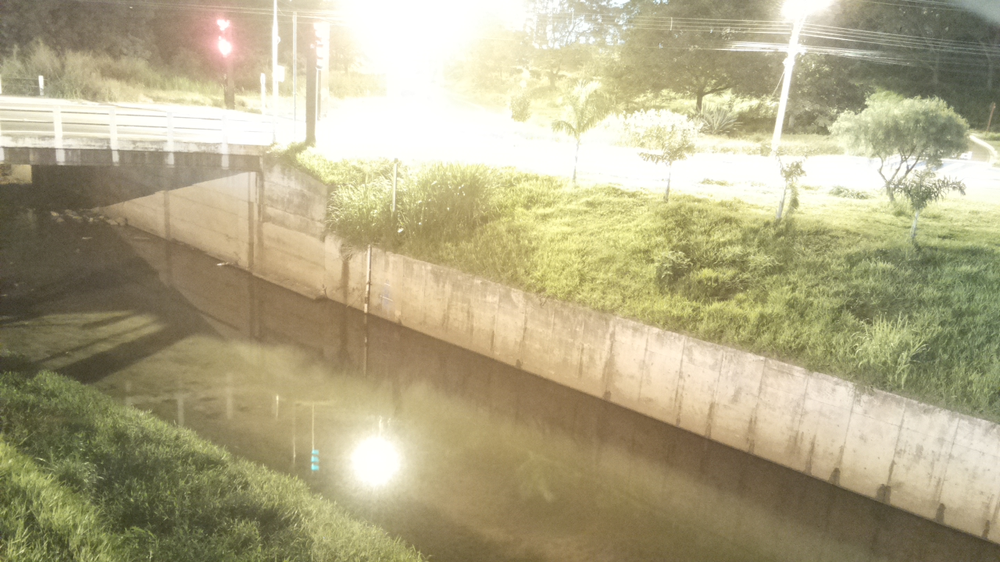

In [8]:
import cv2
import os
from google.colab.patches import cv2_imshow

path = os.path.join('/content/drive/MyDrive/enoe2',df.iloc[0]['path'])
#print(path)
img = cv2.imread( path )
cv2_imshow(img)

In [4]:
src_dir = '/home/caetano/enoe'
dst_dir = '/home/caetano/enoe2'

for index, row in df.iterrows():
    path_split = os.path.split(row['path'])
    fname = path_split[1]
    mtc = re.match('(\d\d\d\d)(\d\d)(\d\d)_(\d\d)(\d\d)(\d\d)', fname)
    if not mtc:
        continue
    yyyy = mtc.groups()[0]
    mm = mtc.groups()[1]
    dd = mtc.groups()[2]
    old_path = os.path.join( src_dir, yyyy, fname )
    new_path = os.path.join( dst_dir, yyyy, mm, dd, fname )
    os.makedirs( os.path.join(dst_dir, yyyy, mm, dd), exist_ok=True )
    shutil.copyfile(old_path, new_path)
    df.loc[ index, 'path' ] = os.path.join( yyyy, mm, dd, fname )
    print( old_path, new_path )

df.to_csv(csv_path)

/home/caetano/enoe/2018/20181101_000058-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_000058-SHOP.jpg
/home/caetano/enoe/2018/20181101_000110-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_000110-SESC2.jpg
/home/caetano/enoe/2018/20181101_001722-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_001722-SHOP.jpg
/home/caetano/enoe/2018/20181101_001730-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_001730-SESC2.jpg
/home/caetano/enoe/2018/20181101_003325-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_003325-SESC2.jpg
/home/caetano/enoe/2018/20181101_003351-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_003351-SHOP.jpg
/home/caetano/enoe/2018/20181101_004915-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_004915-SESC2.jpg
/home/caetano/enoe/2018/20181101_005003-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_005003-SHOP.jpg
/home/caetano/enoe/2018/20181101_010505-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_010505-SESC2.jpg
/home/caetano/enoe/2018/20181101_010617-SHOP.

/home/caetano/enoe/2018/20181101_110249-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_110249-SHOP.jpg
/home/caetano/enoe/2018/20181101_110343-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_110343-SESC2.jpg
/home/caetano/enoe/2018/20181101_111817-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_111817-SHOP.jpg
/home/caetano/enoe/2018/20181101_111926-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_111926-SESC2.jpg
/home/caetano/enoe/2018/20181101_113345-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_113345-SHOP.jpg
/home/caetano/enoe/2018/20181101_113458-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_113458-SESC2.jpg
/home/caetano/enoe/2018/20181101_114913-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_114913-SHOP.jpg
/home/caetano/enoe/2018/20181101_115031-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_115031-SESC2.jpg
/home/caetano/enoe/2018/20181101_120058-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_120058-SHOP.jpg
/home/caetano/enoe/2018/20181101_120111-SESC2.j

/home/caetano/enoe/2018/20181101_212210-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_212210-SHOP.jpg
/home/caetano/enoe/2018/20181101_212733-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_212733-SESC2.jpg
/home/caetano/enoe/2018/20181101_213823-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_213823-SHOP.jpg
/home/caetano/enoe/2018/20181101_214323-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_214323-SESC2.jpg
/home/caetano/enoe/2018/20181101_215437-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_215437-SHOP.jpg
/home/caetano/enoe/2018/20181101_215912-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_215912-SESC2.jpg
/home/caetano/enoe/2018/20181101_220058-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_220058-SHOP.jpg
/home/caetano/enoe/2018/20181101_220110-SESC2.jpg /home/caetano/enoe2/2018/11/01/20181101_220110-SESC2.jpg
/home/caetano/enoe/2018/20181101_221713-SHOP.jpg /home/caetano/enoe2/2018/11/01/20181101_221713-SHOP.jpg
/home/caetano/enoe/2018/20181101_221715-SESC2.j

/home/caetano/enoe/2018/20181102_075212-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_075212-SHOP.jpg
/home/caetano/enoe/2018/20181102_075451-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_075451-SESC2.jpg
/home/caetano/enoe/2018/20181102_080058-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_080058-SHOP.jpg
/home/caetano/enoe/2018/20181102_080110-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_080110-SESC2.jpg
/home/caetano/enoe/2018/20181102_081628-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_081628-SHOP.jpg
/home/caetano/enoe/2018/20181102_081659-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_081659-SESC2.jpg
/home/caetano/enoe/2018/20181102_083154-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_083154-SHOP.jpg
/home/caetano/enoe/2018/20181102_083239-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_083239-SESC2.jpg
/home/caetano/enoe/2018/20181102_084721-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_084721-SHOP.jpg
/home/caetano/enoe/2018/20181102_084813-SESC2.j

/home/caetano/enoe/2018/20181102_184855-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_184855-SHOP.jpg
/home/caetano/enoe/2018/20181102_190405-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_190405-SESC2.jpg
/home/caetano/enoe/2018/20181102_190513-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_190513-SHOP.jpg
/home/caetano/enoe/2018/20181102_191955-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_191955-SESC2.jpg
/home/caetano/enoe/2018/20181102_192127-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_192127-SHOP.jpg
/home/caetano/enoe/2018/20181102_193545-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_193545-SESC2.jpg
/home/caetano/enoe/2018/20181102_193739-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_193739-SHOP.jpg
/home/caetano/enoe/2018/20181102_195134-SESC2.jpg /home/caetano/enoe2/2018/11/02/20181102_195134-SESC2.jpg
/home/caetano/enoe/2018/20181102_195358-SHOP.jpg /home/caetano/enoe2/2018/11/02/20181102_195358-SHOP.jpg
/home/caetano/enoe/2018/20181102_200058-SHOP.jp

/home/caetano/enoe/2018/20181103_043326-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_043326-SHOP.jpg
/home/caetano/enoe/2018/20181103_044848-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_044848-SESC2.jpg
/home/caetano/enoe/2018/20181103_044939-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_044939-SHOP.jpg
/home/caetano/enoe/2018/20181103_050435-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_050435-SESC2.jpg
/home/caetano/enoe/2018/20181103_050551-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_050551-SHOP.jpg
/home/caetano/enoe/2018/20181103_052005-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_052005-SESC2.jpg
/home/caetano/enoe/2018/20181103_052204-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_052204-SHOP.jpg
/home/caetano/enoe/2018/20181103_053539-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_053539-SESC2.jpg
/home/caetano/enoe/2018/20181103_053815-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_053815-SHOP.jpg
/home/caetano/enoe/2018/20181103_055113-SESC2.j

/home/caetano/enoe/2018/20181103_141656-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_141656-SESC2.jpg
/home/caetano/enoe/2018/20181103_143153-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_143153-SHOP.jpg
/home/caetano/enoe/2018/20181103_143230-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_143230-SESC2.jpg
/home/caetano/enoe/2018/20181103_144720-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_144720-SHOP.jpg
/home/caetano/enoe/2018/20181103_144806-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_144806-SESC2.jpg
/home/caetano/enoe/2018/20181103_150302-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_150302-SHOP.jpg
/home/caetano/enoe/2018/20181103_150343-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_150343-SESC2.jpg
/home/caetano/enoe/2018/20181103_151830-SHOP.jpg /home/caetano/enoe2/2018/11/03/20181103_151830-SHOP.jpg
/home/caetano/enoe/2018/20181103_151919-SESC2.jpg /home/caetano/enoe2/2018/11/03/20181103_151919-SESC2.jpg
/home/caetano/enoe/2018/20181103_153357-SHOP.

/home/caetano/enoe/2018/20181104_012714-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_012714-SHOP.jpg
/home/caetano/enoe/2018/20181104_013951-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_013951-SESC2.jpg
/home/caetano/enoe/2018/20181104_014327-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_014327-SHOP.jpg
/home/caetano/enoe/2018/20181104_015544-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_015544-SESC2.jpg
/home/caetano/enoe/2018/20181104_020110-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_020110-SESC2.jpg
/home/caetano/enoe/2018/20181104_020115-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_020115-SHOP.jpg
/home/caetano/enoe/2018/20181104_021712-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_021712-SESC2.jpg
/home/caetano/enoe/2018/20181104_021730-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_021730-SHOP.jpg
/home/caetano/enoe/2018/20181104_023258-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_023258-SESC2.jpg
/home/caetano/enoe/2018/20181104_023343-SHOP.

/home/caetano/enoe/2018/20181104_120111-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_120111-SESC2.jpg
/home/caetano/enoe/2018/20181104_121627-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_121627-SHOP.jpg
/home/caetano/enoe/2018/20181104_121716-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_121716-SESC2.jpg
/home/caetano/enoe/2018/20181104_123155-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_123155-SHOP.jpg
/home/caetano/enoe/2018/20181104_123245-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_123245-SESC2.jpg
/home/caetano/enoe/2018/20181104_124722-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_124722-SHOP.jpg
/home/caetano/enoe/2018/20181104_124814-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_124814-SESC2.jpg
/home/caetano/enoe/2018/20181104_130249-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_130249-SHOP.jpg
/home/caetano/enoe/2018/20181104_130349-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_130349-SESC2.jpg
/home/caetano/enoe/2018/20181104_131816-SHOP.

/home/caetano/enoe/2018/20181104_230629-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_230629-SHOP.jpg
/home/caetano/enoe/2018/20181104_232036-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_232036-SESC2.jpg
/home/caetano/enoe/2018/20181104_232248-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_232248-SHOP.jpg
/home/caetano/enoe/2018/20181104_233624-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_233624-SESC2.jpg
/home/caetano/enoe/2018/20181104_233901-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_233901-SHOP.jpg
/home/caetano/enoe/2018/20181104_235213-SESC2.jpg /home/caetano/enoe2/2018/11/04/20181104_235213-SESC2.jpg
/home/caetano/enoe/2018/20181104_235513-SHOP.jpg /home/caetano/enoe2/2018/11/04/20181104_235513-SHOP.jpg
/home/caetano/enoe/2018/20181105_000100-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_000100-SHOP.jpg
/home/caetano/enoe/2018/20181105_000110-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_000110-SESC2.jpg
/home/caetano/enoe/2018/20181105_001714-SHOP.jp

/home/caetano/enoe/2018/20181105_101658-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_101658-SESC2.jpg
/home/caetano/enoe/2018/20181105_103154-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_103154-SHOP.jpg
/home/caetano/enoe/2018/20181105_103232-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_103232-SESC2.jpg
/home/caetano/enoe/2018/20181105_104721-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_104721-SHOP.jpg
/home/caetano/enoe/2018/20181105_105648-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_105648-SESC2.jpg
/home/caetano/enoe/2018/20181105_120058-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_120058-SHOP.jpg
/home/caetano/enoe/2018/20181105_120111-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_120111-SESC2.jpg
/home/caetano/enoe/2018/20181105_121631-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_121631-SHOP.jpg
/home/caetano/enoe/2018/20181105_121712-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_121712-SESC2.jpg
/home/caetano/enoe/2018/20181105_123200-SHOP.

/home/caetano/enoe/2018/20181105_220110-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_220110-SESC2.jpg
/home/caetano/enoe/2018/20181105_221717-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_221717-SHOP.jpg
/home/caetano/enoe/2018/20181105_221720-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_221720-SESC2.jpg
/home/caetano/enoe/2018/20181105_223309-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_223309-SESC2.jpg
/home/caetano/enoe/2018/20181105_223334-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_223334-SHOP.jpg
/home/caetano/enoe/2018/20181105_224858-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_224858-SESC2.jpg
/home/caetano/enoe/2018/20181105_224949-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_224949-SHOP.jpg
/home/caetano/enoe/2018/20181105_230449-SESC2.jpg /home/caetano/enoe2/2018/11/05/20181105_230449-SESC2.jpg
/home/caetano/enoe/2018/20181105_230606-SHOP.jpg /home/caetano/enoe2/2018/11/05/20181105_230606-SHOP.jpg
/home/caetano/enoe/2018/20181105_232039-SESC2

/home/caetano/enoe/2018/20181106_083448-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_083448-SESC2.jpg
/home/caetano/enoe/2018/20181106_084722-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_084722-SHOP.jpg
/home/caetano/enoe/2018/20181106_085021-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_085021-SESC2.jpg
/home/caetano/enoe/2018/20181106_090249-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_090249-SHOP.jpg
/home/caetano/enoe/2018/20181106_090551-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_090551-SESC2.jpg
/home/caetano/enoe/2018/20181106_091816-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_091816-SHOP.jpg
/home/caetano/enoe/2018/20181106_092120-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_092120-SESC2.jpg
/home/caetano/enoe/2018/20181106_093344-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_093344-SHOP.jpg
/home/caetano/enoe/2018/20181106_093654-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_093654-SESC2.jpg
/home/caetano/enoe/2018/20181106_094911-SHOP.

/home/caetano/enoe/2018/20181106_200059-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_200059-SHOP.jpg
/home/caetano/enoe/2018/20181106_200111-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_200111-SESC2.jpg
/home/caetano/enoe/2018/20181106_201713-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_201713-SHOP.jpg
/home/caetano/enoe/2018/20181106_201727-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_201727-SESC2.jpg
/home/caetano/enoe/2018/20181106_203319-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_203319-SESC2.jpg
/home/caetano/enoe/2018/20181106_203330-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_203330-SHOP.jpg
/home/caetano/enoe/2018/20181106_204908-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_204908-SESC2.jpg
/home/caetano/enoe/2018/20181106_204947-SHOP.jpg /home/caetano/enoe2/2018/11/06/20181106_204947-SHOP.jpg
/home/caetano/enoe/2018/20181106_210458-SESC2.jpg /home/caetano/enoe2/2018/11/06/20181106_210458-SESC2.jpg
/home/caetano/enoe/2018/20181106_210603-SHOP.

/home/caetano/enoe/2018/20181107_083155-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_083155-SHOP.jpg
/home/caetano/enoe/2018/20181107_083246-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_083246-SESC2.jpg
/home/caetano/enoe/2018/20181107_084725-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_084725-SHOP.jpg
/home/caetano/enoe/2018/20181107_084820-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_084820-SESC2.jpg
/home/caetano/enoe/2018/20181107_090253-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_090253-SHOP.jpg
/home/caetano/enoe/2018/20181107_090352-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_090352-SESC2.jpg
/home/caetano/enoe/2018/20181107_091820-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_091820-SHOP.jpg
/home/caetano/enoe/2018/20181107_091924-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_091924-SESC2.jpg
/home/caetano/enoe/2018/20181107_093347-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_093347-SHOP.jpg
/home/caetano/enoe/2018/20181107_093458-SESC2.j

/home/caetano/enoe/2018/20181107_200100-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_200100-SHOP.jpg
/home/caetano/enoe/2018/20181107_200111-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_200111-SESC2.jpg
/home/caetano/enoe/2018/20181107_201715-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_201715-SHOP.jpg
/home/caetano/enoe/2018/20181107_201941-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_201941-SESC2.jpg
/home/caetano/enoe/2018/20181107_203328-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_203328-SHOP.jpg
/home/caetano/enoe/2018/20181107_203531-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_203531-SESC2.jpg
/home/caetano/enoe/2018/20181107_204943-SHOP.jpg /home/caetano/enoe2/2018/11/07/20181107_204943-SHOP.jpg
/home/caetano/enoe/2018/20181107_205121-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_205121-SESC2.jpg
/home/caetano/enoe/2018/20181107_210717-SESC2.jpg /home/caetano/enoe2/2018/11/07/20181107_210717-SESC2.jpg
/home/caetano/enoe/2018/20181107_212310-SESC2

/home/caetano/enoe/2018/20181108_083213-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_083213-SHOP.jpg
/home/caetano/enoe/2018/20181108_083234-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_083234-SESC2.jpg
/home/caetano/enoe/2018/20181108_084740-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_084740-SHOP.jpg
/home/caetano/enoe/2018/20181108_084807-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_084807-SESC2.jpg
/home/caetano/enoe/2018/20181108_090308-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_090308-SHOP.jpg
/home/caetano/enoe/2018/20181108_090342-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_090342-SESC2.jpg
/home/caetano/enoe/2018/20181108_091835-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_091835-SHOP.jpg
/home/caetano/enoe/2018/20181108_091915-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_091915-SESC2.jpg
/home/caetano/enoe/2018/20181108_093402-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_093402-SHOP.jpg
/home/caetano/enoe/2018/20181108_093449-SESC2.j

/home/caetano/enoe/2018/20181108_183254-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_183254-SESC2.jpg
/home/caetano/enoe/2018/20181108_184833-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_184833-SESC2.jpg
/home/caetano/enoe/2018/20181108_184853-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_184853-SHOP.jpg
/home/caetano/enoe/2018/20181108_190407-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_190407-SESC2.jpg
/home/caetano/enoe/2018/20181108_190504-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_190504-SHOP.jpg
/home/caetano/enoe/2018/20181108_191945-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_191945-SESC2.jpg
/home/caetano/enoe/2018/20181108_192116-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_192116-SHOP.jpg
/home/caetano/enoe/2018/20181108_193518-SESC2.jpg /home/caetano/enoe2/2018/11/08/20181108_193518-SESC2.jpg
/home/caetano/enoe/2018/20181108_193728-SHOP.jpg /home/caetano/enoe2/2018/11/08/20181108_193728-SHOP.jpg
/home/caetano/enoe/2018/20181108_195053-SESC2

/home/caetano/enoe/2018/20181109_044937-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_044937-SHOP.jpg
/home/caetano/enoe/2018/20181109_050455-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_050455-SESC2.jpg
/home/caetano/enoe/2018/20181109_050554-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_050554-SHOP.jpg
/home/caetano/enoe/2018/20181109_052207-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_052207-SHOP.jpg
/home/caetano/enoe/2018/20181109_052934-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_052934-SESC2.jpg
/home/caetano/enoe/2018/20181109_053820-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_053820-SHOP.jpg
/home/caetano/enoe/2018/20181109_054529-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_054529-SESC2.jpg
/home/caetano/enoe/2018/20181109_055433-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_055433-SHOP.jpg
/home/caetano/enoe/2018/20181109_060059-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_060059-SHOP.jpg
/home/caetano/enoe/2018/20181109_060110-SESC2.jpg

/home/caetano/enoe/2018/20181109_152855-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_152855-SESC2.jpg
/home/caetano/enoe/2018/20181109_153402-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_153402-SHOP.jpg
/home/caetano/enoe/2018/20181109_154427-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_154427-SESC2.jpg
/home/caetano/enoe/2018/20181109_154928-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_154928-SHOP.jpg
/home/caetano/enoe/2018/20181109_160000-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_160000-SESC2.jpg
/home/caetano/enoe/2018/20181109_160058-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_160058-SHOP.jpg
/home/caetano/enoe/2018/20181109_160110-SESC2.jpg /home/caetano/enoe2/2018/11/09/20181109_160110-SESC2.jpg
/home/caetano/enoe/2018/20181109_161629-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_161629-SHOP.jpg
/home/caetano/enoe/2018/20181109_163200-SHOP.jpg /home/caetano/enoe2/2018/11/09/20181109_163200-SHOP.jpg
/home/caetano/enoe/2018/20181109_164728-SHOP.jp

/home/caetano/enoe/2018/20181110_024956-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_024956-SHOP.jpg
/home/caetano/enoe/2018/20181110_030456-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_030456-SESC2.jpg
/home/caetano/enoe/2018/20181110_030609-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_030609-SHOP.jpg
/home/caetano/enoe/2018/20181110_032048-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_032048-SESC2.jpg
/home/caetano/enoe/2018/20181110_032222-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_032222-SHOP.jpg
/home/caetano/enoe/2018/20181110_033638-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_033638-SESC2.jpg
/home/caetano/enoe/2018/20181110_033834-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_033834-SHOP.jpg
/home/caetano/enoe/2018/20181110_035224-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_035224-SESC2.jpg
/home/caetano/enoe/2018/20181110_035447-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_035447-SHOP.jpg
/home/caetano/enoe/2018/20181110_040058-SHOP.jp

/home/caetano/enoe/2018/20181110_143155-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_143155-SHOP.jpg
/home/caetano/enoe/2018/20181110_143231-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_143231-SESC2.jpg
/home/caetano/enoe/2018/20181110_144722-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_144722-SHOP.jpg
/home/caetano/enoe/2018/20181110_145015-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_145015-SESC2.jpg
/home/caetano/enoe/2018/20181110_150249-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_150249-SHOP.jpg
/home/caetano/enoe/2018/20181110_150550-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_150550-SESC2.jpg
/home/caetano/enoe/2018/20181110_151817-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_151817-SHOP.jpg
/home/caetano/enoe/2018/20181110_152118-SESC2.jpg /home/caetano/enoe2/2018/11/10/20181110_152118-SESC2.jpg
/home/caetano/enoe/2018/20181110_153344-SHOP.jpg /home/caetano/enoe2/2018/11/10/20181110_153344-SHOP.jpg
/home/caetano/enoe/2018/20181110_153650-SESC2.j

/home/caetano/enoe/2018/20181111_003314-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_003314-SESC2.jpg
/home/caetano/enoe/2018/20181111_003324-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_003324-SHOP.jpg
/home/caetano/enoe/2018/20181111_004900-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_004900-SESC2.jpg
/home/caetano/enoe/2018/20181111_004937-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_004937-SHOP.jpg
/home/caetano/enoe/2018/20181111_010449-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_010449-SESC2.jpg
/home/caetano/enoe/2018/20181111_010550-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_010550-SHOP.jpg
/home/caetano/enoe/2018/20181111_012041-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_012041-SESC2.jpg
/home/caetano/enoe/2018/20181111_012202-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_012202-SHOP.jpg
/home/caetano/enoe/2018/20181111_013639-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_013639-SESC2.jpg
/home/caetano/enoe/2018/20181111_013816-SHOP.

/home/caetano/enoe/2018/20181111_103152-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_103152-SHOP.jpg
/home/caetano/enoe/2018/20181111_103234-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_103234-SESC2.jpg
/home/caetano/enoe/2018/20181111_104719-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_104719-SHOP.jpg
/home/caetano/enoe/2018/20181111_104808-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_104808-SESC2.jpg
/home/caetano/enoe/2018/20181111_110246-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_110246-SHOP.jpg
/home/caetano/enoe/2018/20181111_110338-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_110338-SESC2.jpg
/home/caetano/enoe/2018/20181111_111814-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_111814-SHOP.jpg
/home/caetano/enoe/2018/20181111_111908-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_111908-SESC2.jpg
/home/caetano/enoe/2018/20181111_113341-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_113341-SHOP.jpg
/home/caetano/enoe/2018/20181111_113437-SESC2.j

/home/caetano/enoe/2018/20181111_204944-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_204944-SHOP.jpg
/home/caetano/enoe/2018/20181111_210442-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_210442-SESC2.jpg
/home/caetano/enoe/2018/20181111_210601-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_210601-SHOP.jpg
/home/caetano/enoe/2018/20181111_212028-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_212028-SESC2.jpg
/home/caetano/enoe/2018/20181111_212216-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_212216-SHOP.jpg
/home/caetano/enoe/2018/20181111_213617-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_213617-SESC2.jpg
/home/caetano/enoe/2018/20181111_213832-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_213832-SHOP.jpg
/home/caetano/enoe/2018/20181111_215206-SESC2.jpg /home/caetano/enoe2/2018/11/11/20181111_215206-SESC2.jpg
/home/caetano/enoe/2018/20181111_215446-SHOP.jpg /home/caetano/enoe2/2018/11/11/20181111_215446-SHOP.jpg
/home/caetano/enoe/2018/20181111_220042-SHOP.jp

/home/caetano/enoe/2018/20181112_070339-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_070339-SHOP.jpg
/home/caetano/enoe/2018/20181112_070340-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_070340-SESC2.jpg
/home/caetano/enoe/2018/20181112_071906-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_071906-SHOP.jpg
/home/caetano/enoe/2018/20181112_071912-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_071912-SESC2.jpg
/home/caetano/enoe/2018/20181112_073434-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_073434-SHOP.jpg
/home/caetano/enoe/2018/20181112_073445-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_073445-SESC2.jpg
/home/caetano/enoe/2018/20181112_075003-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_075003-SHOP.jpg
/home/caetano/enoe/2018/20181112_075022-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_075022-SESC2.jpg
/home/caetano/enoe/2018/20181112_080058-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_080058-SHOP.jpg
/home/caetano/enoe/2018/20181112_080112-SESC2.j

/home/caetano/enoe/2018/20181112_184853-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_184853-SHOP.jpg
/home/caetano/enoe/2018/20181112_190337-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_190337-SESC2.jpg
/home/caetano/enoe/2018/20181112_190505-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_190505-SHOP.jpg
/home/caetano/enoe/2018/20181112_191905-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_191905-SESC2.jpg
/home/caetano/enoe/2018/20181112_192117-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_192117-SHOP.jpg
/home/caetano/enoe/2018/20181112_193438-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_193438-SESC2.jpg
/home/caetano/enoe/2018/20181112_193729-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_193729-SHOP.jpg
/home/caetano/enoe/2018/20181112_195011-SESC2.jpg /home/caetano/enoe2/2018/11/12/20181112_195011-SESC2.jpg
/home/caetano/enoe/2018/20181112_195341-SHOP.jpg /home/caetano/enoe2/2018/11/12/20181112_195341-SHOP.jpg
/home/caetano/enoe/2018/20181112_200110-SESC2.j

/home/caetano/enoe/2018/20181113_053823-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_053823-SHOP.jpg
/home/caetano/enoe/2018/20181113_055229-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_055229-SESC2.jpg
/home/caetano/enoe/2018/20181113_055435-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_055435-SHOP.jpg
/home/caetano/enoe/2018/20181113_060115-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_060115-SHOP.jpg
/home/caetano/enoe/2018/20181113_060126-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_060126-SESC2.jpg
/home/caetano/enoe/2018/20181113_061642-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_061642-SHOP.jpg
/home/caetano/enoe/2018/20181113_061659-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_061659-SESC2.jpg
/home/caetano/enoe/2018/20181113_063209-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_063209-SHOP.jpg
/home/caetano/enoe/2018/20181113_063231-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_063231-SESC2.jpg
/home/caetano/enoe/2018/20181113_064736-SHOP.jp

/home/caetano/enoe/2018/20181113_161646-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_161646-SHOP.jpg
/home/caetano/enoe/2018/20181113_161713-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_161713-SESC2.jpg
/home/caetano/enoe/2018/20181113_163214-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_163214-SHOP.jpg
/home/caetano/enoe/2018/20181113_163245-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_163245-SESC2.jpg
/home/caetano/enoe/2018/20181113_164743-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_164743-SHOP.jpg
/home/caetano/enoe/2018/20181113_164822-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_164822-SESC2.jpg
/home/caetano/enoe/2018/20181113_170310-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_170310-SHOP.jpg
/home/caetano/enoe/2018/20181113_170357-SESC2.jpg /home/caetano/enoe2/2018/11/13/20181113_170357-SESC2.jpg
/home/caetano/enoe/2018/20181113_171838-SHOP.jpg /home/caetano/enoe2/2018/11/13/20181113_171838-SHOP.jpg
/home/caetano/enoe/2018/20181113_171934-SESC2.j

/home/caetano/enoe/2018/20181114_021713-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_021713-SHOP.jpg
/home/caetano/enoe/2018/20181114_021717-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_021717-SESC2.jpg
/home/caetano/enoe/2018/20181114_023304-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_023304-SESC2.jpg
/home/caetano/enoe/2018/20181114_023326-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_023326-SHOP.jpg
/home/caetano/enoe/2018/20181114_024849-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_024849-SESC2.jpg
/home/caetano/enoe/2018/20181114_024941-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_024941-SHOP.jpg
/home/caetano/enoe/2018/20181114_030439-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_030439-SESC2.jpg
/home/caetano/enoe/2018/20181114_030554-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_030554-SHOP.jpg
/home/caetano/enoe/2018/20181114_032024-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_032024-SESC2.jpg
/home/caetano/enoe/2018/20181114_032207-SHOP.

/home/caetano/enoe/2018/20181114_131822-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_131822-SHOP.jpg
/home/caetano/enoe/2018/20181114_131916-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_131916-SESC2.jpg
/home/caetano/enoe/2018/20181114_133350-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_133350-SHOP.jpg
/home/caetano/enoe/2018/20181114_133448-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_133448-SESC2.jpg
/home/caetano/enoe/2018/20181114_134918-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_134918-SHOP.jpg
/home/caetano/enoe/2018/20181114_135020-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_135020-SESC2.jpg
/home/caetano/enoe/2018/20181114_140058-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_140058-SHOP.jpg
/home/caetano/enoe/2018/20181114_140128-SESC2.jpg /home/caetano/enoe2/2018/11/14/20181114_140128-SESC2.jpg
/home/caetano/enoe/2018/20181114_141626-SHOP.jpg /home/caetano/enoe2/2018/11/14/20181114_141626-SHOP.jpg
/home/caetano/enoe/2018/20181114_141705-SESC2.j

/home/caetano/enoe/2018/20181115_001714-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_001714-SHOP.jpg
/home/caetano/enoe/2018/20181115_001717-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_001717-SESC2.jpg
/home/caetano/enoe/2018/20181115_003303-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_003303-SESC2.jpg
/home/caetano/enoe/2018/20181115_003326-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_003326-SHOP.jpg
/home/caetano/enoe/2018/20181115_004849-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_004849-SESC2.jpg
/home/caetano/enoe/2018/20181115_004940-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_004940-SHOP.jpg
/home/caetano/enoe/2018/20181115_010437-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_010437-SESC2.jpg
/home/caetano/enoe/2018/20181115_010553-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_010553-SHOP.jpg
/home/caetano/enoe/2018/20181115_012028-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_012028-SESC2.jpg
/home/caetano/enoe/2018/20181115_012208-SHOP.

/home/caetano/enoe/2018/20181115_100058-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_100058-SHOP.jpg
/home/caetano/enoe/2018/20181115_100112-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_100112-SESC2.jpg
/home/caetano/enoe/2018/20181115_101627-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_101627-SHOP.jpg
/home/caetano/enoe/2018/20181115_101658-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_101658-SESC2.jpg
/home/caetano/enoe/2018/20181115_103154-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_103154-SHOP.jpg
/home/caetano/enoe/2018/20181115_104113-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_104113-SESC2.jpg
/home/caetano/enoe/2018/20181115_104720-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_104720-SHOP.jpg
/home/caetano/enoe/2018/20181115_105645-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_105645-SESC2.jpg
/home/caetano/enoe/2018/20181115_110248-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_110248-SHOP.jpg
/home/caetano/enoe/2018/20181115_111218-SESC2.j

/home/caetano/enoe/2018/20181115_205125-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_205125-SESC2.jpg
/home/caetano/enoe/2018/20181115_210552-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_210552-SHOP.jpg
/home/caetano/enoe/2018/20181115_210714-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_210714-SESC2.jpg
/home/caetano/enoe/2018/20181115_212205-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_212205-SHOP.jpg
/home/caetano/enoe/2018/20181115_212304-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_212304-SESC2.jpg
/home/caetano/enoe/2018/20181115_213818-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_213818-SHOP.jpg
/home/caetano/enoe/2018/20181115_213855-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_213855-SESC2.jpg
/home/caetano/enoe/2018/20181115_215432-SHOP.jpg /home/caetano/enoe2/2018/11/15/20181115_215432-SHOP.jpg
/home/caetano/enoe/2018/20181115_215444-SESC2.jpg /home/caetano/enoe2/2018/11/15/20181115_215444-SESC2.jpg
/home/caetano/enoe/2018/20181115_220058-SHOP.

/home/caetano/enoe/2018/20181116_081627-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_081627-SHOP.jpg
/home/caetano/enoe/2018/20181116_081705-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_081705-SESC2.jpg
/home/caetano/enoe/2018/20181116_083155-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_083155-SHOP.jpg
/home/caetano/enoe/2018/20181116_083238-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_083238-SESC2.jpg
/home/caetano/enoe/2018/20181116_084722-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_084722-SHOP.jpg
/home/caetano/enoe/2018/20181116_084814-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_084814-SESC2.jpg
/home/caetano/enoe/2018/20181116_090249-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_090249-SHOP.jpg
/home/caetano/enoe/2018/20181116_091039-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_091039-SESC2.jpg
/home/caetano/enoe/2018/20181116_091817-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_091817-SHOP.jpg
/home/caetano/enoe/2018/20181116_092613-SESC2.j

/home/caetano/enoe/2018/20181116_181700-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_181700-SESC2.jpg
/home/caetano/enoe/2018/20181116_183234-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_183234-SESC2.jpg
/home/caetano/enoe/2018/20181116_183239-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_183239-SHOP.jpg
/home/caetano/enoe/2018/20181116_184804-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_184804-SESC2.jpg
/home/caetano/enoe/2018/20181116_184851-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_184851-SHOP.jpg
/home/caetano/enoe/2018/20181116_190341-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_190341-SESC2.jpg
/home/caetano/enoe/2018/20181116_190503-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_190503-SHOP.jpg
/home/caetano/enoe/2018/20181116_191917-SESC2.jpg /home/caetano/enoe2/2018/11/16/20181116_191917-SESC2.jpg
/home/caetano/enoe/2018/20181116_192115-SHOP.jpg /home/caetano/enoe2/2018/11/16/20181116_192115-SHOP.jpg
/home/caetano/enoe/2018/20181116_193450-SESC2

/home/caetano/enoe/2018/20181117_061642-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_061642-SHOP.jpg
/home/caetano/enoe/2018/20181117_061701-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_061701-SESC2.jpg
/home/caetano/enoe/2018/20181117_063209-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_063209-SHOP.jpg
/home/caetano/enoe/2018/20181117_063236-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_063236-SESC2.jpg
/home/caetano/enoe/2018/20181117_064735-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_064735-SHOP.jpg
/home/caetano/enoe/2018/20181117_064809-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_064809-SESC2.jpg
/home/caetano/enoe/2018/20181117_070302-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_070302-SHOP.jpg
/home/caetano/enoe/2018/20181117_070345-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_070345-SESC2.jpg
/home/caetano/enoe/2018/20181117_071832-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_071832-SHOP.jpg
/home/caetano/enoe/2018/20181117_071917-SESC2.j

/home/caetano/enoe/2018/20181117_172842-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_172842-SESC2.jpg
/home/caetano/enoe/2018/20181117_173344-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_173344-SHOP.jpg
/home/caetano/enoe/2018/20181117_174416-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_174416-SESC2.jpg
/home/caetano/enoe/2018/20181117_174911-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_174911-SHOP.jpg
/home/caetano/enoe/2018/20181117_175949-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_175949-SESC2.jpg
/home/caetano/enoe/2018/20181117_180100-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_180100-SHOP.jpg
/home/caetano/enoe/2018/20181117_180112-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_180112-SESC2.jpg
/home/caetano/enoe/2018/20181117_181629-SHOP.jpg /home/caetano/enoe2/2018/11/17/20181117_181629-SHOP.jpg
/home/caetano/enoe/2018/20181117_181658-SESC2.jpg /home/caetano/enoe2/2018/11/17/20181117_181658-SESC2.jpg
/home/caetano/enoe/2018/20181117_183231-SESC2

/home/caetano/enoe/2018/20181118_040129-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_040129-SESC2.jpg
/home/caetano/enoe/2018/20181118_041712-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_041712-SHOP.jpg
/home/caetano/enoe/2018/20181118_041717-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_041717-SESC2.jpg
/home/caetano/enoe/2018/20181118_043303-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_043303-SESC2.jpg
/home/caetano/enoe/2018/20181118_043328-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_043328-SHOP.jpg
/home/caetano/enoe/2018/20181118_044849-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_044849-SESC2.jpg
/home/caetano/enoe/2018/20181118_044943-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_044943-SHOP.jpg
/home/caetano/enoe/2018/20181118_050436-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_050436-SESC2.jpg
/home/caetano/enoe/2018/20181118_050555-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_050555-SHOP.jpg
/home/caetano/enoe/2018/20181118_052029-SESC2

/home/caetano/enoe/2018/20181118_143150-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_143150-SHOP.jpg
/home/caetano/enoe/2018/20181118_143233-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_143233-SESC2.jpg
/home/caetano/enoe/2018/20181118_144718-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_144718-SHOP.jpg
/home/caetano/enoe/2018/20181118_144805-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_144805-SESC2.jpg
/home/caetano/enoe/2018/20181118_150244-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_150244-SHOP.jpg
/home/caetano/enoe/2018/20181118_151244-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_151244-SESC2.jpg
/home/caetano/enoe/2018/20181118_151811-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_151811-SHOP.jpg
/home/caetano/enoe/2018/20181118_152819-SESC2.jpg /home/caetano/enoe2/2018/11/18/20181118_152819-SESC2.jpg
/home/caetano/enoe/2018/20181118_153338-SHOP.jpg /home/caetano/enoe2/2018/11/18/20181118_153338-SHOP.jpg
/home/caetano/enoe/2018/20181118_154906-SHOP.jp

/home/caetano/enoe/2018/20181119_003308-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_003308-SESC2.jpg
/home/caetano/enoe/2018/20181119_003325-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_003325-SHOP.jpg
/home/caetano/enoe/2018/20181119_004854-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_004854-SESC2.jpg
/home/caetano/enoe/2018/20181119_004938-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_004938-SHOP.jpg
/home/caetano/enoe/2018/20181119_010439-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_010439-SESC2.jpg
/home/caetano/enoe/2018/20181119_010551-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_010551-SHOP.jpg
/home/caetano/enoe/2018/20181119_012037-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_012037-SESC2.jpg
/home/caetano/enoe/2018/20181119_012204-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_012204-SHOP.jpg
/home/caetano/enoe/2018/20181119_013627-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_013627-SESC2.jpg
/home/caetano/enoe/2018/20181119_013818-SHOP.

/home/caetano/enoe/2018/20181119_104738-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_104738-SHOP.jpg
/home/caetano/enoe/2018/20181119_105250-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_105250-SESC2.jpg
/home/caetano/enoe/2018/20181119_110306-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_110306-SHOP.jpg
/home/caetano/enoe/2018/20181119_110825-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_110825-SESC2.jpg
/home/caetano/enoe/2018/20181119_111833-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_111833-SHOP.jpg
/home/caetano/enoe/2018/20181119_112420-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_112420-SESC2.jpg
/home/caetano/enoe/2018/20181119_113401-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_113401-SHOP.jpg
/home/caetano/enoe/2018/20181119_113955-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_113955-SESC2.jpg
/home/caetano/enoe/2018/20181119_114929-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_114929-SHOP.jpg
/home/caetano/enoe/2018/20181119_115531-SESC2.j

/home/caetano/enoe/2018/20181119_213858-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_213858-SESC2.jpg
/home/caetano/enoe/2018/20181119_214307-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_214307-SHOP.jpg
/home/caetano/enoe/2018/20181119_215450-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_215450-SESC2.jpg
/home/caetano/enoe/2018/20181119_220059-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_220059-SHOP.jpg
/home/caetano/enoe/2018/20181119_220129-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_220129-SESC2.jpg
/home/caetano/enoe/2018/20181119_221714-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_221714-SHOP.jpg
/home/caetano/enoe/2018/20181119_221721-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_221721-SESC2.jpg
/home/caetano/enoe/2018/20181119_223311-SESC2.jpg /home/caetano/enoe2/2018/11/19/20181119_223311-SESC2.jpg
/home/caetano/enoe/2018/20181119_223328-SHOP.jpg /home/caetano/enoe2/2018/11/19/20181119_223328-SHOP.jpg
/home/caetano/enoe/2018/20181119_224901-SESC2

/home/caetano/enoe/2018/20181120_090339-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_090339-SESC2.jpg
/home/caetano/enoe/2018/20181120_091817-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_091817-SHOP.jpg
/home/caetano/enoe/2018/20181120_091912-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_091912-SESC2.jpg
/home/caetano/enoe/2018/20181120_093344-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_093344-SHOP.jpg
/home/caetano/enoe/2018/20181120_093445-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_093445-SESC2.jpg
/home/caetano/enoe/2018/20181120_094912-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_094912-SHOP.jpg
/home/caetano/enoe/2018/20181120_095018-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_095018-SESC2.jpg
/home/caetano/enoe/2018/20181120_100058-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_100058-SHOP.jpg
/home/caetano/enoe/2018/20181120_100111-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_100111-SESC2.jpg
/home/caetano/enoe/2018/20181120_101628-SHOP.

/home/caetano/enoe/2018/20181120_191933-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_191933-SESC2.jpg
/home/caetano/enoe/2018/20181120_192115-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_192115-SHOP.jpg
/home/caetano/enoe/2018/20181120_193507-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_193507-SESC2.jpg
/home/caetano/enoe/2018/20181120_193727-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_193727-SHOP.jpg
/home/caetano/enoe/2018/20181120_195043-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_195043-SESC2.jpg
/home/caetano/enoe/2018/20181120_195338-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_195338-SHOP.jpg
/home/caetano/enoe/2018/20181120_200058-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_200058-SHOP.jpg
/home/caetano/enoe/2018/20181120_200111-SESC2.jpg /home/caetano/enoe2/2018/11/20/20181120_200111-SESC2.jpg
/home/caetano/enoe/2018/20181120_201713-SHOP.jpg /home/caetano/enoe2/2018/11/20/20181120_201713-SHOP.jpg
/home/caetano/enoe/2018/20181120_201718-SESC2.j

/home/caetano/enoe/2018/20181121_060109-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_060109-SESC2.jpg
/home/caetano/enoe/2018/20181121_061655-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_061655-SESC2.jpg
/home/caetano/enoe/2018/20181121_061713-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_061713-SHOP.jpg
/home/caetano/enoe/2018/20181121_063229-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_063229-SESC2.jpg
/home/caetano/enoe/2018/20181121_063242-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_063242-SHOP.jpg
/home/caetano/enoe/2018/20181121_064804-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_064804-SESC2.jpg
/home/caetano/enoe/2018/20181121_064809-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_064809-SHOP.jpg
/home/caetano/enoe/2018/20181121_070336-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_070336-SHOP.jpg
/home/caetano/enoe/2018/20181121_070339-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_070339-SESC2.jpg
/home/caetano/enoe/2018/20181121_071904-SHOP.

/home/caetano/enoe/2018/20181121_170251-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_170251-SHOP.jpg
/home/caetano/enoe/2018/20181121_170345-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_170345-SESC2.jpg
/home/caetano/enoe/2018/20181121_171819-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_171819-SHOP.jpg
/home/caetano/enoe/2018/20181121_173348-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_173348-SHOP.jpg
/home/caetano/enoe/2018/20181121_174222-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_174222-SESC2.jpg
/home/caetano/enoe/2018/20181121_174916-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_174916-SHOP.jpg
/home/caetano/enoe/2018/20181121_180115-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_180115-SHOP.jpg
/home/caetano/enoe/2018/20181121_180130-SESC2.jpg /home/caetano/enoe2/2018/11/21/20181121_180130-SESC2.jpg
/home/caetano/enoe/2018/20181121_181644-SHOP.jpg /home/caetano/enoe2/2018/11/21/20181121_181644-SHOP.jpg
/home/caetano/enoe/2018/20181121_181716-SESC2.jpg

/home/caetano/enoe/2018/20181122_050608-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_050608-SHOP.jpg
/home/caetano/enoe/2018/20181122_052041-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_052041-SESC2.jpg
/home/caetano/enoe/2018/20181122_052222-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_052222-SHOP.jpg
/home/caetano/enoe/2018/20181122_053630-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_053630-SESC2.jpg
/home/caetano/enoe/2018/20181122_053933-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_053933-SHOP.jpg
/home/caetano/enoe/2018/20181122_055220-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_055220-SESC2.jpg
/home/caetano/enoe/2018/20181122_055547-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_055547-SHOP.jpg
/home/caetano/enoe/2018/20181122_060059-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_060059-SHOP.jpg
/home/caetano/enoe/2018/20181122_060128-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_060128-SESC2.jpg
/home/caetano/enoe/2018/20181122_061702-SESC2.j

/home/caetano/enoe/2018/20181122_155032-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_155032-SESC2.jpg
/home/caetano/enoe/2018/20181122_155058-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_155058-SHOP.jpg
/home/caetano/enoe/2018/20181122_160110-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_160110-SESC2.jpg
/home/caetano/enoe/2018/20181122_160117-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_160117-SHOP.jpg
/home/caetano/enoe/2018/20181122_161701-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_161701-SHOP.jpg
/home/caetano/enoe/2018/20181122_161706-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_161706-SESC2.jpg
/home/caetano/enoe/2018/20181122_163241-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_163241-SESC2.jpg
/home/caetano/enoe/2018/20181122_163244-SHOP.jpg /home/caetano/enoe2/2018/11/22/20181122_163244-SHOP.jpg
/home/caetano/enoe/2018/20181122_164822-SESC2.jpg /home/caetano/enoe2/2018/11/22/20181122_164822-SESC2.jpg
/home/caetano/enoe/2018/20181122_164826-SHOP.

/home/caetano/enoe/2018/20181123_034341-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_034341-SESC2.jpg
/home/caetano/enoe/2018/20181123_035448-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_035448-SHOP.jpg
/home/caetano/enoe/2018/20181123_035932-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_035932-SESC2.jpg
/home/caetano/enoe/2018/20181123_040058-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_040058-SHOP.jpg
/home/caetano/enoe/2018/20181123_040110-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_040110-SESC2.jpg
/home/caetano/enoe/2018/20181123_041715-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_041715-SHOP.jpg
/home/caetano/enoe/2018/20181123_041719-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_041719-SESC2.jpg
/home/caetano/enoe/2018/20181123_043317-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_043317-SESC2.jpg
/home/caetano/enoe/2018/20181123_043328-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_043328-SHOP.jpg
/home/caetano/enoe/2018/20181123_044906-SESC2

/home/caetano/enoe/2018/20181123_135103-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_135103-SESC2.jpg
/home/caetano/enoe/2018/20181123_140112-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_140112-SESC2.jpg
/home/caetano/enoe/2018/20181123_140115-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_140115-SHOP.jpg
/home/caetano/enoe/2018/20181123_141643-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_141643-SHOP.jpg
/home/caetano/enoe/2018/20181123_141705-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_141705-SESC2.jpg
/home/caetano/enoe/2018/20181123_143211-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_143211-SHOP.jpg
/home/caetano/enoe/2018/20181123_143238-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_143238-SESC2.jpg
/home/caetano/enoe/2018/20181123_144738-SHOP.jpg /home/caetano/enoe2/2018/11/23/20181123_144738-SHOP.jpg
/home/caetano/enoe/2018/20181123_144809-SESC2.jpg /home/caetano/enoe2/2018/11/23/20181123_144809-SESC2.jpg
/home/caetano/enoe/2018/20181123_150306-SHOP.

/home/caetano/enoe/2018/20181124_000115-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_000115-SHOP.jpg
/home/caetano/enoe/2018/20181124_000128-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_000128-SESC2.jpg
/home/caetano/enoe/2018/20181124_001720-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_001720-SESC2.jpg
/home/caetano/enoe/2018/20181124_001729-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_001729-SHOP.jpg
/home/caetano/enoe/2018/20181124_003307-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_003307-SESC2.jpg
/home/caetano/enoe/2018/20181124_003341-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_003341-SHOP.jpg
/home/caetano/enoe/2018/20181124_004853-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_004853-SESC2.jpg
/home/caetano/enoe/2018/20181124_004954-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_004954-SHOP.jpg
/home/caetano/enoe/2018/20181124_010445-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_010445-SESC2.jpg
/home/caetano/enoe/2018/20181124_010607-SHOP.

/home/caetano/enoe/2018/20181124_094905-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_094905-SHOP.jpg
/home/caetano/enoe/2018/20181124_095024-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_095024-SESC2.jpg
/home/caetano/enoe/2018/20181124_100058-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_100058-SHOP.jpg
/home/caetano/enoe/2018/20181124_100110-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_100110-SESC2.jpg
/home/caetano/enoe/2018/20181124_101626-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_101626-SHOP.jpg
/home/caetano/enoe/2018/20181124_101656-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_101656-SESC2.jpg
/home/caetano/enoe/2018/20181124_103154-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_103154-SHOP.jpg
/home/caetano/enoe/2018/20181124_103230-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_103230-SESC2.jpg
/home/caetano/enoe/2018/20181124_104721-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_104721-SHOP.jpg
/home/caetano/enoe/2018/20181124_104802-SESC2.j

/home/caetano/enoe/2018/20181124_193745-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_193745-SESC2.jpg
/home/caetano/enoe/2018/20181124_195326-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_195326-SESC2.jpg
/home/caetano/enoe/2018/20181124_195337-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_195337-SHOP.jpg
/home/caetano/enoe/2018/20181124_200114-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_200114-SHOP.jpg
/home/caetano/enoe/2018/20181124_200114-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_200114-SESC2.jpg
/home/caetano/enoe/2018/20181124_201706-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_201706-SESC2.jpg
/home/caetano/enoe/2018/20181124_201727-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_201727-SHOP.jpg
/home/caetano/enoe/2018/20181124_203306-SESC2.jpg /home/caetano/enoe2/2018/11/24/20181124_203306-SESC2.jpg
/home/caetano/enoe/2018/20181124_203340-SHOP.jpg /home/caetano/enoe2/2018/11/24/20181124_203340-SHOP.jpg
/home/caetano/enoe/2018/20181124_204858-SESC2

/home/caetano/enoe/2018/20181125_163241-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_163241-SHOP.jpg
/home/caetano/enoe/2018/20181125_164808-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_164808-SHOP.jpg
/home/caetano/enoe/2018/20181125_170336-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_170336-SHOP.jpg
/home/caetano/enoe/2018/20181125_171903-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_171903-SHOP.jpg
/home/caetano/enoe/2018/20181125_173446-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_173446-SHOP.jpg
/home/caetano/enoe/2018/20181125_175013-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_175013-SHOP.jpg
/home/caetano/enoe/2018/20181125_180115-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_180115-SHOP.jpg
/home/caetano/enoe/2018/20181125_181658-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_181658-SHOP.jpg
/home/caetano/enoe/2018/20181125_183324-SHOP.jpg /home/caetano/enoe2/2018/11/25/20181125_183324-SHOP.jpg
/home/caetano/enoe/2018/20181125_184951-SHOP.jpg /home/

/home/caetano/enoe/2018/20181126_135058-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_135058-SHOP.jpg
/home/caetano/enoe/2018/20181126_140058-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_140058-SHOP.jpg
/home/caetano/enoe/2018/20181126_141642-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_141642-SHOP.jpg
/home/caetano/enoe/2018/20181126_143224-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_143224-SHOP.jpg
/home/caetano/enoe/2018/20181126_144807-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_144807-SHOP.jpg
/home/caetano/enoe/2018/20181126_150349-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_150349-SHOP.jpg
/home/caetano/enoe/2018/20181126_151932-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_151932-SHOP.jpg
/home/caetano/enoe/2018/20181126_153515-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_153515-SHOP.jpg
/home/caetano/enoe/2018/20181126_155057-SHOP.jpg /home/caetano/enoe2/2018/11/26/20181126_155057-SHOP.jpg
/home/caetano/enoe/2018/20181126_160116-SHOP.jpg /home/

/home/caetano/enoe/2018/20181127_015211-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_015211-SESC2.jpg
/home/caetano/enoe/2018/20181127_015647-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_015647-SHOP.jpg
/home/caetano/enoe/2018/20181127_020058-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_020058-SHOP.jpg
/home/caetano/enoe/2018/20181127_020110-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_020110-SESC2.jpg
/home/caetano/enoe/2018/20181127_021713-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_021713-SHOP.jpg
/home/caetano/enoe/2018/20181127_021718-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_021718-SESC2.jpg
/home/caetano/enoe/2018/20181127_023305-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_023305-SESC2.jpg
/home/caetano/enoe/2018/20181127_023327-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_023327-SHOP.jpg
/home/caetano/enoe/2018/20181127_024852-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_024852-SESC2.jpg
/home/caetano/enoe/2018/20181127_024939-SHOP.

/home/caetano/enoe/2018/20181127_121703-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_121703-SESC2.jpg
/home/caetano/enoe/2018/20181127_123228-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_123228-SHOP.jpg
/home/caetano/enoe/2018/20181127_123239-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_123239-SESC2.jpg
/home/caetano/enoe/2018/20181127_124810-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_124810-SHOP.jpg
/home/caetano/enoe/2018/20181127_124816-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_124816-SESC2.jpg
/home/caetano/enoe/2018/20181127_130350-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_130350-SESC2.jpg
/home/caetano/enoe/2018/20181127_130353-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_130353-SHOP.jpg
/home/caetano/enoe/2018/20181127_131925-SESC2.jpg /home/caetano/enoe2/2018/11/27/20181127_131925-SESC2.jpg
/home/caetano/enoe/2018/20181127_131936-SHOP.jpg /home/caetano/enoe2/2018/11/27/20181127_131936-SHOP.jpg
/home/caetano/enoe/2018/20181127_133459-SESC2

/home/caetano/enoe/2018/20181128_000059-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_000059-SHOP.jpg
/home/caetano/enoe/2018/20181128_000111-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_000111-SESC2.jpg
/home/caetano/enoe/2018/20181128_001713-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_001713-SHOP.jpg
/home/caetano/enoe/2018/20181128_001714-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_001714-SESC2.jpg
/home/caetano/enoe/2018/20181128_003300-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_003300-SESC2.jpg
/home/caetano/enoe/2018/20181128_003326-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_003326-SHOP.jpg
/home/caetano/enoe/2018/20181128_004846-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_004846-SESC2.jpg
/home/caetano/enoe/2018/20181128_004939-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_004939-SHOP.jpg
/home/caetano/enoe/2018/20181128_010432-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_010432-SESC2.jpg
/home/caetano/enoe/2018/20181128_010552-SHOP.

/home/caetano/enoe/2018/20181128_101700-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_101700-SESC2.jpg
/home/caetano/enoe/2018/20181128_103155-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_103155-SHOP.jpg
/home/caetano/enoe/2018/20181128_103229-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_103229-SESC2.jpg
/home/caetano/enoe/2018/20181128_104723-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_104723-SHOP.jpg
/home/caetano/enoe/2018/20181128_104803-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_104803-SESC2.jpg
/home/caetano/enoe/2018/20181128_110252-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_110252-SHOP.jpg
/home/caetano/enoe/2018/20181128_110338-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_110338-SESC2.jpg
/home/caetano/enoe/2018/20181128_111820-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_111820-SHOP.jpg
/home/caetano/enoe/2018/20181128_111912-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_111912-SESC2.jpg
/home/caetano/enoe/2018/20181128_113349-SHOP.

/home/caetano/enoe/2018/20181128_201658-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_201658-SESC2.jpg
/home/caetano/enoe/2018/20181128_201706-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_201706-SHOP.jpg
/home/caetano/enoe/2018/20181128_203246-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_203246-SESC2.jpg
/home/caetano/enoe/2018/20181128_203319-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_203319-SHOP.jpg
/home/caetano/enoe/2018/20181128_204837-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_204837-SESC2.jpg
/home/caetano/enoe/2018/20181128_204934-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_204934-SHOP.jpg
/home/caetano/enoe/2018/20181128_210428-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_210428-SESC2.jpg
/home/caetano/enoe/2018/20181128_210548-SHOP.jpg /home/caetano/enoe2/2018/11/28/20181128_210548-SHOP.jpg
/home/caetano/enoe/2018/20181128_212014-SESC2.jpg /home/caetano/enoe2/2018/11/28/20181128_212014-SESC2.jpg
/home/caetano/enoe/2018/20181128_212201-SHOP.

/home/caetano/enoe/2018/20181129_083154-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_083154-SHOP.jpg
/home/caetano/enoe/2018/20181129_084145-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_084145-SESC2.jpg
/home/caetano/enoe/2018/20181129_084722-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_084722-SHOP.jpg
/home/caetano/enoe/2018/20181129_085718-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_085718-SESC2.jpg
/home/caetano/enoe/2018/20181129_090250-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_090250-SHOP.jpg
/home/caetano/enoe/2018/20181129_091250-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_091250-SESC2.jpg
/home/caetano/enoe/2018/20181129_091818-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_091818-SHOP.jpg
/home/caetano/enoe/2018/20181129_093345-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_093345-SHOP.jpg
/home/caetano/enoe/2018/20181129_093546-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_093546-SESC2.jpg
/home/caetano/enoe/2018/20181129_094913-SHOP.jp

/home/caetano/enoe/2018/20181129_190338-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_190338-SESC2.jpg
/home/caetano/enoe/2018/20181129_190516-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_190516-SHOP.jpg
/home/caetano/enoe/2018/20181129_191910-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_191910-SESC2.jpg
/home/caetano/enoe/2018/20181129_192128-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_192128-SHOP.jpg
/home/caetano/enoe/2018/20181129_193443-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_193443-SESC2.jpg
/home/caetano/enoe/2018/20181129_193740-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_193740-SHOP.jpg
/home/caetano/enoe/2018/20181129_195012-SESC2.jpg /home/caetano/enoe2/2018/11/29/20181129_195012-SESC2.jpg
/home/caetano/enoe/2018/20181129_195351-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_195351-SHOP.jpg
/home/caetano/enoe/2018/20181129_200114-SHOP.jpg /home/caetano/enoe2/2018/11/29/20181129_200114-SHOP.jpg
/home/caetano/enoe/2018/20181129_200126-SESC2.j

/home/caetano/enoe/2018/20181130_044939-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_044939-SHOP.jpg
/home/caetano/enoe/2018/20181130_050451-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_050451-SESC2.jpg
/home/caetano/enoe/2018/20181130_050552-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_050552-SHOP.jpg
/home/caetano/enoe/2018/20181130_052041-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_052041-SESC2.jpg
/home/caetano/enoe/2018/20181130_052205-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_052205-SHOP.jpg
/home/caetano/enoe/2018/20181130_053819-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_053819-SHOP.jpg
/home/caetano/enoe/2018/20181130_054517-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_054517-SESC2.jpg
/home/caetano/enoe/2018/20181130_055431-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_055431-SHOP.jpg
/home/caetano/enoe/2018/20181130_060058-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_060058-SHOP.jpg
/home/caetano/enoe/2018/20181130_060109-SESC2.jpg

/home/caetano/enoe/2018/20181130_163244-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_163244-SESC2.jpg
/home/caetano/enoe/2018/20181130_164725-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_164725-SHOP.jpg
/home/caetano/enoe/2018/20181130_164816-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_164816-SESC2.jpg
/home/caetano/enoe/2018/20181130_170253-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_170253-SHOP.jpg
/home/caetano/enoe/2018/20181130_170348-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_170348-SESC2.jpg
/home/caetano/enoe/2018/20181130_171821-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_171821-SHOP.jpg
/home/caetano/enoe/2018/20181130_171920-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_171920-SESC2.jpg
/home/caetano/enoe/2018/20181130_173351-SHOP.jpg /home/caetano/enoe2/2018/11/30/20181130_173351-SHOP.jpg
/home/caetano/enoe/2018/20181130_173453-SESC2.jpg /home/caetano/enoe2/2018/11/30/20181130_173453-SESC2.jpg
/home/caetano/enoe/2018/20181130_174919-SHOP.

/home/caetano/enoe/2018/20181201_040127-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_040127-SESC2.jpg
/home/caetano/enoe/2018/20181201_041714-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_041714-SHOP.jpg
/home/caetano/enoe/2018/20181201_041719-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_041719-SESC2.jpg
/home/caetano/enoe/2018/20181201_043309-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_043309-SESC2.jpg
/home/caetano/enoe/2018/20181201_043329-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_043329-SHOP.jpg
/home/caetano/enoe/2018/20181201_044859-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_044859-SESC2.jpg
/home/caetano/enoe/2018/20181201_044943-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_044943-SHOP.jpg
/home/caetano/enoe/2018/20181201_050452-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_050452-SESC2.jpg
/home/caetano/enoe/2018/20181201_050555-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_050555-SHOP.jpg
/home/caetano/enoe/2018/20181201_052046-SESC2

/home/caetano/enoe/2018/20181201_141627-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_141627-SHOP.jpg
/home/caetano/enoe/2018/20181201_141700-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_141700-SESC2.jpg
/home/caetano/enoe/2018/20181201_143153-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_143153-SHOP.jpg
/home/caetano/enoe/2018/20181201_143234-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_143234-SESC2.jpg
/home/caetano/enoe/2018/20181201_144726-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_144726-SHOP.jpg
/home/caetano/enoe/2018/20181201_144807-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_144807-SESC2.jpg
/home/caetano/enoe/2018/20181201_150253-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_150253-SHOP.jpg
/home/caetano/enoe/2018/20181201_150341-SESC2.jpg /home/caetano/enoe2/2018/12/01/20181201_150341-SESC2.jpg
/home/caetano/enoe/2018/20181201_151858-SHOP.jpg /home/caetano/enoe2/2018/12/01/20181201_151858-SHOP.jpg
/home/caetano/enoe/2018/20181201_151913-SESC2.j

/home/caetano/enoe/2018/20181202_004851-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_004851-SESC2.jpg
/home/caetano/enoe/2018/20181202_004939-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_004939-SHOP.jpg
/home/caetano/enoe/2018/20181202_010438-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_010438-SESC2.jpg
/home/caetano/enoe/2018/20181202_010552-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_010552-SHOP.jpg
/home/caetano/enoe/2018/20181202_012031-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_012031-SESC2.jpg
/home/caetano/enoe/2018/20181202_012206-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_012206-SHOP.jpg
/home/caetano/enoe/2018/20181202_013622-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_013622-SESC2.jpg
/home/caetano/enoe/2018/20181202_013820-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_013820-SHOP.jpg
/home/caetano/enoe/2018/20181202_015216-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_015216-SESC2.jpg
/home/caetano/enoe/2018/20181202_015433-SHOP.

/home/caetano/enoe/2018/20181202_111814-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_111814-SHOP.jpg
/home/caetano/enoe/2018/20181202_111920-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_111920-SESC2.jpg
/home/caetano/enoe/2018/20181202_113340-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_113340-SHOP.jpg
/home/caetano/enoe/2018/20181202_113918-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_113918-SESC2.jpg
/home/caetano/enoe/2018/20181202_114907-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_114907-SHOP.jpg
/home/caetano/enoe/2018/20181202_115452-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_115452-SESC2.jpg
/home/caetano/enoe/2018/20181202_120058-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_120058-SHOP.jpg
/home/caetano/enoe/2018/20181202_120129-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_120129-SESC2.jpg
/home/caetano/enoe/2018/20181202_121627-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_121627-SHOP.jpg
/home/caetano/enoe/2018/20181202_121712-SESC2.j

/home/caetano/enoe/2018/20181202_220046-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_220046-SHOP.jpg
/home/caetano/enoe/2018/20181202_220111-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_220111-SESC2.jpg
/home/caetano/enoe/2018/20181202_221712-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_221712-SHOP.jpg
/home/caetano/enoe/2018/20181202_221720-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_221720-SESC2.jpg
/home/caetano/enoe/2018/20181202_223311-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_223311-SESC2.jpg
/home/caetano/enoe/2018/20181202_223325-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_223325-SHOP.jpg
/home/caetano/enoe/2018/20181202_224900-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_224900-SESC2.jpg
/home/caetano/enoe/2018/20181202_224938-SHOP.jpg /home/caetano/enoe2/2018/12/02/20181202_224938-SHOP.jpg
/home/caetano/enoe/2018/20181202_230451-SESC2.jpg /home/caetano/enoe2/2018/12/02/20181202_230451-SESC2.jpg
/home/caetano/enoe/2018/20181202_230551-SHOP.

/home/caetano/enoe/2018/20181203_081708-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_081708-SESC2.jpg
/home/caetano/enoe/2018/20181203_083154-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_083154-SHOP.jpg
/home/caetano/enoe/2018/20181203_083241-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_083241-SESC2.jpg
/home/caetano/enoe/2018/20181203_084721-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_084721-SHOP.jpg
/home/caetano/enoe/2018/20181203_084816-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_084816-SESC2.jpg
/home/caetano/enoe/2018/20181203_090248-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_090248-SHOP.jpg
/home/caetano/enoe/2018/20181203_090350-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_090350-SESC2.jpg
/home/caetano/enoe/2018/20181203_091816-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_091816-SHOP.jpg
/home/caetano/enoe/2018/20181203_091929-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_091929-SESC2.jpg
/home/caetano/enoe/2018/20181203_093343-SHOP.

/home/caetano/enoe/2018/20181203_201711-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_201711-SHOP.jpg
/home/caetano/enoe/2018/20181203_203245-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_203245-SESC2.jpg
/home/caetano/enoe/2018/20181203_203325-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_203325-SHOP.jpg
/home/caetano/enoe/2018/20181203_204831-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_204831-SESC2.jpg
/home/caetano/enoe/2018/20181203_204938-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_204938-SHOP.jpg
/home/caetano/enoe/2018/20181203_210419-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_210419-SESC2.jpg
/home/caetano/enoe/2018/20181203_210551-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_210551-SHOP.jpg
/home/caetano/enoe/2018/20181203_212009-SESC2.jpg /home/caetano/enoe2/2018/12/03/20181203_212009-SESC2.jpg
/home/caetano/enoe/2018/20181203_212204-SHOP.jpg /home/caetano/enoe2/2018/12/03/20181203_212204-SHOP.jpg
/home/caetano/enoe/2018/20181203_213558-SESC2.j

/home/caetano/enoe/2018/20181204_070343-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_070343-SESC2.jpg
/home/caetano/enoe/2018/20181204_071818-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_071818-SHOP.jpg
/home/caetano/enoe/2018/20181204_071917-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_071917-SESC2.jpg
/home/caetano/enoe/2018/20181204_073344-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_073344-SHOP.jpg
/home/caetano/enoe/2018/20181204_073450-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_073450-SESC2.jpg
/home/caetano/enoe/2018/20181204_074911-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_074911-SHOP.jpg
/home/caetano/enoe/2018/20181204_075024-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_075024-SESC2.jpg
/home/caetano/enoe/2018/20181204_080058-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_080058-SHOP.jpg
/home/caetano/enoe/2018/20181204_080128-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_080128-SESC2.jpg
/home/caetano/enoe/2018/20181204_081628-SHOP.

/home/caetano/enoe/2018/20181204_171820-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_171820-SHOP.jpg
/home/caetano/enoe/2018/20181204_171909-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_171909-SESC2.jpg
/home/caetano/enoe/2018/20181204_173348-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_173348-SHOP.jpg
/home/caetano/enoe/2018/20181204_173442-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_173442-SESC2.jpg
/home/caetano/enoe/2018/20181204_174916-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_174916-SHOP.jpg
/home/caetano/enoe/2018/20181204_175030-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_175030-SESC2.jpg
/home/caetano/enoe/2018/20181204_180058-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_180058-SHOP.jpg
/home/caetano/enoe/2018/20181204_180110-SESC2.jpg /home/caetano/enoe2/2018/12/04/20181204_180110-SESC2.jpg
/home/caetano/enoe/2018/20181204_181628-SHOP.jpg /home/caetano/enoe2/2018/12/04/20181204_181628-SHOP.jpg
/home/caetano/enoe/2018/20181204_181656-SESC2.j

/home/caetano/enoe/2018/20181205_030655-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_030655-SHOP.jpg
/home/caetano/enoe/2018/20181205_032052-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_032052-SESC2.jpg
/home/caetano/enoe/2018/20181205_032325-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_032325-SHOP.jpg
/home/caetano/enoe/2018/20181205_033641-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_033641-SESC2.jpg
/home/caetano/enoe/2018/20181205_033953-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_033953-SHOP.jpg
/home/caetano/enoe/2018/20181205_035238-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_035238-SESC2.jpg
/home/caetano/enoe/2018/20181205_035620-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_035620-SHOP.jpg
/home/caetano/enoe/2018/20181205_040100-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_040100-SHOP.jpg
/home/caetano/enoe/2018/20181205_040128-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_040128-SESC2.jpg
/home/caetano/enoe/2018/20181205_041721-SESC2.j

/home/caetano/enoe/2018/20181205_131819-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_131819-SHOP.jpg
/home/caetano/enoe/2018/20181205_132352-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_132352-SESC2.jpg
/home/caetano/enoe/2018/20181205_133347-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_133347-SHOP.jpg
/home/caetano/enoe/2018/20181205_133924-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_133924-SESC2.jpg
/home/caetano/enoe/2018/20181205_134915-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_134915-SHOP.jpg
/home/caetano/enoe/2018/20181205_135457-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_135457-SESC2.jpg
/home/caetano/enoe/2018/20181205_140058-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_140058-SHOP.jpg
/home/caetano/enoe/2018/20181205_140111-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_140111-SESC2.jpg
/home/caetano/enoe/2018/20181205_141657-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_141657-SHOP.jpg
/home/caetano/enoe/2018/20181205_141705-SESC2.j

/home/caetano/enoe/2018/20181205_233818-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_233818-SHOP.jpg
/home/caetano/enoe/2018/20181205_235212-SESC2.jpg /home/caetano/enoe2/2018/12/05/20181205_235212-SESC2.jpg
/home/caetano/enoe/2018/20181205_235431-SHOP.jpg /home/caetano/enoe2/2018/12/05/20181205_235431-SHOP.jpg
/home/caetano/enoe/2018/20181206_000100-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_000100-SHOP.jpg
/home/caetano/enoe/2018/20181206_000115-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_000115-SESC2.jpg
/home/caetano/enoe/2018/20181206_001714-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_001714-SHOP.jpg
/home/caetano/enoe/2018/20181206_001722-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_001722-SESC2.jpg
/home/caetano/enoe/2018/20181206_003312-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_003312-SESC2.jpg
/home/caetano/enoe/2018/20181206_003329-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_003329-SHOP.jpg
/home/caetano/enoe/2018/20181206_004903-SESC2.j

/home/caetano/enoe/2018/20181206_100110-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_100110-SESC2.jpg
/home/caetano/enoe/2018/20181206_101627-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_101627-SHOP.jpg
/home/caetano/enoe/2018/20181206_101701-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_101701-SESC2.jpg
/home/caetano/enoe/2018/20181206_103210-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_103210-SHOP.jpg
/home/caetano/enoe/2018/20181206_103704-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_103704-SESC2.jpg
/home/caetano/enoe/2018/20181206_104753-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_104753-SHOP.jpg
/home/caetano/enoe/2018/20181206_105240-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_105240-SESC2.jpg
/home/caetano/enoe/2018/20181206_110321-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_110321-SHOP.jpg
/home/caetano/enoe/2018/20181206_110809-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_110809-SESC2.jpg
/home/caetano/enoe/2018/20181206_111848-SHOP.

/home/caetano/enoe/2018/20181206_204835-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_204835-SESC2.jpg
/home/caetano/enoe/2018/20181206_204957-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_204957-SHOP.jpg
/home/caetano/enoe/2018/20181206_210428-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_210428-SESC2.jpg
/home/caetano/enoe/2018/20181206_210611-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_210611-SHOP.jpg
/home/caetano/enoe/2018/20181206_212016-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_212016-SESC2.jpg
/home/caetano/enoe/2018/20181206_212224-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_212224-SHOP.jpg
/home/caetano/enoe/2018/20181206_213605-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_213605-SESC2.jpg
/home/caetano/enoe/2018/20181206_213838-SHOP.jpg /home/caetano/enoe2/2018/12/06/20181206_213838-SHOP.jpg
/home/caetano/enoe/2018/20181206_215155-SESC2.jpg /home/caetano/enoe2/2018/12/06/20181206_215155-SESC2.jpg
/home/caetano/enoe/2018/20181206_215451-SHOP.

/home/caetano/enoe/2018/20181207_071916-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_071916-SESC2.jpg
/home/caetano/enoe/2018/20181207_073428-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_073428-SHOP.jpg
/home/caetano/enoe/2018/20181207_073452-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_073452-SESC2.jpg
/home/caetano/enoe/2018/20181207_074956-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_074956-SHOP.jpg
/home/caetano/enoe/2018/20181207_075025-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_075025-SESC2.jpg
/home/caetano/enoe/2018/20181207_080059-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_080059-SHOP.jpg
/home/caetano/enoe/2018/20181207_080129-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_080129-SESC2.jpg
/home/caetano/enoe/2018/20181207_081633-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_081633-SHOP.jpg
/home/caetano/enoe/2018/20181207_081737-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_081737-SESC2.jpg
/home/caetano/enoe/2018/20181207_083207-SHOP.

/home/caetano/enoe/2018/20181207_180109-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_180109-SESC2.jpg
/home/caetano/enoe/2018/20181207_180115-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_180115-SHOP.jpg
/home/caetano/enoe/2018/20181207_181644-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_181644-SHOP.jpg
/home/caetano/enoe/2018/20181207_181657-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_181657-SESC2.jpg
/home/caetano/enoe/2018/20181207_183230-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_183230-SESC2.jpg
/home/caetano/enoe/2018/20181207_183256-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_183256-SHOP.jpg
/home/caetano/enoe/2018/20181207_184804-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_184804-SESC2.jpg
/home/caetano/enoe/2018/20181207_184908-SHOP.jpg /home/caetano/enoe2/2018/12/07/20181207_184908-SHOP.jpg
/home/caetano/enoe/2018/20181207_190341-SESC2.jpg /home/caetano/enoe2/2018/12/07/20181207_190341-SESC2.jpg
/home/caetano/enoe/2018/20181207_190520-SHOP.

/home/caetano/enoe/2018/20181208_053827-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_053827-SHOP.jpg
/home/caetano/enoe/2018/20181208_054111-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_054111-SESC2.jpg
/home/caetano/enoe/2018/20181208_055440-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_055440-SHOP.jpg
/home/caetano/enoe/2018/20181208_055701-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_055701-SESC2.jpg
/home/caetano/enoe/2018/20181208_060059-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_060059-SHOP.jpg
/home/caetano/enoe/2018/20181208_060129-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_060129-SESC2.jpg
/home/caetano/enoe/2018/20181208_061707-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_061707-SESC2.jpg
/home/caetano/enoe/2018/20181208_061712-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_061712-SHOP.jpg
/home/caetano/enoe/2018/20181208_063239-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_063239-SHOP.jpg
/home/caetano/enoe/2018/20181208_063453-SESC2.j

/home/caetano/enoe/2018/20181208_160128-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_160128-SESC2.jpg
/home/caetano/enoe/2018/20181208_161627-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_161627-SHOP.jpg
/home/caetano/enoe/2018/20181208_161706-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_161706-SESC2.jpg
/home/caetano/enoe/2018/20181208_163155-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_163155-SHOP.jpg
/home/caetano/enoe/2018/20181208_163238-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_163238-SESC2.jpg
/home/caetano/enoe/2018/20181208_164723-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_164723-SHOP.jpg
/home/caetano/enoe/2018/20181208_164813-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_164813-SESC2.jpg
/home/caetano/enoe/2018/20181208_170250-SHOP.jpg /home/caetano/enoe2/2018/12/08/20181208_170250-SHOP.jpg
/home/caetano/enoe/2018/20181208_170359-SESC2.jpg /home/caetano/enoe2/2018/12/08/20181208_170359-SESC2.jpg
/home/caetano/enoe/2018/20181208_171818-SHOP.

/home/caetano/enoe/2018/20181209_040057-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_040057-SHOP.jpg
/home/caetano/enoe/2018/20181209_040128-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_040128-SESC2.jpg
/home/caetano/enoe/2018/20181209_041713-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_041713-SHOP.jpg
/home/caetano/enoe/2018/20181209_041749-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_041749-SESC2.jpg
/home/caetano/enoe/2018/20181209_043328-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_043328-SHOP.jpg
/home/caetano/enoe/2018/20181209_043337-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_043337-SESC2.jpg
/home/caetano/enoe/2018/20181209_044925-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_044925-SESC2.jpg
/home/caetano/enoe/2018/20181209_044942-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_044942-SHOP.jpg
/home/caetano/enoe/2018/20181209_050514-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_050514-SESC2.jpg
/home/caetano/enoe/2018/20181209_050555-SHOP.

/home/caetano/enoe/2018/20181209_151910-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_151910-SESC2.jpg
/home/caetano/enoe/2018/20181209_153346-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_153346-SHOP.jpg
/home/caetano/enoe/2018/20181209_153439-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_153439-SESC2.jpg
/home/caetano/enoe/2018/20181209_154913-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_154913-SHOP.jpg
/home/caetano/enoe/2018/20181209_155019-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_155019-SESC2.jpg
/home/caetano/enoe/2018/20181209_160100-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_160100-SHOP.jpg
/home/caetano/enoe/2018/20181209_160128-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_160128-SESC2.jpg
/home/caetano/enoe/2018/20181209_161628-SHOP.jpg /home/caetano/enoe2/2018/12/09/20181209_161628-SHOP.jpg
/home/caetano/enoe/2018/20181209_161706-SESC2.jpg /home/caetano/enoe2/2018/12/09/20181209_161706-SESC2.jpg
/home/caetano/enoe/2018/20181209_163156-SHOP.

/home/caetano/enoe/2018/20181210_023327-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_023327-SHOP.jpg
/home/caetano/enoe/2018/20181210_024901-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_024901-SESC2.jpg
/home/caetano/enoe/2018/20181210_024941-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_024941-SHOP.jpg
/home/caetano/enoe/2018/20181210_030451-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_030451-SESC2.jpg
/home/caetano/enoe/2018/20181210_030554-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_030554-SHOP.jpg
/home/caetano/enoe/2018/20181210_032049-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_032049-SESC2.jpg
/home/caetano/enoe/2018/20181210_032206-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_032206-SHOP.jpg
/home/caetano/enoe/2018/20181210_033638-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_033638-SESC2.jpg
/home/caetano/enoe/2018/20181210_033820-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_033820-SHOP.jpg
/home/caetano/enoe/2018/20181210_035237-SESC2.j

/home/caetano/enoe/2018/20181210_121705-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_121705-SESC2.jpg
/home/caetano/enoe/2018/20181210_123206-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_123206-SHOP.jpg
/home/caetano/enoe/2018/20181210_123240-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_123240-SESC2.jpg
/home/caetano/enoe/2018/20181210_124734-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_124734-SHOP.jpg
/home/caetano/enoe/2018/20181210_124813-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_124813-SESC2.jpg
/home/caetano/enoe/2018/20181210_130302-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_130302-SHOP.jpg
/home/caetano/enoe/2018/20181210_130346-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_130346-SESC2.jpg
/home/caetano/enoe/2018/20181210_131846-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_131846-SHOP.jpg
/home/caetano/enoe/2018/20181210_131919-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_131919-SESC2.jpg
/home/caetano/enoe/2018/20181210_133416-SHOP.

/home/caetano/enoe/2018/20181210_230452-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_230452-SESC2.jpg
/home/caetano/enoe/2018/20181210_230551-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_230551-SHOP.jpg
/home/caetano/enoe/2018/20181210_232042-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_232042-SESC2.jpg
/home/caetano/enoe/2018/20181210_232204-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_232204-SHOP.jpg
/home/caetano/enoe/2018/20181210_233632-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_233632-SESC2.jpg
/home/caetano/enoe/2018/20181210_233817-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_233817-SHOP.jpg
/home/caetano/enoe/2018/20181210_235222-SESC2.jpg /home/caetano/enoe2/2018/12/10/20181210_235222-SESC2.jpg
/home/caetano/enoe/2018/20181210_235430-SHOP.jpg /home/caetano/enoe2/2018/12/10/20181210_235430-SHOP.jpg
/home/caetano/enoe/2018/20181211_000046-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_000046-SHOP.jpg
/home/caetano/enoe/2018/20181211_000128-SESC2.j

/home/caetano/enoe/2018/20181211_091917-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_091917-SESC2.jpg
/home/caetano/enoe/2018/20181211_093353-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_093353-SHOP.jpg
/home/caetano/enoe/2018/20181211_093451-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_093451-SESC2.jpg
/home/caetano/enoe/2018/20181211_094922-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_094922-SHOP.jpg
/home/caetano/enoe/2018/20181211_095024-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_095024-SESC2.jpg
/home/caetano/enoe/2018/20181211_100059-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_100059-SHOP.jpg
/home/caetano/enoe/2018/20181211_100128-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_100128-SESC2.jpg
/home/caetano/enoe/2018/20181211_101705-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_101705-SESC2.jpg
/home/caetano/enoe/2018/20181211_102307-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_102307-SHOP.jpg
/home/caetano/enoe/2018/20181211_103238-SESC2

/home/caetano/enoe/2018/20181211_201712-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_201712-SHOP.jpg
/home/caetano/enoe/2018/20181211_203245-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_203245-SESC2.jpg
/home/caetano/enoe/2018/20181211_203325-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_203325-SHOP.jpg
/home/caetano/enoe/2018/20181211_204835-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_204835-SESC2.jpg
/home/caetano/enoe/2018/20181211_204940-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_204940-SHOP.jpg
/home/caetano/enoe/2018/20181211_210430-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_210430-SESC2.jpg
/home/caetano/enoe/2018/20181211_210610-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_210610-SHOP.jpg
/home/caetano/enoe/2018/20181211_212021-SESC2.jpg /home/caetano/enoe2/2018/12/11/20181211_212021-SESC2.jpg
/home/caetano/enoe/2018/20181211_212240-SHOP.jpg /home/caetano/enoe2/2018/12/11/20181211_212240-SHOP.jpg
/home/caetano/enoe/2018/20181211_213611-SESC2.j

/home/caetano/enoe/2018/20181212_080110-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_080110-SESC2.jpg
/home/caetano/enoe/2018/20181212_081642-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_081642-SHOP.jpg
/home/caetano/enoe/2018/20181212_081658-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_081658-SESC2.jpg
/home/caetano/enoe/2018/20181212_083222-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_083222-SHOP.jpg
/home/caetano/enoe/2018/20181212_083227-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_083227-SESC2.jpg
/home/caetano/enoe/2018/20181212_084749-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_084749-SHOP.jpg
/home/caetano/enoe/2018/20181212_084757-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_084757-SESC2.jpg
/home/caetano/enoe/2018/20181212_090317-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_090317-SHOP.jpg
/home/caetano/enoe/2018/20181212_090333-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_090333-SESC2.jpg
/home/caetano/enoe/2018/20181212_091844-SHOP.

/home/caetano/enoe/2018/20181212_175957-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_175957-SESC2.jpg
/home/caetano/enoe/2018/20181212_180058-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_180058-SHOP.jpg
/home/caetano/enoe/2018/20181212_180125-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_180125-SESC2.jpg
/home/caetano/enoe/2018/20181212_181627-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_181627-SHOP.jpg
/home/caetano/enoe/2018/20181212_181716-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_181716-SESC2.jpg
/home/caetano/enoe/2018/20181212_183238-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_183238-SHOP.jpg
/home/caetano/enoe/2018/20181212_183248-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_183248-SESC2.jpg
/home/caetano/enoe/2018/20181212_184823-SESC2.jpg /home/caetano/enoe2/2018/12/12/20181212_184823-SESC2.jpg
/home/caetano/enoe/2018/20181212_184850-SHOP.jpg /home/caetano/enoe2/2018/12/12/20181212_184850-SHOP.jpg
/home/caetano/enoe/2018/20181212_190357-SESC2

/home/caetano/enoe/2018/20181213_043326-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_043326-SHOP.jpg
/home/caetano/enoe/2018/20181213_044901-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_044901-SESC2.jpg
/home/caetano/enoe/2018/20181213_044940-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_044940-SHOP.jpg
/home/caetano/enoe/2018/20181213_050457-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_050457-SESC2.jpg
/home/caetano/enoe/2018/20181213_050553-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_050553-SHOP.jpg
/home/caetano/enoe/2018/20181213_052047-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_052047-SESC2.jpg
/home/caetano/enoe/2018/20181213_052206-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_052206-SHOP.jpg
/home/caetano/enoe/2018/20181213_053637-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_053637-SESC2.jpg
/home/caetano/enoe/2018/20181213_053819-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_053819-SHOP.jpg
/home/caetano/enoe/2018/20181213_055228-SESC2.j

/home/caetano/enoe/2018/20181213_150346-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_150346-SESC2.jpg
/home/caetano/enoe/2018/20181213_151820-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_151820-SHOP.jpg
/home/caetano/enoe/2018/20181213_151920-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_151920-SESC2.jpg
/home/caetano/enoe/2018/20181213_153348-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_153348-SHOP.jpg
/home/caetano/enoe/2018/20181213_153453-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_153453-SESC2.jpg
/home/caetano/enoe/2018/20181213_154916-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_154916-SHOP.jpg
/home/caetano/enoe/2018/20181213_155025-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_155025-SESC2.jpg
/home/caetano/enoe/2018/20181213_160100-SHOP.jpg /home/caetano/enoe2/2018/12/13/20181213_160100-SHOP.jpg
/home/caetano/enoe/2018/20181213_160128-SESC2.jpg /home/caetano/enoe2/2018/12/13/20181213_160128-SESC2.jpg
/home/caetano/enoe/2018/20181213_161629-SHOP.

/home/caetano/enoe/2018/20181214_010436-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_010436-SESC2.jpg
/home/caetano/enoe/2018/20181214_010552-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_010552-SHOP.jpg
/home/caetano/enoe/2018/20181214_012041-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_012041-SESC2.jpg
/home/caetano/enoe/2018/20181214_012208-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_012208-SHOP.jpg
/home/caetano/enoe/2018/20181214_013627-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_013627-SESC2.jpg
/home/caetano/enoe/2018/20181214_013820-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_013820-SHOP.jpg
/home/caetano/enoe/2018/20181214_015216-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_015216-SESC2.jpg
/home/caetano/enoe/2018/20181214_015438-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_015438-SHOP.jpg
/home/caetano/enoe/2018/20181214_020058-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_020058-SHOP.jpg
/home/caetano/enoe/2018/20181214_020110-SESC2.j

/home/caetano/enoe/2018/20181214_133352-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_133352-SHOP.jpg
/home/caetano/enoe/2018/20181214_134920-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_134920-SHOP.jpg
/home/caetano/enoe/2018/20181214_135115-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_135115-SESC2.jpg
/home/caetano/enoe/2018/20181214_140058-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_140058-SHOP.jpg
/home/caetano/enoe/2018/20181214_140111-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_140111-SESC2.jpg
/home/caetano/enoe/2018/20181214_141628-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_141628-SHOP.jpg
/home/caetano/enoe/2018/20181214_141700-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_141700-SESC2.jpg
/home/caetano/enoe/2018/20181214_143156-SHOP.jpg /home/caetano/enoe2/2018/12/14/20181214_143156-SHOP.jpg
/home/caetano/enoe/2018/20181214_143234-SESC2.jpg /home/caetano/enoe2/2018/12/14/20181214_143234-SESC2.jpg
/home/caetano/enoe/2018/20181214_144739-SHOP.jp

/home/caetano/enoe/2018/20181215_000111-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_000111-SESC2.jpg
/home/caetano/enoe/2018/20181215_001714-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_001714-SHOP.jpg
/home/caetano/enoe/2018/20181215_001715-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_001715-SESC2.jpg
/home/caetano/enoe/2018/20181215_003310-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_003310-SESC2.jpg
/home/caetano/enoe/2018/20181215_003328-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_003328-SHOP.jpg
/home/caetano/enoe/2018/20181215_004900-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_004900-SESC2.jpg
/home/caetano/enoe/2018/20181215_004941-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_004941-SHOP.jpg
/home/caetano/enoe/2018/20181215_010448-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_010448-SESC2.jpg
/home/caetano/enoe/2018/20181215_010555-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_010555-SHOP.jpg
/home/caetano/enoe/2018/20181215_012102-SESC2

/home/caetano/enoe/2018/20181215_101701-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_101701-SESC2.jpg
/home/caetano/enoe/2018/20181215_103158-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_103158-SHOP.jpg
/home/caetano/enoe/2018/20181215_103236-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_103236-SESC2.jpg
/home/caetano/enoe/2018/20181215_104728-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_104728-SHOP.jpg
/home/caetano/enoe/2018/20181215_104810-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_104810-SESC2.jpg
/home/caetano/enoe/2018/20181215_110300-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_110300-SHOP.jpg
/home/caetano/enoe/2018/20181215_110353-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_110353-SESC2.jpg
/home/caetano/enoe/2018/20181215_111828-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_111828-SHOP.jpg
/home/caetano/enoe/2018/20181215_111927-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_111927-SESC2.jpg
/home/caetano/enoe/2018/20181215_113357-SHOP.

/home/caetano/enoe/2018/20181215_221720-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_221720-SESC2.jpg
/home/caetano/enoe/2018/20181215_223311-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_223311-SESC2.jpg
/home/caetano/enoe/2018/20181215_223321-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_223321-SHOP.jpg
/home/caetano/enoe/2018/20181215_224903-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_224903-SESC2.jpg
/home/caetano/enoe/2018/20181215_225104-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_225104-SHOP.jpg
/home/caetano/enoe/2018/20181215_230456-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_230456-SESC2.jpg
/home/caetano/enoe/2018/20181215_230719-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_230719-SHOP.jpg
/home/caetano/enoe/2018/20181215_232045-SESC2.jpg /home/caetano/enoe2/2018/12/15/20181215_232045-SESC2.jpg
/home/caetano/enoe/2018/20181215_232332-SHOP.jpg /home/caetano/enoe2/2018/12/15/20181215_232332-SHOP.jpg
/home/caetano/enoe/2018/20181215_233632-SESC2

/home/caetano/enoe/2018/20181216_091927-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_091927-SESC2.jpg
/home/caetano/enoe/2018/20181216_093415-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_093415-SHOP.jpg
/home/caetano/enoe/2018/20181216_093501-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_093501-SESC2.jpg
/home/caetano/enoe/2018/20181216_094958-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_094958-SHOP.jpg
/home/caetano/enoe/2018/20181216_095036-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_095036-SESC2.jpg
/home/caetano/enoe/2018/20181216_100100-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_100100-SHOP.jpg
/home/caetano/enoe/2018/20181216_100128-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_100128-SESC2.jpg
/home/caetano/enoe/2018/20181216_101628-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_101628-SHOP.jpg
/home/caetano/enoe/2018/20181216_101709-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_101709-SESC2.jpg
/home/caetano/enoe/2018/20181216_103156-SHOP.

/home/caetano/enoe/2018/20181216_210559-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_210559-SHOP.jpg
/home/caetano/enoe/2018/20181216_212015-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_212015-SESC2.jpg
/home/caetano/enoe/2018/20181216_212217-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_212217-SHOP.jpg
/home/caetano/enoe/2018/20181216_213832-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_213832-SHOP.jpg
/home/caetano/enoe/2018/20181216_214509-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_214509-SESC2.jpg
/home/caetano/enoe/2018/20181216_215447-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_215447-SHOP.jpg
/home/caetano/enoe/2018/20181216_220058-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_220058-SHOP.jpg
/home/caetano/enoe/2018/20181216_220110-SESC2.jpg /home/caetano/enoe2/2018/12/16/20181216_220110-SESC2.jpg
/home/caetano/enoe/2018/20181216_221716-SHOP.jpg /home/caetano/enoe2/2018/12/16/20181216_221716-SHOP.jpg
/home/caetano/enoe/2018/20181216_221718-SESC2.jpg

/home/caetano/enoe/2018/20181217_070346-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_070346-SESC2.jpg
/home/caetano/enoe/2018/20181217_070349-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_070349-SHOP.jpg
/home/caetano/enoe/2018/20181217_071916-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_071916-SHOP.jpg
/home/caetano/enoe/2018/20181217_071920-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_071920-SESC2.jpg
/home/caetano/enoe/2018/20181217_073449-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_073449-SHOP.jpg
/home/caetano/enoe/2018/20181217_073456-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_073456-SESC2.jpg
/home/caetano/enoe/2018/20181217_075017-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_075017-SHOP.jpg
/home/caetano/enoe/2018/20181217_075031-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_075031-SESC2.jpg
/home/caetano/enoe/2018/20181217_080100-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_080100-SHOP.jpg
/home/caetano/enoe/2018/20181217_080129-SESC2.j

/home/caetano/enoe/2018/20181217_184854-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_184854-SHOP.jpg
/home/caetano/enoe/2018/20181217_190358-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_190358-SESC2.jpg
/home/caetano/enoe/2018/20181217_190507-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_190507-SHOP.jpg
/home/caetano/enoe/2018/20181217_191932-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_191932-SESC2.jpg
/home/caetano/enoe/2018/20181217_192119-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_192119-SHOP.jpg
/home/caetano/enoe/2018/20181217_193506-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_193506-SESC2.jpg
/home/caetano/enoe/2018/20181217_193732-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_193732-SHOP.jpg
/home/caetano/enoe/2018/20181217_195041-SESC2.jpg /home/caetano/enoe2/2018/12/17/20181217_195041-SESC2.jpg
/home/caetano/enoe/2018/20181217_195344-SHOP.jpg /home/caetano/enoe2/2018/12/17/20181217_195344-SHOP.jpg
/home/caetano/enoe/2018/20181217_200058-SHOP.jp

/home/caetano/enoe/2018/20181218_053710-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_053710-SESC2.jpg
/home/caetano/enoe/2018/20181218_053840-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_053840-SHOP.jpg
/home/caetano/enoe/2018/20181218_055454-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_055454-SHOP.jpg
/home/caetano/enoe/2018/20181218_055531-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_055531-SESC2.jpg
/home/caetano/enoe/2018/20181218_060110-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_060110-SESC2.jpg
/home/caetano/enoe/2018/20181218_060115-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_060115-SHOP.jpg
/home/caetano/enoe/2018/20181218_061644-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_061644-SHOP.jpg
/home/caetano/enoe/2018/20181218_061658-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_061658-SESC2.jpg
/home/caetano/enoe/2018/20181218_063211-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_063211-SHOP.jpg
/home/caetano/enoe/2018/20181218_063232-SESC2.j

/home/caetano/enoe/2018/20181218_155038-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_155038-SESC2.jpg
/home/caetano/enoe/2018/20181218_155049-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_155049-SHOP.jpg
/home/caetano/enoe/2018/20181218_160058-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_160058-SHOP.jpg
/home/caetano/enoe/2018/20181218_160128-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_160128-SESC2.jpg
/home/caetano/enoe/2018/20181218_161643-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_161643-SHOP.jpg
/home/caetano/enoe/2018/20181218_161706-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_161706-SESC2.jpg
/home/caetano/enoe/2018/20181218_163226-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_163226-SHOP.jpg
/home/caetano/enoe/2018/20181218_163239-SESC2.jpg /home/caetano/enoe2/2018/12/18/20181218_163239-SESC2.jpg
/home/caetano/enoe/2018/20181218_164810-SHOP.jpg /home/caetano/enoe2/2018/12/18/20181218_164810-SHOP.jpg
/home/caetano/enoe/2018/20181218_164813-SESC2.j

/home/caetano/enoe/2018/20181219_013910-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_013910-SESC2.jpg
/home/caetano/enoe/2018/20181219_014122-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_014122-SHOP.jpg
/home/caetano/enoe/2018/20181219_015526-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_015526-SESC2.jpg
/home/caetano/enoe/2018/20181219_015752-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_015752-SHOP.jpg
/home/caetano/enoe/2018/20181219_020114-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_020114-SESC2.jpg
/home/caetano/enoe/2018/20181219_020114-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_020114-SHOP.jpg
/home/caetano/enoe/2018/20181219_021738-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_021738-SESC2.jpg
/home/caetano/enoe/2018/20181219_021742-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_021742-SHOP.jpg
/home/caetano/enoe/2018/20181219_023344-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_023344-SESC2.jpg
/home/caetano/enoe/2018/20181219_023409-SHOP.

/home/caetano/enoe/2018/20181219_115037-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_115037-SHOP.jpg
/home/caetano/enoe/2018/20181219_120058-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_120058-SHOP.jpg
/home/caetano/enoe/2018/20181219_120110-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_120110-SESC2.jpg
/home/caetano/enoe/2018/20181219_121639-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_121639-SHOP.jpg
/home/caetano/enoe/2018/20181219_121722-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_121722-SESC2.jpg
/home/caetano/enoe/2018/20181219_123219-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_123219-SHOP.jpg
/home/caetano/enoe/2018/20181219_123319-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_123319-SESC2.jpg
/home/caetano/enoe/2018/20181219_124758-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_124758-SHOP.jpg
/home/caetano/enoe/2018/20181219_124909-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_124909-SESC2.jpg
/home/caetano/enoe/2018/20181219_130338-SHOP.jp

/home/caetano/enoe/2018/20181219_230747-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_230747-SESC2.jpg
/home/caetano/enoe/2018/20181219_232308-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_232308-SHOP.jpg
/home/caetano/enoe/2018/20181219_232404-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_232404-SESC2.jpg
/home/caetano/enoe/2018/20181219_233934-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_233934-SHOP.jpg
/home/caetano/enoe/2018/20181219_234021-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_234021-SESC2.jpg
/home/caetano/enoe/2018/20181219_235600-SHOP.jpg /home/caetano/enoe2/2018/12/19/20181219_235600-SHOP.jpg
/home/caetano/enoe/2018/20181219_235632-SESC2.jpg /home/caetano/enoe2/2018/12/19/20181219_235632-SESC2.jpg
/home/caetano/enoe/2018/20181220_000114-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_000114-SHOP.jpg
/home/caetano/enoe/2018/20181220_000137-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_000137-SESC2.jpg
/home/caetano/enoe/2018/20181220_001740-SHOP.

/home/caetano/enoe/2018/20181220_093458-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_093458-SHOP.jpg
/home/caetano/enoe/2018/20181220_093702-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_093702-SESC2.jpg
/home/caetano/enoe/2018/20181220_095037-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_095037-SHOP.jpg
/home/caetano/enoe/2018/20181220_095259-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_095259-SESC2.jpg
/home/caetano/enoe/2018/20181220_100059-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_100059-SHOP.jpg
/home/caetano/enoe/2018/20181220_100111-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_100111-SESC2.jpg
/home/caetano/enoe/2018/20181220_101640-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_101640-SHOP.jpg
/home/caetano/enoe/2018/20181220_101712-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_101712-SESC2.jpg
/home/caetano/enoe/2018/20181220_103221-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_103221-SHOP.jpg
/home/caetano/enoe/2018/20181220_103258-SESC2.j

/home/caetano/enoe/2018/20181220_212309-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_212309-SHOP.jpg
/home/caetano/enoe/2018/20181220_213806-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_213806-SESC2.jpg
/home/caetano/enoe/2018/20181220_213934-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_213934-SHOP.jpg
/home/caetano/enoe/2018/20181220_215420-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_215420-SESC2.jpg
/home/caetano/enoe/2018/20181220_215600-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_215600-SHOP.jpg
/home/caetano/enoe/2018/20181220_220112-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_220112-SESC2.jpg
/home/caetano/enoe/2018/20181220_220115-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_220115-SHOP.jpg
/home/caetano/enoe/2018/20181220_221741-SHOP.jpg /home/caetano/enoe2/2018/12/20/20181220_221741-SHOP.jpg
/home/caetano/enoe/2018/20181220_221743-SESC2.jpg /home/caetano/enoe2/2018/12/20/20181220_221743-SESC2.jpg
/home/caetano/enoe/2018/20181220_223350-SESC2.j

/home/caetano/enoe/2018/20181221_080115-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_080115-SHOP.jpg
/home/caetano/enoe/2018/20181221_081656-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_081656-SHOP.jpg
/home/caetano/enoe/2018/20181221_081723-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_081723-SESC2.jpg
/home/caetano/enoe/2018/20181221_083235-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_083235-SHOP.jpg
/home/caetano/enoe/2018/20181221_083314-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_083314-SESC2.jpg
/home/caetano/enoe/2018/20181221_084815-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_084815-SHOP.jpg
/home/caetano/enoe/2018/20181221_084905-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_084905-SESC2.jpg
/home/caetano/enoe/2018/20181221_090355-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_090355-SHOP.jpg
/home/caetano/enoe/2018/20181221_090501-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_090501-SESC2.jpg
/home/caetano/enoe/2018/20181221_091935-SHOP.jp

/home/caetano/enoe/2018/20181221_192217-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_192217-SHOP.jpg
/home/caetano/enoe/2018/20181221_193659-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_193659-SESC2.jpg
/home/caetano/enoe/2018/20181221_193842-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_193842-SHOP.jpg
/home/caetano/enoe/2018/20181221_195300-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_195300-SESC2.jpg
/home/caetano/enoe/2018/20181221_195506-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_195506-SHOP.jpg
/home/caetano/enoe/2018/20181221_200058-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_200058-SHOP.jpg
/home/caetano/enoe/2018/20181221_200109-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_200109-SESC2.jpg
/home/caetano/enoe/2018/20181221_201710-SESC2.jpg /home/caetano/enoe2/2018/12/21/20181221_201710-SESC2.jpg
/home/caetano/enoe/2018/20181221_201723-SHOP.jpg /home/caetano/enoe2/2018/12/21/20181221_201723-SHOP.jpg
/home/caetano/enoe/2018/20181221_203252-SESC2.j

/home/caetano/enoe/2018/20181222_052216-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_052216-SESC2.jpg
/home/caetano/enoe/2018/20181222_052305-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_052305-SHOP.jpg
/home/caetano/enoe/2018/20181222_053831-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_053831-SESC2.jpg
/home/caetano/enoe/2018/20181222_053930-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_053930-SHOP.jpg
/home/caetano/enoe/2018/20181222_055453-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_055453-SESC2.jpg
/home/caetano/enoe/2018/20181222_055555-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_055555-SHOP.jpg
/home/caetano/enoe/2018/20181222_060058-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_060058-SHOP.jpg
/home/caetano/enoe/2018/20181222_060110-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_060110-SESC2.jpg
/home/caetano/enoe/2018/20181222_061716-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_061716-SESC2.jpg
/home/caetano/enoe/2018/20181222_061724-SHOP.

/home/caetano/enoe/2018/20181222_152036-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_152036-SHOP.jpg
/home/caetano/enoe/2018/20181222_153600-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_153600-SESC2.jpg
/home/caetano/enoe/2018/20181222_153631-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_153631-SHOP.jpg
/home/caetano/enoe/2018/20181222_155146-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_155146-SESC2.jpg
/home/caetano/enoe/2018/20181222_155226-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_155226-SHOP.jpg
/home/caetano/enoe/2018/20181222_160111-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_160111-SESC2.jpg
/home/caetano/enoe/2018/20181222_160114-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_160114-SHOP.jpg
/home/caetano/enoe/2018/20181222_161712-SHOP.jpg /home/caetano/enoe2/2018/12/22/20181222_161712-SHOP.jpg
/home/caetano/enoe/2018/20181222_161726-SESC2.jpg /home/caetano/enoe2/2018/12/22/20181222_161726-SESC2.jpg
/home/caetano/enoe/2018/20181222_163307-SHOP.jp

/home/caetano/enoe/2018/20181223_021734-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_021734-SESC2.jpg
/home/caetano/enoe/2018/20181223_023336-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_023336-SESC2.jpg
/home/caetano/enoe/2018/20181223_023350-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_023350-SHOP.jpg
/home/caetano/enoe/2018/20181223_024939-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_024939-SESC2.jpg
/home/caetano/enoe/2018/20181223_025015-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_025015-SHOP.jpg
/home/caetano/enoe/2018/20181223_030543-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_030543-SESC2.jpg
/home/caetano/enoe/2018/20181223_030641-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_030641-SHOP.jpg
/home/caetano/enoe/2018/20181223_032306-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_032306-SHOP.jpg
/home/caetano/enoe/2018/20181223_033931-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_033931-SHOP.jpg
/home/caetano/enoe/2018/20181223_035557-SHOP.jp

/home/caetano/enoe/2018/20181223_132107-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_132107-SHOP.jpg
/home/caetano/enoe/2018/20181223_133602-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_133602-SESC2.jpg
/home/caetano/enoe/2018/20181223_133702-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_133702-SHOP.jpg
/home/caetano/enoe/2018/20181223_135148-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_135148-SESC2.jpg
/home/caetano/enoe/2018/20181223_135257-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_135257-SHOP.jpg
/home/caetano/enoe/2018/20181223_140058-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_140058-SHOP.jpg
/home/caetano/enoe/2018/20181223_140128-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_140128-SESC2.jpg
/home/caetano/enoe/2018/20181223_141654-SHOP.jpg /home/caetano/enoe2/2018/12/23/20181223_141654-SHOP.jpg
/home/caetano/enoe/2018/20181223_141719-SESC2.jpg /home/caetano/enoe2/2018/12/23/20181223_141719-SESC2.jpg
/home/caetano/enoe/2018/20181223_143249-SHOP.jp

/home/caetano/enoe/2018/20181224_004959-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_004959-SESC2.jpg
/home/caetano/enoe/2018/20181224_005015-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_005015-SHOP.jpg
/home/caetano/enoe/2018/20181224_010608-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_010608-SESC2.jpg
/home/caetano/enoe/2018/20181224_010641-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_010641-SHOP.jpg
/home/caetano/enoe/2018/20181224_012227-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_012227-SESC2.jpg
/home/caetano/enoe/2018/20181224_012308-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_012308-SHOP.jpg
/home/caetano/enoe/2018/20181224_013839-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_013839-SESC2.jpg
/home/caetano/enoe/2018/20181224_013933-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_013933-SHOP.jpg
/home/caetano/enoe/2018/20181224_015451-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_015451-SESC2.jpg
/home/caetano/enoe/2018/20181224_015601-SHOP.

/home/caetano/enoe/2018/20181224_113712-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_113712-SESC2.jpg
/home/caetano/enoe/2018/20181224_115128-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_115128-SHOP.jpg
/home/caetano/enoe/2018/20181224_115309-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_115309-SESC2.jpg
/home/caetano/enoe/2018/20181224_120058-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_120058-SHOP.jpg
/home/caetano/enoe/2018/20181224_120129-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_120129-SESC2.jpg
/home/caetano/enoe/2018/20181224_121651-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_121651-SHOP.jpg
/home/caetano/enoe/2018/20181224_121727-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_121727-SESC2.jpg
/home/caetano/enoe/2018/20181224_123231-SHOP.jpg /home/caetano/enoe2/2018/12/24/20181224_123231-SHOP.jpg
/home/caetano/enoe/2018/20181224_123321-SESC2.jpg /home/caetano/enoe2/2018/12/24/20181224_123321-SESC2.jpg
/home/caetano/enoe/2018/20181224_124811-SHOP.

/home/caetano/enoe/2018/20181225_000110-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_000110-SESC2.jpg
/home/caetano/enoe/2018/20181225_000115-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_000115-SHOP.jpg
/home/caetano/enoe/2018/20181225_001730-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_001730-SESC2.jpg
/home/caetano/enoe/2018/20181225_001741-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_001741-SHOP.jpg
/home/caetano/enoe/2018/20181225_003333-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_003333-SESC2.jpg
/home/caetano/enoe/2018/20181225_003407-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_003407-SHOP.jpg
/home/caetano/enoe/2018/20181225_004937-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_004937-SESC2.jpg
/home/caetano/enoe/2018/20181225_005032-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_005032-SHOP.jpg
/home/caetano/enoe/2018/20181225_010542-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_010542-SESC2.jpg
/home/caetano/enoe/2018/20181225_010829-SHOP.

/home/caetano/enoe/2018/20181225_103311-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_103311-SESC2.jpg
/home/caetano/enoe/2018/20181225_104759-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_104759-SHOP.jpg
/home/caetano/enoe/2018/20181225_104903-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_104903-SESC2.jpg
/home/caetano/enoe/2018/20181225_110339-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_110339-SHOP.jpg
/home/caetano/enoe/2018/20181225_110450-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_110450-SESC2.jpg
/home/caetano/enoe/2018/20181225_111918-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_111918-SHOP.jpg
/home/caetano/enoe/2018/20181225_112035-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_112035-SESC2.jpg
/home/caetano/enoe/2018/20181225_113456-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_113456-SHOP.jpg
/home/caetano/enoe/2018/20181225_113622-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_113622-SESC2.jpg
/home/caetano/enoe/2018/20181225_115037-SHOP.

/home/caetano/enoe/2018/20181225_223354-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_223354-SESC2.jpg
/home/caetano/enoe/2018/20181225_223407-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_223407-SHOP.jpg
/home/caetano/enoe/2018/20181225_225005-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_225005-SESC2.jpg
/home/caetano/enoe/2018/20181225_225034-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_225034-SHOP.jpg
/home/caetano/enoe/2018/20181225_230623-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_230623-SESC2.jpg
/home/caetano/enoe/2018/20181225_230659-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_230659-SHOP.jpg
/home/caetano/enoe/2018/20181225_232236-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_232236-SESC2.jpg
/home/caetano/enoe/2018/20181225_232325-SHOP.jpg /home/caetano/enoe2/2018/12/25/20181225_232325-SHOP.jpg
/home/caetano/enoe/2018/20181225_233847-SESC2.jpg /home/caetano/enoe2/2018/12/25/20181225_233847-SESC2.jpg
/home/caetano/enoe/2018/20181225_233950-SHOP.

/home/caetano/enoe/2018/20181226_092057-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_092057-SESC2.jpg
/home/caetano/enoe/2018/20181226_093459-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_093459-SHOP.jpg
/home/caetano/enoe/2018/20181226_093643-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_093643-SESC2.jpg
/home/caetano/enoe/2018/20181226_095039-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_095039-SHOP.jpg
/home/caetano/enoe/2018/20181226_095232-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_095232-SESC2.jpg
/home/caetano/enoe/2018/20181226_100110-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_100110-SESC2.jpg
/home/caetano/enoe/2018/20181226_100115-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_100115-SHOP.jpg
/home/caetano/enoe/2018/20181226_101655-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_101655-SHOP.jpg
/home/caetano/enoe/2018/20181226_101718-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_101718-SESC2.jpg
/home/caetano/enoe/2018/20181226_103234-SHOP.

/home/caetano/enoe/2018/20181226_200112-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_200112-SESC2.jpg
/home/caetano/enoe/2018/20181226_201725-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_201725-SHOP.jpg
/home/caetano/enoe/2018/20181226_202602-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_202602-SESC2.jpg
/home/caetano/enoe/2018/20181226_203350-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_203350-SHOP.jpg
/home/caetano/enoe/2018/20181226_204223-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_204223-SESC2.jpg
/home/caetano/enoe/2018/20181226_205015-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_205015-SHOP.jpg
/home/caetano/enoe/2018/20181226_205840-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_205840-SESC2.jpg
/home/caetano/enoe/2018/20181226_210641-SHOP.jpg /home/caetano/enoe2/2018/12/26/20181226_210641-SHOP.jpg
/home/caetano/enoe/2018/20181226_211455-SESC2.jpg /home/caetano/enoe2/2018/12/26/20181226_211455-SESC2.jpg
/home/caetano/enoe/2018/20181226_212307-SHOP.

/home/caetano/enoe/2018/20181227_073539-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_073539-SHOP.jpg
/home/caetano/enoe/2018/20181227_073707-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_073707-SESC2.jpg
/home/caetano/enoe/2018/20181227_075120-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_075120-SHOP.jpg
/home/caetano/enoe/2018/20181227_075300-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_075300-SESC2.jpg
/home/caetano/enoe/2018/20181227_080058-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_080058-SHOP.jpg
/home/caetano/enoe/2018/20181227_080111-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_080111-SESC2.jpg
/home/caetano/enoe/2018/20181227_081638-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_081638-SHOP.jpg
/home/caetano/enoe/2018/20181227_081718-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_081718-SESC2.jpg
/home/caetano/enoe/2018/20181227_083217-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_083217-SHOP.jpg
/home/caetano/enoe/2018/20181227_083314-SESC2.j

/home/caetano/enoe/2018/20181227_172112-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_172112-SESC2.jpg
/home/caetano/enoe/2018/20181227_173517-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_173517-SHOP.jpg
/home/caetano/enoe/2018/20181227_173707-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_173707-SESC2.jpg
/home/caetano/enoe/2018/20181227_175057-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_175057-SHOP.jpg
/home/caetano/enoe/2018/20181227_175259-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_175259-SESC2.jpg
/home/caetano/enoe/2018/20181227_180111-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_180111-SESC2.jpg
/home/caetano/enoe/2018/20181227_180115-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_180115-SHOP.jpg
/home/caetano/enoe/2018/20181227_181711-SHOP.jpg /home/caetano/enoe2/2018/12/27/20181227_181711-SHOP.jpg
/home/caetano/enoe/2018/20181227_181723-SESC2.jpg /home/caetano/enoe2/2018/12/27/20181227_181723-SESC2.jpg
/home/caetano/enoe/2018/20181227_183318-SESC2

/home/caetano/enoe/2018/20181228_052158-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_052158-SESC2.jpg
/home/caetano/enoe/2018/20181228_052337-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_052337-SHOP.jpg
/home/caetano/enoe/2018/20181228_053801-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_053801-SESC2.jpg
/home/caetano/enoe/2018/20181228_054003-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_054003-SHOP.jpg
/home/caetano/enoe/2018/20181228_055405-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_055405-SESC2.jpg
/home/caetano/enoe/2018/20181228_055628-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_055628-SHOP.jpg
/home/caetano/enoe/2018/20181228_060059-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_060059-SHOP.jpg
/home/caetano/enoe/2018/20181228_060110-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_060110-SESC2.jpg
/home/caetano/enoe/2018/20181228_061725-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_061725-SHOP.jpg
/home/caetano/enoe/2018/20181228_061732-SESC2.j

/home/caetano/enoe/2018/20181228_163308-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_163308-SESC2.jpg
/home/caetano/enoe/2018/20181228_164757-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_164757-SHOP.jpg
/home/caetano/enoe/2018/20181228_164853-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_164853-SESC2.jpg
/home/caetano/enoe/2018/20181228_170337-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_170337-SHOP.jpg
/home/caetano/enoe/2018/20181228_170439-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_170439-SESC2.jpg
/home/caetano/enoe/2018/20181228_171916-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_171916-SHOP.jpg
/home/caetano/enoe/2018/20181228_172024-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_172024-SESC2.jpg
/home/caetano/enoe/2018/20181228_173456-SHOP.jpg /home/caetano/enoe2/2018/12/28/20181228_173456-SHOP.jpg
/home/caetano/enoe/2018/20181228_173611-SESC2.jpg /home/caetano/enoe2/2018/12/28/20181228_173611-SESC2.jpg
/home/caetano/enoe/2018/20181228_175035-SHOP.

/home/caetano/enoe/2018/20181229_030541-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_030541-SESC2.jpg
/home/caetano/enoe/2018/20181229_030640-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_030640-SHOP.jpg
/home/caetano/enoe/2018/20181229_032151-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_032151-SESC2.jpg
/home/caetano/enoe/2018/20181229_032305-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_032305-SHOP.jpg
/home/caetano/enoe/2018/20181229_033801-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_033801-SESC2.jpg
/home/caetano/enoe/2018/20181229_033930-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_033930-SHOP.jpg
/home/caetano/enoe/2018/20181229_035411-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_035411-SESC2.jpg
/home/caetano/enoe/2018/20181229_035555-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_035555-SHOP.jpg
/home/caetano/enoe/2018/20181229_040059-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_040059-SHOP.jpg
/home/caetano/enoe/2018/20181229_040127-SESC2.j

/home/caetano/enoe/2018/20181229_133622-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_133622-SHOP.jpg
/home/caetano/enoe/2018/20181229_135159-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_135159-SESC2.jpg
/home/caetano/enoe/2018/20181229_135217-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_135217-SHOP.jpg
/home/caetano/enoe/2018/20181229_140058-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_140058-SHOP.jpg
/home/caetano/enoe/2018/20181229_140111-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_140111-SESC2.jpg
/home/caetano/enoe/2018/20181229_141654-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_141654-SHOP.jpg
/home/caetano/enoe/2018/20181229_141726-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_141726-SESC2.jpg
/home/caetano/enoe/2018/20181229_143250-SHOP.jpg /home/caetano/enoe2/2018/12/29/20181229_143250-SHOP.jpg
/home/caetano/enoe/2018/20181229_143312-SESC2.jpg /home/caetano/enoe2/2018/12/29/20181229_143312-SESC2.jpg
/home/caetano/enoe/2018/20181229_144844-SHOP.jp

/home/caetano/enoe/2018/20181230_003345-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_003345-SESC2.jpg
/home/caetano/enoe/2018/20181230_003408-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_003408-SHOP.jpg
/home/caetano/enoe/2018/20181230_004958-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_004958-SESC2.jpg
/home/caetano/enoe/2018/20181230_005033-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_005033-SHOP.jpg
/home/caetano/enoe/2018/20181230_010608-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_010608-SESC2.jpg
/home/caetano/enoe/2018/20181230_010658-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_010658-SHOP.jpg
/home/caetano/enoe/2018/20181230_012222-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_012222-SESC2.jpg
/home/caetano/enoe/2018/20181230_012325-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_012325-SHOP.jpg
/home/caetano/enoe/2018/20181230_013829-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_013829-SESC2.jpg
/home/caetano/enoe/2018/20181230_013950-SHOP.

/home/caetano/enoe/2018/20181230_113630-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_113630-SESC2.jpg
/home/caetano/enoe/2018/20181230_113639-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_113639-SHOP.jpg
/home/caetano/enoe/2018/20181230_115223-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_115223-SESC2.jpg
/home/caetano/enoe/2018/20181230_115233-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_115233-SHOP.jpg
/home/caetano/enoe/2018/20181230_120058-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_120058-SHOP.jpg
/home/caetano/enoe/2018/20181230_120110-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_120110-SESC2.jpg
/home/caetano/enoe/2018/20181230_121655-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_121655-SHOP.jpg
/home/caetano/enoe/2018/20181230_121720-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_121720-SESC2.jpg
/home/caetano/enoe/2018/20181230_123249-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_123249-SHOP.jpg
/home/caetano/enoe/2018/20181230_123313-SESC2.j

/home/caetano/enoe/2018/20181230_213927-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_213927-SHOP.jpg
/home/caetano/enoe/2018/20181230_215430-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_215430-SESC2.jpg
/home/caetano/enoe/2018/20181230_215551-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_215551-SHOP.jpg
/home/caetano/enoe/2018/20181230_220041-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_220041-SHOP.jpg
/home/caetano/enoe/2018/20181230_220111-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_220111-SESC2.jpg
/home/caetano/enoe/2018/20181230_221720-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_221720-SHOP.jpg
/home/caetano/enoe/2018/20181230_221739-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_221739-SESC2.jpg
/home/caetano/enoe/2018/20181230_223345-SHOP.jpg /home/caetano/enoe2/2018/12/30/20181230_223345-SHOP.jpg
/home/caetano/enoe/2018/20181230_223351-SESC2.jpg /home/caetano/enoe2/2018/12/30/20181230_223351-SESC2.jpg
/home/caetano/enoe/2018/20181230_225015-SHOP.jp

/home/caetano/enoe/2018/20181231_084851-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_084851-SESC2.jpg
/home/caetano/enoe/2018/20181231_090400-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_090400-SHOP.jpg
/home/caetano/enoe/2018/20181231_090438-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_090438-SESC2.jpg
/home/caetano/enoe/2018/20181231_091939-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_091939-SHOP.jpg
/home/caetano/enoe/2018/20181231_092025-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_092025-SESC2.jpg
/home/caetano/enoe/2018/20181231_093518-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_093518-SHOP.jpg
/home/caetano/enoe/2018/20181231_093611-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_093611-SESC2.jpg
/home/caetano/enoe/2018/20181231_095112-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_095112-SHOP.jpg
/home/caetano/enoe/2018/20181231_095158-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_095158-SESC2.jpg
/home/caetano/enoe/2018/20181231_100041-SHOP.

/home/caetano/enoe/2018/20181231_203304-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_203304-SESC2.jpg
/home/caetano/enoe/2018/20181231_203405-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_203405-SHOP.jpg
/home/caetano/enoe/2018/20181231_204908-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_204908-SESC2.jpg
/home/caetano/enoe/2018/20181231_205030-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_205030-SHOP.jpg
/home/caetano/enoe/2018/20181231_210511-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_210511-SESC2.jpg
/home/caetano/enoe/2018/20181231_210655-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_210655-SHOP.jpg
/home/caetano/enoe/2018/20181231_212114-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_212114-SESC2.jpg
/home/caetano/enoe/2018/20181231_212321-SHOP.jpg /home/caetano/enoe2/2018/12/31/20181231_212321-SHOP.jpg
/home/caetano/enoe/2018/20181231_213719-SESC2.jpg /home/caetano/enoe2/2018/12/31/20181231_213719-SESC2.jpg
/home/caetano/enoe/2018/20181231_213947-SHOP.

/home/caetano/enoe/2019/20190101_071934-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_071934-SHOP.jpg
/home/caetano/enoe/2019/20190101_072033-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_072033-SESC2.jpg
/home/caetano/enoe/2019/20190101_073513-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_073513-SHOP.jpg
/home/caetano/enoe/2019/20190101_073618-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_073618-SESC2.jpg
/home/caetano/enoe/2019/20190101_075053-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_075053-SHOP.jpg
/home/caetano/enoe/2019/20190101_075204-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_075204-SESC2.jpg
/home/caetano/enoe/2019/20190101_080059-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_080059-SHOP.jpg
/home/caetano/enoe/2019/20190101_080109-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_080109-SESC2.jpg
/home/caetano/enoe/2019/20190101_081639-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_081639-SHOP.jpg
/home/caetano/enoe/2019/20190101_081713-SESC2.j

/home/caetano/enoe/2019/20190101_175037-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_175037-SHOP.jpg
/home/caetano/enoe/2019/20190101_175245-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_175245-SESC2.jpg
/home/caetano/enoe/2019/20190101_180058-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_180058-SHOP.jpg
/home/caetano/enoe/2019/20190101_180110-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_180110-SESC2.jpg
/home/caetano/enoe/2019/20190101_181639-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_181639-SHOP.jpg
/home/caetano/enoe/2019/20190101_181719-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_181719-SESC2.jpg
/home/caetano/enoe/2019/20190101_183303-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_183303-SHOP.jpg
/home/caetano/enoe/2019/20190101_183309-SESC2.jpg /home/caetano/enoe2/2019/01/01/20190101_183309-SESC2.jpg
/home/caetano/enoe/2019/20190101_184928-SHOP.jpg /home/caetano/enoe2/2019/01/01/20190101_184928-SHOP.jpg
/home/caetano/enoe/2019/20190101_185539-SESC2.j

/home/caetano/enoe/2019/20190102_040115-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_040115-SHOP.jpg
/home/caetano/enoe/2019/20190102_041740-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_041740-SHOP.jpg
/home/caetano/enoe/2019/20190102_041744-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_041744-SESC2.jpg
/home/caetano/enoe/2019/20190102_043358-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_043358-SESC2.jpg
/home/caetano/enoe/2019/20190102_043406-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_043406-SHOP.jpg
/home/caetano/enoe/2019/20190102_045009-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_045009-SESC2.jpg
/home/caetano/enoe/2019/20190102_045031-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_045031-SHOP.jpg
/home/caetano/enoe/2019/20190102_050619-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_050619-SESC2.jpg
/home/caetano/enoe/2019/20190102_050658-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_050658-SHOP.jpg
/home/caetano/enoe/2019/20190102_052228-SESC2.j

/home/caetano/enoe/2019/20190102_135246-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_135246-SESC2.jpg
/home/caetano/enoe/2019/20190102_140041-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_140041-SHOP.jpg
/home/caetano/enoe/2019/20190102_140109-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_140109-SESC2.jpg
/home/caetano/enoe/2019/20190102_141635-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_141635-SHOP.jpg
/home/caetano/enoe/2019/20190102_141710-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_141710-SESC2.jpg
/home/caetano/enoe/2019/20190102_143215-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_143215-SHOP.jpg
/home/caetano/enoe/2019/20190102_143255-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_143255-SESC2.jpg
/home/caetano/enoe/2019/20190102_144754-SHOP.jpg /home/caetano/enoe2/2019/01/02/20190102_144754-SHOP.jpg
/home/caetano/enoe/2019/20190102_144840-SESC2.jpg /home/caetano/enoe2/2019/01/02/20190102_144840-SESC2.jpg
/home/caetano/enoe/2019/20190102_150333-SHOP.

/home/caetano/enoe/2019/20190103_005031-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_005031-SHOP.jpg
/home/caetano/enoe/2019/20190103_010526-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_010526-SESC2.jpg
/home/caetano/enoe/2019/20190103_010656-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_010656-SHOP.jpg
/home/caetano/enoe/2019/20190103_012129-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_012129-SESC2.jpg
/home/caetano/enoe/2019/20190103_012324-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_012324-SHOP.jpg
/home/caetano/enoe/2019/20190103_013729-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_013729-SESC2.jpg
/home/caetano/enoe/2019/20190103_013949-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_013949-SHOP.jpg
/home/caetano/enoe/2019/20190103_015328-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_015328-SESC2.jpg
/home/caetano/enoe/2019/20190103_015615-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_015615-SHOP.jpg
/home/caetano/enoe/2019/20190103_020058-SHOP.jp

/home/caetano/enoe/2019/20190103_113603-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_113603-SESC2.jpg
/home/caetano/enoe/2019/20190103_113631-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_113631-SHOP.jpg
/home/caetano/enoe/2019/20190103_115149-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_115149-SESC2.jpg
/home/caetano/enoe/2019/20190103_115227-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_115227-SHOP.jpg
/home/caetano/enoe/2019/20190103_120100-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_120100-SHOP.jpg
/home/caetano/enoe/2019/20190103_120128-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_120128-SESC2.jpg
/home/caetano/enoe/2019/20190103_121655-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_121655-SHOP.jpg
/home/caetano/enoe/2019/20190103_121715-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_121715-SESC2.jpg
/home/caetano/enoe/2019/20190103_123250-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_123250-SHOP.jpg
/home/caetano/enoe/2019/20190103_123300-SESC2.j

/home/caetano/enoe/2019/20190103_213950-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_213950-SHOP.jpg
/home/caetano/enoe/2019/20190103_215436-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_215436-SESC2.jpg
/home/caetano/enoe/2019/20190103_215615-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_215615-SHOP.jpg
/home/caetano/enoe/2019/20190103_220059-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_220059-SHOP.jpg
/home/caetano/enoe/2019/20190103_220110-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_220110-SESC2.jpg
/home/caetano/enoe/2019/20190103_221726-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_221726-SHOP.jpg
/home/caetano/enoe/2019/20190103_221738-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_221738-SESC2.jpg
/home/caetano/enoe/2019/20190103_223350-SESC2.jpg /home/caetano/enoe2/2019/01/03/20190103_223350-SESC2.jpg
/home/caetano/enoe/2019/20190103_223352-SHOP.jpg /home/caetano/enoe2/2019/01/03/20190103_223352-SHOP.jpg
/home/caetano/enoe/2019/20190103_225000-SESC2.j

/home/caetano/enoe/2019/20190104_080059-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_080059-SHOP.jpg
/home/caetano/enoe/2019/20190104_080110-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_080110-SESC2.jpg
/home/caetano/enoe/2019/20190104_081640-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_081640-SHOP.jpg
/home/caetano/enoe/2019/20190104_081719-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_081719-SESC2.jpg
/home/caetano/enoe/2019/20190104_083220-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_083220-SHOP.jpg
/home/caetano/enoe/2019/20190104_083314-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_083314-SESC2.jpg
/home/caetano/enoe/2019/20190104_084800-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_084800-SHOP.jpg
/home/caetano/enoe/2019/20190104_085125-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_085125-SESC2.jpg
/home/caetano/enoe/2019/20190104_090339-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_090339-SHOP.jpg
/home/caetano/enoe/2019/20190104_091552-SESC2.j

/home/caetano/enoe/2019/20190104_180100-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_180100-SHOP.jpg
/home/caetano/enoe/2019/20190104_180110-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_180110-SESC2.jpg
/home/caetano/enoe/2019/20190104_181642-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_181642-SHOP.jpg
/home/caetano/enoe/2019/20190104_181723-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_181723-SESC2.jpg
/home/caetano/enoe/2019/20190104_183307-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_183307-SHOP.jpg
/home/caetano/enoe/2019/20190104_183319-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_183319-SESC2.jpg
/home/caetano/enoe/2019/20190104_184915-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_184915-SESC2.jpg
/home/caetano/enoe/2019/20190104_184931-SHOP.jpg /home/caetano/enoe2/2019/01/04/20190104_184931-SHOP.jpg
/home/caetano/enoe/2019/20190104_190511-SESC2.jpg /home/caetano/enoe2/2019/01/04/20190104_190511-SESC2.jpg
/home/caetano/enoe/2019/20190104_190555-SHOP.

/home/caetano/enoe/2019/20190105_044936-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_044936-SESC2.jpg
/home/caetano/enoe/2019/20190105_045032-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_045032-SHOP.jpg
/home/caetano/enoe/2019/20190105_050535-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_050535-SESC2.jpg
/home/caetano/enoe/2019/20190105_050658-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_050658-SHOP.jpg
/home/caetano/enoe/2019/20190105_052135-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_052135-SESC2.jpg
/home/caetano/enoe/2019/20190105_052323-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_052323-SHOP.jpg
/home/caetano/enoe/2019/20190105_053735-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_053735-SESC2.jpg
/home/caetano/enoe/2019/20190105_053950-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_053950-SHOP.jpg
/home/caetano/enoe/2019/20190105_055334-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_055334-SESC2.jpg
/home/caetano/enoe/2019/20190105_055615-SHOP.

/home/caetano/enoe/2019/20190105_144906-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_144906-SESC2.jpg
/home/caetano/enoe/2019/20190105_150338-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_150338-SHOP.jpg
/home/caetano/enoe/2019/20190105_150504-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_150504-SESC2.jpg
/home/caetano/enoe/2019/20190105_151918-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_151918-SHOP.jpg
/home/caetano/enoe/2019/20190105_152103-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_152103-SESC2.jpg
/home/caetano/enoe/2019/20190105_153459-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_153459-SHOP.jpg
/home/caetano/enoe/2019/20190105_153700-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_153700-SESC2.jpg
/home/caetano/enoe/2019/20190105_155039-SHOP.jpg /home/caetano/enoe2/2019/01/05/20190105_155039-SHOP.jpg
/home/caetano/enoe/2019/20190105_155252-SESC2.jpg /home/caetano/enoe2/2019/01/05/20190105_155252-SESC2.jpg
/home/caetano/enoe/2019/20190105_160058-SHOP.

/home/caetano/enoe/2019/20190106_013733-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_013733-SESC2.jpg
/home/caetano/enoe/2019/20190106_013933-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_013933-SHOP.jpg
/home/caetano/enoe/2019/20190106_015333-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_015333-SESC2.jpg
/home/caetano/enoe/2019/20190106_015607-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_015607-SHOP.jpg
/home/caetano/enoe/2019/20190106_020057-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_020057-SHOP.jpg
/home/caetano/enoe/2019/20190106_020128-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_020128-SESC2.jpg
/home/caetano/enoe/2019/20190106_021724-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_021724-SHOP.jpg
/home/caetano/enoe/2019/20190106_021732-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_021732-SESC2.jpg
/home/caetano/enoe/2019/20190106_023331-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_023331-SESC2.jpg
/home/caetano/enoe/2019/20190106_023349-SHOP.

/home/caetano/enoe/2019/20190106_113559-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_113559-SHOP.jpg
/home/caetano/enoe/2019/20190106_114036-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_114036-SESC2.jpg
/home/caetano/enoe/2019/20190106_115139-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_115139-SHOP.jpg
/home/caetano/enoe/2019/20190106_115621-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_115621-SESC2.jpg
/home/caetano/enoe/2019/20190106_120046-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_120046-SHOP.jpg
/home/caetano/enoe/2019/20190106_120110-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_120110-SESC2.jpg
/home/caetano/enoe/2019/20190106_121640-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_121640-SHOP.jpg
/home/caetano/enoe/2019/20190106_121728-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_121728-SESC2.jpg
/home/caetano/enoe/2019/20190106_123220-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_123220-SHOP.jpg
/home/caetano/enoe/2019/20190106_123317-SESC2.j

/home/caetano/enoe/2019/20190106_212116-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_212116-SESC2.jpg
/home/caetano/enoe/2019/20190106_212311-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_212311-SHOP.jpg
/home/caetano/enoe/2019/20190106_213714-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_213714-SESC2.jpg
/home/caetano/enoe/2019/20190106_213937-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_213937-SHOP.jpg
/home/caetano/enoe/2019/20190106_215318-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_215318-SESC2.jpg
/home/caetano/enoe/2019/20190106_215604-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_215604-SHOP.jpg
/home/caetano/enoe/2019/20190106_220041-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_220041-SHOP.jpg
/home/caetano/enoe/2019/20190106_220127-SESC2.jpg /home/caetano/enoe2/2019/01/06/20190106_220127-SESC2.jpg
/home/caetano/enoe/2019/20190106_221721-SHOP.jpg /home/caetano/enoe2/2019/01/06/20190106_221721-SHOP.jpg
/home/caetano/enoe/2019/20190106_221734-SESC2.j

/home/caetano/enoe/2019/20190107_072113-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_072113-SESC2.jpg
/home/caetano/enoe/2019/20190107_073517-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_073517-SHOP.jpg
/home/caetano/enoe/2019/20190107_073709-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_073709-SESC2.jpg
/home/caetano/enoe/2019/20190107_075057-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_075057-SHOP.jpg
/home/caetano/enoe/2019/20190107_075301-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_075301-SESC2.jpg
/home/caetano/enoe/2019/20190107_080058-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_080058-SHOP.jpg
/home/caetano/enoe/2019/20190107_080111-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_080111-SESC2.jpg
/home/caetano/enoe/2019/20190107_081640-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_081640-SHOP.jpg
/home/caetano/enoe/2019/20190107_081722-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_081722-SESC2.jpg
/home/caetano/enoe/2019/20190107_083222-SHOP.

/home/caetano/enoe/2019/20190107_170509-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_170509-SESC2.jpg
/home/caetano/enoe/2019/20190107_171942-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_171942-SHOP.jpg
/home/caetano/enoe/2019/20190107_172057-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_172057-SESC2.jpg
/home/caetano/enoe/2019/20190107_173538-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_173538-SHOP.jpg
/home/caetano/enoe/2019/20190107_173655-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_173655-SESC2.jpg
/home/caetano/enoe/2019/20190107_175133-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_175133-SHOP.jpg
/home/caetano/enoe/2019/20190107_175455-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_175455-SESC2.jpg
/home/caetano/enoe/2019/20190107_180056-SHOP.jpg /home/caetano/enoe2/2019/01/07/20190107_180056-SHOP.jpg
/home/caetano/enoe/2019/20190107_180128-SESC2.jpg /home/caetano/enoe2/2019/01/07/20190107_180128-SESC2.jpg
/home/caetano/enoe/2019/20190107_181715-SESC2

/home/caetano/enoe/2019/20190108_041724-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_041724-SHOP.jpg
/home/caetano/enoe/2019/20190108_041734-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_041734-SESC2.jpg
/home/caetano/enoe/2019/20190108_043342-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_043342-SESC2.jpg
/home/caetano/enoe/2019/20190108_043350-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_043350-SHOP.jpg
/home/caetano/enoe/2019/20190108_044953-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_044953-SESC2.jpg
/home/caetano/enoe/2019/20190108_045019-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_045019-SHOP.jpg
/home/caetano/enoe/2019/20190108_050555-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_050555-SESC2.jpg
/home/caetano/enoe/2019/20190108_050644-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_050644-SHOP.jpg
/home/caetano/enoe/2019/20190108_052155-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_052155-SESC2.jpg
/home/caetano/enoe/2019/20190108_052309-SHOP.

/home/caetano/enoe/2019/20190108_150440-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_150440-SESC2.jpg
/home/caetano/enoe/2019/20190108_150458-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_150458-SHOP.jpg
/home/caetano/enoe/2019/20190108_152025-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_152025-SESC2.jpg
/home/caetano/enoe/2019/20190108_152053-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_152053-SHOP.jpg
/home/caetano/enoe/2019/20190108_153610-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_153610-SESC2.jpg
/home/caetano/enoe/2019/20190108_153649-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_153649-SHOP.jpg
/home/caetano/enoe/2019/20190108_155158-SESC2.jpg /home/caetano/enoe2/2019/01/08/20190108_155158-SESC2.jpg
/home/caetano/enoe/2019/20190108_155245-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_155245-SHOP.jpg
/home/caetano/enoe/2019/20190108_160059-SHOP.jpg /home/caetano/enoe2/2019/01/08/20190108_160059-SHOP.jpg
/home/caetano/enoe/2019/20190108_160110-SESC2.j

/home/caetano/enoe/2019/20190109_013738-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_013738-SESC2.jpg
/home/caetano/enoe/2019/20190109_013924-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_013924-SHOP.jpg
/home/caetano/enoe/2019/20190109_015341-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_015341-SESC2.jpg
/home/caetano/enoe/2019/20190109_015550-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_015550-SHOP.jpg
/home/caetano/enoe/2019/20190109_020058-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_020058-SHOP.jpg
/home/caetano/enoe/2019/20190109_020128-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_020128-SESC2.jpg
/home/caetano/enoe/2019/20190109_021726-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_021726-SHOP.jpg
/home/caetano/enoe/2019/20190109_021733-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_021733-SESC2.jpg
/home/caetano/enoe/2019/20190109_023333-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_023333-SESC2.jpg
/home/caetano/enoe/2019/20190109_023351-SHOP.

/home/caetano/enoe/2019/20190109_115043-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_115043-SHOP.jpg
/home/caetano/enoe/2019/20190109_115151-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_115151-SESC2.jpg
/home/caetano/enoe/2019/20190109_120046-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_120046-SHOP.jpg
/home/caetano/enoe/2019/20190109_120110-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_120110-SESC2.jpg
/home/caetano/enoe/2019/20190109_121655-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_121655-SHOP.jpg
/home/caetano/enoe/2019/20190109_121725-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_121725-SESC2.jpg
/home/caetano/enoe/2019/20190109_123236-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_123236-SHOP.jpg
/home/caetano/enoe/2019/20190109_123317-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_123317-SESC2.jpg
/home/caetano/enoe/2019/20190109_124832-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_124832-SHOP.jpg
/home/caetano/enoe/2019/20190109_124922-SESC2.j

/home/caetano/enoe/2019/20190109_201718-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_201718-SHOP.jpg
/home/caetano/enoe/2019/20190109_201723-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_201723-SESC2.jpg
/home/caetano/enoe/2019/20190109_203320-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_203320-SESC2.jpg
/home/caetano/enoe/2019/20190109_203344-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_203344-SHOP.jpg
/home/caetano/enoe/2019/20190109_204934-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_204934-SESC2.jpg
/home/caetano/enoe/2019/20190109_205010-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_205010-SHOP.jpg
/home/caetano/enoe/2019/20190109_210550-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_210550-SESC2.jpg
/home/caetano/enoe/2019/20190109_210635-SHOP.jpg /home/caetano/enoe2/2019/01/09/20190109_210635-SHOP.jpg
/home/caetano/enoe/2019/20190109_210838-SESC2.jpg /home/caetano/enoe2/2019/01/09/20190109_210838-SESC2.jpg
/home/caetano/enoe/2019/20190109_212202-SESC2

/home/caetano/enoe/2019/20190110_055619-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_055619-SHOP.jpg
/home/caetano/enoe/2019/20190110_060110-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_060110-SESC2.jpg
/home/caetano/enoe/2019/20190110_060115-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_060115-SHOP.jpg
/home/caetano/enoe/2019/20190110_061655-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_061655-SHOP.jpg
/home/caetano/enoe/2019/20190110_061736-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_061736-SESC2.jpg
/home/caetano/enoe/2019/20190110_063235-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_063235-SHOP.jpg
/home/caetano/enoe/2019/20190110_063343-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_063343-SESC2.jpg
/home/caetano/enoe/2019/20190110_064816-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_064816-SHOP.jpg
/home/caetano/enoe/2019/20190110_064935-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_064935-SESC2.jpg
/home/caetano/enoe/2019/20190110_070355-SHOP.jp

/home/caetano/enoe/2019/20190110_164820-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_164820-SHOP.jpg
/home/caetano/enoe/2019/20190110_164926-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_164926-SESC2.jpg
/home/caetano/enoe/2019/20190110_170359-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_170359-SHOP.jpg
/home/caetano/enoe/2019/20190110_170526-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_170526-SESC2.jpg
/home/caetano/enoe/2019/20190110_171940-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_171940-SHOP.jpg
/home/caetano/enoe/2019/20190110_172126-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_172126-SESC2.jpg
/home/caetano/enoe/2019/20190110_173624-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_173624-SHOP.jpg
/home/caetano/enoe/2019/20190110_173721-SESC2.jpg /home/caetano/enoe2/2019/01/10/20190110_173721-SESC2.jpg
/home/caetano/enoe/2019/20190110_175205-SHOP.jpg /home/caetano/enoe2/2019/01/10/20190110_175205-SHOP.jpg
/home/caetano/enoe/2019/20190110_175330-SESC2.j

/home/caetano/enoe/2019/20190111_035453-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_035453-SESC2.jpg
/home/caetano/enoe/2019/20190111_035600-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_035600-SHOP.jpg
/home/caetano/enoe/2019/20190111_040114-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_040114-SHOP.jpg
/home/caetano/enoe/2019/20190111_040128-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_040128-SESC2.jpg
/home/caetano/enoe/2019/20190111_041732-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_041732-SESC2.jpg
/home/caetano/enoe/2019/20190111_041741-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_041741-SHOP.jpg
/home/caetano/enoe/2019/20190111_043335-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_043335-SESC2.jpg
/home/caetano/enoe/2019/20190111_043407-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_043407-SHOP.jpg
/home/caetano/enoe/2019/20190111_044940-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_044940-SESC2.jpg
/home/caetano/enoe/2019/20190111_045033-SHOP.

/home/caetano/enoe/2019/20190111_144801-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_144801-SHOP.jpg
/home/caetano/enoe/2019/20190111_144847-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_144847-SESC2.jpg
/home/caetano/enoe/2019/20190111_150342-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_150342-SHOP.jpg
/home/caetano/enoe/2019/20190111_150432-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_150432-SESC2.jpg
/home/caetano/enoe/2019/20190111_151922-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_151922-SHOP.jpg
/home/caetano/enoe/2019/20190111_152017-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_152017-SESC2.jpg
/home/caetano/enoe/2019/20190111_153518-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_153518-SHOP.jpg
/home/caetano/enoe/2019/20190111_153603-SESC2.jpg /home/caetano/enoe2/2019/01/11/20190111_153603-SESC2.jpg
/home/caetano/enoe/2019/20190111_155058-SHOP.jpg /home/caetano/enoe2/2019/01/11/20190111_155058-SHOP.jpg
/home/caetano/enoe/2019/20190111_155148-SESC2.j

/home/caetano/enoe/2019/20190112_024936-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_024936-SESC2.jpg
/home/caetano/enoe/2019/20190112_025018-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_025018-SHOP.jpg
/home/caetano/enoe/2019/20190112_030536-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_030536-SESC2.jpg
/home/caetano/enoe/2019/20190112_030644-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_030644-SHOP.jpg
/home/caetano/enoe/2019/20190112_032140-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_032140-SESC2.jpg
/home/caetano/enoe/2019/20190112_032310-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_032310-SHOP.jpg
/home/caetano/enoe/2019/20190112_033758-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_033758-SESC2.jpg
/home/caetano/enoe/2019/20190112_033935-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_033935-SHOP.jpg
/home/caetano/enoe/2019/20190112_035357-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_035357-SESC2.jpg
/home/caetano/enoe/2019/20190112_035601-SHOP.

/home/caetano/enoe/2019/20190112_130403-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_130403-SHOP.jpg
/home/caetano/enoe/2019/20190112_130508-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_130508-SESC2.jpg
/home/caetano/enoe/2019/20190112_131959-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_131959-SHOP.jpg
/home/caetano/enoe/2019/20190112_132106-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_132106-SESC2.jpg
/home/caetano/enoe/2019/20190112_133554-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_133554-SHOP.jpg
/home/caetano/enoe/2019/20190112_133703-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_133703-SESC2.jpg
/home/caetano/enoe/2019/20190112_135149-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_135149-SHOP.jpg
/home/caetano/enoe/2019/20190112_135303-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_135303-SESC2.jpg
/home/caetano/enoe/2019/20190112_140042-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_140042-SHOP.jpg
/home/caetano/enoe/2019/20190112_140128-SESC2.j

/home/caetano/enoe/2019/20190112_232310-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_232310-SHOP.jpg
/home/caetano/enoe/2019/20190112_233748-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_233748-SESC2.jpg
/home/caetano/enoe/2019/20190112_233936-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_233936-SHOP.jpg
/home/caetano/enoe/2019/20190112_235351-SESC2.jpg /home/caetano/enoe2/2019/01/12/20190112_235351-SESC2.jpg
/home/caetano/enoe/2019/20190112_235602-SHOP.jpg /home/caetano/enoe2/2019/01/12/20190112_235602-SHOP.jpg
/home/caetano/enoe/2019/20190113_000110-SESC2.jpg /home/caetano/enoe2/2019/01/13/20190113_000110-SESC2.jpg
/home/caetano/enoe/2019/20190113_000115-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_000115-SHOP.jpg
/home/caetano/enoe/2019/20190113_001742-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_001742-SHOP.jpg
/home/caetano/enoe/2019/20190113_003141-SESC2.jpg /home/caetano/enoe2/2019/01/13/20190113_003141-SESC2.jpg
/home/caetano/enoe/2019/20190113_003411-SHOP.jp

/home/caetano/enoe/2019/20190113_185033-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_185033-SHOP.jpg
/home/caetano/enoe/2019/20190113_190713-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_190713-SHOP.jpg
/home/caetano/enoe/2019/20190113_192353-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_192353-SHOP.jpg
/home/caetano/enoe/2019/20190113_194033-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_194033-SHOP.jpg
/home/caetano/enoe/2019/20190113_195657-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_195657-SHOP.jpg
/home/caetano/enoe/2019/20190113_200058-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_200058-SHOP.jpg
/home/caetano/enoe/2019/20190113_201726-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_201726-SHOP.jpg
/home/caetano/enoe/2019/20190113_203351-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_203351-SHOP.jpg
/home/caetano/enoe/2019/20190113_205018-SHOP.jpg /home/caetano/enoe2/2019/01/13/20190113_205018-SHOP.jpg
/home/caetano/enoe/2019/20190113_210645-SHOP.jpg /home/

/home/caetano/enoe/2019/20190114_155114-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_155114-SHOP.jpg
/home/caetano/enoe/2019/20190114_160100-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_160100-SHOP.jpg
/home/caetano/enoe/2019/20190114_161657-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_161657-SHOP.jpg
/home/caetano/enoe/2019/20190114_163252-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_163252-SHOP.jpg
/home/caetano/enoe/2019/20190114_164847-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_164847-SHOP.jpg
/home/caetano/enoe/2019/20190114_170443-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_170443-SHOP.jpg
/home/caetano/enoe/2019/20190114_172038-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_172038-SHOP.jpg
/home/caetano/enoe/2019/20190114_173633-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_173633-SHOP.jpg
/home/caetano/enoe/2019/20190114_175230-SHOP.jpg /home/caetano/enoe2/2019/01/14/20190114_175230-SHOP.jpg
/home/caetano/enoe/2019/20190114_180058-SHOP.jpg /home/

/home/caetano/enoe/2019/20190115_055429-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_055429-SESC2.jpg
/home/caetano/enoe/2019/20190115_055557-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_055557-SHOP.jpg
/home/caetano/enoe/2019/20190115_060040-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_060040-SHOP.jpg
/home/caetano/enoe/2019/20190115_060114-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_060114-SESC2.jpg
/home/caetano/enoe/2019/20190115_061719-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_061719-SHOP.jpg
/home/caetano/enoe/2019/20190115_061730-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_061730-SESC2.jpg
/home/caetano/enoe/2019/20190115_063258-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_063258-SHOP.jpg
/home/caetano/enoe/2019/20190115_063311-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_063311-SESC2.jpg
/home/caetano/enoe/2019/20190115_064837-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_064837-SHOP.jpg
/home/caetano/enoe/2019/20190115_064855-SESC2.j

/home/caetano/enoe/2019/20190115_161654-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_161654-SHOP.jpg
/home/caetano/enoe/2019/20190115_161711-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_161711-SESC2.jpg
/home/caetano/enoe/2019/20190115_163233-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_163233-SHOP.jpg
/home/caetano/enoe/2019/20190115_163257-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_163257-SESC2.jpg
/home/caetano/enoe/2019/20190115_164812-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_164812-SHOP.jpg
/home/caetano/enoe/2019/20190115_164843-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_164843-SESC2.jpg
/home/caetano/enoe/2019/20190115_170351-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_170351-SHOP.jpg
/home/caetano/enoe/2019/20190115_170428-SESC2.jpg /home/caetano/enoe2/2019/01/15/20190115_170428-SESC2.jpg
/home/caetano/enoe/2019/20190115_171930-SHOP.jpg /home/caetano/enoe2/2019/01/15/20190115_171930-SHOP.jpg
/home/caetano/enoe/2019/20190115_172014-SESC2.j

/home/caetano/enoe/2019/20190116_033329-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_033329-SESC2.jpg
/home/caetano/enoe/2019/20190116_033932-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_033932-SHOP.jpg
/home/caetano/enoe/2019/20190116_034937-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_034937-SESC2.jpg
/home/caetano/enoe/2019/20190116_035557-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_035557-SHOP.jpg
/home/caetano/enoe/2019/20190116_040058-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_040058-SHOP.jpg
/home/caetano/enoe/2019/20190116_040127-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_040127-SESC2.jpg
/home/caetano/enoe/2019/20190116_041724-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_041724-SHOP.jpg
/home/caetano/enoe/2019/20190116_041730-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_041730-SESC2.jpg
/home/caetano/enoe/2019/20190116_043330-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_043330-SESC2.jpg
/home/caetano/enoe/2019/20190116_043348-SHOP.

/home/caetano/enoe/2019/20190116_135343-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_135343-SESC2.jpg
/home/caetano/enoe/2019/20190116_140111-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_140111-SESC2.jpg
/home/caetano/enoe/2019/20190116_140117-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_140117-SHOP.jpg
/home/caetano/enoe/2019/20190116_141656-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_141656-SHOP.jpg
/home/caetano/enoe/2019/20190116_141724-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_141724-SESC2.jpg
/home/caetano/enoe/2019/20190116_143235-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_143235-SHOP.jpg
/home/caetano/enoe/2019/20190116_143320-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_143320-SESC2.jpg
/home/caetano/enoe/2019/20190116_144814-SHOP.jpg /home/caetano/enoe2/2019/01/16/20190116_144814-SHOP.jpg
/home/caetano/enoe/2019/20190116_144916-SESC2.jpg /home/caetano/enoe2/2019/01/16/20190116_144916-SESC2.jpg
/home/caetano/enoe/2019/20190116_150353-SHOP.

/home/caetano/enoe/2019/20190117_003332-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_003332-SESC2.jpg
/home/caetano/enoe/2019/20190117_003350-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_003350-SHOP.jpg
/home/caetano/enoe/2019/20190117_004937-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_004937-SESC2.jpg
/home/caetano/enoe/2019/20190117_005015-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_005015-SHOP.jpg
/home/caetano/enoe/2019/20190117_010542-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_010542-SESC2.jpg
/home/caetano/enoe/2019/20190117_010640-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_010640-SHOP.jpg
/home/caetano/enoe/2019/20190117_012149-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_012149-SESC2.jpg
/home/caetano/enoe/2019/20190117_012306-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_012306-SHOP.jpg
/home/caetano/enoe/2019/20190117_013757-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_013757-SESC2.jpg
/home/caetano/enoe/2019/20190117_013931-SHOP.

/home/caetano/enoe/2019/20190117_103217-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_103217-SHOP.jpg
/home/caetano/enoe/2019/20190117_103303-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_103303-SESC2.jpg
/home/caetano/enoe/2019/20190117_104755-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_104755-SHOP.jpg
/home/caetano/enoe/2019/20190117_104849-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_104849-SESC2.jpg
/home/caetano/enoe/2019/20190117_110334-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_110334-SHOP.jpg
/home/caetano/enoe/2019/20190117_110434-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_110434-SESC2.jpg
/home/caetano/enoe/2019/20190117_111913-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_111913-SHOP.jpg
/home/caetano/enoe/2019/20190117_112020-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_112020-SESC2.jpg
/home/caetano/enoe/2019/20190117_113452-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_113452-SHOP.jpg
/home/caetano/enoe/2019/20190117_113606-SESC2.j

/home/caetano/enoe/2019/20190117_210516-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_210516-SESC2.jpg
/home/caetano/enoe/2019/20190117_210649-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_210649-SHOP.jpg
/home/caetano/enoe/2019/20190117_212119-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_212119-SESC2.jpg
/home/caetano/enoe/2019/20190117_212314-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_212314-SHOP.jpg
/home/caetano/enoe/2019/20190117_213721-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_213721-SESC2.jpg
/home/caetano/enoe/2019/20190117_213944-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_213944-SHOP.jpg
/home/caetano/enoe/2019/20190117_215324-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_215324-SESC2.jpg
/home/caetano/enoe/2019/20190117_215609-SHOP.jpg /home/caetano/enoe2/2019/01/17/20190117_215609-SHOP.jpg
/home/caetano/enoe/2019/20190117_220110-SESC2.jpg /home/caetano/enoe2/2019/01/17/20190117_220110-SESC2.jpg
/home/caetano/enoe/2019/20190117_220115-SHOP.

/home/caetano/enoe/2019/20190118_080111-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_080111-SESC2.jpg
/home/caetano/enoe/2019/20190118_080115-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_080115-SHOP.jpg
/home/caetano/enoe/2019/20190118_081720-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_081720-SESC2.jpg
/home/caetano/enoe/2019/20190118_082123-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_082123-SHOP.jpg
/home/caetano/enoe/2019/20190118_083316-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_083316-SESC2.jpg
/home/caetano/enoe/2019/20190118_083702-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_083702-SHOP.jpg
/home/caetano/enoe/2019/20190118_084711-SHOP2.jpg /home/caetano/enoe2/2019/01/18/20190118_084711-SHOP2.jpg
/home/caetano/enoe/2019/20190118_084910-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_084910-SESC2.jpg
/home/caetano/enoe/2019/20190118_085939-SHOP2.jpg /home/caetano/enoe2/2019/01/18/20190118_085939-SHOP2.jpg
/home/caetano/enoe/2019/20190118_090513-SES

/home/caetano/enoe/2019/20190118_210509-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_210509-SESC2.jpg
/home/caetano/enoe/2019/20190118_210638-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_210638-SHOP.jpg
/home/caetano/enoe/2019/20190118_212112-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_212112-SESC2.jpg
/home/caetano/enoe/2019/20190118_212303-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_212303-SHOP.jpg
/home/caetano/enoe/2019/20190118_213714-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_213714-SESC2.jpg
/home/caetano/enoe/2019/20190118_213928-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_213928-SHOP.jpg
/home/caetano/enoe/2019/20190118_215317-SESC2.jpg /home/caetano/enoe2/2019/01/18/20190118_215317-SESC2.jpg
/home/caetano/enoe/2019/20190118_215553-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_215553-SHOP.jpg
/home/caetano/enoe/2019/20190118_220058-SHOP.jpg /home/caetano/enoe2/2019/01/18/20190118_220058-SHOP.jpg
/home/caetano/enoe/2019/20190118_220111-SESC2.j

/home/caetano/enoe/2019/20190119_070423-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_070423-SHOP.jpg
/home/caetano/enoe/2019/20190119_070548-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_070548-SESC2.jpg
/home/caetano/enoe/2019/20190119_072002-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_072002-SHOP.jpg
/home/caetano/enoe/2019/20190119_072140-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_072140-SESC2.jpg
/home/caetano/enoe/2019/20190119_073541-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_073541-SHOP.jpg
/home/caetano/enoe/2019/20190119_073735-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_073735-SESC2.jpg
/home/caetano/enoe/2019/20190119_075120-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_075120-SHOP.jpg
/home/caetano/enoe/2019/20190119_075325-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_075325-SESC2.jpg
/home/caetano/enoe/2019/20190119_080059-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_080059-SHOP.jpg
/home/caetano/enoe/2019/20190119_080110-SESC2.j

/home/caetano/enoe/2019/20190119_170437-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_170437-SESC2.jpg
/home/caetano/enoe/2019/20190119_171916-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_171916-SHOP.jpg
/home/caetano/enoe/2019/20190119_172024-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_172024-SESC2.jpg
/home/caetano/enoe/2019/20190119_173455-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_173455-SHOP.jpg
/home/caetano/enoe/2019/20190119_173610-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_173610-SESC2.jpg
/home/caetano/enoe/2019/20190119_175034-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_175034-SHOP.jpg
/home/caetano/enoe/2019/20190119_175155-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_175155-SESC2.jpg
/home/caetano/enoe/2019/20190119_180059-SHOP.jpg /home/caetano/enoe2/2019/01/19/20190119_180059-SHOP.jpg
/home/caetano/enoe/2019/20190119_180111-SESC2.jpg /home/caetano/enoe2/2019/01/19/20190119_180111-SESC2.jpg
/home/caetano/enoe/2019/20190119_181639-SHOP.

/home/caetano/enoe/2019/20190120_033947-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_033947-SHOP.jpg
/home/caetano/enoe/2019/20190120_035333-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_035333-SESC2.jpg
/home/caetano/enoe/2019/20190120_035612-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_035612-SHOP.jpg
/home/caetano/enoe/2019/20190120_040059-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_040059-SHOP.jpg
/home/caetano/enoe/2019/20190120_040127-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_040127-SESC2.jpg
/home/caetano/enoe/2019/20190120_041725-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_041725-SHOP.jpg
/home/caetano/enoe/2019/20190120_041729-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_041729-SESC2.jpg
/home/caetano/enoe/2019/20190120_043331-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_043331-SESC2.jpg
/home/caetano/enoe/2019/20190120_043350-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_043350-SHOP.jpg
/home/caetano/enoe/2019/20190120_044931-SESC2.j

/home/caetano/enoe/2019/20190120_144859-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_144859-SESC2.jpg
/home/caetano/enoe/2019/20190120_144904-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_144904-SHOP.jpg
/home/caetano/enoe/2019/20190120_150445-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_150445-SESC2.jpg
/home/caetano/enoe/2019/20190120_150500-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_150500-SHOP.jpg
/home/caetano/enoe/2019/20190120_152036-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_152036-SESC2.jpg
/home/caetano/enoe/2019/20190120_152055-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_152055-SHOP.jpg
/home/caetano/enoe/2019/20190120_153623-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_153623-SESC2.jpg
/home/caetano/enoe/2019/20190120_153651-SHOP.jpg /home/caetano/enoe2/2019/01/20/20190120_153651-SHOP.jpg
/home/caetano/enoe/2019/20190120_155209-SESC2.jpg /home/caetano/enoe2/2019/01/20/20190120_155209-SESC2.jpg
/home/caetano/enoe/2019/20190120_155247-SHOP.

/home/caetano/enoe/2019/20190121_014518-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_014518-SESC2.jpg
/home/caetano/enoe/2019/20190121_015606-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_015606-SHOP.jpg
/home/caetano/enoe/2019/20190121_020115-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_020115-SHOP.jpg
/home/caetano/enoe/2019/20190121_020127-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_020127-SESC2.jpg
/home/caetano/enoe/2019/20190121_021729-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_021729-SESC2.jpg
/home/caetano/enoe/2019/20190121_021741-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_021741-SHOP.jpg
/home/caetano/enoe/2019/20190121_023330-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_023330-SESC2.jpg
/home/caetano/enoe/2019/20190121_023406-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_023406-SHOP.jpg
/home/caetano/enoe/2019/20190121_024930-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_024930-SESC2.jpg
/home/caetano/enoe/2019/20190121_025031-SHOP.

/home/caetano/enoe/2019/20190121_113456-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_113456-SHOP.jpg
/home/caetano/enoe/2019/20190121_113718-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_113718-SESC2.jpg
/home/caetano/enoe/2019/20190121_115035-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_115035-SHOP.jpg
/home/caetano/enoe/2019/20190121_115312-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_115312-SESC2.jpg
/home/caetano/enoe/2019/20190121_120057-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_120057-SHOP.jpg
/home/caetano/enoe/2019/20190121_120110-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_120110-SESC2.jpg
/home/caetano/enoe/2019/20190121_121637-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_121637-SHOP.jpg
/home/caetano/enoe/2019/20190121_121724-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_121724-SESC2.jpg
/home/caetano/enoe/2019/20190121_123216-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_123216-SHOP.jpg
/home/caetano/enoe/2019/20190121_123323-SESC2.j

/home/caetano/enoe/2019/20190121_213929-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_213929-SHOP.jpg
/home/caetano/enoe/2019/20190121_215340-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_215340-SESC2.jpg
/home/caetano/enoe/2019/20190121_215555-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_215555-SHOP.jpg
/home/caetano/enoe/2019/20190121_220114-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_220114-SHOP.jpg
/home/caetano/enoe/2019/20190121_220128-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_220128-SESC2.jpg
/home/caetano/enoe/2019/20190121_221734-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_221734-SESC2.jpg
/home/caetano/enoe/2019/20190121_221739-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_221739-SHOP.jpg
/home/caetano/enoe/2019/20190121_223337-SESC2.jpg /home/caetano/enoe2/2019/01/21/20190121_223337-SESC2.jpg
/home/caetano/enoe/2019/20190121_223405-SHOP.jpg /home/caetano/enoe2/2019/01/21/20190121_223405-SHOP.jpg
/home/caetano/enoe/2019/20190121_224942-SESC2.j

/home/caetano/enoe/2019/20190122_084324-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_084324-SHOP.jpg
/home/caetano/enoe/2019/20190122_084910-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_084910-SESC2.jpg
/home/caetano/enoe/2019/20190122_085903-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_085903-SHOP.jpg
/home/caetano/enoe/2019/20190122_090505-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_090505-SESC2.jpg
/home/caetano/enoe/2019/20190122_091651-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_091651-SHOP.jpg
/home/caetano/enoe/2019/20190122_092529-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_092529-SESC2.jpg
/home/caetano/enoe/2019/20190122_093659-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_093659-SHOP.jpg
/home/caetano/enoe/2019/20190122_094123-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_094123-SESC2.jpg
/home/caetano/enoe/2019/20190122_095239-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_095239-SHOP.jpg
/home/caetano/enoe/2019/20190122_095722-SESC2.j

/home/caetano/enoe/2019/20190122_190519-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_190519-SESC2.jpg
/home/caetano/enoe/2019/20190122_191715-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_191715-SHOP.jpg
/home/caetano/enoe/2019/20190122_192118-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_192118-SESC2.jpg
/home/caetano/enoe/2019/20190122_193713-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_193713-SESC2.jpg
/home/caetano/enoe/2019/20190122_194028-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_194028-SHOP.jpg
/home/caetano/enoe/2019/20190122_195317-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_195317-SESC2.jpg
/home/caetano/enoe/2019/20190122_200111-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_200111-SESC2.jpg
/home/caetano/enoe/2019/20190122_200114-SHOP.jpg /home/caetano/enoe2/2019/01/22/20190122_200114-SHOP.jpg
/home/caetano/enoe/2019/20190122_201730-SESC2.jpg /home/caetano/enoe2/2019/01/22/20190122_201730-SESC2.jpg
/home/caetano/enoe/2019/20190122_201740-SHO

/home/caetano/enoe/2019/20190123_052145-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_052145-SESC2.jpg
/home/caetano/enoe/2019/20190123_052447-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_052447-SHOP.jpg
/home/caetano/enoe/2019/20190123_053745-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_053745-SESC2.jpg
/home/caetano/enoe/2019/20190123_054113-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_054113-SHOP.jpg
/home/caetano/enoe/2019/20190123_055349-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_055349-SESC2.jpg
/home/caetano/enoe/2019/20190123_055737-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_055737-SHOP.jpg
/home/caetano/enoe/2019/20190123_060046-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_060046-SHOP.jpg
/home/caetano/enoe/2019/20190123_060111-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_060111-SESC2.jpg
/home/caetano/enoe/2019/20190123_061723-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_061723-SHOP.jpg
/home/caetano/enoe/2019/20190123_061736-SESC2.j

/home/caetano/enoe/2019/20190123_163954-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_163954-SESC2.jpg
/home/caetano/enoe/2019/20190123_164812-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_164812-SHOP.jpg
/home/caetano/enoe/2019/20190123_165540-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_165540-SESC2.jpg
/home/caetano/enoe/2019/20190123_170351-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_170351-SHOP.jpg
/home/caetano/enoe/2019/20190123_171930-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_171930-SHOP.jpg
/home/caetano/enoe/2019/20190123_172027-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_172027-SESC2.jpg
/home/caetano/enoe/2019/20190123_173512-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_173512-SHOP.jpg
/home/caetano/enoe/2019/20190123_173613-SESC2.jpg /home/caetano/enoe2/2019/01/23/20190123_173613-SESC2.jpg
/home/caetano/enoe/2019/20190123_175051-SHOP.jpg /home/caetano/enoe2/2019/01/23/20190123_175051-SHOP.jpg
/home/caetano/enoe/2019/20190123_175159-SESC2.j

/home/caetano/enoe/2019/20190124_032305-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_032305-SHOP.jpg
/home/caetano/enoe/2019/20190124_032412-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_032412-SESC2.jpg
/home/caetano/enoe/2019/20190124_033930-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_033930-SHOP.jpg
/home/caetano/enoe/2019/20190124_034924-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_034924-SESC2.jpg
/home/caetano/enoe/2019/20190124_035555-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_035555-SHOP.jpg
/home/caetano/enoe/2019/20190124_040111-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_040111-SESC2.jpg
/home/caetano/enoe/2019/20190124_040115-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_040115-SHOP.jpg
/home/caetano/enoe/2019/20190124_041736-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_041736-SESC2.jpg
/home/caetano/enoe/2019/20190124_041741-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_041741-SHOP.jpg
/home/caetano/enoe/2019/20190124_043353-SESC2.j

/home/caetano/enoe/2019/20190124_135250-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_135250-SHOP.jpg
/home/caetano/enoe/2019/20190124_135317-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_135317-SESC2.jpg
/home/caetano/enoe/2019/20190124_140058-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_140058-SHOP.jpg
/home/caetano/enoe/2019/20190124_140129-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_140129-SESC2.jpg
/home/caetano/enoe/2019/20190124_141654-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_141654-SHOP.jpg
/home/caetano/enoe/2019/20190124_141720-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_141720-SESC2.jpg
/home/caetano/enoe/2019/20190124_143233-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_143233-SHOP.jpg
/home/caetano/enoe/2019/20190124_143306-SESC2.jpg /home/caetano/enoe2/2019/01/24/20190124_143306-SESC2.jpg
/home/caetano/enoe/2019/20190124_144813-SHOP.jpg /home/caetano/enoe2/2019/01/24/20190124_144813-SHOP.jpg
/home/caetano/enoe/2019/20190124_144852-SESC2.j

/home/caetano/enoe/2019/20190125_003441-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_003441-SHOP2.jpg
/home/caetano/enoe/2019/20190125_005118-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_005118-SHOP2.jpg
/home/caetano/enoe/2019/20190125_005708-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_005708-SESC2.jpg
/home/caetano/enoe/2019/20190125_010755-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_010755-SHOP2.jpg
/home/caetano/enoe/2019/20190125_011733-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_011733-SESC2.jpg
/home/caetano/enoe/2019/20190125_012437-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_012437-SHOP2.jpg
/home/caetano/enoe/2019/20190125_013337-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_013337-SESC2.jpg
/home/caetano/enoe/2019/20190125_014114-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_014114-SHOP2.jpg
/home/caetano/enoe/2019/20190125_014937-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_014937-SESC2.jpg
/home/caetano/enoe/2019/20190125_0157

/home/caetano/enoe/2019/20190125_103305-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_103305-SESC2.jpg
/home/caetano/enoe/2019/20190125_104824-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_104824-SHOP2.jpg
/home/caetano/enoe/2019/20190125_104852-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_104852-SESC2.jpg
/home/caetano/enoe/2019/20190125_110404-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_110404-SHOP2.jpg
/home/caetano/enoe/2019/20190125_110437-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_110437-SESC2.jpg
/home/caetano/enoe/2019/20190125_111945-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_111945-SHOP2.jpg
/home/caetano/enoe/2019/20190125_112023-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_112023-SESC2.jpg
/home/caetano/enoe/2019/20190125_113526-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_113526-SHOP2.jpg
/home/caetano/enoe/2019/20190125_113609-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_113609-SESC2.jpg
/home/caetano/enoe/2019/20190125_1151

/home/caetano/enoe/2019/20190125_203251-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_203251-SESC2.jpg
/home/caetano/enoe/2019/20190125_204856-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_204856-SESC2.jpg
/home/caetano/enoe/2019/20190125_204917-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_204917-SHOP2.jpg
/home/caetano/enoe/2019/20190125_210500-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_210500-SESC2.jpg
/home/caetano/enoe/2019/20190125_210553-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_210553-SHOP2.jpg
/home/caetano/enoe/2019/20190125_212103-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_212103-SESC2.jpg
/home/caetano/enoe/2019/20190125_212229-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_212229-SHOP2.jpg
/home/caetano/enoe/2019/20190125_213706-SESC2.jpg /home/caetano/enoe2/2019/01/25/20190125_213706-SESC2.jpg
/home/caetano/enoe/2019/20190125_213906-SHOP2.jpg /home/caetano/enoe2/2019/01/25/20190125_213906-SHOP2.jpg
/home/caetano/enoe/2019/20190125_2153

/home/caetano/enoe/2019/20190126_072134-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_072134-SHOP2.jpg
/home/caetano/enoe/2019/20190126_072518-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_072518-SESC2.jpg
/home/caetano/enoe/2019/20190126_073713-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_073713-SHOP2.jpg
/home/caetano/enoe/2019/20190126_074104-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_074104-SESC2.jpg
/home/caetano/enoe/2019/20190126_075253-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_075253-SHOP2.jpg
/home/caetano/enoe/2019/20190126_075654-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_075654-SESC2.jpg
/home/caetano/enoe/2019/20190126_080108-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_080108-SHOP2.jpg
/home/caetano/enoe/2019/20190126_080110-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_080110-SESC2.jpg
/home/caetano/enoe/2019/20190126_081701-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_081701-SHOP2.jpg
/home/caetano/enoe/2019/20190126_0817

/home/caetano/enoe/2019/20190126_181706-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_181706-SHOP2.jpg
/home/caetano/enoe/2019/20190126_181732-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_181732-SESC2.jpg
/home/caetano/enoe/2019/20190126_183246-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_183246-SHOP2.jpg
/home/caetano/enoe/2019/20190126_183341-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_183341-SESC2.jpg
/home/caetano/enoe/2019/20190126_184825-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_184825-SHOP2.jpg
/home/caetano/enoe/2019/20190126_184942-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_184942-SESC2.jpg
/home/caetano/enoe/2019/20190126_190404-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_190404-SHOP2.jpg
/home/caetano/enoe/2019/20190126_190539-SESC2.jpg /home/caetano/enoe2/2019/01/26/20190126_190539-SESC2.jpg
/home/caetano/enoe/2019/20190126_191944-SHOP2.jpg /home/caetano/enoe2/2019/01/26/20190126_191944-SHOP2.jpg
/home/caetano/enoe/2019/20190126_1921

/home/caetano/enoe/2019/20190127_045117-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_045117-SHOP2.jpg
/home/caetano/enoe/2019/20190127_050539-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_050539-SESC2.jpg
/home/caetano/enoe/2019/20190127_050754-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_050754-SHOP2.jpg
/home/caetano/enoe/2019/20190127_052140-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_052140-SESC2.jpg
/home/caetano/enoe/2019/20190127_052431-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_052431-SHOP2.jpg
/home/caetano/enoe/2019/20190127_053740-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_053740-SESC2.jpg
/home/caetano/enoe/2019/20190127_054108-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_054108-SHOP2.jpg
/home/caetano/enoe/2019/20190127_055744-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_055744-SHOP2.jpg
/home/caetano/enoe/2019/20190127_060124-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_060124-SHOP2.jpg
/home/caetano/enoe/2019/20190127_0601

/home/caetano/enoe/2019/20190127_153523-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_153523-SHOP2.jpg
/home/caetano/enoe/2019/20190127_153609-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_153609-SESC2.jpg
/home/caetano/enoe/2019/20190127_155103-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_155103-SHOP2.jpg
/home/caetano/enoe/2019/20190127_155155-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_155155-SESC2.jpg
/home/caetano/enoe/2019/20190127_160109-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_160109-SHOP2.jpg
/home/caetano/enoe/2019/20190127_160116-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_160116-SESC2.jpg
/home/caetano/enoe/2019/20190127_161702-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_161702-SHOP2.jpg
/home/caetano/enoe/2019/20190127_161717-SESC2.jpg /home/caetano/enoe2/2019/01/27/20190127_161717-SESC2.jpg
/home/caetano/enoe/2019/20190127_163241-SHOP2.jpg /home/caetano/enoe2/2019/01/27/20190127_163241-SHOP2.jpg
/home/caetano/enoe/2019/20190127_1633

/home/caetano/enoe/2019/20190128_031246-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_031246-SESC2.jpg
/home/caetano/enoe/2019/20190128_032430-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_032430-SHOP2.jpg
/home/caetano/enoe/2019/20190128_032903-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_032903-SESC2.jpg
/home/caetano/enoe/2019/20190128_034106-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_034106-SHOP2.jpg
/home/caetano/enoe/2019/20190128_034514-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_034514-SESC2.jpg
/home/caetano/enoe/2019/20190128_035743-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_035743-SHOP2.jpg
/home/caetano/enoe/2019/20190128_040107-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_040107-SHOP2.jpg
/home/caetano/enoe/2019/20190128_040114-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_040114-SESC2.jpg
/home/caetano/enoe/2019/20190128_041729-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_041729-SESC2.jpg
/home/caetano/enoe/2019/20190128_0417

/home/caetano/enoe/2019/20190128_140125-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_140125-SHOP2.jpg
/home/caetano/enoe/2019/20190128_141705-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_141705-SHOP2.jpg
/home/caetano/enoe/2019/20190128_141727-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_141727-SESC2.jpg
/home/caetano/enoe/2019/20190128_143244-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_143244-SHOP2.jpg
/home/caetano/enoe/2019/20190128_143327-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_143327-SESC2.jpg
/home/caetano/enoe/2019/20190128_144824-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_144824-SHOP2.jpg
/home/caetano/enoe/2019/20190128_144923-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_144923-SESC2.jpg
/home/caetano/enoe/2019/20190128_150403-SHOP2.jpg /home/caetano/enoe2/2019/01/28/20190128_150403-SHOP2.jpg
/home/caetano/enoe/2019/20190128_150520-SESC2.jpg /home/caetano/enoe2/2019/01/28/20190128_150520-SESC2.jpg
/home/caetano/enoe/2019/20190128_1519

/home/caetano/enoe/2019/20190129_003348-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_003348-SESC2.jpg
/home/caetano/enoe/2019/20190129_003438-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_003438-SHOP2.jpg
/home/caetano/enoe/2019/20190129_005000-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_005000-SESC2.jpg
/home/caetano/enoe/2019/20190129_005116-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_005116-SHOP2.jpg
/home/caetano/enoe/2019/20190129_010615-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_010615-SESC2.jpg
/home/caetano/enoe/2019/20190129_010753-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_010753-SHOP2.jpg
/home/caetano/enoe/2019/20190129_012231-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_012231-SESC2.jpg
/home/caetano/enoe/2019/20190129_012431-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_012431-SHOP2.jpg
/home/caetano/enoe/2019/20190129_013846-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_013846-SESC2.jpg
/home/caetano/enoe/2019/20190129_0141

/home/caetano/enoe/2019/20190129_110404-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_110404-SHOP2.jpg
/home/caetano/enoe/2019/20190129_110529-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_110529-SESC2.jpg
/home/caetano/enoe/2019/20190129_111943-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_111943-SHOP2.jpg
/home/caetano/enoe/2019/20190129_112128-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_112128-SESC2.jpg
/home/caetano/enoe/2019/20190129_113522-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_113522-SHOP2.jpg
/home/caetano/enoe/2019/20190129_113728-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_113728-SESC2.jpg
/home/caetano/enoe/2019/20190129_115102-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_115102-SHOP2.jpg
/home/caetano/enoe/2019/20190129_115333-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_115333-SESC2.jpg
/home/caetano/enoe/2019/20190129_120108-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_120108-SHOP2.jpg
/home/caetano/enoe/2019/20190129_1201

/home/caetano/enoe/2019/20190129_215323-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_215323-SESC2.jpg
/home/caetano/enoe/2019/20190129_215545-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_215545-SHOP2.jpg
/home/caetano/enoe/2019/20190129_220125-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_220125-SHOP2.jpg
/home/caetano/enoe/2019/20190129_220128-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_220128-SESC2.jpg
/home/caetano/enoe/2019/20190129_221736-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_221736-SESC2.jpg
/home/caetano/enoe/2019/20190129_221825-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_221825-SHOP2.jpg
/home/caetano/enoe/2019/20190129_223337-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_223337-SESC2.jpg
/home/caetano/enoe/2019/20190129_223504-SHOP2.jpg /home/caetano/enoe2/2019/01/29/20190129_223504-SHOP2.jpg
/home/caetano/enoe/2019/20190129_224942-SESC2.jpg /home/caetano/enoe2/2019/01/29/20190129_224942-SESC2.jpg
/home/caetano/enoe/2019/20190129_2251

/home/caetano/enoe/2019/20190130_083318-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_083318-SESC2.jpg
/home/caetano/enoe/2019/20190130_084821-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_084821-SHOP2.jpg
/home/caetano/enoe/2019/20190130_084917-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_084917-SESC2.jpg
/home/caetano/enoe/2019/20190130_090400-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_090400-SHOP2.jpg
/home/caetano/enoe/2019/20190130_090941-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_090941-SESC2.jpg
/home/caetano/enoe/2019/20190130_091948-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_091948-SHOP2.jpg
/home/caetano/enoe/2019/20190130_092542-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_092542-SESC2.jpg
/home/caetano/enoe/2019/20190130_093536-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_093536-SHOP2.jpg
/home/caetano/enoe/2019/20190130_094138-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_094138-SESC2.jpg
/home/caetano/enoe/2019/20190130_0951

/home/caetano/enoe/2019/20190130_181727-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_181727-SESC2.jpg
/home/caetano/enoe/2019/20190130_183243-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_183243-SHOP2.jpg
/home/caetano/enoe/2019/20190130_183321-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_183321-SESC2.jpg
/home/caetano/enoe/2019/20190130_184825-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_184825-SHOP2.jpg
/home/caetano/enoe/2019/20190130_184920-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_184920-SESC2.jpg
/home/caetano/enoe/2019/20190130_190406-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_190406-SHOP2.jpg
/home/caetano/enoe/2019/20190130_190516-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_190516-SESC2.jpg
/home/caetano/enoe/2019/20190130_191947-SHOP2.jpg /home/caetano/enoe2/2019/01/30/20190130_191947-SHOP2.jpg
/home/caetano/enoe/2019/20190130_192119-SESC2.jpg /home/caetano/enoe2/2019/01/30/20190130_192119-SESC2.jpg
/home/caetano/enoe/2019/20190130_1935

/home/caetano/enoe/2019/20190131_050532-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_050532-SESC2.jpg
/home/caetano/enoe/2019/20190131_050748-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_050748-SHOP2.jpg
/home/caetano/enoe/2019/20190131_052133-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_052133-SESC2.jpg
/home/caetano/enoe/2019/20190131_052425-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_052425-SHOP2.jpg
/home/caetano/enoe/2019/20190131_053733-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_053733-SESC2.jpg
/home/caetano/enoe/2019/20190131_054102-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_054102-SHOP2.jpg
/home/caetano/enoe/2019/20190131_055345-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_055345-SESC2.jpg
/home/caetano/enoe/2019/20190131_055739-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_055739-SHOP2.jpg
/home/caetano/enoe/2019/20190131_060125-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_060125-SHOP2.jpg
/home/caetano/enoe/2019/20190131_0601

/home/caetano/enoe/2019/20190131_160125-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_160125-SHOP2.jpg
/home/caetano/enoe/2019/20190131_161705-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_161705-SHOP2.jpg
/home/caetano/enoe/2019/20190131_161726-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_161726-SESC2.jpg
/home/caetano/enoe/2019/20190131_163243-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_163243-SHOP2.jpg
/home/caetano/enoe/2019/20190131_163326-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_163326-SESC2.jpg
/home/caetano/enoe/2019/20190131_164825-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_164825-SHOP2.jpg
/home/caetano/enoe/2019/20190131_164917-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_164917-SESC2.jpg
/home/caetano/enoe/2019/20190131_170404-SHOP2.jpg /home/caetano/enoe2/2019/01/31/20190131_170404-SHOP2.jpg
/home/caetano/enoe/2019/20190131_170515-SESC2.jpg /home/caetano/enoe2/2019/01/31/20190131_170515-SESC2.jpg
/home/caetano/enoe/2019/20190131_1719

/home/caetano/enoe/2019/20190201_015334-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_015334-SESC2.jpg
/home/caetano/enoe/2019/20190201_015731-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_015731-SHOP2.jpg
/home/caetano/enoe/2019/20190201_020109-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_020109-SHOP2.jpg
/home/caetano/enoe/2019/20190201_020128-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_020128-SESC2.jpg
/home/caetano/enoe/2019/20190201_021729-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_021729-SESC2.jpg
/home/caetano/enoe/2019/20190201_021759-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_021759-SHOP2.jpg
/home/caetano/enoe/2019/20190201_023328-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_023328-SESC2.jpg
/home/caetano/enoe/2019/20190201_023436-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_023436-SHOP2.jpg
/home/caetano/enoe/2019/20190201_024928-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_024928-SESC2.jpg
/home/caetano/enoe/2019/20190201_0251

/home/caetano/enoe/2019/20190201_124824-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_124824-SHOP2.jpg
/home/caetano/enoe/2019/20190201_124922-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_124922-SESC2.jpg
/home/caetano/enoe/2019/20190201_130405-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_130405-SHOP2.jpg
/home/caetano/enoe/2019/20190201_130517-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_130517-SESC2.jpg
/home/caetano/enoe/2019/20190201_131945-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_131945-SHOP2.jpg
/home/caetano/enoe/2019/20190201_132112-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_132112-SESC2.jpg
/home/caetano/enoe/2019/20190201_133527-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_133527-SHOP2.jpg
/home/caetano/enoe/2019/20190201_133712-SESC2.jpg /home/caetano/enoe2/2019/02/01/20190201_133712-SESC2.jpg
/home/caetano/enoe/2019/20190201_135108-SHOP2.jpg /home/caetano/enoe2/2019/02/01/20190201_135108-SHOP2.jpg
/home/caetano/enoe/2019/20190201_1353

/home/caetano/enoe/2019/20190228_071648-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_071648-SESC2.jpg
/home/caetano/enoe/2019/20190228_072245-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_072245-SESC2.jpg
/home/caetano/enoe/2019/20190228_072833-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_072833-SESC2.jpg
/home/caetano/enoe/2019/20190228_073428-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_073428-SESC2.jpg
/home/caetano/enoe/2019/20190228_074024-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_074024-SESC2.jpg
/home/caetano/enoe/2019/20190228_074611-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_074611-SESC2.jpg
/home/caetano/enoe/2019/20190228_075207-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_075207-SESC2.jpg
/home/caetano/enoe/2019/20190228_075757-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_075757-SESC2.jpg
/home/caetano/enoe/2019/20190228_080110-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_080110-SESC2.jpg
/home/caetano/enoe/2019/20190228_0807

/home/caetano/enoe/2019/20190228_143136-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_143136-SESC2.jpg
/home/caetano/enoe/2019/20190228_143736-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_143736-SESC2.jpg
/home/caetano/enoe/2019/20190228_143739-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_143739-SESC2.jpg
/home/caetano/enoe/2019/20190228_144337-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_144337-SESC2.jpg
/home/caetano/enoe/2019/20190228_144341-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_144341-SESC2.jpg
/home/caetano/enoe/2019/20190228_144938-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_144938-SESC2.jpg
/home/caetano/enoe/2019/20190228_145539-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_145539-SESC2.jpg
/home/caetano/enoe/2019/20190228_145541-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_145541-SESC2.jpg
/home/caetano/enoe/2019/20190228_150136-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_150136-SESC2.jpg
/home/caetano/enoe/2019/20190228_1501

/home/caetano/enoe/2019/20190228_221354-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_221354-SESC2.jpg
/home/caetano/enoe/2019/20190228_222009-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_222009-SESC2.jpg
/home/caetano/enoe/2019/20190228_222629-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_222629-SESC2.jpg
/home/caetano/enoe/2019/20190228_223240-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_223240-SESC2.jpg
/home/caetano/enoe/2019/20190228_223852-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_223852-SESC2.jpg
/home/caetano/enoe/2019/20190228_224504-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_224504-SESC2.jpg
/home/caetano/enoe/2019/20190228_225119-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_225119-SESC2.jpg
/home/caetano/enoe/2019/20190228_225736-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_225736-SESC2.jpg
/home/caetano/enoe/2019/20190228_230349-SESC2.jpg /home/caetano/enoe2/2019/02/28/20190228_230349-SESC2.jpg
/home/caetano/enoe/2019/20190228_2310

/home/caetano/enoe/2019/20191101_032036-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_032036-SHOP2.jpg
/home/caetano/enoe/2019/20191101_032126-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_032126-SESC2.jpg
/home/caetano/enoe/2019/20191101_032712-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_032712-SHOP2.jpg
/home/caetano/enoe/2019/20191101_032726-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_032726-SESC2.jpg
/home/caetano/enoe/2019/20191101_033330-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_033330-SESC2.jpg
/home/caetano/enoe/2019/20191101_033348-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_033348-SHOP2.jpg
/home/caetano/enoe/2019/20191101_033935-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_033935-SESC2.jpg
/home/caetano/enoe/2019/20191101_034023-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_034023-SHOP2.jpg
/home/caetano/enoe/2019/20191101_034536-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_034536-SESC2.jpg
/home/caetano/enoe/2019/20191101_0346

/home/caetano/enoe/2019/20191101_070452-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_070452-SESC2.jpg
/home/caetano/enoe/2019/20191101_070907-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_070907-SHOP2.jpg
/home/caetano/enoe/2019/20191101_071036-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_071036-SESC2.jpg
/home/caetano/enoe/2019/20191101_071445-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_071445-SHOP2.jpg
/home/caetano/enoe/2019/20191101_071619-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_071619-SESC2.jpg
/home/caetano/enoe/2019/20191101_072024-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_072024-SHOP2.jpg
/home/caetano/enoe/2019/20191101_072208-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_072208-SESC2.jpg
/home/caetano/enoe/2019/20191101_072602-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_072602-SHOP2.jpg
/home/caetano/enoe/2019/20191101_072755-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_072755-SESC2.jpg
/home/caetano/enoe/2019/20191101_0731

/home/caetano/enoe/2019/20191101_104151-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_104151-SESC2.jpg
/home/caetano/enoe/2019/20191101_104643-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_104643-SHOP2.jpg
/home/caetano/enoe/2019/20191101_104739-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_104739-SESC2.jpg
/home/caetano/enoe/2019/20191101_105222-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_105222-SHOP2.jpg
/home/caetano/enoe/2019/20191101_105324-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_105324-SESC2.jpg
/home/caetano/enoe/2019/20191101_105800-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_105800-SHOP2.jpg
/home/caetano/enoe/2019/20191101_105915-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_105915-SESC2.jpg
/home/caetano/enoe/2019/20191101_110339-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_110339-SHOP2.jpg
/home/caetano/enoe/2019/20191101_110455-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_110455-SESC2.jpg
/home/caetano/enoe/2019/20191101_1109

/home/caetano/enoe/2019/20191101_142942-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_142942-SHOP2.jpg
/home/caetano/enoe/2019/20191101_143032-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_143032-SESC2.jpg
/home/caetano/enoe/2019/20191101_143520-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_143520-SHOP2.jpg
/home/caetano/enoe/2019/20191101_143616-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_143616-SESC2.jpg
/home/caetano/enoe/2019/20191101_144059-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_144059-SHOP2.jpg
/home/caetano/enoe/2019/20191101_144204-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_144204-SESC2.jpg
/home/caetano/enoe/2019/20191101_144638-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_144638-SHOP2.jpg
/home/caetano/enoe/2019/20191101_144752-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_144752-SESC2.jpg
/home/caetano/enoe/2019/20191101_145217-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_145217-SHOP2.jpg
/home/caetano/enoe/2019/20191101_1453

/home/caetano/enoe/2019/20191101_182444-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_182444-SESC2.jpg
/home/caetano/enoe/2019/20191101_182939-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_182939-SHOP2.jpg
/home/caetano/enoe/2019/20191101_183032-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_183032-SESC2.jpg
/home/caetano/enoe/2019/20191101_183533-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_183533-SHOP2.jpg
/home/caetano/enoe/2019/20191101_183617-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_183617-SESC2.jpg
/home/caetano/enoe/2019/20191101_184111-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_184111-SHOP2.jpg
/home/caetano/enoe/2019/20191101_184204-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_184204-SESC2.jpg
/home/caetano/enoe/2019/20191101_184705-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_184705-SHOP2.jpg
/home/caetano/enoe/2019/20191101_184745-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_184745-SESC2.jpg
/home/caetano/enoe/2019/20191101_1852

/home/caetano/enoe/2019/20191101_223432-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_223432-SHOP2.jpg
/home/caetano/enoe/2019/20191101_223734-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_223734-SESC2.jpg
/home/caetano/enoe/2019/20191101_224108-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_224108-SHOP2.jpg
/home/caetano/enoe/2019/20191101_224336-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_224336-SESC2.jpg
/home/caetano/enoe/2019/20191101_224744-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_224744-SHOP2.jpg
/home/caetano/enoe/2019/20191101_224941-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_224941-SESC2.jpg
/home/caetano/enoe/2019/20191101_225420-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_225420-SHOP2.jpg
/home/caetano/enoe/2019/20191101_225544-SESC2.jpg /home/caetano/enoe2/2019/11/01/20191101_225544-SESC2.jpg
/home/caetano/enoe/2019/20191101_230055-SHOP2.jpg /home/caetano/enoe2/2019/11/01/20191101_230055-SHOP2.jpg
/home/caetano/enoe/2019/20191101_2301

/home/caetano/enoe/2019/20191102_025541-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_025541-SESC2.jpg
/home/caetano/enoe/2019/20191102_030048-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_030048-SHOP2.jpg
/home/caetano/enoe/2019/20191102_030140-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_030140-SESC2.jpg
/home/caetano/enoe/2019/20191102_030724-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_030724-SHOP2.jpg
/home/caetano/enoe/2019/20191102_030744-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_030744-SESC2.jpg
/home/caetano/enoe/2019/20191102_031345-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_031345-SESC2.jpg
/home/caetano/enoe/2019/20191102_031400-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_031400-SHOP2.jpg
/home/caetano/enoe/2019/20191102_031947-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_031947-SESC2.jpg
/home/caetano/enoe/2019/20191102_032036-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_032036-SHOP2.jpg
/home/caetano/enoe/2019/20191102_0325

/home/caetano/enoe/2019/20191102_071445-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_071445-SHOP2.jpg
/home/caetano/enoe/2019/20191102_071619-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_071619-SESC2.jpg
/home/caetano/enoe/2019/20191102_072023-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_072023-SHOP2.jpg
/home/caetano/enoe/2019/20191102_072203-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_072203-SESC2.jpg
/home/caetano/enoe/2019/20191102_072601-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_072601-SHOP2.jpg
/home/caetano/enoe/2019/20191102_072748-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_072748-SESC2.jpg
/home/caetano/enoe/2019/20191102_073139-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_073139-SHOP2.jpg
/home/caetano/enoe/2019/20191102_073329-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_073329-SESC2.jpg
/home/caetano/enoe/2019/20191102_073718-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_073718-SHOP2.jpg
/home/caetano/enoe/2019/20191102_0739

/home/caetano/enoe/2019/20191102_104723-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_104723-SESC2.jpg
/home/caetano/enoe/2019/20191102_105213-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_105213-SHOP2.jpg
/home/caetano/enoe/2019/20191102_105312-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_105312-SESC2.jpg
/home/caetano/enoe/2019/20191102_105752-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_105752-SHOP2.jpg
/home/caetano/enoe/2019/20191102_105853-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_105853-SESC2.jpg
/home/caetano/enoe/2019/20191102_110330-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_110330-SHOP2.jpg
/home/caetano/enoe/2019/20191102_110440-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_110440-SESC2.jpg
/home/caetano/enoe/2019/20191102_110909-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_110909-SHOP2.jpg
/home/caetano/enoe/2019/20191102_111029-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_111029-SESC2.jpg
/home/caetano/enoe/2019/20191102_1114

/home/caetano/enoe/2019/20191102_145751-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_145751-SHOP2.jpg
/home/caetano/enoe/2019/20191102_145856-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_145856-SESC2.jpg
/home/caetano/enoe/2019/20191102_150330-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_150330-SHOP2.jpg
/home/caetano/enoe/2019/20191102_150443-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_150443-SESC2.jpg
/home/caetano/enoe/2019/20191102_150908-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_150908-SHOP2.jpg
/home/caetano/enoe/2019/20191102_151026-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_151026-SESC2.jpg
/home/caetano/enoe/2019/20191102_151447-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_151447-SHOP2.jpg
/home/caetano/enoe/2019/20191102_151611-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_151611-SESC2.jpg
/home/caetano/enoe/2019/20191102_152025-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_152025-SHOP2.jpg
/home/caetano/enoe/2019/20191102_1521

/home/caetano/enoe/2019/20191102_183011-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_183011-SESC2.jpg
/home/caetano/enoe/2019/20191102_183518-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_183518-SHOP2.jpg
/home/caetano/enoe/2019/20191102_183559-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_183559-SESC2.jpg
/home/caetano/enoe/2019/20191102_184057-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_184057-SHOP2.jpg
/home/caetano/enoe/2019/20191102_184143-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_184143-SESC2.jpg
/home/caetano/enoe/2019/20191102_184635-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_184635-SHOP2.jpg
/home/caetano/enoe/2019/20191102_184725-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_184725-SESC2.jpg
/home/caetano/enoe/2019/20191102_185213-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_185213-SHOP2.jpg
/home/caetano/enoe/2019/20191102_185305-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_185305-SESC2.jpg
/home/caetano/enoe/2019/20191102_1858

/home/caetano/enoe/2019/20191102_225547-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_225547-SESC2.jpg
/home/caetano/enoe/2019/20191102_230051-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_230051-SHOP2.jpg
/home/caetano/enoe/2019/20191102_230151-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_230151-SESC2.jpg
/home/caetano/enoe/2019/20191102_230727-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_230727-SHOP2.jpg
/home/caetano/enoe/2019/20191102_230752-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_230752-SESC2.jpg
/home/caetano/enoe/2019/20191102_231400-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_231400-SESC2.jpg
/home/caetano/enoe/2019/20191102_231403-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_231403-SHOP2.jpg
/home/caetano/enoe/2019/20191102_232001-SESC2.jpg /home/caetano/enoe2/2019/11/02/20191102_232001-SESC2.jpg
/home/caetano/enoe/2019/20191102_232041-SHOP2.jpg /home/caetano/enoe2/2019/11/02/20191102_232041-SHOP2.jpg
/home/caetano/enoe/2019/20191102_2326

/home/caetano/enoe/2019/20191103_041439-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_041439-SHOP2.jpg
/home/caetano/enoe/2019/20191103_041933-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_041933-SESC2.jpg
/home/caetano/enoe/2019/20191103_042115-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_042115-SHOP2.jpg
/home/caetano/enoe/2019/20191103_042534-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_042534-SESC2.jpg
/home/caetano/enoe/2019/20191103_042750-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_042750-SHOP2.jpg
/home/caetano/enoe/2019/20191103_043132-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_043132-SESC2.jpg
/home/caetano/enoe/2019/20191103_043426-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_043426-SHOP2.jpg
/home/caetano/enoe/2019/20191103_043735-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_043735-SESC2.jpg
/home/caetano/enoe/2019/20191103_044102-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_044102-SHOP2.jpg
/home/caetano/enoe/2019/20191103_0443

/home/caetano/enoe/2019/20191103_080839-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_080839-SHOP2.jpg
/home/caetano/enoe/2019/20191103_081312-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_081312-SESC2.jpg
/home/caetano/enoe/2019/20191103_081417-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_081417-SHOP2.jpg
/home/caetano/enoe/2019/20191103_081855-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_081855-SESC2.jpg
/home/caetano/enoe/2019/20191103_081955-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_081955-SHOP2.jpg
/home/caetano/enoe/2019/20191103_082438-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_082438-SESC2.jpg
/home/caetano/enoe/2019/20191103_082534-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_082534-SHOP2.jpg
/home/caetano/enoe/2019/20191103_083022-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_083022-SESC2.jpg
/home/caetano/enoe/2019/20191103_083112-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_083112-SHOP2.jpg
/home/caetano/enoe/2019/20191103_0836

/home/caetano/enoe/2019/20191103_120127-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_120127-SESC2.jpg
/home/caetano/enoe/2019/20191103_120707-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_120707-SHOP2.jpg
/home/caetano/enoe/2019/20191103_120716-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_120716-SESC2.jpg
/home/caetano/enoe/2019/20191103_121246-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_121246-SHOP2.jpg
/home/caetano/enoe/2019/20191103_121256-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_121256-SESC2.jpg
/home/caetano/enoe/2019/20191103_121824-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_121824-SHOP2.jpg
/home/caetano/enoe/2019/20191103_121845-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_121845-SESC2.jpg
/home/caetano/enoe/2019/20191103_122402-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_122402-SHOP2.jpg
/home/caetano/enoe/2019/20191103_122436-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_122436-SESC2.jpg
/home/caetano/enoe/2019/20191103_1229

/home/caetano/enoe/2019/20191103_161256-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_161256-SESC2.jpg
/home/caetano/enoe/2019/20191103_161822-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_161822-SHOP2.jpg
/home/caetano/enoe/2019/20191103_161840-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_161840-SESC2.jpg
/home/caetano/enoe/2019/20191103_162401-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_162401-SHOP2.jpg
/home/caetano/enoe/2019/20191103_162426-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_162426-SESC2.jpg
/home/caetano/enoe/2019/20191103_162939-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_162939-SHOP2.jpg
/home/caetano/enoe/2019/20191103_163014-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_163014-SESC2.jpg
/home/caetano/enoe/2019/20191103_163518-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_163518-SHOP2.jpg
/home/caetano/enoe/2019/20191103_163558-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_163558-SESC2.jpg
/home/caetano/enoe/2019/20191103_1640

/home/caetano/enoe/2019/20191103_205002-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_205002-SESC2.jpg
/home/caetano/enoe/2019/20191103_205412-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_205412-SHOP2.jpg
/home/caetano/enoe/2019/20191103_205603-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_205603-SESC2.jpg
/home/caetano/enoe/2019/20191103_210047-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_210047-SHOP2.jpg
/home/caetano/enoe/2019/20191103_210204-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_210204-SESC2.jpg
/home/caetano/enoe/2019/20191103_210723-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_210723-SHOP2.jpg
/home/caetano/enoe/2019/20191103_210805-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_210805-SESC2.jpg
/home/caetano/enoe/2019/20191103_211359-SHOP2.jpg /home/caetano/enoe2/2019/11/03/20191103_211359-SHOP2.jpg
/home/caetano/enoe/2019/20191103_211406-SESC2.jpg /home/caetano/enoe2/2019/11/03/20191103_211406-SESC2.jpg
/home/caetano/enoe/2019/20191103_2120

/home/caetano/enoe/2019/20191104_014040-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_014040-SHOP2.jpg
/home/caetano/enoe/2019/20191104_014420-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_014420-SESC2.jpg
/home/caetano/enoe/2019/20191104_014716-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_014716-SHOP2.jpg
/home/caetano/enoe/2019/20191104_015021-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_015021-SESC2.jpg
/home/caetano/enoe/2019/20191104_015351-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_015351-SHOP2.jpg
/home/caetano/enoe/2019/20191104_015626-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_015626-SESC2.jpg
/home/caetano/enoe/2019/20191104_020127-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_020127-SHOP2.jpg
/home/caetano/enoe/2019/20191104_020127-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_020127-SESC2.jpg
/home/caetano/enoe/2019/20191104_020731-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_020731-SESC2.jpg
/home/caetano/enoe/2019/20191104_0208

/home/caetano/enoe/2019/20191104_061243-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_061243-SHOP2.jpg
/home/caetano/enoe/2019/20191104_061257-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_061257-SESC2.jpg
/home/caetano/enoe/2019/20191104_061821-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_061821-SHOP2.jpg
/home/caetano/enoe/2019/20191104_061840-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_061840-SESC2.jpg
/home/caetano/enoe/2019/20191104_062400-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_062400-SHOP2.jpg
/home/caetano/enoe/2019/20191104_062426-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_062426-SESC2.jpg
/home/caetano/enoe/2019/20191104_062938-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_062938-SHOP2.jpg
/home/caetano/enoe/2019/20191104_063010-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_063010-SESC2.jpg
/home/caetano/enoe/2019/20191104_063517-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_063517-SHOP2.jpg
/home/caetano/enoe/2019/20191104_0635

/home/caetano/enoe/2019/20191104_103013-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_103013-SESC2.jpg
/home/caetano/enoe/2019/20191104_103525-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_103525-SHOP2.jpg
/home/caetano/enoe/2019/20191104_103558-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_103558-SESC2.jpg
/home/caetano/enoe/2019/20191104_104104-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_104104-SHOP2.jpg
/home/caetano/enoe/2019/20191104_104142-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_104142-SESC2.jpg
/home/caetano/enoe/2019/20191104_104643-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_104643-SHOP2.jpg
/home/caetano/enoe/2019/20191104_104726-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_104726-SESC2.jpg
/home/caetano/enoe/2019/20191104_105222-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_105222-SHOP2.jpg
/home/caetano/enoe/2019/20191104_105310-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_105310-SESC2.jpg
/home/caetano/enoe/2019/20191104_1058

/home/caetano/enoe/2019/20191104_144229-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_144229-SESC2.jpg
/home/caetano/enoe/2019/20191104_144717-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_144717-SHOP2.jpg
/home/caetano/enoe/2019/20191104_144815-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_144815-SESC2.jpg
/home/caetano/enoe/2019/20191104_145256-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_145256-SHOP2.jpg
/home/caetano/enoe/2019/20191104_145401-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_145401-SESC2.jpg
/home/caetano/enoe/2019/20191104_145834-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_145834-SHOP2.jpg
/home/caetano/enoe/2019/20191104_145945-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_145945-SESC2.jpg
/home/caetano/enoe/2019/20191104_150529-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_150529-SESC2.jpg
/home/caetano/enoe/2019/20191104_151113-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_151113-SESC2.jpg
/home/caetano/enoe/2019/20191104_1511

/home/caetano/enoe/2019/20191104_184056-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_184056-SHOP2.jpg
/home/caetano/enoe/2019/20191104_184148-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_184148-SESC2.jpg
/home/caetano/enoe/2019/20191104_184635-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_184635-SHOP2.jpg
/home/caetano/enoe/2019/20191104_184730-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_184730-SESC2.jpg
/home/caetano/enoe/2019/20191104_185213-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_185213-SHOP2.jpg
/home/caetano/enoe/2019/20191104_185318-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_185318-SESC2.jpg
/home/caetano/enoe/2019/20191104_185751-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_185751-SHOP2.jpg
/home/caetano/enoe/2019/20191104_185900-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_185900-SESC2.jpg
/home/caetano/enoe/2019/20191104_190330-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_190330-SHOP2.jpg
/home/caetano/enoe/2019/20191104_1904

/home/caetano/enoe/2019/20191104_230050-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_230050-SHOP2.jpg
/home/caetano/enoe/2019/20191104_230157-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_230157-SESC2.jpg
/home/caetano/enoe/2019/20191104_230726-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_230726-SHOP2.jpg
/home/caetano/enoe/2019/20191104_230758-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_230758-SESC2.jpg
/home/caetano/enoe/2019/20191104_231402-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_231402-SESC2.jpg
/home/caetano/enoe/2019/20191104_231404-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_231404-SHOP2.jpg
/home/caetano/enoe/2019/20191104_232004-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_232004-SESC2.jpg
/home/caetano/enoe/2019/20191104_232040-SHOP2.jpg /home/caetano/enoe2/2019/11/04/20191104_232040-SHOP2.jpg
/home/caetano/enoe/2019/20191104_232607-SESC2.jpg /home/caetano/enoe2/2019/11/04/20191104_232607-SESC2.jpg
/home/caetano/enoe/2019/20191104_2327

/home/caetano/enoe/2019/20191105_032541-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_032541-SESC2.jpg
/home/caetano/enoe/2019/20191105_032711-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_032711-SHOP2.jpg
/home/caetano/enoe/2019/20191105_033142-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_033142-SESC2.jpg
/home/caetano/enoe/2019/20191105_033347-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_033347-SHOP2.jpg
/home/caetano/enoe/2019/20191105_033743-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_033743-SESC2.jpg
/home/caetano/enoe/2019/20191105_034023-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_034023-SHOP2.jpg
/home/caetano/enoe/2019/20191105_034345-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_034345-SESC2.jpg
/home/caetano/enoe/2019/20191105_034658-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_034658-SHOP2.jpg
/home/caetano/enoe/2019/20191105_034946-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_034946-SESC2.jpg
/home/caetano/enoe/2019/20191105_0353

/home/caetano/enoe/2019/20191105_075953-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_075953-SHOP2.jpg
/home/caetano/enoe/2019/20191105_080125-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_080125-SHOP2.jpg
/home/caetano/enoe/2019/20191105_080128-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_080128-SESC2.jpg
/home/caetano/enoe/2019/20191105_080708-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_080708-SHOP2.jpg
/home/caetano/enoe/2019/20191105_080715-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_080715-SESC2.jpg
/home/caetano/enoe/2019/20191105_081246-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_081246-SHOP2.jpg
/home/caetano/enoe/2019/20191105_081300-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_081300-SESC2.jpg
/home/caetano/enoe/2019/20191105_081825-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_081825-SHOP2.jpg
/home/caetano/enoe/2019/20191105_081849-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_081849-SESC2.jpg
/home/caetano/enoe/2019/20191105_0824

/home/caetano/enoe/2019/20191105_120128-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_120128-SESC2.jpg
/home/caetano/enoe/2019/20191105_120133-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_120133-SHOP2.jpg
/home/caetano/enoe/2019/20191105_120714-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_120714-SHOP2.jpg
/home/caetano/enoe/2019/20191105_120717-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_120717-SESC2.jpg
/home/caetano/enoe/2019/20191105_121253-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_121253-SHOP2.jpg
/home/caetano/enoe/2019/20191105_121306-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_121306-SESC2.jpg
/home/caetano/enoe/2019/20191105_121831-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_121831-SHOP2.jpg
/home/caetano/enoe/2019/20191105_121856-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_121856-SESC2.jpg
/home/caetano/enoe/2019/20191105_122410-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_122410-SHOP2.jpg
/home/caetano/enoe/2019/20191105_1224

/home/caetano/enoe/2019/20191105_155420-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_155420-SHOP2.jpg
/home/caetano/enoe/2019/20191105_155712-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_155712-SESC2.jpg
/home/caetano/enoe/2019/20191105_160127-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_160127-SESC2.jpg
/home/caetano/enoe/2019/20191105_160133-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_160133-SHOP2.jpg
/home/caetano/enoe/2019/20191105_160713-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_160713-SHOP2.jpg
/home/caetano/enoe/2019/20191105_160719-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_160719-SESC2.jpg
/home/caetano/enoe/2019/20191105_161251-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_161251-SHOP2.jpg
/home/caetano/enoe/2019/20191105_161311-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_161311-SESC2.jpg
/home/caetano/enoe/2019/20191105_161829-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_161829-SHOP2.jpg
/home/caetano/enoe/2019/20191105_1619

/home/caetano/enoe/2019/20191105_193942-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_193942-SESC2.jpg
/home/caetano/enoe/2019/20191105_194308-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_194308-SHOP2.jpg
/home/caetano/enoe/2019/20191105_194526-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_194526-SESC2.jpg
/home/caetano/enoe/2019/20191105_194846-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_194846-SHOP2.jpg
/home/caetano/enoe/2019/20191105_195109-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_195109-SESC2.jpg
/home/caetano/enoe/2019/20191105_195424-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_195424-SHOP2.jpg
/home/caetano/enoe/2019/20191105_195708-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_195708-SESC2.jpg
/home/caetano/enoe/2019/20191105_200125-SHOP2.jpg /home/caetano/enoe2/2019/11/05/20191105_200125-SHOP2.jpg
/home/caetano/enoe/2019/20191105_200127-SESC2.jpg /home/caetano/enoe2/2019/11/05/20191105_200127-SESC2.jpg
/home/caetano/enoe/2019/20191105_2007

/home/caetano/enoe/2019/20191106_000731-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_000731-SESC2.jpg
/home/caetano/enoe/2019/20191106_000804-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_000804-SHOP2.jpg
/home/caetano/enoe/2019/20191106_001329-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_001329-SESC2.jpg
/home/caetano/enoe/2019/20191106_001440-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_001440-SHOP2.jpg
/home/caetano/enoe/2019/20191106_001934-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_001934-SESC2.jpg
/home/caetano/enoe/2019/20191106_002115-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_002115-SHOP2.jpg
/home/caetano/enoe/2019/20191106_002531-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_002531-SESC2.jpg
/home/caetano/enoe/2019/20191106_002751-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_002751-SHOP2.jpg
/home/caetano/enoe/2019/20191106_003134-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_003134-SESC2.jpg
/home/caetano/enoe/2019/20191106_0034

/home/caetano/enoe/2019/20191106_043135-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_043135-SESC2.jpg
/home/caetano/enoe/2019/20191106_043425-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_043425-SHOP2.jpg
/home/caetano/enoe/2019/20191106_043735-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_043735-SESC2.jpg
/home/caetano/enoe/2019/20191106_044101-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_044101-SHOP2.jpg
/home/caetano/enoe/2019/20191106_044336-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_044336-SESC2.jpg
/home/caetano/enoe/2019/20191106_044736-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_044736-SHOP2.jpg
/home/caetano/enoe/2019/20191106_044939-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_044939-SESC2.jpg
/home/caetano/enoe/2019/20191106_045412-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_045412-SHOP2.jpg
/home/caetano/enoe/2019/20191106_045540-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_045540-SESC2.jpg
/home/caetano/enoe/2019/20191106_0500

/home/caetano/enoe/2019/20191106_081824-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_081824-SHOP2.jpg
/home/caetano/enoe/2019/20191106_081846-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_081846-SESC2.jpg
/home/caetano/enoe/2019/20191106_082403-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_082403-SHOP2.jpg
/home/caetano/enoe/2019/20191106_082434-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_082434-SESC2.jpg
/home/caetano/enoe/2019/20191106_082942-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_082942-SHOP2.jpg
/home/caetano/enoe/2019/20191106_083017-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_083017-SESC2.jpg
/home/caetano/enoe/2019/20191106_083520-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_083520-SHOP2.jpg
/home/caetano/enoe/2019/20191106_083605-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_083605-SESC2.jpg
/home/caetano/enoe/2019/20191106_084059-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_084059-SHOP2.jpg
/home/caetano/enoe/2019/20191106_0841

/home/caetano/enoe/2019/20191106_121858-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_121858-SESC2.jpg
/home/caetano/enoe/2019/20191106_122427-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_122427-SHOP2.jpg
/home/caetano/enoe/2019/20191106_122446-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_122446-SESC2.jpg
/home/caetano/enoe/2019/20191106_123005-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_123005-SHOP2.jpg
/home/caetano/enoe/2019/20191106_123035-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_123035-SESC2.jpg
/home/caetano/enoe/2019/20191106_123544-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_123544-SHOP2.jpg
/home/caetano/enoe/2019/20191106_123620-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_123620-SESC2.jpg
/home/caetano/enoe/2019/20191106_124122-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_124122-SHOP2.jpg
/home/caetano/enoe/2019/20191106_124209-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_124209-SESC2.jpg
/home/caetano/enoe/2019/20191106_1247

/home/caetano/enoe/2019/20191106_160708-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_160708-SHOP2.jpg
/home/caetano/enoe/2019/20191106_160717-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_160717-SESC2.jpg
/home/caetano/enoe/2019/20191106_161246-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_161246-SHOP2.jpg
/home/caetano/enoe/2019/20191106_161305-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_161305-SESC2.jpg
/home/caetano/enoe/2019/20191106_161825-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_161825-SHOP2.jpg
/home/caetano/enoe/2019/20191106_161850-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_161850-SESC2.jpg
/home/caetano/enoe/2019/20191106_162404-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_162404-SHOP2.jpg
/home/caetano/enoe/2019/20191106_162434-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_162434-SESC2.jpg
/home/caetano/enoe/2019/20191106_162943-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_162943-SHOP2.jpg
/home/caetano/enoe/2019/20191106_1630

/home/caetano/enoe/2019/20191106_195726-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_195726-SESC2.jpg
/home/caetano/enoe/2019/20191106_200126-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_200126-SHOP2.jpg
/home/caetano/enoe/2019/20191106_200132-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_200132-SESC2.jpg
/home/caetano/enoe/2019/20191106_200735-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_200735-SESC2.jpg
/home/caetano/enoe/2019/20191106_200805-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_200805-SHOP2.jpg
/home/caetano/enoe/2019/20191106_201341-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_201341-SESC2.jpg
/home/caetano/enoe/2019/20191106_201441-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_201441-SHOP2.jpg
/home/caetano/enoe/2019/20191106_201943-SESC2.jpg /home/caetano/enoe2/2019/11/06/20191106_201943-SESC2.jpg
/home/caetano/enoe/2019/20191106_202117-SHOP2.jpg /home/caetano/enoe2/2019/11/06/20191106_202117-SHOP2.jpg
/home/caetano/enoe/2019/20191106_2025

/home/caetano/enoe/2019/20191107_002750-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_002750-SHOP2.jpg
/home/caetano/enoe/2019/20191107_003140-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_003140-SESC2.jpg
/home/caetano/enoe/2019/20191107_003426-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_003426-SHOP2.jpg
/home/caetano/enoe/2019/20191107_003742-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_003742-SESC2.jpg
/home/caetano/enoe/2019/20191107_004102-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_004102-SHOP2.jpg
/home/caetano/enoe/2019/20191107_004344-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_004344-SESC2.jpg
/home/caetano/enoe/2019/20191107_004737-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_004737-SHOP2.jpg
/home/caetano/enoe/2019/20191107_004949-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_004949-SESC2.jpg
/home/caetano/enoe/2019/20191107_005413-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_005413-SHOP2.jpg
/home/caetano/enoe/2019/20191107_0055

/home/caetano/enoe/2019/20191107_052253-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_052253-SHOP2.jpg
/home/caetano/enoe/2019/20191107_052555-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_052555-SESC2.jpg
/home/caetano/enoe/2019/20191107_052929-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_052929-SHOP2.jpg
/home/caetano/enoe/2019/20191107_053155-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_053155-SESC2.jpg
/home/caetano/enoe/2019/20191107_053605-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_053605-SHOP2.jpg
/home/caetano/enoe/2019/20191107_053755-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_053755-SESC2.jpg
/home/caetano/enoe/2019/20191107_054240-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_054240-SHOP2.jpg
/home/caetano/enoe/2019/20191107_054356-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_054356-SESC2.jpg
/home/caetano/enoe/2019/20191107_054916-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_054916-SHOP2.jpg
/home/caetano/enoe/2019/20191107_0549

/home/caetano/enoe/2019/20191107_093726-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_093726-SHOP2.jpg
/home/caetano/enoe/2019/20191107_093931-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_093931-SESC2.jpg
/home/caetano/enoe/2019/20191107_094304-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_094304-SHOP2.jpg
/home/caetano/enoe/2019/20191107_094519-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_094519-SESC2.jpg
/home/caetano/enoe/2019/20191107_094843-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_094843-SHOP2.jpg
/home/caetano/enoe/2019/20191107_095103-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_095103-SESC2.jpg
/home/caetano/enoe/2019/20191107_095422-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_095422-SHOP2.jpg
/home/caetano/enoe/2019/20191107_095651-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_095651-SESC2.jpg
/home/caetano/enoe/2019/20191107_100126-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_100126-SHOP2.jpg
/home/caetano/enoe/2019/20191107_1001

/home/caetano/enoe/2019/20191107_134558-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_134558-SESC2.jpg
/home/caetano/enoe/2019/20191107_134835-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_134835-SHOP2.jpg
/home/caetano/enoe/2019/20191107_134841-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_134841-SHOP2.jpg
/home/caetano/enoe/2019/20191107_135146-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_135146-SESC2.jpg
/home/caetano/enoe/2019/20191107_135420-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_135420-SHOP2.jpg
/home/caetano/enoe/2019/20191107_135731-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_135731-SESC2.jpg
/home/caetano/enoe/2019/20191107_140127-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_140127-SESC2.jpg
/home/caetano/enoe/2019/20191107_140707-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_140707-SHOP2.jpg
/home/caetano/enoe/2019/20191107_140716-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_140716-SESC2.jpg
/home/caetano/enoe/2019/20191107_1412

/home/caetano/enoe/2019/20191107_180706-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_180706-SHOP2.jpg
/home/caetano/enoe/2019/20191107_180736-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_180736-SESC2.jpg
/home/caetano/enoe/2019/20191107_181244-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_181244-SHOP2.jpg
/home/caetano/enoe/2019/20191107_181324-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_181324-SESC2.jpg
/home/caetano/enoe/2019/20191107_181823-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_181823-SHOP2.jpg
/home/caetano/enoe/2019/20191107_181910-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_181910-SESC2.jpg
/home/caetano/enoe/2019/20191107_182401-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_182401-SHOP2.jpg
/home/caetano/enoe/2019/20191107_182458-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_182458-SESC2.jpg
/home/caetano/enoe/2019/20191107_182939-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_182939-SHOP2.jpg
/home/caetano/enoe/2019/20191107_1830

/home/caetano/enoe/2019/20191107_215722-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_215722-SESC2.jpg
/home/caetano/enoe/2019/20191107_220126-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_220126-SHOP2.jpg
/home/caetano/enoe/2019/20191107_220130-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_220130-SESC2.jpg
/home/caetano/enoe/2019/20191107_220734-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_220734-SESC2.jpg
/home/caetano/enoe/2019/20191107_220804-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_220804-SHOP2.jpg
/home/caetano/enoe/2019/20191107_221342-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_221342-SESC2.jpg
/home/caetano/enoe/2019/20191107_221440-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_221440-SHOP2.jpg
/home/caetano/enoe/2019/20191107_221949-SESC2.jpg /home/caetano/enoe2/2019/11/07/20191107_221949-SESC2.jpg
/home/caetano/enoe/2019/20191107_222115-SHOP2.jpg /home/caetano/enoe2/2019/11/07/20191107_222115-SHOP2.jpg
/home/caetano/enoe/2019/20191107_2225

/home/caetano/enoe/2019/20191108_022749-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_022749-SHOP2.jpg
/home/caetano/enoe/2019/20191108_023146-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_023146-SESC2.jpg
/home/caetano/enoe/2019/20191108_023425-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_023425-SHOP2.jpg
/home/caetano/enoe/2019/20191108_023749-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_023749-SESC2.jpg
/home/caetano/enoe/2019/20191108_024101-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_024101-SHOP2.jpg
/home/caetano/enoe/2019/20191108_024352-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_024352-SESC2.jpg
/home/caetano/enoe/2019/20191108_024737-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_024737-SHOP2.jpg
/home/caetano/enoe/2019/20191108_024954-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_024954-SESC2.jpg
/home/caetano/enoe/2019/20191108_025413-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_025413-SHOP2.jpg
/home/caetano/enoe/2019/20191108_0255

/home/caetano/enoe/2019/20191108_064225-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_064225-SHOP2.jpg
/home/caetano/enoe/2019/20191108_064736-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_064736-SESC2.jpg
/home/caetano/enoe/2019/20191108_064804-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_064804-SHOP2.jpg
/home/caetano/enoe/2019/20191108_065320-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_065320-SESC2.jpg
/home/caetano/enoe/2019/20191108_065343-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_065343-SHOP2.jpg
/home/caetano/enoe/2019/20191108_065903-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_065903-SESC2.jpg
/home/caetano/enoe/2019/20191108_065921-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_065921-SHOP2.jpg
/home/caetano/enoe/2019/20191108_070446-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_070446-SESC2.jpg
/home/caetano/enoe/2019/20191108_070459-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_070459-SHOP2.jpg
/home/caetano/enoe/2019/20191108_0710

/home/caetano/enoe/2019/20191108_104747-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_104747-SESC2.jpg
/home/caetano/enoe/2019/20191108_105233-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_105233-SHOP2.jpg
/home/caetano/enoe/2019/20191108_105331-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_105331-SESC2.jpg
/home/caetano/enoe/2019/20191108_105812-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_105812-SHOP2.jpg
/home/caetano/enoe/2019/20191108_105912-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_105912-SESC2.jpg
/home/caetano/enoe/2019/20191108_110350-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_110350-SHOP2.jpg
/home/caetano/enoe/2019/20191108_110500-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_110500-SESC2.jpg
/home/caetano/enoe/2019/20191108_110929-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_110929-SHOP2.jpg
/home/caetano/enoe/2019/20191108_111049-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_111049-SESC2.jpg
/home/caetano/enoe/2019/20191108_1115

/home/caetano/enoe/2019/20191108_145219-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_145219-SHOP2.jpg
/home/caetano/enoe/2019/20191108_145348-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_145348-SESC2.jpg
/home/caetano/enoe/2019/20191108_145758-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_145758-SHOP2.jpg
/home/caetano/enoe/2019/20191108_145937-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_145937-SESC2.jpg
/home/caetano/enoe/2019/20191108_150337-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_150337-SHOP2.jpg
/home/caetano/enoe/2019/20191108_150521-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_150521-SESC2.jpg
/home/caetano/enoe/2019/20191108_150915-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_150915-SHOP2.jpg
/home/caetano/enoe/2019/20191108_151107-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_151107-SESC2.jpg
/home/caetano/enoe/2019/20191108_151454-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_151454-SHOP2.jpg
/home/caetano/enoe/2019/20191108_1516

/home/caetano/enoe/2019/20191108_183517-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_183517-SHOP2.jpg
/home/caetano/enoe/2019/20191108_183625-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_183625-SESC2.jpg
/home/caetano/enoe/2019/20191108_184056-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_184056-SHOP2.jpg
/home/caetano/enoe/2019/20191108_184213-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_184213-SESC2.jpg
/home/caetano/enoe/2019/20191108_184634-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_184634-SHOP2.jpg
/home/caetano/enoe/2019/20191108_184802-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_184802-SESC2.jpg
/home/caetano/enoe/2019/20191108_185213-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_185213-SHOP2.jpg
/home/caetano/enoe/2019/20191108_185347-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_185347-SESC2.jpg
/home/caetano/enoe/2019/20191108_185752-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_185752-SHOP2.jpg
/home/caetano/enoe/2019/20191108_1859

/home/caetano/enoe/2019/20191108_224109-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_224109-SHOP2.jpg
/home/caetano/enoe/2019/20191108_224403-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_224403-SESC2.jpg
/home/caetano/enoe/2019/20191108_224745-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_224745-SHOP2.jpg
/home/caetano/enoe/2019/20191108_225005-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_225005-SESC2.jpg
/home/caetano/enoe/2019/20191108_225421-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_225421-SHOP2.jpg
/home/caetano/enoe/2019/20191108_225607-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_225607-SESC2.jpg
/home/caetano/enoe/2019/20191108_230057-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_230057-SHOP2.jpg
/home/caetano/enoe/2019/20191108_230210-SESC2.jpg /home/caetano/enoe2/2019/11/08/20191108_230210-SESC2.jpg
/home/caetano/enoe/2019/20191108_230732-SHOP2.jpg /home/caetano/enoe2/2019/11/08/20191108_230732-SHOP2.jpg
/home/caetano/enoe/2019/20191108_2308

/home/caetano/enoe/2019/20191109_025519-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_025519-SHOP2.jpg
/home/caetano/enoe/2019/20191109_025541-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_025541-SESC2.jpg
/home/caetano/enoe/2019/20191109_030140-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_030140-SESC2.jpg
/home/caetano/enoe/2019/20191109_030308-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_030308-SHOP2.jpg
/home/caetano/enoe/2019/20191109_030741-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_030741-SESC2.jpg
/home/caetano/enoe/2019/20191109_030944-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_030944-SHOP2.jpg
/home/caetano/enoe/2019/20191109_031346-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_031346-SESC2.jpg
/home/caetano/enoe/2019/20191109_031619-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_031619-SHOP2.jpg
/home/caetano/enoe/2019/20191109_031947-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_031947-SESC2.jpg
/home/caetano/enoe/2019/20191109_0322

/home/caetano/enoe/2019/20191109_072729-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_072729-SESC2.jpg
/home/caetano/enoe/2019/20191109_073148-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_073148-SHOP2.jpg
/home/caetano/enoe/2019/20191109_073312-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_073312-SESC2.jpg
/home/caetano/enoe/2019/20191109_073726-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_073726-SHOP2.jpg
/home/caetano/enoe/2019/20191109_073855-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_073855-SESC2.jpg
/home/caetano/enoe/2019/20191109_074304-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_074304-SHOP2.jpg
/home/caetano/enoe/2019/20191109_074439-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_074439-SESC2.jpg
/home/caetano/enoe/2019/20191109_074843-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_074843-SHOP2.jpg
/home/caetano/enoe/2019/20191109_075020-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_075020-SESC2.jpg
/home/caetano/enoe/2019/20191109_0754

/home/caetano/enoe/2019/20191109_111450-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_111450-SHOP2.jpg
/home/caetano/enoe/2019/20191109_111640-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_111640-SESC2.jpg
/home/caetano/enoe/2019/20191109_112029-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_112029-SHOP2.jpg
/home/caetano/enoe/2019/20191109_112445-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_112445-SESC2.jpg
/home/caetano/enoe/2019/20191109_112607-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_112607-SHOP2.jpg
/home/caetano/enoe/2019/20191109_113146-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_113146-SHOP2.jpg
/home/caetano/enoe/2019/20191109_113725-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_113725-SHOP2.jpg
/home/caetano/enoe/2019/20191109_114304-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_114304-SHOP2.jpg
/home/caetano/enoe/2019/20191109_114842-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_114842-SHOP2.jpg
/home/caetano/enoe/2019/20191109_1150

/home/caetano/enoe/2019/20191109_152030-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_152030-SHOP2.jpg
/home/caetano/enoe/2019/20191109_152238-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_152238-SESC2.jpg
/home/caetano/enoe/2019/20191109_152608-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_152608-SHOP2.jpg
/home/caetano/enoe/2019/20191109_152828-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_152828-SESC2.jpg
/home/caetano/enoe/2019/20191109_153147-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_153147-SHOP2.jpg
/home/caetano/enoe/2019/20191109_153418-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_153418-SESC2.jpg
/home/caetano/enoe/2019/20191109_153726-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_153726-SHOP2.jpg
/home/caetano/enoe/2019/20191109_154004-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_154004-SESC2.jpg
/home/caetano/enoe/2019/20191109_154214-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_154214-SHOP2.jpg
/home/caetano/enoe/2019/20191109_1543

/home/caetano/enoe/2019/20191109_185908-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_185908-SESC2.jpg
/home/caetano/enoe/2019/20191109_190330-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_190330-SHOP2.jpg
/home/caetano/enoe/2019/20191109_190449-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_190449-SESC2.jpg
/home/caetano/enoe/2019/20191109_190909-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_190909-SHOP2.jpg
/home/caetano/enoe/2019/20191109_191038-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_191038-SESC2.jpg
/home/caetano/enoe/2019/20191109_191447-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_191447-SHOP2.jpg
/home/caetano/enoe/2019/20191109_191619-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_191619-SESC2.jpg
/home/caetano/enoe/2019/20191109_192026-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_192026-SHOP2.jpg
/home/caetano/enoe/2019/20191109_192204-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_192204-SESC2.jpg
/home/caetano/enoe/2019/20191109_1926

/home/caetano/enoe/2019/20191109_232713-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_232713-SHOP2.jpg
/home/caetano/enoe/2019/20191109_233156-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_233156-SESC2.jpg
/home/caetano/enoe/2019/20191109_233349-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_233349-SHOP2.jpg
/home/caetano/enoe/2019/20191109_233802-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_233802-SESC2.jpg
/home/caetano/enoe/2019/20191109_234025-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_234025-SHOP2.jpg
/home/caetano/enoe/2019/20191109_234402-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_234402-SESC2.jpg
/home/caetano/enoe/2019/20191109_234701-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_234701-SHOP2.jpg
/home/caetano/enoe/2019/20191109_235001-SESC2.jpg /home/caetano/enoe2/2019/11/09/20191109_235001-SESC2.jpg
/home/caetano/enoe/2019/20191109_235337-SHOP2.jpg /home/caetano/enoe2/2019/11/09/20191109_235337-SHOP2.jpg
/home/caetano/enoe/2019/20191109_2356

/home/caetano/enoe/2019/20191110_040127-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_040127-SESC2.jpg
/home/caetano/enoe/2019/20191110_040127-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_040127-SHOP2.jpg
/home/caetano/enoe/2019/20191110_040731-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_040731-SESC2.jpg
/home/caetano/enoe/2019/20191110_040804-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_040804-SHOP2.jpg
/home/caetano/enoe/2019/20191110_041333-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_041333-SESC2.jpg
/home/caetano/enoe/2019/20191110_041439-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_041439-SHOP2.jpg
/home/caetano/enoe/2019/20191110_041934-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_041934-SESC2.jpg
/home/caetano/enoe/2019/20191110_042115-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_042115-SHOP2.jpg
/home/caetano/enoe/2019/20191110_042535-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_042535-SESC2.jpg
/home/caetano/enoe/2019/20191110_0427

/home/caetano/enoe/2019/20191110_081824-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_081824-SHOP2.jpg
/home/caetano/enoe/2019/20191110_081842-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_081842-SESC2.jpg
/home/caetano/enoe/2019/20191110_082402-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_082402-SHOP2.jpg
/home/caetano/enoe/2019/20191110_082425-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_082425-SESC2.jpg
/home/caetano/enoe/2019/20191110_082940-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_082940-SHOP2.jpg
/home/caetano/enoe/2019/20191110_083013-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_083013-SESC2.jpg
/home/caetano/enoe/2019/20191110_083519-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_083519-SHOP2.jpg
/home/caetano/enoe/2019/20191110_083556-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_083556-SESC2.jpg
/home/caetano/enoe/2019/20191110_084057-SHOP2.jpg /home/caetano/enoe2/2019/11/10/20191110_084057-SHOP2.jpg
/home/caetano/enoe/2019/20191110_0841

/home/caetano/enoe/2019/20191110_142435-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_142435-SESC2.jpg
/home/caetano/enoe/2019/20191110_143020-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_143020-SESC2.jpg
/home/caetano/enoe/2019/20191110_143610-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_143610-SESC2.jpg
/home/caetano/enoe/2019/20191110_144158-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_144158-SESC2.jpg
/home/caetano/enoe/2019/20191110_144744-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_144744-SESC2.jpg
/home/caetano/enoe/2019/20191110_145332-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_145332-SESC2.jpg
/home/caetano/enoe/2019/20191110_145917-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_145917-SESC2.jpg
/home/caetano/enoe/2019/20191110_150501-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_150501-SESC2.jpg
/home/caetano/enoe/2019/20191110_151046-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_151046-SESC2.jpg
/home/caetano/enoe/2019/20191110_1516

/home/caetano/enoe/2019/20191110_222542-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_222542-SESC2.jpg
/home/caetano/enoe/2019/20191110_223143-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_223143-SESC2.jpg
/home/caetano/enoe/2019/20191110_223744-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_223744-SESC2.jpg
/home/caetano/enoe/2019/20191110_224350-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_224350-SESC2.jpg
/home/caetano/enoe/2019/20191110_224952-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_224952-SESC2.jpg
/home/caetano/enoe/2019/20191110_225558-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_225558-SESC2.jpg
/home/caetano/enoe/2019/20191110_230200-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_230200-SESC2.jpg
/home/caetano/enoe/2019/20191110_230802-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_230802-SESC2.jpg
/home/caetano/enoe/2019/20191110_231407-SESC2.jpg /home/caetano/enoe2/2019/11/10/20191110_231407-SESC2.jpg
/home/caetano/enoe/2019/20191110_2320

/home/caetano/enoe/2019/20191111_064717-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_064717-SESC2.jpg
/home/caetano/enoe/2019/20191111_065301-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_065301-SESC2.jpg
/home/caetano/enoe/2019/20191111_065842-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_065842-SESC2.jpg
/home/caetano/enoe/2019/20191111_070427-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_070427-SESC2.jpg
/home/caetano/enoe/2019/20191111_071014-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_071014-SESC2.jpg
/home/caetano/enoe/2019/20191111_071557-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_071557-SESC2.jpg
/home/caetano/enoe/2019/20191111_072140-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_072140-SESC2.jpg
/home/caetano/enoe/2019/20191111_072723-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_072723-SESC2.jpg
/home/caetano/enoe/2019/20191111_073308-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_073308-SESC2.jpg
/home/caetano/enoe/2019/20191111_0738

/home/caetano/enoe/2019/20191111_142442-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_142442-SESC2.jpg
/home/caetano/enoe/2019/20191111_143030-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_143030-SESC2.jpg
/home/caetano/enoe/2019/20191111_143615-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_143615-SESC2.jpg
/home/caetano/enoe/2019/20191111_144419-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_144419-SESC2.jpg
/home/caetano/enoe/2019/20191111_150730-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_150730-SESC2.jpg
/home/caetano/enoe/2019/20191111_151324-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_151324-SESC2.jpg
/home/caetano/enoe/2019/20191111_151912-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_151912-SESC2.jpg
/home/caetano/enoe/2019/20191111_152459-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_152459-SESC2.jpg
/home/caetano/enoe/2019/20191111_153047-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_153047-SESC2.jpg
/home/caetano/enoe/2019/20191111_1536

/home/caetano/enoe/2019/20191111_231406-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_231406-SESC2.jpg
/home/caetano/enoe/2019/20191111_232008-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_232008-SESC2.jpg
/home/caetano/enoe/2019/20191111_232611-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_232611-SESC2.jpg
/home/caetano/enoe/2019/20191111_233216-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_233216-SESC2.jpg
/home/caetano/enoe/2019/20191111_233818-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_233818-SESC2.jpg
/home/caetano/enoe/2019/20191111_234423-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_234423-SESC2.jpg
/home/caetano/enoe/2019/20191111_235024-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_235024-SESC2.jpg
/home/caetano/enoe/2019/20191111_235627-SESC2.jpg /home/caetano/enoe2/2019/11/11/20191111_235627-SESC2.jpg
/home/caetano/enoe/2019/20191112_000128-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_000128-SESC2.jpg
/home/caetano/enoe/2019/20191112_0007

/home/caetano/enoe/2019/20191112_072140-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_072140-SESC2.jpg
/home/caetano/enoe/2019/20191112_072721-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_072721-SESC2.jpg
/home/caetano/enoe/2019/20191112_073308-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_073308-SESC2.jpg
/home/caetano/enoe/2019/20191112_073852-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_073852-SESC2.jpg
/home/caetano/enoe/2019/20191112_074435-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_074435-SESC2.jpg
/home/caetano/enoe/2019/20191112_075020-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_075020-SESC2.jpg
/home/caetano/enoe/2019/20191112_075608-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_075608-SESC2.jpg
/home/caetano/enoe/2019/20191112_080114-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_080114-SESC2.jpg
/home/caetano/enoe/2019/20191112_080719-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_080719-SESC2.jpg
/home/caetano/enoe/2019/20191112_0813

/home/caetano/enoe/2019/20191112_144156-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_144156-SESC2.jpg
/home/caetano/enoe/2019/20191112_144741-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_144741-SESC2.jpg
/home/caetano/enoe/2019/20191112_145325-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_145325-SESC2.jpg
/home/caetano/enoe/2019/20191112_145910-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_145910-SESC2.jpg
/home/caetano/enoe/2019/20191112_150458-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_150458-SESC2.jpg
/home/caetano/enoe/2019/20191112_151048-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_151048-SESC2.jpg
/home/caetano/enoe/2019/20191112_151633-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_151633-SESC2.jpg
/home/caetano/enoe/2019/20191112_152223-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_152223-SESC2.jpg
/home/caetano/enoe/2019/20191112_152807-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_152807-SESC2.jpg
/home/caetano/enoe/2019/20191112_1533

/home/caetano/enoe/2019/20191112_224357-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_224357-SESC2.jpg
/home/caetano/enoe/2019/20191112_225001-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_225001-SESC2.jpg
/home/caetano/enoe/2019/20191112_225607-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_225607-SESC2.jpg
/home/caetano/enoe/2019/20191112_230211-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_230211-SESC2.jpg
/home/caetano/enoe/2019/20191112_230813-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_230813-SESC2.jpg
/home/caetano/enoe/2019/20191112_231418-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_231418-SESC2.jpg
/home/caetano/enoe/2019/20191112_232022-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_232022-SESC2.jpg
/home/caetano/enoe/2019/20191112_232624-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_232624-SESC2.jpg
/home/caetano/enoe/2019/20191112_233225-SESC2.jpg /home/caetano/enoe2/2019/11/12/20191112_233225-SESC2.jpg
/home/caetano/enoe/2019/20191112_2338

/home/caetano/enoe/2019/20191113_070451-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_070451-SESC2.jpg
/home/caetano/enoe/2019/20191113_071035-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_071035-SESC2.jpg
/home/caetano/enoe/2019/20191113_071622-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_071622-SESC2.jpg
/home/caetano/enoe/2019/20191113_072206-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_072206-SESC2.jpg
/home/caetano/enoe/2019/20191113_072749-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_072749-SESC2.jpg
/home/caetano/enoe/2019/20191113_073333-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_073333-SESC2.jpg
/home/caetano/enoe/2019/20191113_073917-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_073917-SESC2.jpg
/home/caetano/enoe/2019/20191113_074504-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_074504-SESC2.jpg
/home/caetano/enoe/2019/20191113_075052-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_075052-SESC2.jpg
/home/caetano/enoe/2019/20191113_0756

/home/caetano/enoe/2019/20191113_145956-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_145956-SESC2.jpg
/home/caetano/enoe/2019/20191113_150541-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_150541-SESC2.jpg
/home/caetano/enoe/2019/20191113_151127-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_151127-SESC2.jpg
/home/caetano/enoe/2019/20191113_151714-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_151714-SESC2.jpg
/home/caetano/enoe/2019/20191113_152302-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_152302-SESC2.jpg
/home/caetano/enoe/2019/20191113_152851-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_152851-SESC2.jpg
/home/caetano/enoe/2019/20191113_153440-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_153440-SESC2.jpg
/home/caetano/enoe/2019/20191113_154028-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_154028-SESC2.jpg
/home/caetano/enoe/2019/20191113_154618-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_154618-SESC2.jpg
/home/caetano/enoe/2019/20191113_1552

/home/caetano/enoe/2019/20191113_232029-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_232029-SESC2.jpg
/home/caetano/enoe/2019/20191113_232631-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_232631-SESC2.jpg
/home/caetano/enoe/2019/20191113_233234-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_233234-SESC2.jpg
/home/caetano/enoe/2019/20191113_233840-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_233840-SESC2.jpg
/home/caetano/enoe/2019/20191113_234446-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_234446-SESC2.jpg
/home/caetano/enoe/2019/20191113_235048-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_235048-SESC2.jpg
/home/caetano/enoe/2019/20191113_235654-SESC2.jpg /home/caetano/enoe2/2019/11/13/20191113_235654-SESC2.jpg
/home/caetano/enoe/2019/20191114_000128-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_000128-SESC2.jpg
/home/caetano/enoe/2019/20191114_000732-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_000732-SESC2.jpg
/home/caetano/enoe/2019/20191114_0013

/home/caetano/enoe/2019/20191114_075044-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_075044-SESC2.jpg
/home/caetano/enoe/2019/20191114_075636-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_075636-SESC2.jpg
/home/caetano/enoe/2019/20191114_080127-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_080127-SESC2.jpg
/home/caetano/enoe/2019/20191114_080720-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_080720-SESC2.jpg
/home/caetano/enoe/2019/20191114_081302-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_081302-SESC2.jpg
/home/caetano/enoe/2019/20191114_081850-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_081850-SESC2.jpg
/home/caetano/enoe/2019/20191114_082434-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_082434-SESC2.jpg
/home/caetano/enoe/2019/20191114_083015-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_083015-SESC2.jpg
/home/caetano/enoe/2019/20191114_083820-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_083820-SESC2.jpg
/home/caetano/enoe/2019/20191114_0901

/home/caetano/enoe/2019/20191114_165348-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_165348-SESC2.jpg
/home/caetano/enoe/2019/20191114_165934-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_165934-SESC2.jpg
/home/caetano/enoe/2019/20191114_170522-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_170522-SESC2.jpg
/home/caetano/enoe/2019/20191114_171111-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_171111-SESC2.jpg
/home/caetano/enoe/2019/20191114_171700-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_171700-SESC2.jpg
/home/caetano/enoe/2019/20191114_172249-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_172249-SESC2.jpg
/home/caetano/enoe/2019/20191114_172833-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_172833-SESC2.jpg
/home/caetano/enoe/2019/20191114_173422-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_173422-SESC2.jpg
/home/caetano/enoe/2019/20191114_174010-SESC2.jpg /home/caetano/enoe2/2019/11/14/20191114_174010-SESC2.jpg
/home/caetano/enoe/2019/20191114_1745

/home/caetano/enoe/2019/20191115_005229-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_005229-SESC2.jpg
/home/caetano/enoe/2019/20191115_005831-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_005831-SESC2.jpg
/home/caetano/enoe/2019/20191115_010436-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_010436-SESC2.jpg
/home/caetano/enoe/2019/20191115_011042-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_011042-SESC2.jpg
/home/caetano/enoe/2019/20191115_011644-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_011644-SESC2.jpg
/home/caetano/enoe/2019/20191115_012247-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_012247-SESC2.jpg
/home/caetano/enoe/2019/20191115_012848-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_012848-SESC2.jpg
/home/caetano/enoe/2019/20191115_013450-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_013450-SESC2.jpg
/home/caetano/enoe/2019/20191115_014052-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_014052-SESC2.jpg
/home/caetano/enoe/2019/20191115_0146

/home/caetano/enoe/2019/20191115_084144-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_084144-SESC2.jpg
/home/caetano/enoe/2019/20191115_084729-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_084729-SESC2.jpg
/home/caetano/enoe/2019/20191115_085313-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_085313-SESC2.jpg
/home/caetano/enoe/2019/20191115_085858-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_085858-SESC2.jpg
/home/caetano/enoe/2019/20191115_090445-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_090445-SESC2.jpg
/home/caetano/enoe/2019/20191115_091034-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_091034-SESC2.jpg
/home/caetano/enoe/2019/20191115_091621-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_091621-SESC2.jpg
/home/caetano/enoe/2019/20191115_092205-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_092205-SESC2.jpg
/home/caetano/enoe/2019/20191115_092749-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_092749-SESC2.jpg
/home/caetano/enoe/2019/20191115_0933

/home/caetano/enoe/2019/20191115_164734-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_164734-SESC2.jpg
/home/caetano/enoe/2019/20191115_165320-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_165320-SESC2.jpg
/home/caetano/enoe/2019/20191115_165908-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_165908-SESC2.jpg
/home/caetano/enoe/2019/20191115_170453-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_170453-SESC2.jpg
/home/caetano/enoe/2019/20191115_171041-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_171041-SESC2.jpg
/home/caetano/enoe/2019/20191115_171625-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_171625-SESC2.jpg
/home/caetano/enoe/2019/20191115_172209-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_172209-SESC2.jpg
/home/caetano/enoe/2019/20191115_172753-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_172753-SESC2.jpg
/home/caetano/enoe/2019/20191115_173338-SESC2.jpg /home/caetano/enoe2/2019/11/15/20191115_173338-SESC2.jpg
/home/caetano/enoe/2019/20191115_1739

/home/caetano/enoe/2019/20191116_003150-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_003150-SESC2.jpg
/home/caetano/enoe/2019/20191116_003757-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_003757-SESC2.jpg
/home/caetano/enoe/2019/20191116_004403-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_004403-SESC2.jpg
/home/caetano/enoe/2019/20191116_005009-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_005009-SESC2.jpg
/home/caetano/enoe/2019/20191116_005612-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_005612-SESC2.jpg
/home/caetano/enoe/2019/20191116_010215-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_010215-SESC2.jpg
/home/caetano/enoe/2019/20191116_010826-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_010826-SESC2.jpg
/home/caetano/enoe/2019/20191116_011432-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_011432-SESC2.jpg
/home/caetano/enoe/2019/20191116_012034-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_012034-SESC2.jpg
/home/caetano/enoe/2019/20191116_0126

/home/caetano/enoe/2019/20191116_083010-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_083010-SESC2.jpg
/home/caetano/enoe/2019/20191116_083559-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_083559-SESC2.jpg
/home/caetano/enoe/2019/20191116_084146-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_084146-SESC2.jpg
/home/caetano/enoe/2019/20191116_084735-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_084735-SESC2.jpg
/home/caetano/enoe/2019/20191116_085319-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_085319-SESC2.jpg
/home/caetano/enoe/2019/20191116_090120-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_090120-SESC2.jpg
/home/caetano/enoe/2019/20191116_092429-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_092429-SESC2.jpg
/home/caetano/enoe/2019/20191116_093024-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_093024-SESC2.jpg
/home/caetano/enoe/2019/20191116_093612-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_093612-SESC2.jpg
/home/caetano/enoe/2019/20191116_0942

/home/caetano/enoe/2019/20191116_163032-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_163032-SESC2.jpg
/home/caetano/enoe/2019/20191116_163621-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_163621-SESC2.jpg
/home/caetano/enoe/2019/20191116_164210-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_164210-SESC2.jpg
/home/caetano/enoe/2019/20191116_164755-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_164755-SESC2.jpg
/home/caetano/enoe/2019/20191116_165340-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_165340-SESC2.jpg
/home/caetano/enoe/2019/20191116_165929-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_165929-SESC2.jpg
/home/caetano/enoe/2019/20191116_170510-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_170510-SESC2.jpg
/home/caetano/enoe/2019/20191116_171059-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_171059-SESC2.jpg
/home/caetano/enoe/2019/20191116_171640-SESC2.jpg /home/caetano/enoe2/2019/11/16/20191116_171640-SESC2.jpg
/home/caetano/enoe/2019/20191116_1722

/home/caetano/enoe/2019/20191117_004950-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_004950-SESC2.jpg
/home/caetano/enoe/2019/20191117_005551-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_005551-SESC2.jpg
/home/caetano/enoe/2019/20191117_010152-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_010152-SESC2.jpg
/home/caetano/enoe/2019/20191117_010757-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_010757-SESC2.jpg
/home/caetano/enoe/2019/20191117_011359-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_011359-SESC2.jpg
/home/caetano/enoe/2019/20191117_012003-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_012003-SESC2.jpg
/home/caetano/enoe/2019/20191117_012604-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_012604-SESC2.jpg
/home/caetano/enoe/2019/20191117_013210-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_013210-SESC2.jpg
/home/caetano/enoe/2019/20191117_013811-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_013811-SESC2.jpg
/home/caetano/enoe/2019/20191117_0144

/home/caetano/enoe/2019/20191117_094451-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_094451-SESC2.jpg
/home/caetano/enoe/2019/20191117_095035-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_095035-SESC2.jpg
/home/caetano/enoe/2019/20191117_095618-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_095618-SESC2.jpg
/home/caetano/enoe/2019/20191117_100128-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_100128-SESC2.jpg
/home/caetano/enoe/2019/20191117_100717-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_100717-SESC2.jpg
/home/caetano/enoe/2019/20191117_101302-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_101302-SESC2.jpg
/home/caetano/enoe/2019/20191117_101846-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_101846-SESC2.jpg
/home/caetano/enoe/2019/20191117_102431-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_102431-SESC2.jpg
/home/caetano/enoe/2019/20191117_103016-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_103016-SESC2.jpg
/home/caetano/enoe/2019/20191117_1036

/home/caetano/enoe/2019/20191117_181850-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_181850-SESC2.jpg
/home/caetano/enoe/2019/20191117_182435-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_182435-SESC2.jpg
/home/caetano/enoe/2019/20191117_183019-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_183019-SESC2.jpg
/home/caetano/enoe/2019/20191117_183608-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_183608-SESC2.jpg
/home/caetano/enoe/2019/20191117_184152-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_184152-SESC2.jpg
/home/caetano/enoe/2019/20191117_184736-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_184736-SESC2.jpg
/home/caetano/enoe/2019/20191117_185321-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_185321-SESC2.jpg
/home/caetano/enoe/2019/20191117_185909-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_185909-SESC2.jpg
/home/caetano/enoe/2019/20191117_190453-SESC2.jpg /home/caetano/enoe2/2019/11/17/20191117_190453-SESC2.jpg
/home/caetano/enoe/2019/20191117_1910

/home/caetano/enoe/2019/20191118_021934-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_021934-SESC2.jpg
/home/caetano/enoe/2019/20191118_022533-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_022533-SESC2.jpg
/home/caetano/enoe/2019/20191118_023134-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_023134-SESC2.jpg
/home/caetano/enoe/2019/20191118_023736-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_023736-SESC2.jpg
/home/caetano/enoe/2019/20191118_024339-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_024339-SESC2.jpg
/home/caetano/enoe/2019/20191118_024938-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_024938-SESC2.jpg
/home/caetano/enoe/2019/20191118_025541-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_025541-SESC2.jpg
/home/caetano/enoe/2019/20191118_030142-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_030142-SESC2.jpg
/home/caetano/enoe/2019/20191118_030743-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_030743-SESC2.jpg
/home/caetano/enoe/2019/20191118_0313

/home/caetano/enoe/2019/20191118_112449-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_112449-SESC2.jpg
/home/caetano/enoe/2019/20191118_113037-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_113037-SESC2.jpg
/home/caetano/enoe/2019/20191118_113624-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_113624-SESC2.jpg
/home/caetano/enoe/2019/20191118_114210-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_114210-SESC2.jpg
/home/caetano/enoe/2019/20191118_114758-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_114758-SESC2.jpg
/home/caetano/enoe/2019/20191118_115343-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_115343-SESC2.jpg
/home/caetano/enoe/2019/20191118_115932-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_115932-SESC2.jpg
/home/caetano/enoe/2019/20191118_120130-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_120130-SESC2.jpg
/home/caetano/enoe/2019/20191118_120720-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_120720-SESC2.jpg
/home/caetano/enoe/2019/20191118_1213

/home/caetano/enoe/2019/20191118_200735-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_200735-SESC2.jpg
/home/caetano/enoe/2019/20191118_201342-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_201342-SESC2.jpg
/home/caetano/enoe/2019/20191118_201948-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_201948-SESC2.jpg
/home/caetano/enoe/2019/20191118_202551-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_202551-SESC2.jpg
/home/caetano/enoe/2019/20191118_203154-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_203154-SESC2.jpg
/home/caetano/enoe/2019/20191118_203758-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_203758-SESC2.jpg
/home/caetano/enoe/2019/20191118_204404-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_204404-SESC2.jpg
/home/caetano/enoe/2019/20191118_205008-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_205008-SESC2.jpg
/home/caetano/enoe/2019/20191118_205611-SESC2.jpg /home/caetano/enoe2/2019/11/18/20191118_205611-SESC2.jpg
/home/caetano/enoe/2019/20191118_2102

/home/caetano/enoe/2019/20191119_042536-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_042536-SESC2.jpg
/home/caetano/enoe/2019/20191119_043139-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_043139-SESC2.jpg
/home/caetano/enoe/2019/20191119_043739-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_043739-SESC2.jpg
/home/caetano/enoe/2019/20191119_044345-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_044345-SESC2.jpg
/home/caetano/enoe/2019/20191119_044945-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_044945-SESC2.jpg
/home/caetano/enoe/2019/20191119_045548-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_045548-SESC2.jpg
/home/caetano/enoe/2019/20191119_050154-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_050154-SESC2.jpg
/home/caetano/enoe/2019/20191119_050757-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_050757-SESC2.jpg
/home/caetano/enoe/2019/20191119_051402-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_051402-SESC2.jpg
/home/caetano/enoe/2019/20191119_0520

/home/caetano/enoe/2019/20191119_125343-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_125343-SESC2.jpg
/home/caetano/enoe/2019/20191119_125935-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_125935-SESC2.jpg
/home/caetano/enoe/2019/20191119_130523-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_130523-SESC2.jpg
/home/caetano/enoe/2019/20191119_131112-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_131112-SESC2.jpg
/home/caetano/enoe/2019/20191119_131657-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_131657-SESC2.jpg
/home/caetano/enoe/2019/20191119_132245-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_132245-SESC2.jpg
/home/caetano/enoe/2019/20191119_132835-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_132835-SESC2.jpg
/home/caetano/enoe/2019/20191119_133423-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_133423-SESC2.jpg
/home/caetano/enoe/2019/20191119_134012-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_134012-SESC2.jpg
/home/caetano/enoe/2019/20191119_1346

/home/caetano/enoe/2019/20191119_205620-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_205620-SESC2.jpg
/home/caetano/enoe/2019/20191119_210221-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_210221-SESC2.jpg
/home/caetano/enoe/2019/20191119_210821-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_210821-SESC2.jpg
/home/caetano/enoe/2019/20191119_211424-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_211424-SESC2.jpg
/home/caetano/enoe/2019/20191119_212027-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_212027-SESC2.jpg
/home/caetano/enoe/2019/20191119_212630-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_212630-SESC2.jpg
/home/caetano/enoe/2019/20191119_213230-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_213230-SESC2.jpg
/home/caetano/enoe/2019/20191119_213832-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_213832-SESC2.jpg
/home/caetano/enoe/2019/20191119_214434-SESC2.jpg /home/caetano/enoe2/2019/11/19/20191119_214434-SESC2.jpg
/home/caetano/enoe/2019/20191119_2150

/home/caetano/enoe/2019/20191120_052557-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_052557-SESC2.jpg
/home/caetano/enoe/2019/20191120_053158-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_053158-SESC2.jpg
/home/caetano/enoe/2019/20191120_053801-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_053801-SESC2.jpg
/home/caetano/enoe/2019/20191120_054406-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_054406-SESC2.jpg
/home/caetano/enoe/2019/20191120_055010-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_055010-SESC2.jpg
/home/caetano/enoe/2019/20191120_055611-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_055611-SESC2.jpg
/home/caetano/enoe/2019/20191120_060114-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_060114-SESC2.jpg
/home/caetano/enoe/2019/20191120_060716-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_060716-SESC2.jpg
/home/caetano/enoe/2019/20191120_061258-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_061258-SESC2.jpg
/home/caetano/enoe/2019/20191120_0618

/home/caetano/enoe/2019/20191120_140723-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_140723-SESC2.jpg
/home/caetano/enoe/2019/20191120_141311-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_141311-SESC2.jpg
/home/caetano/enoe/2019/20191120_141857-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_141857-SESC2.jpg
/home/caetano/enoe/2019/20191120_142445-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_142445-SESC2.jpg
/home/caetano/enoe/2019/20191120_143034-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_143034-SESC2.jpg
/home/caetano/enoe/2019/20191120_143622-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_143622-SESC2.jpg
/home/caetano/enoe/2019/20191120_144211-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_144211-SESC2.jpg
/home/caetano/enoe/2019/20191120_144755-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_144755-SESC2.jpg
/home/caetano/enoe/2019/20191120_145343-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_145343-SESC2.jpg
/home/caetano/enoe/2019/20191120_1459

/home/caetano/enoe/2019/20191120_213236-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_213236-SESC2.jpg
/home/caetano/enoe/2019/20191120_213839-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_213839-SESC2.jpg
/home/caetano/enoe/2019/20191120_214444-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_214444-SESC2.jpg
/home/caetano/enoe/2019/20191120_215051-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_215051-SESC2.jpg
/home/caetano/enoe/2019/20191120_215656-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_215656-SESC2.jpg
/home/caetano/enoe/2019/20191120_220129-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_220129-SESC2.jpg
/home/caetano/enoe/2019/20191120_220736-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_220736-SESC2.jpg
/home/caetano/enoe/2019/20191120_221339-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_221339-SESC2.jpg
/home/caetano/enoe/2019/20191120_221943-SESC2.jpg /home/caetano/enoe2/2019/11/20/20191120_221943-SESC2.jpg
/home/caetano/enoe/2019/20191120_2225

/home/caetano/enoe/2019/20191121_060715-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_060715-SESC2.jpg
/home/caetano/enoe/2019/20191121_061259-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_061259-SESC2.jpg
/home/caetano/enoe/2019/20191121_061843-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_061843-SESC2.jpg
/home/caetano/enoe/2019/20191121_062425-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_062425-SESC2.jpg
/home/caetano/enoe/2019/20191121_063010-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_063010-SESC2.jpg
/home/caetano/enoe/2019/20191121_063558-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_063558-SESC2.jpg
/home/caetano/enoe/2019/20191121_064142-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_064142-SESC2.jpg
/home/caetano/enoe/2019/20191121_064727-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_064727-SESC2.jpg
/home/caetano/enoe/2019/20191121_065312-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_065312-SESC2.jpg
/home/caetano/enoe/2019/20191121_0658

/home/caetano/enoe/2019/20191121_122514-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_122514-SHOP2.jpg
/home/caetano/enoe/2019/20191121_123033-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_123033-SESC2.jpg
/home/caetano/enoe/2019/20191121_123053-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_123053-SHOP2.jpg
/home/caetano/enoe/2019/20191121_123618-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_123618-SESC2.jpg
/home/caetano/enoe/2019/20191121_123632-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_123632-SHOP2.jpg
/home/caetano/enoe/2019/20191121_124206-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_124206-SESC2.jpg
/home/caetano/enoe/2019/20191121_124210-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_124210-SHOP2.jpg
/home/caetano/enoe/2019/20191121_124748-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_124748-SHOP2.jpg
/home/caetano/enoe/2019/20191121_124754-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_124754-SESC2.jpg
/home/caetano/enoe/2019/20191121_1253

/home/caetano/enoe/2019/20191121_160722-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_160722-SESC2.jpg
/home/caetano/enoe/2019/20191121_161238-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_161238-SHOP2.jpg
/home/caetano/enoe/2019/20191121_161311-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_161311-SESC2.jpg
/home/caetano/enoe/2019/20191121_161816-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_161816-SHOP2.jpg
/home/caetano/enoe/2019/20191121_161859-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_161859-SESC2.jpg
/home/caetano/enoe/2019/20191121_162355-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_162355-SHOP2.jpg
/home/caetano/enoe/2019/20191121_162448-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_162448-SESC2.jpg
/home/caetano/enoe/2019/20191121_162933-SHOP2.jpg /home/caetano/enoe2/2019/11/21/20191121_162933-SHOP2.jpg
/home/caetano/enoe/2019/20191121_163036-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_163036-SESC2.jpg
/home/caetano/enoe/2019/20191121_1635

/home/caetano/enoe/2019/20191121_201345-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_201345-SESC2.jpg
/home/caetano/enoe/2019/20191121_201951-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_201951-SESC2.jpg
/home/caetano/enoe/2019/20191121_202555-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_202555-SESC2.jpg
/home/caetano/enoe/2019/20191121_203201-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_203201-SESC2.jpg
/home/caetano/enoe/2019/20191121_203806-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_203806-SESC2.jpg
/home/caetano/enoe/2019/20191121_204412-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_204412-SESC2.jpg
/home/caetano/enoe/2019/20191121_205019-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_205019-SESC2.jpg
/home/caetano/enoe/2019/20191121_205625-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_205625-SESC2.jpg
/home/caetano/enoe/2019/20191121_210232-SESC2.jpg /home/caetano/enoe2/2019/11/21/20191121_210232-SESC2.jpg
/home/caetano/enoe/2019/20191121_2108

/home/caetano/enoe/2019/20191122_042541-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_042541-SESC2.jpg
/home/caetano/enoe/2019/20191122_043145-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_043145-SESC2.jpg
/home/caetano/enoe/2019/20191122_043752-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_043752-SESC2.jpg
/home/caetano/enoe/2019/20191122_044354-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_044354-SESC2.jpg
/home/caetano/enoe/2019/20191122_044956-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_044956-SESC2.jpg
/home/caetano/enoe/2019/20191122_045559-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_045559-SESC2.jpg
/home/caetano/enoe/2019/20191122_050200-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_050200-SESC2.jpg
/home/caetano/enoe/2019/20191122_050800-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_050800-SESC2.jpg
/home/caetano/enoe/2019/20191122_051401-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_051401-SESC2.jpg
/home/caetano/enoe/2019/20191122_0520

/home/caetano/enoe/2019/20191122_120127-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_120127-SESC2.jpg
/home/caetano/enoe/2019/20191122_120717-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_120717-SESC2.jpg
/home/caetano/enoe/2019/20191122_121306-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_121306-SESC2.jpg
/home/caetano/enoe/2019/20191122_121856-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_121856-SESC2.jpg
/home/caetano/enoe/2019/20191122_122437-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_122437-SESC2.jpg
/home/caetano/enoe/2019/20191122_123024-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_123024-SESC2.jpg
/home/caetano/enoe/2019/20191122_123613-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_123613-SESC2.jpg
/home/caetano/enoe/2019/20191122_124157-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_124157-SESC2.jpg
/home/caetano/enoe/2019/20191122_124745-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_124745-SESC2.jpg
/home/caetano/enoe/2019/20191122_1253

/home/caetano/enoe/2019/20191122_203128-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_203128-SESC2.jpg
/home/caetano/enoe/2019/20191122_203734-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_203734-SESC2.jpg
/home/caetano/enoe/2019/20191122_204332-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_204332-SESC2.jpg
/home/caetano/enoe/2019/20191122_204938-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_204938-SESC2.jpg
/home/caetano/enoe/2019/20191122_205544-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_205544-SESC2.jpg
/home/caetano/enoe/2019/20191122_210151-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_210151-SESC2.jpg
/home/caetano/enoe/2019/20191122_210753-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_210753-SESC2.jpg
/home/caetano/enoe/2019/20191122_211359-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_211359-SESC2.jpg
/home/caetano/enoe/2019/20191122_212003-SESC2.jpg /home/caetano/enoe2/2019/11/22/20191122_212003-SESC2.jpg
/home/caetano/enoe/2019/20191122_2126

/home/caetano/enoe/2019/20191123_050754-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_050754-SESC2.jpg
/home/caetano/enoe/2019/20191123_051356-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_051356-SESC2.jpg
/home/caetano/enoe/2019/20191123_051958-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_051958-SESC2.jpg
/home/caetano/enoe/2019/20191123_052600-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_052600-SESC2.jpg
/home/caetano/enoe/2019/20191123_053201-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_053201-SESC2.jpg
/home/caetano/enoe/2019/20191123_053803-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_053803-SESC2.jpg
/home/caetano/enoe/2019/20191123_054403-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_054403-SESC2.jpg
/home/caetano/enoe/2019/20191123_055005-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_055005-SESC2.jpg
/home/caetano/enoe/2019/20191123_055606-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_055606-SESC2.jpg
/home/caetano/enoe/2019/20191123_0601

/home/caetano/enoe/2019/20191123_124745-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_124745-SESC2.jpg
/home/caetano/enoe/2019/20191123_125333-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_125333-SESC2.jpg
/home/caetano/enoe/2019/20191123_125922-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_125922-SESC2.jpg
/home/caetano/enoe/2019/20191123_130510-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_130510-SESC2.jpg
/home/caetano/enoe/2019/20191123_131059-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_131059-SESC2.jpg
/home/caetano/enoe/2019/20191123_131648-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_131648-SESC2.jpg
/home/caetano/enoe/2019/20191123_132236-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_132236-SESC2.jpg
/home/caetano/enoe/2019/20191123_132824-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_132824-SESC2.jpg
/home/caetano/enoe/2019/20191123_133413-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_133413-SESC2.jpg
/home/caetano/enoe/2019/20191123_1339

/home/caetano/enoe/2019/20191123_210132-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_210132-SESC2.jpg
/home/caetano/enoe/2019/20191123_210738-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_210738-SESC2.jpg
/home/caetano/enoe/2019/20191123_211340-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_211340-SESC2.jpg
/home/caetano/enoe/2019/20191123_211942-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_211942-SESC2.jpg
/home/caetano/enoe/2019/20191123_212544-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_212544-SESC2.jpg
/home/caetano/enoe/2019/20191123_213146-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_213146-SESC2.jpg
/home/caetano/enoe/2019/20191123_213748-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_213748-SESC2.jpg
/home/caetano/enoe/2019/20191123_214351-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_214351-SESC2.jpg
/home/caetano/enoe/2019/20191123_215205-SESC2.jpg /home/caetano/enoe2/2019/11/23/20191123_215205-SESC2.jpg
/home/caetano/enoe/2019/20191123_2201

/home/caetano/enoe/2019/20191124_051352-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_051352-SESC2.jpg
/home/caetano/enoe/2019/20191124_051954-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_051954-SESC2.jpg
/home/caetano/enoe/2019/20191124_052556-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_052556-SESC2.jpg
/home/caetano/enoe/2019/20191124_053158-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_053158-SESC2.jpg
/home/caetano/enoe/2019/20191124_053801-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_053801-SESC2.jpg
/home/caetano/enoe/2019/20191124_054403-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_054403-SESC2.jpg
/home/caetano/enoe/2019/20191124_055005-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_055005-SESC2.jpg
/home/caetano/enoe/2019/20191124_055607-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_055607-SESC2.jpg
/home/caetano/enoe/2019/20191124_060130-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_060130-SESC2.jpg
/home/caetano/enoe/2019/20191124_0607

/home/caetano/enoe/2019/20191124_133938-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_133938-SESC2.jpg
/home/caetano/enoe/2019/20191124_134523-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_134523-SESC2.jpg
/home/caetano/enoe/2019/20191124_135108-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_135108-SESC2.jpg
/home/caetano/enoe/2019/20191124_135656-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_135656-SESC2.jpg
/home/caetano/enoe/2019/20191124_140128-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_140128-SESC2.jpg
/home/caetano/enoe/2019/20191124_140718-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_140718-SESC2.jpg
/home/caetano/enoe/2019/20191124_141307-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_141307-SESC2.jpg
/home/caetano/enoe/2019/20191124_141850-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_141850-SESC2.jpg
/home/caetano/enoe/2019/20191124_142438-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_142438-SESC2.jpg
/home/caetano/enoe/2019/20191124_1430

/home/caetano/enoe/2019/20191124_224957-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_224957-SESC2.jpg
/home/caetano/enoe/2019/20191124_225605-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_225605-SESC2.jpg
/home/caetano/enoe/2019/20191124_230210-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_230210-SESC2.jpg
/home/caetano/enoe/2019/20191124_230813-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_230813-SESC2.jpg
/home/caetano/enoe/2019/20191124_231418-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_231418-SESC2.jpg
/home/caetano/enoe/2019/20191124_232023-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_232023-SESC2.jpg
/home/caetano/enoe/2019/20191124_232626-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_232626-SESC2.jpg
/home/caetano/enoe/2019/20191124_233231-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_233231-SESC2.jpg
/home/caetano/enoe/2019/20191124_233835-SESC2.jpg /home/caetano/enoe2/2019/11/24/20191124_233835-SESC2.jpg
/home/caetano/enoe/2019/20191124_2344

/home/caetano/enoe/2019/20191125_080717-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_080717-SESC2.jpg
/home/caetano/enoe/2019/20191125_081305-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_081305-SESC2.jpg
/home/caetano/enoe/2019/20191125_081852-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_081852-SESC2.jpg
/home/caetano/enoe/2019/20191125_082439-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_082439-SESC2.jpg
/home/caetano/enoe/2019/20191125_083027-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_083027-SESC2.jpg
/home/caetano/enoe/2019/20191125_083615-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_083615-SESC2.jpg
/home/caetano/enoe/2019/20191125_084203-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_084203-SESC2.jpg
/home/caetano/enoe/2019/20191125_084750-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_084750-SESC2.jpg
/home/caetano/enoe/2019/20191125_085334-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_085334-SESC2.jpg
/home/caetano/enoe/2019/20191125_0859

/home/caetano/enoe/2019/20191125_164420-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_164420-SESC2.jpg
/home/caetano/enoe/2019/20191125_165015-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_165015-SESC2.jpg
/home/caetano/enoe/2019/20191125_165600-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_165600-SESC2.jpg
/home/caetano/enoe/2019/20191125_170146-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_170146-SESC2.jpg
/home/caetano/enoe/2019/20191125_170731-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_170731-SESC2.jpg
/home/caetano/enoe/2019/20191125_171320-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_171320-SESC2.jpg
/home/caetano/enoe/2019/20191125_171905-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_171905-SESC2.jpg
/home/caetano/enoe/2019/20191125_172449-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_172449-SESC2.jpg
/home/caetano/enoe/2019/20191125_173038-SESC2.jpg /home/caetano/enoe2/2019/11/25/20191125_173038-SESC2.jpg
/home/caetano/enoe/2019/20191125_1736

/home/caetano/enoe/2019/20191126_010157-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_010157-SESC2.jpg
/home/caetano/enoe/2019/20191126_010809-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_010809-SESC2.jpg
/home/caetano/enoe/2019/20191126_011410-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_011410-SESC2.jpg
/home/caetano/enoe/2019/20191126_012023-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_012023-SESC2.jpg
/home/caetano/enoe/2019/20191126_012626-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_012626-SESC2.jpg
/home/caetano/enoe/2019/20191126_013229-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_013229-SESC2.jpg
/home/caetano/enoe/2019/20191126_013831-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_013831-SESC2.jpg
/home/caetano/enoe/2019/20191126_014433-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_014433-SESC2.jpg
/home/caetano/enoe/2019/20191126_015035-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_015035-SESC2.jpg
/home/caetano/enoe/2019/20191126_0156

/home/caetano/enoe/2019/20191126_090455-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_090455-SESC2.jpg
/home/caetano/enoe/2019/20191126_091044-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_091044-SESC2.jpg
/home/caetano/enoe/2019/20191126_091628-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_091628-SESC2.jpg
/home/caetano/enoe/2019/20191126_092428-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_092428-SESC2.jpg
/home/caetano/enoe/2019/20191126_093008-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_093008-SESC2.jpg
/home/caetano/enoe/2019/20191126_093603-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_093603-SESC2.jpg
/home/caetano/enoe/2019/20191126_094148-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_094148-SESC2.jpg
/home/caetano/enoe/2019/20191126_094737-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_094737-SESC2.jpg
/home/caetano/enoe/2019/20191126_095328-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_095328-SESC2.jpg
/home/caetano/enoe/2019/20191126_0959

/home/caetano/enoe/2019/20191126_171109-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_171109-SESC2.jpg
/home/caetano/enoe/2019/20191126_171657-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_171657-SESC2.jpg
/home/caetano/enoe/2019/20191126_172245-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_172245-SESC2.jpg
/home/caetano/enoe/2019/20191126_172833-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_172833-SESC2.jpg
/home/caetano/enoe/2019/20191126_173421-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_173421-SESC2.jpg
/home/caetano/enoe/2019/20191126_174006-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_174006-SESC2.jpg
/home/caetano/enoe/2019/20191126_174555-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_174555-SESC2.jpg
/home/caetano/enoe/2019/20191126_175143-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_175143-SESC2.jpg
/home/caetano/enoe/2019/20191126_175729-SESC2.jpg /home/caetano/enoe2/2019/11/26/20191126_175729-SESC2.jpg
/home/caetano/enoe/2019/20191126_1801

/home/caetano/enoe/2019/20191127_004944-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_004944-SESC2.jpg
/home/caetano/enoe/2019/20191127_005546-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_005546-SESC2.jpg
/home/caetano/enoe/2019/20191127_010147-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_010147-SESC2.jpg
/home/caetano/enoe/2019/20191127_010753-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_010753-SESC2.jpg
/home/caetano/enoe/2019/20191127_011352-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_011352-SESC2.jpg
/home/caetano/enoe/2019/20191127_011955-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_011955-SESC2.jpg
/home/caetano/enoe/2019/20191127_012556-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_012556-SESC2.jpg
/home/caetano/enoe/2019/20191127_013155-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_013155-SESC2.jpg
/home/caetano/enoe/2019/20191127_013756-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_013756-SESC2.jpg
/home/caetano/enoe/2019/20191127_0143

/home/caetano/enoe/2019/20191127_090503-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_090503-SESC2.jpg
/home/caetano/enoe/2019/20191127_091048-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_091048-SESC2.jpg
/home/caetano/enoe/2019/20191127_091637-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_091637-SESC2.jpg
/home/caetano/enoe/2019/20191127_092225-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_092225-SESC2.jpg
/home/caetano/enoe/2019/20191127_092810-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_092810-SESC2.jpg
/home/caetano/enoe/2019/20191127_093359-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_093359-SESC2.jpg
/home/caetano/enoe/2019/20191127_093947-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_093947-SESC2.jpg
/home/caetano/enoe/2019/20191127_094535-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_094535-SESC2.jpg
/home/caetano/enoe/2019/20191127_095124-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_095124-SESC2.jpg
/home/caetano/enoe/2019/20191127_0957

/home/caetano/enoe/2019/20191127_171102-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_171102-SESC2.jpg
/home/caetano/enoe/2019/20191127_171649-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_171649-SESC2.jpg
/home/caetano/enoe/2019/20191127_172237-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_172237-SESC2.jpg
/home/caetano/enoe/2019/20191127_172824-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_172824-SESC2.jpg
/home/caetano/enoe/2019/20191127_173411-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_173411-SESC2.jpg
/home/caetano/enoe/2019/20191127_173958-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_173958-SESC2.jpg
/home/caetano/enoe/2019/20191127_174546-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_174546-SESC2.jpg
/home/caetano/enoe/2019/20191127_175135-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_175135-SESC2.jpg
/home/caetano/enoe/2019/20191127_175723-SESC2.jpg /home/caetano/enoe2/2019/11/27/20191127_175723-SESC2.jpg
/home/caetano/enoe/2019/20191127_1801

/home/caetano/enoe/2019/20191128_013218-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_013218-SESC2.jpg
/home/caetano/enoe/2019/20191128_013824-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_013824-SESC2.jpg
/home/caetano/enoe/2019/20191128_014425-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_014425-SESC2.jpg
/home/caetano/enoe/2019/20191128_015023-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_015023-SESC2.jpg
/home/caetano/enoe/2019/20191128_015624-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_015624-SESC2.jpg
/home/caetano/enoe/2019/20191128_020130-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_020130-SESC2.jpg
/home/caetano/enoe/2019/20191128_020735-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_020735-SESC2.jpg
/home/caetano/enoe/2019/20191128_021337-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_021337-SESC2.jpg
/home/caetano/enoe/2019/20191128_021938-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_021938-SESC2.jpg
/home/caetano/enoe/2019/20191128_0225

/home/caetano/enoe/2019/20191128_100724-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_100724-SESC2.jpg
/home/caetano/enoe/2019/20191128_101312-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_101312-SESC2.jpg
/home/caetano/enoe/2019/20191128_101857-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_101857-SESC2.jpg
/home/caetano/enoe/2019/20191128_102443-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_102443-SESC2.jpg
/home/caetano/enoe/2019/20191128_103032-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_103032-SESC2.jpg
/home/caetano/enoe/2019/20191128_103621-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_103621-SESC2.jpg
/home/caetano/enoe/2019/20191128_104209-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_104209-SESC2.jpg
/home/caetano/enoe/2019/20191128_104757-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_104757-SESC2.jpg
/home/caetano/enoe/2019/20191128_105346-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_105346-SESC2.jpg
/home/caetano/enoe/2019/20191128_1059

/home/caetano/enoe/2019/20191128_191305-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_191305-SESC2.jpg
/home/caetano/enoe/2019/20191128_191856-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_191856-SESC2.jpg
/home/caetano/enoe/2019/20191128_192746-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_192746-SESC2.jpg
/home/caetano/enoe/2019/20191128_193334-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_193334-SESC2.jpg
/home/caetano/enoe/2019/20191128_193922-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_193922-SESC2.jpg
/home/caetano/enoe/2019/20191128_194510-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_194510-SESC2.jpg
/home/caetano/enoe/2019/20191128_195054-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_195054-SESC2.jpg
/home/caetano/enoe/2019/20191128_195825-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_195825-SESC2.jpg
/home/caetano/enoe/2019/20191128_200135-SESC2.jpg /home/caetano/enoe2/2019/11/28/20191128_200135-SESC2.jpg
/home/caetano/enoe/2019/20191128_2010

/home/caetano/enoe/2019/20191129_042533-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_042533-SESC2.jpg
/home/caetano/enoe/2019/20191129_043134-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_043134-SESC2.jpg
/home/caetano/enoe/2019/20191129_043735-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_043735-SESC2.jpg
/home/caetano/enoe/2019/20191129_044336-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_044336-SESC2.jpg
/home/caetano/enoe/2019/20191129_044937-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_044937-SESC2.jpg
/home/caetano/enoe/2019/20191129_045538-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_045538-SESC2.jpg
/home/caetano/enoe/2019/20191129_050139-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_050139-SESC2.jpg
/home/caetano/enoe/2019/20191129_050740-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_050740-SESC2.jpg
/home/caetano/enoe/2019/20191129_051339-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_051339-SESC2.jpg
/home/caetano/enoe/2019/20191129_0519

/home/caetano/enoe/2019/20191129_130236-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_130236-SESC2.jpg
/home/caetano/enoe/2019/20191129_130825-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_130825-SESC2.jpg
/home/caetano/enoe/2019/20191129_131422-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_131422-SESC2.jpg
/home/caetano/enoe/2019/20191129_132248-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_132248-SESC2.jpg
/home/caetano/enoe/2019/20191129_132837-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_132837-SESC2.jpg
/home/caetano/enoe/2019/20191129_133426-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_133426-SESC2.jpg
/home/caetano/enoe/2019/20191129_134015-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_134015-SESC2.jpg
/home/caetano/enoe/2019/20191129_134603-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_134603-SESC2.jpg
/home/caetano/enoe/2019/20191129_135152-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_135152-SESC2.jpg
/home/caetano/enoe/2019/20191129_1357

/home/caetano/enoe/2019/20191129_212034-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_212034-SESC2.jpg
/home/caetano/enoe/2019/20191129_212640-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_212640-SESC2.jpg
/home/caetano/enoe/2019/20191129_213243-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_213243-SESC2.jpg
/home/caetano/enoe/2019/20191129_213845-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_213845-SESC2.jpg
/home/caetano/enoe/2019/20191129_214451-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_214451-SESC2.jpg
/home/caetano/enoe/2019/20191129_215057-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_215057-SESC2.jpg
/home/caetano/enoe/2019/20191129_215702-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_215702-SESC2.jpg
/home/caetano/enoe/2019/20191129_220131-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_220131-SESC2.jpg
/home/caetano/enoe/2019/20191129_220805-SESC2.jpg /home/caetano/enoe2/2019/11/29/20191129_220805-SESC2.jpg
/home/caetano/enoe/2019/20191129_2214

/home/caetano/enoe/2019/20191130_074907-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_074907-SESC2.jpg
/home/caetano/enoe/2019/20191130_075450-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_075450-SESC2.jpg
/home/caetano/enoe/2019/20191130_080128-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_080128-SESC2.jpg
/home/caetano/enoe/2019/20191130_080715-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_080715-SESC2.jpg
/home/caetano/enoe/2019/20191130_081258-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_081258-SESC2.jpg
/home/caetano/enoe/2019/20191130_082108-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_082108-SESC2.jpg
/home/caetano/enoe/2019/20191130_083120-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_083120-SESC2.jpg
/home/caetano/enoe/2019/20191130_083703-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_083703-SESC2.jpg
/home/caetano/enoe/2019/20191130_084246-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_084246-SESC2.jpg
/home/caetano/enoe/2019/20191130_0848

/home/caetano/enoe/2019/20191130_162441-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_162441-SESC2.jpg
/home/caetano/enoe/2019/20191130_163025-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_163025-SESC2.jpg
/home/caetano/enoe/2019/20191130_164110-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_164110-SESC2.jpg
/home/caetano/enoe/2019/20191130_165606-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_165606-SESC2.jpg
/home/caetano/enoe/2019/20191130_170834-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_170834-SESC2.jpg
/home/caetano/enoe/2019/20191130_171416-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_171416-SESC2.jpg
/home/caetano/enoe/2019/20191130_172005-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_172005-SESC2.jpg
/home/caetano/enoe/2019/20191130_172554-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_172554-SESC2.jpg
/home/caetano/enoe/2019/20191130_173143-SESC2.jpg /home/caetano/enoe2/2019/11/30/20191130_173143-SESC2.jpg
/home/caetano/enoe/2019/20191130_1737

/home/caetano/enoe/2019/20191201_013751-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_013751-SESC2.jpg
/home/caetano/enoe/2019/20191201_014353-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_014353-SESC2.jpg
/home/caetano/enoe/2019/20191201_014955-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_014955-SESC2.jpg
/home/caetano/enoe/2019/20191201_015603-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_015603-SESC2.jpg
/home/caetano/enoe/2019/20191201_020129-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_020129-SESC2.jpg
/home/caetano/enoe/2019/20191201_020734-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_020734-SESC2.jpg
/home/caetano/enoe/2019/20191201_021335-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_021335-SESC2.jpg
/home/caetano/enoe/2019/20191201_021936-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_021936-SESC2.jpg
/home/caetano/enoe/2019/20191201_022537-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_022537-SESC2.jpg
/home/caetano/enoe/2019/20191201_0231

/home/caetano/enoe/2019/20191201_111034-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_111034-SESC2.jpg
/home/caetano/enoe/2019/20191201_111619-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_111619-SESC2.jpg
/home/caetano/enoe/2019/20191201_112206-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_112206-SESC2.jpg
/home/caetano/enoe/2019/20191201_112751-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_112751-SESC2.jpg
/home/caetano/enoe/2019/20191201_113335-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_113335-SESC2.jpg
/home/caetano/enoe/2019/20191201_113919-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_113919-SESC2.jpg
/home/caetano/enoe/2019/20191201_114503-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_114503-SESC2.jpg
/home/caetano/enoe/2019/20191201_115307-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_115307-SESC2.jpg
/home/caetano/enoe/2019/20191201_120127-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_120127-SESC2.jpg
/home/caetano/enoe/2019/20191201_1207

/home/caetano/enoe/2019/20191201_201903-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_201903-SESC2.jpg
/home/caetano/enoe/2019/20191201_202509-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_202509-SESC2.jpg
/home/caetano/enoe/2019/20191201_203115-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_203115-SESC2.jpg
/home/caetano/enoe/2019/20191201_203719-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_203719-SESC2.jpg
/home/caetano/enoe/2019/20191201_204323-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_204323-SESC2.jpg
/home/caetano/enoe/2019/20191201_204924-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_204924-SESC2.jpg
/home/caetano/enoe/2019/20191201_205530-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_205530-SESC2.jpg
/home/caetano/enoe/2019/20191201_210136-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_210136-SESC2.jpg
/home/caetano/enoe/2019/20191201_210739-SESC2.jpg /home/caetano/enoe2/2019/12/01/20191201_210739-SESC2.jpg
/home/caetano/enoe/2019/20191201_2113

/home/caetano/enoe/2019/20191202_061845-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_061845-SESC2.jpg
/home/caetano/enoe/2019/20191202_062429-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_062429-SESC2.jpg
/home/caetano/enoe/2019/20191202_063503-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_063503-SESC2.jpg
/home/caetano/enoe/2019/20191202_064520-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_064520-SESC2.jpg
/home/caetano/enoe/2019/20191202_065558-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_065558-SESC2.jpg
/home/caetano/enoe/2019/20191202_070352-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_070352-SESC2.jpg
/home/caetano/enoe/2019/20191202_070936-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_070936-SESC2.jpg
/home/caetano/enoe/2019/20191202_071520-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_071520-SESC2.jpg
/home/caetano/enoe/2019/20191202_072103-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_072103-SESC2.jpg
/home/caetano/enoe/2019/20191202_0726

/home/caetano/enoe/2019/20191202_154019-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_154019-SESC2.jpg
/home/caetano/enoe/2019/20191202_154608-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_154608-SESC2.jpg
/home/caetano/enoe/2019/20191202_155156-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_155156-SESC2.jpg
/home/caetano/enoe/2019/20191202_155745-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_155745-SESC2.jpg
/home/caetano/enoe/2019/20191202_160133-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_160133-SESC2.jpg
/home/caetano/enoe/2019/20191202_160727-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_160727-SESC2.jpg
/home/caetano/enoe/2019/20191202_161315-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_161315-SESC2.jpg
/home/caetano/enoe/2019/20191202_161903-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_161903-SESC2.jpg
/home/caetano/enoe/2019/20191202_162452-SESC2.jpg /home/caetano/enoe2/2019/12/02/20191202_162452-SESC2.jpg
/home/caetano/enoe/2019/20191202_1630

/home/caetano/enoe/2019/20191203_003743-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_003743-SESC2.jpg
/home/caetano/enoe/2019/20191203_004344-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_004344-SESC2.jpg
/home/caetano/enoe/2019/20191203_004945-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_004945-SESC2.jpg
/home/caetano/enoe/2019/20191203_005546-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_005546-SESC2.jpg
/home/caetano/enoe/2019/20191203_010147-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_010147-SESC2.jpg
/home/caetano/enoe/2019/20191203_010752-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_010752-SESC2.jpg
/home/caetano/enoe/2019/20191203_011354-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_011354-SESC2.jpg
/home/caetano/enoe/2019/20191203_011956-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_011956-SESC2.jpg
/home/caetano/enoe/2019/20191203_012557-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_012557-SESC2.jpg
/home/caetano/enoe/2019/20191203_0131

/home/caetano/enoe/2019/20191203_095543-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_095543-SESC2.jpg
/home/caetano/enoe/2019/20191203_100128-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_100128-SESC2.jpg
/home/caetano/enoe/2019/20191203_100720-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_100720-SESC2.jpg
/home/caetano/enoe/2019/20191203_101302-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_101302-SESC2.jpg
/home/caetano/enoe/2019/20191203_101850-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_101850-SESC2.jpg
/home/caetano/enoe/2019/20191203_102438-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_102438-SESC2.jpg
/home/caetano/enoe/2019/20191203_103028-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_103028-SESC2.jpg
/home/caetano/enoe/2019/20191203_103612-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_103612-SESC2.jpg
/home/caetano/enoe/2019/20191203_104156-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_104156-SESC2.jpg
/home/caetano/enoe/2019/20191203_1047

/home/caetano/enoe/2019/20191203_195936-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_195936-SESC2.jpg
/home/caetano/enoe/2019/20191203_200127-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_200127-SESC2.jpg
/home/caetano/enoe/2019/20191203_200716-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_200716-SESC2.jpg
/home/caetano/enoe/2019/20191203_201259-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_201259-SESC2.jpg
/home/caetano/enoe/2019/20191203_201905-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_201905-SESC2.jpg
/home/caetano/enoe/2019/20191203_202508-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_202508-SESC2.jpg
/home/caetano/enoe/2019/20191203_203114-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_203114-SESC2.jpg
/home/caetano/enoe/2019/20191203_203718-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_203718-SESC2.jpg
/home/caetano/enoe/2019/20191203_204320-SESC2.jpg /home/caetano/enoe2/2019/12/03/20191203_204320-SESC2.jpg
/home/caetano/enoe/2019/20191203_2049

/home/caetano/enoe/2019/20191204_055050-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_055050-SESC2.jpg
/home/caetano/enoe/2019/20191204_055651-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_055651-SESC2.jpg
/home/caetano/enoe/2019/20191204_060128-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_060128-SESC2.jpg
/home/caetano/enoe/2019/20191204_060714-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_060714-SESC2.jpg
/home/caetano/enoe/2019/20191204_061258-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_061258-SESC2.jpg
/home/caetano/enoe/2019/20191204_061841-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_061841-SESC2.jpg
/home/caetano/enoe/2019/20191204_062425-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_062425-SESC2.jpg
/home/caetano/enoe/2019/20191204_063008-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_063008-SESC2.jpg
/home/caetano/enoe/2019/20191204_063552-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_063552-SESC2.jpg
/home/caetano/enoe/2019/20191204_0641

/home/caetano/enoe/2019/20191204_141308-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_141308-SESC2.jpg
/home/caetano/enoe/2019/20191204_141857-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_141857-SESC2.jpg
/home/caetano/enoe/2019/20191204_142445-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_142445-SESC2.jpg
/home/caetano/enoe/2019/20191204_143046-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_143046-SESC2.jpg
/home/caetano/enoe/2019/20191204_145252-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_145252-SESC2.jpg
/home/caetano/enoe/2019/20191204_150552-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_150552-SESC2.jpg
/home/caetano/enoe/2019/20191204_151139-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_151139-SESC2.jpg
/home/caetano/enoe/2019/20191204_151723-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_151723-SESC2.jpg
/home/caetano/enoe/2019/20191204_152312-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_152312-SESC2.jpg
/home/caetano/enoe/2019/20191204_1529

/home/caetano/enoe/2019/20191204_233759-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_233759-SESC2.jpg
/home/caetano/enoe/2019/20191204_234402-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_234402-SESC2.jpg
/home/caetano/enoe/2019/20191204_235001-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_235001-SESC2.jpg
/home/caetano/enoe/2019/20191204_235607-SESC2.jpg /home/caetano/enoe2/2019/12/04/20191204_235607-SESC2.jpg
/home/caetano/enoe/2019/20191205_000129-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_000129-SESC2.jpg
/home/caetano/enoe/2019/20191205_000731-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_000731-SESC2.jpg
/home/caetano/enoe/2019/20191205_001333-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_001333-SESC2.jpg
/home/caetano/enoe/2019/20191205_001939-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_001939-SESC2.jpg
/home/caetano/enoe/2019/20191205_002541-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_002541-SESC2.jpg
/home/caetano/enoe/2019/20191205_0036

/home/caetano/enoe/2019/20191205_081848-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_081848-SESC2.jpg
/home/caetano/enoe/2019/20191205_082436-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_082436-SESC2.jpg
/home/caetano/enoe/2019/20191205_083021-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_083021-SESC2.jpg
/home/caetano/enoe/2019/20191205_083609-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_083609-SESC2.jpg
/home/caetano/enoe/2019/20191205_084158-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_084158-SESC2.jpg
/home/caetano/enoe/2019/20191205_084746-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_084746-SESC2.jpg
/home/caetano/enoe/2019/20191205_085327-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_085327-SESC2.jpg
/home/caetano/enoe/2019/20191205_085917-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_085917-SESC2.jpg
/home/caetano/enoe/2019/20191205_090505-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_090505-SESC2.jpg
/home/caetano/enoe/2019/20191205_0910

/home/caetano/enoe/2019/20191205_172254-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_172254-SESC2.jpg
/home/caetano/enoe/2019/20191205_173959-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_173959-SESC2.jpg
/home/caetano/enoe/2019/20191205_174551-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_174551-SESC2.jpg
/home/caetano/enoe/2019/20191205_175632-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_175632-SESC2.jpg
/home/caetano/enoe/2019/20191205_180349-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_180349-SESC2.jpg
/home/caetano/enoe/2019/20191205_182324-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_182324-SESC2.jpg
/home/caetano/enoe/2019/20191205_182914-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_182914-SESC2.jpg
/home/caetano/enoe/2019/20191205_183507-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_183507-SESC2.jpg
/home/caetano/enoe/2019/20191205_184052-SESC2.jpg /home/caetano/enoe2/2019/12/05/20191205_184052-SESC2.jpg
/home/caetano/enoe/2019/20191205_1846

/home/caetano/enoe/2019/20191206_040733-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_040733-SESC2.jpg
/home/caetano/enoe/2019/20191206_041336-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_041336-SESC2.jpg
/home/caetano/enoe/2019/20191206_041938-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_041938-SESC2.jpg
/home/caetano/enoe/2019/20191206_042540-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_042540-SESC2.jpg
/home/caetano/enoe/2019/20191206_043143-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_043143-SESC2.jpg
/home/caetano/enoe/2019/20191206_043745-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_043745-SESC2.jpg
/home/caetano/enoe/2019/20191206_044348-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_044348-SESC2.jpg
/home/caetano/enoe/2019/20191206_044951-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_044951-SESC2.jpg
/home/caetano/enoe/2019/20191206_045816-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_045816-SESC2.jpg
/home/caetano/enoe/2019/20191206_0520

/home/caetano/enoe/2019/20191206_135034-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_135034-SESC2.jpg
/home/caetano/enoe/2019/20191206_135623-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_135623-SESC2.jpg
/home/caetano/enoe/2019/20191206_140352-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_140352-SESC2.jpg
/home/caetano/enoe/2019/20191206_141206-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_141206-SESC2.jpg
/home/caetano/enoe/2019/20191206_141755-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_141755-SESC2.jpg
/home/caetano/enoe/2019/20191206_142343-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_142343-SESC2.jpg
/home/caetano/enoe/2019/20191206_142931-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_142931-SESC2.jpg
/home/caetano/enoe/2019/20191206_143520-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_143520-SESC2.jpg
/home/caetano/enoe/2019/20191206_144333-SESC2.jpg /home/caetano/enoe2/2019/12/06/20191206_144333-SESC2.jpg
/home/caetano/enoe/2019/20191206_1510

/home/caetano/enoe/2019/20191207_010001-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_010001-SESC2.jpg
/home/caetano/enoe/2019/20191207_011247-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_011247-SESC2.jpg
/home/caetano/enoe/2019/20191207_011849-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_011849-SESC2.jpg
/home/caetano/enoe/2019/20191207_012451-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_012451-SESC2.jpg
/home/caetano/enoe/2019/20191207_013052-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_013052-SESC2.jpg
/home/caetano/enoe/2019/20191207_014332-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_014332-SESC2.jpg
/home/caetano/enoe/2019/20191207_014934-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_014934-SESC2.jpg
/home/caetano/enoe/2019/20191207_015535-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_015535-SESC2.jpg
/home/caetano/enoe/2019/20191207_021316-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_021316-SESC2.jpg
/home/caetano/enoe/2019/20191207_0219

/home/caetano/enoe/2019/20191207_120128-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_120128-SESC2.jpg
/home/caetano/enoe/2019/20191207_120723-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_120723-SESC2.jpg
/home/caetano/enoe/2019/20191207_121308-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_121308-SESC2.jpg
/home/caetano/enoe/2019/20191207_121858-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_121858-SESC2.jpg
/home/caetano/enoe/2019/20191207_122702-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_122702-SESC2.jpg
/home/caetano/enoe/2019/20191207_124639-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_124639-SESC2.jpg
/home/caetano/enoe/2019/20191207_125231-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_125231-SESC2.jpg
/home/caetano/enoe/2019/20191207_125816-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_125816-SESC2.jpg
/home/caetano/enoe/2019/20191207_130408-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_130408-SESC2.jpg
/home/caetano/enoe/2019/20191207_1309

/home/caetano/enoe/2019/20191207_210420-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_210420-SESC2.jpg
/home/caetano/enoe/2019/20191207_211028-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_211028-SESC2.jpg
/home/caetano/enoe/2019/20191207_211637-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_211637-SESC2.jpg
/home/caetano/enoe/2019/20191207_212445-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_212445-SESC2.jpg
/home/caetano/enoe/2019/20191207_213048-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_213048-SESC2.jpg
/home/caetano/enoe/2019/20191207_213648-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_213648-SESC2.jpg
/home/caetano/enoe/2019/20191207_214252-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_214252-SESC2.jpg
/home/caetano/enoe/2019/20191207_214857-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_214857-SESC2.jpg
/home/caetano/enoe/2019/20191207_215506-SESC2.jpg /home/caetano/enoe2/2019/12/07/20191207_215506-SESC2.jpg
/home/caetano/enoe/2019/20191207_2201

/home/caetano/enoe/2019/20191208_071724-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_071724-SESC2.jpg
/home/caetano/enoe/2019/20191208_072308-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_072308-SESC2.jpg
/home/caetano/enoe/2019/20191208_072851-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_072851-SESC2.jpg
/home/caetano/enoe/2019/20191208_073435-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_073435-SESC2.jpg
/home/caetano/enoe/2019/20191208_074019-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_074019-SESC2.jpg
/home/caetano/enoe/2019/20191208_074607-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_074607-SESC2.jpg
/home/caetano/enoe/2019/20191208_080112-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_080112-SESC2.jpg
/home/caetano/enoe/2019/20191208_080725-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_080725-SESC2.jpg
/home/caetano/enoe/2019/20191208_081309-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_081309-SESC2.jpg
/home/caetano/enoe/2019/20191208_0818

/home/caetano/enoe/2019/20191208_155048-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_155048-SHOP2.jpg
/home/caetano/enoe/2019/20191208_155627-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_155627-SHOP2.jpg
/home/caetano/enoe/2019/20191208_160125-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_160125-SHOP2.jpg
/home/caetano/enoe/2019/20191208_160141-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_160141-SESC2.jpg
/home/caetano/enoe/2019/20191208_160706-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_160706-SHOP2.jpg
/home/caetano/enoe/2019/20191208_160736-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_160736-SESC2.jpg
/home/caetano/enoe/2019/20191208_161244-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_161244-SHOP2.jpg
/home/caetano/enoe/2019/20191208_161324-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_161324-SESC2.jpg
/home/caetano/enoe/2019/20191208_161823-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_161823-SHOP2.jpg
/home/caetano/enoe/2019/20191208_1619

/home/caetano/enoe/2019/20191208_202510-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_202510-SHOP2.jpg
/home/caetano/enoe/2019/20191208_202513-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_202513-SESC2.jpg
/home/caetano/enoe/2019/20191208_203114-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_203114-SESC2.jpg
/home/caetano/enoe/2019/20191208_203146-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_203146-SHOP2.jpg
/home/caetano/enoe/2019/20191208_203720-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_203720-SESC2.jpg
/home/caetano/enoe/2019/20191208_203822-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_203822-SHOP2.jpg
/home/caetano/enoe/2019/20191208_204321-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_204321-SESC2.jpg
/home/caetano/enoe/2019/20191208_204458-SHOP2.jpg /home/caetano/enoe2/2019/12/08/20191208_204458-SHOP2.jpg
/home/caetano/enoe/2019/20191208_204923-SESC2.jpg /home/caetano/enoe2/2019/12/08/20191208_204923-SESC2.jpg
/home/caetano/enoe/2019/20191208_2051

/home/caetano/enoe/2019/20191209_005550-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_005550-SESC2.jpg
/home/caetano/enoe/2019/20191209_005628-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_005628-SHOP2.jpg
/home/caetano/enoe/2019/20191209_010152-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_010152-SESC2.jpg
/home/caetano/enoe/2019/20191209_010305-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_010305-SHOP2.jpg
/home/caetano/enoe/2019/20191209_010942-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_010942-SHOP2.jpg
/home/caetano/enoe/2019/20191209_011031-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_011031-SESC2.jpg
/home/caetano/enoe/2019/20191209_011618-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_011618-SHOP2.jpg
/home/caetano/enoe/2019/20191209_012254-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_012254-SHOP2.jpg
/home/caetano/enoe/2019/20191209_012531-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_012531-SESC2.jpg
/home/caetano/enoe/2019/20191209_0129

/home/caetano/enoe/2019/20191209_053138-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_053138-SESC2.jpg
/home/caetano/enoe/2019/20191209_053603-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_053603-SHOP2.jpg
/home/caetano/enoe/2019/20191209_053740-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_053740-SESC2.jpg
/home/caetano/enoe/2019/20191209_054238-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_054238-SHOP2.jpg
/home/caetano/enoe/2019/20191209_054349-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_054349-SESC2.jpg
/home/caetano/enoe/2019/20191209_054915-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_054915-SHOP2.jpg
/home/caetano/enoe/2019/20191209_054950-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_054950-SESC2.jpg
/home/caetano/enoe/2019/20191209_055550-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_055550-SHOP2.jpg
/home/caetano/enoe/2019/20191209_055551-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_055551-SESC2.jpg
/home/caetano/enoe/2019/20191209_0601

/home/caetano/enoe/2019/20191209_092215-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_092215-SESC2.jpg
/home/caetano/enoe/2019/20191209_092604-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_092604-SHOP2.jpg
/home/caetano/enoe/2019/20191209_092802-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_092802-SESC2.jpg
/home/caetano/enoe/2019/20191209_093143-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_093143-SHOP2.jpg
/home/caetano/enoe/2019/20191209_093350-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_093350-SESC2.jpg
/home/caetano/enoe/2019/20191209_093721-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_093721-SHOP2.jpg
/home/caetano/enoe/2019/20191209_093937-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_093937-SESC2.jpg
/home/caetano/enoe/2019/20191209_094259-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_094259-SHOP2.jpg
/home/caetano/enoe/2019/20191209_094526-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_094526-SESC2.jpg
/home/caetano/enoe/2019/20191209_0948

/home/caetano/enoe/2019/20191209_141245-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_141245-SHOP2.jpg
/home/caetano/enoe/2019/20191209_141309-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_141309-SESC2.jpg
/home/caetano/enoe/2019/20191209_141824-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_141824-SHOP2.jpg
/home/caetano/enoe/2019/20191209_141855-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_141855-SESC2.jpg
/home/caetano/enoe/2019/20191209_142403-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_142403-SHOP2.jpg
/home/caetano/enoe/2019/20191209_142444-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_142444-SESC2.jpg
/home/caetano/enoe/2019/20191209_142941-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_142941-SHOP2.jpg
/home/caetano/enoe/2019/20191209_143029-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_143029-SESC2.jpg
/home/caetano/enoe/2019/20191209_143520-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_143520-SHOP2.jpg
/home/caetano/enoe/2019/20191209_1436

/home/caetano/enoe/2019/20191209_182544-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_182544-SHOP2.jpg
/home/caetano/enoe/2019/20191209_183122-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_183122-SHOP2.jpg
/home/caetano/enoe/2019/20191209_183701-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_183701-SHOP2.jpg
/home/caetano/enoe/2019/20191209_184239-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_184239-SHOP2.jpg
/home/caetano/enoe/2019/20191209_184424-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_184424-SESC2.jpg
/home/caetano/enoe/2019/20191209_184818-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_184818-SHOP2.jpg
/home/caetano/enoe/2019/20191209_185233-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_185233-SESC2.jpg
/home/caetano/enoe/2019/20191209_185357-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_185357-SHOP2.jpg
/home/caetano/enoe/2019/20191209_185936-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_185936-SHOP2.jpg
/home/caetano/enoe/2019/20191209_1905

/home/caetano/enoe/2019/20191209_232838-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_232838-SESC2.jpg
/home/caetano/enoe/2019/20191209_233349-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_233349-SHOP2.jpg
/home/caetano/enoe/2019/20191209_233444-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_233444-SESC2.jpg
/home/caetano/enoe/2019/20191209_234025-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_234025-SHOP2.jpg
/home/caetano/enoe/2019/20191209_234050-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_234050-SESC2.jpg
/home/caetano/enoe/2019/20191209_234701-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_234701-SHOP2.jpg
/home/caetano/enoe/2019/20191209_235129-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_235129-SESC2.jpg
/home/caetano/enoe/2019/20191209_235337-SHOP2.jpg /home/caetano/enoe2/2019/12/09/20191209_235337-SHOP2.jpg
/home/caetano/enoe/2019/20191209_235732-SESC2.jpg /home/caetano/enoe2/2019/12/09/20191209_235732-SESC2.jpg
/home/caetano/enoe/2019/20191210_0001

/home/caetano/enoe/2019/20191210_043434-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_043434-SHOP2.jpg
/home/caetano/enoe/2019/20191210_043747-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_043747-SESC2.jpg
/home/caetano/enoe/2019/20191210_044110-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_044110-SHOP2.jpg
/home/caetano/enoe/2019/20191210_044350-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_044350-SESC2.jpg
/home/caetano/enoe/2019/20191210_044746-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_044746-SHOP2.jpg
/home/caetano/enoe/2019/20191210_044953-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_044953-SESC2.jpg
/home/caetano/enoe/2019/20191210_045422-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_045422-SHOP2.jpg
/home/caetano/enoe/2019/20191210_045555-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_045555-SESC2.jpg
/home/caetano/enoe/2019/20191210_050057-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_050057-SHOP2.jpg
/home/caetano/enoe/2019/20191210_0501

/home/caetano/enoe/2019/20191210_084056-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_084056-SHOP2.jpg
/home/caetano/enoe/2019/20191210_084635-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_084635-SHOP2.jpg
/home/caetano/enoe/2019/20191210_084639-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_084639-SESC2.jpg
/home/caetano/enoe/2019/20191210_085213-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_085213-SHOP2.jpg
/home/caetano/enoe/2019/20191210_085223-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_085223-SESC2.jpg
/home/caetano/enoe/2019/20191210_085752-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_085752-SHOP2.jpg
/home/caetano/enoe/2019/20191210_085812-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_085812-SESC2.jpg
/home/caetano/enoe/2019/20191210_090330-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_090330-SHOP2.jpg
/home/caetano/enoe/2019/20191210_090400-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_090400-SESC2.jpg
/home/caetano/enoe/2019/20191210_0909

/home/caetano/enoe/2019/20191210_141824-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_141824-SHOP2.jpg
/home/caetano/enoe/2019/20191210_141856-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_141856-SESC2.jpg
/home/caetano/enoe/2019/20191210_142403-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_142403-SHOP2.jpg
/home/caetano/enoe/2019/20191210_142444-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_142444-SESC2.jpg
/home/caetano/enoe/2019/20191210_142942-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_142942-SHOP2.jpg
/home/caetano/enoe/2019/20191210_143032-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_143032-SESC2.jpg
/home/caetano/enoe/2019/20191210_143520-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_143520-SHOP2.jpg
/home/caetano/enoe/2019/20191210_143620-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_143620-SESC2.jpg
/home/caetano/enoe/2019/20191210_144059-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_144059-SHOP2.jpg
/home/caetano/enoe/2019/20191210_1442

/home/caetano/enoe/2019/20191210_182446-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_182446-SESC2.jpg
/home/caetano/enoe/2019/20191210_182941-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_182941-SHOP2.jpg
/home/caetano/enoe/2019/20191210_183035-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_183035-SESC2.jpg
/home/caetano/enoe/2019/20191210_183520-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_183520-SHOP2.jpg
/home/caetano/enoe/2019/20191210_183620-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_183620-SESC2.jpg
/home/caetano/enoe/2019/20191210_184058-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_184058-SHOP2.jpg
/home/caetano/enoe/2019/20191210_184209-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_184209-SESC2.jpg
/home/caetano/enoe/2019/20191210_184637-SHOP2.jpg /home/caetano/enoe2/2019/12/10/20191210_184637-SHOP2.jpg
/home/caetano/enoe/2019/20191210_184758-SESC2.jpg /home/caetano/enoe2/2019/12/10/20191210_184758-SESC2.jpg
/home/caetano/enoe/2019/20191210_1852

/home/caetano/enoe/2019/20191211_012016-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_012016-SESC2.jpg
/home/caetano/enoe/2019/20191211_012618-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_012618-SESC2.jpg
/home/caetano/enoe/2019/20191211_013221-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_013221-SESC2.jpg
/home/caetano/enoe/2019/20191211_013826-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_013826-SESC2.jpg
/home/caetano/enoe/2019/20191211_014428-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_014428-SESC2.jpg
/home/caetano/enoe/2019/20191211_015030-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_015030-SESC2.jpg
/home/caetano/enoe/2019/20191211_015633-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_015633-SESC2.jpg
/home/caetano/enoe/2019/20191211_020114-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_020114-SESC2.jpg
/home/caetano/enoe/2019/20191211_020732-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_020732-SESC2.jpg
/home/caetano/enoe/2019/20191211_0213

/home/caetano/enoe/2019/20191211_103028-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_103028-SESC2.jpg
/home/caetano/enoe/2019/20191211_103616-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_103616-SESC2.jpg
/home/caetano/enoe/2019/20191211_104204-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_104204-SESC2.jpg
/home/caetano/enoe/2019/20191211_104752-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_104752-SESC2.jpg
/home/caetano/enoe/2019/20191211_105341-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_105341-SESC2.jpg
/home/caetano/enoe/2019/20191211_105929-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_105929-SESC2.jpg
/home/caetano/enoe/2019/20191211_110514-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_110514-SESC2.jpg
/home/caetano/enoe/2019/20191211_111058-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_111058-SESC2.jpg
/home/caetano/enoe/2019/20191211_111646-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_111646-SESC2.jpg
/home/caetano/enoe/2019/20191211_1122

/home/caetano/enoe/2019/20191211_182446-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_182446-SESC2.jpg
/home/caetano/enoe/2019/20191211_183036-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_183036-SESC2.jpg
/home/caetano/enoe/2019/20191211_183624-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_183624-SESC2.jpg
/home/caetano/enoe/2019/20191211_184206-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_184206-SESC2.jpg
/home/caetano/enoe/2019/20191211_184755-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_184755-SESC2.jpg
/home/caetano/enoe/2019/20191211_185340-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_185340-SESC2.jpg
/home/caetano/enoe/2019/20191211_185932-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_185932-SESC2.jpg
/home/caetano/enoe/2019/20191211_190517-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_190517-SESC2.jpg
/home/caetano/enoe/2019/20191211_191102-SESC2.jpg /home/caetano/enoe2/2019/12/11/20191211_191102-SESC2.jpg
/home/caetano/enoe/2019/20191211_1916

/home/caetano/enoe/2019/20191212_031048-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_031048-SESC2.jpg
/home/caetano/enoe/2019/20191212_031702-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_031702-SESC2.jpg
/home/caetano/enoe/2019/20191212_032303-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_032303-SESC2.jpg
/home/caetano/enoe/2019/20191212_032902-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_032902-SESC2.jpg
/home/caetano/enoe/2019/20191212_033506-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_033506-SESC2.jpg
/home/caetano/enoe/2019/20191212_034107-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_034107-SESC2.jpg
/home/caetano/enoe/2019/20191212_034709-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_034709-SESC2.jpg
/home/caetano/enoe/2019/20191212_035310-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_035310-SESC2.jpg
/home/caetano/enoe/2019/20191212_035912-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_035912-SESC2.jpg
/home/caetano/enoe/2019/20191212_0401

/home/caetano/enoe/2019/20191212_113400-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_113400-SESC2.jpg
/home/caetano/enoe/2019/20191212_113948-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_113948-SESC2.jpg
/home/caetano/enoe/2019/20191212_114537-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_114537-SESC2.jpg
/home/caetano/enoe/2019/20191212_115130-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_115130-SESC2.jpg
/home/caetano/enoe/2019/20191212_115715-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_115715-SESC2.jpg
/home/caetano/enoe/2019/20191212_120128-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_120128-SESC2.jpg
/home/caetano/enoe/2019/20191212_120717-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_120717-SESC2.jpg
/home/caetano/enoe/2019/20191212_121305-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_121305-SESC2.jpg
/home/caetano/enoe/2019/20191212_121853-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_121853-SESC2.jpg
/home/caetano/enoe/2019/20191212_1224

/home/caetano/enoe/2019/20191212_192817-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_192817-SESC2.jpg
/home/caetano/enoe/2019/20191212_193408-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_193408-SESC2.jpg
/home/caetano/enoe/2019/20191212_193953-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_193953-SESC2.jpg
/home/caetano/enoe/2019/20191212_194541-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_194541-SESC2.jpg
/home/caetano/enoe/2019/20191212_195126-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_195126-SESC2.jpg
/home/caetano/enoe/2019/20191212_195715-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_195715-SESC2.jpg
/home/caetano/enoe/2019/20191212_200127-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_200127-SESC2.jpg
/home/caetano/enoe/2019/20191212_200712-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_200712-SESC2.jpg
/home/caetano/enoe/2019/20191212_201258-SESC2.jpg /home/caetano/enoe2/2019/12/12/20191212_201258-SESC2.jpg
/home/caetano/enoe/2019/20191212_2018

/home/caetano/enoe/2019/20191213_040122-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_040122-SESC2.jpg
/home/caetano/enoe/2019/20191213_040753-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_040753-SESC2.jpg
/home/caetano/enoe/2019/20191213_041352-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_041352-SESC2.jpg
/home/caetano/enoe/2019/20191213_041953-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_041953-SESC2.jpg
/home/caetano/enoe/2019/20191213_042553-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_042553-SESC2.jpg
/home/caetano/enoe/2019/20191213_043154-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_043154-SESC2.jpg
/home/caetano/enoe/2019/20191213_043755-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_043755-SESC2.jpg
/home/caetano/enoe/2019/20191213_044354-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_044354-SESC2.jpg
/home/caetano/enoe/2019/20191213_044955-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_044955-SESC2.jpg
/home/caetano/enoe/2019/20191213_0455

/home/caetano/enoe/2019/20191213_141259-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_141259-SESC2.jpg
/home/caetano/enoe/2019/20191213_141847-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_141847-SESC2.jpg
/home/caetano/enoe/2019/20191213_142432-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_142432-SESC2.jpg
/home/caetano/enoe/2019/20191213_143019-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_143019-SESC2.jpg
/home/caetano/enoe/2019/20191213_143608-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_143608-SESC2.jpg
/home/caetano/enoe/2019/20191213_144153-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_144153-SESC2.jpg
/home/caetano/enoe/2019/20191213_144741-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_144741-SESC2.jpg
/home/caetano/enoe/2019/20191213_145330-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_145330-SESC2.jpg
/home/caetano/enoe/2019/20191213_145915-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_145915-SESC2.jpg
/home/caetano/enoe/2019/20191213_1505

/home/caetano/enoe/2019/20191213_225557-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_225557-SESC2.jpg
/home/caetano/enoe/2019/20191213_230158-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_230158-SESC2.jpg
/home/caetano/enoe/2019/20191213_230804-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_230804-SESC2.jpg
/home/caetano/enoe/2019/20191213_231405-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_231405-SESC2.jpg
/home/caetano/enoe/2019/20191213_232009-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_232009-SESC2.jpg
/home/caetano/enoe/2019/20191213_232613-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_232613-SESC2.jpg
/home/caetano/enoe/2019/20191213_233212-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_233212-SESC2.jpg
/home/caetano/enoe/2019/20191213_233811-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_233811-SESC2.jpg
/home/caetano/enoe/2019/20191213_234410-SESC2.jpg /home/caetano/enoe2/2019/12/13/20191213_234410-SESC2.jpg
/home/caetano/enoe/2019/20191213_2350

/home/caetano/enoe/2019/20191214_072731-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_072731-SESC2.jpg
/home/caetano/enoe/2019/20191214_073312-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_073312-SESC2.jpg
/home/caetano/enoe/2019/20191214_073900-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_073900-SESC2.jpg
/home/caetano/enoe/2019/20191214_074444-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_074444-SESC2.jpg
/home/caetano/enoe/2019/20191214_075032-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_075032-SESC2.jpg
/home/caetano/enoe/2019/20191214_075614-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_075614-SESC2.jpg
/home/caetano/enoe/2019/20191214_080127-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_080127-SESC2.jpg
/home/caetano/enoe/2019/20191214_080716-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_080716-SESC2.jpg
/home/caetano/enoe/2019/20191214_081258-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_081258-SESC2.jpg
/home/caetano/enoe/2019/20191214_0818

/home/caetano/enoe/2019/20191214_145312-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_145312-SESC2.jpg
/home/caetano/enoe/2019/20191214_145901-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_145901-SESC2.jpg
/home/caetano/enoe/2019/20191214_150442-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_150442-SESC2.jpg
/home/caetano/enoe/2019/20191214_151031-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_151031-SESC2.jpg
/home/caetano/enoe/2019/20191214_151616-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_151616-SESC2.jpg
/home/caetano/enoe/2019/20191214_152201-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_152201-SESC2.jpg
/home/caetano/enoe/2019/20191214_152750-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_152750-SESC2.jpg
/home/caetano/enoe/2019/20191214_153336-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_153336-SESC2.jpg
/home/caetano/enoe/2019/20191214_153922-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_153922-SESC2.jpg
/home/caetano/enoe/2019/20191214_1545

/home/caetano/enoe/2019/20191214_224353-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_224353-SESC2.jpg
/home/caetano/enoe/2019/20191214_224955-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_224955-SESC2.jpg
/home/caetano/enoe/2019/20191214_225556-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_225556-SESC2.jpg
/home/caetano/enoe/2019/20191214_230200-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_230200-SESC2.jpg
/home/caetano/enoe/2019/20191214_230802-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_230802-SESC2.jpg
/home/caetano/enoe/2019/20191214_231410-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_231410-SESC2.jpg
/home/caetano/enoe/2019/20191214_232011-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_232011-SESC2.jpg
/home/caetano/enoe/2019/20191214_232612-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_232612-SESC2.jpg
/home/caetano/enoe/2019/20191214_233213-SESC2.jpg /home/caetano/enoe2/2019/12/14/20191214_233213-SESC2.jpg
/home/caetano/enoe/2019/20191214_2338

/home/caetano/enoe/2019/20191215_064130-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_064130-SESC2.jpg
/home/caetano/enoe/2019/20191215_064719-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_064719-SESC2.jpg
/home/caetano/enoe/2019/20191215_065303-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_065303-SESC2.jpg
/home/caetano/enoe/2019/20191215_065846-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_065846-SESC2.jpg
/home/caetano/enoe/2019/20191215_070434-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_070434-SESC2.jpg
/home/caetano/enoe/2019/20191215_071018-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_071018-SESC2.jpg
/home/caetano/enoe/2019/20191215_071604-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_071604-SESC2.jpg
/home/caetano/enoe/2019/20191215_072149-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_072149-SESC2.jpg
/home/caetano/enoe/2019/20191215_072733-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_072733-SESC2.jpg
/home/caetano/enoe/2019/20191215_0733

/home/caetano/enoe/2019/20191215_145905-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_145905-SESC2.jpg
/home/caetano/enoe/2019/20191215_150449-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_150449-SESC2.jpg
/home/caetano/enoe/2019/20191215_151035-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_151035-SESC2.jpg
/home/caetano/enoe/2019/20191215_151623-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_151623-SESC2.jpg
/home/caetano/enoe/2019/20191215_152214-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_152214-SESC2.jpg
/home/caetano/enoe/2019/20191215_152801-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_152801-SESC2.jpg
/home/caetano/enoe/2019/20191215_153602-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_153602-SESC2.jpg
/home/caetano/enoe/2019/20191215_155914-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_155914-SESC2.jpg
/home/caetano/enoe/2019/20191215_160127-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_160127-SESC2.jpg
/home/caetano/enoe/2019/20191215_1607

/home/caetano/enoe/2019/20191215_224342-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_224342-SESC2.jpg
/home/caetano/enoe/2019/20191215_224943-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_224943-SESC2.jpg
/home/caetano/enoe/2019/20191215_225547-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_225547-SESC2.jpg
/home/caetano/enoe/2019/20191215_230149-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_230149-SESC2.jpg
/home/caetano/enoe/2019/20191215_230753-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_230753-SESC2.jpg
/home/caetano/enoe/2019/20191215_231351-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_231351-SESC2.jpg
/home/caetano/enoe/2019/20191215_231948-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_231948-SESC2.jpg
/home/caetano/enoe/2019/20191215_232546-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_232546-SESC2.jpg
/home/caetano/enoe/2019/20191215_233147-SESC2.jpg /home/caetano/enoe2/2019/12/15/20191215_233147-SESC2.jpg
/home/caetano/enoe/2019/20191215_2337

/home/caetano/enoe/2019/20191216_070438-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_070438-SESC2.jpg
/home/caetano/enoe/2019/20191216_071021-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_071021-SESC2.jpg
/home/caetano/enoe/2019/20191216_071609-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_071609-SESC2.jpg
/home/caetano/enoe/2019/20191216_072153-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_072153-SESC2.jpg
/home/caetano/enoe/2019/20191216_072738-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_072738-SESC2.jpg
/home/caetano/enoe/2019/20191216_073324-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_073324-SESC2.jpg
/home/caetano/enoe/2019/20191216_073915-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_073915-SESC2.jpg
/home/caetano/enoe/2019/20191216_074459-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_074459-SESC2.jpg
/home/caetano/enoe/2019/20191216_075043-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_075043-SESC2.jpg
/home/caetano/enoe/2019/20191216_0756

/home/caetano/enoe/2019/20191216_145342-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_145342-SESC2.jpg
/home/caetano/enoe/2019/20191216_145931-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_145931-SESC2.jpg
/home/caetano/enoe/2019/20191216_150519-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_150519-SESC2.jpg
/home/caetano/enoe/2019/20191216_151104-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_151104-SESC2.jpg
/home/caetano/enoe/2019/20191216_151650-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_151650-SESC2.jpg
/home/caetano/enoe/2019/20191216_152235-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_152235-SESC2.jpg
/home/caetano/enoe/2019/20191216_152821-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_152821-SESC2.jpg
/home/caetano/enoe/2019/20191216_153408-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_153408-SESC2.jpg
/home/caetano/enoe/2019/20191216_153954-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_153954-SESC2.jpg
/home/caetano/enoe/2019/20191216_1545

/home/caetano/enoe/2019/20191216_234443-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_234443-SESC2.jpg
/home/caetano/enoe/2019/20191216_235047-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_235047-SESC2.jpg
/home/caetano/enoe/2019/20191216_235649-SESC2.jpg /home/caetano/enoe2/2019/12/16/20191216_235649-SESC2.jpg
/home/caetano/enoe/2019/20191217_000131-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_000131-SESC2.jpg
/home/caetano/enoe/2019/20191217_000738-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_000738-SESC2.jpg
/home/caetano/enoe/2019/20191217_001342-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_001342-SESC2.jpg
/home/caetano/enoe/2019/20191217_001946-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_001946-SESC2.jpg
/home/caetano/enoe/2019/20191217_002547-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_002547-SESC2.jpg
/home/caetano/enoe/2019/20191217_003147-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_003147-SESC2.jpg
/home/caetano/enoe/2019/20191217_0037

/home/caetano/enoe/2019/20191217_075704-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_075704-SESC2.jpg
/home/caetano/enoe/2019/20191217_080127-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_080127-SESC2.jpg
/home/caetano/enoe/2019/20191217_080715-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_080715-SESC2.jpg
/home/caetano/enoe/2019/20191217_081300-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_081300-SESC2.jpg
/home/caetano/enoe/2019/20191217_081844-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_081844-SESC2.jpg
/home/caetano/enoe/2019/20191217_082433-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_082433-SESC2.jpg
/home/caetano/enoe/2019/20191217_083016-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_083016-SESC2.jpg
/home/caetano/enoe/2019/20191217_083601-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_083601-SESC2.jpg
/home/caetano/enoe/2019/20191217_084149-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_084149-SESC2.jpg
/home/caetano/enoe/2019/20191217_0847

/home/caetano/enoe/2019/20191217_155228-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_155228-SESC2.jpg
/home/caetano/enoe/2019/20191217_155818-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_155818-SESC2.jpg
/home/caetano/enoe/2019/20191217_160127-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_160127-SESC2.jpg
/home/caetano/enoe/2019/20191217_160711-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_160711-SESC2.jpg
/home/caetano/enoe/2019/20191217_161256-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_161256-SESC2.jpg
/home/caetano/enoe/2019/20191217_161845-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_161845-SESC2.jpg
/home/caetano/enoe/2019/20191217_162428-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_162428-SESC2.jpg
/home/caetano/enoe/2019/20191217_163017-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_163017-SESC2.jpg
/home/caetano/enoe/2019/20191217_163606-SESC2.jpg /home/caetano/enoe2/2019/12/17/20191217_163606-SESC2.jpg
/home/caetano/enoe/2019/20191217_1641

/home/caetano/enoe/2019/20191218_010746-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_010746-SESC2.jpg
/home/caetano/enoe/2019/20191218_011349-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_011349-SESC2.jpg
/home/caetano/enoe/2019/20191218_011954-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_011954-SESC2.jpg
/home/caetano/enoe/2019/20191218_012555-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_012555-SESC2.jpg
/home/caetano/enoe/2019/20191218_013158-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_013158-SESC2.jpg
/home/caetano/enoe/2019/20191218_013801-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_013801-SESC2.jpg
/home/caetano/enoe/2019/20191218_014400-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_014400-SESC2.jpg
/home/caetano/enoe/2019/20191218_015004-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_015004-SESC2.jpg
/home/caetano/enoe/2019/20191218_015608-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_015608-SESC2.jpg
/home/caetano/enoe/2019/20191218_0201

/home/caetano/enoe/2019/20191218_095653-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_095653-SESC2.jpg
/home/caetano/enoe/2019/20191218_100127-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_100127-SESC2.jpg
/home/caetano/enoe/2019/20191218_100718-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_100718-SESC2.jpg
/home/caetano/enoe/2019/20191218_101303-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_101303-SESC2.jpg
/home/caetano/enoe/2019/20191218_101851-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_101851-SESC2.jpg
/home/caetano/enoe/2019/20191218_102436-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_102436-SESC2.jpg
/home/caetano/enoe/2019/20191218_103020-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_103020-SESC2.jpg
/home/caetano/enoe/2019/20191218_103608-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_103608-SESC2.jpg
/home/caetano/enoe/2019/20191218_104156-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_104156-SESC2.jpg
/home/caetano/enoe/2019/20191218_1047

/home/caetano/enoe/2019/20191218_173959-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_173959-SESC2.jpg
/home/caetano/enoe/2019/20191218_174542-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_174542-SESC2.jpg
/home/caetano/enoe/2019/20191218_175130-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_175130-SESC2.jpg
/home/caetano/enoe/2019/20191218_175718-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_175718-SESC2.jpg
/home/caetano/enoe/2019/20191218_180127-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_180127-SESC2.jpg
/home/caetano/enoe/2019/20191218_180712-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_180712-SESC2.jpg
/home/caetano/enoe/2019/20191218_181300-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_181300-SESC2.jpg
/home/caetano/enoe/2019/20191218_181848-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_181848-SESC2.jpg
/home/caetano/enoe/2019/20191218_182432-SESC2.jpg /home/caetano/enoe2/2019/12/18/20191218_182432-SESC2.jpg
/home/caetano/enoe/2019/20191218_1830

/home/caetano/enoe/2019/20191219_024339-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_024339-SESC2.jpg
/home/caetano/enoe/2019/20191219_024939-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_024939-SESC2.jpg
/home/caetano/enoe/2019/20191219_025540-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_025540-SESC2.jpg
/home/caetano/enoe/2019/20191219_030144-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_030144-SESC2.jpg
/home/caetano/enoe/2019/20191219_030749-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_030749-SESC2.jpg
/home/caetano/enoe/2019/20191219_031354-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_031354-SESC2.jpg
/home/caetano/enoe/2019/20191219_031954-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_031954-SESC2.jpg
/home/caetano/enoe/2019/20191219_032555-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_032555-SESC2.jpg
/home/caetano/enoe/2019/20191219_033155-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_033155-SESC2.jpg
/home/caetano/enoe/2019/20191219_0337

/home/caetano/enoe/2019/20191219_104747-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_104747-SESC2.jpg
/home/caetano/enoe/2019/20191219_105332-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_105332-SESC2.jpg
/home/caetano/enoe/2019/20191219_105920-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_105920-SESC2.jpg
/home/caetano/enoe/2019/20191219_110509-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_110509-SESC2.jpg
/home/caetano/enoe/2019/20191219_111058-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_111058-SESC2.jpg
/home/caetano/enoe/2019/20191219_111646-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_111646-SESC2.jpg
/home/caetano/enoe/2019/20191219_112233-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_112233-SESC2.jpg
/home/caetano/enoe/2019/20191219_112818-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_112818-SESC2.jpg
/home/caetano/enoe/2019/20191219_113406-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_113406-SESC2.jpg
/home/caetano/enoe/2019/20191219_1139

/home/caetano/enoe/2019/20191219_185909-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_185909-SESC2.jpg
/home/caetano/enoe/2019/20191219_190456-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_190456-SESC2.jpg
/home/caetano/enoe/2019/20191219_191041-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_191041-SESC2.jpg
/home/caetano/enoe/2019/20191219_191629-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_191629-SESC2.jpg
/home/caetano/enoe/2019/20191219_192214-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_192214-SESC2.jpg
/home/caetano/enoe/2019/20191219_192808-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_192808-SESC2.jpg
/home/caetano/enoe/2019/20191219_193412-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_193412-SESC2.jpg
/home/caetano/enoe/2019/20191219_194000-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_194000-SESC2.jpg
/home/caetano/enoe/2019/20191219_194544-SESC2.jpg /home/caetano/enoe2/2019/12/19/20191219_194544-SESC2.jpg
/home/caetano/enoe/2019/20191219_1951

/home/caetano/enoe/2019/20191220_031337-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_031337-SESC2.jpg
/home/caetano/enoe/2019/20191220_031939-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_031939-SESC2.jpg
/home/caetano/enoe/2019/20191220_032540-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_032540-SESC2.jpg
/home/caetano/enoe/2019/20191220_033141-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_033141-SESC2.jpg
/home/caetano/enoe/2019/20191220_033741-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_033741-SESC2.jpg
/home/caetano/enoe/2019/20191220_034342-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_034342-SESC2.jpg
/home/caetano/enoe/2019/20191220_034943-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_034943-SESC2.jpg
/home/caetano/enoe/2019/20191220_035544-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_035544-SESC2.jpg
/home/caetano/enoe/2019/20191220_040127-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_040127-SESC2.jpg
/home/caetano/enoe/2019/20191220_0407

/home/caetano/enoe/2019/20191220_110501-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_110501-SESC2.jpg
/home/caetano/enoe/2019/20191220_111043-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_111043-SESC2.jpg
/home/caetano/enoe/2019/20191220_111631-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_111631-SESC2.jpg
/home/caetano/enoe/2019/20191220_112220-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_112220-SESC2.jpg
/home/caetano/enoe/2019/20191220_112804-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_112804-SESC2.jpg
/home/caetano/enoe/2019/20191220_113348-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_113348-SESC2.jpg
/home/caetano/enoe/2019/20191220_113933-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_113933-SESC2.jpg
/home/caetano/enoe/2019/20191220_114518-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_114518-SESC2.jpg
/home/caetano/enoe/2019/20191220_115103-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_115103-SESC2.jpg
/home/caetano/enoe/2019/20191220_1156

/home/caetano/enoe/2019/20191220_190510-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_190510-SESC2.jpg
/home/caetano/enoe/2019/20191220_191055-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_191055-SESC2.jpg
/home/caetano/enoe/2019/20191220_191644-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_191644-SESC2.jpg
/home/caetano/enoe/2019/20191220_192228-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_192228-SESC2.jpg
/home/caetano/enoe/2019/20191220_192817-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_192817-SESC2.jpg
/home/caetano/enoe/2019/20191220_193406-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_193406-SESC2.jpg
/home/caetano/enoe/2019/20191220_193954-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_193954-SESC2.jpg
/home/caetano/enoe/2019/20191220_194535-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_194535-SESC2.jpg
/home/caetano/enoe/2019/20191220_195120-SESC2.jpg /home/caetano/enoe2/2019/12/20/20191220_195120-SESC2.jpg
/home/caetano/enoe/2019/20191220_1957

/home/caetano/enoe/2019/20191221_040731-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_040731-SESC2.jpg
/home/caetano/enoe/2019/20191221_041331-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_041331-SESC2.jpg
/home/caetano/enoe/2019/20191221_041929-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_041929-SESC2.jpg
/home/caetano/enoe/2019/20191221_042531-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_042531-SESC2.jpg
/home/caetano/enoe/2019/20191221_043132-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_043132-SESC2.jpg
/home/caetano/enoe/2019/20191221_043734-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_043734-SESC2.jpg
/home/caetano/enoe/2019/20191221_044335-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_044335-SESC2.jpg
/home/caetano/enoe/2019/20191221_044936-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_044936-SESC2.jpg
/home/caetano/enoe/2019/20191221_045538-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_045538-SESC2.jpg
/home/caetano/enoe/2019/20191221_0501

/home/caetano/enoe/2019/20191221_115708-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_115708-SESC2.jpg
/home/caetano/enoe/2019/20191221_120126-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_120126-SESC2.jpg
/home/caetano/enoe/2019/20191221_120719-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_120719-SESC2.jpg
/home/caetano/enoe/2019/20191221_121305-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_121305-SESC2.jpg
/home/caetano/enoe/2019/20191221_121853-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_121853-SESC2.jpg
/home/caetano/enoe/2019/20191221_122442-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_122442-SESC2.jpg
/home/caetano/enoe/2019/20191221_123028-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_123028-SESC2.jpg
/home/caetano/enoe/2019/20191221_123617-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_123617-SESC2.jpg
/home/caetano/enoe/2019/20191221_124202-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_124202-SESC2.jpg
/home/caetano/enoe/2019/20191221_1247

/home/caetano/enoe/2019/20191221_201308-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_201308-SESC2.jpg
/home/caetano/enoe/2019/20191221_201851-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_201851-SESC2.jpg
/home/caetano/enoe/2019/20191221_202436-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_202436-SESC2.jpg
/home/caetano/enoe/2019/20191221_203036-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_203036-SESC2.jpg
/home/caetano/enoe/2019/20191221_203637-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_203637-SESC2.jpg
/home/caetano/enoe/2019/20191221_204235-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_204235-SESC2.jpg
/home/caetano/enoe/2019/20191221_204841-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_204841-SESC2.jpg
/home/caetano/enoe/2019/20191221_205446-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_205446-SESC2.jpg
/home/caetano/enoe/2019/20191221_210046-SESC2.jpg /home/caetano/enoe2/2019/12/21/20191221_210046-SESC2.jpg
/home/caetano/enoe/2019/20191221_2106

/home/caetano/enoe/2019/20191222_040127-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_040127-SESC2.jpg
/home/caetano/enoe/2019/20191222_040731-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_040731-SESC2.jpg
/home/caetano/enoe/2019/20191222_041332-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_041332-SESC2.jpg
/home/caetano/enoe/2019/20191222_041933-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_041933-SESC2.jpg
/home/caetano/enoe/2019/20191222_042533-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_042533-SESC2.jpg
/home/caetano/enoe/2019/20191222_043134-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_043134-SESC2.jpg
/home/caetano/enoe/2019/20191222_043735-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_043735-SESC2.jpg
/home/caetano/enoe/2019/20191222_044336-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_044336-SESC2.jpg
/home/caetano/enoe/2019/20191222_044937-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_044937-SESC2.jpg
/home/caetano/enoe/2019/20191222_0455

/home/caetano/enoe/2019/20191222_112801-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_112801-SESC2.jpg
/home/caetano/enoe/2019/20191222_113345-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_113345-SESC2.jpg
/home/caetano/enoe/2019/20191222_113927-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_113927-SESC2.jpg
/home/caetano/enoe/2019/20191222_114518-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_114518-SESC2.jpg
/home/caetano/enoe/2019/20191222_115106-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_115106-SESC2.jpg
/home/caetano/enoe/2019/20191222_115654-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_115654-SESC2.jpg
/home/caetano/enoe/2019/20191222_120126-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_120126-SESC2.jpg
/home/caetano/enoe/2019/20191222_120713-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_120713-SESC2.jpg
/home/caetano/enoe/2019/20191222_121258-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_121258-SESC2.jpg
/home/caetano/enoe/2019/20191222_1218

/home/caetano/enoe/2019/20191222_193926-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_193926-SESC2.jpg
/home/caetano/enoe/2019/20191222_194510-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_194510-SESC2.jpg
/home/caetano/enoe/2019/20191222_195058-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_195058-SESC2.jpg
/home/caetano/enoe/2019/20191222_195643-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_195643-SESC2.jpg
/home/caetano/enoe/2019/20191222_200127-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_200127-SESC2.jpg
/home/caetano/enoe/2019/20191222_200716-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_200716-SESC2.jpg
/home/caetano/enoe/2019/20191222_201256-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_201256-SESC2.jpg
/home/caetano/enoe/2019/20191222_201838-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_201838-SESC2.jpg
/home/caetano/enoe/2019/20191222_202423-SESC2.jpg /home/caetano/enoe2/2019/12/22/20191222_202423-SESC2.jpg
/home/caetano/enoe/2019/20191222_2030

/home/caetano/enoe/2019/20191223_035554-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_035554-SESC2.jpg
/home/caetano/enoe/2019/20191223_040127-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_040127-SESC2.jpg
/home/caetano/enoe/2019/20191223_040731-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_040731-SESC2.jpg
/home/caetano/enoe/2019/20191223_041333-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_041333-SESC2.jpg
/home/caetano/enoe/2019/20191223_041936-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_041936-SESC2.jpg
/home/caetano/enoe/2019/20191223_042540-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_042540-SESC2.jpg
/home/caetano/enoe/2019/20191223_043144-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_043144-SESC2.jpg
/home/caetano/enoe/2019/20191223_043749-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_043749-SESC2.jpg
/home/caetano/enoe/2019/20191223_044354-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_044354-SESC2.jpg
/home/caetano/enoe/2019/20191223_0449

/home/caetano/enoe/2019/20191223_114540-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_114540-SESC2.jpg
/home/caetano/enoe/2019/20191223_115125-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_115125-SESC2.jpg
/home/caetano/enoe/2019/20191223_115713-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_115713-SESC2.jpg
/home/caetano/enoe/2019/20191223_120127-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_120127-SESC2.jpg
/home/caetano/enoe/2019/20191223_120759-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_120759-SESC2.jpg
/home/caetano/enoe/2019/20191223_121548-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_121548-SESC2.jpg
/home/caetano/enoe/2019/20191223_122135-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_122135-SESC2.jpg
/home/caetano/enoe/2019/20191223_122723-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_122723-SESC2.jpg
/home/caetano/enoe/2019/20191223_123313-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_123313-SESC2.jpg
/home/caetano/enoe/2019/20191223_1238

/home/caetano/enoe/2019/20191223_223805-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_223805-SESC2.jpg
/home/caetano/enoe/2019/20191223_224406-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_224406-SESC2.jpg
/home/caetano/enoe/2019/20191223_225011-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_225011-SESC2.jpg
/home/caetano/enoe/2019/20191223_225616-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_225616-SESC2.jpg
/home/caetano/enoe/2019/20191223_230222-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_230222-SESC2.jpg
/home/caetano/enoe/2019/20191223_230827-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_230827-SESC2.jpg
/home/caetano/enoe/2019/20191223_231431-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_231431-SESC2.jpg
/home/caetano/enoe/2019/20191223_232035-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_232035-SESC2.jpg
/home/caetano/enoe/2019/20191223_232641-SESC2.jpg /home/caetano/enoe2/2019/12/23/20191223_232641-SESC2.jpg
/home/caetano/enoe/2019/20191223_2332

/home/caetano/enoe/2019/20191224_061842-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_061842-SESC2.jpg
/home/caetano/enoe/2019/20191224_062426-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_062426-SESC2.jpg
/home/caetano/enoe/2019/20191224_063014-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_063014-SESC2.jpg
/home/caetano/enoe/2019/20191224_063601-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_063601-SESC2.jpg
/home/caetano/enoe/2019/20191224_064145-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_064145-SESC2.jpg
/home/caetano/enoe/2019/20191224_064726-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_064726-SESC2.jpg
/home/caetano/enoe/2019/20191224_065314-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_065314-SESC2.jpg
/home/caetano/enoe/2019/20191224_065855-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_065855-SESC2.jpg
/home/caetano/enoe/2019/20191224_070442-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_070442-SESC2.jpg
/home/caetano/enoe/2019/20191224_0710

/home/caetano/enoe/2019/20191224_152216-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_152216-SESC2.jpg
/home/caetano/enoe/2019/20191224_152804-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_152804-SESC2.jpg
/home/caetano/enoe/2019/20191224_153350-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_153350-SESC2.jpg
/home/caetano/enoe/2019/20191224_153939-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_153939-SESC2.jpg
/home/caetano/enoe/2019/20191224_154520-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_154520-SESC2.jpg
/home/caetano/enoe/2019/20191224_155109-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_155109-SESC2.jpg
/home/caetano/enoe/2019/20191224_155657-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_155657-SESC2.jpg
/home/caetano/enoe/2019/20191224_160127-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_160127-SESC2.jpg
/home/caetano/enoe/2019/20191224_160718-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_160718-SESC2.jpg
/home/caetano/enoe/2019/20191224_1613

/home/caetano/enoe/2019/20191224_224944-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_224944-SESC2.jpg
/home/caetano/enoe/2019/20191224_225546-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_225546-SESC2.jpg
/home/caetano/enoe/2019/20191224_230143-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_230143-SESC2.jpg
/home/caetano/enoe/2019/20191224_230744-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_230744-SESC2.jpg
/home/caetano/enoe/2019/20191224_231345-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_231345-SESC2.jpg
/home/caetano/enoe/2019/20191224_231946-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_231946-SESC2.jpg
/home/caetano/enoe/2019/20191224_232547-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_232547-SESC2.jpg
/home/caetano/enoe/2019/20191224_233148-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_233148-SESC2.jpg
/home/caetano/enoe/2019/20191224_233752-SESC2.jpg /home/caetano/enoe2/2019/12/24/20191224_233752-SESC2.jpg
/home/caetano/enoe/2019/20191224_2343

/home/caetano/enoe/2019/20191225_063557-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_063557-SESC2.jpg
/home/caetano/enoe/2019/20191225_064143-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_064143-SESC2.jpg
/home/caetano/enoe/2019/20191225_064728-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_064728-SESC2.jpg
/home/caetano/enoe/2019/20191225_065313-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_065313-SESC2.jpg
/home/caetano/enoe/2019/20191225_065858-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_065858-SESC2.jpg
/home/caetano/enoe/2019/20191225_070443-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_070443-SESC2.jpg
/home/caetano/enoe/2019/20191225_071029-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_071029-SESC2.jpg
/home/caetano/enoe/2019/20191225_071615-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_071615-SESC2.jpg
/home/caetano/enoe/2019/20191225_072201-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_072201-SESC2.jpg
/home/caetano/enoe/2019/20191225_0727

/home/caetano/enoe/2019/20191225_144739-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_144739-SESC2.jpg
/home/caetano/enoe/2019/20191225_145323-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_145323-SESC2.jpg
/home/caetano/enoe/2019/20191225_145914-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_145914-SESC2.jpg
/home/caetano/enoe/2019/20191225_150458-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_150458-SESC2.jpg
/home/caetano/enoe/2019/20191225_151041-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_151041-SESC2.jpg
/home/caetano/enoe/2019/20191225_151629-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_151629-SESC2.jpg
/home/caetano/enoe/2019/20191225_152223-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_152223-SESC2.jpg
/home/caetano/enoe/2019/20191225_152807-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_152807-SESC2.jpg
/home/caetano/enoe/2019/20191225_153351-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_153351-SESC2.jpg
/home/caetano/enoe/2019/20191225_1539

/home/caetano/enoe/2019/20191225_233210-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_233210-SESC2.jpg
/home/caetano/enoe/2019/20191225_233813-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_233813-SESC2.jpg
/home/caetano/enoe/2019/20191225_234418-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_234418-SESC2.jpg
/home/caetano/enoe/2019/20191225_235025-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_235025-SESC2.jpg
/home/caetano/enoe/2019/20191225_235630-SESC2.jpg /home/caetano/enoe2/2019/12/25/20191225_235630-SESC2.jpg
/home/caetano/enoe/2019/20191226_000127-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_000127-SESC2.jpg
/home/caetano/enoe/2019/20191226_000732-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_000732-SESC2.jpg
/home/caetano/enoe/2019/20191226_001334-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_001334-SESC2.jpg
/home/caetano/enoe/2019/20191226_001939-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_001939-SESC2.jpg
/home/caetano/enoe/2019/20191226_0025

/home/caetano/enoe/2019/20191226_084144-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_084144-SESC2.jpg
/home/caetano/enoe/2019/20191226_084730-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_084730-SESC2.jpg
/home/caetano/enoe/2019/20191226_085318-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_085318-SESC2.jpg
/home/caetano/enoe/2019/20191226_085906-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_085906-SESC2.jpg
/home/caetano/enoe/2019/20191226_090456-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_090456-SESC2.jpg
/home/caetano/enoe/2019/20191226_091042-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_091042-SESC2.jpg
/home/caetano/enoe/2019/20191226_091630-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_091630-SESC2.jpg
/home/caetano/enoe/2019/20191226_092214-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_092214-SESC2.jpg
/home/caetano/enoe/2019/20191226_092801-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_092801-SESC2.jpg
/home/caetano/enoe/2019/20191226_0933

/home/caetano/enoe/2019/20191226_163029-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_163029-SESC2.jpg
/home/caetano/enoe/2019/20191226_163618-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_163618-SESC2.jpg
/home/caetano/enoe/2019/20191226_164208-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_164208-SESC2.jpg
/home/caetano/enoe/2019/20191226_164756-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_164756-SESC2.jpg
/home/caetano/enoe/2019/20191226_165345-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_165345-SESC2.jpg
/home/caetano/enoe/2019/20191226_165929-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_165929-SESC2.jpg
/home/caetano/enoe/2019/20191226_170513-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_170513-SESC2.jpg
/home/caetano/enoe/2019/20191226_171101-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_171101-SESC2.jpg
/home/caetano/enoe/2019/20191226_171646-SESC2.jpg /home/caetano/enoe2/2019/12/26/20191226_171646-SESC2.jpg
/home/caetano/enoe/2019/20191226_1722

/home/caetano/enoe/2019/20191227_000126-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_000126-SESC2.jpg
/home/caetano/enoe/2019/20191227_000731-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_000731-SESC2.jpg
/home/caetano/enoe/2019/20191227_001335-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_001335-SESC2.jpg
/home/caetano/enoe/2019/20191227_001935-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_001935-SESC2.jpg
/home/caetano/enoe/2019/20191227_002537-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_002537-SESC2.jpg
/home/caetano/enoe/2019/20191227_003140-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_003140-SESC2.jpg
/home/caetano/enoe/2019/20191227_003742-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_003742-SESC2.jpg
/home/caetano/enoe/2019/20191227_004344-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_004344-SESC2.jpg
/home/caetano/enoe/2019/20191227_004942-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_004942-SESC2.jpg
/home/caetano/enoe/2019/20191227_0055

/home/caetano/enoe/2019/20191227_080112-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_080112-SESC2.jpg
/home/caetano/enoe/2019/20191227_080716-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_080716-SESC2.jpg
/home/caetano/enoe/2019/20191227_081257-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_081257-SESC2.jpg
/home/caetano/enoe/2019/20191227_081848-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_081848-SESC2.jpg
/home/caetano/enoe/2019/20191227_082429-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_082429-SESC2.jpg
/home/caetano/enoe/2019/20191227_083017-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_083017-SESC2.jpg
/home/caetano/enoe/2019/20191227_083601-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_083601-SESC2.jpg
/home/caetano/enoe/2019/20191227_084147-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_084147-SESC2.jpg
/home/caetano/enoe/2019/20191227_084731-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_084731-SESC2.jpg
/home/caetano/enoe/2019/20191227_0853

/home/caetano/enoe/2019/20191227_160738-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_160738-SESC2.jpg
/home/caetano/enoe/2019/20191227_161322-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_161322-SESC2.jpg
/home/caetano/enoe/2019/20191227_161911-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_161911-SESC2.jpg
/home/caetano/enoe/2019/20191227_162452-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_162452-SESC2.jpg
/home/caetano/enoe/2019/20191227_163040-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_163040-SESC2.jpg
/home/caetano/enoe/2019/20191227_163630-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_163630-SESC2.jpg
/home/caetano/enoe/2019/20191227_164215-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_164215-SESC2.jpg
/home/caetano/enoe/2019/20191227_164804-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_164804-SESC2.jpg
/home/caetano/enoe/2019/20191227_165350-SESC2.jpg /home/caetano/enoe2/2019/12/27/20191227_165350-SESC2.jpg
/home/caetano/enoe/2019/20191227_1659

/home/caetano/enoe/2019/20191228_000127-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_000127-SESC2.jpg
/home/caetano/enoe/2019/20191228_000731-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_000731-SESC2.jpg
/home/caetano/enoe/2019/20191228_001332-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_001332-SESC2.jpg
/home/caetano/enoe/2019/20191228_001937-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_001937-SESC2.jpg
/home/caetano/enoe/2019/20191228_002537-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_002537-SESC2.jpg
/home/caetano/enoe/2019/20191228_003140-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_003140-SESC2.jpg
/home/caetano/enoe/2019/20191228_003737-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_003737-SESC2.jpg
/home/caetano/enoe/2019/20191228_004334-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_004334-SESC2.jpg
/home/caetano/enoe/2019/20191228_004936-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_004936-SESC2.jpg
/home/caetano/enoe/2019/20191228_0055

/home/caetano/enoe/2019/20191228_081300-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_081300-SESC2.jpg
/home/caetano/enoe/2019/20191228_081843-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_081843-SESC2.jpg
/home/caetano/enoe/2019/20191228_082429-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_082429-SESC2.jpg
/home/caetano/enoe/2019/20191228_083012-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_083012-SESC2.jpg
/home/caetano/enoe/2019/20191228_083556-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_083556-SESC2.jpg
/home/caetano/enoe/2019/20191228_084140-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_084140-SESC2.jpg
/home/caetano/enoe/2019/20191228_084724-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_084724-SESC2.jpg
/home/caetano/enoe/2019/20191228_085307-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_085307-SESC2.jpg
/home/caetano/enoe/2019/20191228_085851-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_085851-SESC2.jpg
/home/caetano/enoe/2019/20191228_0904

/home/caetano/enoe/2019/20191228_155644-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_155644-SESC2.jpg
/home/caetano/enoe/2019/20191228_160127-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_160127-SESC2.jpg
/home/caetano/enoe/2019/20191228_160720-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_160720-SESC2.jpg
/home/caetano/enoe/2019/20191228_161304-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_161304-SESC2.jpg
/home/caetano/enoe/2019/20191228_161853-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_161853-SESC2.jpg
/home/caetano/enoe/2019/20191228_162439-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_162439-SESC2.jpg
/home/caetano/enoe/2019/20191228_163027-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_163027-SESC2.jpg
/home/caetano/enoe/2019/20191228_163611-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_163611-SESC2.jpg
/home/caetano/enoe/2019/20191228_164155-SESC2.jpg /home/caetano/enoe2/2019/12/28/20191228_164155-SESC2.jpg
/home/caetano/enoe/2019/20191228_1647

/home/caetano/enoe/2019/20191229_005553-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_005553-SESC2.jpg
/home/caetano/enoe/2019/20191229_010152-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_010152-SESC2.jpg
/home/caetano/enoe/2019/20191229_010757-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_010757-SESC2.jpg
/home/caetano/enoe/2019/20191229_011358-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_011358-SESC2.jpg
/home/caetano/enoe/2019/20191229_012000-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_012000-SESC2.jpg
/home/caetano/enoe/2019/20191229_012602-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_012602-SESC2.jpg
/home/caetano/enoe/2019/20191229_013204-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_013204-SESC2.jpg
/home/caetano/enoe/2019/20191229_013807-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_013807-SESC2.jpg
/home/caetano/enoe/2019/20191229_014411-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_014411-SESC2.jpg
/home/caetano/enoe/2019/20191229_0150

/home/caetano/enoe/2019/20191229_091603-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_091603-SESC2.jpg
/home/caetano/enoe/2019/20191229_092152-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_092152-SESC2.jpg
/home/caetano/enoe/2019/20191229_092734-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_092734-SESC2.jpg
/home/caetano/enoe/2019/20191229_093318-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_093318-SESC2.jpg
/home/caetano/enoe/2019/20191229_093902-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_093902-SESC2.jpg
/home/caetano/enoe/2019/20191229_094445-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_094445-SESC2.jpg
/home/caetano/enoe/2019/20191229_095029-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_095029-SESC2.jpg
/home/caetano/enoe/2019/20191229_095613-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_095613-SESC2.jpg
/home/caetano/enoe/2019/20191229_100127-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_100127-SESC2.jpg
/home/caetano/enoe/2019/20191229_1007

/home/caetano/enoe/2019/20191229_165903-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_165903-SESC2.jpg
/home/caetano/enoe/2019/20191229_170444-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_170444-SESC2.jpg
/home/caetano/enoe/2019/20191229_171032-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_171032-SESC2.jpg
/home/caetano/enoe/2019/20191229_171618-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_171618-SESC2.jpg
/home/caetano/enoe/2019/20191229_172206-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_172206-SESC2.jpg
/home/caetano/enoe/2019/20191229_172747-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_172747-SESC2.jpg
/home/caetano/enoe/2019/20191229_173336-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_173336-SESC2.jpg
/home/caetano/enoe/2019/20191229_173919-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_173919-SESC2.jpg
/home/caetano/enoe/2019/20191229_174504-SESC2.jpg /home/caetano/enoe2/2019/12/29/20191229_174504-SESC2.jpg
/home/caetano/enoe/2019/20191229_1750

/home/caetano/enoe/2019/20191230_004937-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_004937-SESC2.jpg
/home/caetano/enoe/2019/20191230_005541-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_005541-SESC2.jpg
/home/caetano/enoe/2019/20191230_010142-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_010142-SESC2.jpg
/home/caetano/enoe/2019/20191230_010756-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_010756-SESC2.jpg
/home/caetano/enoe/2019/20191230_011400-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_011400-SESC2.jpg
/home/caetano/enoe/2019/20191230_012001-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_012001-SESC2.jpg
/home/caetano/enoe/2019/20191230_012604-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_012604-SESC2.jpg
/home/caetano/enoe/2019/20191230_013205-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_013205-SESC2.jpg
/home/caetano/enoe/2019/20191230_013806-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_013806-SESC2.jpg
/home/caetano/enoe/2019/20191230_0144

/home/caetano/enoe/2019/20191230_090435-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_090435-SESC2.jpg
/home/caetano/enoe/2019/20191230_091023-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_091023-SESC2.jpg
/home/caetano/enoe/2019/20191230_091608-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_091608-SESC2.jpg
/home/caetano/enoe/2019/20191230_092152-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_092152-SESC2.jpg
/home/caetano/enoe/2019/20191230_092742-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_092742-SESC2.jpg
/home/caetano/enoe/2019/20191230_093326-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_093326-SESC2.jpg
/home/caetano/enoe/2019/20191230_093916-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_093916-SESC2.jpg
/home/caetano/enoe/2019/20191230_094500-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_094500-SESC2.jpg
/home/caetano/enoe/2019/20191230_095044-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_095044-SESC2.jpg
/home/caetano/enoe/2019/20191230_0956

/home/caetano/enoe/2019/20191230_185339-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_185339-SESC2.jpg
/home/caetano/enoe/2019/20191230_185927-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_185927-SESC2.jpg
/home/caetano/enoe/2019/20191230_190511-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_190511-SESC2.jpg
/home/caetano/enoe/2019/20191230_191059-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_191059-SESC2.jpg
/home/caetano/enoe/2019/20191230_191645-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_191645-SESC2.jpg
/home/caetano/enoe/2019/20191230_192229-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_192229-SESC2.jpg
/home/caetano/enoe/2019/20191230_192819-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_192819-SESC2.jpg
/home/caetano/enoe/2019/20191230_193404-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_193404-SESC2.jpg
/home/caetano/enoe/2019/20191230_193955-SESC2.jpg /home/caetano/enoe2/2019/12/30/20191230_193955-SESC2.jpg
/home/caetano/enoe/2019/20191230_1945

/home/caetano/enoe/2019/20191231_032014-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_032014-SESC2.jpg
/home/caetano/enoe/2019/20191231_032618-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_032618-SESC2.jpg
/home/caetano/enoe/2019/20191231_033218-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_033218-SESC2.jpg
/home/caetano/enoe/2019/20191231_033820-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_033820-SESC2.jpg
/home/caetano/enoe/2019/20191231_034420-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_034420-SESC2.jpg
/home/caetano/enoe/2019/20191231_035020-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_035020-SESC2.jpg
/home/caetano/enoe/2019/20191231_035621-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_035621-SESC2.jpg
/home/caetano/enoe/2019/20191231_040128-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_040128-SESC2.jpg
/home/caetano/enoe/2019/20191231_040732-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_040732-SESC2.jpg
/home/caetano/enoe/2019/20191231_0413

/home/caetano/enoe/2019/20191231_120714-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_120714-SESC2.jpg
/home/caetano/enoe/2019/20191231_121255-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_121255-SESC2.jpg
/home/caetano/enoe/2019/20191231_121844-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_121844-SESC2.jpg
/home/caetano/enoe/2019/20191231_122432-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_122432-SESC2.jpg
/home/caetano/enoe/2019/20191231_123019-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_123019-SESC2.jpg
/home/caetano/enoe/2019/20191231_123604-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_123604-SESC2.jpg
/home/caetano/enoe/2019/20191231_124149-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_124149-SESC2.jpg
/home/caetano/enoe/2019/20191231_124737-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_124737-SESC2.jpg
/home/caetano/enoe/2019/20191231_125319-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_125319-SESC2.jpg
/home/caetano/enoe/2019/20191231_1259

/home/caetano/enoe/2019/20191231_194456-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_194456-SESC2.jpg
/home/caetano/enoe/2019/20191231_195037-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_195037-SESC2.jpg
/home/caetano/enoe/2019/20191231_195625-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_195625-SESC2.jpg
/home/caetano/enoe/2019/20191231_200127-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_200127-SESC2.jpg
/home/caetano/enoe/2019/20191231_200716-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_200716-SESC2.jpg
/home/caetano/enoe/2019/20191231_201300-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_201300-SESC2.jpg
/home/caetano/enoe/2019/20191231_201844-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_201844-SESC2.jpg
/home/caetano/enoe/2019/20191231_202427-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_202427-SESC2.jpg
/home/caetano/enoe/2019/20191231_203011-SESC2.jpg /home/caetano/enoe2/2019/12/31/20191231_203011-SESC2.jpg
/home/caetano/enoe/2019/20191231_2036

/home/caetano/enoe/2020/20200101_041933-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_041933-SESC2.jpg
/home/caetano/enoe/2020/20200101_042536-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_042536-SESC2.jpg
/home/caetano/enoe/2020/20200101_043139-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_043139-SESC2.jpg
/home/caetano/enoe/2020/20200101_043744-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_043744-SESC2.jpg
/home/caetano/enoe/2020/20200101_044342-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_044342-SESC2.jpg
/home/caetano/enoe/2020/20200101_044945-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_044945-SESC2.jpg
/home/caetano/enoe/2020/20200101_045548-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_045548-SESC2.jpg
/home/caetano/enoe/2020/20200101_050148-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_050148-SESC2.jpg
/home/caetano/enoe/2020/20200101_050753-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_050753-SESC2.jpg
/home/caetano/enoe/2020/20200101_0513

/home/caetano/enoe/2020/20200101_120127-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_120127-SESC2.jpg
/home/caetano/enoe/2020/20200101_120717-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_120717-SESC2.jpg
/home/caetano/enoe/2020/20200101_121302-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_121302-SESC2.jpg
/home/caetano/enoe/2020/20200101_121846-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_121846-SESC2.jpg
/home/caetano/enoe/2020/20200101_122431-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_122431-SESC2.jpg
/home/caetano/enoe/2020/20200101_123015-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_123015-SESC2.jpg
/home/caetano/enoe/2020/20200101_123557-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_123557-SESC2.jpg
/home/caetano/enoe/2020/20200101_124147-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_124147-SESC2.jpg
/home/caetano/enoe/2020/20200101_124733-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_124733-SESC2.jpg
/home/caetano/enoe/2020/20200101_1253

/home/caetano/enoe/2020/20200101_202518-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_202518-SESC2.jpg
/home/caetano/enoe/2020/20200101_203107-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_203107-SESC2.jpg
/home/caetano/enoe/2020/20200101_203711-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_203711-SESC2.jpg
/home/caetano/enoe/2020/20200101_204312-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_204312-SESC2.jpg
/home/caetano/enoe/2020/20200101_204915-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_204915-SESC2.jpg
/home/caetano/enoe/2020/20200101_205523-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_205523-SESC2.jpg
/home/caetano/enoe/2020/20200101_210125-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_210125-SESC2.jpg
/home/caetano/enoe/2020/20200101_210725-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_210725-SESC2.jpg
/home/caetano/enoe/2020/20200101_211323-SESC2.jpg /home/caetano/enoe2/2020/01/01/20200101_211323-SESC2.jpg
/home/caetano/enoe/2020/20200101_2119

/home/caetano/enoe/2020/20200102_051403-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_051403-SESC2.jpg
/home/caetano/enoe/2020/20200102_052007-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_052007-SESC2.jpg
/home/caetano/enoe/2020/20200102_052608-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_052608-SESC2.jpg
/home/caetano/enoe/2020/20200102_053210-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_053210-SESC2.jpg
/home/caetano/enoe/2020/20200102_053813-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_053813-SESC2.jpg
/home/caetano/enoe/2020/20200102_054416-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_054416-SESC2.jpg
/home/caetano/enoe/2020/20200102_055014-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_055014-SESC2.jpg
/home/caetano/enoe/2020/20200102_055616-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_055616-SESC2.jpg
/home/caetano/enoe/2020/20200102_060129-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_060129-SESC2.jpg
/home/caetano/enoe/2020/20200102_0607

/home/caetano/enoe/2020/20200102_131056-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_131056-SESC2.jpg
/home/caetano/enoe/2020/20200102_131643-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_131643-SESC2.jpg
/home/caetano/enoe/2020/20200102_132232-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_132232-SESC2.jpg
/home/caetano/enoe/2020/20200102_132818-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_132818-SESC2.jpg
/home/caetano/enoe/2020/20200102_133407-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_133407-SESC2.jpg
/home/caetano/enoe/2020/20200102_133952-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_133952-SESC2.jpg
/home/caetano/enoe/2020/20200102_134546-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_134546-SESC2.jpg
/home/caetano/enoe/2020/20200102_135132-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_135132-SESC2.jpg
/home/caetano/enoe/2020/20200102_135720-SESC2.jpg /home/caetano/enoe2/2020/01/02/20200102_135720-SESC2.jpg
/home/caetano/enoe/2020/20200102_1401

/home/caetano/enoe/2020/20200103_002544-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_002544-SESC2.jpg
/home/caetano/enoe/2020/20200103_003147-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_003147-SESC2.jpg
/home/caetano/enoe/2020/20200103_003751-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_003751-SESC2.jpg
/home/caetano/enoe/2020/20200103_004356-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_004356-SESC2.jpg
/home/caetano/enoe/2020/20200103_004959-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_004959-SESC2.jpg
/home/caetano/enoe/2020/20200103_005605-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_005605-SESC2.jpg
/home/caetano/enoe/2020/20200103_010207-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_010207-SESC2.jpg
/home/caetano/enoe/2020/20200103_010821-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_010821-SESC2.jpg
/home/caetano/enoe/2020/20200103_011423-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_011423-SESC2.jpg
/home/caetano/enoe/2020/20200103_0120

/home/caetano/enoe/2020/20200103_083604-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_083604-SESC2.jpg
/home/caetano/enoe/2020/20200103_084156-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_084156-SESC2.jpg
/home/caetano/enoe/2020/20200103_084745-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_084745-SESC2.jpg
/home/caetano/enoe/2020/20200103_085331-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_085331-SESC2.jpg
/home/caetano/enoe/2020/20200103_085920-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_085920-SESC2.jpg
/home/caetano/enoe/2020/20200103_090509-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_090509-SESC2.jpg
/home/caetano/enoe/2020/20200103_091052-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_091052-SESC2.jpg
/home/caetano/enoe/2020/20200103_091638-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_091638-SESC2.jpg
/home/caetano/enoe/2020/20200103_092230-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_092230-SESC2.jpg
/home/caetano/enoe/2020/20200103_0928

/home/caetano/enoe/2020/20200103_164755-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_164755-SESC2.jpg
/home/caetano/enoe/2020/20200103_165341-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_165341-SESC2.jpg
/home/caetano/enoe/2020/20200103_165927-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_165927-SESC2.jpg
/home/caetano/enoe/2020/20200103_170514-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_170514-SESC2.jpg
/home/caetano/enoe/2020/20200103_171103-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_171103-SESC2.jpg
/home/caetano/enoe/2020/20200103_171652-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_171652-SESC2.jpg
/home/caetano/enoe/2020/20200103_172235-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_172235-SESC2.jpg
/home/caetano/enoe/2020/20200103_172825-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_172825-SESC2.jpg
/home/caetano/enoe/2020/20200103_173410-SESC2.jpg /home/caetano/enoe2/2020/01/03/20200103_173410-SESC2.jpg
/home/caetano/enoe/2020/20200103_1739

/home/caetano/enoe/2020/20200104_003758-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_003758-SESC2.jpg
/home/caetano/enoe/2020/20200104_004402-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_004402-SESC2.jpg
/home/caetano/enoe/2020/20200104_005005-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_005005-SESC2.jpg
/home/caetano/enoe/2020/20200104_005612-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_005612-SESC2.jpg
/home/caetano/enoe/2020/20200104_010219-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_010219-SESC2.jpg
/home/caetano/enoe/2020/20200104_010831-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_010831-SESC2.jpg
/home/caetano/enoe/2020/20200104_011436-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_011436-SESC2.jpg
/home/caetano/enoe/2020/20200104_012039-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_012039-SESC2.jpg
/home/caetano/enoe/2020/20200104_012644-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_012644-SESC2.jpg
/home/caetano/enoe/2020/20200104_0132

/home/caetano/enoe/2020/20200104_093942-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_093942-SESC2.jpg
/home/caetano/enoe/2020/20200104_094526-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_094526-SESC2.jpg
/home/caetano/enoe/2020/20200104_095111-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_095111-SESC2.jpg
/home/caetano/enoe/2020/20200104_095701-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_095701-SESC2.jpg
/home/caetano/enoe/2020/20200104_100131-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_100131-SESC2.jpg
/home/caetano/enoe/2020/20200104_100722-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_100722-SESC2.jpg
/home/caetano/enoe/2020/20200104_101312-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_101312-SESC2.jpg
/home/caetano/enoe/2020/20200104_101857-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_101857-SESC2.jpg
/home/caetano/enoe/2020/20200104_102443-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_102443-SESC2.jpg
/home/caetano/enoe/2020/20200104_1030

/home/caetano/enoe/2020/20200104_175941-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_175941-SESC2.jpg
/home/caetano/enoe/2020/20200104_180129-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_180129-SESC2.jpg
/home/caetano/enoe/2020/20200104_180721-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_180721-SESC2.jpg
/home/caetano/enoe/2020/20200104_181311-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_181311-SESC2.jpg
/home/caetano/enoe/2020/20200104_181900-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_181900-SESC2.jpg
/home/caetano/enoe/2020/20200104_182450-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_182450-SESC2.jpg
/home/caetano/enoe/2020/20200104_183033-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_183033-SESC2.jpg
/home/caetano/enoe/2020/20200104_183623-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_183623-SESC2.jpg
/home/caetano/enoe/2020/20200104_184207-SESC2.jpg /home/caetano/enoe2/2020/01/04/20200104_184207-SESC2.jpg
/home/caetano/enoe/2020/20200104_1847

/home/caetano/enoe/2020/20200105_023148-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_023148-SESC2.jpg
/home/caetano/enoe/2020/20200105_023752-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_023752-SESC2.jpg
/home/caetano/enoe/2020/20200105_024357-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_024357-SESC2.jpg
/home/caetano/enoe/2020/20200105_024958-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_024958-SESC2.jpg
/home/caetano/enoe/2020/20200105_025601-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_025601-SESC2.jpg
/home/caetano/enoe/2020/20200105_030203-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_030203-SESC2.jpg
/home/caetano/enoe/2020/20200105_030805-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_030805-SESC2.jpg
/home/caetano/enoe/2020/20200105_031408-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_031408-SESC2.jpg
/home/caetano/enoe/2020/20200105_032011-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_032011-SESC2.jpg
/home/caetano/enoe/2020/20200105_0326

/home/caetano/enoe/2020/20200105_104201-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_104201-SESC2.jpg
/home/caetano/enoe/2020/20200105_104746-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_104746-SESC2.jpg
/home/caetano/enoe/2020/20200105_105331-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_105331-SESC2.jpg
/home/caetano/enoe/2020/20200105_105916-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_105916-SESC2.jpg
/home/caetano/enoe/2020/20200105_110500-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_110500-SESC2.jpg
/home/caetano/enoe/2020/20200105_111045-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_111045-SESC2.jpg
/home/caetano/enoe/2020/20200105_111634-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_111634-SESC2.jpg
/home/caetano/enoe/2020/20200105_112220-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_112220-SESC2.jpg
/home/caetano/enoe/2020/20200105_112804-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_112804-SESC2.jpg
/home/caetano/enoe/2020/20200105_1133

/home/caetano/enoe/2020/20200105_181320-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_181320-SESC2.jpg
/home/caetano/enoe/2020/20200105_181912-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_181912-SESC2.jpg
/home/caetano/enoe/2020/20200105_182459-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_182459-SESC2.jpg
/home/caetano/enoe/2020/20200105_183048-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_183048-SESC2.jpg
/home/caetano/enoe/2020/20200105_183638-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_183638-SESC2.jpg
/home/caetano/enoe/2020/20200105_184224-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_184224-SESC2.jpg
/home/caetano/enoe/2020/20200105_184813-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_184813-SESC2.jpg
/home/caetano/enoe/2020/20200105_185401-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_185401-SESC2.jpg
/home/caetano/enoe/2020/20200105_185950-SESC2.jpg /home/caetano/enoe2/2020/01/05/20200105_185950-SESC2.jpg
/home/caetano/enoe/2020/20200105_1905

/home/caetano/enoe/2020/20200106_033814-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_033814-SESC2.jpg
/home/caetano/enoe/2020/20200106_034417-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_034417-SESC2.jpg
/home/caetano/enoe/2020/20200106_035021-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_035021-SESC2.jpg
/home/caetano/enoe/2020/20200106_035622-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_035622-SESC2.jpg
/home/caetano/enoe/2020/20200106_040129-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_040129-SESC2.jpg
/home/caetano/enoe/2020/20200106_040734-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_040734-SESC2.jpg
/home/caetano/enoe/2020/20200106_041336-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_041336-SESC2.jpg
/home/caetano/enoe/2020/20200106_041938-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_041938-SESC2.jpg
/home/caetano/enoe/2020/20200106_042541-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_042541-SESC2.jpg
/home/caetano/enoe/2020/20200106_0431

/home/caetano/enoe/2020/20200106_115207-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_115207-SESC2.jpg
/home/caetano/enoe/2020/20200106_115757-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_115757-SESC2.jpg
/home/caetano/enoe/2020/20200106_120127-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_120127-SESC2.jpg
/home/caetano/enoe/2020/20200106_120717-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_120717-SESC2.jpg
/home/caetano/enoe/2020/20200106_121302-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_121302-SESC2.jpg
/home/caetano/enoe/2020/20200106_121853-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_121853-SESC2.jpg
/home/caetano/enoe/2020/20200106_122443-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_122443-SESC2.jpg
/home/caetano/enoe/2020/20200106_123030-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_123030-SESC2.jpg
/home/caetano/enoe/2020/20200106_123620-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_123620-SESC2.jpg
/home/caetano/enoe/2020/20200106_1242

/home/caetano/enoe/2020/20200106_191103-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_191103-SESC2.jpg
/home/caetano/enoe/2020/20200106_191645-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_191645-SESC2.jpg
/home/caetano/enoe/2020/20200106_192235-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_192235-SESC2.jpg
/home/caetano/enoe/2020/20200106_193038-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_193038-SESC2.jpg
/home/caetano/enoe/2020/20200106_195346-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_195346-SESC2.jpg
/home/caetano/enoe/2020/20200106_195933-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_195933-SESC2.jpg
/home/caetano/enoe/2020/20200106_200128-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_200128-SESC2.jpg
/home/caetano/enoe/2020/20200106_200717-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_200717-SESC2.jpg
/home/caetano/enoe/2020/20200106_201308-SESC2.jpg /home/caetano/enoe2/2020/01/06/20200106_201308-SESC2.jpg
/home/caetano/enoe/2020/20200106_2018

/home/caetano/enoe/2020/20200107_033815-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_033815-SESC2.jpg
/home/caetano/enoe/2020/20200107_034419-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_034419-SESC2.jpg
/home/caetano/enoe/2020/20200107_035022-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_035022-SESC2.jpg
/home/caetano/enoe/2020/20200107_035625-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_035625-SESC2.jpg
/home/caetano/enoe/2020/20200107_040127-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_040127-SESC2.jpg
/home/caetano/enoe/2020/20200107_040733-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_040733-SESC2.jpg
/home/caetano/enoe/2020/20200107_041335-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_041335-SESC2.jpg
/home/caetano/enoe/2020/20200107_041938-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_041938-SESC2.jpg
/home/caetano/enoe/2020/20200107_042541-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_042541-SESC2.jpg
/home/caetano/enoe/2020/20200107_0431

/home/caetano/enoe/2020/20200107_114601-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_114601-SESC2.jpg
/home/caetano/enoe/2020/20200107_115147-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_115147-SESC2.jpg
/home/caetano/enoe/2020/20200107_115737-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_115737-SESC2.jpg
/home/caetano/enoe/2020/20200107_120127-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_120127-SESC2.jpg
/home/caetano/enoe/2020/20200107_120722-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_120722-SESC2.jpg
/home/caetano/enoe/2020/20200107_121311-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_121311-SESC2.jpg
/home/caetano/enoe/2020/20200107_121858-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_121858-SESC2.jpg
/home/caetano/enoe/2020/20200107_122448-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_122448-SESC2.jpg
/home/caetano/enoe/2020/20200107_123041-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_123041-SESC2.jpg
/home/caetano/enoe/2020/20200107_1236

/home/caetano/enoe/2020/20200107_194609-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_194609-SESC2.jpg
/home/caetano/enoe/2020/20200107_195154-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_195154-SESC2.jpg
/home/caetano/enoe/2020/20200107_195741-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_195741-SESC2.jpg
/home/caetano/enoe/2020/20200107_200127-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_200127-SESC2.jpg
/home/caetano/enoe/2020/20200107_200717-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_200717-SESC2.jpg
/home/caetano/enoe/2020/20200107_201304-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_201304-SESC2.jpg
/home/caetano/enoe/2020/20200107_201850-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_201850-SESC2.jpg
/home/caetano/enoe/2020/20200107_202436-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_202436-SESC2.jpg
/home/caetano/enoe/2020/20200107_203021-SESC2.jpg /home/caetano/enoe2/2020/01/07/20200107_203021-SESC2.jpg
/home/caetano/enoe/2020/20200107_2036

/home/caetano/enoe/2020/20200108_034415-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_034415-SESC2.jpg
/home/caetano/enoe/2020/20200108_035019-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_035019-SESC2.jpg
/home/caetano/enoe/2020/20200108_035622-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_035622-SESC2.jpg
/home/caetano/enoe/2020/20200108_040126-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_040126-SESC2.jpg
/home/caetano/enoe/2020/20200108_040737-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_040737-SESC2.jpg
/home/caetano/enoe/2020/20200108_041340-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_041340-SESC2.jpg
/home/caetano/enoe/2020/20200108_041940-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_041940-SESC2.jpg
/home/caetano/enoe/2020/20200108_042541-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_042541-SESC2.jpg
/home/caetano/enoe/2020/20200108_043152-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_043152-SESC2.jpg
/home/caetano/enoe/2020/20200108_0437

/home/caetano/enoe/2020/20200108_111110-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_111110-SESC2.jpg
/home/caetano/enoe/2020/20200108_111657-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_111657-SESC2.jpg
/home/caetano/enoe/2020/20200108_112244-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_112244-SESC2.jpg
/home/caetano/enoe/2020/20200108_112830-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_112830-SESC2.jpg
/home/caetano/enoe/2020/20200108_113420-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_113420-SESC2.jpg
/home/caetano/enoe/2020/20200108_114013-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_114013-SESC2.jpg
/home/caetano/enoe/2020/20200108_114600-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_114600-SESC2.jpg
/home/caetano/enoe/2020/20200108_115150-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_115150-SESC2.jpg
/home/caetano/enoe/2020/20200108_115740-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_115740-SESC2.jpg
/home/caetano/enoe/2020/20200108_1201

/home/caetano/enoe/2020/20200108_210709-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_210709-SESC2.jpg
/home/caetano/enoe/2020/20200108_211313-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_211313-SESC2.jpg
/home/caetano/enoe/2020/20200108_211922-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_211922-SESC2.jpg
/home/caetano/enoe/2020/20200108_212526-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_212526-SESC2.jpg
/home/caetano/enoe/2020/20200108_213145-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_213145-SESC2.jpg
/home/caetano/enoe/2020/20200108_213756-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_213756-SESC2.jpg
/home/caetano/enoe/2020/20200108_214355-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_214355-SESC2.jpg
/home/caetano/enoe/2020/20200108_214954-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_214954-SESC2.jpg
/home/caetano/enoe/2020/20200108_215558-SESC2.jpg /home/caetano/enoe2/2020/01/08/20200108_215558-SESC2.jpg
/home/caetano/enoe/2020/20200108_2201

/home/caetano/enoe/2020/20200109_080128-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_080128-SESC2.jpg
/home/caetano/enoe/2020/20200109_080725-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_080725-SESC2.jpg
/home/caetano/enoe/2020/20200109_081313-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_081313-SESC2.jpg
/home/caetano/enoe/2020/20200109_081901-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_081901-SESC2.jpg
/home/caetano/enoe/2020/20200109_082453-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_082453-SESC2.jpg
/home/caetano/enoe/2020/20200109_083045-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_083045-SESC2.jpg
/home/caetano/enoe/2020/20200109_083655-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_083655-SESC2.jpg
/home/caetano/enoe/2020/20200109_084242-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_084242-SESC2.jpg
/home/caetano/enoe/2020/20200109_084837-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_084837-SESC2.jpg
/home/caetano/enoe/2020/20200109_0854

/home/caetano/enoe/2020/20200109_154642-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_154642-SESC2.jpg
/home/caetano/enoe/2020/20200109_155235-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_155235-SESC2.jpg
/home/caetano/enoe/2020/20200109_155832-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_155832-SESC2.jpg
/home/caetano/enoe/2020/20200109_160127-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_160127-SESC2.jpg
/home/caetano/enoe/2020/20200109_160719-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_160719-SESC2.jpg
/home/caetano/enoe/2020/20200109_161305-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_161305-SESC2.jpg
/home/caetano/enoe/2020/20200109_161857-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_161857-SESC2.jpg
/home/caetano/enoe/2020/20200109_162444-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_162444-SESC2.jpg
/home/caetano/enoe/2020/20200109_163034-SESC2.jpg /home/caetano/enoe2/2020/01/09/20200109_163034-SESC2.jpg
/home/caetano/enoe/2020/20200109_1636

/home/caetano/enoe/2020/20200110_000738-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_000738-SESC2.jpg
/home/caetano/enoe/2020/20200110_001346-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_001346-SESC2.jpg
/home/caetano/enoe/2020/20200110_001946-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_001946-SESC2.jpg
/home/caetano/enoe/2020/20200110_002547-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_002547-SESC2.jpg
/home/caetano/enoe/2020/20200110_003221-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_003221-SESC2.jpg
/home/caetano/enoe/2020/20200110_003829-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_003829-SESC2.jpg
/home/caetano/enoe/2020/20200110_004446-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_004446-SESC2.jpg
/home/caetano/enoe/2020/20200110_005056-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_005056-SESC2.jpg
/home/caetano/enoe/2020/20200110_005707-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_005707-SESC2.jpg
/home/caetano/enoe/2020/20200110_0105

/home/caetano/enoe/2020/20200110_082036-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_082036-SESC2.jpg
/home/caetano/enoe/2020/20200110_082626-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_082626-SESC2.jpg
/home/caetano/enoe/2020/20200110_083212-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_083212-SESC2.jpg
/home/caetano/enoe/2020/20200110_083802-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_083802-SESC2.jpg
/home/caetano/enoe/2020/20200110_084349-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_084349-SESC2.jpg
/home/caetano/enoe/2020/20200110_084939-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_084939-SESC2.jpg
/home/caetano/enoe/2020/20200110_085528-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_085528-SESC2.jpg
/home/caetano/enoe/2020/20200110_090115-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_090115-SESC2.jpg
/home/caetano/enoe/2020/20200110_090704-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_090704-SESC2.jpg
/home/caetano/enoe/2020/20200110_0912

/home/caetano/enoe/2020/20200110_181932-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_181932-SESC2.jpg
/home/caetano/enoe/2020/20200110_182129-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_182129-SHOP2.jpg
/home/caetano/enoe/2020/20200110_182522-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_182522-SESC2.jpg
/home/caetano/enoe/2020/20200110_182712-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_182712-SHOP2.jpg
/home/caetano/enoe/2020/20200110_183109-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_183109-SESC2.jpg
/home/caetano/enoe/2020/20200110_183252-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_183252-SHOP2.jpg
/home/caetano/enoe/2020/20200110_183745-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_183745-SESC2.jpg
/home/caetano/enoe/2020/20200110_183831-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_183831-SHOP2.jpg
/home/caetano/enoe/2020/20200110_184335-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_184335-SESC2.jpg
/home/caetano/enoe/2020/20200110_1844

/home/caetano/enoe/2020/20200110_220804-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_220804-SHOP2.jpg
/home/caetano/enoe/2020/20200110_221343-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_221343-SESC2.jpg
/home/caetano/enoe/2020/20200110_221441-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_221441-SHOP2.jpg
/home/caetano/enoe/2020/20200110_221951-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_221951-SESC2.jpg
/home/caetano/enoe/2020/20200110_222117-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_222117-SHOP2.jpg
/home/caetano/enoe/2020/20200110_222601-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_222601-SESC2.jpg
/home/caetano/enoe/2020/20200110_222754-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_222754-SHOP2.jpg
/home/caetano/enoe/2020/20200110_223214-SESC2.jpg /home/caetano/enoe2/2020/01/10/20200110_223214-SESC2.jpg
/home/caetano/enoe/2020/20200110_223431-SHOP2.jpg /home/caetano/enoe2/2020/01/10/20200110_223431-SHOP2.jpg
/home/caetano/enoe/2020/20200110_2238

/home/caetano/enoe/2020/20200111_030735-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_030735-SHOP2.jpg
/home/caetano/enoe/2020/20200111_030957-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_030957-SESC2.jpg
/home/caetano/enoe/2020/20200111_031412-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_031412-SHOP2.jpg
/home/caetano/enoe/2020/20200111_031559-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_031559-SESC2.jpg
/home/caetano/enoe/2020/20200111_032049-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_032049-SHOP2.jpg
/home/caetano/enoe/2020/20200111_032202-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_032202-SESC2.jpg
/home/caetano/enoe/2020/20200111_032726-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_032726-SHOP2.jpg
/home/caetano/enoe/2020/20200111_032806-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_032806-SESC2.jpg
/home/caetano/enoe/2020/20200111_033403-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_033403-SHOP2.jpg
/home/caetano/enoe/2020/20200111_0334

/home/caetano/enoe/2020/20200111_073532-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_073532-SHOP2.jpg
/home/caetano/enoe/2020/20200111_074005-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_074005-SESC2.jpg
/home/caetano/enoe/2020/20200111_074112-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_074112-SHOP2.jpg
/home/caetano/enoe/2020/20200111_074551-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_074551-SESC2.jpg
/home/caetano/enoe/2020/20200111_074651-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_074651-SHOP2.jpg
/home/caetano/enoe/2020/20200111_075137-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_075137-SESC2.jpg
/home/caetano/enoe/2020/20200111_075230-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_075230-SHOP2.jpg
/home/caetano/enoe/2020/20200111_075727-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_075727-SESC2.jpg
/home/caetano/enoe/2020/20200111_075810-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_075810-SHOP2.jpg
/home/caetano/enoe/2020/20200111_0801

/home/caetano/enoe/2020/20200111_114126-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_114126-SHOP2.jpg
/home/caetano/enoe/2020/20200111_114630-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_114630-SESC2.jpg
/home/caetano/enoe/2020/20200111_114708-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_114708-SHOP2.jpg
/home/caetano/enoe/2020/20200111_115213-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_115213-SESC2.jpg
/home/caetano/enoe/2020/20200111_115248-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_115248-SHOP2.jpg
/home/caetano/enoe/2020/20200111_115759-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_115759-SESC2.jpg
/home/caetano/enoe/2020/20200111_115828-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_115828-SHOP2.jpg
/home/caetano/enoe/2020/20200111_120109-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_120109-SHOP2.jpg
/home/caetano/enoe/2020/20200111_120128-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_120128-SESC2.jpg
/home/caetano/enoe/2020/20200111_1207

/home/caetano/enoe/2020/20200111_161827-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_161827-SHOP2.jpg
/home/caetano/enoe/2020/20200111_161907-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_161907-SESC2.jpg
/home/caetano/enoe/2020/20200111_162406-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_162406-SHOP2.jpg
/home/caetano/enoe/2020/20200111_162501-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_162501-SESC2.jpg
/home/caetano/enoe/2020/20200111_162946-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_162946-SHOP2.jpg
/home/caetano/enoe/2020/20200111_163054-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_163054-SESC2.jpg
/home/caetano/enoe/2020/20200111_163526-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_163526-SHOP2.jpg
/home/caetano/enoe/2020/20200111_163646-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_163646-SESC2.jpg
/home/caetano/enoe/2020/20200111_164106-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_164106-SHOP2.jpg
/home/caetano/enoe/2020/20200111_1642

/home/caetano/enoe/2020/20200111_200714-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_200714-SHOP2.jpg
/home/caetano/enoe/2020/20200111_200719-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_200719-SESC2.jpg
/home/caetano/enoe/2020/20200111_201253-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_201253-SHOP2.jpg
/home/caetano/enoe/2020/20200111_201310-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_201310-SESC2.jpg
/home/caetano/enoe/2020/20200111_201833-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_201833-SHOP2.jpg
/home/caetano/enoe/2020/20200111_201901-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_201901-SESC2.jpg
/home/caetano/enoe/2020/20200111_202412-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_202412-SHOP2.jpg
/home/caetano/enoe/2020/20200111_202445-SESC2.jpg /home/caetano/enoe2/2020/01/11/20200111_202445-SESC2.jpg
/home/caetano/enoe/2020/20200111_202954-SHOP2.jpg /home/caetano/enoe2/2020/01/11/20200111_202954-SHOP2.jpg
/home/caetano/enoe/2020/20200111_2030

/home/caetano/enoe/2020/20200112_004745-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_004745-SHOP2.jpg
/home/caetano/enoe/2020/20200112_005156-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_005156-SESC2.jpg
/home/caetano/enoe/2020/20200112_005422-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_005422-SHOP2.jpg
/home/caetano/enoe/2020/20200112_005801-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_005801-SESC2.jpg
/home/caetano/enoe/2020/20200112_010100-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_010100-SHOP2.jpg
/home/caetano/enoe/2020/20200112_010408-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_010408-SESC2.jpg
/home/caetano/enoe/2020/20200112_010741-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_010741-SHOP2.jpg
/home/caetano/enoe/2020/20200112_011018-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_011018-SESC2.jpg
/home/caetano/enoe/2020/20200112_011418-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_011418-SHOP2.jpg
/home/caetano/enoe/2020/20200112_0116

/home/caetano/enoe/2020/20200112_054019-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_054019-SESC2.jpg
/home/caetano/enoe/2020/20200112_054107-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_054107-SHOP2.jpg
/home/caetano/enoe/2020/20200112_054627-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_054627-SESC2.jpg
/home/caetano/enoe/2020/20200112_054743-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_054743-SHOP2.jpg
/home/caetano/enoe/2020/20200112_055233-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_055233-SESC2.jpg
/home/caetano/enoe/2020/20200112_055420-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_055420-SHOP2.jpg
/home/caetano/enoe/2020/20200112_055837-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_055837-SESC2.jpg
/home/caetano/enoe/2020/20200112_060113-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_060113-SESC2.jpg
/home/caetano/enoe/2020/20200112_060125-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_060125-SHOP2.jpg
/home/caetano/enoe/2020/20200112_0607

/home/caetano/enoe/2020/20200112_094450-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_094450-SHOP2.jpg
/home/caetano/enoe/2020/20200112_095007-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_095007-SESC2.jpg
/home/caetano/enoe/2020/20200112_095030-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_095030-SHOP2.jpg
/home/caetano/enoe/2020/20200112_095556-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_095556-SESC2.jpg
/home/caetano/enoe/2020/20200112_095609-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_095609-SHOP2.jpg
/home/caetano/enoe/2020/20200112_100125-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_100125-SHOP2.jpg
/home/caetano/enoe/2020/20200112_100127-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_100127-SESC2.jpg
/home/caetano/enoe/2020/20200112_100706-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_100706-SHOP2.jpg
/home/caetano/enoe/2020/20200112_100722-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_100722-SESC2.jpg
/home/caetano/enoe/2020/20200112_1012

/home/caetano/enoe/2020/20200112_132835-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_132835-SESC2.jpg
/home/caetano/enoe/2020/20200112_133200-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_133200-SHOP2.jpg
/home/caetano/enoe/2020/20200112_133421-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_133421-SESC2.jpg
/home/caetano/enoe/2020/20200112_133740-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_133740-SHOP2.jpg
/home/caetano/enoe/2020/20200112_134009-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_134009-SESC2.jpg
/home/caetano/enoe/2020/20200112_134319-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_134319-SHOP2.jpg
/home/caetano/enoe/2020/20200112_134556-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_134556-SESC2.jpg
/home/caetano/enoe/2020/20200112_134858-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_134858-SHOP2.jpg
/home/caetano/enoe/2020/20200112_135144-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_135144-SESC2.jpg
/home/caetano/enoe/2020/20200112_1354

/home/caetano/enoe/2020/20200112_174013-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_174013-SESC2.jpg
/home/caetano/enoe/2020/20200112_174318-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_174318-SHOP2.jpg
/home/caetano/enoe/2020/20200112_174603-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_174603-SESC2.jpg
/home/caetano/enoe/2020/20200112_174857-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_174857-SHOP2.jpg
/home/caetano/enoe/2020/20200112_175149-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_175149-SESC2.jpg
/home/caetano/enoe/2020/20200112_175436-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_175436-SHOP2.jpg
/home/caetano/enoe/2020/20200112_175739-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_175739-SESC2.jpg
/home/caetano/enoe/2020/20200112_180124-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_180124-SHOP2.jpg
/home/caetano/enoe/2020/20200112_180127-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_180127-SESC2.jpg
/home/caetano/enoe/2020/20200112_1807

/home/caetano/enoe/2020/20200112_212551-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_212551-SESC2.jpg
/home/caetano/enoe/2020/20200112_212921-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_212921-SHOP2.jpg
/home/caetano/enoe/2020/20200112_213156-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_213156-SESC2.jpg
/home/caetano/enoe/2020/20200112_213558-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_213558-SHOP2.jpg
/home/caetano/enoe/2020/20200112_213804-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_213804-SESC2.jpg
/home/caetano/enoe/2020/20200112_214236-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_214236-SHOP2.jpg
/home/caetano/enoe/2020/20200112_214411-SESC2.jpg /home/caetano/enoe2/2020/01/12/20200112_214411-SESC2.jpg
/home/caetano/enoe/2020/20200112_215130-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_215130-SHOP2.jpg
/home/caetano/enoe/2020/20200112_215808-SHOP2.jpg /home/caetano/enoe2/2020/01/12/20200112_215808-SHOP2.jpg
/home/caetano/enoe/2020/20200112_2201

/home/caetano/enoe/2020/20200113_015738-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_015738-SESC2.jpg
/home/caetano/enoe/2020/20200113_020113-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_020113-SESC2.jpg
/home/caetano/enoe/2020/20200113_020113-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_020113-SHOP2.jpg
/home/caetano/enoe/2020/20200113_020737-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_020737-SESC2.jpg
/home/caetano/enoe/2020/20200113_020803-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_020803-SHOP2.jpg
/home/caetano/enoe/2020/20200113_021344-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_021344-SESC2.jpg
/home/caetano/enoe/2020/20200113_021440-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_021440-SHOP2.jpg
/home/caetano/enoe/2020/20200113_021949-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_021949-SESC2.jpg
/home/caetano/enoe/2020/20200113_022117-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_022117-SHOP2.jpg
/home/caetano/enoe/2020/20200113_0225

/home/caetano/enoe/2020/20200113_061931-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_061931-SESC2.jpg
/home/caetano/enoe/2020/20200113_062020-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_062020-SHOP2.jpg
/home/caetano/enoe/2020/20200113_062512-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_062512-SESC2.jpg
/home/caetano/enoe/2020/20200113_062559-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_062559-SHOP2.jpg
/home/caetano/enoe/2020/20200113_063057-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_063057-SESC2.jpg
/home/caetano/enoe/2020/20200113_063139-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_063139-SHOP2.jpg
/home/caetano/enoe/2020/20200113_063647-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_063647-SESC2.jpg
/home/caetano/enoe/2020/20200113_063720-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_063720-SHOP2.jpg
/home/caetano/enoe/2020/20200113_064235-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_064235-SESC2.jpg
/home/caetano/enoe/2020/20200113_0643

/home/caetano/enoe/2020/20200113_101821-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_101821-SHOP2.jpg
/home/caetano/enoe/2020/20200113_101904-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_101904-SESC2.jpg
/home/caetano/enoe/2020/20200113_102357-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_102357-SHOP2.jpg
/home/caetano/enoe/2020/20200113_102450-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_102450-SESC2.jpg
/home/caetano/enoe/2020/20200113_102937-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_102937-SHOP2.jpg
/home/caetano/enoe/2020/20200113_103041-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_103041-SESC2.jpg
/home/caetano/enoe/2020/20200113_103517-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_103517-SHOP2.jpg
/home/caetano/enoe/2020/20200113_103641-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_103641-SESC2.jpg
/home/caetano/enoe/2020/20200113_104056-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_104056-SHOP2.jpg
/home/caetano/enoe/2020/20200113_1042

/home/caetano/enoe/2020/20200113_150309-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_150309-SESC2.jpg
/home/caetano/enoe/2020/20200113_160112-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_160112-SESC2.jpg
/home/caetano/enoe/2020/20200113_160125-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_160125-SHOP2.jpg
/home/caetano/enoe/2020/20200113_160707-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_160707-SHOP2.jpg
/home/caetano/enoe/2020/20200113_160730-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_160730-SESC2.jpg
/home/caetano/enoe/2020/20200113_161247-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_161247-SHOP2.jpg
/home/caetano/enoe/2020/20200113_161317-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_161317-SESC2.jpg
/home/caetano/enoe/2020/20200113_161826-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_161826-SHOP2.jpg
/home/caetano/enoe/2020/20200113_161909-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_161909-SESC2.jpg
/home/caetano/enoe/2020/20200113_1624

/home/caetano/enoe/2020/20200113_210951-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_210951-SHOP2.jpg
/home/caetano/enoe/2020/20200113_211429-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_211429-SESC2.jpg
/home/caetano/enoe/2020/20200113_211628-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_211628-SHOP2.jpg
/home/caetano/enoe/2020/20200113_212038-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_212038-SESC2.jpg
/home/caetano/enoe/2020/20200113_212304-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_212304-SHOP2.jpg
/home/caetano/enoe/2020/20200113_212641-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_212641-SESC2.jpg
/home/caetano/enoe/2020/20200113_212941-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_212941-SHOP2.jpg
/home/caetano/enoe/2020/20200113_213248-SESC2.jpg /home/caetano/enoe2/2020/01/13/20200113_213248-SESC2.jpg
/home/caetano/enoe/2020/20200113_213618-SHOP2.jpg /home/caetano/enoe2/2020/01/13/20200113_213618-SHOP2.jpg
/home/caetano/enoe/2020/20200113_2138

/home/caetano/enoe/2020/20200114_024743-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_024743-SHOP2.jpg
/home/caetano/enoe/2020/20200114_025420-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_025420-SHOP2.jpg
/home/caetano/enoe/2020/20200114_030057-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_030057-SHOP2.jpg
/home/caetano/enoe/2020/20200114_030734-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_030734-SHOP2.jpg
/home/caetano/enoe/2020/20200114_031410-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_031410-SHOP2.jpg
/home/caetano/enoe/2020/20200114_032047-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_032047-SHOP2.jpg
/home/caetano/enoe/2020/20200114_032724-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_032724-SHOP2.jpg
/home/caetano/enoe/2020/20200114_033401-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_033401-SHOP2.jpg
/home/caetano/enoe/2020/20200114_034038-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_034038-SHOP2.jpg
/home/caetano/enoe/2020/20200114_0347

/home/caetano/enoe/2020/20200114_081308-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_081308-SESC2.jpg
/home/caetano/enoe/2020/20200114_081826-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_081826-SHOP2.jpg
/home/caetano/enoe/2020/20200114_081900-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_081900-SESC2.jpg
/home/caetano/enoe/2020/20200114_082406-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_082406-SHOP2.jpg
/home/caetano/enoe/2020/20200114_082503-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_082503-SESC2.jpg
/home/caetano/enoe/2020/20200114_082946-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_082946-SHOP2.jpg
/home/caetano/enoe/2020/20200114_083053-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_083053-SESC2.jpg
/home/caetano/enoe/2020/20200114_083327-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_083327-SHOP2.jpg
/home/caetano/enoe/2020/20200114_083643-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_083643-SESC2.jpg
/home/caetano/enoe/2020/20200114_0839

/home/caetano/enoe/2020/20200114_134333-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_134333-SHOP2.jpg
/home/caetano/enoe/2020/20200114_134913-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_134913-SHOP2.jpg
/home/caetano/enoe/2020/20200114_135453-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_135453-SHOP2.jpg
/home/caetano/enoe/2020/20200114_140125-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_140125-SHOP2.jpg
/home/caetano/enoe/2020/20200114_140129-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_140129-SESC2.jpg
/home/caetano/enoe/2020/20200114_140707-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_140707-SHOP2.jpg
/home/caetano/enoe/2020/20200114_140727-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_140727-SESC2.jpg
/home/caetano/enoe/2020/20200114_141248-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_141248-SHOP2.jpg
/home/caetano/enoe/2020/20200114_141317-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_141317-SESC2.jpg
/home/caetano/enoe/2020/20200114_1418

/home/caetano/enoe/2020/20200114_191205-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_191205-SESC2.jpg
/home/caetano/enoe/2020/20200114_191515-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_191515-SHOP2.jpg
/home/caetano/enoe/2020/20200114_191800-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_191800-SESC2.jpg
/home/caetano/enoe/2020/20200114_192056-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_192056-SHOP2.jpg
/home/caetano/enoe/2020/20200114_192353-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_192353-SESC2.jpg
/home/caetano/enoe/2020/20200114_192636-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_192636-SHOP2.jpg
/home/caetano/enoe/2020/20200114_192940-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_192940-SESC2.jpg
/home/caetano/enoe/2020/20200114_193216-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_193216-SHOP2.jpg
/home/caetano/enoe/2020/20200114_193531-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_193531-SESC2.jpg
/home/caetano/enoe/2020/20200114_1937

/home/caetano/enoe/2020/20200114_234551-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_234551-SESC2.jpg
/home/caetano/enoe/2020/20200114_234758-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_234758-SHOP2.jpg
/home/caetano/enoe/2020/20200114_235156-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_235156-SESC2.jpg
/home/caetano/enoe/2020/20200114_235435-SHOP2.jpg /home/caetano/enoe2/2020/01/14/20200114_235435-SHOP2.jpg
/home/caetano/enoe/2020/20200114_235802-SESC2.jpg /home/caetano/enoe2/2020/01/14/20200114_235802-SESC2.jpg
/home/caetano/enoe/2020/20200115_000125-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_000125-SHOP2.jpg
/home/caetano/enoe/2020/20200115_000128-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_000128-SESC2.jpg
/home/caetano/enoe/2020/20200115_000739-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_000739-SESC2.jpg
/home/caetano/enoe/2020/20200115_000804-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_000804-SHOP2.jpg
/home/caetano/enoe/2020/20200115_0013

/home/caetano/enoe/2020/20200115_041339-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_041339-SESC2.jpg
/home/caetano/enoe/2020/20200115_041440-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_041440-SHOP2.jpg
/home/caetano/enoe/2020/20200115_041942-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_041942-SESC2.jpg
/home/caetano/enoe/2020/20200115_042117-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_042117-SHOP2.jpg
/home/caetano/enoe/2020/20200115_042545-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_042545-SESC2.jpg
/home/caetano/enoe/2020/20200115_042754-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_042754-SHOP2.jpg
/home/caetano/enoe/2020/20200115_043152-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_043152-SESC2.jpg
/home/caetano/enoe/2020/20200115_043431-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_043431-SHOP2.jpg
/home/caetano/enoe/2020/20200115_043758-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_043758-SESC2.jpg
/home/caetano/enoe/2020/20200115_0441

/home/caetano/enoe/2020/20200115_083051-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_083051-SESC2.jpg
/home/caetano/enoe/2020/20200115_083527-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_083527-SHOP2.jpg
/home/caetano/enoe/2020/20200115_083644-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_083644-SESC2.jpg
/home/caetano/enoe/2020/20200115_084107-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_084107-SHOP2.jpg
/home/caetano/enoe/2020/20200115_084236-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_084236-SESC2.jpg
/home/caetano/enoe/2020/20200115_084647-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_084647-SHOP2.jpg
/home/caetano/enoe/2020/20200115_084821-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_084821-SESC2.jpg
/home/caetano/enoe/2020/20200115_085226-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_085226-SHOP2.jpg
/home/caetano/enoe/2020/20200115_085414-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_085414-SESC2.jpg
/home/caetano/enoe/2020/20200115_0858

/home/caetano/enoe/2020/20200115_124809-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_124809-SESC2.jpg
/home/caetano/enoe/2020/20200115_124902-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_124902-SHOP2.jpg
/home/caetano/enoe/2020/20200115_125359-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_125359-SESC2.jpg
/home/caetano/enoe/2020/20200115_125654-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_125654-SHOP2.jpg
/home/caetano/enoe/2020/20200115_125951-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_125951-SESC2.jpg
/home/caetano/enoe/2020/20200115_130446-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_130446-SHOP2.jpg
/home/caetano/enoe/2020/20200115_130547-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_130547-SESC2.jpg
/home/caetano/enoe/2020/20200115_131140-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_131140-SESC2.jpg
/home/caetano/enoe/2020/20200115_131253-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_131253-SHOP2.jpg
/home/caetano/enoe/2020/20200115_1317

/home/caetano/enoe/2020/20200115_170152-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_170152-SESC2.jpg
/home/caetano/enoe/2020/20200115_170350-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_170350-SHOP2.jpg
/home/caetano/enoe/2020/20200115_170741-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_170741-SESC2.jpg
/home/caetano/enoe/2020/20200115_170930-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_170930-SHOP2.jpg
/home/caetano/enoe/2020/20200115_171332-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_171332-SESC2.jpg
/home/caetano/enoe/2020/20200115_171510-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_171510-SHOP2.jpg
/home/caetano/enoe/2020/20200115_171922-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_171922-SESC2.jpg
/home/caetano/enoe/2020/20200115_172051-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_172051-SHOP2.jpg
/home/caetano/enoe/2020/20200115_172512-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_172512-SESC2.jpg
/home/caetano/enoe/2020/20200115_1726

/home/caetano/enoe/2020/20200115_222119-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_222119-SHOP2.jpg
/home/caetano/enoe/2020/20200115_222614-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_222614-SESC2.jpg
/home/caetano/enoe/2020/20200115_223223-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_223223-SHOP2.jpg
/home/caetano/enoe/2020/20200115_223226-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_223226-SESC2.jpg
/home/caetano/enoe/2020/20200115_223831-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_223831-SESC2.jpg
/home/caetano/enoe/2020/20200115_223904-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_223904-SHOP2.jpg
/home/caetano/enoe/2020/20200115_224439-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_224439-SESC2.jpg
/home/caetano/enoe/2020/20200115_224542-SHOP2.jpg /home/caetano/enoe2/2020/01/15/20200115_224542-SHOP2.jpg
/home/caetano/enoe/2020/20200115_225044-SESC2.jpg /home/caetano/enoe2/2020/01/15/20200115_225044-SESC2.jpg
/home/caetano/enoe/2020/20200115_2252

/home/caetano/enoe/2020/20200116_024117-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_024117-SHOP2.jpg
/home/caetano/enoe/2020/20200116_024402-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_024402-SESC2.jpg
/home/caetano/enoe/2020/20200116_024754-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_024754-SHOP2.jpg
/home/caetano/enoe/2020/20200116_025005-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_025005-SESC2.jpg
/home/caetano/enoe/2020/20200116_025432-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_025432-SHOP2.jpg
/home/caetano/enoe/2020/20200116_025609-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_025609-SESC2.jpg
/home/caetano/enoe/2020/20200116_030109-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_030109-SHOP2.jpg
/home/caetano/enoe/2020/20200116_030211-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_030211-SESC2.jpg
/home/caetano/enoe/2020/20200116_030746-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_030746-SHOP2.jpg
/home/caetano/enoe/2020/20200116_0308

/home/caetano/enoe/2020/20200116_070535-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_070535-SHOP2.jpg
/home/caetano/enoe/2020/20200116_070705-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_070705-SESC2.jpg
/home/caetano/enoe/2020/20200116_071115-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_071115-SHOP2.jpg
/home/caetano/enoe/2020/20200116_071254-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_071254-SESC2.jpg
/home/caetano/enoe/2020/20200116_071655-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_071655-SHOP2.jpg
/home/caetano/enoe/2020/20200116_071841-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_071841-SESC2.jpg
/home/caetano/enoe/2020/20200116_072236-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_072236-SHOP2.jpg
/home/caetano/enoe/2020/20200116_072431-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_072431-SESC2.jpg
/home/caetano/enoe/2020/20200116_072816-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_072816-SHOP2.jpg
/home/caetano/enoe/2020/20200116_0730

/home/caetano/enoe/2020/20200116_111059-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_111059-SHOP2.jpg
/home/caetano/enoe/2020/20200116_111239-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_111239-SESC2.jpg
/home/caetano/enoe/2020/20200116_111639-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_111639-SHOP2.jpg
/home/caetano/enoe/2020/20200116_111830-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_111830-SESC2.jpg
/home/caetano/enoe/2020/20200116_112219-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_112219-SHOP2.jpg
/home/caetano/enoe/2020/20200116_112419-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_112419-SESC2.jpg
/home/caetano/enoe/2020/20200116_112800-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_112800-SHOP2.jpg
/home/caetano/enoe/2020/20200116_113011-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_113011-SESC2.jpg
/home/caetano/enoe/2020/20200116_113339-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_113339-SHOP2.jpg
/home/caetano/enoe/2020/20200116_1135

/home/caetano/enoe/2020/20200116_152331-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_152331-SESC2.jpg
/home/caetano/enoe/2020/20200116_152638-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_152638-SHOP2.jpg
/home/caetano/enoe/2020/20200116_152923-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_152923-SESC2.jpg
/home/caetano/enoe/2020/20200116_153219-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_153219-SHOP2.jpg
/home/caetano/enoe/2020/20200116_153511-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_153511-SESC2.jpg
/home/caetano/enoe/2020/20200116_153759-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_153759-SHOP2.jpg
/home/caetano/enoe/2020/20200116_154101-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_154101-SESC2.jpg
/home/caetano/enoe/2020/20200116_154340-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_154340-SHOP2.jpg
/home/caetano/enoe/2020/20200116_154651-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_154651-SESC2.jpg
/home/caetano/enoe/2020/20200116_1549

/home/caetano/enoe/2020/20200116_200138-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_200138-SESC2.jpg
/home/caetano/enoe/2020/20200116_200707-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_200707-SHOP2.jpg
/home/caetano/enoe/2020/20200116_200735-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_200735-SESC2.jpg
/home/caetano/enoe/2020/20200116_201247-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_201247-SHOP2.jpg
/home/caetano/enoe/2020/20200116_201347-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_201347-SESC2.jpg
/home/caetano/enoe/2020/20200116_201826-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_201826-SHOP2.jpg
/home/caetano/enoe/2020/20200116_201933-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_201933-SESC2.jpg
/home/caetano/enoe/2020/20200116_202406-SHOP2.jpg /home/caetano/enoe2/2020/01/16/20200116_202406-SHOP2.jpg
/home/caetano/enoe/2020/20200116_202517-SESC2.jpg /home/caetano/enoe2/2020/01/16/20200116_202517-SESC2.jpg
/home/caetano/enoe/2020/20200116_2029

/home/caetano/enoe/2020/20200117_001441-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_001441-SHOP2.jpg
/home/caetano/enoe/2020/20200117_001514-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_001514-SESC2.jpg
/home/caetano/enoe/2020/20200117_002118-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_002118-SHOP2.jpg
/home/caetano/enoe/2020/20200117_002122-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_002122-SESC2.jpg
/home/caetano/enoe/2020/20200117_002726-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_002726-SESC2.jpg
/home/caetano/enoe/2020/20200117_002755-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_002755-SHOP2.jpg
/home/caetano/enoe/2020/20200117_003329-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_003329-SESC2.jpg
/home/caetano/enoe/2020/20200117_003432-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_003432-SHOP2.jpg
/home/caetano/enoe/2020/20200117_003932-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_003932-SESC2.jpg
/home/caetano/enoe/2020/20200117_0041

/home/caetano/enoe/2020/20200117_042135-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_042135-SHOP2.jpg
/home/caetano/enoe/2020/20200117_042637-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_042637-SESC2.jpg
/home/caetano/enoe/2020/20200117_042818-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_042818-SHOP2.jpg
/home/caetano/enoe/2020/20200117_043255-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_043255-SESC2.jpg
/home/caetano/enoe/2020/20200117_043501-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_043501-SHOP2.jpg
/home/caetano/enoe/2020/20200117_043914-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_043914-SESC2.jpg
/home/caetano/enoe/2020/20200117_044140-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_044140-SHOP2.jpg
/home/caetano/enoe/2020/20200117_044520-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_044520-SESC2.jpg
/home/caetano/enoe/2020/20200117_044817-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_044817-SHOP2.jpg
/home/caetano/enoe/2020/20200117_0451

/home/caetano/enoe/2020/20200117_082455-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_082455-SESC2.jpg
/home/caetano/enoe/2020/20200117_082945-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_082945-SHOP2.jpg
/home/caetano/enoe/2020/20200117_083047-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_083047-SESC2.jpg
/home/caetano/enoe/2020/20200117_083525-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_083525-SHOP2.jpg
/home/caetano/enoe/2020/20200117_083639-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_083639-SESC2.jpg
/home/caetano/enoe/2020/20200117_084105-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_084105-SHOP2.jpg
/home/caetano/enoe/2020/20200117_084231-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_084231-SESC2.jpg
/home/caetano/enoe/2020/20200117_084645-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_084645-SHOP2.jpg
/home/caetano/enoe/2020/20200117_084819-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_084819-SESC2.jpg
/home/caetano/enoe/2020/20200117_0852

/home/caetano/enoe/2020/20200117_130340-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_130340-SHOP2.jpg
/home/caetano/enoe/2020/20200117_130922-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_130922-SHOP2.jpg
/home/caetano/enoe/2020/20200117_131502-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_131502-SHOP2.jpg
/home/caetano/enoe/2020/20200117_132042-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_132042-SHOP2.jpg
/home/caetano/enoe/2020/20200117_132624-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_132624-SHOP2.jpg
/home/caetano/enoe/2020/20200117_133204-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_133204-SHOP2.jpg
/home/caetano/enoe/2020/20200117_133743-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_133743-SHOP2.jpg
/home/caetano/enoe/2020/20200117_134322-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_134322-SHOP2.jpg
/home/caetano/enoe/2020/20200117_134902-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_134902-SHOP2.jpg
/home/caetano/enoe/2020/20200117_1354

/home/caetano/enoe/2020/20200117_174904-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_174904-SHOP2.jpg
/home/caetano/enoe/2020/20200117_174952-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_174952-SESC2.jpg
/home/caetano/enoe/2020/20200117_175444-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_175444-SHOP2.jpg
/home/caetano/enoe/2020/20200117_175543-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_175543-SESC2.jpg
/home/caetano/enoe/2020/20200117_180113-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_180113-SHOP2.jpg
/home/caetano/enoe/2020/20200117_180115-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_180115-SESC2.jpg
/home/caetano/enoe/2020/20200117_180706-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_180706-SHOP2.jpg
/home/caetano/enoe/2020/20200117_180723-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_180723-SESC2.jpg
/home/caetano/enoe/2020/20200117_181245-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_181245-SHOP2.jpg
/home/caetano/enoe/2020/20200117_1813

/home/caetano/enoe/2020/20200117_221442-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_221442-SHOP2.jpg
/home/caetano/enoe/2020/20200117_221947-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_221947-SESC2.jpg
/home/caetano/enoe/2020/20200117_222119-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_222119-SHOP2.jpg
/home/caetano/enoe/2020/20200117_222600-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_222600-SESC2.jpg
/home/caetano/enoe/2020/20200117_222757-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_222757-SHOP2.jpg
/home/caetano/enoe/2020/20200117_223207-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_223207-SESC2.jpg
/home/caetano/enoe/2020/20200117_223434-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_223434-SHOP2.jpg
/home/caetano/enoe/2020/20200117_223814-SESC2.jpg /home/caetano/enoe2/2020/01/17/20200117_223814-SESC2.jpg
/home/caetano/enoe/2020/20200117_224111-SHOP2.jpg /home/caetano/enoe2/2020/01/17/20200117_224111-SHOP2.jpg
/home/caetano/enoe/2020/20200117_2244

/home/caetano/enoe/2020/20200118_024744-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_024744-SHOP2.jpg
/home/caetano/enoe/2020/20200118_024956-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_024956-SESC2.jpg
/home/caetano/enoe/2020/20200118_025421-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_025421-SHOP2.jpg
/home/caetano/enoe/2020/20200118_025559-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_025559-SESC2.jpg
/home/caetano/enoe/2020/20200118_030100-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_030100-SHOP2.jpg
/home/caetano/enoe/2020/20200118_030202-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_030202-SESC2.jpg
/home/caetano/enoe/2020/20200118_030737-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_030737-SHOP2.jpg
/home/caetano/enoe/2020/20200118_030804-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_030804-SESC2.jpg
/home/caetano/enoe/2020/20200118_031407-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_031407-SESC2.jpg
/home/caetano/enoe/2020/20200118_0314

/home/caetano/enoe/2020/20200118_070622-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_070622-SESC2.jpg
/home/caetano/enoe/2020/20200118_070635-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_070635-SHOP2.jpg
/home/caetano/enoe/2020/20200118_071213-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_071213-SESC2.jpg
/home/caetano/enoe/2020/20200118_071214-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_071214-SHOP2.jpg
/home/caetano/enoe/2020/20200118_071754-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_071754-SHOP2.jpg
/home/caetano/enoe/2020/20200118_071806-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_071806-SESC2.jpg
/home/caetano/enoe/2020/20200118_072334-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_072334-SHOP2.jpg
/home/caetano/enoe/2020/20200118_072355-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_072355-SESC2.jpg
/home/caetano/enoe/2020/20200118_072913-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_072913-SHOP2.jpg
/home/caetano/enoe/2020/20200118_0729

/home/caetano/enoe/2020/20200118_110925-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_110925-SHOP2.jpg
/home/caetano/enoe/2020/20200118_111124-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_111124-SESC2.jpg
/home/caetano/enoe/2020/20200118_111505-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_111505-SHOP2.jpg
/home/caetano/enoe/2020/20200118_111731-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_111731-SESC2.jpg
/home/caetano/enoe/2020/20200118_112045-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_112045-SHOP2.jpg
/home/caetano/enoe/2020/20200118_112330-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_112330-SESC2.jpg
/home/caetano/enoe/2020/20200118_112625-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_112625-SHOP2.jpg
/home/caetano/enoe/2020/20200118_112920-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_112920-SESC2.jpg
/home/caetano/enoe/2020/20200118_113204-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_113204-SHOP2.jpg
/home/caetano/enoe/2020/20200118_1135

/home/caetano/enoe/2020/20200118_161328-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_161328-SESC2.jpg
/home/caetano/enoe/2020/20200118_161420-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_161420-SHOP2.jpg
/home/caetano/enoe/2020/20200118_161919-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_161919-SESC2.jpg
/home/caetano/enoe/2020/20200118_162000-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_162000-SHOP2.jpg
/home/caetano/enoe/2020/20200118_162505-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_162505-SESC2.jpg
/home/caetano/enoe/2020/20200118_162540-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_162540-SHOP2.jpg
/home/caetano/enoe/2020/20200118_163055-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_163055-SESC2.jpg
/home/caetano/enoe/2020/20200118_163119-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_163119-SHOP2.jpg
/home/caetano/enoe/2020/20200118_163644-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_163644-SESC2.jpg
/home/caetano/enoe/2020/20200118_1636

/home/caetano/enoe/2020/20200118_200124-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_200124-SHOP2.jpg
/home/caetano/enoe/2020/20200118_200127-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_200127-SESC2.jpg
/home/caetano/enoe/2020/20200118_200705-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_200705-SHOP2.jpg
/home/caetano/enoe/2020/20200118_200724-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_200724-SESC2.jpg
/home/caetano/enoe/2020/20200118_201245-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_201245-SHOP2.jpg
/home/caetano/enoe/2020/20200118_201317-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_201317-SESC2.jpg
/home/caetano/enoe/2020/20200118_201825-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_201825-SHOP2.jpg
/home/caetano/enoe/2020/20200118_201903-SESC2.jpg /home/caetano/enoe2/2020/01/18/20200118_201903-SESC2.jpg
/home/caetano/enoe/2020/20200118_202405-SHOP2.jpg /home/caetano/enoe2/2020/01/18/20200118_202405-SHOP2.jpg
/home/caetano/enoe/2020/20200118_2024

/home/caetano/enoe/2020/20200119_002756-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_002756-SHOP2.jpg
/home/caetano/enoe/2020/20200119_003433-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_003433-SHOP2.jpg
/home/caetano/enoe/2020/20200119_004110-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_004110-SHOP2.jpg
/home/caetano/enoe/2020/20200119_004748-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_004748-SHOP2.jpg
/home/caetano/enoe/2020/20200119_005425-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_005425-SHOP2.jpg
/home/caetano/enoe/2020/20200119_010102-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_010102-SHOP2.jpg
/home/caetano/enoe/2020/20200119_010806-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_010806-SHOP2.jpg
/home/caetano/enoe/2020/20200119_011446-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_011446-SHOP2.jpg
/home/caetano/enoe/2020/20200119_012124-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_012124-SHOP2.jpg
/home/caetano/enoe/2020/20200119_0128

/home/caetano/enoe/2020/20200119_051946-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_051946-SESC2.jpg
/home/caetano/enoe/2020/20200119_052052-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_052052-SHOP2.jpg
/home/caetano/enoe/2020/20200119_052548-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_052548-SESC2.jpg
/home/caetano/enoe/2020/20200119_052730-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_052730-SHOP2.jpg
/home/caetano/enoe/2020/20200119_053149-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_053149-SESC2.jpg
/home/caetano/enoe/2020/20200119_053406-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_053406-SHOP2.jpg
/home/caetano/enoe/2020/20200119_053749-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_053749-SESC2.jpg
/home/caetano/enoe/2020/20200119_054043-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_054043-SHOP2.jpg
/home/caetano/enoe/2020/20200119_054349-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_054349-SESC2.jpg
/home/caetano/enoe/2020/20200119_0547

/home/caetano/enoe/2020/20200119_091503-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_091503-SHOP2.jpg
/home/caetano/enoe/2020/20200119_091723-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_091723-SESC2.jpg
/home/caetano/enoe/2020/20200119_092043-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_092043-SHOP2.jpg
/home/caetano/enoe/2020/20200119_092324-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_092324-SESC2.jpg
/home/caetano/enoe/2020/20200119_092623-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_092623-SHOP2.jpg
/home/caetano/enoe/2020/20200119_092910-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_092910-SESC2.jpg
/home/caetano/enoe/2020/20200119_093202-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_093202-SHOP2.jpg
/home/caetano/enoe/2020/20200119_093459-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_093459-SESC2.jpg
/home/caetano/enoe/2020/20200119_093742-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_093742-SHOP2.jpg
/home/caetano/enoe/2020/20200119_0940

/home/caetano/enoe/2020/20200119_130739-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_130739-SESC2.jpg
/home/caetano/enoe/2020/20200119_130945-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_130945-SHOP2.jpg
/home/caetano/enoe/2020/20200119_131329-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_131329-SESC2.jpg
/home/caetano/enoe/2020/20200119_131525-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_131525-SHOP2.jpg
/home/caetano/enoe/2020/20200119_131916-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_131916-SESC2.jpg
/home/caetano/enoe/2020/20200119_132105-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_132105-SHOP2.jpg
/home/caetano/enoe/2020/20200119_132507-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_132507-SESC2.jpg
/home/caetano/enoe/2020/20200119_132645-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_132645-SHOP2.jpg
/home/caetano/enoe/2020/20200119_133055-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_133055-SESC2.jpg
/home/caetano/enoe/2020/20200119_1332

/home/caetano/enoe/2020/20200119_170926-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_170926-SHOP2.jpg
/home/caetano/enoe/2020/20200119_171112-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_171112-SESC2.jpg
/home/caetano/enoe/2020/20200119_171509-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_171509-SHOP2.jpg
/home/caetano/enoe/2020/20200119_171702-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_171702-SESC2.jpg
/home/caetano/enoe/2020/20200119_172049-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_172049-SHOP2.jpg
/home/caetano/enoe/2020/20200119_172249-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_172249-SESC2.jpg
/home/caetano/enoe/2020/20200119_172629-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_172629-SHOP2.jpg
/home/caetano/enoe/2020/20200119_172839-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_172839-SESC2.jpg
/home/caetano/enoe/2020/20200119_173209-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_173209-SHOP2.jpg
/home/caetano/enoe/2020/20200119_1734

/home/caetano/enoe/2020/20200119_212045-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_212045-SHOP2.jpg
/home/caetano/enoe/2020/20200119_212511-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_212511-SESC2.jpg
/home/caetano/enoe/2020/20200119_212722-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_212722-SHOP2.jpg
/home/caetano/enoe/2020/20200119_213119-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_213119-SESC2.jpg
/home/caetano/enoe/2020/20200119_213359-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_213359-SHOP2.jpg
/home/caetano/enoe/2020/20200119_213727-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_213727-SESC2.jpg
/home/caetano/enoe/2020/20200119_214037-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_214037-SHOP2.jpg
/home/caetano/enoe/2020/20200119_214333-SESC2.jpg /home/caetano/enoe2/2020/01/19/20200119_214333-SESC2.jpg
/home/caetano/enoe/2020/20200119_214714-SHOP2.jpg /home/caetano/enoe2/2020/01/19/20200119_214714-SHOP2.jpg
/home/caetano/enoe/2020/20200119_2149

/home/caetano/enoe/2020/20200120_012707-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_012707-SESC2.jpg
/home/caetano/enoe/2020/20200120_012806-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_012806-SHOP2.jpg
/home/caetano/enoe/2020/20200120_013321-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_013321-SESC2.jpg
/home/caetano/enoe/2020/20200120_013443-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_013443-SHOP2.jpg
/home/caetano/enoe/2020/20200120_013923-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_013923-SESC2.jpg
/home/caetano/enoe/2020/20200120_014120-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_014120-SHOP2.jpg
/home/caetano/enoe/2020/20200120_014524-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_014524-SESC2.jpg
/home/caetano/enoe/2020/20200120_014757-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_014757-SHOP2.jpg
/home/caetano/enoe/2020/20200120_015126-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_015126-SESC2.jpg
/home/caetano/enoe/2020/20200120_0154

/home/caetano/enoe/2020/20200120_053245-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_053245-SESC2.jpg
/home/caetano/enoe/2020/20200120_053414-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_053414-SHOP2.jpg
/home/caetano/enoe/2020/20200120_053851-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_053851-SESC2.jpg
/home/caetano/enoe/2020/20200120_054054-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_054054-SHOP2.jpg
/home/caetano/enoe/2020/20200120_054459-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_054459-SESC2.jpg
/home/caetano/enoe/2020/20200120_054731-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_054731-SHOP2.jpg
/home/caetano/enoe/2020/20200120_055103-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_055103-SESC2.jpg
/home/caetano/enoe/2020/20200120_055408-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_055408-SHOP2.jpg
/home/caetano/enoe/2020/20200120_055708-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_055708-SESC2.jpg
/home/caetano/enoe/2020/20200120_0601

/home/caetano/enoe/2020/20200120_093211-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_093211-SHOP2.jpg
/home/caetano/enoe/2020/20200120_093525-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_093525-SESC2.jpg
/home/caetano/enoe/2020/20200120_093751-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_093751-SHOP2.jpg
/home/caetano/enoe/2020/20200120_094118-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_094118-SESC2.jpg
/home/caetano/enoe/2020/20200120_094331-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_094331-SHOP2.jpg
/home/caetano/enoe/2020/20200120_094709-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_094709-SESC2.jpg
/home/caetano/enoe/2020/20200120_094911-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_094911-SHOP2.jpg
/home/caetano/enoe/2020/20200120_095451-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_095451-SHOP2.jpg
/home/caetano/enoe/2020/20200120_095515-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_095515-SESC2.jpg
/home/caetano/enoe/2020/20200120_1001

/home/caetano/enoe/2020/20200120_150400-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_150400-SHOP2.jpg
/home/caetano/enoe/2020/20200120_150629-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_150629-SESC2.jpg
/home/caetano/enoe/2020/20200120_150940-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_150940-SHOP2.jpg
/home/caetano/enoe/2020/20200120_151216-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_151216-SESC2.jpg
/home/caetano/enoe/2020/20200120_151520-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_151520-SHOP2.jpg
/home/caetano/enoe/2020/20200120_151809-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_151809-SESC2.jpg
/home/caetano/enoe/2020/20200120_152101-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_152101-SHOP2.jpg
/home/caetano/enoe/2020/20200120_152357-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_152357-SESC2.jpg
/home/caetano/enoe/2020/20200120_152641-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_152641-SHOP2.jpg
/home/caetano/enoe/2020/20200120_1529

/home/caetano/enoe/2020/20200120_193505-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_193505-SHOP2.jpg
/home/caetano/enoe/2020/20200120_194045-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_194045-SHOP2.jpg
/home/caetano/enoe/2020/20200120_194624-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_194624-SHOP2.jpg
/home/caetano/enoe/2020/20200120_195204-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_195204-SHOP2.jpg
/home/caetano/enoe/2020/20200120_195743-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_195743-SHOP2.jpg
/home/caetano/enoe/2020/20200120_200130-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_200130-SESC2.jpg
/home/caetano/enoe/2020/20200120_200257-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_200257-SHOP2.jpg
/home/caetano/enoe/2020/20200120_200729-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_200729-SESC2.jpg
/home/caetano/enoe/2020/20200120_200839-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_200839-SHOP2.jpg
/home/caetano/enoe/2020/20200120_2013

/home/caetano/enoe/2020/20200120_235259-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_235259-SESC2.jpg
/home/caetano/enoe/2020/20200120_235356-SHOP2.jpg /home/caetano/enoe2/2020/01/20/20200120_235356-SHOP2.jpg
/home/caetano/enoe/2020/20200120_235909-SESC2.jpg /home/caetano/enoe2/2020/01/20/20200120_235909-SESC2.jpg
/home/caetano/enoe/2020/20200121_000113-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_000113-SESC2.jpg
/home/caetano/enoe/2020/20200121_000125-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_000125-SHOP2.jpg
/home/caetano/enoe/2020/20200121_000733-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_000733-SESC2.jpg
/home/caetano/enoe/2020/20200121_000804-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_000804-SHOP2.jpg
/home/caetano/enoe/2020/20200121_001343-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_001343-SESC2.jpg
/home/caetano/enoe/2020/20200121_001441-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_001441-SHOP2.jpg
/home/caetano/enoe/2020/20200121_0019

/home/caetano/enoe/2020/20200121_043755-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_043755-SESC2.jpg
/home/caetano/enoe/2020/20200121_044110-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_044110-SHOP2.jpg
/home/caetano/enoe/2020/20200121_044359-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_044359-SESC2.jpg
/home/caetano/enoe/2020/20200121_044747-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_044747-SHOP2.jpg
/home/caetano/enoe/2020/20200121_045003-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_045003-SESC2.jpg
/home/caetano/enoe/2020/20200121_045424-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_045424-SHOP2.jpg
/home/caetano/enoe/2020/20200121_045605-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_045605-SESC2.jpg
/home/caetano/enoe/2020/20200121_050101-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_050101-SHOP2.jpg
/home/caetano/enoe/2020/20200121_050212-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_050212-SESC2.jpg
/home/caetano/enoe/2020/20200121_0507

/home/caetano/enoe/2020/20200121_085226-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_085226-SHOP2.jpg
/home/caetano/enoe/2020/20200121_085353-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_085353-SESC2.jpg
/home/caetano/enoe/2020/20200121_085806-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_085806-SHOP2.jpg
/home/caetano/enoe/2020/20200121_085939-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_085939-SESC2.jpg
/home/caetano/enoe/2020/20200121_090346-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_090346-SHOP2.jpg
/home/caetano/enoe/2020/20200121_090527-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_090527-SESC2.jpg
/home/caetano/enoe/2020/20200121_090926-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_090926-SHOP2.jpg
/home/caetano/enoe/2020/20200121_091118-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_091118-SESC2.jpg
/home/caetano/enoe/2020/20200121_091506-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_091506-SHOP2.jpg
/home/caetano/enoe/2020/20200121_0917

/home/caetano/enoe/2020/20200121_125803-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_125803-SHOP2.jpg
/home/caetano/enoe/2020/20200121_125952-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_125952-SESC2.jpg
/home/caetano/enoe/2020/20200121_130343-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_130343-SHOP2.jpg
/home/caetano/enoe/2020/20200121_130616-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_130616-SESC2.jpg
/home/caetano/enoe/2020/20200121_130923-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_130923-SHOP2.jpg
/home/caetano/enoe/2020/20200121_131220-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_131220-SESC2.jpg
/home/caetano/enoe/2020/20200121_131503-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_131503-SHOP2.jpg
/home/caetano/enoe/2020/20200121_131812-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_131812-SESC2.jpg
/home/caetano/enoe/2020/20200121_132043-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_132043-SHOP2.jpg
/home/caetano/enoe/2020/20200121_1324

/home/caetano/enoe/2020/20200121_173211-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_173211-SHOP2.jpg
/home/caetano/enoe/2020/20200121_173751-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_173751-SHOP2.jpg
/home/caetano/enoe/2020/20200121_174331-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_174331-SHOP2.jpg
/home/caetano/enoe/2020/20200121_174912-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_174912-SHOP2.jpg
/home/caetano/enoe/2020/20200121_175452-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_175452-SHOP2.jpg
/home/caetano/enoe/2020/20200121_180126-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_180126-SHOP2.jpg
/home/caetano/enoe/2020/20200121_180128-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_180128-SESC2.jpg
/home/caetano/enoe/2020/20200121_180709-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_180709-SHOP2.jpg
/home/caetano/enoe/2020/20200121_180744-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_180744-SESC2.jpg
/home/caetano/enoe/2020/20200121_1812

/home/caetano/enoe/2020/20200121_220303-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_220303-SHOP2.jpg
/home/caetano/enoe/2020/20200121_220741-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_220741-SESC2.jpg
/home/caetano/enoe/2020/20200121_221350-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_221350-SESC2.jpg
/home/caetano/enoe/2020/20200121_221406-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_221406-SHOP2.jpg
/home/caetano/enoe/2020/20200121_221954-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_221954-SESC2.jpg
/home/caetano/enoe/2020/20200121_222044-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_222044-SHOP2.jpg
/home/caetano/enoe/2020/20200121_222607-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_222607-SESC2.jpg
/home/caetano/enoe/2020/20200121_222721-SHOP2.jpg /home/caetano/enoe2/2020/01/21/20200121_222721-SHOP2.jpg
/home/caetano/enoe/2020/20200121_223211-SESC2.jpg /home/caetano/enoe2/2020/01/21/20200121_223211-SESC2.jpg
/home/caetano/enoe/2020/20200121_2233

/home/caetano/enoe/2020/20200122_021356-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_021356-SESC2.jpg
/home/caetano/enoe/2020/20200122_021442-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_021442-SHOP2.jpg
/home/caetano/enoe/2020/20200122_022004-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_022004-SESC2.jpg
/home/caetano/enoe/2020/20200122_022119-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_022119-SHOP2.jpg
/home/caetano/enoe/2020/20200122_022612-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_022612-SESC2.jpg
/home/caetano/enoe/2020/20200122_022756-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_022756-SHOP2.jpg
/home/caetano/enoe/2020/20200122_023219-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_023219-SESC2.jpg
/home/caetano/enoe/2020/20200122_023433-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_023433-SHOP2.jpg
/home/caetano/enoe/2020/20200122_023823-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_023823-SESC2.jpg
/home/caetano/enoe/2020/20200122_0241

/home/caetano/enoe/2020/20200122_061441-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_061441-SHOP2.jpg
/home/caetano/enoe/2020/20200122_061949-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_061949-SESC2.jpg
/home/caetano/enoe/2020/20200122_062118-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_062118-SHOP2.jpg
/home/caetano/enoe/2020/20200122_062537-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_062537-SESC2.jpg
/home/caetano/enoe/2020/20200122_062657-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_062657-SHOP2.jpg
/home/caetano/enoe/2020/20200122_063125-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_063125-SESC2.jpg
/home/caetano/enoe/2020/20200122_063237-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_063237-SHOP2.jpg
/home/caetano/enoe/2020/20200122_063712-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_063712-SESC2.jpg
/home/caetano/enoe/2020/20200122_063816-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_063816-SHOP2.jpg
/home/caetano/enoe/2020/20200122_0643

/home/caetano/enoe/2020/20200122_100126-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_100126-SHOP2.jpg
/home/caetano/enoe/2020/20200122_100127-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_100127-SESC2.jpg
/home/caetano/enoe/2020/20200122_100708-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_100708-SHOP2.jpg
/home/caetano/enoe/2020/20200122_100721-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_100721-SESC2.jpg
/home/caetano/enoe/2020/20200122_101249-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_101249-SHOP2.jpg
/home/caetano/enoe/2020/20200122_101321-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_101321-SESC2.jpg
/home/caetano/enoe/2020/20200122_101829-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_101829-SHOP2.jpg
/home/caetano/enoe/2020/20200122_101914-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_101914-SESC2.jpg
/home/caetano/enoe/2020/20200122_102409-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_102409-SHOP2.jpg
/home/caetano/enoe/2020/20200122_1025

/home/caetano/enoe/2020/20200122_145811-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_145811-SHOP2.jpg
/home/caetano/enoe/2020/20200122_150352-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_150352-SHOP2.jpg
/home/caetano/enoe/2020/20200122_150932-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_150932-SHOP2.jpg
/home/caetano/enoe/2020/20200122_151512-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_151512-SHOP2.jpg
/home/caetano/enoe/2020/20200122_152052-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_152052-SHOP2.jpg
/home/caetano/enoe/2020/20200122_152633-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_152633-SHOP2.jpg
/home/caetano/enoe/2020/20200122_153213-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_153213-SHOP2.jpg
/home/caetano/enoe/2020/20200122_153753-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_153753-SHOP2.jpg
/home/caetano/enoe/2020/20200122_154334-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_154334-SHOP2.jpg
/home/caetano/enoe/2020/20200122_1549

/home/caetano/enoe/2020/20200122_192623-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_192623-SHOP2.jpg
/home/caetano/enoe/2020/20200122_192854-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_192854-SESC2.jpg
/home/caetano/enoe/2020/20200122_193203-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_193203-SHOP2.jpg
/home/caetano/enoe/2020/20200122_193447-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_193447-SESC2.jpg
/home/caetano/enoe/2020/20200122_193743-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_193743-SHOP2.jpg
/home/caetano/enoe/2020/20200122_194039-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_194039-SESC2.jpg
/home/caetano/enoe/2020/20200122_194322-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_194322-SHOP2.jpg
/home/caetano/enoe/2020/20200122_194634-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_194634-SESC2.jpg
/home/caetano/enoe/2020/20200122_194902-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_194902-SHOP2.jpg
/home/caetano/enoe/2020/20200122_1952

/home/caetano/enoe/2020/20200122_235405-SHOP2.jpg /home/caetano/enoe2/2020/01/22/20200122_235405-SHOP2.jpg
/home/caetano/enoe/2020/20200122_235754-SESC2.jpg /home/caetano/enoe2/2020/01/22/20200122_235754-SESC2.jpg
/home/caetano/enoe/2020/20200123_000126-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_000126-SESC2.jpg
/home/caetano/enoe/2020/20200123_000127-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_000127-SHOP2.jpg
/home/caetano/enoe/2020/20200123_000734-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_000734-SESC2.jpg
/home/caetano/enoe/2020/20200123_000805-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_000805-SHOP2.jpg
/home/caetano/enoe/2020/20200123_001341-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_001341-SESC2.jpg
/home/caetano/enoe/2020/20200123_001442-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_001442-SHOP2.jpg
/home/caetano/enoe/2020/20200123_001948-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_001948-SESC2.jpg
/home/caetano/enoe/2020/20200123_0021

/home/caetano/enoe/2020/20200123_042857-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_042857-SESC2.jpg
/home/caetano/enoe/2020/20200123_043438-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_043438-SHOP2.jpg
/home/caetano/enoe/2020/20200123_043504-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_043504-SESC2.jpg
/home/caetano/enoe/2020/20200123_044107-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_044107-SESC2.jpg
/home/caetano/enoe/2020/20200123_044115-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_044115-SHOP2.jpg
/home/caetano/enoe/2020/20200123_044715-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_044715-SESC2.jpg
/home/caetano/enoe/2020/20200123_044752-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_044752-SHOP2.jpg
/home/caetano/enoe/2020/20200123_045314-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_045314-SESC2.jpg
/home/caetano/enoe/2020/20200123_045429-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_045429-SHOP2.jpg
/home/caetano/enoe/2020/20200123_0459

/home/caetano/enoe/2020/20200123_084833-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_084833-SESC2.jpg
/home/caetano/enoe/2020/20200123_084847-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_084847-SHOP2.jpg
/home/caetano/enoe/2020/20200123_085421-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_085421-SESC2.jpg
/home/caetano/enoe/2020/20200123_085442-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_085442-SHOP2.jpg
/home/caetano/enoe/2020/20200123_090012-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_090012-SESC2.jpg
/home/caetano/enoe/2020/20200123_090037-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_090037-SHOP2.jpg
/home/caetano/enoe/2020/20200123_090602-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_090602-SESC2.jpg
/home/caetano/enoe/2020/20200123_090631-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_090631-SHOP2.jpg
/home/caetano/enoe/2020/20200123_091155-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_091155-SESC2.jpg
/home/caetano/enoe/2020/20200123_0912

/home/caetano/enoe/2020/20200123_123126-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_123126-SESC2.jpg
/home/caetano/enoe/2020/20200123_123130-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_123130-SHOP2.jpg
/home/caetano/enoe/2020/20200123_123725-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_123725-SHOP2.jpg
/home/caetano/enoe/2020/20200123_123727-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_123727-SESC2.jpg
/home/caetano/enoe/2020/20200123_124319-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_124319-SHOP2.jpg
/home/caetano/enoe/2020/20200123_124914-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_124914-SHOP2.jpg
/home/caetano/enoe/2020/20200123_125509-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_125509-SHOP2.jpg
/home/caetano/enoe/2020/20200123_130104-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_130104-SHOP2.jpg
/home/caetano/enoe/2020/20200123_130659-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_130659-SHOP2.jpg
/home/caetano/enoe/2020/20200123_1312

/home/caetano/enoe/2020/20200123_183526-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_183526-SHOP2.jpg
/home/caetano/enoe/2020/20200123_183700-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_183700-SESC2.jpg
/home/caetano/enoe/2020/20200123_184106-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_184106-SHOP2.jpg
/home/caetano/enoe/2020/20200123_184254-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_184254-SESC2.jpg
/home/caetano/enoe/2020/20200123_184646-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_184646-SHOP2.jpg
/home/caetano/enoe/2020/20200123_184848-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_184848-SESC2.jpg
/home/caetano/enoe/2020/20200123_185225-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_185225-SHOP2.jpg
/home/caetano/enoe/2020/20200123_185443-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_185443-SESC2.jpg
/home/caetano/enoe/2020/20200123_185812-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_185812-SHOP2.jpg
/home/caetano/enoe/2020/20200123_1900

/home/caetano/enoe/2020/20200123_230102-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_230102-SHOP2.jpg
/home/caetano/enoe/2020/20200123_230250-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_230250-SESC2.jpg
/home/caetano/enoe/2020/20200123_230740-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_230740-SHOP2.jpg
/home/caetano/enoe/2020/20200123_230856-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_230856-SESC2.jpg
/home/caetano/enoe/2020/20200123_231417-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_231417-SHOP2.jpg
/home/caetano/enoe/2020/20200123_231501-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_231501-SESC2.jpg
/home/caetano/enoe/2020/20200123_232055-SHOP2.jpg /home/caetano/enoe2/2020/01/23/20200123_232055-SHOP2.jpg
/home/caetano/enoe/2020/20200123_232112-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_232112-SESC2.jpg
/home/caetano/enoe/2020/20200123_232715-SESC2.jpg /home/caetano/enoe2/2020/01/23/20200123_232715-SESC2.jpg
/home/caetano/enoe/2020/20200123_2327

/home/caetano/enoe/2020/20200124_034044-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_034044-SHOP2.jpg
/home/caetano/enoe/2020/20200124_034507-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_034507-SESC2.jpg
/home/caetano/enoe/2020/20200124_034722-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_034722-SHOP2.jpg
/home/caetano/enoe/2020/20200124_035113-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_035113-SESC2.jpg
/home/caetano/enoe/2020/20200124_035359-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_035359-SHOP2.jpg
/home/caetano/enoe/2020/20200124_035721-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_035721-SESC2.jpg
/home/caetano/enoe/2020/20200124_040126-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_040126-SHOP2.jpg
/home/caetano/enoe/2020/20200124_040129-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_040129-SESC2.jpg
/home/caetano/enoe/2020/20200124_040736-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_040736-SESC2.jpg
/home/caetano/enoe/2020/20200124_0408

/home/caetano/enoe/2020/20200124_074619-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_074619-SHOP2.jpg
/home/caetano/enoe/2020/20200124_074725-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_074725-SESC2.jpg
/home/caetano/enoe/2020/20200124_075159-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_075159-SHOP2.jpg
/home/caetano/enoe/2020/20200124_075309-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_075309-SESC2.jpg
/home/caetano/enoe/2020/20200124_075739-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_075739-SHOP2.jpg
/home/caetano/enoe/2020/20200124_075901-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_075901-SESC2.jpg
/home/caetano/enoe/2020/20200124_080126-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_080126-SHOP2.jpg
/home/caetano/enoe/2020/20200124_080128-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_080128-SESC2.jpg
/home/caetano/enoe/2020/20200124_080708-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_080708-SHOP2.jpg
/home/caetano/enoe/2020/20200124_0807

/home/caetano/enoe/2020/20200124_112403-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_112403-SESC2.jpg
/home/caetano/enoe/2020/20200124_112739-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_112739-SHOP2.jpg
/home/caetano/enoe/2020/20200124_112955-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_112955-SESC2.jpg
/home/caetano/enoe/2020/20200124_113319-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_113319-SHOP2.jpg
/home/caetano/enoe/2020/20200124_113547-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_113547-SESC2.jpg
/home/caetano/enoe/2020/20200124_113858-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_113858-SHOP2.jpg
/home/caetano/enoe/2020/20200124_114142-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_114142-SESC2.jpg
/home/caetano/enoe/2020/20200124_114438-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_114438-SHOP2.jpg
/home/caetano/enoe/2020/20200124_114734-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_114734-SESC2.jpg
/home/caetano/enoe/2020/20200124_1150

/home/caetano/enoe/2020/20200124_161314-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_161314-SESC2.jpg
/home/caetano/enoe/2020/20200124_161828-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_161828-SHOP2.jpg
/home/caetano/enoe/2020/20200124_161909-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_161909-SESC2.jpg
/home/caetano/enoe/2020/20200124_162409-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_162409-SHOP2.jpg
/home/caetano/enoe/2020/20200124_162456-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_162456-SESC2.jpg
/home/caetano/enoe/2020/20200124_162950-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_162950-SHOP2.jpg
/home/caetano/enoe/2020/20200124_163054-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_163054-SESC2.jpg
/home/caetano/enoe/2020/20200124_163531-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_163531-SHOP2.jpg
/home/caetano/enoe/2020/20200124_163649-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_163649-SESC2.jpg
/home/caetano/enoe/2020/20200124_1641

/home/caetano/enoe/2020/20200124_213204-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_213204-SESC2.jpg
/home/caetano/enoe/2020/20200124_213608-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_213608-SHOP2.jpg
/home/caetano/enoe/2020/20200124_213807-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_213807-SESC2.jpg
/home/caetano/enoe/2020/20200124_214245-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_214245-SHOP2.jpg
/home/caetano/enoe/2020/20200124_214414-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_214414-SESC2.jpg
/home/caetano/enoe/2020/20200124_214922-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_214922-SHOP2.jpg
/home/caetano/enoe/2020/20200124_215026-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_215026-SESC2.jpg
/home/caetano/enoe/2020/20200124_215600-SHOP2.jpg /home/caetano/enoe2/2020/01/24/20200124_215600-SHOP2.jpg
/home/caetano/enoe/2020/20200124_215632-SESC2.jpg /home/caetano/enoe2/2020/01/24/20200124_215632-SESC2.jpg
/home/caetano/enoe/2020/20200124_2201

/home/caetano/enoe/2020/20200125_014534-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_014534-SESC2.jpg
/home/caetano/enoe/2020/20200125_015132-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_015132-SHOP2.jpg
/home/caetano/enoe/2020/20200125_015136-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_015136-SESC2.jpg
/home/caetano/enoe/2020/20200125_015736-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_015736-SESC2.jpg
/home/caetano/enoe/2020/20200125_015824-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_015824-SHOP2.jpg
/home/caetano/enoe/2020/20200125_020125-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_020125-SHOP2.jpg
/home/caetano/enoe/2020/20200125_020126-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_020126-SESC2.jpg
/home/caetano/enoe/2020/20200125_020732-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_020732-SESC2.jpg
/home/caetano/enoe/2020/20200125_020820-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_020820-SHOP2.jpg
/home/caetano/enoe/2020/20200125_0213

/home/caetano/enoe/2020/20200125_062800-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_062800-SHOP2.jpg
/home/caetano/enoe/2020/20200125_063136-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_063136-SESC2.jpg
/home/caetano/enoe/2020/20200125_063356-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_063356-SHOP2.jpg
/home/caetano/enoe/2020/20200125_063726-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_063726-SESC2.jpg
/home/caetano/enoe/2020/20200125_063952-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_063952-SHOP2.jpg
/home/caetano/enoe/2020/20200125_064312-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_064312-SESC2.jpg
/home/caetano/enoe/2020/20200125_064548-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_064548-SHOP2.jpg
/home/caetano/enoe/2020/20200125_064900-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_064900-SESC2.jpg
/home/caetano/enoe/2020/20200125_065143-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_065143-SHOP2.jpg
/home/caetano/enoe/2020/20200125_0654

/home/caetano/enoe/2020/20200125_101913-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_101913-SHOP2.jpg
/home/caetano/enoe/2020/20200125_102447-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_102447-SESC2.jpg
/home/caetano/enoe/2020/20200125_102508-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_102508-SHOP2.jpg
/home/caetano/enoe/2020/20200125_103040-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_103040-SESC2.jpg
/home/caetano/enoe/2020/20200125_103103-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_103103-SHOP2.jpg
/home/caetano/enoe/2020/20200125_103630-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_103630-SESC2.jpg
/home/caetano/enoe/2020/20200125_103658-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_103658-SHOP2.jpg
/home/caetano/enoe/2020/20200125_104219-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_104219-SESC2.jpg
/home/caetano/enoe/2020/20200125_104254-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_104254-SHOP2.jpg
/home/caetano/enoe/2020/20200125_1048

/home/caetano/enoe/2020/20200125_151953-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_151953-SHOP2.jpg
/home/caetano/enoe/2020/20200125_152324-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_152324-SESC2.jpg
/home/caetano/enoe/2020/20200125_152548-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_152548-SHOP2.jpg
/home/caetano/enoe/2020/20200125_152914-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_152914-SESC2.jpg
/home/caetano/enoe/2020/20200125_153143-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_153143-SHOP2.jpg
/home/caetano/enoe/2020/20200125_153506-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_153506-SESC2.jpg
/home/caetano/enoe/2020/20200125_153738-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_153738-SHOP2.jpg
/home/caetano/enoe/2020/20200125_154053-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_154053-SESC2.jpg
/home/caetano/enoe/2020/20200125_154333-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_154333-SHOP2.jpg
/home/caetano/enoe/2020/20200125_1546

/home/caetano/enoe/2020/20200125_195159-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_195159-SESC2.jpg
/home/caetano/enoe/2020/20200125_195353-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_195353-SHOP2.jpg
/home/caetano/enoe/2020/20200125_195757-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_195757-SESC2.jpg
/home/caetano/enoe/2020/20200125_195948-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_195948-SHOP2.jpg
/home/caetano/enoe/2020/20200125_200125-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_200125-SHOP2.jpg
/home/caetano/enoe/2020/20200125_200127-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_200127-SESC2.jpg
/home/caetano/enoe/2020/20200125_200718-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_200718-SESC2.jpg
/home/caetano/enoe/2020/20200125_200724-SHOP2.jpg /home/caetano/enoe2/2020/01/25/20200125_200724-SHOP2.jpg
/home/caetano/enoe/2020/20200125_201308-SESC2.jpg /home/caetano/enoe2/2020/01/25/20200125_201308-SESC2.jpg
/home/caetano/enoe/2020/20200125_2013

/home/caetano/enoe/2020/20200126_001338-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_001338-SESC2.jpg
/home/caetano/enoe/2020/20200126_001511-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_001511-SHOP2.jpg
/home/caetano/enoe/2020/20200126_001956-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_001956-SESC2.jpg
/home/caetano/enoe/2020/20200126_002203-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_002203-SHOP2.jpg
/home/caetano/enoe/2020/20200126_002605-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_002605-SESC2.jpg
/home/caetano/enoe/2020/20200126_002856-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_002856-SHOP2.jpg
/home/caetano/enoe/2020/20200126_003212-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_003212-SESC2.jpg
/home/caetano/enoe/2020/20200126_003548-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_003548-SHOP2.jpg
/home/caetano/enoe/2020/20200126_003821-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_003821-SESC2.jpg
/home/caetano/enoe/2020/20200126_0042

/home/caetano/enoe/2020/20200126_044414-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_044414-SESC2.jpg
/home/caetano/enoe/2020/20200126_044936-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_044936-SHOP2.jpg
/home/caetano/enoe/2020/20200126_045021-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_045021-SESC2.jpg
/home/caetano/enoe/2020/20200126_045627-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_045627-SESC2.jpg
/home/caetano/enoe/2020/20200126_045628-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_045628-SHOP2.jpg
/home/caetano/enoe/2020/20200126_050233-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_050233-SESC2.jpg
/home/caetano/enoe/2020/20200126_050320-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_050320-SHOP2.jpg
/home/caetano/enoe/2020/20200126_050841-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_050841-SESC2.jpg
/home/caetano/enoe/2020/20200126_051012-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_051012-SHOP2.jpg
/home/caetano/enoe/2020/20200126_0514

/home/caetano/enoe/2020/20200126_090207-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_090207-SHOP2.jpg
/home/caetano/enoe/2020/20200126_090537-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_090537-SESC2.jpg
/home/caetano/enoe/2020/20200126_090802-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_090802-SHOP2.jpg
/home/caetano/enoe/2020/20200126_091127-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_091127-SESC2.jpg
/home/caetano/enoe/2020/20200126_091357-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_091357-SHOP2.jpg
/home/caetano/enoe/2020/20200126_091720-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_091720-SESC2.jpg
/home/caetano/enoe/2020/20200126_091951-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_091951-SHOP2.jpg
/home/caetano/enoe/2020/20200126_092308-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_092308-SESC2.jpg
/home/caetano/enoe/2020/20200126_092546-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_092546-SHOP2.jpg
/home/caetano/enoe/2020/20200126_0928

/home/caetano/enoe/2020/20200126_130636-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_130636-SHOP2.jpg
/home/caetano/enoe/2020/20200126_131217-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_131217-SESC2.jpg
/home/caetano/enoe/2020/20200126_131231-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_131231-SHOP2.jpg
/home/caetano/enoe/2020/20200126_131801-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_131801-SESC2.jpg
/home/caetano/enoe/2020/20200126_131826-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_131826-SHOP2.jpg
/home/caetano/enoe/2020/20200126_132348-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_132348-SESC2.jpg
/home/caetano/enoe/2020/20200126_132421-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_132421-SHOP2.jpg
/home/caetano/enoe/2020/20200126_132938-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_132938-SESC2.jpg
/home/caetano/enoe/2020/20200126_133016-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_133016-SHOP2.jpg
/home/caetano/enoe/2020/20200126_1335

/home/caetano/enoe/2020/20200126_170555-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_170555-SESC2.jpg
/home/caetano/enoe/2020/20200126_170627-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_170627-SHOP2.jpg
/home/caetano/enoe/2020/20200126_171146-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_171146-SESC2.jpg
/home/caetano/enoe/2020/20200126_171222-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_171222-SHOP2.jpg
/home/caetano/enoe/2020/20200126_171736-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_171736-SESC2.jpg
/home/caetano/enoe/2020/20200126_171817-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_171817-SHOP2.jpg
/home/caetano/enoe/2020/20200126_172323-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_172323-SESC2.jpg
/home/caetano/enoe/2020/20200126_172412-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_172412-SHOP2.jpg
/home/caetano/enoe/2020/20200126_172911-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_172911-SESC2.jpg
/home/caetano/enoe/2020/20200126_1730

/home/caetano/enoe/2020/20200126_211847-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_211847-SESC2.jpg
/home/caetano/enoe/2020/20200126_211911-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_211911-SHOP2.jpg
/home/caetano/enoe/2020/20200126_212453-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_212453-SESC2.jpg
/home/caetano/enoe/2020/20200126_212603-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_212603-SHOP2.jpg
/home/caetano/enoe/2020/20200126_213100-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_213100-SESC2.jpg
/home/caetano/enoe/2020/20200126_213256-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_213256-SHOP2.jpg
/home/caetano/enoe/2020/20200126_213709-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_213709-SESC2.jpg
/home/caetano/enoe/2020/20200126_213948-SHOP2.jpg /home/caetano/enoe2/2020/01/26/20200126_213948-SHOP2.jpg
/home/caetano/enoe/2020/20200126_214316-SESC2.jpg /home/caetano/enoe2/2020/01/26/20200126_214316-SESC2.jpg
/home/caetano/enoe/2020/20200126_2146

/home/caetano/enoe/2020/20200127_015121-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_015121-SESC2.jpg
/home/caetano/enoe/2020/20200127_015128-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_015128-SHOP2.jpg
/home/caetano/enoe/2020/20200127_015723-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_015723-SESC2.jpg
/home/caetano/enoe/2020/20200127_015821-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_015821-SHOP2.jpg
/home/caetano/enoe/2020/20200127_020125-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_020125-SHOP2.jpg
/home/caetano/enoe/2020/20200127_020127-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_020127-SESC2.jpg
/home/caetano/enoe/2020/20200127_020730-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_020730-SESC2.jpg
/home/caetano/enoe/2020/20200127_020818-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_020818-SHOP2.jpg
/home/caetano/enoe/2020/20200127_021333-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_021333-SESC2.jpg
/home/caetano/enoe/2020/20200127_0215

/home/caetano/enoe/2020/20200127_061945-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_061945-SESC2.jpg
/home/caetano/enoe/2020/20200127_062204-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_062204-SHOP2.jpg
/home/caetano/enoe/2020/20200127_062549-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_062549-SESC2.jpg
/home/caetano/enoe/2020/20200127_062759-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_062759-SHOP2.jpg
/home/caetano/enoe/2020/20200127_063134-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_063134-SESC2.jpg
/home/caetano/enoe/2020/20200127_063354-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_063354-SHOP2.jpg
/home/caetano/enoe/2020/20200127_063716-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_063716-SESC2.jpg
/home/caetano/enoe/2020/20200127_063949-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_063949-SHOP2.jpg
/home/caetano/enoe/2020/20200127_064305-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_064305-SESC2.jpg
/home/caetano/enoe/2020/20200127_0645

/home/caetano/enoe/2020/20200127_102406-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_102406-SHOP2.jpg
/home/caetano/enoe/2020/20200127_102452-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_102452-SESC2.jpg
/home/caetano/enoe/2020/20200127_102946-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_102946-SHOP2.jpg
/home/caetano/enoe/2020/20200127_103044-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_103044-SESC2.jpg
/home/caetano/enoe/2020/20200127_103525-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_103525-SHOP2.jpg
/home/caetano/enoe/2020/20200127_103633-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_103633-SESC2.jpg
/home/caetano/enoe/2020/20200127_104105-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_104105-SHOP2.jpg
/home/caetano/enoe/2020/20200127_104224-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_104224-SESC2.jpg
/home/caetano/enoe/2020/20200127_104645-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_104645-SHOP2.jpg
/home/caetano/enoe/2020/20200127_1048

/home/caetano/enoe/2020/20200127_141852-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_141852-SHOP2.jpg
/home/caetano/enoe/2020/20200127_141914-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_141914-SESC2.jpg
/home/caetano/enoe/2020/20200127_142433-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_142433-SHOP2.jpg
/home/caetano/enoe/2020/20200127_142510-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_142510-SESC2.jpg
/home/caetano/enoe/2020/20200127_143013-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_143013-SHOP2.jpg
/home/caetano/enoe/2020/20200127_143052-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_143052-SESC2.jpg
/home/caetano/enoe/2020/20200127_143553-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_143553-SHOP2.jpg
/home/caetano/enoe/2020/20200127_143643-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_143643-SESC2.jpg
/home/caetano/enoe/2020/20200127_144133-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_144133-SHOP2.jpg
/home/caetano/enoe/2020/20200127_1442

/home/caetano/enoe/2020/20200127_184647-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_184647-SHOP2.jpg
/home/caetano/enoe/2020/20200127_185227-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_185227-SHOP2.jpg
/home/caetano/enoe/2020/20200127_185807-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_185807-SHOP2.jpg
/home/caetano/enoe/2020/20200127_190346-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_190346-SHOP2.jpg
/home/caetano/enoe/2020/20200127_190926-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_190926-SHOP2.jpg
/home/caetano/enoe/2020/20200127_191506-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_191506-SHOP2.jpg
/home/caetano/enoe/2020/20200127_192046-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_192046-SHOP2.jpg
/home/caetano/enoe/2020/20200127_192626-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_192626-SHOP2.jpg
/home/caetano/enoe/2020/20200127_193205-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_193205-SHOP2.jpg
/home/caetano/enoe/2020/20200127_1937

/home/caetano/enoe/2020/20200127_232647-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_232647-SESC2.jpg
/home/caetano/enoe/2020/20200127_232731-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_232731-SHOP2.jpg
/home/caetano/enoe/2020/20200127_233250-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_233250-SESC2.jpg
/home/caetano/enoe/2020/20200127_233408-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_233408-SHOP2.jpg
/home/caetano/enoe/2020/20200127_233857-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_233857-SESC2.jpg
/home/caetano/enoe/2020/20200127_234045-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_234045-SHOP2.jpg
/home/caetano/enoe/2020/20200127_234505-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_234505-SESC2.jpg
/home/caetano/enoe/2020/20200127_234722-SHOP2.jpg /home/caetano/enoe2/2020/01/27/20200127_234722-SHOP2.jpg
/home/caetano/enoe/2020/20200127_235112-SESC2.jpg /home/caetano/enoe2/2020/01/27/20200127_235112-SESC2.jpg
/home/caetano/enoe/2020/20200127_2353

/home/caetano/enoe/2020/20200128_033230-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_033230-SESC2.jpg
/home/caetano/enoe/2020/20200128_033409-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_033409-SHOP2.jpg
/home/caetano/enoe/2020/20200128_033834-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_033834-SESC2.jpg
/home/caetano/enoe/2020/20200128_034046-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_034046-SHOP2.jpg
/home/caetano/enoe/2020/20200128_034442-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_034442-SESC2.jpg
/home/caetano/enoe/2020/20200128_034723-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_034723-SHOP2.jpg
/home/caetano/enoe/2020/20200128_035051-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_035051-SESC2.jpg
/home/caetano/enoe/2020/20200128_035500-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_035500-SHOP2.jpg
/home/caetano/enoe/2020/20200128_035738-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_035738-SESC2.jpg
/home/caetano/enoe/2020/20200128_0401

/home/caetano/enoe/2020/20200128_074710-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_074710-SESC2.jpg
/home/caetano/enoe/2020/20200128_074714-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_074714-SHOP2.jpg
/home/caetano/enoe/2020/20200128_075254-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_075254-SHOP2.jpg
/home/caetano/enoe/2020/20200128_075255-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_075255-SESC2.jpg
/home/caetano/enoe/2020/20200128_075833-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_075833-SHOP2.jpg
/home/caetano/enoe/2020/20200128_075842-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_075842-SESC2.jpg
/home/caetano/enoe/2020/20200128_080127-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_080127-SESC2.jpg
/home/caetano/enoe/2020/20200128_080257-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_080257-SHOP2.jpg
/home/caetano/enoe/2020/20200128_080824-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_080824-SESC2.jpg
/home/caetano/enoe/2020/20200128_0808

/home/caetano/enoe/2020/20200128_120109-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_120109-SESC2.jpg
/home/caetano/enoe/2020/20200128_120126-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_120126-SHOP2.jpg
/home/caetano/enoe/2020/20200128_120709-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_120709-SHOP2.jpg
/home/caetano/enoe/2020/20200128_120714-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_120714-SESC2.jpg
/home/caetano/enoe/2020/20200128_121249-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_121249-SHOP2.jpg
/home/caetano/enoe/2020/20200128_121304-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_121304-SESC2.jpg
/home/caetano/enoe/2020/20200128_121829-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_121829-SHOP2.jpg
/home/caetano/enoe/2020/20200128_121851-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_121851-SESC2.jpg
/home/caetano/enoe/2020/20200128_122409-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_122409-SHOP2.jpg
/home/caetano/enoe/2020/20200128_1224

/home/caetano/enoe/2020/20200128_170959-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_170959-SHOP2.jpg
/home/caetano/enoe/2020/20200128_171540-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_171540-SHOP2.jpg
/home/caetano/enoe/2020/20200128_172121-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_172121-SHOP2.jpg
/home/caetano/enoe/2020/20200128_172702-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_172702-SHOP2.jpg
/home/caetano/enoe/2020/20200128_173243-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_173243-SHOP2.jpg
/home/caetano/enoe/2020/20200128_173823-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_173823-SHOP2.jpg
/home/caetano/enoe/2020/20200128_174404-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_174404-SHOP2.jpg
/home/caetano/enoe/2020/20200128_174946-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_174946-SHOP2.jpg
/home/caetano/enoe/2020/20200128_175526-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_175526-SHOP2.jpg
/home/caetano/enoe/2020/20200128_1801

/home/caetano/enoe/2020/20200128_213741-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_213741-SESC2.jpg
/home/caetano/enoe/2020/20200128_214240-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_214240-SHOP2.jpg
/home/caetano/enoe/2020/20200128_214345-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_214345-SESC2.jpg
/home/caetano/enoe/2020/20200128_214917-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_214917-SHOP2.jpg
/home/caetano/enoe/2020/20200128_214949-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_214949-SESC2.jpg
/home/caetano/enoe/2020/20200128_215552-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_215552-SESC2.jpg
/home/caetano/enoe/2020/20200128_215555-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_215555-SHOP2.jpg
/home/caetano/enoe/2020/20200128_220125-SHOP2.jpg /home/caetano/enoe2/2020/01/28/20200128_220125-SHOP2.jpg
/home/caetano/enoe/2020/20200128_220127-SESC2.jpg /home/caetano/enoe2/2020/01/28/20200128_220127-SESC2.jpg
/home/caetano/enoe/2020/20200128_2207

/home/caetano/enoe/2020/20200129_021332-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_021332-SESC2.jpg
/home/caetano/enoe/2020/20200129_021442-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_021442-SHOP2.jpg
/home/caetano/enoe/2020/20200129_021935-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_021935-SESC2.jpg
/home/caetano/enoe/2020/20200129_022119-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_022119-SHOP2.jpg
/home/caetano/enoe/2020/20200129_022540-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_022540-SESC2.jpg
/home/caetano/enoe/2020/20200129_022756-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_022756-SHOP2.jpg
/home/caetano/enoe/2020/20200129_023140-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_023140-SESC2.jpg
/home/caetano/enoe/2020/20200129_023434-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_023434-SHOP2.jpg
/home/caetano/enoe/2020/20200129_023743-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_023743-SESC2.jpg
/home/caetano/enoe/2020/20200129_0241

/home/caetano/enoe/2020/20200129_064250-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_064250-SESC2.jpg
/home/caetano/enoe/2020/20200129_064455-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_064455-SHOP2.jpg
/home/caetano/enoe/2020/20200129_064837-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_064837-SESC2.jpg
/home/caetano/enoe/2020/20200129_065035-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_065035-SHOP2.jpg
/home/caetano/enoe/2020/20200129_065425-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_065425-SESC2.jpg
/home/caetano/enoe/2020/20200129_065614-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_065614-SHOP2.jpg
/home/caetano/enoe/2020/20200129_070020-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_070020-SESC2.jpg
/home/caetano/enoe/2020/20200129_070154-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_070154-SHOP2.jpg
/home/caetano/enoe/2020/20200129_070614-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_070614-SESC2.jpg
/home/caetano/enoe/2020/20200129_0707

/home/caetano/enoe/2020/20200129_104109-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_104109-SHOP2.jpg
/home/caetano/enoe/2020/20200129_104234-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_104234-SESC2.jpg
/home/caetano/enoe/2020/20200129_104650-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_104650-SHOP2.jpg
/home/caetano/enoe/2020/20200129_104824-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_104824-SESC2.jpg
/home/caetano/enoe/2020/20200129_105230-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_105230-SHOP2.jpg
/home/caetano/enoe/2020/20200129_105411-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_105411-SESC2.jpg
/home/caetano/enoe/2020/20200129_105810-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_105810-SHOP2.jpg
/home/caetano/enoe/2020/20200129_110001-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_110001-SESC2.jpg
/home/caetano/enoe/2020/20200129_110350-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_110350-SHOP2.jpg
/home/caetano/enoe/2020/20200129_1105

/home/caetano/enoe/2020/20200129_144806-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_144806-SESC2.jpg
/home/caetano/enoe/2020/20200129_144848-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_144848-SHOP2.jpg
/home/caetano/enoe/2020/20200129_145356-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_145356-SESC2.jpg
/home/caetano/enoe/2020/20200129_145444-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_145444-SHOP2.jpg
/home/caetano/enoe/2020/20200129_145943-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_145943-SESC2.jpg
/home/caetano/enoe/2020/20200129_150040-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_150040-SHOP2.jpg
/home/caetano/enoe/2020/20200129_150532-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_150532-SESC2.jpg
/home/caetano/enoe/2020/20200129_150636-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_150636-SHOP2.jpg
/home/caetano/enoe/2020/20200129_151122-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_151122-SESC2.jpg
/home/caetano/enoe/2020/20200129_1512

/home/caetano/enoe/2020/20200129_183701-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_183701-SHOP2.jpg
/home/caetano/enoe/2020/20200129_184208-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_184208-SESC2.jpg
/home/caetano/enoe/2020/20200129_184256-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_184256-SHOP2.jpg
/home/caetano/enoe/2020/20200129_184755-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_184755-SESC2.jpg
/home/caetano/enoe/2020/20200129_184851-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_184851-SHOP2.jpg
/home/caetano/enoe/2020/20200129_185446-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_185446-SHOP2.jpg
/home/caetano/enoe/2020/20200129_190041-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_190041-SHOP2.jpg
/home/caetano/enoe/2020/20200129_190636-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_190636-SHOP2.jpg
/home/caetano/enoe/2020/20200129_191231-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_191231-SHOP2.jpg
/home/caetano/enoe/2020/20200129_1918

/home/caetano/enoe/2020/20200129_232803-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_232803-SESC2.jpg
/home/caetano/enoe/2020/20200129_233052-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_233052-SHOP2.jpg
/home/caetano/enoe/2020/20200129_233410-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_233410-SESC2.jpg
/home/caetano/enoe/2020/20200129_233745-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_233745-SHOP2.jpg
/home/caetano/enoe/2020/20200129_234019-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_234019-SESC2.jpg
/home/caetano/enoe/2020/20200129_234437-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_234437-SHOP2.jpg
/home/caetano/enoe/2020/20200129_234624-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_234624-SESC2.jpg
/home/caetano/enoe/2020/20200129_235130-SHOP2.jpg /home/caetano/enoe2/2020/01/29/20200129_235130-SHOP2.jpg
/home/caetano/enoe/2020/20200129_235231-SESC2.jpg /home/caetano/enoe2/2020/01/29/20200129_235231-SESC2.jpg
/home/caetano/enoe/2020/20200129_2358

/home/caetano/enoe/2020/20200130_033742-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_033742-SHOP2.jpg
/home/caetano/enoe/2020/20200130_033820-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_033820-SESC2.jpg
/home/caetano/enoe/2020/20200130_034424-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_034424-SESC2.jpg
/home/caetano/enoe/2020/20200130_034434-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_034434-SHOP2.jpg
/home/caetano/enoe/2020/20200130_035023-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_035023-SESC2.jpg
/home/caetano/enoe/2020/20200130_035127-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_035127-SHOP2.jpg
/home/caetano/enoe/2020/20200130_035626-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_035626-SESC2.jpg
/home/caetano/enoe/2020/20200130_035819-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_035819-SHOP2.jpg
/home/caetano/enoe/2020/20200130_040126-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_040126-SHOP2.jpg
/home/caetano/enoe/2020/20200130_0401

/home/caetano/enoe/2020/20200130_080722-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_080722-SHOP2.jpg
/home/caetano/enoe/2020/20200130_080727-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_080727-SESC2.jpg
/home/caetano/enoe/2020/20200130_081314-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_081314-SESC2.jpg
/home/caetano/enoe/2020/20200130_081318-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_081318-SHOP2.jpg
/home/caetano/enoe/2020/20200130_081905-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_081905-SESC2.jpg
/home/caetano/enoe/2020/20200130_081913-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_081913-SHOP2.jpg
/home/caetano/enoe/2020/20200130_082454-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_082454-SESC2.jpg
/home/caetano/enoe/2020/20200130_082508-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_082508-SHOP2.jpg
/home/caetano/enoe/2020/20200130_083044-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_083044-SESC2.jpg
/home/caetano/enoe/2020/20200130_0831

/home/caetano/enoe/2020/20200130_125440-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_125440-SHOP2.jpg
/home/caetano/enoe/2020/20200130_130035-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_130035-SHOP2.jpg
/home/caetano/enoe/2020/20200130_130630-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_130630-SHOP2.jpg
/home/caetano/enoe/2020/20200130_131225-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_131225-SHOP2.jpg
/home/caetano/enoe/2020/20200130_131819-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_131819-SHOP2.jpg
/home/caetano/enoe/2020/20200130_132414-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_132414-SHOP2.jpg
/home/caetano/enoe/2020/20200130_133009-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_133009-SHOP2.jpg
/home/caetano/enoe/2020/20200130_133604-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_133604-SHOP2.jpg
/home/caetano/enoe/2020/20200130_134159-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_134159-SHOP2.jpg
/home/caetano/enoe/2020/20200130_1347

/home/caetano/enoe/2020/20200130_174803-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_174803-SHOP2.jpg
/home/caetano/enoe/2020/20200130_175158-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_175158-SESC2.jpg
/home/caetano/enoe/2020/20200130_175358-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_175358-SHOP2.jpg
/home/caetano/enoe/2020/20200130_175745-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_175745-SESC2.jpg
/home/caetano/enoe/2020/20200130_175953-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_175953-SHOP2.jpg
/home/caetano/enoe/2020/20200130_180125-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_180125-SHOP2.jpg
/home/caetano/enoe/2020/20200130_180128-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_180128-SESC2.jpg
/home/caetano/enoe/2020/20200130_180720-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_180720-SESC2.jpg
/home/caetano/enoe/2020/20200130_180724-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_180724-SHOP2.jpg
/home/caetano/enoe/2020/20200130_1813

/home/caetano/enoe/2020/20200130_220735-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_220735-SESC2.jpg
/home/caetano/enoe/2020/20200130_220820-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_220820-SHOP2.jpg
/home/caetano/enoe/2020/20200130_221337-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_221337-SESC2.jpg
/home/caetano/enoe/2020/20200130_221512-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_221512-SHOP2.jpg
/home/caetano/enoe/2020/20200130_221945-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_221945-SESC2.jpg
/home/caetano/enoe/2020/20200130_222205-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_222205-SHOP2.jpg
/home/caetano/enoe/2020/20200130_222550-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_222550-SESC2.jpg
/home/caetano/enoe/2020/20200130_222858-SHOP2.jpg /home/caetano/enoe2/2020/01/30/20200130_222858-SHOP2.jpg
/home/caetano/enoe/2020/20200130_223151-SESC2.jpg /home/caetano/enoe2/2020/01/30/20200130_223151-SESC2.jpg
/home/caetano/enoe/2020/20200130_2235

/home/caetano/enoe/2020/20200131_022627-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_022627-SESC2.jpg
/home/caetano/enoe/2020/20200131_023231-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_023231-SESC2.jpg
/home/caetano/enoe/2020/20200131_023840-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_023840-SESC2.jpg
/home/caetano/enoe/2020/20200131_024613-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_024613-SESC2.jpg
/home/caetano/enoe/2020/20200131_025218-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_025218-SESC2.jpg
/home/caetano/enoe/2020/20200131_025821-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_025821-SESC2.jpg
/home/caetano/enoe/2020/20200131_030444-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_030444-SESC2.jpg
/home/caetano/enoe/2020/20200131_031103-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_031103-SESC2.jpg
/home/caetano/enoe/2020/20200131_031936-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_031936-SESC2.jpg
/home/caetano/enoe/2020/20200131_0325

/home/caetano/enoe/2020/20200131_073956-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_073956-SHOP2.jpg
/home/caetano/enoe/2020/20200131_074107-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_074107-SESC2.jpg
/home/caetano/enoe/2020/20200131_074551-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_074551-SHOP2.jpg
/home/caetano/enoe/2020/20200131_074658-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_074658-SESC2.jpg
/home/caetano/enoe/2020/20200131_075146-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_075146-SHOP2.jpg
/home/caetano/enoe/2020/20200131_075250-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_075250-SESC2.jpg
/home/caetano/enoe/2020/20200131_075741-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_075741-SHOP2.jpg
/home/caetano/enoe/2020/20200131_075843-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_075843-SESC2.jpg
/home/caetano/enoe/2020/20200131_080126-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_080126-SHOP2.jpg
/home/caetano/enoe/2020/20200131_0801

/home/caetano/enoe/2020/20200131_113022-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_113022-SHOP2.jpg
/home/caetano/enoe/2020/20200131_113435-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_113435-SESC2.jpg
/home/caetano/enoe/2020/20200131_113618-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_113618-SHOP2.jpg
/home/caetano/enoe/2020/20200131_114025-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_114025-SESC2.jpg
/home/caetano/enoe/2020/20200131_114214-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_114214-SHOP2.jpg
/home/caetano/enoe/2020/20200131_114616-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_114616-SESC2.jpg
/home/caetano/enoe/2020/20200131_114809-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_114809-SHOP2.jpg
/home/caetano/enoe/2020/20200131_115207-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_115207-SESC2.jpg
/home/caetano/enoe/2020/20200131_115405-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_115405-SHOP2.jpg
/home/caetano/enoe/2020/20200131_1157

/home/caetano/enoe/2020/20200131_153054-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_153054-SESC2.jpg
/home/caetano/enoe/2020/20200131_153610-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_153610-SHOP2.jpg
/home/caetano/enoe/2020/20200131_153645-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_153645-SESC2.jpg
/home/caetano/enoe/2020/20200131_154205-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_154205-SHOP2.jpg
/home/caetano/enoe/2020/20200131_154235-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_154235-SESC2.jpg
/home/caetano/enoe/2020/20200131_154800-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_154800-SHOP2.jpg
/home/caetano/enoe/2020/20200131_154854-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_154854-SESC2.jpg
/home/caetano/enoe/2020/20200131_155356-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_155356-SHOP2.jpg
/home/caetano/enoe/2020/20200131_155441-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_155441-SESC2.jpg
/home/caetano/enoe/2020/20200131_1559

/home/caetano/enoe/2020/20200131_194208-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_194208-SESC2.jpg
/home/caetano/enoe/2020/20200131_194759-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_194759-SHOP2.jpg
/home/caetano/enoe/2020/20200131_194803-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_194803-SESC2.jpg
/home/caetano/enoe/2020/20200131_195354-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_195354-SHOP2.jpg
/home/caetano/enoe/2020/20200131_195452-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_195452-SESC2.jpg
/home/caetano/enoe/2020/20200131_195950-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_195950-SHOP2.jpg
/home/caetano/enoe/2020/20200131_200113-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_200113-SESC2.jpg
/home/caetano/enoe/2020/20200131_200126-SHOP2.jpg /home/caetano/enoe2/2020/01/31/20200131_200126-SHOP2.jpg
/home/caetano/enoe/2020/20200131_200721-SESC2.jpg /home/caetano/enoe2/2020/01/31/20200131_200721-SESC2.jpg
/home/caetano/enoe/2020/20200131_2007

/home/caetano/enoe/2020/20201112_124814-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_124814-SHOP2.jpg
/home/caetano/enoe/2020/20201112_125220-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_125220-SESC2.jpg
/home/caetano/enoe/2020/20201112_125407-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_125407-SHOP2.jpg
/home/caetano/enoe/2020/20201112_125804-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_125804-SESC2.jpg
/home/caetano/enoe/2020/20201112_130000-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_130000-SHOP2.jpg
/home/caetano/enoe/2020/20201112_130357-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_130357-SESC2.jpg
/home/caetano/enoe/2020/20201112_130558-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_130558-SHOP2.jpg
/home/caetano/enoe/2020/20201112_131053-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_131053-SESC2.jpg
/home/caetano/enoe/2020/20201112_131151-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_131151-SHOP2.jpg
/home/caetano/enoe/2020/20201112_1316

/home/caetano/enoe/2020/20201112_165953-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_165953-SESC2.jpg
/home/caetano/enoe/2020/20201112_170033-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_170033-SHOP2.jpg
/home/caetano/enoe/2020/20201112_170543-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_170543-SESC2.jpg
/home/caetano/enoe/2020/20201112_170627-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_170627-SHOP2.jpg
/home/caetano/enoe/2020/20201112_171128-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_171128-SESC2.jpg
/home/caetano/enoe/2020/20201112_171220-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_171220-SHOP2.jpg
/home/caetano/enoe/2020/20201112_171728-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_171728-SESC2.jpg
/home/caetano/enoe/2020/20201112_171814-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_171814-SHOP2.jpg
/home/caetano/enoe/2020/20201112_172310-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_172310-SESC2.jpg
/home/caetano/enoe/2020/20201112_1724

/home/caetano/enoe/2020/20201112_213233-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_213233-SESC2.jpg
/home/caetano/enoe/2020/20201112_213702-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_213702-SHOP2.jpg
/home/caetano/enoe/2020/20201112_213832-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_213832-SESC2.jpg
/home/caetano/enoe/2020/20201112_214353-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_214353-SHOP2.jpg
/home/caetano/enoe/2020/20201112_214431-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_214431-SESC2.jpg
/home/caetano/enoe/2020/20201112_215032-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_215032-SESC2.jpg
/home/caetano/enoe/2020/20201112_215043-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_215043-SHOP2.jpg
/home/caetano/enoe/2020/20201112_215633-SESC2.jpg /home/caetano/enoe2/2020/11/12/20201112_215633-SESC2.jpg
/home/caetano/enoe/2020/20201112_215733-SHOP2.jpg /home/caetano/enoe2/2020/11/12/20201112_215733-SHOP2.jpg
/home/caetano/enoe/2020/20201112_2200

/home/caetano/enoe/2020/20201113_014940-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_014940-SESC2.jpg
/home/caetano/enoe/2020/20201113_015046-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_015046-SHOP2.jpg
/home/caetano/enoe/2020/20201113_015542-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_015542-SESC2.jpg
/home/caetano/enoe/2020/20201113_015736-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_015736-SHOP2.jpg
/home/caetano/enoe/2020/20201113_020055-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_020055-SHOP2.jpg
/home/caetano/enoe/2020/20201113_020125-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_020125-SESC2.jpg
/home/caetano/enoe/2020/20201113_020728-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_020728-SESC2.jpg
/home/caetano/enoe/2020/20201113_020757-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_020757-SHOP2.jpg
/home/caetano/enoe/2020/20201113_021326-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_021326-SESC2.jpg
/home/caetano/enoe/2020/20201113_0214

/home/caetano/enoe/2020/20201113_061842-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_061842-SESC2.jpg
/home/caetano/enoe/2020/20201113_061847-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_061847-SHOP2.jpg
/home/caetano/enoe/2020/20201113_062428-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_062428-SESC2.jpg
/home/caetano/enoe/2020/20201113_062439-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_062439-SHOP2.jpg
/home/caetano/enoe/2020/20201113_063013-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_063013-SESC2.jpg
/home/caetano/enoe/2020/20201113_063032-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_063032-SHOP2.jpg
/home/caetano/enoe/2020/20201113_063556-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_063556-SESC2.jpg
/home/caetano/enoe/2020/20201113_063625-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_063625-SHOP2.jpg
/home/caetano/enoe/2020/20201113_064140-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_064140-SESC2.jpg
/home/caetano/enoe/2020/20201113_0642

/home/caetano/enoe/2020/20201113_100701-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_100701-SHOP2.jpg
/home/caetano/enoe/2020/20201113_100724-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_100724-SESC2.jpg
/home/caetano/enoe/2020/20201113_101254-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_101254-SHOP2.jpg
/home/caetano/enoe/2020/20201113_101311-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_101311-SESC2.jpg
/home/caetano/enoe/2020/20201113_101852-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_101852-SHOP2.jpg
/home/caetano/enoe/2020/20201113_101853-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_101853-SESC2.jpg
/home/caetano/enoe/2020/20201113_102442-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_102442-SESC2.jpg
/home/caetano/enoe/2020/20201113_102445-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_102445-SHOP2.jpg
/home/caetano/enoe/2020/20201113_103024-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_103024-SESC2.jpg
/home/caetano/enoe/2020/20201113_1030

/home/caetano/enoe/2020/20201113_135350-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_135350-SHOP2.jpg
/home/caetano/enoe/2020/20201113_135750-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_135750-SESC2.jpg
/home/caetano/enoe/2020/20201113_135944-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_135944-SHOP2.jpg
/home/caetano/enoe/2020/20201113_140059-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_140059-SHOP2.jpg
/home/caetano/enoe/2020/20201113_140145-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_140145-SESC2.jpg
/home/caetano/enoe/2020/20201113_140703-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_140703-SHOP2.jpg
/home/caetano/enoe/2020/20201113_140734-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_140734-SESC2.jpg
/home/caetano/enoe/2020/20201113_141256-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_141256-SHOP2.jpg
/home/caetano/enoe/2020/20201113_141324-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_141324-SESC2.jpg
/home/caetano/enoe/2020/20201113_1418

/home/caetano/enoe/2020/20201113_175913-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_175913-SHOP2.jpg
/home/caetano/enoe/2020/20201113_180101-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_180101-SHOP2.jpg
/home/caetano/enoe/2020/20201113_180137-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_180137-SESC2.jpg
/home/caetano/enoe/2020/20201113_180706-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_180706-SHOP2.jpg
/home/caetano/enoe/2020/20201113_180729-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_180729-SESC2.jpg
/home/caetano/enoe/2020/20201113_181259-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_181259-SHOP2.jpg
/home/caetano/enoe/2020/20201113_181316-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_181316-SESC2.jpg
/home/caetano/enoe/2020/20201113_181852-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_181852-SHOP2.jpg
/home/caetano/enoe/2020/20201113_181902-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_181902-SESC2.jpg
/home/caetano/enoe/2020/20201113_1824

/home/caetano/enoe/2020/20201113_222531-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_222531-SESC2.jpg
/home/caetano/enoe/2020/20201113_222832-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_222832-SHOP2.jpg
/home/caetano/enoe/2020/20201113_223135-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_223135-SESC2.jpg
/home/caetano/enoe/2020/20201113_223522-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_223522-SHOP2.jpg
/home/caetano/enoe/2020/20201113_223735-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_223735-SESC2.jpg
/home/caetano/enoe/2020/20201113_224211-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_224211-SHOP2.jpg
/home/caetano/enoe/2020/20201113_224334-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_224334-SESC2.jpg
/home/caetano/enoe/2020/20201113_224901-SHOP2.jpg /home/caetano/enoe2/2020/11/13/20201113_224901-SHOP2.jpg
/home/caetano/enoe/2020/20201113_224932-SESC2.jpg /home/caetano/enoe2/2020/11/13/20201113_224932-SESC2.jpg
/home/caetano/enoe/2020/20201113_2255

/home/caetano/enoe/2020/20201114_024206-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_024206-SHOP2.jpg
/home/caetano/enoe/2020/20201114_024235-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_024235-SESC2.jpg
/home/caetano/enoe/2020/20201114_024839-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_024839-SESC2.jpg
/home/caetano/enoe/2020/20201114_024855-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_024855-SHOP2.jpg
/home/caetano/enoe/2020/20201114_025448-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_025448-SESC2.jpg
/home/caetano/enoe/2020/20201114_025545-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_025545-SHOP2.jpg
/home/caetano/enoe/2020/20201114_030052-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_030052-SESC2.jpg
/home/caetano/enoe/2020/20201114_030235-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_030235-SHOP2.jpg
/home/caetano/enoe/2020/20201114_030722-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_030722-SESC2.jpg
/home/caetano/enoe/2020/20201114_0309

/home/caetano/enoe/2020/20201114_065915-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_065915-SESC2.jpg
/home/caetano/enoe/2020/20201114_070004-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_070004-SHOP2.jpg
/home/caetano/enoe/2020/20201114_070459-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_070459-SESC2.jpg
/home/caetano/enoe/2020/20201114_070556-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_070556-SHOP2.jpg
/home/caetano/enoe/2020/20201114_071040-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_071040-SESC2.jpg
/home/caetano/enoe/2020/20201114_071149-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_071149-SHOP2.jpg
/home/caetano/enoe/2020/20201114_071622-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_071622-SESC2.jpg
/home/caetano/enoe/2020/20201114_071741-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_071741-SHOP2.jpg
/home/caetano/enoe/2020/20201114_072204-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_072204-SESC2.jpg
/home/caetano/enoe/2020/20201114_0723

/home/caetano/enoe/2020/20201114_105416-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_105416-SHOP2.jpg
/home/caetano/enoe/2020/20201114_105910-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_105910-SESC2.jpg
/home/caetano/enoe/2020/20201114_110009-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_110009-SHOP2.jpg
/home/caetano/enoe/2020/20201114_110458-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_110458-SESC2.jpg
/home/caetano/enoe/2020/20201114_110602-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_110602-SHOP2.jpg
/home/caetano/enoe/2020/20201114_111049-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_111049-SESC2.jpg
/home/caetano/enoe/2020/20201114_111154-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_111154-SHOP2.jpg
/home/caetano/enoe/2020/20201114_111633-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_111633-SESC2.jpg
/home/caetano/enoe/2020/20201114_111752-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_111752-SHOP2.jpg
/home/caetano/enoe/2020/20201114_1122

/home/caetano/enoe/2020/20201114_143630-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_143630-SESC2.jpg
/home/caetano/enoe/2020/20201114_143634-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_143634-SHOP2.jpg
/home/caetano/enoe/2020/20201114_144215-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_144215-SESC2.jpg
/home/caetano/enoe/2020/20201114_144227-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_144227-SHOP2.jpg
/home/caetano/enoe/2020/20201114_144803-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_144803-SESC2.jpg
/home/caetano/enoe/2020/20201114_144819-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_144819-SHOP2.jpg
/home/caetano/enoe/2020/20201114_145346-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_145346-SESC2.jpg
/home/caetano/enoe/2020/20201114_145412-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_145412-SHOP2.jpg
/home/caetano/enoe/2020/20201114_145941-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_145941-SESC2.jpg
/home/caetano/enoe/2020/20201114_1500

/home/caetano/enoe/2020/20201114_183631-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_183631-SHOP2.jpg
/home/caetano/enoe/2020/20201114_184208-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_184208-SESC2.jpg
/home/caetano/enoe/2020/20201114_184223-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_184223-SHOP2.jpg
/home/caetano/enoe/2020/20201114_184753-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_184753-SESC2.jpg
/home/caetano/enoe/2020/20201114_184815-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_184815-SHOP2.jpg
/home/caetano/enoe/2020/20201114_185337-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_185337-SESC2.jpg
/home/caetano/enoe/2020/20201114_185408-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_185408-SHOP2.jpg
/home/caetano/enoe/2020/20201114_185922-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_185922-SESC2.jpg
/home/caetano/enoe/2020/20201114_190000-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_190000-SHOP2.jpg
/home/caetano/enoe/2020/20201114_1905

/home/caetano/enoe/2020/20201114_224859-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_224859-SHOP2.jpg
/home/caetano/enoe/2020/20201114_224958-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_224958-SESC2.jpg
/home/caetano/enoe/2020/20201114_225549-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_225549-SHOP2.jpg
/home/caetano/enoe/2020/20201114_225556-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_225556-SESC2.jpg
/home/caetano/enoe/2020/20201114_230157-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_230157-SESC2.jpg
/home/caetano/enoe/2020/20201114_230239-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_230239-SHOP2.jpg
/home/caetano/enoe/2020/20201114_230755-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_230755-SESC2.jpg
/home/caetano/enoe/2020/20201114_230929-SHOP2.jpg /home/caetano/enoe2/2020/11/14/20201114_230929-SHOP2.jpg
/home/caetano/enoe/2020/20201114_231355-SESC2.jpg /home/caetano/enoe2/2020/11/14/20201114_231355-SESC2.jpg
/home/caetano/enoe/2020/20201114_2316

/home/caetano/enoe/2020/20201115_032557-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_032557-SESC2.jpg
/home/caetano/enoe/2020/20201115_032902-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_032902-SHOP2.jpg
/home/caetano/enoe/2020/20201115_033203-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_033203-SESC2.jpg
/home/caetano/enoe/2020/20201115_033636-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_033636-SHOP2.jpg
/home/caetano/enoe/2020/20201115_033800-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_033800-SESC2.jpg
/home/caetano/enoe/2020/20201115_034357-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_034357-SHOP2.jpg
/home/caetano/enoe/2020/20201115_034400-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_034400-SESC2.jpg
/home/caetano/enoe/2020/20201115_034958-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_034958-SESC2.jpg
/home/caetano/enoe/2020/20201115_035146-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_035146-SHOP2.jpg
/home/caetano/enoe/2020/20201115_0355

/home/caetano/enoe/2020/20201115_072343-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_072343-SHOP2.jpg
/home/caetano/enoe/2020/20201115_072731-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_072731-SESC2.jpg
/home/caetano/enoe/2020/20201115_072935-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_072935-SHOP2.jpg
/home/caetano/enoe/2020/20201115_073315-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_073315-SESC2.jpg
/home/caetano/enoe/2020/20201115_073528-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_073528-SHOP2.jpg
/home/caetano/enoe/2020/20201115_073858-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_073858-SESC2.jpg
/home/caetano/enoe/2020/20201115_074121-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_074121-SHOP2.jpg
/home/caetano/enoe/2020/20201115_074441-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_074441-SESC2.jpg
/home/caetano/enoe/2020/20201115_074713-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_074713-SHOP2.jpg
/home/caetano/enoe/2020/20201115_0750

/home/caetano/enoe/2020/20201115_112808-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_112808-SESC2.jpg
/home/caetano/enoe/2020/20201115_112936-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_112936-SHOP2.jpg
/home/caetano/enoe/2020/20201115_113456-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_113456-SESC2.jpg
/home/caetano/enoe/2020/20201115_113529-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_113529-SHOP2.jpg
/home/caetano/enoe/2020/20201115_114038-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_114038-SESC2.jpg
/home/caetano/enoe/2020/20201115_114121-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_114121-SHOP2.jpg
/home/caetano/enoe/2020/20201115_114630-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_114630-SESC2.jpg
/home/caetano/enoe/2020/20201115_114719-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_114719-SHOP2.jpg
/home/caetano/enoe/2020/20201115_115212-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_115212-SESC2.jpg
/home/caetano/enoe/2020/20201115_1153

/home/caetano/enoe/2020/20201115_151731-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_151731-SESC2.jpg
/home/caetano/enoe/2020/20201115_151746-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_151746-SHOP2.jpg
/home/caetano/enoe/2020/20201115_152320-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_152320-SESC2.jpg
/home/caetano/enoe/2020/20201115_152338-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_152338-SHOP2.jpg
/home/caetano/enoe/2020/20201115_152905-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_152905-SESC2.jpg
/home/caetano/enoe/2020/20201115_152931-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_152931-SHOP2.jpg
/home/caetano/enoe/2020/20201115_153453-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_153453-SESC2.jpg
/home/caetano/enoe/2020/20201115_153524-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_153524-SHOP2.jpg
/home/caetano/enoe/2020/20201115_154037-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_154037-SESC2.jpg
/home/caetano/enoe/2020/20201115_1541

/home/caetano/enoe/2020/20201115_185958-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_185958-SHOP2.jpg
/home/caetano/enoe/2020/20201115_190453-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_190453-SESC2.jpg
/home/caetano/enoe/2020/20201115_190551-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_190551-SHOP2.jpg
/home/caetano/enoe/2020/20201115_191037-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_191037-SESC2.jpg
/home/caetano/enoe/2020/20201115_191143-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_191143-SHOP2.jpg
/home/caetano/enoe/2020/20201115_191620-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_191620-SESC2.jpg
/home/caetano/enoe/2020/20201115_191736-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_191736-SHOP2.jpg
/home/caetano/enoe/2020/20201115_192204-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_192204-SESC2.jpg
/home/caetano/enoe/2020/20201115_192328-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_192328-SHOP2.jpg
/home/caetano/enoe/2020/20201115_1927

/home/caetano/enoe/2020/20201115_230757-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_230757-SESC2.jpg
/home/caetano/enoe/2020/20201115_230939-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_230939-SHOP2.jpg
/home/caetano/enoe/2020/20201115_231355-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_231355-SESC2.jpg
/home/caetano/enoe/2020/20201115_231633-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_231633-SHOP2.jpg
/home/caetano/enoe/2020/20201115_231957-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_231957-SESC2.jpg
/home/caetano/enoe/2020/20201115_232323-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_232323-SHOP2.jpg
/home/caetano/enoe/2020/20201115_232555-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_232555-SESC2.jpg
/home/caetano/enoe/2020/20201115_233013-SHOP2.jpg /home/caetano/enoe2/2020/11/15/20201115_233013-SHOP2.jpg
/home/caetano/enoe/2020/20201115_233159-SESC2.jpg /home/caetano/enoe2/2020/11/15/20201115_233159-SESC2.jpg
/home/caetano/enoe/2020/20201115_2337

/home/caetano/enoe/2020/20201116_032321-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_032321-SHOP2.jpg
/home/caetano/enoe/2020/20201116_032544-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_032544-SESC2.jpg
/home/caetano/enoe/2020/20201116_033011-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_033011-SHOP2.jpg
/home/caetano/enoe/2020/20201116_033143-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_033143-SESC2.jpg
/home/caetano/enoe/2020/20201116_033701-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_033701-SHOP2.jpg
/home/caetano/enoe/2020/20201116_033746-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_033746-SESC2.jpg
/home/caetano/enoe/2020/20201116_034345-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_034345-SESC2.jpg
/home/caetano/enoe/2020/20201116_034350-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_034350-SHOP2.jpg
/home/caetano/enoe/2020/20201116_034946-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_034946-SESC2.jpg
/home/caetano/enoe/2020/20201116_0350

/home/caetano/enoe/2020/20201116_072345-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_072345-SHOP2.jpg
/home/caetano/enoe/2020/20201116_072741-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_072741-SESC2.jpg
/home/caetano/enoe/2020/20201116_072937-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_072937-SHOP2.jpg
/home/caetano/enoe/2020/20201116_073325-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_073325-SESC2.jpg
/home/caetano/enoe/2020/20201116_073530-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_073530-SHOP2.jpg
/home/caetano/enoe/2020/20201116_073908-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_073908-SESC2.jpg
/home/caetano/enoe/2020/20201116_074122-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_074122-SHOP2.jpg
/home/caetano/enoe/2020/20201116_074451-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_074451-SESC2.jpg
/home/caetano/enoe/2020/20201116_074714-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_074714-SHOP2.jpg
/home/caetano/enoe/2020/20201116_0750

/home/caetano/enoe/2020/20201116_113518-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_113518-SHOP2.jpg
/home/caetano/enoe/2020/20201116_114027-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_114027-SESC2.jpg
/home/caetano/enoe/2020/20201116_114111-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_114111-SHOP2.jpg
/home/caetano/enoe/2020/20201116_114614-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_114614-SESC2.jpg
/home/caetano/enoe/2020/20201116_114704-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_114704-SHOP2.jpg
/home/caetano/enoe/2020/20201116_115204-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_115204-SESC2.jpg
/home/caetano/enoe/2020/20201116_115302-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_115302-SHOP2.jpg
/home/caetano/enoe/2020/20201116_115749-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_115749-SESC2.jpg
/home/caetano/enoe/2020/20201116_115855-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_115855-SHOP2.jpg
/home/caetano/enoe/2020/20201116_1200

/home/caetano/enoe/2020/20201116_153936-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_153936-SESC2.jpg
/home/caetano/enoe/2020/20201116_154127-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_154127-SHOP2.jpg
/home/caetano/enoe/2020/20201116_154523-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_154523-SESC2.jpg
/home/caetano/enoe/2020/20201116_154720-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_154720-SHOP2.jpg
/home/caetano/enoe/2020/20201116_155106-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_155106-SESC2.jpg
/home/caetano/enoe/2020/20201116_155318-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_155318-SHOP2.jpg
/home/caetano/enoe/2020/20201116_155652-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_155652-SESC2.jpg
/home/caetano/enoe/2020/20201116_155910-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_155910-SHOP2.jpg
/home/caetano/enoe/2020/20201116_160105-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_160105-SHOP2.jpg
/home/caetano/enoe/2020/20201116_1605

/home/caetano/enoe/2020/20201116_193548-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_193548-SHOP2.jpg
/home/caetano/enoe/2020/20201116_194045-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_194045-SESC2.jpg
/home/caetano/enoe/2020/20201116_194142-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_194142-SHOP2.jpg
/home/caetano/enoe/2020/20201116_194629-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_194629-SESC2.jpg
/home/caetano/enoe/2020/20201116_194735-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_194735-SHOP2.jpg
/home/caetano/enoe/2020/20201116_195216-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_195216-SESC2.jpg
/home/caetano/enoe/2020/20201116_195328-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_195328-SHOP2.jpg
/home/caetano/enoe/2020/20201116_195759-SESC2.jpg /home/caetano/enoe2/2020/11/16/20201116_195759-SESC2.jpg
/home/caetano/enoe/2020/20201116_200057-SHOP2.jpg /home/caetano/enoe2/2020/11/16/20201116_200057-SHOP2.jpg
/home/caetano/enoe/2020/20201116_2001

/home/caetano/enoe/2020/20201117_000757-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_000757-SESC2.jpg
/home/caetano/enoe/2020/20201117_000759-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_000759-SHOP2.jpg
/home/caetano/enoe/2020/20201117_001356-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_001356-SESC2.jpg
/home/caetano/enoe/2020/20201117_001449-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_001449-SHOP2.jpg
/home/caetano/enoe/2020/20201117_001958-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_001958-SESC2.jpg
/home/caetano/enoe/2020/20201117_002139-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_002139-SHOP2.jpg
/home/caetano/enoe/2020/20201117_002556-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_002556-SESC2.jpg
/home/caetano/enoe/2020/20201117_002829-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_002829-SHOP2.jpg
/home/caetano/enoe/2020/20201117_003158-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_003158-SESC2.jpg
/home/caetano/enoe/2020/20201117_0035

/home/caetano/enoe/2020/20201117_040802-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_040802-SHOP2.jpg
/home/caetano/enoe/2020/20201117_041335-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_041335-SESC2.jpg
/home/caetano/enoe/2020/20201117_041452-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_041452-SHOP2.jpg
/home/caetano/enoe/2020/20201117_041933-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_041933-SESC2.jpg
/home/caetano/enoe/2020/20201117_042141-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_042141-SHOP2.jpg
/home/caetano/enoe/2020/20201117_042532-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_042532-SESC2.jpg
/home/caetano/enoe/2020/20201117_042901-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_042901-SHOP2.jpg
/home/caetano/enoe/2020/20201117_043132-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_043132-SESC2.jpg
/home/caetano/enoe/2020/20201117_043551-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_043551-SHOP2.jpg
/home/caetano/enoe/2020/20201117_0437

/home/caetano/enoe/2020/20201117_080734-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_080734-SESC2.jpg
/home/caetano/enoe/2020/20201117_081303-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_081303-SHOP2.jpg
/home/caetano/enoe/2020/20201117_081316-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_081316-SESC2.jpg
/home/caetano/enoe/2020/20201117_081856-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_081856-SHOP2.jpg
/home/caetano/enoe/2020/20201117_081909-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_081909-SESC2.jpg
/home/caetano/enoe/2020/20201117_082448-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_082448-SHOP2.jpg
/home/caetano/enoe/2020/20201117_082458-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_082458-SESC2.jpg
/home/caetano/enoe/2020/20201117_083040-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_083040-SHOP2.jpg
/home/caetano/enoe/2020/20201117_083044-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_083044-SESC2.jpg
/home/caetano/enoe/2020/20201117_0836

/home/caetano/enoe/2020/20201117_115923-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_115923-SHOP2.jpg
/home/caetano/enoe/2020/20201117_120057-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_120057-SHOP2.jpg
/home/caetano/enoe/2020/20201117_120134-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_120134-SESC2.jpg
/home/caetano/enoe/2020/20201117_120701-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_120701-SHOP2.jpg
/home/caetano/enoe/2020/20201117_120733-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_120733-SESC2.jpg
/home/caetano/enoe/2020/20201117_121253-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_121253-SHOP2.jpg
/home/caetano/enoe/2020/20201117_121320-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_121320-SESC2.jpg
/home/caetano/enoe/2020/20201117_121851-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_121851-SHOP2.jpg
/home/caetano/enoe/2020/20201117_121904-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_121904-SESC2.jpg
/home/caetano/enoe/2020/20201117_1224

/home/caetano/enoe/2020/20201117_160128-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_160128-SESC2.jpg
/home/caetano/enoe/2020/20201117_160702-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_160702-SHOP2.jpg
/home/caetano/enoe/2020/20201117_160714-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_160714-SESC2.jpg
/home/caetano/enoe/2020/20201117_161255-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_161255-SHOP2.jpg
/home/caetano/enoe/2020/20201117_161255-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_161255-SESC2.jpg
/home/caetano/enoe/2020/20201117_161838-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_161838-SESC2.jpg
/home/caetano/enoe/2020/20201117_161848-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_161848-SHOP2.jpg
/home/caetano/enoe/2020/20201117_162422-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_162422-SESC2.jpg
/home/caetano/enoe/2020/20201117_162442-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_162442-SHOP2.jpg
/home/caetano/enoe/2020/20201117_1630

/home/caetano/enoe/2020/20201117_195039-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_195039-SESC2.jpg
/home/caetano/enoe/2020/20201117_195311-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_195311-SHOP2.jpg
/home/caetano/enoe/2020/20201117_195624-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_195624-SESC2.jpg
/home/caetano/enoe/2020/20201117_195903-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_195903-SHOP2.jpg
/home/caetano/enoe/2020/20201117_200058-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_200058-SHOP2.jpg
/home/caetano/enoe/2020/20201117_200131-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_200131-SESC2.jpg
/home/caetano/enoe/2020/20201117_200733-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_200733-SESC2.jpg
/home/caetano/enoe/2020/20201117_200759-SHOP2.jpg /home/caetano/enoe2/2020/11/17/20201117_200759-SHOP2.jpg
/home/caetano/enoe/2020/20201117_201334-SESC2.jpg /home/caetano/enoe2/2020/11/17/20201117_201334-SESC2.jpg
/home/caetano/enoe/2020/20201117_2014

/home/caetano/enoe/2020/20201118_002142-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_002142-SHOP2.jpg
/home/caetano/enoe/2020/20201118_002530-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_002530-SESC2.jpg
/home/caetano/enoe/2020/20201118_002832-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_002832-SHOP2.jpg
/home/caetano/enoe/2020/20201118_003128-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_003128-SESC2.jpg
/home/caetano/enoe/2020/20201118_003522-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_003522-SHOP2.jpg
/home/caetano/enoe/2020/20201118_003732-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_003732-SESC2.jpg
/home/caetano/enoe/2020/20201118_004212-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_004212-SHOP2.jpg
/home/caetano/enoe/2020/20201118_004333-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_004333-SESC2.jpg
/home/caetano/enoe/2020/20201118_004901-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_004901-SHOP2.jpg
/home/caetano/enoe/2020/20201118_0049

/home/caetano/enoe/2020/20201118_044218-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_044218-SHOP2.jpg
/home/caetano/enoe/2020/20201118_044340-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_044340-SESC2.jpg
/home/caetano/enoe/2020/20201118_044908-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_044908-SHOP2.jpg
/home/caetano/enoe/2020/20201118_044937-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_044937-SESC2.jpg
/home/caetano/enoe/2020/20201118_045540-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_045540-SESC2.jpg
/home/caetano/enoe/2020/20201118_045557-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_045557-SHOP2.jpg
/home/caetano/enoe/2020/20201118_050144-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_050144-SESC2.jpg
/home/caetano/enoe/2020/20201118_050247-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_050247-SHOP2.jpg
/home/caetano/enoe/2020/20201118_050744-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_050744-SESC2.jpg
/home/caetano/enoe/2020/20201118_0509

/home/caetano/enoe/2020/20201118_085907-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_085907-SESC2.jpg
/home/caetano/enoe/2020/20201118_090003-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_090003-SHOP2.jpg
/home/caetano/enoe/2020/20201118_090455-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_090455-SESC2.jpg
/home/caetano/enoe/2020/20201118_090602-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_090602-SHOP2.jpg
/home/caetano/enoe/2020/20201118_091043-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_091043-SESC2.jpg
/home/caetano/enoe/2020/20201118_091154-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_091154-SHOP2.jpg
/home/caetano/enoe/2020/20201118_091639-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_091639-SESC2.jpg
/home/caetano/enoe/2020/20201118_091747-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_091747-SHOP2.jpg
/home/caetano/enoe/2020/20201118_092221-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_092221-SESC2.jpg
/home/caetano/enoe/2020/20201118_0923

/home/caetano/enoe/2020/20201118_131638-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_131638-SESC2.jpg
/home/caetano/enoe/2020/20201118_132233-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_132233-SESC2.jpg
/home/caetano/enoe/2020/20201118_132816-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_132816-SESC2.jpg
/home/caetano/enoe/2020/20201118_133400-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_133400-SESC2.jpg
/home/caetano/enoe/2020/20201118_133944-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_133944-SESC2.jpg
/home/caetano/enoe/2020/20201118_134531-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_134531-SESC2.jpg
/home/caetano/enoe/2020/20201118_135114-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_135114-SESC2.jpg
/home/caetano/enoe/2020/20201118_135700-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_135700-SESC2.jpg
/home/caetano/enoe/2020/20201118_140058-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_140058-SHOP2.jpg
/home/caetano/enoe/2020/20201118_1401

/home/caetano/enoe/2020/20201118_172337-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_172337-SHOP2.jpg
/home/caetano/enoe/2020/20201118_172758-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_172758-SESC2.jpg
/home/caetano/enoe/2020/20201118_172930-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_172930-SHOP2.jpg
/home/caetano/enoe/2020/20201118_173341-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_173341-SESC2.jpg
/home/caetano/enoe/2020/20201118_173523-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_173523-SHOP2.jpg
/home/caetano/enoe/2020/20201118_173933-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_173933-SESC2.jpg
/home/caetano/enoe/2020/20201118_174116-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_174116-SHOP2.jpg
/home/caetano/enoe/2020/20201118_174515-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_174515-SESC2.jpg
/home/caetano/enoe/2020/20201118_174709-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_174709-SHOP2.jpg
/home/caetano/enoe/2020/20201118_1750

/home/caetano/enoe/2020/20201118_212608-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_212608-SESC2.jpg
/home/caetano/enoe/2020/20201118_212959-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_212959-SHOP2.jpg
/home/caetano/enoe/2020/20201118_213213-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_213213-SESC2.jpg
/home/caetano/enoe/2020/20201118_213649-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_213649-SHOP2.jpg
/home/caetano/enoe/2020/20201118_213816-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_213816-SESC2.jpg
/home/caetano/enoe/2020/20201118_214344-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_214344-SHOP2.jpg
/home/caetano/enoe/2020/20201118_214432-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_214432-SESC2.jpg
/home/caetano/enoe/2020/20201118_215034-SHOP2.jpg /home/caetano/enoe2/2020/11/18/20201118_215034-SHOP2.jpg
/home/caetano/enoe/2020/20201118_215035-SESC2.jpg /home/caetano/enoe2/2020/11/18/20201118_215035-SESC2.jpg
/home/caetano/enoe/2020/20201118_2156

/home/caetano/enoe/2020/20201119_013700-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_013700-SHOP2.jpg
/home/caetano/enoe/2020/20201119_013752-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_013752-SESC2.jpg
/home/caetano/enoe/2020/20201119_014350-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_014350-SHOP2.jpg
/home/caetano/enoe/2020/20201119_014350-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_014350-SESC2.jpg
/home/caetano/enoe/2020/20201119_014948-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_014948-SESC2.jpg
/home/caetano/enoe/2020/20201119_015040-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_015040-SHOP2.jpg
/home/caetano/enoe/2020/20201119_015547-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_015547-SESC2.jpg
/home/caetano/enoe/2020/20201119_015730-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_015730-SHOP2.jpg
/home/caetano/enoe/2020/20201119_020102-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_020102-SHOP2.jpg
/home/caetano/enoe/2020/20201119_0201

/home/caetano/enoe/2020/20201119_055031-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_055031-SHOP2.jpg
/home/caetano/enoe/2020/20201119_055140-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_055140-SESC2.jpg
/home/caetano/enoe/2020/20201119_055721-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_055721-SHOP2.jpg
/home/caetano/enoe/2020/20201119_055742-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_055742-SESC2.jpg
/home/caetano/enoe/2020/20201119_060057-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_060057-SHOP2.jpg
/home/caetano/enoe/2020/20201119_060127-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_060127-SESC2.jpg
/home/caetano/enoe/2020/20201119_060701-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_060701-SHOP2.jpg
/home/caetano/enoe/2020/20201119_060716-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_060716-SESC2.jpg
/home/caetano/enoe/2020/20201119_061253-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_061253-SHOP2.jpg
/home/caetano/enoe/2020/20201119_0612

/home/caetano/enoe/2020/20201119_094429-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_094429-SESC2.jpg
/home/caetano/enoe/2020/20201119_094708-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_094708-SHOP2.jpg
/home/caetano/enoe/2020/20201119_095017-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_095017-SESC2.jpg
/home/caetano/enoe/2020/20201119_095301-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_095301-SHOP2.jpg
/home/caetano/enoe/2020/20201119_095559-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_095559-SESC2.jpg
/home/caetano/enoe/2020/20201119_095854-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_095854-SHOP2.jpg
/home/caetano/enoe/2020/20201119_100059-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_100059-SHOP2.jpg
/home/caetano/enoe/2020/20201119_100135-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_100135-SESC2.jpg
/home/caetano/enoe/2020/20201119_100702-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_100702-SHOP2.jpg
/home/caetano/enoe/2020/20201119_1007

/home/caetano/enoe/2020/20201119_135122-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_135122-SESC2.jpg
/home/caetano/enoe/2020/20201119_135312-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_135312-SHOP2.jpg
/home/caetano/enoe/2020/20201119_135707-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_135707-SESC2.jpg
/home/caetano/enoe/2020/20201119_135910-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_135910-SHOP2.jpg
/home/caetano/enoe/2020/20201119_140102-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_140102-SHOP2.jpg
/home/caetano/enoe/2020/20201119_140132-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_140132-SESC2.jpg
/home/caetano/enoe/2020/20201119_140707-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_140707-SHOP2.jpg
/home/caetano/enoe/2020/20201119_140717-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_140717-SESC2.jpg
/home/caetano/enoe/2020/20201119_141300-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_141300-SHOP2.jpg
/home/caetano/enoe/2020/20201119_1413

/home/caetano/enoe/2020/20201119_175214-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_175214-SESC2.jpg
/home/caetano/enoe/2020/20201119_175509-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_175509-SHOP2.jpg
/home/caetano/enoe/2020/20201119_175810-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_175810-SESC2.jpg
/home/caetano/enoe/2020/20201119_180057-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_180057-SHOP2.jpg
/home/caetano/enoe/2020/20201119_180132-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_180132-SESC2.jpg
/home/caetano/enoe/2020/20201119_180702-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_180702-SHOP2.jpg
/home/caetano/enoe/2020/20201119_180718-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_180718-SESC2.jpg
/home/caetano/enoe/2020/20201119_181254-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_181254-SHOP2.jpg
/home/caetano/enoe/2020/20201119_181300-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_181300-SESC2.jpg
/home/caetano/enoe/2020/20201119_1818

/home/caetano/enoe/2020/20201119_220057-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_220057-SHOP2.jpg
/home/caetano/enoe/2020/20201119_220126-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_220126-SESC2.jpg
/home/caetano/enoe/2020/20201119_220727-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_220727-SESC2.jpg
/home/caetano/enoe/2020/20201119_220804-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_220804-SHOP2.jpg
/home/caetano/enoe/2020/20201119_221324-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_221324-SESC2.jpg
/home/caetano/enoe/2020/20201119_221454-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_221454-SHOP2.jpg
/home/caetano/enoe/2020/20201119_221924-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_221924-SESC2.jpg
/home/caetano/enoe/2020/20201119_222144-SHOP2.jpg /home/caetano/enoe2/2020/11/19/20201119_222144-SHOP2.jpg
/home/caetano/enoe/2020/20201119_222522-SESC2.jpg /home/caetano/enoe2/2020/11/19/20201119_222522-SESC2.jpg
/home/caetano/enoe/2020/20201119_2228

/home/caetano/enoe/2020/20201120_023519-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_023519-SHOP2.jpg
/home/caetano/enoe/2020/20201120_023732-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_023732-SESC2.jpg
/home/caetano/enoe/2020/20201120_024209-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_024209-SHOP2.jpg
/home/caetano/enoe/2020/20201120_024330-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_024330-SESC2.jpg
/home/caetano/enoe/2020/20201120_024859-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_024859-SHOP2.jpg
/home/caetano/enoe/2020/20201120_024929-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_024929-SESC2.jpg
/home/caetano/enoe/2020/20201120_025529-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_025529-SESC2.jpg
/home/caetano/enoe/2020/20201120_025550-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_025550-SHOP2.jpg
/home/caetano/enoe/2020/20201120_030129-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_030129-SESC2.jpg
/home/caetano/enoe/2020/20201120_0302

/home/caetano/enoe/2020/20201120_063556-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_063556-SESC2.jpg
/home/caetano/enoe/2020/20201120_063629-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_063629-SHOP2.jpg
/home/caetano/enoe/2020/20201120_064144-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_064144-SESC2.jpg
/home/caetano/enoe/2020/20201120_064221-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_064221-SHOP2.jpg
/home/caetano/enoe/2020/20201120_064728-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_064728-SESC2.jpg
/home/caetano/enoe/2020/20201120_064819-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_064819-SHOP2.jpg
/home/caetano/enoe/2020/20201120_065309-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_065309-SESC2.jpg
/home/caetano/enoe/2020/20201120_065411-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_065411-SHOP2.jpg
/home/caetano/enoe/2020/20201120_065851-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_065851-SESC2.jpg
/home/caetano/enoe/2020/20201120_0700

/home/caetano/enoe/2020/20201120_114131-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_114131-SHOP2.jpg
/home/caetano/enoe/2020/20201120_114724-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_114724-SHOP2.jpg
/home/caetano/enoe/2020/20201120_115318-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_115318-SHOP2.jpg
/home/caetano/enoe/2020/20201120_115912-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_115912-SHOP2.jpg
/home/caetano/enoe/2020/20201120_120058-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_120058-SHOP2.jpg
/home/caetano/enoe/2020/20201120_120127-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_120127-SESC2.jpg
/home/caetano/enoe/2020/20201120_120702-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_120702-SHOP2.jpg
/home/caetano/enoe/2020/20201120_120717-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_120717-SESC2.jpg
/home/caetano/enoe/2020/20201120_121255-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_121255-SHOP2.jpg
/home/caetano/enoe/2020/20201120_1213

/home/caetano/enoe/2020/20201120_154812-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_154812-SESC2.jpg
/home/caetano/enoe/2020/20201120_155343-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_155343-SHOP2.jpg
/home/caetano/enoe/2020/20201120_155356-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_155356-SESC2.jpg
/home/caetano/enoe/2020/20201120_155937-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_155937-SHOP2.jpg
/home/caetano/enoe/2020/20201120_155939-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_155939-SESC2.jpg
/home/caetano/enoe/2020/20201120_160058-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_160058-SHOP2.jpg
/home/caetano/enoe/2020/20201120_160128-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_160128-SESC2.jpg
/home/caetano/enoe/2020/20201120_160708-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_160708-SHOP2.jpg
/home/caetano/enoe/2020/20201120_160714-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_160714-SESC2.jpg
/home/caetano/enoe/2020/20201120_1612

/home/caetano/enoe/2020/20201120_194707-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_194707-SHOP2.jpg
/home/caetano/enoe/2020/20201120_195113-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_195113-SESC2.jpg
/home/caetano/enoe/2020/20201120_195300-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_195300-SHOP2.jpg
/home/caetano/enoe/2020/20201120_195657-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_195657-SESC2.jpg
/home/caetano/enoe/2020/20201120_195853-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_195853-SHOP2.jpg
/home/caetano/enoe/2020/20201120_200057-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_200057-SHOP2.jpg
/home/caetano/enoe/2020/20201120_200133-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_200133-SESC2.jpg
/home/caetano/enoe/2020/20201120_200706-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_200706-SHOP2.jpg
/home/caetano/enoe/2020/20201120_200736-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_200736-SESC2.jpg
/home/caetano/enoe/2020/20201120_2013

/home/caetano/enoe/2020/20201120_235036-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_235036-SHOP2.jpg
/home/caetano/enoe/2020/20201120_235503-SESC2.jpg /home/caetano/enoe2/2020/11/20/20201120_235503-SESC2.jpg
/home/caetano/enoe/2020/20201120_235731-SHOP2.jpg /home/caetano/enoe2/2020/11/20/20201120_235731-SHOP2.jpg
/home/caetano/enoe/2020/20201121_000057-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_000057-SHOP2.jpg
/home/caetano/enoe/2020/20201121_000134-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_000134-SESC2.jpg
/home/caetano/enoe/2020/20201121_000735-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_000735-SESC2.jpg
/home/caetano/enoe/2020/20201121_000758-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_000758-SHOP2.jpg
/home/caetano/enoe/2020/20201121_001332-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_001332-SESC2.jpg
/home/caetano/enoe/2020/20201121_001448-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_001448-SHOP2.jpg
/home/caetano/enoe/2020/20201121_0019

/home/caetano/enoe/2020/20201121_042530-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_042530-SESC2.jpg
/home/caetano/enoe/2020/20201121_042827-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_042827-SHOP2.jpg
/home/caetano/enoe/2020/20201121_043130-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_043130-SESC2.jpg
/home/caetano/enoe/2020/20201121_043528-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_043528-SHOP2.jpg
/home/caetano/enoe/2020/20201121_043729-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_043729-SESC2.jpg
/home/caetano/enoe/2020/20201121_044221-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_044221-SHOP2.jpg
/home/caetano/enoe/2020/20201121_044327-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_044327-SESC2.jpg
/home/caetano/enoe/2020/20201121_044911-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_044911-SHOP2.jpg
/home/caetano/enoe/2020/20201121_044925-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_044925-SESC2.jpg
/home/caetano/enoe/2020/20201121_0455

/home/caetano/enoe/2020/20201121_083627-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_083627-SHOP2.jpg
/home/caetano/enoe/2020/20201121_084145-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_084145-SESC2.jpg
/home/caetano/enoe/2020/20201121_084220-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_084220-SHOP2.jpg
/home/caetano/enoe/2020/20201121_084728-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_084728-SESC2.jpg
/home/caetano/enoe/2020/20201121_084812-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_084812-SHOP2.jpg
/home/caetano/enoe/2020/20201121_085312-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_085312-SESC2.jpg
/home/caetano/enoe/2020/20201121_085405-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_085405-SHOP2.jpg
/home/caetano/enoe/2020/20201121_085901-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_085901-SESC2.jpg
/home/caetano/enoe/2020/20201121_085957-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_085957-SHOP2.jpg
/home/caetano/enoe/2020/20201121_0904

/home/caetano/enoe/2020/20201121_123615-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_123615-SESC2.jpg
/home/caetano/enoe/2020/20201121_123635-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_123635-SHOP2.jpg
/home/caetano/enoe/2020/20201121_124209-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_124209-SESC2.jpg
/home/caetano/enoe/2020/20201121_124227-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_124227-SHOP2.jpg
/home/caetano/enoe/2020/20201121_124753-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_124753-SESC2.jpg
/home/caetano/enoe/2020/20201121_124820-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_124820-SHOP2.jpg
/home/caetano/enoe/2020/20201121_125337-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_125337-SESC2.jpg
/home/caetano/enoe/2020/20201121_125413-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_125413-SHOP2.jpg
/home/caetano/enoe/2020/20201121_125922-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_125922-SESC2.jpg
/home/caetano/enoe/2020/20201121_1300

/home/caetano/enoe/2020/20201121_161316-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_161316-SESC2.jpg
/home/caetano/enoe/2020/20201121_161846-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_161846-SHOP2.jpg
/home/caetano/enoe/2020/20201121_161901-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_161901-SESC2.jpg
/home/caetano/enoe/2020/20201121_162444-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_162444-SHOP2.jpg
/home/caetano/enoe/2020/20201121_162446-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_162446-SESC2.jpg
/home/caetano/enoe/2020/20201121_163031-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_163031-SESC2.jpg
/home/caetano/enoe/2020/20201121_163037-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_163037-SHOP2.jpg
/home/caetano/enoe/2020/20201121_163614-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_163614-SESC2.jpg
/home/caetano/enoe/2020/20201121_163630-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_163630-SHOP2.jpg
/home/caetano/enoe/2020/20201121_1641

/home/caetano/enoe/2020/20201121_200057-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_200057-SHOP2.jpg
/home/caetano/enoe/2020/20201121_200134-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_200134-SESC2.jpg
/home/caetano/enoe/2020/20201121_200701-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_200701-SHOP2.jpg
/home/caetano/enoe/2020/20201121_200718-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_200718-SESC2.jpg
/home/caetano/enoe/2020/20201121_201315-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_201315-SESC2.jpg
/home/caetano/enoe/2020/20201121_201357-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_201357-SHOP2.jpg
/home/caetano/enoe/2020/20201121_201915-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_201915-SESC2.jpg
/home/caetano/enoe/2020/20201121_202047-SHOP2.jpg /home/caetano/enoe2/2020/11/21/20201121_202047-SHOP2.jpg
/home/caetano/enoe/2020/20201121_202530-SESC2.jpg /home/caetano/enoe2/2020/11/21/20201121_202530-SESC2.jpg
/home/caetano/enoe/2020/20201121_2027

/home/caetano/enoe/2020/20201122_002547-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_002547-SESC2.jpg
/home/caetano/enoe/2020/20201122_002831-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_002831-SHOP2.jpg
/home/caetano/enoe/2020/20201122_003146-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_003146-SESC2.jpg
/home/caetano/enoe/2020/20201122_003521-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_003521-SHOP2.jpg
/home/caetano/enoe/2020/20201122_003744-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_003744-SESC2.jpg
/home/caetano/enoe/2020/20201122_004210-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_004210-SHOP2.jpg
/home/caetano/enoe/2020/20201122_004343-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_004343-SESC2.jpg
/home/caetano/enoe/2020/20201122_004900-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_004900-SHOP2.jpg
/home/caetano/enoe/2020/20201122_004940-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_004940-SESC2.jpg
/home/caetano/enoe/2020/20201122_0055

/home/caetano/enoe/2020/20201122_050252-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_050252-SHOP2.jpg
/home/caetano/enoe/2020/20201122_050747-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_050747-SESC2.jpg
/home/caetano/enoe/2020/20201122_050943-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_050943-SHOP2.jpg
/home/caetano/enoe/2020/20201122_051347-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_051347-SESC2.jpg
/home/caetano/enoe/2020/20201122_051633-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_051633-SHOP2.jpg
/home/caetano/enoe/2020/20201122_051945-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_051945-SESC2.jpg
/home/caetano/enoe/2020/20201122_052323-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_052323-SHOP2.jpg
/home/caetano/enoe/2020/20201122_052544-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_052544-SESC2.jpg
/home/caetano/enoe/2020/20201122_053013-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_053013-SHOP2.jpg
/home/caetano/enoe/2020/20201122_0531

/home/caetano/enoe/2020/20201122_091108-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_091108-SESC2.jpg
/home/caetano/enoe/2020/20201122_091156-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_091156-SHOP2.jpg
/home/caetano/enoe/2020/20201122_091701-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_091701-SESC2.jpg
/home/caetano/enoe/2020/20201122_091748-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_091748-SHOP2.jpg
/home/caetano/enoe/2020/20201122_092243-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_092243-SESC2.jpg
/home/caetano/enoe/2020/20201122_092341-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_092341-SHOP2.jpg
/home/caetano/enoe/2020/20201122_092826-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_092826-SESC2.jpg
/home/caetano/enoe/2020/20201122_092933-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_092933-SHOP2.jpg
/home/caetano/enoe/2020/20201122_093409-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_093409-SESC2.jpg
/home/caetano/enoe/2020/20201122_0935

/home/caetano/enoe/2020/20201122_130426-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_130426-SESC2.jpg
/home/caetano/enoe/2020/20201122_130558-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_130558-SHOP2.jpg
/home/caetano/enoe/2020/20201122_131010-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_131010-SESC2.jpg
/home/caetano/enoe/2020/20201122_131151-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_131151-SHOP2.jpg
/home/caetano/enoe/2020/20201122_131558-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_131558-SESC2.jpg
/home/caetano/enoe/2020/20201122_131744-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_131744-SHOP2.jpg
/home/caetano/enoe/2020/20201122_132140-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_132140-SESC2.jpg
/home/caetano/enoe/2020/20201122_132337-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_132337-SHOP2.jpg
/home/caetano/enoe/2020/20201122_132739-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_132739-SESC2.jpg
/home/caetano/enoe/2020/20201122_1329

/home/caetano/enoe/2020/20201122_171136-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_171136-SHOP2.jpg
/home/caetano/enoe/2020/20201122_171616-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_171616-SESC2.jpg
/home/caetano/enoe/2020/20201122_171728-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_171728-SHOP2.jpg
/home/caetano/enoe/2020/20201122_172158-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_172158-SESC2.jpg
/home/caetano/enoe/2020/20201122_172320-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_172320-SHOP2.jpg
/home/caetano/enoe/2020/20201122_172740-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_172740-SESC2.jpg
/home/caetano/enoe/2020/20201122_172913-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_172913-SHOP2.jpg
/home/caetano/enoe/2020/20201122_173334-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_173334-SESC2.jpg
/home/caetano/enoe/2020/20201122_173510-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_173510-SHOP2.jpg
/home/caetano/enoe/2020/20201122_1739

/home/caetano/enoe/2020/20201122_213604-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_213604-SHOP2.jpg
/home/caetano/enoe/2020/20201122_213715-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_213715-SESC2.jpg
/home/caetano/enoe/2020/20201122_214254-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_214254-SHOP2.jpg
/home/caetano/enoe/2020/20201122_214313-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_214313-SESC2.jpg
/home/caetano/enoe/2020/20201122_214912-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_214912-SESC2.jpg
/home/caetano/enoe/2020/20201122_214944-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_214944-SHOP2.jpg
/home/caetano/enoe/2020/20201122_215510-SESC2.jpg /home/caetano/enoe2/2020/11/22/20201122_215510-SESC2.jpg
/home/caetano/enoe/2020/20201122_215634-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_215634-SHOP2.jpg
/home/caetano/enoe/2020/20201122_220102-SHOP2.jpg /home/caetano/enoe2/2020/11/22/20201122_220102-SHOP2.jpg
/home/caetano/enoe/2020/20201122_2201

/home/caetano/enoe/2020/20201123_015721-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_015721-SHOP2.jpg
/home/caetano/enoe/2020/20201123_020056-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_020056-SHOP2.jpg
/home/caetano/enoe/2020/20201123_020126-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_020126-SESC2.jpg
/home/caetano/enoe/2020/20201123_020727-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_020727-SESC2.jpg
/home/caetano/enoe/2020/20201123_020802-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_020802-SHOP2.jpg
/home/caetano/enoe/2020/20201123_021326-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_021326-SESC2.jpg
/home/caetano/enoe/2020/20201123_021452-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_021452-SHOP2.jpg
/home/caetano/enoe/2020/20201123_021924-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_021924-SESC2.jpg
/home/caetano/enoe/2020/20201123_022142-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_022142-SHOP2.jpg
/home/caetano/enoe/2020/20201123_0225

/home/caetano/enoe/2020/20201123_062423-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_062423-SESC2.jpg
/home/caetano/enoe/2020/20201123_062438-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_062438-SHOP2.jpg
/home/caetano/enoe/2020/20201123_063005-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_063005-SESC2.jpg
/home/caetano/enoe/2020/20201123_063031-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_063031-SHOP2.jpg
/home/caetano/enoe/2020/20201123_063547-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_063547-SESC2.jpg
/home/caetano/enoe/2020/20201123_063623-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_063623-SHOP2.jpg
/home/caetano/enoe/2020/20201123_064134-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_064134-SESC2.jpg
/home/caetano/enoe/2020/20201123_064215-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_064215-SHOP2.jpg
/home/caetano/enoe/2020/20201123_064724-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_064724-SESC2.jpg
/home/caetano/enoe/2020/20201123_0648

/home/caetano/enoe/2020/20201123_100126-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_100126-SESC2.jpg
/home/caetano/enoe/2020/20201123_100702-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_100702-SHOP2.jpg
/home/caetano/enoe/2020/20201123_100711-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_100711-SESC2.jpg
/home/caetano/enoe/2020/20201123_101255-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_101255-SHOP2.jpg
/home/caetano/enoe/2020/20201123_101257-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_101257-SESC2.jpg
/home/caetano/enoe/2020/20201123_101840-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_101840-SESC2.jpg
/home/caetano/enoe/2020/20201123_101848-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_101848-SHOP2.jpg
/home/caetano/enoe/2020/20201123_102429-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_102429-SESC2.jpg
/home/caetano/enoe/2020/20201123_102446-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_102446-SHOP2.jpg
/home/caetano/enoe/2020/20201123_1030

/home/caetano/enoe/2020/20201123_140057-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_140057-SHOP2.jpg
/home/caetano/enoe/2020/20201123_140134-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_140134-SESC2.jpg
/home/caetano/enoe/2020/20201123_140703-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_140703-SHOP2.jpg
/home/caetano/enoe/2020/20201123_140719-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_140719-SESC2.jpg
/home/caetano/enoe/2020/20201123_141256-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_141256-SHOP2.jpg
/home/caetano/enoe/2020/20201123_141302-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_141302-SESC2.jpg
/home/caetano/enoe/2020/20201123_141845-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_141845-SESC2.jpg
/home/caetano/enoe/2020/20201123_141849-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_141849-SHOP2.jpg
/home/caetano/enoe/2020/20201123_142433-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_142433-SESC2.jpg
/home/caetano/enoe/2020/20201123_1424

/home/caetano/enoe/2020/20201123_174125-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_174125-SHOP2.jpg
/home/caetano/enoe/2020/20201123_174459-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_174459-SESC2.jpg
/home/caetano/enoe/2020/20201123_174718-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_174718-SHOP2.jpg
/home/caetano/enoe/2020/20201123_175046-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_175046-SESC2.jpg
/home/caetano/enoe/2020/20201123_175311-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_175311-SHOP2.jpg
/home/caetano/enoe/2020/20201123_175630-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_175630-SESC2.jpg
/home/caetano/enoe/2020/20201123_175904-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_175904-SHOP2.jpg
/home/caetano/enoe/2020/20201123_180058-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_180058-SHOP2.jpg
/home/caetano/enoe/2020/20201123_180135-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_180135-SESC2.jpg
/home/caetano/enoe/2020/20201123_1807

/home/caetano/enoe/2020/20201123_215643-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_215643-SHOP2.jpg
/home/caetano/enoe/2020/20201123_220058-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_220058-SHOP2.jpg
/home/caetano/enoe/2020/20201123_220143-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_220143-SESC2.jpg
/home/caetano/enoe/2020/20201123_220750-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_220750-SESC2.jpg
/home/caetano/enoe/2020/20201123_220801-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_220801-SHOP2.jpg
/home/caetano/enoe/2020/20201123_221348-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_221348-SESC2.jpg
/home/caetano/enoe/2020/20201123_221450-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_221450-SHOP2.jpg
/home/caetano/enoe/2020/20201123_221946-SESC2.jpg /home/caetano/enoe2/2020/11/23/20201123_221946-SESC2.jpg
/home/caetano/enoe/2020/20201123_222140-SHOP2.jpg /home/caetano/enoe2/2020/11/23/20201123_222140-SHOP2.jpg
/home/caetano/enoe/2020/20201123_2225

/home/caetano/enoe/2020/20201124_020058-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_020058-SHOP2.jpg
/home/caetano/enoe/2020/20201124_020131-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_020131-SESC2.jpg
/home/caetano/enoe/2020/20201124_020731-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_020731-SESC2.jpg
/home/caetano/enoe/2020/20201124_020802-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_020802-SHOP2.jpg
/home/caetano/enoe/2020/20201124_021330-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_021330-SESC2.jpg
/home/caetano/enoe/2020/20201124_021452-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_021452-SHOP2.jpg
/home/caetano/enoe/2020/20201124_021928-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_021928-SESC2.jpg
/home/caetano/enoe/2020/20201124_022142-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_022142-SHOP2.jpg
/home/caetano/enoe/2020/20201124_022531-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_022531-SESC2.jpg
/home/caetano/enoe/2020/20201124_0228

/home/caetano/enoe/2020/20201124_063011-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_063011-SESC2.jpg
/home/caetano/enoe/2020/20201124_063033-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_063033-SHOP2.jpg
/home/caetano/enoe/2020/20201124_063552-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_063552-SESC2.jpg
/home/caetano/enoe/2020/20201124_063630-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_063630-SHOP2.jpg
/home/caetano/enoe/2020/20201124_064134-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_064134-SESC2.jpg
/home/caetano/enoe/2020/20201124_064223-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_064223-SHOP2.jpg
/home/caetano/enoe/2020/20201124_064719-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_064719-SESC2.jpg
/home/caetano/enoe/2020/20201124_064816-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_064816-SHOP2.jpg
/home/caetano/enoe/2020/20201124_065315-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_065315-SESC2.jpg
/home/caetano/enoe/2020/20201124_0654

/home/caetano/enoe/2020/20201124_102433-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_102433-SESC2.jpg
/home/caetano/enoe/2020/20201124_102502-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_102502-SHOP2.jpg
/home/caetano/enoe/2020/20201124_103016-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_103016-SESC2.jpg
/home/caetano/enoe/2020/20201124_103055-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_103055-SHOP2.jpg
/home/caetano/enoe/2020/20201124_103604-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_103604-SESC2.jpg
/home/caetano/enoe/2020/20201124_103653-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_103653-SHOP2.jpg
/home/caetano/enoe/2020/20201124_104148-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_104148-SESC2.jpg
/home/caetano/enoe/2020/20201124_104246-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_104246-SHOP2.jpg
/home/caetano/enoe/2020/20201124_104730-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_104730-SESC2.jpg
/home/caetano/enoe/2020/20201124_1048

/home/caetano/enoe/2020/20201124_140137-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_140137-SESC2.jpg
/home/caetano/enoe/2020/20201124_140702-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_140702-SHOP2.jpg
/home/caetano/enoe/2020/20201124_140722-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_140722-SESC2.jpg
/home/caetano/enoe/2020/20201124_141255-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_141255-SHOP2.jpg
/home/caetano/enoe/2020/20201124_141311-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_141311-SESC2.jpg
/home/caetano/enoe/2020/20201124_141848-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_141848-SHOP2.jpg
/home/caetano/enoe/2020/20201124_141855-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_141855-SESC2.jpg
/home/caetano/enoe/2020/20201124_142439-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_142439-SESC2.jpg
/home/caetano/enoe/2020/20201124_142441-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_142441-SHOP2.jpg
/home/caetano/enoe/2020/20201124_1430

/home/caetano/enoe/2020/20201124_181313-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_181313-SESC2.jpg
/home/caetano/enoe/2020/20201124_181849-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_181849-SHOP2.jpg
/home/caetano/enoe/2020/20201124_181855-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_181855-SESC2.jpg
/home/caetano/enoe/2020/20201124_182442-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_182442-SHOP2.jpg
/home/caetano/enoe/2020/20201124_182444-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_182444-SESC2.jpg
/home/caetano/enoe/2020/20201124_183027-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_183027-SESC2.jpg
/home/caetano/enoe/2020/20201124_183035-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_183035-SHOP2.jpg
/home/caetano/enoe/2020/20201124_183610-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_183610-SESC2.jpg
/home/caetano/enoe/2020/20201124_183628-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_183628-SHOP2.jpg
/home/caetano/enoe/2020/20201124_1841

/home/caetano/enoe/2020/20201124_221341-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_221341-SESC2.jpg
/home/caetano/enoe/2020/20201124_221449-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_221449-SHOP2.jpg
/home/caetano/enoe/2020/20201124_221939-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_221939-SESC2.jpg
/home/caetano/enoe/2020/20201124_222139-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_222139-SHOP2.jpg
/home/caetano/enoe/2020/20201124_222536-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_222536-SESC2.jpg
/home/caetano/enoe/2020/20201124_222830-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_222830-SHOP2.jpg
/home/caetano/enoe/2020/20201124_223135-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_223135-SESC2.jpg
/home/caetano/enoe/2020/20201124_223520-SHOP2.jpg /home/caetano/enoe2/2020/11/24/20201124_223520-SHOP2.jpg
/home/caetano/enoe/2020/20201124_223735-SESC2.jpg /home/caetano/enoe2/2020/11/24/20201124_223735-SESC2.jpg
/home/caetano/enoe/2020/20201124_2242

/home/caetano/enoe/2020/20201125_021449-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_021449-SHOP2.jpg
/home/caetano/enoe/2020/20201125_021929-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_021929-SESC2.jpg
/home/caetano/enoe/2020/20201125_022139-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_022139-SHOP2.jpg
/home/caetano/enoe/2020/20201125_022527-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_022527-SESC2.jpg
/home/caetano/enoe/2020/20201125_022829-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_022829-SHOP2.jpg
/home/caetano/enoe/2020/20201125_023125-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_023125-SESC2.jpg
/home/caetano/enoe/2020/20201125_023518-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_023518-SHOP2.jpg
/home/caetano/enoe/2020/20201125_023730-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_023730-SESC2.jpg
/home/caetano/enoe/2020/20201125_024209-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_024209-SHOP2.jpg
/home/caetano/enoe/2020/20201125_0243

/home/caetano/enoe/2020/20201125_064224-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_064224-SHOP2.jpg
/home/caetano/enoe/2020/20201125_064715-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_064715-SESC2.jpg
/home/caetano/enoe/2020/20201125_064817-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_064817-SHOP2.jpg
/home/caetano/enoe/2020/20201125_065259-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_065259-SESC2.jpg
/home/caetano/enoe/2020/20201125_065409-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_065409-SHOP2.jpg
/home/caetano/enoe/2020/20201125_065841-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_065841-SESC2.jpg
/home/caetano/enoe/2020/20201125_070006-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_070006-SHOP2.jpg
/home/caetano/enoe/2020/20201125_070423-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_070423-SESC2.jpg
/home/caetano/enoe/2020/20201125_070559-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_070559-SHOP2.jpg
/home/caetano/enoe/2020/20201125_0710

/home/caetano/enoe/2020/20201125_103626-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_103626-SHOP2.jpg
/home/caetano/enoe/2020/20201125_104148-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_104148-SESC2.jpg
/home/caetano/enoe/2020/20201125_104219-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_104219-SHOP2.jpg
/home/caetano/enoe/2020/20201125_104731-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_104731-SESC2.jpg
/home/caetano/enoe/2020/20201125_104812-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_104812-SHOP2.jpg
/home/caetano/enoe/2020/20201125_105320-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_105320-SESC2.jpg
/home/caetano/enoe/2020/20201125_105405-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_105405-SHOP2.jpg
/home/caetano/enoe/2020/20201125_105905-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_105905-SESC2.jpg
/home/caetano/enoe/2020/20201125_110002-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_110002-SHOP2.jpg
/home/caetano/enoe/2020/20201125_1104

/home/caetano/enoe/2020/20201125_145322-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_145322-SESC2.jpg
/home/caetano/enoe/2020/20201125_145407-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_145407-SHOP2.jpg
/home/caetano/enoe/2020/20201125_145906-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_145906-SESC2.jpg
/home/caetano/enoe/2020/20201125_150000-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_150000-SHOP2.jpg
/home/caetano/enoe/2020/20201125_150450-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_150450-SESC2.jpg
/home/caetano/enoe/2020/20201125_150553-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_150553-SHOP2.jpg
/home/caetano/enoe/2020/20201125_151034-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_151034-SESC2.jpg
/home/caetano/enoe/2020/20201125_151146-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_151146-SHOP2.jpg
/home/caetano/enoe/2020/20201125_151619-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_151619-SESC2.jpg
/home/caetano/enoe/2020/20201125_1517

/home/caetano/enoe/2020/20201125_184152-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_184152-SESC2.jpg
/home/caetano/enoe/2020/20201125_184221-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_184221-SHOP2.jpg
/home/caetano/enoe/2020/20201125_184736-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_184736-SESC2.jpg
/home/caetano/enoe/2020/20201125_184819-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_184819-SHOP2.jpg
/home/caetano/enoe/2020/20201125_185321-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_185321-SESC2.jpg
/home/caetano/enoe/2020/20201125_185412-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_185412-SHOP2.jpg
/home/caetano/enoe/2020/20201125_185907-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_185907-SESC2.jpg
/home/caetano/enoe/2020/20201125_190005-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_190005-SHOP2.jpg
/home/caetano/enoe/2020/20201125_190458-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_190458-SESC2.jpg
/home/caetano/enoe/2020/20201125_1906

/home/caetano/enoe/2020/20201125_224209-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_224209-SHOP2.jpg
/home/caetano/enoe/2020/20201125_224333-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_224333-SESC2.jpg
/home/caetano/enoe/2020/20201125_224859-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_224859-SHOP2.jpg
/home/caetano/enoe/2020/20201125_224938-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_224938-SESC2.jpg
/home/caetano/enoe/2020/20201125_225535-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_225535-SESC2.jpg
/home/caetano/enoe/2020/20201125_225549-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_225549-SHOP2.jpg
/home/caetano/enoe/2020/20201125_230133-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_230133-SESC2.jpg
/home/caetano/enoe/2020/20201125_230239-SHOP2.jpg /home/caetano/enoe2/2020/11/25/20201125_230239-SHOP2.jpg
/home/caetano/enoe/2020/20201125_230742-SESC2.jpg /home/caetano/enoe2/2020/11/25/20201125_230742-SESC2.jpg
/home/caetano/enoe/2020/20201125_2309

/home/caetano/enoe/2020/20201126_031622-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_031622-SHOP2.jpg
/home/caetano/enoe/2020/20201126_031907-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_031907-SESC2.jpg
/home/caetano/enoe/2020/20201126_032312-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_032312-SHOP2.jpg
/home/caetano/enoe/2020/20201126_032506-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_032506-SESC2.jpg
/home/caetano/enoe/2020/20201126_033001-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_033001-SHOP2.jpg
/home/caetano/enoe/2020/20201126_033105-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_033105-SESC2.jpg
/home/caetano/enoe/2020/20201126_033651-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_033651-SHOP2.jpg
/home/caetano/enoe/2020/20201126_033703-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_033703-SESC2.jpg
/home/caetano/enoe/2020/20201126_034301-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_034301-SESC2.jpg
/home/caetano/enoe/2020/20201126_0343

/home/caetano/enoe/2020/20201126_074159-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_074159-SHOP2.jpg
/home/caetano/enoe/2020/20201126_074545-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_074545-SESC2.jpg
/home/caetano/enoe/2020/20201126_074753-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_074753-SHOP2.jpg
/home/caetano/enoe/2020/20201126_075132-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_075132-SESC2.jpg
/home/caetano/enoe/2020/20201126_075346-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_075346-SHOP2.jpg
/home/caetano/enoe/2020/20201126_075715-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_075715-SESC2.jpg
/home/caetano/enoe/2020/20201126_075940-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_075940-SHOP2.jpg
/home/caetano/enoe/2020/20201126_080058-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_080058-SHOP2.jpg
/home/caetano/enoe/2020/20201126_080139-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_080139-SESC2.jpg
/home/caetano/enoe/2020/20201126_0807

/home/caetano/enoe/2020/20201126_113933-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_113933-SESC2.jpg
/home/caetano/enoe/2020/20201126_114144-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_114144-SHOP2.jpg
/home/caetano/enoe/2020/20201126_114516-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_114516-SESC2.jpg
/home/caetano/enoe/2020/20201126_114742-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_114742-SHOP2.jpg
/home/caetano/enoe/2020/20201126_115103-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_115103-SESC2.jpg
/home/caetano/enoe/2020/20201126_115335-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_115335-SHOP2.jpg
/home/caetano/enoe/2020/20201126_115648-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_115648-SESC2.jpg
/home/caetano/enoe/2020/20201126_115928-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_115928-SHOP2.jpg
/home/caetano/enoe/2020/20201126_120057-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_120057-SHOP2.jpg
/home/caetano/enoe/2020/20201126_1201

/home/caetano/enoe/2020/20201126_154710-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_154710-SHOP2.jpg
/home/caetano/enoe/2020/20201126_155223-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_155223-SESC2.jpg
/home/caetano/enoe/2020/20201126_155304-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_155304-SHOP2.jpg
/home/caetano/enoe/2020/20201126_155809-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_155809-SESC2.jpg
/home/caetano/enoe/2020/20201126_155857-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_155857-SHOP2.jpg
/home/caetano/enoe/2020/20201126_160057-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_160057-SHOP2.jpg
/home/caetano/enoe/2020/20201126_160138-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_160138-SESC2.jpg
/home/caetano/enoe/2020/20201126_160706-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_160706-SHOP2.jpg
/home/caetano/enoe/2020/20201126_160734-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_160734-SESC2.jpg
/home/caetano/enoe/2020/20201126_1613

/home/caetano/enoe/2020/20201126_200058-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_200058-SHOP2.jpg
/home/caetano/enoe/2020/20201126_200128-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_200128-SESC2.jpg
/home/caetano/enoe/2020/20201126_200702-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_200702-SHOP2.jpg
/home/caetano/enoe/2020/20201126_200712-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_200712-SESC2.jpg
/home/caetano/enoe/2020/20201126_201318-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_201318-SESC2.jpg
/home/caetano/enoe/2020/20201126_201400-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_201400-SHOP2.jpg
/home/caetano/enoe/2020/20201126_201918-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_201918-SESC2.jpg
/home/caetano/enoe/2020/20201126_202051-SHOP2.jpg /home/caetano/enoe2/2020/11/26/20201126_202051-SHOP2.jpg
/home/caetano/enoe/2020/20201126_202520-SESC2.jpg /home/caetano/enoe2/2020/11/26/20201126_202520-SESC2.jpg
/home/caetano/enoe/2020/20201126_2027

/home/caetano/enoe/2020/20201127_003129-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_003129-SESC2.jpg
/home/caetano/enoe/2020/20201127_003528-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_003528-SHOP2.jpg
/home/caetano/enoe/2020/20201127_003728-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_003728-SESC2.jpg
/home/caetano/enoe/2020/20201127_004218-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_004218-SHOP2.jpg
/home/caetano/enoe/2020/20201127_004326-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_004326-SESC2.jpg
/home/caetano/enoe/2020/20201127_004908-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_004908-SHOP2.jpg
/home/caetano/enoe/2020/20201127_004924-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_004924-SESC2.jpg
/home/caetano/enoe/2020/20201127_005522-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_005522-SESC2.jpg
/home/caetano/enoe/2020/20201127_005557-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_005557-SHOP2.jpg
/home/caetano/enoe/2020/20201127_0101

/home/caetano/enoe/2020/20201127_052000-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_052000-SESC2.jpg
/home/caetano/enoe/2020/20201127_052325-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_052325-SHOP2.jpg
/home/caetano/enoe/2020/20201127_052604-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_052604-SESC2.jpg
/home/caetano/enoe/2020/20201127_053015-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_053015-SHOP2.jpg
/home/caetano/enoe/2020/20201127_053212-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_053212-SESC2.jpg
/home/caetano/enoe/2020/20201127_053705-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_053705-SHOP2.jpg
/home/caetano/enoe/2020/20201127_053811-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_053811-SESC2.jpg
/home/caetano/enoe/2020/20201127_054355-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_054355-SHOP2.jpg
/home/caetano/enoe/2020/20201127_054409-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_054409-SESC2.jpg
/home/caetano/enoe/2020/20201127_0550

/home/caetano/enoe/2020/20201127_092336-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_092336-SHOP2.jpg
/home/caetano/enoe/2020/20201127_092823-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_092823-SESC2.jpg
/home/caetano/enoe/2020/20201127_092929-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_092929-SHOP2.jpg
/home/caetano/enoe/2020/20201127_093406-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_093406-SESC2.jpg
/home/caetano/enoe/2020/20201127_093521-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_093521-SHOP2.jpg
/home/caetano/enoe/2020/20201127_093949-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_093949-SESC2.jpg
/home/caetano/enoe/2020/20201127_094114-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_094114-SHOP2.jpg
/home/caetano/enoe/2020/20201127_094532-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_094532-SESC2.jpg
/home/caetano/enoe/2020/20201127_094707-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_094707-SHOP2.jpg
/home/caetano/enoe/2020/20201127_0951

/home/caetano/enoe/2020/20201127_133540-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_133540-SHOP2.jpg
/home/caetano/enoe/2020/20201127_133913-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_133913-SESC2.jpg
/home/caetano/enoe/2020/20201127_134133-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_134133-SHOP2.jpg
/home/caetano/enoe/2020/20201127_134456-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_134456-SESC2.jpg
/home/caetano/enoe/2020/20201127_134727-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_134727-SHOP2.jpg
/home/caetano/enoe/2020/20201127_135046-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_135046-SESC2.jpg
/home/caetano/enoe/2020/20201127_135325-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_135325-SHOP2.jpg
/home/caetano/enoe/2020/20201127_135628-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_135628-SESC2.jpg
/home/caetano/enoe/2020/20201127_135918-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_135918-SHOP2.jpg
/home/caetano/enoe/2020/20201127_1400

/home/caetano/enoe/2020/20201127_174718-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_174718-SHOP2.jpg
/home/caetano/enoe/2020/20201127_175214-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_175214-SESC2.jpg
/home/caetano/enoe/2020/20201127_175311-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_175311-SHOP2.jpg
/home/caetano/enoe/2020/20201127_175758-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_175758-SESC2.jpg
/home/caetano/enoe/2020/20201127_175914-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_175914-SHOP2.jpg
/home/caetano/enoe/2020/20201127_180057-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_180057-SHOP2.jpg
/home/caetano/enoe/2020/20201127_180134-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_180134-SESC2.jpg
/home/caetano/enoe/2020/20201127_180701-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_180701-SHOP2.jpg
/home/caetano/enoe/2020/20201127_180723-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_180723-SESC2.jpg
/home/caetano/enoe/2020/20201127_1812

/home/caetano/enoe/2020/20201127_213555-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_213555-SHOP2.jpg
/home/caetano/enoe/2020/20201127_214051-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_214051-SESC2.jpg
/home/caetano/enoe/2020/20201127_214301-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_214301-SHOP2.jpg
/home/caetano/enoe/2020/20201127_214649-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_214649-SESC2.jpg
/home/caetano/enoe/2020/20201127_214951-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_214951-SHOP2.jpg
/home/caetano/enoe/2020/20201127_215250-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_215250-SESC2.jpg
/home/caetano/enoe/2020/20201127_215641-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_215641-SHOP2.jpg
/home/caetano/enoe/2020/20201127_215849-SESC2.jpg /home/caetano/enoe2/2020/11/27/20201127_215849-SESC2.jpg
/home/caetano/enoe/2020/20201127_220057-SHOP2.jpg /home/caetano/enoe2/2020/11/27/20201127_220057-SHOP2.jpg
/home/caetano/enoe/2020/20201127_2201

/home/caetano/enoe/2020/20201128_020134-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_020134-SESC2.jpg
/home/caetano/enoe/2020/20201128_020735-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_020735-SESC2.jpg
/home/caetano/enoe/2020/20201128_020758-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_020758-SHOP2.jpg
/home/caetano/enoe/2020/20201128_021333-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_021333-SESC2.jpg
/home/caetano/enoe/2020/20201128_021448-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_021448-SHOP2.jpg
/home/caetano/enoe/2020/20201128_021932-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_021932-SESC2.jpg
/home/caetano/enoe/2020/20201128_022138-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_022138-SHOP2.jpg
/home/caetano/enoe/2020/20201128_022530-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_022530-SESC2.jpg
/home/caetano/enoe/2020/20201128_022827-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_022827-SHOP2.jpg
/home/caetano/enoe/2020/20201128_0231

/home/caetano/enoe/2020/20201128_060700-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_060700-SHOP2.jpg
/home/caetano/enoe/2020/20201128_060716-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_060716-SESC2.jpg
/home/caetano/enoe/2020/20201128_061253-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_061253-SHOP2.jpg
/home/caetano/enoe/2020/20201128_061259-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_061259-SESC2.jpg
/home/caetano/enoe/2020/20201128_061841-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_061841-SESC2.jpg
/home/caetano/enoe/2020/20201128_061845-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_061845-SHOP2.jpg
/home/caetano/enoe/2020/20201128_062423-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_062423-SESC2.jpg
/home/caetano/enoe/2020/20201128_062437-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_062437-SHOP2.jpg
/home/caetano/enoe/2020/20201128_063005-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_063005-SESC2.jpg
/home/caetano/enoe/2020/20201128_0630

/home/caetano/enoe/2020/20201128_101852-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_101852-SHOP2.jpg
/home/caetano/enoe/2020/20201128_102434-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_102434-SESC2.jpg
/home/caetano/enoe/2020/20201128_102444-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_102444-SHOP2.jpg
/home/caetano/enoe/2020/20201128_103016-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_103016-SESC2.jpg
/home/caetano/enoe/2020/20201128_103042-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_103042-SHOP2.jpg
/home/caetano/enoe/2020/20201128_103604-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_103604-SESC2.jpg
/home/caetano/enoe/2020/20201128_103635-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_103635-SHOP2.jpg
/home/caetano/enoe/2020/20201128_104147-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_104147-SESC2.jpg
/home/caetano/enoe/2020/20201128_104228-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_104228-SHOP2.jpg
/home/caetano/enoe/2020/20201128_1047

/home/caetano/enoe/2020/20201128_140135-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_140135-SESC2.jpg
/home/caetano/enoe/2020/20201128_140708-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_140708-SHOP2.jpg
/home/caetano/enoe/2020/20201128_140721-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_140721-SESC2.jpg
/home/caetano/enoe/2020/20201128_141300-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_141300-SHOP2.jpg
/home/caetano/enoe/2020/20201128_141308-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_141308-SESC2.jpg
/home/caetano/enoe/2020/20201128_141853-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_141853-SESC2.jpg
/home/caetano/enoe/2020/20201128_141853-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_141853-SHOP2.jpg
/home/caetano/enoe/2020/20201128_142441-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_142441-SESC2.jpg
/home/caetano/enoe/2020/20201128_142445-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_142445-SHOP2.jpg
/home/caetano/enoe/2020/20201128_1430

/home/caetano/enoe/2020/20201128_175257-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_175257-SHOP2.jpg
/home/caetano/enoe/2020/20201128_175603-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_175603-SESC2.jpg
/home/caetano/enoe/2020/20201128_175850-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_175850-SHOP2.jpg
/home/caetano/enoe/2020/20201128_180117-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_180117-SHOP2.jpg
/home/caetano/enoe/2020/20201128_180136-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_180136-SESC2.jpg
/home/caetano/enoe/2020/20201128_180712-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_180712-SHOP2.jpg
/home/caetano/enoe/2020/20201128_180728-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_180728-SESC2.jpg
/home/caetano/enoe/2020/20201128_181304-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_181304-SHOP2.jpg
/home/caetano/enoe/2020/20201128_181311-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_181311-SESC2.jpg
/home/caetano/enoe/2020/20201128_1818

/home/caetano/enoe/2020/20201128_215637-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_215637-SHOP2.jpg
/home/caetano/enoe/2020/20201128_220058-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_220058-SHOP2.jpg
/home/caetano/enoe/2020/20201128_220133-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_220133-SESC2.jpg
/home/caetano/enoe/2020/20201128_220735-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_220735-SESC2.jpg
/home/caetano/enoe/2020/20201128_220803-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_220803-SHOP2.jpg
/home/caetano/enoe/2020/20201128_221338-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_221338-SESC2.jpg
/home/caetano/enoe/2020/20201128_221453-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_221453-SHOP2.jpg
/home/caetano/enoe/2020/20201128_221936-SESC2.jpg /home/caetano/enoe2/2020/11/28/20201128_221936-SESC2.jpg
/home/caetano/enoe/2020/20201128_222144-SHOP2.jpg /home/caetano/enoe2/2020/11/28/20201128_222144-SHOP2.jpg
/home/caetano/enoe/2020/20201128_2225

/home/caetano/enoe/2020/20201129_020748-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_020748-SESC2.jpg
/home/caetano/enoe/2020/20201129_020758-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_020758-SHOP2.jpg
/home/caetano/enoe/2020/20201129_021400-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_021400-SESC2.jpg
/home/caetano/enoe/2020/20201129_021448-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_021448-SHOP2.jpg
/home/caetano/enoe/2020/20201129_021959-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_021959-SESC2.jpg
/home/caetano/enoe/2020/20201129_022137-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_022137-SHOP2.jpg
/home/caetano/enoe/2020/20201129_022557-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_022557-SESC2.jpg
/home/caetano/enoe/2020/20201129_022827-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_022827-SHOP2.jpg
/home/caetano/enoe/2020/20201129_023156-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_023156-SESC2.jpg
/home/caetano/enoe/2020/20201129_0235

/home/caetano/enoe/2020/20201129_060723-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_060723-SESC2.jpg
/home/caetano/enoe/2020/20201129_061307-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_061307-SESC2.jpg
/home/caetano/enoe/2020/20201129_061326-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_061326-SHOP2.jpg
/home/caetano/enoe/2020/20201129_061851-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_061851-SESC2.jpg
/home/caetano/enoe/2020/20201129_061959-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_061959-SHOP2.jpg
/home/caetano/enoe/2020/20201129_062434-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_062434-SESC2.jpg
/home/caetano/enoe/2020/20201129_062640-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_062640-SHOP2.jpg
/home/caetano/enoe/2020/20201129_063017-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_063017-SESC2.jpg
/home/caetano/enoe/2020/20201129_063306-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_063306-SHOP2.jpg
/home/caetano/enoe/2020/20201129_0635

/home/caetano/enoe/2020/20201129_100716-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_100716-SESC2.jpg
/home/caetano/enoe/2020/20201129_101253-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_101253-SHOP2.jpg
/home/caetano/enoe/2020/20201129_101259-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_101259-SESC2.jpg
/home/caetano/enoe/2020/20201129_101846-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_101846-SESC2.jpg
/home/caetano/enoe/2020/20201129_101846-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_101846-SHOP2.jpg
/home/caetano/enoe/2020/20201129_102429-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_102429-SESC2.jpg
/home/caetano/enoe/2020/20201129_102439-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_102439-SHOP2.jpg
/home/caetano/enoe/2020/20201129_103011-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_103011-SESC2.jpg
/home/caetano/enoe/2020/20201129_103031-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_103031-SHOP2.jpg
/home/caetano/enoe/2020/20201129_1035

/home/caetano/enoe/2020/20201129_151736-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_151736-SHOP2.jpg
/home/caetano/enoe/2020/20201129_152201-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_152201-SESC2.jpg
/home/caetano/enoe/2020/20201129_152329-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_152329-SHOP2.jpg
/home/caetano/enoe/2020/20201129_152743-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_152743-SESC2.jpg
/home/caetano/enoe/2020/20201129_152921-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_152921-SHOP2.jpg
/home/caetano/enoe/2020/20201129_153334-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_153334-SESC2.jpg
/home/caetano/enoe/2020/20201129_153513-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_153513-SHOP2.jpg
/home/caetano/enoe/2020/20201129_153921-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_153921-SESC2.jpg
/home/caetano/enoe/2020/20201129_154106-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_154106-SHOP2.jpg
/home/caetano/enoe/2020/20201129_1545

/home/caetano/enoe/2020/20201129_204428-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_204428-SESC2.jpg
/home/caetano/enoe/2020/20201129_204703-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_204703-SHOP2.jpg
/home/caetano/enoe/2020/20201129_205027-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_205027-SESC2.jpg
/home/caetano/enoe/2020/20201129_205353-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_205353-SHOP2.jpg
/home/caetano/enoe/2020/20201129_205626-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_205626-SESC2.jpg
/home/caetano/enoe/2020/20201129_210042-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_210042-SHOP2.jpg
/home/caetano/enoe/2020/20201129_210224-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_210224-SESC2.jpg
/home/caetano/enoe/2020/20201129_210733-SHOP2.jpg /home/caetano/enoe2/2020/11/29/20201129_210733-SHOP2.jpg
/home/caetano/enoe/2020/20201129_210825-SESC2.jpg /home/caetano/enoe2/2020/11/29/20201129_210825-SESC2.jpg
/home/caetano/enoe/2020/20201129_2114

/home/caetano/enoe/2020/20201130_005554-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_005554-SESC2.jpg
/home/caetano/enoe/2020/20201130_010152-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_010152-SESC2.jpg
/home/caetano/enoe/2020/20201130_010239-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_010239-SHOP2.jpg
/home/caetano/enoe/2020/20201130_010758-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_010758-SESC2.jpg
/home/caetano/enoe/2020/20201130_010932-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_010932-SHOP2.jpg
/home/caetano/enoe/2020/20201130_011359-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_011359-SESC2.jpg
/home/caetano/enoe/2020/20201130_011622-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_011622-SHOP2.jpg
/home/caetano/enoe/2020/20201130_011958-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_011958-SESC2.jpg
/home/caetano/enoe/2020/20201130_012312-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_012312-SHOP2.jpg
/home/caetano/enoe/2020/20201130_0125

/home/caetano/enoe/2020/20201130_052959-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_052959-SHOP2.jpg
/home/caetano/enoe/2020/20201130_053207-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_053207-SESC2.jpg
/home/caetano/enoe/2020/20201130_053652-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_053652-SHOP2.jpg
/home/caetano/enoe/2020/20201130_053806-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_053806-SESC2.jpg
/home/caetano/enoe/2020/20201130_054343-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_054343-SHOP2.jpg
/home/caetano/enoe/2020/20201130_054404-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_054404-SESC2.jpg
/home/caetano/enoe/2020/20201130_055005-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_055005-SESC2.jpg
/home/caetano/enoe/2020/20201130_055033-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_055033-SHOP2.jpg
/home/caetano/enoe/2020/20201130_055603-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_055603-SESC2.jpg
/home/caetano/enoe/2020/20201130_0557

/home/caetano/enoe/2020/20201130_094011-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_094011-SESC2.jpg
/home/caetano/enoe/2020/20201130_094136-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_094136-SHOP2.jpg
/home/caetano/enoe/2020/20201130_094553-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_094553-SESC2.jpg
/home/caetano/enoe/2020/20201130_094729-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_094729-SHOP2.jpg
/home/caetano/enoe/2020/20201130_095140-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_095140-SESC2.jpg
/home/caetano/enoe/2020/20201130_095321-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_095321-SHOP2.jpg
/home/caetano/enoe/2020/20201130_095725-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_095725-SESC2.jpg
/home/caetano/enoe/2020/20201130_095915-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_095915-SHOP2.jpg
/home/caetano/enoe/2020/20201130_100058-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_100058-SHOP2.jpg
/home/caetano/enoe/2020/20201130_1001

/home/caetano/enoe/2020/20201130_132303-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_132303-SESC2.jpg
/home/caetano/enoe/2020/20201130_132336-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_132336-SHOP2.jpg
/home/caetano/enoe/2020/20201130_132849-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_132849-SESC2.jpg
/home/caetano/enoe/2020/20201130_132930-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_132930-SHOP2.jpg
/home/caetano/enoe/2020/20201130_133451-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_133451-SESC2.jpg
/home/caetano/enoe/2020/20201130_133523-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_133523-SHOP2.jpg
/home/caetano/enoe/2020/20201130_134039-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_134039-SESC2.jpg
/home/caetano/enoe/2020/20201130_134116-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_134116-SHOP2.jpg
/home/caetano/enoe/2020/20201130_134625-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_134625-SESC2.jpg
/home/caetano/enoe/2020/20201130_1347

/home/caetano/enoe/2020/20201130_172934-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_172934-SHOP2.jpg
/home/caetano/enoe/2020/20201130_173355-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_173355-SESC2.jpg
/home/caetano/enoe/2020/20201130_173526-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_173526-SHOP2.jpg
/home/caetano/enoe/2020/20201130_173938-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_173938-SESC2.jpg
/home/caetano/enoe/2020/20201130_174120-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_174120-SHOP2.jpg
/home/caetano/enoe/2020/20201130_174520-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_174520-SESC2.jpg
/home/caetano/enoe/2020/20201130_174712-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_174712-SHOP2.jpg
/home/caetano/enoe/2020/20201130_175103-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_175103-SESC2.jpg
/home/caetano/enoe/2020/20201130_175305-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_175305-SHOP2.jpg
/home/caetano/enoe/2020/20201130_1756

/home/caetano/enoe/2020/20201130_215534-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_215534-SESC2.jpg
/home/caetano/enoe/2020/20201130_215547-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_215547-SHOP2.jpg
/home/caetano/enoe/2020/20201130_220057-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_220057-SHOP2.jpg
/home/caetano/enoe/2020/20201130_220128-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_220128-SESC2.jpg
/home/caetano/enoe/2020/20201130_220732-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_220732-SESC2.jpg
/home/caetano/enoe/2020/20201130_220759-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_220759-SHOP2.jpg
/home/caetano/enoe/2020/20201130_221342-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_221342-SESC2.jpg
/home/caetano/enoe/2020/20201130_221449-SHOP2.jpg /home/caetano/enoe2/2020/11/30/20201130_221449-SHOP2.jpg
/home/caetano/enoe/2020/20201130_221942-SESC2.jpg /home/caetano/enoe2/2020/11/30/20201130_221942-SESC2.jpg
/home/caetano/enoe/2020/20201130_2221

/home/caetano/enoe/2020/20201201_020732-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_020732-SESC2.jpg
/home/caetano/enoe/2020/20201201_020758-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_020758-SHOP2.jpg
/home/caetano/enoe/2020/20201201_021331-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_021331-SESC2.jpg
/home/caetano/enoe/2020/20201201_021448-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_021448-SHOP2.jpg
/home/caetano/enoe/2020/20201201_021936-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_021936-SESC2.jpg
/home/caetano/enoe/2020/20201201_022138-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_022138-SHOP2.jpg
/home/caetano/enoe/2020/20201201_022535-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_022535-SESC2.jpg
/home/caetano/enoe/2020/20201201_022827-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_022827-SHOP2.jpg
/home/caetano/enoe/2020/20201201_023132-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_023132-SESC2.jpg
/home/caetano/enoe/2020/20201201_0235

/home/caetano/enoe/2020/20201201_061852-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_061852-SESC2.jpg
/home/caetano/enoe/2020/20201201_062435-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_062435-SESC2.jpg
/home/caetano/enoe/2020/20201201_062439-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_062439-SHOP2.jpg
/home/caetano/enoe/2020/20201201_063017-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_063017-SESC2.jpg
/home/caetano/enoe/2020/20201201_063032-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_063032-SHOP2.jpg
/home/caetano/enoe/2020/20201201_063602-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_063602-SESC2.jpg
/home/caetano/enoe/2020/20201201_063624-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_063624-SHOP2.jpg
/home/caetano/enoe/2020/20201201_064148-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_064148-SESC2.jpg
/home/caetano/enoe/2020/20201201_064216-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_064216-SHOP2.jpg
/home/caetano/enoe/2020/20201201_0647

/home/caetano/enoe/2020/20201201_101852-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_101852-SHOP2.jpg
/home/caetano/enoe/2020/20201201_102431-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_102431-SESC2.jpg
/home/caetano/enoe/2020/20201201_102445-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_102445-SHOP2.jpg
/home/caetano/enoe/2020/20201201_103016-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_103016-SESC2.jpg
/home/caetano/enoe/2020/20201201_103044-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_103044-SHOP2.jpg
/home/caetano/enoe/2020/20201201_103558-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_103558-SESC2.jpg
/home/caetano/enoe/2020/20201201_103636-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_103636-SHOP2.jpg
/home/caetano/enoe/2020/20201201_104142-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_104142-SESC2.jpg
/home/caetano/enoe/2020/20201201_104229-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_104229-SHOP2.jpg
/home/caetano/enoe/2020/20201201_1047

/home/caetano/enoe/2020/20201201_142503-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_142503-SHOP2.jpg
/home/caetano/enoe/2020/20201201_143010-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_143010-SESC2.jpg
/home/caetano/enoe/2020/20201201_143056-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_143056-SHOP2.jpg
/home/caetano/enoe/2020/20201201_143557-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_143557-SESC2.jpg
/home/caetano/enoe/2020/20201201_143649-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_143649-SHOP2.jpg
/home/caetano/enoe/2020/20201201_144140-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_144140-SESC2.jpg
/home/caetano/enoe/2020/20201201_144241-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_144241-SHOP2.jpg
/home/caetano/enoe/2020/20201201_144729-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_144729-SESC2.jpg
/home/caetano/enoe/2020/20201201_144834-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_144834-SHOP2.jpg
/home/caetano/enoe/2020/20201201_1454

/home/caetano/enoe/2020/20201201_180703-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_180703-SHOP2.jpg
/home/caetano/enoe/2020/20201201_180713-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_180713-SESC2.jpg
/home/caetano/enoe/2020/20201201_181256-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_181256-SHOP2.jpg
/home/caetano/enoe/2020/20201201_181258-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_181258-SESC2.jpg
/home/caetano/enoe/2020/20201201_181842-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_181842-SESC2.jpg
/home/caetano/enoe/2020/20201201_181850-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_181850-SHOP2.jpg
/home/caetano/enoe/2020/20201201_182435-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_182435-SESC2.jpg
/home/caetano/enoe/2020/20201201_182443-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_182443-SHOP2.jpg
/home/caetano/enoe/2020/20201201_183020-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_183020-SESC2.jpg
/home/caetano/enoe/2020/20201201_1830

/home/caetano/enoe/2020/20201201_223613-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_223613-SHOP2.jpg
/home/caetano/enoe/2020/20201201_223827-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_223827-SESC2.jpg
/home/caetano/enoe/2020/20201201_224321-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_224321-SHOP2.jpg
/home/caetano/enoe/2020/20201201_224454-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_224454-SESC2.jpg
/home/caetano/enoe/2020/20201201_225026-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_225026-SHOP2.jpg
/home/caetano/enoe/2020/20201201_225102-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_225102-SESC2.jpg
/home/caetano/enoe/2020/20201201_225704-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_225704-SESC2.jpg
/home/caetano/enoe/2020/20201201_225717-SHOP2.jpg /home/caetano/enoe2/2020/12/01/20201201_225717-SHOP2.jpg
/home/caetano/enoe/2020/20201201_230302-SESC2.jpg /home/caetano/enoe2/2020/12/01/20201201_230302-SESC2.jpg
/home/caetano/enoe/2020/20201201_2304

/home/caetano/enoe/2020/20201202_025537-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_025537-SESC2.jpg
/home/caetano/enoe/2020/20201202_025546-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_025546-SHOP2.jpg
/home/caetano/enoe/2020/20201202_030140-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_030140-SESC2.jpg
/home/caetano/enoe/2020/20201202_030236-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_030236-SHOP2.jpg
/home/caetano/enoe/2020/20201202_030740-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_030740-SESC2.jpg
/home/caetano/enoe/2020/20201202_030926-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_030926-SHOP2.jpg
/home/caetano/enoe/2020/20201202_031341-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_031341-SESC2.jpg
/home/caetano/enoe/2020/20201202_031615-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_031615-SHOP2.jpg
/home/caetano/enoe/2020/20201202_031939-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_031939-SESC2.jpg
/home/caetano/enoe/2020/20201202_0323

/home/caetano/enoe/2020/20201202_071735-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_071735-SHOP2.jpg
/home/caetano/enoe/2020/20201202_072131-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_072131-SESC2.jpg
/home/caetano/enoe/2020/20201202_072328-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_072328-SHOP2.jpg
/home/caetano/enoe/2020/20201202_072715-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_072715-SESC2.jpg
/home/caetano/enoe/2020/20201202_072925-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_072925-SHOP2.jpg
/home/caetano/enoe/2020/20201202_073259-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_073259-SESC2.jpg
/home/caetano/enoe/2020/20201202_073523-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_073523-SHOP2.jpg
/home/caetano/enoe/2020/20201202_073842-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_073842-SESC2.jpg
/home/caetano/enoe/2020/20201202_074116-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_074116-SHOP2.jpg
/home/caetano/enoe/2020/20201202_0745

/home/caetano/enoe/2020/20201202_110516-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_110516-SESC2.jpg
/home/caetano/enoe/2020/20201202_110600-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_110600-SHOP2.jpg
/home/caetano/enoe/2020/20201202_111103-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_111103-SESC2.jpg
/home/caetano/enoe/2020/20201202_111153-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_111153-SHOP2.jpg
/home/caetano/enoe/2020/20201202_111725-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_111725-SESC2.jpg
/home/caetano/enoe/2020/20201202_111746-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_111746-SHOP2.jpg
/home/caetano/enoe/2020/20201202_112309-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_112309-SESC2.jpg
/home/caetano/enoe/2020/20201202_112339-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_112339-SHOP2.jpg
/home/caetano/enoe/2020/20201202_112853-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_112853-SESC2.jpg
/home/caetano/enoe/2020/20201202_1129

/home/caetano/enoe/2020/20201202_144812-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_144812-SHOP2.jpg
/home/caetano/enoe/2020/20201202_145340-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_145340-SESC2.jpg
/home/caetano/enoe/2020/20201202_145404-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_145404-SHOP2.jpg
/home/caetano/enoe/2020/20201202_145931-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_145931-SESC2.jpg
/home/caetano/enoe/2020/20201202_145957-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_145957-SHOP2.jpg
/home/caetano/enoe/2020/20201202_150519-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_150519-SESC2.jpg
/home/caetano/enoe/2020/20201202_150555-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_150555-SHOP2.jpg
/home/caetano/enoe/2020/20201202_151104-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_151104-SESC2.jpg
/home/caetano/enoe/2020/20201202_151148-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_151148-SHOP2.jpg
/home/caetano/enoe/2020/20201202_1516

/home/caetano/enoe/2020/20201202_185938-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_185938-SESC2.jpg
/home/caetano/enoe/2020/20201202_190022-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_190022-SHOP2.jpg
/home/caetano/enoe/2020/20201202_190522-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_190522-SESC2.jpg
/home/caetano/enoe/2020/20201202_190616-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_190616-SHOP2.jpg
/home/caetano/enoe/2020/20201202_191112-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_191112-SESC2.jpg
/home/caetano/enoe/2020/20201202_191209-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_191209-SHOP2.jpg
/home/caetano/enoe/2020/20201202_191707-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_191707-SESC2.jpg
/home/caetano/enoe/2020/20201202_191801-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_191801-SHOP2.jpg
/home/caetano/enoe/2020/20201202_192257-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_192257-SESC2.jpg
/home/caetano/enoe/2020/20201202_1923

/home/caetano/enoe/2020/20201202_233213-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_233213-SESC2.jpg
/home/caetano/enoe/2020/20201202_233649-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_233649-SHOP2.jpg
/home/caetano/enoe/2020/20201202_233815-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_233815-SESC2.jpg
/home/caetano/enoe/2020/20201202_234339-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_234339-SHOP2.jpg
/home/caetano/enoe/2020/20201202_234418-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_234418-SESC2.jpg
/home/caetano/enoe/2020/20201202_235027-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_235027-SESC2.jpg
/home/caetano/enoe/2020/20201202_235029-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_235029-SHOP2.jpg
/home/caetano/enoe/2020/20201202_235627-SESC2.jpg /home/caetano/enoe2/2020/12/02/20201202_235627-SESC2.jpg
/home/caetano/enoe/2020/20201202_235719-SHOP2.jpg /home/caetano/enoe2/2020/12/02/20201202_235719-SHOP2.jpg
/home/caetano/enoe/2020/20201203_0000

/home/caetano/enoe/2020/20201203_033704-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_033704-SHOP2.jpg
/home/caetano/enoe/2020/20201203_033720-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_033720-SESC2.jpg
/home/caetano/enoe/2020/20201203_034321-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_034321-SESC2.jpg
/home/caetano/enoe/2020/20201203_034354-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_034354-SHOP2.jpg
/home/caetano/enoe/2020/20201203_034919-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_034919-SESC2.jpg
/home/caetano/enoe/2020/20201203_035043-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_035043-SHOP2.jpg
/home/caetano/enoe/2020/20201203_035518-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_035518-SESC2.jpg
/home/caetano/enoe/2020/20201203_035733-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_035733-SHOP2.jpg
/home/caetano/enoe/2020/20201203_040058-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_040058-SHOP2.jpg
/home/caetano/enoe/2020/20201203_0401

/home/caetano/enoe/2020/20201203_073340-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_073340-SESC2.jpg
/home/caetano/enoe/2020/20201203_073515-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_073515-SHOP2.jpg
/home/caetano/enoe/2020/20201203_073924-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_073924-SESC2.jpg
/home/caetano/enoe/2020/20201203_074107-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_074107-SHOP2.jpg
/home/caetano/enoe/2020/20201203_074508-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_074508-SESC2.jpg
/home/caetano/enoe/2020/20201203_074659-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_074659-SHOP2.jpg
/home/caetano/enoe/2020/20201203_075058-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_075058-SESC2.jpg
/home/caetano/enoe/2020/20201203_075252-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_075252-SHOP2.jpg
/home/caetano/enoe/2020/20201203_075641-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_075641-SESC2.jpg
/home/caetano/enoe/2020/20201203_0758

/home/caetano/enoe/2020/20201203_111740-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_111740-SHOP2.jpg
/home/caetano/enoe/2020/20201203_112217-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_112217-SESC2.jpg
/home/caetano/enoe/2020/20201203_112332-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_112332-SHOP2.jpg
/home/caetano/enoe/2020/20201203_112801-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_112801-SESC2.jpg
/home/caetano/enoe/2020/20201203_112925-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_112925-SHOP2.jpg
/home/caetano/enoe/2020/20201203_113344-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_113344-SESC2.jpg
/home/caetano/enoe/2020/20201203_113518-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_113518-SHOP2.jpg
/home/caetano/enoe/2020/20201203_113927-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_113927-SESC2.jpg
/home/caetano/enoe/2020/20201203_114110-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_114110-SHOP2.jpg
/home/caetano/enoe/2020/20201203_1145

/home/caetano/enoe/2020/20201203_150445-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_150445-SESC2.jpg
/home/caetano/enoe/2020/20201203_150558-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_150558-SHOP2.jpg
/home/caetano/enoe/2020/20201203_151033-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_151033-SESC2.jpg
/home/caetano/enoe/2020/20201203_151150-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_151150-SHOP2.jpg
/home/caetano/enoe/2020/20201203_151617-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_151617-SESC2.jpg
/home/caetano/enoe/2020/20201203_151743-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_151743-SHOP2.jpg
/home/caetano/enoe/2020/20201203_152201-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_152201-SESC2.jpg
/home/caetano/enoe/2020/20201203_152336-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_152336-SHOP2.jpg
/home/caetano/enoe/2020/20201203_152753-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_152753-SESC2.jpg
/home/caetano/enoe/2020/20201203_1529

/home/caetano/enoe/2020/20201203_191041-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_191041-SESC2.jpg
/home/caetano/enoe/2020/20201203_191201-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_191201-SHOP2.jpg
/home/caetano/enoe/2020/20201203_191625-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_191625-SESC2.jpg
/home/caetano/enoe/2020/20201203_191754-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_191754-SHOP2.jpg
/home/caetano/enoe/2020/20201203_192215-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_192215-SESC2.jpg
/home/caetano/enoe/2020/20201203_192347-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_192347-SHOP2.jpg
/home/caetano/enoe/2020/20201203_192758-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_192758-SESC2.jpg
/home/caetano/enoe/2020/20201203_192940-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_192940-SHOP2.jpg
/home/caetano/enoe/2020/20201203_193355-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_193355-SESC2.jpg
/home/caetano/enoe/2020/20201203_1935

/home/caetano/enoe/2020/20201203_230808-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_230808-SESC2.jpg
/home/caetano/enoe/2020/20201203_230933-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_230933-SHOP2.jpg
/home/caetano/enoe/2020/20201203_231407-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_231407-SESC2.jpg
/home/caetano/enoe/2020/20201203_231622-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_231622-SHOP2.jpg
/home/caetano/enoe/2020/20201203_232006-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_232006-SESC2.jpg
/home/caetano/enoe/2020/20201203_232312-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_232312-SHOP2.jpg
/home/caetano/enoe/2020/20201203_232605-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_232605-SESC2.jpg
/home/caetano/enoe/2020/20201203_233002-SHOP2.jpg /home/caetano/enoe2/2020/12/03/20201203_233002-SHOP2.jpg
/home/caetano/enoe/2020/20201203_233202-SESC2.jpg /home/caetano/enoe2/2020/12/03/20201203_233202-SESC2.jpg
/home/caetano/enoe/2020/20201203_2336

/home/caetano/enoe/2020/20201204_034341-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_034341-SESC2.jpg
/home/caetano/enoe/2020/20201204_034940-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_034940-SESC2.jpg
/home/caetano/enoe/2020/20201204_035033-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_035033-SHOP2.jpg
/home/caetano/enoe/2020/20201204_035540-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_035540-SESC2.jpg
/home/caetano/enoe/2020/20201204_035722-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_035722-SHOP2.jpg
/home/caetano/enoe/2020/20201204_040057-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_040057-SHOP2.jpg
/home/caetano/enoe/2020/20201204_040133-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_040133-SESC2.jpg
/home/caetano/enoe/2020/20201204_040737-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_040737-SESC2.jpg
/home/caetano/enoe/2020/20201204_040758-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_040758-SHOP2.jpg
/home/caetano/enoe/2020/20201204_0413

/home/caetano/enoe/2020/20201204_074504-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_074504-SESC2.jpg
/home/caetano/enoe/2020/20201204_074722-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_074722-SHOP2.jpg
/home/caetano/enoe/2020/20201204_075049-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_075049-SESC2.jpg
/home/caetano/enoe/2020/20201204_075315-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_075315-SHOP2.jpg
/home/caetano/enoe/2020/20201204_075632-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_075632-SESC2.jpg
/home/caetano/enoe/2020/20201204_075909-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_075909-SHOP2.jpg
/home/caetano/enoe/2020/20201204_080057-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_080057-SHOP2.jpg
/home/caetano/enoe/2020/20201204_080132-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_080132-SESC2.jpg
/home/caetano/enoe/2020/20201204_080701-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_080701-SHOP2.jpg
/home/caetano/enoe/2020/20201204_0807

/home/caetano/enoe/2020/20201204_133459-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_133459-SHOP2.jpg
/home/caetano/enoe/2020/20201204_135609-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_135609-SHOP2.jpg
/home/caetano/enoe/2020/20201204_140057-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_140057-SHOP2.jpg
/home/caetano/enoe/2020/20201204_142440-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_142440-SHOP2.jpg
/home/caetano/enoe/2020/20201204_144809-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_144809-SHOP2.jpg
/home/caetano/enoe/2020/20201204_151135-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_151135-SHOP2.jpg
/home/caetano/enoe/2020/20201204_153503-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_153503-SHOP2.jpg
/home/caetano/enoe/2020/20201204_155831-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_155831-SHOP2.jpg
/home/caetano/enoe/2020/20201204_160057-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_160057-SHOP2.jpg
/home/caetano/enoe/2020/20201204_1601

/home/caetano/enoe/2020/20201204_203714-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_203714-SESC2.jpg
/home/caetano/enoe/2020/20201204_204017-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_204017-SHOP2.jpg
/home/caetano/enoe/2020/20201204_204319-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_204319-SESC2.jpg
/home/caetano/enoe/2020/20201204_204708-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_204708-SHOP2.jpg
/home/caetano/enoe/2020/20201204_204937-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_204937-SESC2.jpg
/home/caetano/enoe/2020/20201204_205405-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_205405-SHOP2.jpg
/home/caetano/enoe/2020/20201204_205540-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_205540-SESC2.jpg
/home/caetano/enoe/2020/20201204_210055-SHOP2.jpg /home/caetano/enoe2/2020/12/04/20201204_210055-SHOP2.jpg
/home/caetano/enoe/2020/20201204_210139-SESC2.jpg /home/caetano/enoe2/2020/12/04/20201204_210139-SESC2.jpg
/home/caetano/enoe/2020/20201204_2107

/home/caetano/enoe/2020/20201205_010929-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_010929-SHOP2.jpg
/home/caetano/enoe/2020/20201205_011345-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_011345-SESC2.jpg
/home/caetano/enoe/2020/20201205_011619-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_011619-SHOP2.jpg
/home/caetano/enoe/2020/20201205_011945-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_011945-SESC2.jpg
/home/caetano/enoe/2020/20201205_012314-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_012314-SHOP2.jpg
/home/caetano/enoe/2020/20201205_012543-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_012543-SESC2.jpg
/home/caetano/enoe/2020/20201205_013004-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_013004-SHOP2.jpg
/home/caetano/enoe/2020/20201205_013147-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_013147-SESC2.jpg
/home/caetano/enoe/2020/20201205_013653-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_013653-SHOP2.jpg
/home/caetano/enoe/2020/20201205_0137

/home/caetano/enoe/2020/20201205_052602-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_052602-SESC2.jpg
/home/caetano/enoe/2020/20201205_053016-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_053016-SHOP2.jpg
/home/caetano/enoe/2020/20201205_053202-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_053202-SESC2.jpg
/home/caetano/enoe/2020/20201205_053707-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_053707-SHOP2.jpg
/home/caetano/enoe/2020/20201205_053800-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_053800-SESC2.jpg
/home/caetano/enoe/2020/20201205_054357-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_054357-SHOP2.jpg
/home/caetano/enoe/2020/20201205_054404-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_054404-SESC2.jpg
/home/caetano/enoe/2020/20201205_055003-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_055003-SESC2.jpg
/home/caetano/enoe/2020/20201205_055047-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_055047-SHOP2.jpg
/home/caetano/enoe/2020/20201205_0556

/home/caetano/enoe/2020/20201205_101259-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_101259-SHOP2.jpg
/home/caetano/enoe/2020/20201205_101303-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_101303-SESC2.jpg
/home/caetano/enoe/2020/20201205_101853-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_101853-SESC2.jpg
/home/caetano/enoe/2020/20201205_101853-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_101853-SHOP2.jpg
/home/caetano/enoe/2020/20201205_102441-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_102441-SESC2.jpg
/home/caetano/enoe/2020/20201205_102446-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_102446-SHOP2.jpg
/home/caetano/enoe/2020/20201205_103026-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_103026-SESC2.jpg
/home/caetano/enoe/2020/20201205_103038-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_103038-SHOP2.jpg
/home/caetano/enoe/2020/20201205_103624-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_103624-SESC2.jpg
/home/caetano/enoe/2020/20201205_1036

/home/caetano/enoe/2020/20201205_141856-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_141856-SHOP2.jpg
/home/caetano/enoe/2020/20201205_142443-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_142443-SESC2.jpg
/home/caetano/enoe/2020/20201205_142454-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_142454-SHOP2.jpg
/home/caetano/enoe/2020/20201205_143034-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_143034-SESC2.jpg
/home/caetano/enoe/2020/20201205_143047-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_143047-SHOP2.jpg
/home/caetano/enoe/2020/20201205_143619-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_143619-SESC2.jpg
/home/caetano/enoe/2020/20201205_143640-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_143640-SHOP2.jpg
/home/caetano/enoe/2020/20201205_144205-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_144205-SESC2.jpg
/home/caetano/enoe/2020/20201205_144233-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_144233-SHOP2.jpg
/home/caetano/enoe/2020/20201205_1447

/home/caetano/enoe/2020/20201205_190012-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_190012-SHOP2.jpg
/home/caetano/enoe/2020/20201205_190503-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_190503-SESC2.jpg
/home/caetano/enoe/2020/20201205_190606-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_190606-SHOP2.jpg
/home/caetano/enoe/2020/20201205_191057-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_191057-SESC2.jpg
/home/caetano/enoe/2020/20201205_191204-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_191204-SHOP2.jpg
/home/caetano/enoe/2020/20201205_191643-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_191643-SESC2.jpg
/home/caetano/enoe/2020/20201205_191757-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_191757-SHOP2.jpg
/home/caetano/enoe/2020/20201205_192226-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_192226-SESC2.jpg
/home/caetano/enoe/2020/20201205_192355-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_192355-SHOP2.jpg
/home/caetano/enoe/2020/20201205_1928

/home/caetano/enoe/2020/20201205_233142-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_233142-SESC2.jpg
/home/caetano/enoe/2020/20201205_233653-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_233653-SHOP2.jpg
/home/caetano/enoe/2020/20201205_233742-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_233742-SESC2.jpg
/home/caetano/enoe/2020/20201205_234340-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_234340-SESC2.jpg
/home/caetano/enoe/2020/20201205_234342-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_234342-SHOP2.jpg
/home/caetano/enoe/2020/20201205_234939-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_234939-SESC2.jpg
/home/caetano/enoe/2020/20201205_235032-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_235032-SHOP2.jpg
/home/caetano/enoe/2020/20201205_235538-SESC2.jpg /home/caetano/enoe2/2020/12/05/20201205_235538-SESC2.jpg
/home/caetano/enoe/2020/20201205_235722-SHOP2.jpg /home/caetano/enoe2/2020/12/05/20201205_235722-SHOP2.jpg
/home/caetano/enoe/2020/20201206_0000

/home/caetano/enoe/2020/20201206_035006-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_035006-SESC2.jpg
/home/caetano/enoe/2020/20201206_035033-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_035033-SHOP2.jpg
/home/caetano/enoe/2020/20201206_035604-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_035604-SESC2.jpg
/home/caetano/enoe/2020/20201206_035723-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_035723-SHOP2.jpg
/home/caetano/enoe/2020/20201206_040057-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_040057-SHOP2.jpg
/home/caetano/enoe/2020/20201206_040126-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_040126-SESC2.jpg
/home/caetano/enoe/2020/20201206_040743-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_040743-SESC2.jpg
/home/caetano/enoe/2020/20201206_040758-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_040758-SHOP2.jpg
/home/caetano/enoe/2020/20201206_041346-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_041346-SESC2.jpg
/home/caetano/enoe/2020/20201206_0414

/home/caetano/enoe/2020/20201206_080736-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_080736-SESC2.jpg
/home/caetano/enoe/2020/20201206_081254-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_081254-SHOP2.jpg
/home/caetano/enoe/2020/20201206_081319-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_081319-SESC2.jpg
/home/caetano/enoe/2020/20201206_081847-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_081847-SHOP2.jpg
/home/caetano/enoe/2020/20201206_081908-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_081908-SESC2.jpg
/home/caetano/enoe/2020/20201206_082440-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_082440-SHOP2.jpg
/home/caetano/enoe/2020/20201206_082450-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_082450-SESC2.jpg
/home/caetano/enoe/2020/20201206_083032-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_083032-SHOP2.jpg
/home/caetano/enoe/2020/20201206_083035-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_083035-SESC2.jpg
/home/caetano/enoe/2020/20201206_0836

/home/caetano/enoe/2020/20201206_115136-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_115136-SESC2.jpg
/home/caetano/enoe/2020/20201206_115318-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_115318-SHOP2.jpg
/home/caetano/enoe/2020/20201206_115719-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_115719-SESC2.jpg
/home/caetano/enoe/2020/20201206_115911-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_115911-SHOP2.jpg
/home/caetano/enoe/2020/20201206_120057-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_120057-SHOP2.jpg
/home/caetano/enoe/2020/20201206_120145-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_120145-SESC2.jpg
/home/caetano/enoe/2020/20201206_120701-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_120701-SHOP2.jpg
/home/caetano/enoe/2020/20201206_120733-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_120733-SESC2.jpg
/home/caetano/enoe/2020/20201206_121259-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_121259-SHOP2.jpg
/home/caetano/enoe/2020/20201206_1213

/home/caetano/enoe/2020/20201206_160117-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_160117-SHOP2.jpg
/home/caetano/enoe/2020/20201206_160127-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_160127-SESC2.jpg
/home/caetano/enoe/2020/20201206_160711-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_160711-SHOP2.jpg
/home/caetano/enoe/2020/20201206_160717-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_160717-SESC2.jpg
/home/caetano/enoe/2020/20201206_161309-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_161309-SHOP2.jpg
/home/caetano/enoe/2020/20201206_161314-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_161314-SESC2.jpg
/home/caetano/enoe/2020/20201206_161901-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_161901-SESC2.jpg
/home/caetano/enoe/2020/20201206_161901-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_161901-SHOP2.jpg
/home/caetano/enoe/2020/20201206_162449-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_162449-SESC2.jpg
/home/caetano/enoe/2020/20201206_1624

/home/caetano/enoe/2020/20201206_195858-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_195858-SHOP2.jpg
/home/caetano/enoe/2020/20201206_200059-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_200059-SHOP2.jpg
/home/caetano/enoe/2020/20201206_200133-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_200133-SESC2.jpg
/home/caetano/enoe/2020/20201206_200701-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_200701-SHOP2.jpg
/home/caetano/enoe/2020/20201206_200721-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_200721-SESC2.jpg
/home/caetano/enoe/2020/20201206_201253-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_201253-SHOP2.jpg
/home/caetano/enoe/2020/20201206_201302-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_201302-SESC2.jpg
/home/caetano/enoe/2020/20201206_201847-SHOP2.jpg /home/caetano/enoe2/2020/12/06/20201206_201847-SHOP2.jpg
/home/caetano/enoe/2020/20201206_201901-SESC2.jpg /home/caetano/enoe2/2020/12/06/20201206_201901-SESC2.jpg
/home/caetano/enoe/2020/20201206_2025

/home/caetano/enoe/2020/20201207_000758-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_000758-SHOP2.jpg
/home/caetano/enoe/2020/20201207_001340-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_001340-SESC2.jpg
/home/caetano/enoe/2020/20201207_001451-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_001451-SHOP2.jpg
/home/caetano/enoe/2020/20201207_001942-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_001942-SESC2.jpg
/home/caetano/enoe/2020/20201207_002141-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_002141-SHOP2.jpg
/home/caetano/enoe/2020/20201207_002540-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_002540-SESC2.jpg
/home/caetano/enoe/2020/20201207_002831-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_002831-SHOP2.jpg
/home/caetano/enoe/2020/20201207_003140-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_003140-SESC2.jpg
/home/caetano/enoe/2020/20201207_003522-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_003522-SHOP2.jpg
/home/caetano/enoe/2020/20201207_0037

/home/caetano/enoe/2020/20201207_041930-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_041930-SESC2.jpg
/home/caetano/enoe/2020/20201207_042138-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_042138-SHOP2.jpg
/home/caetano/enoe/2020/20201207_042529-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_042529-SESC2.jpg
/home/caetano/enoe/2020/20201207_042828-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_042828-SHOP2.jpg
/home/caetano/enoe/2020/20201207_043127-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_043127-SESC2.jpg
/home/caetano/enoe/2020/20201207_043518-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_043518-SHOP2.jpg
/home/caetano/enoe/2020/20201207_043725-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_043725-SESC2.jpg
/home/caetano/enoe/2020/20201207_044213-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_044213-SHOP2.jpg
/home/caetano/enoe/2020/20201207_044337-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_044337-SESC2.jpg
/home/caetano/enoe/2020/20201207_0449

/home/caetano/enoe/2020/20201207_084728-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_084728-SESC2.jpg
/home/caetano/enoe/2020/20201207_084814-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_084814-SHOP2.jpg
/home/caetano/enoe/2020/20201207_085314-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_085314-SESC2.jpg
/home/caetano/enoe/2020/20201207_085407-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_085407-SHOP2.jpg
/home/caetano/enoe/2020/20201207_085857-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_085857-SESC2.jpg
/home/caetano/enoe/2020/20201207_090000-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_090000-SHOP2.jpg
/home/caetano/enoe/2020/20201207_090447-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_090447-SESC2.jpg
/home/caetano/enoe/2020/20201207_090554-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_090554-SHOP2.jpg
/home/caetano/enoe/2020/20201207_091028-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_091028-SESC2.jpg
/home/caetano/enoe/2020/20201207_0911

/home/caetano/enoe/2020/20201207_123034-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_123034-SESC2.jpg
/home/caetano/enoe/2020/20201207_123049-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_123049-SHOP2.jpg
/home/caetano/enoe/2020/20201207_123621-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_123621-SESC2.jpg
/home/caetano/enoe/2020/20201207_123641-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_123641-SHOP2.jpg
/home/caetano/enoe/2020/20201207_124209-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_124209-SESC2.jpg
/home/caetano/enoe/2020/20201207_124239-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_124239-SHOP2.jpg
/home/caetano/enoe/2020/20201207_124753-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_124753-SESC2.jpg
/home/caetano/enoe/2020/20201207_124836-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_124836-SHOP2.jpg
/home/caetano/enoe/2020/20201207_125338-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_125338-SESC2.jpg
/home/caetano/enoe/2020/20201207_1254

/home/caetano/enoe/2020/20201207_162007-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_162007-SESC2.jpg
/home/caetano/enoe/2020/20201207_162445-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_162445-SHOP2.jpg
/home/caetano/enoe/2020/20201207_162550-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_162550-SESC2.jpg
/home/caetano/enoe/2020/20201207_163038-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_163038-SHOP2.jpg
/home/caetano/enoe/2020/20201207_163135-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_163135-SESC2.jpg
/home/caetano/enoe/2020/20201207_163632-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_163632-SHOP2.jpg
/home/caetano/enoe/2020/20201207_163723-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_163723-SESC2.jpg
/home/caetano/enoe/2020/20201207_164226-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_164226-SHOP2.jpg
/home/caetano/enoe/2020/20201207_164311-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_164311-SESC2.jpg
/home/caetano/enoe/2020/20201207_1648

/home/caetano/enoe/2020/20201207_201846-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_201846-SESC2.jpg
/home/caetano/enoe/2020/20201207_202447-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_202447-SESC2.jpg
/home/caetano/enoe/2020/20201207_202536-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_202536-SHOP2.jpg
/home/caetano/enoe/2020/20201207_203046-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_203046-SESC2.jpg
/home/caetano/enoe/2020/20201207_203226-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_203226-SHOP2.jpg
/home/caetano/enoe/2020/20201207_203644-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_203644-SESC2.jpg
/home/caetano/enoe/2020/20201207_203916-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_203916-SHOP2.jpg
/home/caetano/enoe/2020/20201207_204241-SESC2.jpg /home/caetano/enoe2/2020/12/07/20201207_204241-SESC2.jpg
/home/caetano/enoe/2020/20201207_204606-SHOP2.jpg /home/caetano/enoe2/2020/12/07/20201207_204606-SHOP2.jpg
/home/caetano/enoe/2020/20201207_2048

/home/caetano/enoe/2020/20201208_004209-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_004209-SHOP2.jpg
/home/caetano/enoe/2020/20201208_004343-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_004343-SESC2.jpg
/home/caetano/enoe/2020/20201208_004859-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_004859-SHOP2.jpg
/home/caetano/enoe/2020/20201208_004942-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_004942-SESC2.jpg
/home/caetano/enoe/2020/20201208_005541-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_005541-SESC2.jpg
/home/caetano/enoe/2020/20201208_005550-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_005550-SHOP2.jpg
/home/caetano/enoe/2020/20201208_010142-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_010142-SESC2.jpg
/home/caetano/enoe/2020/20201208_010241-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_010241-SHOP2.jpg
/home/caetano/enoe/2020/20201208_010750-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_010750-SESC2.jpg
/home/caetano/enoe/2020/20201208_0109

/home/caetano/enoe/2020/20201208_050924-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_050924-SHOP2.jpg
/home/caetano/enoe/2020/20201208_051327-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_051327-SESC2.jpg
/home/caetano/enoe/2020/20201208_051614-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_051614-SHOP2.jpg
/home/caetano/enoe/2020/20201208_051925-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_051925-SESC2.jpg
/home/caetano/enoe/2020/20201208_052303-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_052303-SHOP2.jpg
/home/caetano/enoe/2020/20201208_052523-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_052523-SESC2.jpg
/home/caetano/enoe/2020/20201208_052953-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_052953-SHOP2.jpg
/home/caetano/enoe/2020/20201208_053122-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_053122-SESC2.jpg
/home/caetano/enoe/2020/20201208_053643-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_053643-SHOP2.jpg
/home/caetano/enoe/2020/20201208_0537

/home/caetano/enoe/2020/20201208_090505-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_090505-SESC2.jpg
/home/caetano/enoe/2020/20201208_090557-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_090557-SHOP2.jpg
/home/caetano/enoe/2020/20201208_091048-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_091048-SESC2.jpg
/home/caetano/enoe/2020/20201208_091155-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_091155-SHOP2.jpg
/home/caetano/enoe/2020/20201208_091630-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_091630-SESC2.jpg
/home/caetano/enoe/2020/20201208_091747-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_091747-SHOP2.jpg
/home/caetano/enoe/2020/20201208_092214-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_092214-SESC2.jpg
/home/caetano/enoe/2020/20201208_092344-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_092344-SHOP2.jpg
/home/caetano/enoe/2020/20201208_092807-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_092807-SESC2.jpg
/home/caetano/enoe/2020/20201208_0929

/home/caetano/enoe/2020/20201208_130023-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_130023-SHOP2.jpg
/home/caetano/enoe/2020/20201208_130518-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_130518-SESC2.jpg
/home/caetano/enoe/2020/20201208_130616-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_130616-SHOP2.jpg
/home/caetano/enoe/2020/20201208_131105-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_131105-SESC2.jpg
/home/caetano/enoe/2020/20201208_131215-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_131215-SHOP2.jpg
/home/caetano/enoe/2020/20201208_131651-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_131651-SESC2.jpg
/home/caetano/enoe/2020/20201208_131808-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_131808-SHOP2.jpg
/home/caetano/enoe/2020/20201208_132235-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_132235-SESC2.jpg
/home/caetano/enoe/2020/20201208_132401-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_132401-SHOP2.jpg
/home/caetano/enoe/2020/20201208_1328

/home/caetano/enoe/2020/20201208_170613-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_170613-SHOP2.jpg
/home/caetano/enoe/2020/20201208_171047-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_171047-SESC2.jpg
/home/caetano/enoe/2020/20201208_171207-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_171207-SHOP2.jpg
/home/caetano/enoe/2020/20201208_171636-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_171636-SESC2.jpg
/home/caetano/enoe/2020/20201208_171800-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_171800-SHOP2.jpg
/home/caetano/enoe/2020/20201208_172228-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_172228-SESC2.jpg
/home/caetano/enoe/2020/20201208_172353-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_172353-SHOP2.jpg
/home/caetano/enoe/2020/20201208_172813-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_172813-SESC2.jpg
/home/caetano/enoe/2020/20201208_172946-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_172946-SHOP2.jpg
/home/caetano/enoe/2020/20201208_1733

/home/caetano/enoe/2020/20201208_215511-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_215511-SESC2.jpg
/home/caetano/enoe/2020/20201208_220058-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_220058-SHOP2.jpg
/home/caetano/enoe/2020/20201208_220135-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_220135-SESC2.jpg
/home/caetano/enoe/2020/20201208_220744-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_220744-SESC2.jpg
/home/caetano/enoe/2020/20201208_220758-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_220758-SHOP2.jpg
/home/caetano/enoe/2020/20201208_221351-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_221351-SESC2.jpg
/home/caetano/enoe/2020/20201208_221448-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_221448-SHOP2.jpg
/home/caetano/enoe/2020/20201208_222001-SESC2.jpg /home/caetano/enoe2/2020/12/08/20201208_222001-SESC2.jpg
/home/caetano/enoe/2020/20201208_222139-SHOP2.jpg /home/caetano/enoe2/2020/12/08/20201208_222139-SHOP2.jpg
/home/caetano/enoe/2020/20201208_2226

/home/caetano/enoe/2020/20201209_020058-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_020058-SHOP2.jpg
/home/caetano/enoe/2020/20201209_020136-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_020136-SESC2.jpg
/home/caetano/enoe/2020/20201209_020738-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_020738-SESC2.jpg
/home/caetano/enoe/2020/20201209_020758-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_020758-SHOP2.jpg
/home/caetano/enoe/2020/20201209_021340-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_021340-SESC2.jpg
/home/caetano/enoe/2020/20201209_021449-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_021449-SHOP2.jpg
/home/caetano/enoe/2020/20201209_021940-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_021940-SESC2.jpg
/home/caetano/enoe/2020/20201209_022139-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_022139-SHOP2.jpg
/home/caetano/enoe/2020/20201209_022539-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_022539-SESC2.jpg
/home/caetano/enoe/2020/20201209_0228

/home/caetano/enoe/2020/20201209_063635-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_063635-SESC2.jpg
/home/caetano/enoe/2020/20201209_063650-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_063650-SHOP2.jpg
/home/caetano/enoe/2020/20201209_064220-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_064220-SESC2.jpg
/home/caetano/enoe/2020/20201209_064243-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_064243-SHOP2.jpg
/home/caetano/enoe/2020/20201209_064803-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_064803-SESC2.jpg
/home/caetano/enoe/2020/20201209_064835-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_064835-SHOP2.jpg
/home/caetano/enoe/2020/20201209_065350-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_065350-SESC2.jpg
/home/caetano/enoe/2020/20201209_065427-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_065427-SHOP2.jpg
/home/caetano/enoe/2020/20201209_065933-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_065933-SESC2.jpg
/home/caetano/enoe/2020/20201209_0700

/home/caetano/enoe/2020/20201209_101305-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_101305-SESC2.jpg
/home/caetano/enoe/2020/20201209_101848-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_101848-SESC2.jpg
/home/caetano/enoe/2020/20201209_101857-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_101857-SHOP2.jpg
/home/caetano/enoe/2020/20201209_102432-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_102432-SESC2.jpg
/home/caetano/enoe/2020/20201209_102450-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_102450-SHOP2.jpg
/home/caetano/enoe/2020/20201209_103016-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_103016-SESC2.jpg
/home/caetano/enoe/2020/20201209_103042-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_103042-SHOP2.jpg
/home/caetano/enoe/2020/20201209_103601-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_103601-SESC2.jpg
/home/caetano/enoe/2020/20201209_103635-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_103635-SHOP2.jpg
/home/caetano/enoe/2020/20201209_1041

/home/caetano/enoe/2020/20201209_140701-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_140701-SHOP2.jpg
/home/caetano/enoe/2020/20201209_140725-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_140725-SESC2.jpg
/home/caetano/enoe/2020/20201209_141255-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_141255-SHOP2.jpg
/home/caetano/enoe/2020/20201209_141309-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_141309-SESC2.jpg
/home/caetano/enoe/2020/20201209_141848-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_141848-SHOP2.jpg
/home/caetano/enoe/2020/20201209_141857-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_141857-SESC2.jpg
/home/caetano/enoe/2020/20201209_142440-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_142440-SHOP2.jpg
/home/caetano/enoe/2020/20201209_142444-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_142444-SESC2.jpg
/home/caetano/enoe/2020/20201209_143028-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_143028-SESC2.jpg
/home/caetano/enoe/2020/20201209_1430

/home/caetano/enoe/2020/20201209_181852-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_181852-SESC2.jpg
/home/caetano/enoe/2020/20201209_182436-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_182436-SESC2.jpg
/home/caetano/enoe/2020/20201209_182440-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_182440-SHOP2.jpg
/home/caetano/enoe/2020/20201209_183021-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_183021-SESC2.jpg
/home/caetano/enoe/2020/20201209_183033-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_183033-SHOP2.jpg
/home/caetano/enoe/2020/20201209_183610-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_183610-SESC2.jpg
/home/caetano/enoe/2020/20201209_183626-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_183626-SHOP2.jpg
/home/caetano/enoe/2020/20201209_184158-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_184158-SESC2.jpg
/home/caetano/enoe/2020/20201209_184219-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_184219-SHOP2.jpg
/home/caetano/enoe/2020/20201209_1847

/home/caetano/enoe/2020/20201209_230200-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_230200-SESC2.jpg
/home/caetano/enoe/2020/20201209_230306-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_230306-SHOP2.jpg
/home/caetano/enoe/2020/20201209_230800-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_230800-SESC2.jpg
/home/caetano/enoe/2020/20201209_230956-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_230956-SHOP2.jpg
/home/caetano/enoe/2020/20201209_231401-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_231401-SESC2.jpg
/home/caetano/enoe/2020/20201209_231647-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_231647-SHOP2.jpg
/home/caetano/enoe/2020/20201209_232000-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_232000-SESC2.jpg
/home/caetano/enoe/2020/20201209_232344-SHOP2.jpg /home/caetano/enoe2/2020/12/09/20201209_232344-SHOP2.jpg
/home/caetano/enoe/2020/20201209_232601-SESC2.jpg /home/caetano/enoe2/2020/12/09/20201209_232601-SESC2.jpg
/home/caetano/enoe/2020/20201209_2330

/home/caetano/enoe/2020/20201210_033153-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_033153-SESC2.jpg
/home/caetano/enoe/2020/20201210_033700-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_033700-SHOP2.jpg
/home/caetano/enoe/2020/20201210_033754-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_033754-SESC2.jpg
/home/caetano/enoe/2020/20201210_034353-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_034353-SHOP2.jpg
/home/caetano/enoe/2020/20201210_034355-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_034355-SESC2.jpg
/home/caetano/enoe/2020/20201210_034954-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_034954-SESC2.jpg
/home/caetano/enoe/2020/20201210_035043-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_035043-SHOP2.jpg
/home/caetano/enoe/2020/20201210_035604-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_035604-SESC2.jpg
/home/caetano/enoe/2020/20201210_035735-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_035735-SHOP2.jpg
/home/caetano/enoe/2020/20201210_0400

/home/caetano/enoe/2020/20201210_074109-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_074109-SHOP2.jpg
/home/caetano/enoe/2020/20201210_074537-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_074537-SESC2.jpg
/home/caetano/enoe/2020/20201210_074702-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_074702-SHOP2.jpg
/home/caetano/enoe/2020/20201210_075125-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_075125-SESC2.jpg
/home/caetano/enoe/2020/20201210_075255-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_075255-SHOP2.jpg
/home/caetano/enoe/2020/20201210_075710-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_075710-SESC2.jpg
/home/caetano/enoe/2020/20201210_075847-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_075847-SHOP2.jpg
/home/caetano/enoe/2020/20201210_080057-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_080057-SHOP2.jpg
/home/caetano/enoe/2020/20201210_080128-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_080128-SESC2.jpg
/home/caetano/enoe/2020/20201210_0807

/home/caetano/enoe/2020/20201210_114124-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_114124-SHOP2.jpg
/home/caetano/enoe/2020/20201210_114532-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_114532-SESC2.jpg
/home/caetano/enoe/2020/20201210_114717-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_114717-SHOP2.jpg
/home/caetano/enoe/2020/20201210_115117-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_115117-SESC2.jpg
/home/caetano/enoe/2020/20201210_115310-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_115310-SHOP2.jpg
/home/caetano/enoe/2020/20201210_115703-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_115703-SESC2.jpg
/home/caetano/enoe/2020/20201210_115903-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_115903-SHOP2.jpg
/home/caetano/enoe/2020/20201210_120101-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_120101-SHOP2.jpg
/home/caetano/enoe/2020/20201210_120127-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_120127-SESC2.jpg
/home/caetano/enoe/2020/20201210_1207

/home/caetano/enoe/2020/20201210_152359-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_152359-SHOP2.jpg
/home/caetano/enoe/2020/20201210_152845-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_152845-SESC2.jpg
/home/caetano/enoe/2020/20201210_152952-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_152952-SHOP2.jpg
/home/caetano/enoe/2020/20201210_153431-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_153431-SESC2.jpg
/home/caetano/enoe/2020/20201210_153546-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_153546-SHOP2.jpg
/home/caetano/enoe/2020/20201210_154018-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_154018-SESC2.jpg
/home/caetano/enoe/2020/20201210_154139-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_154139-SHOP2.jpg
/home/caetano/enoe/2020/20201210_154603-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_154603-SESC2.jpg
/home/caetano/enoe/2020/20201210_154732-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_154732-SHOP2.jpg
/home/caetano/enoe/2020/20201210_1551

/home/caetano/enoe/2020/20201210_190607-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_190607-SHOP2.jpg
/home/caetano/enoe/2020/20201210_191040-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_191040-SESC2.jpg
/home/caetano/enoe/2020/20201210_191200-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_191200-SHOP2.jpg
/home/caetano/enoe/2020/20201210_191629-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_191629-SESC2.jpg
/home/caetano/enoe/2020/20201210_191753-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_191753-SHOP2.jpg
/home/caetano/enoe/2020/20201210_192214-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_192214-SESC2.jpg
/home/caetano/enoe/2020/20201210_192345-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_192345-SHOP2.jpg
/home/caetano/enoe/2020/20201210_192757-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_192757-SESC2.jpg
/home/caetano/enoe/2020/20201210_192939-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_192939-SHOP2.jpg
/home/caetano/enoe/2020/20201210_1933

/home/caetano/enoe/2020/20201210_233025-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_233025-SHOP2.jpg
/home/caetano/enoe/2020/20201210_233204-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_233204-SESC2.jpg
/home/caetano/enoe/2020/20201210_233715-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_233715-SHOP2.jpg
/home/caetano/enoe/2020/20201210_233804-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_233804-SESC2.jpg
/home/caetano/enoe/2020/20201210_234405-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_234405-SHOP2.jpg
/home/caetano/enoe/2020/20201210_234409-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_234409-SESC2.jpg
/home/caetano/enoe/2020/20201210_235008-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_235008-SESC2.jpg
/home/caetano/enoe/2020/20201210_235055-SHOP2.jpg /home/caetano/enoe2/2020/12/10/20201210_235055-SHOP2.jpg
/home/caetano/enoe/2020/20201210_235607-SESC2.jpg /home/caetano/enoe2/2020/12/10/20201210_235607-SESC2.jpg
/home/caetano/enoe/2020/20201210_2357

/home/caetano/enoe/2020/20201211_033128-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_033128-SESC2.jpg
/home/caetano/enoe/2020/20201211_033649-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_033649-SHOP2.jpg
/home/caetano/enoe/2020/20201211_033726-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_033726-SESC2.jpg
/home/caetano/enoe/2020/20201211_034325-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_034325-SESC2.jpg
/home/caetano/enoe/2020/20201211_034339-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_034339-SHOP2.jpg
/home/caetano/enoe/2020/20201211_034922-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_034922-SESC2.jpg
/home/caetano/enoe/2020/20201211_035029-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_035029-SHOP2.jpg
/home/caetano/enoe/2020/20201211_035521-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_035521-SESC2.jpg
/home/caetano/enoe/2020/20201211_035718-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_035718-SHOP2.jpg
/home/caetano/enoe/2020/20201211_0400

/home/caetano/enoe/2020/20201211_072926-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_072926-SHOP2.jpg
/home/caetano/enoe/2020/20201211_073319-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_073319-SESC2.jpg
/home/caetano/enoe/2020/20201211_073519-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_073519-SHOP2.jpg
/home/caetano/enoe/2020/20201211_073902-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_073902-SESC2.jpg
/home/caetano/enoe/2020/20201211_074112-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_074112-SHOP2.jpg
/home/caetano/enoe/2020/20201211_074445-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_074445-SESC2.jpg
/home/caetano/enoe/2020/20201211_074704-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_074704-SHOP2.jpg
/home/caetano/enoe/2020/20201211_075028-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_075028-SESC2.jpg
/home/caetano/enoe/2020/20201211_075256-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_075256-SHOP2.jpg
/home/caetano/enoe/2020/20201211_0756

/home/caetano/enoe/2020/20201211_111229-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_111229-SHOP2.jpg
/home/caetano/enoe/2020/20201211_111657-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_111657-SESC2.jpg
/home/caetano/enoe/2020/20201211_111821-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_111821-SHOP2.jpg
/home/caetano/enoe/2020/20201211_112242-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_112242-SESC2.jpg
/home/caetano/enoe/2020/20201211_112414-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_112414-SHOP2.jpg
/home/caetano/enoe/2020/20201211_112831-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_112831-SESC2.jpg
/home/caetano/enoe/2020/20201211_113017-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_113017-SHOP2.jpg
/home/caetano/enoe/2020/20201211_113415-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_113415-SESC2.jpg
/home/caetano/enoe/2020/20201211_113610-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_113610-SHOP2.jpg
/home/caetano/enoe/2020/20201211_1140

/home/caetano/enoe/2020/20201211_151205-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_151205-SHOP2.jpg
/home/caetano/enoe/2020/20201211_151709-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_151709-SESC2.jpg
/home/caetano/enoe/2020/20201211_151759-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_151759-SHOP2.jpg
/home/caetano/enoe/2020/20201211_152259-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_152259-SESC2.jpg
/home/caetano/enoe/2020/20201211_152356-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_152356-SHOP2.jpg
/home/caetano/enoe/2020/20201211_152847-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_152847-SESC2.jpg
/home/caetano/enoe/2020/20201211_152949-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_152949-SHOP2.jpg
/home/caetano/enoe/2020/20201211_153430-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_153430-SESC2.jpg
/home/caetano/enoe/2020/20201211_153541-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_153541-SHOP2.jpg
/home/caetano/enoe/2020/20201211_1540

/home/caetano/enoe/2020/20201211_191659-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_191659-SESC2.jpg
/home/caetano/enoe/2020/20201211_191735-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_191735-SHOP2.jpg
/home/caetano/enoe/2020/20201211_192244-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_192244-SESC2.jpg
/home/caetano/enoe/2020/20201211_192328-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_192328-SHOP2.jpg
/home/caetano/enoe/2020/20201211_192827-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_192827-SESC2.jpg
/home/caetano/enoe/2020/20201211_192920-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_192920-SHOP2.jpg
/home/caetano/enoe/2020/20201211_193409-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_193409-SESC2.jpg
/home/caetano/enoe/2020/20201211_193513-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_193513-SHOP2.jpg
/home/caetano/enoe/2020/20201211_193952-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_193952-SESC2.jpg
/home/caetano/enoe/2020/20201211_1941

/home/caetano/enoe/2020/20201211_233814-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_233814-SESC2.jpg
/home/caetano/enoe/2020/20201211_234347-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_234347-SHOP2.jpg
/home/caetano/enoe/2020/20201211_234413-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_234413-SESC2.jpg
/home/caetano/enoe/2020/20201211_235011-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_235011-SESC2.jpg
/home/caetano/enoe/2020/20201211_235043-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_235043-SHOP2.jpg
/home/caetano/enoe/2020/20201211_235610-SESC2.jpg /home/caetano/enoe2/2020/12/11/20201211_235610-SESC2.jpg
/home/caetano/enoe/2020/20201211_235733-SHOP2.jpg /home/caetano/enoe2/2020/12/11/20201211_235733-SHOP2.jpg
/home/caetano/enoe/2020/20201212_000102-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_000102-SHOP2.jpg
/home/caetano/enoe/2020/20201212_000134-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_000134-SESC2.jpg
/home/caetano/enoe/2020/20201212_0007

/home/caetano/enoe/2020/20201212_041955-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_041955-SESC2.jpg
/home/caetano/enoe/2020/20201212_042138-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_042138-SHOP2.jpg
/home/caetano/enoe/2020/20201212_042554-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_042554-SESC2.jpg
/home/caetano/enoe/2020/20201212_042827-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_042827-SHOP2.jpg
/home/caetano/enoe/2020/20201212_043152-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_043152-SESC2.jpg
/home/caetano/enoe/2020/20201212_043517-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_043517-SHOP2.jpg
/home/caetano/enoe/2020/20201212_043751-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_043751-SESC2.jpg
/home/caetano/enoe/2020/20201212_044207-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_044207-SHOP2.jpg
/home/caetano/enoe/2020/20201212_044349-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_044349-SESC2.jpg
/home/caetano/enoe/2020/20201212_0448

/home/caetano/enoe/2020/20201212_081252-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_081252-SHOP2.jpg
/home/caetano/enoe/2020/20201212_081301-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_081301-SESC2.jpg
/home/caetano/enoe/2020/20201212_081846-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_081846-SHOP2.jpg
/home/caetano/enoe/2020/20201212_081849-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_081849-SESC2.jpg
/home/caetano/enoe/2020/20201212_082431-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_082431-SESC2.jpg
/home/caetano/enoe/2020/20201212_082438-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_082438-SHOP2.jpg
/home/caetano/enoe/2020/20201212_083018-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_083018-SESC2.jpg
/home/caetano/enoe/2020/20201212_083030-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_083030-SHOP2.jpg
/home/caetano/enoe/2020/20201212_083604-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_083604-SESC2.jpg
/home/caetano/enoe/2020/20201212_0836

/home/caetano/enoe/2020/20201212_115658-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_115658-SESC2.jpg
/home/caetano/enoe/2020/20201212_115850-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_115850-SHOP2.jpg
/home/caetano/enoe/2020/20201212_120057-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_120057-SHOP2.jpg
/home/caetano/enoe/2020/20201212_120147-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_120147-SESC2.jpg
/home/caetano/enoe/2020/20201212_120706-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_120706-SHOP2.jpg
/home/caetano/enoe/2020/20201212_120736-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_120736-SESC2.jpg
/home/caetano/enoe/2020/20201212_121259-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_121259-SHOP2.jpg
/home/caetano/enoe/2020/20201212_121325-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_121325-SESC2.jpg
/home/caetano/enoe/2020/20201212_121853-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_121853-SHOP2.jpg
/home/caetano/enoe/2020/20201212_1219

/home/caetano/enoe/2020/20201212_154003-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_154003-SESC2.jpg
/home/caetano/enoe/2020/20201212_154125-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_154125-SHOP2.jpg
/home/caetano/enoe/2020/20201212_154558-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_154558-SESC2.jpg
/home/caetano/enoe/2020/20201212_154717-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_154717-SHOP2.jpg
/home/caetano/enoe/2020/20201212_155141-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_155141-SESC2.jpg
/home/caetano/enoe/2020/20201212_155309-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_155309-SHOP2.jpg
/home/caetano/enoe/2020/20201212_155723-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_155723-SESC2.jpg
/home/caetano/enoe/2020/20201212_155902-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_155902-SHOP2.jpg
/home/caetano/enoe/2020/20201212_160057-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_160057-SHOP2.jpg
/home/caetano/enoe/2020/20201212_1601

/home/caetano/enoe/2020/20201212_193954-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_193954-SESC2.jpg
/home/caetano/enoe/2020/20201212_194116-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_194116-SHOP2.jpg
/home/caetano/enoe/2020/20201212_194541-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_194541-SESC2.jpg
/home/caetano/enoe/2020/20201212_194714-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_194714-SHOP2.jpg
/home/caetano/enoe/2020/20201212_195125-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_195125-SESC2.jpg
/home/caetano/enoe/2020/20201212_195307-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_195307-SHOP2.jpg
/home/caetano/enoe/2020/20201212_195711-SESC2.jpg /home/caetano/enoe2/2020/12/12/20201212_195711-SESC2.jpg
/home/caetano/enoe/2020/20201212_195901-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_195901-SHOP2.jpg
/home/caetano/enoe/2020/20201212_200057-SHOP2.jpg /home/caetano/enoe2/2020/12/12/20201212_200057-SHOP2.jpg
/home/caetano/enoe/2020/20201212_2001

/home/caetano/enoe/2020/20201213_001448-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_001448-SHOP2.jpg
/home/caetano/enoe/2020/20201213_001934-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_001934-SESC2.jpg
/home/caetano/enoe/2020/20201213_002138-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_002138-SHOP2.jpg
/home/caetano/enoe/2020/20201213_002532-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_002532-SESC2.jpg
/home/caetano/enoe/2020/20201213_002827-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_002827-SHOP2.jpg
/home/caetano/enoe/2020/20201213_003133-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_003133-SESC2.jpg
/home/caetano/enoe/2020/20201213_003517-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_003517-SHOP2.jpg
/home/caetano/enoe/2020/20201213_003732-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_003732-SESC2.jpg
/home/caetano/enoe/2020/20201213_004207-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_004207-SHOP2.jpg
/home/caetano/enoe/2020/20201213_0043

/home/caetano/enoe/2020/20201213_044345-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_044345-SESC2.jpg
/home/caetano/enoe/2020/20201213_044906-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_044906-SHOP2.jpg
/home/caetano/enoe/2020/20201213_044944-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_044944-SESC2.jpg
/home/caetano/enoe/2020/20201213_045543-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_045543-SESC2.jpg
/home/caetano/enoe/2020/20201213_045556-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_045556-SHOP2.jpg
/home/caetano/enoe/2020/20201213_050142-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_050142-SESC2.jpg
/home/caetano/enoe/2020/20201213_050245-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_050245-SHOP2.jpg
/home/caetano/enoe/2020/20201213_050740-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_050740-SESC2.jpg
/home/caetano/enoe/2020/20201213_050936-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_050936-SHOP2.jpg
/home/caetano/enoe/2020/20201213_0513

/home/caetano/enoe/2020/20201213_084727-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_084727-SESC2.jpg
/home/caetano/enoe/2020/20201213_084824-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_084824-SHOP2.jpg
/home/caetano/enoe/2020/20201213_085309-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_085309-SESC2.jpg
/home/caetano/enoe/2020/20201213_085416-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_085416-SHOP2.jpg
/home/caetano/enoe/2020/20201213_085851-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_085851-SESC2.jpg
/home/caetano/enoe/2020/20201213_090009-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_090009-SHOP2.jpg
/home/caetano/enoe/2020/20201213_090436-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_090436-SESC2.jpg
/home/caetano/enoe/2020/20201213_090601-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_090601-SHOP2.jpg
/home/caetano/enoe/2020/20201213_091029-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_091029-SESC2.jpg
/home/caetano/enoe/2020/20201213_0911

/home/caetano/enoe/2020/20201213_124227-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_124227-SHOP2.jpg
/home/caetano/enoe/2020/20201213_124723-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_124723-SESC2.jpg
/home/caetano/enoe/2020/20201213_124819-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_124819-SHOP2.jpg
/home/caetano/enoe/2020/20201213_125306-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_125306-SESC2.jpg
/home/caetano/enoe/2020/20201213_125412-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_125412-SHOP2.jpg
/home/caetano/enoe/2020/20201213_125849-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_125849-SESC2.jpg
/home/caetano/enoe/2020/20201213_130004-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_130004-SHOP2.jpg
/home/caetano/enoe/2020/20201213_130438-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_130438-SESC2.jpg
/home/caetano/enoe/2020/20201213_130556-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_130556-SHOP2.jpg
/home/caetano/enoe/2020/20201213_1310

/home/caetano/enoe/2020/20201213_163015-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_163015-SESC2.jpg
/home/caetano/enoe/2020/20201213_163041-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_163041-SHOP2.jpg
/home/caetano/enoe/2020/20201213_163558-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_163558-SESC2.jpg
/home/caetano/enoe/2020/20201213_163633-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_163633-SHOP2.jpg
/home/caetano/enoe/2020/20201213_164140-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_164140-SESC2.jpg
/home/caetano/enoe/2020/20201213_164225-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_164225-SHOP2.jpg
/home/caetano/enoe/2020/20201213_164738-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_164738-SESC2.jpg
/home/caetano/enoe/2020/20201213_164818-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_164818-SHOP2.jpg
/home/caetano/enoe/2020/20201213_165336-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_165336-SESC2.jpg
/home/caetano/enoe/2020/20201213_1654

/home/caetano/enoe/2020/20201213_203922-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_203922-SHOP2.jpg
/home/caetano/enoe/2020/20201213_204243-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_204243-SESC2.jpg
/home/caetano/enoe/2020/20201213_204645-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_204645-SHOP2.jpg
/home/caetano/enoe/2020/20201213_204848-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_204848-SESC2.jpg
/home/caetano/enoe/2020/20201213_205335-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_205335-SHOP2.jpg
/home/caetano/enoe/2020/20201213_205447-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_205447-SESC2.jpg
/home/caetano/enoe/2020/20201213_210030-SHOP2.jpg /home/caetano/enoe2/2020/12/13/20201213_210030-SHOP2.jpg
/home/caetano/enoe/2020/20201213_210056-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_210056-SESC2.jpg
/home/caetano/enoe/2020/20201213_210655-SESC2.jpg /home/caetano/enoe2/2020/12/13/20201213_210655-SESC2.jpg
/home/caetano/enoe/2020/20201213_2107

/home/caetano/enoe/2020/20201214_011935-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_011935-SESC2.jpg
/home/caetano/enoe/2020/20201214_012325-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_012325-SHOP2.jpg
/home/caetano/enoe/2020/20201214_012532-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_012532-SESC2.jpg
/home/caetano/enoe/2020/20201214_013014-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_013014-SHOP2.jpg
/home/caetano/enoe/2020/20201214_013132-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_013132-SESC2.jpg
/home/caetano/enoe/2020/20201214_013705-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_013705-SHOP2.jpg
/home/caetano/enoe/2020/20201214_013746-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_013746-SESC2.jpg
/home/caetano/enoe/2020/20201214_014345-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_014345-SESC2.jpg
/home/caetano/enoe/2020/20201214_014354-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_014354-SHOP2.jpg
/home/caetano/enoe/2020/20201214_0149

/home/caetano/enoe/2020/20201214_053013-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_053013-SHOP2.jpg
/home/caetano/enoe/2020/20201214_053142-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_053142-SESC2.jpg
/home/caetano/enoe/2020/20201214_053704-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_053704-SHOP2.jpg
/home/caetano/enoe/2020/20201214_053741-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_053741-SESC2.jpg
/home/caetano/enoe/2020/20201214_054339-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_054339-SESC2.jpg
/home/caetano/enoe/2020/20201214_054354-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_054354-SHOP2.jpg
/home/caetano/enoe/2020/20201214_054939-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_054939-SESC2.jpg
/home/caetano/enoe/2020/20201214_055044-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_055044-SHOP2.jpg
/home/caetano/enoe/2020/20201214_055539-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_055539-SESC2.jpg
/home/caetano/enoe/2020/20201214_0557

/home/caetano/enoe/2020/20201214_092922-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_092922-SHOP2.jpg
/home/caetano/enoe/2020/20201214_093327-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_093327-SESC2.jpg
/home/caetano/enoe/2020/20201214_093515-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_093515-SHOP2.jpg
/home/caetano/enoe/2020/20201214_093909-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_093909-SESC2.jpg
/home/caetano/enoe/2020/20201214_094112-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_094112-SHOP2.jpg
/home/caetano/enoe/2020/20201214_094453-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_094453-SESC2.jpg
/home/caetano/enoe/2020/20201214_094705-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_094705-SHOP2.jpg
/home/caetano/enoe/2020/20201214_095036-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_095036-SESC2.jpg
/home/caetano/enoe/2020/20201214_095258-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_095258-SHOP2.jpg
/home/caetano/enoe/2020/20201214_0956

/home/caetano/enoe/2020/20201214_132246-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_132246-SESC2.jpg
/home/caetano/enoe/2020/20201214_132348-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_132348-SHOP2.jpg
/home/caetano/enoe/2020/20201214_132845-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_132845-SESC2.jpg
/home/caetano/enoe/2020/20201214_132945-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_132945-SHOP2.jpg
/home/caetano/enoe/2020/20201214_133434-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_133434-SESC2.jpg
/home/caetano/enoe/2020/20201214_133548-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_133548-SHOP2.jpg
/home/caetano/enoe/2020/20201214_134020-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_134020-SESC2.jpg
/home/caetano/enoe/2020/20201214_134141-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_134141-SHOP2.jpg
/home/caetano/enoe/2020/20201214_134615-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_134615-SESC2.jpg
/home/caetano/enoe/2020/20201214_1347

/home/caetano/enoe/2020/20201214_170551-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_170551-SHOP2.jpg
/home/caetano/enoe/2020/20201214_171136-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_171136-SESC2.jpg
/home/caetano/enoe/2020/20201214_171144-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_171144-SHOP2.jpg
/home/caetano/enoe/2020/20201214_171720-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_171720-SESC2.jpg
/home/caetano/enoe/2020/20201214_171736-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_171736-SHOP2.jpg
/home/caetano/enoe/2020/20201214_172310-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_172310-SESC2.jpg
/home/caetano/enoe/2020/20201214_172329-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_172329-SHOP2.jpg
/home/caetano/enoe/2020/20201214_172900-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_172900-SESC2.jpg
/home/caetano/enoe/2020/20201214_172922-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_172922-SHOP2.jpg
/home/caetano/enoe/2020/20201214_1734

/home/caetano/enoe/2020/20201214_205258-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_205258-SHOP2.jpg
/home/caetano/enoe/2020/20201214_205513-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_205513-SESC2.jpg
/home/caetano/enoe/2020/20201214_205949-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_205949-SHOP2.jpg
/home/caetano/enoe/2020/20201214_210116-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_210116-SESC2.jpg
/home/caetano/enoe/2020/20201214_210640-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_210640-SHOP2.jpg
/home/caetano/enoe/2020/20201214_210715-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_210715-SESC2.jpg
/home/caetano/enoe/2020/20201214_211320-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_211320-SESC2.jpg
/home/caetano/enoe/2020/20201214_211330-SHOP2.jpg /home/caetano/enoe2/2020/12/14/20201214_211330-SHOP2.jpg
/home/caetano/enoe/2020/20201214_211923-SESC2.jpg /home/caetano/enoe2/2020/12/14/20201214_211923-SESC2.jpg
/home/caetano/enoe/2020/20201214_2120

/home/caetano/enoe/2020/20201215_010243-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_010243-SHOP2.jpg
/home/caetano/enoe/2020/20201215_010806-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_010806-SESC2.jpg
/home/caetano/enoe/2020/20201215_010936-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_010936-SHOP2.jpg
/home/caetano/enoe/2020/20201215_011403-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_011403-SESC2.jpg
/home/caetano/enoe/2020/20201215_011625-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_011625-SHOP2.jpg
/home/caetano/enoe/2020/20201215_012006-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_012006-SESC2.jpg
/home/caetano/enoe/2020/20201215_012316-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_012316-SHOP2.jpg
/home/caetano/enoe/2020/20201215_012605-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_012605-SESC2.jpg
/home/caetano/enoe/2020/20201215_013006-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_013006-SHOP2.jpg
/home/caetano/enoe/2020/20201215_0132

/home/caetano/enoe/2020/20201215_050931-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_050931-SHOP2.jpg
/home/caetano/enoe/2020/20201215_051352-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_051352-SESC2.jpg
/home/caetano/enoe/2020/20201215_051622-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_051622-SHOP2.jpg
/home/caetano/enoe/2020/20201215_051955-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_051955-SESC2.jpg
/home/caetano/enoe/2020/20201215_052312-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_052312-SHOP2.jpg
/home/caetano/enoe/2020/20201215_052555-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_052555-SESC2.jpg
/home/caetano/enoe/2020/20201215_053002-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_053002-SHOP2.jpg
/home/caetano/enoe/2020/20201215_053152-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_053152-SESC2.jpg
/home/caetano/enoe/2020/20201215_053652-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_053652-SHOP2.jpg
/home/caetano/enoe/2020/20201215_0537

/home/caetano/enoe/2020/20201215_092221-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_092221-SESC2.jpg
/home/caetano/enoe/2020/20201215_092329-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_092329-SHOP2.jpg
/home/caetano/enoe/2020/20201215_092808-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_092808-SESC2.jpg
/home/caetano/enoe/2020/20201215_092921-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_092921-SHOP2.jpg
/home/caetano/enoe/2020/20201215_093353-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_093353-SESC2.jpg
/home/caetano/enoe/2020/20201215_093514-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_093514-SHOP2.jpg
/home/caetano/enoe/2020/20201215_093943-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_093943-SESC2.jpg
/home/caetano/enoe/2020/20201215_094106-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_094106-SHOP2.jpg
/home/caetano/enoe/2020/20201215_094530-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_094530-SESC2.jpg
/home/caetano/enoe/2020/20201215_0947

/home/caetano/enoe/2020/20201215_134027-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_134027-SESC2.jpg
/home/caetano/enoe/2020/20201215_134123-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_134123-SHOP2.jpg
/home/caetano/enoe/2020/20201215_134613-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_134613-SESC2.jpg
/home/caetano/enoe/2020/20201215_134716-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_134716-SHOP2.jpg
/home/caetano/enoe/2020/20201215_135159-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_135159-SESC2.jpg
/home/caetano/enoe/2020/20201215_135309-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_135309-SHOP2.jpg
/home/caetano/enoe/2020/20201215_135753-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_135753-SESC2.jpg
/home/caetano/enoe/2020/20201215_135912-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_135912-SHOP2.jpg
/home/caetano/enoe/2020/20201215_140059-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_140059-SHOP2.jpg
/home/caetano/enoe/2020/20201215_1402

/home/caetano/enoe/2020/20201215_172240-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_172240-SESC2.jpg
/home/caetano/enoe/2020/20201215_172348-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_172348-SHOP2.jpg
/home/caetano/enoe/2020/20201215_172831-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_172831-SESC2.jpg
/home/caetano/enoe/2020/20201215_172942-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_172942-SHOP2.jpg
/home/caetano/enoe/2020/20201215_173416-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_173416-SESC2.jpg
/home/caetano/enoe/2020/20201215_173536-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_173536-SHOP2.jpg
/home/caetano/enoe/2020/20201215_174001-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_174001-SESC2.jpg
/home/caetano/enoe/2020/20201215_174130-SHOP2.jpg /home/caetano/enoe2/2020/12/15/20201215_174130-SHOP2.jpg
/home/caetano/enoe/2020/20201215_174558-SESC2.jpg /home/caetano/enoe2/2020/12/15/20201215_174558-SESC2.jpg
/home/caetano/enoe/2020/20201215_1747

/home/caetano/enoe/2020/20201217_191212-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_191212-SHOP2.jpg
/home/caetano/enoe/2020/20201217_191215-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_191215-SESC2.jpg
/home/caetano/enoe/2020/20201217_191806-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_191806-SHOP2.jpg
/home/caetano/enoe/2020/20201217_191808-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_191808-SESC2.jpg
/home/caetano/enoe/2020/20201217_192351-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_192351-SESC2.jpg
/home/caetano/enoe/2020/20201217_192358-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_192358-SHOP2.jpg
/home/caetano/enoe/2020/20201217_192938-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_192938-SESC2.jpg
/home/caetano/enoe/2020/20201217_192951-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_192951-SHOP2.jpg
/home/caetano/enoe/2020/20201217_193521-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_193521-SESC2.jpg
/home/caetano/enoe/2020/20201217_1935

/home/caetano/enoe/2020/20201217_233826-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_233826-SESC2.jpg
/home/caetano/enoe/2020/20201217_234403-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_234403-SHOP2.jpg
/home/caetano/enoe/2020/20201217_234428-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_234428-SESC2.jpg
/home/caetano/enoe/2020/20201217_235032-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_235032-SESC2.jpg
/home/caetano/enoe/2020/20201217_235053-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_235053-SHOP2.jpg
/home/caetano/enoe/2020/20201217_235635-SESC2.jpg /home/caetano/enoe2/2020/12/17/20201217_235635-SESC2.jpg
/home/caetano/enoe/2020/20201217_235743-SHOP2.jpg /home/caetano/enoe2/2020/12/17/20201217_235743-SHOP2.jpg
/home/caetano/enoe/2020/20201218_000056-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_000056-SHOP2.jpg
/home/caetano/enoe/2020/20201218_000133-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_000133-SESC2.jpg
/home/caetano/enoe/2020/20201218_0007

/home/caetano/enoe/2020/20201218_035035-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_035035-SHOP2.jpg
/home/caetano/enoe/2020/20201218_035620-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_035620-SESC2.jpg
/home/caetano/enoe/2020/20201218_035727-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_035727-SHOP2.jpg
/home/caetano/enoe/2020/20201218_040056-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_040056-SHOP2.jpg
/home/caetano/enoe/2020/20201218_040136-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_040136-SESC2.jpg
/home/caetano/enoe/2020/20201218_040746-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_040746-SESC2.jpg
/home/caetano/enoe/2020/20201218_040759-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_040759-SHOP2.jpg
/home/caetano/enoe/2020/20201218_041449-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_041449-SHOP2.jpg
/home/caetano/enoe/2020/20201218_041504-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_041504-SESC2.jpg
/home/caetano/enoe/2020/20201218_0421

/home/caetano/enoe/2020/20201218_080245-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_080245-SESC2.jpg
/home/caetano/enoe/2020/20201218_080723-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_080723-SHOP2.jpg
/home/caetano/enoe/2020/20201218_080832-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_080832-SESC2.jpg
/home/caetano/enoe/2020/20201218_081316-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_081316-SHOP2.jpg
/home/caetano/enoe/2020/20201218_081419-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_081419-SESC2.jpg
/home/caetano/enoe/2020/20201218_081910-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_081910-SHOP2.jpg
/home/caetano/enoe/2020/20201218_082004-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_082004-SESC2.jpg
/home/caetano/enoe/2020/20201218_082503-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_082503-SHOP2.jpg
/home/caetano/enoe/2020/20201218_082551-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_082551-SESC2.jpg
/home/caetano/enoe/2020/20201218_0830

/home/caetano/enoe/2020/20201218_114546-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_114546-SESC2.jpg
/home/caetano/enoe/2020/20201218_114707-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_114707-SHOP2.jpg
/home/caetano/enoe/2020/20201218_115141-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_115141-SESC2.jpg
/home/caetano/enoe/2020/20201218_115300-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_115300-SHOP2.jpg
/home/caetano/enoe/2020/20201218_115729-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_115729-SESC2.jpg
/home/caetano/enoe/2020/20201218_115853-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_115853-SHOP2.jpg
/home/caetano/enoe/2020/20201218_120059-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_120059-SHOP2.jpg
/home/caetano/enoe/2020/20201218_120145-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_120145-SESC2.jpg
/home/caetano/enoe/2020/20201218_120703-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_120703-SHOP2.jpg
/home/caetano/enoe/2020/20201218_1207

/home/caetano/enoe/2020/20201218_153013-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_153013-SHOP2.jpg
/home/caetano/enoe/2020/20201218_153524-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_153524-SESC2.jpg
/home/caetano/enoe/2020/20201218_153607-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_153607-SHOP2.jpg
/home/caetano/enoe/2020/20201218_154117-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_154117-SESC2.jpg
/home/caetano/enoe/2020/20201218_154201-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_154201-SHOP2.jpg
/home/caetano/enoe/2020/20201218_154715-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_154715-SESC2.jpg
/home/caetano/enoe/2020/20201218_154755-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_154755-SHOP2.jpg
/home/caetano/enoe/2020/20201218_155303-SESC2.jpg /home/caetano/enoe2/2020/12/18/20201218_155303-SESC2.jpg
/home/caetano/enoe/2020/20201218_155349-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_155349-SHOP2.jpg
/home/caetano/enoe/2020/20201218_1558

/home/caetano/enoe/2020/20201218_212646-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_212646-SHOP2.jpg
/home/caetano/enoe/2020/20201218_213343-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_213343-SHOP2.jpg
/home/caetano/enoe/2020/20201218_214034-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_214034-SHOP2.jpg
/home/caetano/enoe/2020/20201218_214724-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_214724-SHOP2.jpg
/home/caetano/enoe/2020/20201218_215415-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_215415-SHOP2.jpg
/home/caetano/enoe/2020/20201218_220102-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_220102-SHOP2.jpg
/home/caetano/enoe/2020/20201218_220804-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_220804-SHOP2.jpg
/home/caetano/enoe/2020/20201218_221500-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_221500-SHOP2.jpg
/home/caetano/enoe/2020/20201218_222151-SHOP2.jpg /home/caetano/enoe2/2020/12/18/20201218_222151-SHOP2.jpg
/home/caetano/enoe/2020/20201218_2228

/home/caetano/enoe/2020/20201219_065437-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_065437-SHOP2.jpg
/home/caetano/enoe/2020/20201219_070030-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_070030-SHOP2.jpg
/home/caetano/enoe/2020/20201219_070622-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_070622-SHOP2.jpg
/home/caetano/enoe/2020/20201219_071230-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_071230-SHOP2.jpg
/home/caetano/enoe/2020/20201219_071827-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_071827-SHOP2.jpg
/home/caetano/enoe/2020/20201219_072420-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_072420-SHOP2.jpg
/home/caetano/enoe/2020/20201219_073019-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_073019-SHOP2.jpg
/home/caetano/enoe/2020/20201219_073613-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_073613-SHOP2.jpg
/home/caetano/enoe/2020/20201219_074211-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_074211-SHOP2.jpg
/home/caetano/enoe/2020/20201219_0748

/home/caetano/enoe/2020/20201219_141854-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_141854-SHOP2.jpg
/home/caetano/enoe/2020/20201219_142448-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_142448-SHOP2.jpg
/home/caetano/enoe/2020/20201219_143044-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_143044-SHOP2.jpg
/home/caetano/enoe/2020/20201219_143647-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_143647-SHOP2.jpg
/home/caetano/enoe/2020/20201219_144259-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_144259-SHOP2.jpg
/home/caetano/enoe/2020/20201219_144852-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_144852-SHOP2.jpg
/home/caetano/enoe/2020/20201219_145445-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_145445-SHOP2.jpg
/home/caetano/enoe/2020/20201219_150043-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_150043-SHOP2.jpg
/home/caetano/enoe/2020/20201219_150637-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_150637-SHOP2.jpg
/home/caetano/enoe/2020/20201219_1512

/home/caetano/enoe/2020/20201219_224223-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_224223-SHOP2.jpg
/home/caetano/enoe/2020/20201219_224913-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_224913-SHOP2.jpg
/home/caetano/enoe/2020/20201219_225603-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_225603-SHOP2.jpg
/home/caetano/enoe/2020/20201219_230254-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_230254-SHOP2.jpg
/home/caetano/enoe/2020/20201219_230944-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_230944-SHOP2.jpg
/home/caetano/enoe/2020/20201219_231635-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_231635-SHOP2.jpg
/home/caetano/enoe/2020/20201219_232325-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_232325-SHOP2.jpg
/home/caetano/enoe/2020/20201219_233030-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_233030-SHOP2.jpg
/home/caetano/enoe/2020/20201219_233723-SHOP2.jpg /home/caetano/enoe2/2020/12/19/20201219_233723-SHOP2.jpg
/home/caetano/enoe/2020/20201219_2344

/home/caetano/enoe/2020/20201220_083627-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_083627-SHOP2.jpg
/home/caetano/enoe/2020/20201220_084219-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_084219-SHOP2.jpg
/home/caetano/enoe/2020/20201220_084811-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_084811-SHOP2.jpg
/home/caetano/enoe/2020/20201220_085403-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_085403-SHOP2.jpg
/home/caetano/enoe/2020/20201220_085955-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_085955-SHOP2.jpg
/home/caetano/enoe/2020/20201220_090547-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_090547-SHOP2.jpg
/home/caetano/enoe/2020/20201220_091139-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_091139-SHOP2.jpg
/home/caetano/enoe/2020/20201220_091736-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_091736-SHOP2.jpg
/home/caetano/enoe/2020/20201220_092329-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_092329-SHOP2.jpg
/home/caetano/enoe/2020/20201220_0929

/home/caetano/enoe/2020/20201220_173605-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_173605-SHOP2.jpg
/home/caetano/enoe/2020/20201220_174158-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_174158-SHOP2.jpg
/home/caetano/enoe/2020/20201220_174802-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_174802-SHOP2.jpg
/home/caetano/enoe/2020/20201220_175356-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_175356-SHOP2.jpg
/home/caetano/enoe/2020/20201220_175952-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_175952-SHOP2.jpg
/home/caetano/enoe/2020/20201220_180059-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_180059-SHOP2.jpg
/home/caetano/enoe/2020/20201220_180720-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_180720-SHOP2.jpg
/home/caetano/enoe/2020/20201220_181314-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_181314-SHOP2.jpg
/home/caetano/enoe/2020/20201220_181907-SHOP2.jpg /home/caetano/enoe2/2020/12/20/20201220_181907-SHOP2.jpg
/home/caetano/enoe/2020/20201220_1825

/home/caetano/enoe/2020/20201221_031650-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_031650-SHOP2.jpg
/home/caetano/enoe/2020/20201221_032345-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_032345-SHOP2.jpg
/home/caetano/enoe/2020/20201221_033036-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_033036-SHOP2.jpg
/home/caetano/enoe/2020/20201221_033726-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_033726-SHOP2.jpg
/home/caetano/enoe/2020/20201221_034415-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_034415-SHOP2.jpg
/home/caetano/enoe/2020/20201221_035105-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_035105-SHOP2.jpg
/home/caetano/enoe/2020/20201221_035759-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_035759-SHOP2.jpg
/home/caetano/enoe/2020/20201221_040057-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_040057-SHOP2.jpg
/home/caetano/enoe/2020/20201221_040804-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_040804-SHOP2.jpg
/home/caetano/enoe/2020/20201221_0414

/home/caetano/enoe/2020/20201221_111145-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_111145-SHOP2.jpg
/home/caetano/enoe/2020/20201221_111738-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_111738-SHOP2.jpg
/home/caetano/enoe/2020/20201221_112332-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_112332-SHOP2.jpg
/home/caetano/enoe/2020/20201221_112925-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_112925-SHOP2.jpg
/home/caetano/enoe/2020/20201221_113522-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_113522-SHOP2.jpg
/home/caetano/enoe/2020/20201221_114115-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_114115-SHOP2.jpg
/home/caetano/enoe/2020/20201221_114708-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_114708-SHOP2.jpg
/home/caetano/enoe/2020/20201221_115301-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_115301-SHOP2.jpg
/home/caetano/enoe/2020/20201221_115855-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_115855-SHOP2.jpg
/home/caetano/enoe/2020/20201221_1200

/home/caetano/enoe/2020/20201221_193525-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_193525-SHOP2.jpg
/home/caetano/enoe/2020/20201221_194118-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_194118-SHOP2.jpg
/home/caetano/enoe/2020/20201221_194711-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_194711-SHOP2.jpg
/home/caetano/enoe/2020/20201221_195304-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_195304-SHOP2.jpg
/home/caetano/enoe/2020/20201221_195858-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_195858-SHOP2.jpg
/home/caetano/enoe/2020/20201221_200059-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_200059-SHOP2.jpg
/home/caetano/enoe/2020/20201221_200707-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_200707-SHOP2.jpg
/home/caetano/enoe/2020/20201221_201300-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_201300-SHOP2.jpg
/home/caetano/enoe/2020/20201221_201853-SHOP2.jpg /home/caetano/enoe2/2020/12/21/20201221_201853-SHOP2.jpg
/home/caetano/enoe/2020/20201221_2024

/home/caetano/enoe/2020/20201222_055052-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_055052-SHOP2.jpg
/home/caetano/enoe/2020/20201222_055744-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_055744-SHOP2.jpg
/home/caetano/enoe/2020/20201222_060057-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_060057-SHOP2.jpg
/home/caetano/enoe/2020/20201222_060703-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_060703-SHOP2.jpg
/home/caetano/enoe/2020/20201222_061256-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_061256-SHOP2.jpg
/home/caetano/enoe/2020/20201222_061848-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_061848-SHOP2.jpg
/home/caetano/enoe/2020/20201222_062441-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_062441-SHOP2.jpg
/home/caetano/enoe/2020/20201222_063033-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_063033-SHOP2.jpg
/home/caetano/enoe/2020/20201222_063632-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_063632-SHOP2.jpg
/home/caetano/enoe/2020/20201222_0642

/home/caetano/enoe/2020/20201222_142450-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_142450-SHOP2.jpg
/home/caetano/enoe/2020/20201222_143043-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_143043-SHOP2.jpg
/home/caetano/enoe/2020/20201222_143641-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_143641-SHOP2.jpg
/home/caetano/enoe/2020/20201222_144235-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_144235-SHOP2.jpg
/home/caetano/enoe/2020/20201222_144828-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_144828-SHOP2.jpg
/home/caetano/enoe/2020/20201222_145422-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_145422-SHOP2.jpg
/home/caetano/enoe/2020/20201222_150015-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_150015-SHOP2.jpg
/home/caetano/enoe/2020/20201222_150609-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_150609-SHOP2.jpg
/home/caetano/enoe/2020/20201222_151208-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_151208-SHOP2.jpg
/home/caetano/enoe/2020/20201222_1518

/home/caetano/enoe/2020/20201222_220800-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_220800-SHOP2.jpg
/home/caetano/enoe/2020/20201222_221506-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_221506-SHOP2.jpg
/home/caetano/enoe/2020/20201222_222157-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_222157-SHOP2.jpg
/home/caetano/enoe/2020/20201222_222849-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_222849-SHOP2.jpg
/home/caetano/enoe/2020/20201222_223542-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_223542-SHOP2.jpg
/home/caetano/enoe/2020/20201222_224234-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_224234-SHOP2.jpg
/home/caetano/enoe/2020/20201222_224929-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_224929-SHOP2.jpg
/home/caetano/enoe/2020/20201222_225624-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_225624-SHOP2.jpg
/home/caetano/enoe/2020/20201222_230316-SHOP2.jpg /home/caetano/enoe2/2020/12/22/20201222_230316-SHOP2.jpg
/home/caetano/enoe/2020/20201222_2310

/home/caetano/enoe/2020/20201223_065658-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_065658-SHOP2.jpg
/home/caetano/enoe/2020/20201223_070325-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_070325-SHOP2.jpg
/home/caetano/enoe/2020/20201223_070929-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_070929-SHOP2.jpg
/home/caetano/enoe/2020/20201223_071548-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_071548-SHOP2.jpg
/home/caetano/enoe/2020/20201223_072217-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_072217-SHOP2.jpg
/home/caetano/enoe/2020/20201223_072816-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_072816-SHOP2.jpg
/home/caetano/enoe/2020/20201223_073415-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_073415-SHOP2.jpg
/home/caetano/enoe/2020/20201223_074009-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_074009-SHOP2.jpg
/home/caetano/enoe/2020/20201223_074604-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_074604-SHOP2.jpg
/home/caetano/enoe/2020/20201223_0751

/home/caetano/enoe/2020/20201223_152335-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_152335-SHOP2.jpg
/home/caetano/enoe/2020/20201223_152927-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_152927-SHOP2.jpg
/home/caetano/enoe/2020/20201223_153520-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_153520-SHOP2.jpg
/home/caetano/enoe/2020/20201223_154112-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_154112-SHOP2.jpg
/home/caetano/enoe/2020/20201223_154705-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_154705-SHOP2.jpg
/home/caetano/enoe/2020/20201223_155258-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_155258-SHOP2.jpg
/home/caetano/enoe/2020/20201223_155906-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_155906-SHOP2.jpg
/home/caetano/enoe/2020/20201223_160102-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_160102-SHOP2.jpg
/home/caetano/enoe/2020/20201223_160712-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_160712-SHOP2.jpg
/home/caetano/enoe/2020/20201223_1613

/home/caetano/enoe/2020/20201223_233723-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_233723-SHOP2.jpg
/home/caetano/enoe/2020/20201223_234413-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_234413-SHOP2.jpg
/home/caetano/enoe/2020/20201223_235104-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_235104-SHOP2.jpg
/home/caetano/enoe/2020/20201223_235754-SHOP2.jpg /home/caetano/enoe2/2020/12/23/20201223_235754-SHOP2.jpg
/home/caetano/enoe/2020/20201224_000117-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_000117-SHOP2.jpg
/home/caetano/enoe/2020/20201224_000809-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_000809-SHOP2.jpg
/home/caetano/enoe/2020/20201224_001501-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_001501-SHOP2.jpg
/home/caetano/enoe/2020/20201224_002157-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_002157-SHOP2.jpg
/home/caetano/enoe/2020/20201224_002848-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_002848-SHOP2.jpg
/home/caetano/enoe/2020/20201224_0035

/home/caetano/enoe/2020/20201224_090015-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_090015-SHOP2.jpg
/home/caetano/enoe/2020/20201224_090608-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_090608-SHOP2.jpg
/home/caetano/enoe/2020/20201224_091201-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_091201-SHOP2.jpg
/home/caetano/enoe/2020/20201224_091754-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_091754-SHOP2.jpg
/home/caetano/enoe/2020/20201224_092347-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_092347-SHOP2.jpg
/home/caetano/enoe/2020/20201224_092939-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_092939-SHOP2.jpg
/home/caetano/enoe/2020/20201224_093532-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_093532-SHOP2.jpg
/home/caetano/enoe/2020/20201224_094124-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_094124-SHOP2.jpg
/home/caetano/enoe/2020/20201224_094717-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_094717-SHOP2.jpg
/home/caetano/enoe/2020/20201224_0953

/home/caetano/enoe/2020/20201224_163643-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_163643-SHOP2.jpg
/home/caetano/enoe/2020/20201224_164241-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_164241-SHOP2.jpg
/home/caetano/enoe/2020/20201224_164839-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_164839-SHOP2.jpg
/home/caetano/enoe/2020/20201224_165432-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_165432-SHOP2.jpg
/home/caetano/enoe/2020/20201224_170025-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_170025-SHOP2.jpg
/home/caetano/enoe/2020/20201224_170618-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_170618-SHOP2.jpg
/home/caetano/enoe/2020/20201224_171211-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_171211-SHOP2.jpg
/home/caetano/enoe/2020/20201224_171804-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_171804-SHOP2.jpg
/home/caetano/enoe/2020/20201224_172357-SHOP2.jpg /home/caetano/enoe2/2020/12/24/20201224_172357-SHOP2.jpg
/home/caetano/enoe/2020/20201224_1729

/home/caetano/enoe/2020/20201225_013711-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_013711-SHOP2.jpg
/home/caetano/enoe/2020/20201225_014401-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_014401-SHOP2.jpg
/home/caetano/enoe/2020/20201225_015055-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_015055-SHOP2.jpg
/home/caetano/enoe/2020/20201225_015746-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_015746-SHOP2.jpg
/home/caetano/enoe/2020/20201225_020100-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_020100-SHOP2.jpg
/home/caetano/enoe/2020/20201225_020805-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_020805-SHOP2.jpg
/home/caetano/enoe/2020/20201225_021505-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_021505-SHOP2.jpg
/home/caetano/enoe/2020/20201225_022158-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_022158-SHOP2.jpg
/home/caetano/enoe/2020/20201225_022848-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_022848-SHOP2.jpg
/home/caetano/enoe/2020/20201225_0235

/home/caetano/enoe/2020/20201225_100057-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_100057-SHOP2.jpg
/home/caetano/enoe/2020/20201225_100700-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_100700-SHOP2.jpg
/home/caetano/enoe/2020/20201225_101253-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_101253-SHOP2.jpg
/home/caetano/enoe/2020/20201225_101846-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_101846-SHOP2.jpg
/home/caetano/enoe/2020/20201225_102438-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_102438-SHOP2.jpg
/home/caetano/enoe/2020/20201225_103031-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_103031-SHOP2.jpg
/home/caetano/enoe/2020/20201225_103623-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_103623-SHOP2.jpg
/home/caetano/enoe/2020/20201225_104216-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_104216-SHOP2.jpg
/home/caetano/enoe/2020/20201225_104809-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_104809-SHOP2.jpg
/home/caetano/enoe/2020/20201225_1054

/home/caetano/enoe/2020/20201225_174134-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_174134-SHOP2.jpg
/home/caetano/enoe/2020/20201225_174727-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_174727-SHOP2.jpg
/home/caetano/enoe/2020/20201225_175324-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_175324-SHOP2.jpg
/home/caetano/enoe/2020/20201225_175916-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_175916-SHOP2.jpg
/home/caetano/enoe/2020/20201225_180102-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_180102-SHOP2.jpg
/home/caetano/enoe/2020/20201225_180705-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_180705-SHOP2.jpg
/home/caetano/enoe/2020/20201225_181302-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_181302-SHOP2.jpg
/home/caetano/enoe/2020/20201225_181855-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_181855-SHOP2.jpg
/home/caetano/enoe/2020/20201225_182448-SHOP2.jpg /home/caetano/enoe2/2020/12/25/20201225_182448-SHOP2.jpg
/home/caetano/enoe/2020/20201225_1830

/home/caetano/enoe/2020/20201226_015727-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_015727-SHOP2.jpg
/home/caetano/enoe/2020/20201226_020057-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_020057-SHOP2.jpg
/home/caetano/enoe/2020/20201226_020758-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_020758-SHOP2.jpg
/home/caetano/enoe/2020/20201226_021447-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_021447-SHOP2.jpg
/home/caetano/enoe/2020/20201226_022137-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_022137-SHOP2.jpg
/home/caetano/enoe/2020/20201226_022826-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_022826-SHOP2.jpg
/home/caetano/enoe/2020/20201226_023516-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_023516-SHOP2.jpg
/home/caetano/enoe/2020/20201226_024211-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_024211-SHOP2.jpg
/home/caetano/enoe/2020/20201226_024900-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_024900-SHOP2.jpg
/home/caetano/enoe/2020/20201226_0255

/home/caetano/enoe/2020/20201226_103627-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_103627-SHOP2.jpg
/home/caetano/enoe/2020/20201226_104220-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_104220-SHOP2.jpg
/home/caetano/enoe/2020/20201226_104814-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_104814-SHOP2.jpg
/home/caetano/enoe/2020/20201226_105406-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_105406-SHOP2.jpg
/home/caetano/enoe/2020/20201226_105959-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_105959-SHOP2.jpg
/home/caetano/enoe/2020/20201226_110552-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_110552-SHOP2.jpg
/home/caetano/enoe/2020/20201226_111145-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_111145-SHOP2.jpg
/home/caetano/enoe/2020/20201226_111738-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_111738-SHOP2.jpg
/home/caetano/enoe/2020/20201226_112331-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_112331-SHOP2.jpg
/home/caetano/enoe/2020/20201226_1129

/home/caetano/enoe/2020/20201226_180059-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_180059-SHOP2.jpg
/home/caetano/enoe/2020/20201226_180707-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_180707-SHOP2.jpg
/home/caetano/enoe/2020/20201226_181259-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_181259-SHOP2.jpg
/home/caetano/enoe/2020/20201226_181853-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_181853-SHOP2.jpg
/home/caetano/enoe/2020/20201226_182452-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_182452-SHOP2.jpg
/home/caetano/enoe/2020/20201226_183044-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_183044-SHOP2.jpg
/home/caetano/enoe/2020/20201226_183638-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_183638-SHOP2.jpg
/home/caetano/enoe/2020/20201226_184231-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_184231-SHOP2.jpg
/home/caetano/enoe/2020/20201226_184824-SHOP2.jpg /home/caetano/enoe2/2020/12/26/20201226_184824-SHOP2.jpg
/home/caetano/enoe/2020/20201226_1854

/home/caetano/enoe/2020/20201227_040116-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_040116-SHOP2.jpg
/home/caetano/enoe/2020/20201227_040810-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_040810-SHOP2.jpg
/home/caetano/enoe/2020/20201227_041500-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_041500-SHOP2.jpg
/home/caetano/enoe/2020/20201227_042149-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_042149-SHOP2.jpg
/home/caetano/enoe/2020/20201227_042839-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_042839-SHOP2.jpg
/home/caetano/enoe/2020/20201227_043528-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_043528-SHOP2.jpg
/home/caetano/enoe/2020/20201227_044223-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_044223-SHOP2.jpg
/home/caetano/enoe/2020/20201227_044913-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_044913-SHOP2.jpg
/home/caetano/enoe/2020/20201227_045602-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_045602-SHOP2.jpg
/home/caetano/enoe/2020/20201227_0502

/home/caetano/enoe/2020/20201227_120102-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_120102-SHOP2.jpg
/home/caetano/enoe/2020/20201227_120706-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_120706-SHOP2.jpg
/home/caetano/enoe/2020/20201227_121259-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_121259-SHOP2.jpg
/home/caetano/enoe/2020/20201227_121852-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_121852-SHOP2.jpg
/home/caetano/enoe/2020/20201227_122445-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_122445-SHOP2.jpg
/home/caetano/enoe/2020/20201227_123037-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_123037-SHOP2.jpg
/home/caetano/enoe/2020/20201227_123629-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_123629-SHOP2.jpg
/home/caetano/enoe/2020/20201227_124222-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_124222-SHOP2.jpg
/home/caetano/enoe/2020/20201227_124815-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_124815-SHOP2.jpg
/home/caetano/enoe/2020/20201227_1254

/home/caetano/enoe/2020/20201227_201255-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_201255-SHOP2.jpg
/home/caetano/enoe/2020/20201227_201848-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_201848-SHOP2.jpg
/home/caetano/enoe/2020/20201227_202441-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_202441-SHOP2.jpg
/home/caetano/enoe/2020/20201227_203033-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_203033-SHOP2.jpg
/home/caetano/enoe/2020/20201227_203734-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_203734-SHOP2.jpg
/home/caetano/enoe/2020/20201227_204424-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_204424-SHOP2.jpg
/home/caetano/enoe/2020/20201227_205114-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_205114-SHOP2.jpg
/home/caetano/enoe/2020/20201227_205809-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_205809-SHOP2.jpg
/home/caetano/enoe/2020/20201227_210459-SHOP2.jpg /home/caetano/enoe2/2020/12/27/20201227_210459-SHOP2.jpg
/home/caetano/enoe/2020/20201227_2111

/home/caetano/enoe/2020/20201228_053019-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_053019-SHOP2.jpg
/home/caetano/enoe/2020/20201228_053709-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_053709-SHOP2.jpg
/home/caetano/enoe/2020/20201228_054359-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_054359-SHOP2.jpg
/home/caetano/enoe/2020/20201228_055049-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_055049-SHOP2.jpg
/home/caetano/enoe/2020/20201228_055739-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_055739-SHOP2.jpg
/home/caetano/enoe/2020/20201228_060058-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_060058-SHOP2.jpg
/home/caetano/enoe/2020/20201228_060800-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_060800-SHOP2.jpg
/home/caetano/enoe/2020/20201228_061352-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_061352-SHOP2.jpg
/home/caetano/enoe/2020/20201228_061945-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_061945-SHOP2.jpg
/home/caetano/enoe/2020/20201228_0625

/home/caetano/enoe/2020/20201228_132334-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_132334-SHOP2.jpg
/home/caetano/enoe/2020/20201228_132928-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_132928-SHOP2.jpg
/home/caetano/enoe/2020/20201228_133521-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_133521-SHOP2.jpg
/home/caetano/enoe/2020/20201228_134114-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_134114-SHOP2.jpg
/home/caetano/enoe/2020/20201228_134707-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_134707-SHOP2.jpg
/home/caetano/enoe/2020/20201228_135300-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_135300-SHOP2.jpg
/home/caetano/enoe/2020/20201228_135853-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_135853-SHOP2.jpg
/home/caetano/enoe/2020/20201228_140057-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_140057-SHOP2.jpg
/home/caetano/enoe/2020/20201228_140701-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_140701-SHOP2.jpg
/home/caetano/enoe/2020/20201228_1412

/home/caetano/enoe/2020/20201228_222836-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_222836-SHOP2.jpg
/home/caetano/enoe/2020/20201228_223526-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_223526-SHOP2.jpg
/home/caetano/enoe/2020/20201228_224217-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_224217-SHOP2.jpg
/home/caetano/enoe/2020/20201228_224908-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_224908-SHOP2.jpg
/home/caetano/enoe/2020/20201228_225559-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_225559-SHOP2.jpg
/home/caetano/enoe/2020/20201228_230249-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_230249-SHOP2.jpg
/home/caetano/enoe/2020/20201228_230944-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_230944-SHOP2.jpg
/home/caetano/enoe/2020/20201228_231634-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_231634-SHOP2.jpg
/home/caetano/enoe/2020/20201228_232329-SHOP2.jpg /home/caetano/enoe2/2020/12/28/20201228_232329-SHOP2.jpg
/home/caetano/enoe/2020/20201228_2330

/home/caetano/enoe/2020/20201229_071838-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_071838-SHOP2.jpg
/home/caetano/enoe/2020/20201229_072431-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_072431-SHOP2.jpg
/home/caetano/enoe/2020/20201229_073024-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_073024-SHOP2.jpg
/home/caetano/enoe/2020/20201229_073631-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_073631-SHOP2.jpg
/home/caetano/enoe/2020/20201229_074224-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_074224-SHOP2.jpg
/home/caetano/enoe/2020/20201229_074817-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_074817-SHOP2.jpg
/home/caetano/enoe/2020/20201229_075409-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_075409-SHOP2.jpg
/home/caetano/enoe/2020/20201229_080102-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_080102-SHOP2.jpg
/home/caetano/enoe/2020/20201229_080706-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_080706-SHOP2.jpg
/home/caetano/enoe/2020/20201229_0812

/home/caetano/enoe/2020/20201229_150317-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_150317-SHOP2.jpg
/home/caetano/enoe/2020/20201229_151123-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_151123-SHOP2.jpg
/home/caetano/enoe/2020/20201229_151930-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_151930-SHOP2.jpg
/home/caetano/enoe/2020/20201229_152736-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_152736-SHOP2.jpg
/home/caetano/enoe/2020/20201229_153542-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_153542-SHOP2.jpg
/home/caetano/enoe/2020/20201229_154348-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_154348-SHOP2.jpg
/home/caetano/enoe/2020/20201229_155155-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_155155-SHOP2.jpg
/home/caetano/enoe/2020/20201229_160102-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_160102-SHOP2.jpg
/home/caetano/enoe/2020/20201229_160718-SHOP2.jpg /home/caetano/enoe2/2020/12/29/20201229_160718-SHOP2.jpg
/home/caetano/enoe/2020/20201229_1613

/home/caetano/enoe/2020/20201230_002144-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_002144-SHOP2.jpg
/home/caetano/enoe/2020/20201230_002835-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_002835-SHOP2.jpg
/home/caetano/enoe/2020/20201230_003526-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_003526-SHOP2.jpg
/home/caetano/enoe/2020/20201230_004216-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_004216-SHOP2.jpg
/home/caetano/enoe/2020/20201230_004906-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_004906-SHOP2.jpg
/home/caetano/enoe/2020/20201230_005557-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_005557-SHOP2.jpg
/home/caetano/enoe/2020/20201230_010248-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_010248-SHOP2.jpg
/home/caetano/enoe/2020/20201230_010940-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_010940-SHOP2.jpg
/home/caetano/enoe/2020/20201230_011640-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_011640-SHOP2.jpg
/home/caetano/enoe/2020/20201230_0123

/home/caetano/enoe/2020/20201230_093024-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_093024-SHOP2.jpg
/home/caetano/enoe/2020/20201230_093617-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_093617-SHOP2.jpg
/home/caetano/enoe/2020/20201230_094211-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_094211-SHOP2.jpg
/home/caetano/enoe/2020/20201230_094809-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_094809-SHOP2.jpg
/home/caetano/enoe/2020/20201230_095402-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_095402-SHOP2.jpg
/home/caetano/enoe/2020/20201230_095955-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_095955-SHOP2.jpg
/home/caetano/enoe/2020/20201230_100103-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_100103-SHOP2.jpg
/home/caetano/enoe/2020/20201230_100708-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_100708-SHOP2.jpg
/home/caetano/enoe/2020/20201230_101302-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_101302-SHOP2.jpg
/home/caetano/enoe/2020/20201230_1019

/home/caetano/enoe/2020/20201230_171742-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_171742-SHOP2.jpg
/home/caetano/enoe/2020/20201230_172336-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_172336-SHOP2.jpg
/home/caetano/enoe/2020/20201230_172929-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_172929-SHOP2.jpg
/home/caetano/enoe/2020/20201230_173532-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_173532-SHOP2.jpg
/home/caetano/enoe/2020/20201230_174125-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_174125-SHOP2.jpg
/home/caetano/enoe/2020/20201230_174718-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_174718-SHOP2.jpg
/home/caetano/enoe/2020/20201230_175312-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_175312-SHOP2.jpg
/home/caetano/enoe/2020/20201230_175921-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_175921-SHOP2.jpg
/home/caetano/enoe/2020/20201230_180057-SHOP2.jpg /home/caetano/enoe2/2020/12/30/20201230_180057-SHOP2.jpg
/home/caetano/enoe/2020/20201230_1807

/home/caetano/enoe/2020/20201231_015212-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_015212-SHOP2.jpg
/home/caetano/enoe/2020/20201231_015908-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_015908-SHOP2.jpg
/home/caetano/enoe/2020/20201231_020056-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_020056-SHOP2.jpg
/home/caetano/enoe/2020/20201231_020808-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_020808-SHOP2.jpg
/home/caetano/enoe/2020/20201231_021458-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_021458-SHOP2.jpg
/home/caetano/enoe/2020/20201231_022158-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_022158-SHOP2.jpg
/home/caetano/enoe/2020/20201231_022847-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_022847-SHOP2.jpg
/home/caetano/enoe/2020/20201231_023537-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_023537-SHOP2.jpg
/home/caetano/enoe/2020/20201231_024227-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_024227-SHOP2.jpg
/home/caetano/enoe/2020/20201231_0249

/home/caetano/enoe/2020/20201231_095305-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_095305-SHOP2.jpg
/home/caetano/enoe/2020/20201231_095901-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_095901-SHOP2.jpg
/home/caetano/enoe/2020/20201231_100100-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_100100-SHOP2.jpg
/home/caetano/enoe/2020/20201231_100708-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_100708-SHOP2.jpg
/home/caetano/enoe/2020/20201231_101303-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_101303-SHOP2.jpg
/home/caetano/enoe/2020/20201231_101904-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_101904-SHOP2.jpg
/home/caetano/enoe/2020/20201231_102457-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_102457-SHOP2.jpg
/home/caetano/enoe/2020/20201231_103050-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_103050-SHOP2.jpg
/home/caetano/enoe/2020/20201231_103643-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_103643-SHOP2.jpg
/home/caetano/enoe/2020/20201231_1042

/home/caetano/enoe/2020/20201231_172952-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_172952-SHOP2.jpg
/home/caetano/enoe/2020/20201231_173546-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_173546-SHOP2.jpg
/home/caetano/enoe/2020/20201231_174139-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_174139-SHOP2.jpg
/home/caetano/enoe/2020/20201231_174747-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_174747-SHOP2.jpg
/home/caetano/enoe/2020/20201231_175344-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_175344-SHOP2.jpg
/home/caetano/enoe/2020/20201231_175937-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_175937-SHOP2.jpg
/home/caetano/enoe/2020/20201231_180059-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_180059-SHOP2.jpg
/home/caetano/enoe/2020/20201231_180704-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_180704-SHOP2.jpg
/home/caetano/enoe/2020/20201231_181257-SHOP2.jpg /home/caetano/enoe2/2020/12/31/20201231_181257-SHOP2.jpg
/home/caetano/enoe/2020/20201231_1818

/home/caetano/enoe/2021/20210101_015245-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_015245-SHOP2.jpg
/home/caetano/enoe/2021/20210101_020059-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_020059-SHOP2.jpg
/home/caetano/enoe/2021/20210101_020800-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_020800-SHOP2.jpg
/home/caetano/enoe/2021/20210101_021451-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_021451-SHOP2.jpg
/home/caetano/enoe/2021/20210101_022142-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_022142-SHOP2.jpg
/home/caetano/enoe/2021/20210101_022833-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_022833-SHOP2.jpg
/home/caetano/enoe/2021/20210101_023525-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_023525-SHOP2.jpg
/home/caetano/enoe/2021/20210101_024216-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_024216-SHOP2.jpg
/home/caetano/enoe/2021/20210101_024906-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_024906-SHOP2.jpg
/home/caetano/enoe/2021/20210101_0255

/home/caetano/enoe/2021/20210101_113344-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_113344-SHOP2.jpg
/home/caetano/enoe/2021/20210101_114310-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_114310-SHOP2.jpg
/home/caetano/enoe/2021/20210101_115237-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_115237-SHOP2.jpg
/home/caetano/enoe/2021/20210101_120102-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_120102-SHOP2.jpg
/home/caetano/enoe/2021/20210101_120723-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_120723-SHOP2.jpg
/home/caetano/enoe/2021/20210101_121322-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_121322-SHOP2.jpg
/home/caetano/enoe/2021/20210101_121921-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_121921-SHOP2.jpg
/home/caetano/enoe/2021/20210101_122515-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_122515-SHOP2.jpg
/home/caetano/enoe/2021/20210101_123112-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_123112-SHOP2.jpg
/home/caetano/enoe/2021/20210101_1237

/home/caetano/enoe/2021/20210101_203735-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_203735-SHOP2.jpg
/home/caetano/enoe/2021/20210101_204426-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_204426-SHOP2.jpg
/home/caetano/enoe/2021/20210101_205117-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_205117-SHOP2.jpg
/home/caetano/enoe/2021/20210101_205814-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_205814-SHOP2.jpg
/home/caetano/enoe/2021/20210101_210510-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_210510-SHOP2.jpg
/home/caetano/enoe/2021/20210101_211201-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_211201-SHOP2.jpg
/home/caetano/enoe/2021/20210101_211902-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_211902-SHOP2.jpg
/home/caetano/enoe/2021/20210101_212558-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_212558-SHOP2.jpg
/home/caetano/enoe/2021/20210101_213249-SHOP2.jpg /home/caetano/enoe2/2021/01/01/20210101_213249-SHOP2.jpg
/home/caetano/enoe/2021/20210101_2139

/home/caetano/enoe/2021/20210102_064336-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_064336-SHOP2.jpg
/home/caetano/enoe/2021/20210102_064934-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_064934-SHOP2.jpg
/home/caetano/enoe/2021/20210102_065528-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_065528-SHOP2.jpg
/home/caetano/enoe/2021/20210102_070120-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_070120-SHOP2.jpg
/home/caetano/enoe/2021/20210102_070728-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_070728-SHOP2.jpg
/home/caetano/enoe/2021/20210102_071321-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_071321-SHOP2.jpg
/home/caetano/enoe/2021/20210102_071914-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_071914-SHOP2.jpg
/home/caetano/enoe/2021/20210102_072507-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_072507-SHOP2.jpg
/home/caetano/enoe/2021/20210102_073100-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_073100-SHOP2.jpg
/home/caetano/enoe/2021/20210102_0736

/home/caetano/enoe/2021/20210102_144251-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_144251-SHOP2.jpg
/home/caetano/enoe/2021/20210102_144856-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_144856-SHOP2.jpg
/home/caetano/enoe/2021/20210102_145600-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_145600-SHOP2.jpg
/home/caetano/enoe/2021/20210102_150155-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_150155-SHOP2.jpg
/home/caetano/enoe/2021/20210102_150749-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_150749-SHOP2.jpg
/home/caetano/enoe/2021/20210102_151349-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_151349-SHOP2.jpg
/home/caetano/enoe/2021/20210102_151953-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_151953-SHOP2.jpg
/home/caetano/enoe/2021/20210102_152547-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_152547-SHOP2.jpg
/home/caetano/enoe/2021/20210102_153142-SHOP2.jpg /home/caetano/enoe2/2021/01/02/20210102_153142-SHOP2.jpg
/home/caetano/enoe/2021/20210102_1537

/home/caetano/enoe/2021/20210103_002153-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_002153-SHOP2.jpg
/home/caetano/enoe/2021/20210103_002900-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_002900-SHOP2.jpg
/home/caetano/enoe/2021/20210103_003555-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_003555-SHOP2.jpg
/home/caetano/enoe/2021/20210103_004253-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_004253-SHOP2.jpg
/home/caetano/enoe/2021/20210103_004954-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_004954-SHOP2.jpg
/home/caetano/enoe/2021/20210103_005657-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_005657-SHOP2.jpg
/home/caetano/enoe/2021/20210103_010440-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_010440-SHOP2.jpg
/home/caetano/enoe/2021/20210103_011135-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_011135-SHOP2.jpg
/home/caetano/enoe/2021/20210103_011826-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_011826-SHOP2.jpg
/home/caetano/enoe/2021/20210103_0125

/home/caetano/enoe/2021/20210103_091829-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_091829-SHOP2.jpg
/home/caetano/enoe/2021/20210103_092422-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_092422-SHOP2.jpg
/home/caetano/enoe/2021/20210103_093016-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_093016-SHOP2.jpg
/home/caetano/enoe/2021/20210103_093609-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_093609-SHOP2.jpg
/home/caetano/enoe/2021/20210103_094203-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_094203-SHOP2.jpg
/home/caetano/enoe/2021/20210103_094758-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_094758-SHOP2.jpg
/home/caetano/enoe/2021/20210103_095356-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_095356-SHOP2.jpg
/home/caetano/enoe/2021/20210103_095955-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_095955-SHOP2.jpg
/home/caetano/enoe/2021/20210103_100058-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_100058-SHOP2.jpg
/home/caetano/enoe/2021/20210103_1007

/home/caetano/enoe/2021/20210103_173743-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_173743-SHOP2.jpg
/home/caetano/enoe/2021/20210103_174338-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_174338-SHOP2.jpg
/home/caetano/enoe/2021/20210103_174933-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_174933-SHOP2.jpg
/home/caetano/enoe/2021/20210103_175527-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_175527-SHOP2.jpg
/home/caetano/enoe/2021/20210103_180056-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_180056-SHOP2.jpg
/home/caetano/enoe/2021/20210103_180703-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_180703-SHOP2.jpg
/home/caetano/enoe/2021/20210103_181257-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_181257-SHOP2.jpg
/home/caetano/enoe/2021/20210103_181851-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_181851-SHOP2.jpg
/home/caetano/enoe/2021/20210103_182446-SHOP2.jpg /home/caetano/enoe2/2021/01/03/20210103_182446-SHOP2.jpg
/home/caetano/enoe/2021/20210103_1830

/home/caetano/enoe/2021/20210104_031002-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_031002-SHOP2.jpg
/home/caetano/enoe/2021/20210104_031653-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_031653-SHOP2.jpg
/home/caetano/enoe/2021/20210104_032343-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_032343-SHOP2.jpg
/home/caetano/enoe/2021/20210104_033034-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_033034-SHOP2.jpg
/home/caetano/enoe/2021/20210104_033755-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_033755-SHOP2.jpg
/home/caetano/enoe/2021/20210104_034446-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_034446-SHOP2.jpg
/home/caetano/enoe/2021/20210104_035137-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_035137-SHOP2.jpg
/home/caetano/enoe/2021/20210104_035840-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_035840-SHOP2.jpg
/home/caetano/enoe/2021/20210104_040059-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_040059-SHOP2.jpg
/home/caetano/enoe/2021/20210104_0408

/home/caetano/enoe/2021/20210104_120102-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_120102-SHOP2.jpg
/home/caetano/enoe/2021/20210104_120719-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_120719-SHOP2.jpg
/home/caetano/enoe/2021/20210104_121314-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_121314-SHOP2.jpg
/home/caetano/enoe/2021/20210104_121910-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_121910-SHOP2.jpg
/home/caetano/enoe/2021/20210104_122541-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_122541-SHOP2.jpg
/home/caetano/enoe/2021/20210104_123135-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_123135-SHOP2.jpg
/home/caetano/enoe/2021/20210104_123731-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_123731-SHOP2.jpg
/home/caetano/enoe/2021/20210104_124327-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_124327-SHOP2.jpg
/home/caetano/enoe/2021/20210104_124922-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_124922-SHOP2.jpg
/home/caetano/enoe/2021/20210104_1255

/home/caetano/enoe/2021/20210104_195944-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_195944-SHOP2.jpg
/home/caetano/enoe/2021/20210104_200057-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_200057-SHOP2.jpg
/home/caetano/enoe/2021/20210104_200702-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_200702-SHOP2.jpg
/home/caetano/enoe/2021/20210104_201255-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_201255-SHOP2.jpg
/home/caetano/enoe/2021/20210104_201848-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_201848-SHOP2.jpg
/home/caetano/enoe/2021/20210104_202441-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_202441-SHOP2.jpg
/home/caetano/enoe/2021/20210104_203044-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_203044-SHOP2.jpg
/home/caetano/enoe/2021/20210104_203734-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_203734-SHOP2.jpg
/home/caetano/enoe/2021/20210104_204426-SHOP2.jpg /home/caetano/enoe2/2021/01/04/20210104_204426-SHOP2.jpg
/home/caetano/enoe/2021/20210104_2051

/home/caetano/enoe/2021/20210105_044229-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_044229-SHOP2.jpg
/home/caetano/enoe/2021/20210105_044920-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_044920-SHOP2.jpg
/home/caetano/enoe/2021/20210105_045610-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_045610-SHOP2.jpg
/home/caetano/enoe/2021/20210105_050305-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_050305-SHOP2.jpg
/home/caetano/enoe/2021/20210105_050956-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_050956-SHOP2.jpg
/home/caetano/enoe/2021/20210105_051646-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_051646-SHOP2.jpg
/home/caetano/enoe/2021/20210105_052337-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_052337-SHOP2.jpg
/home/caetano/enoe/2021/20210105_053028-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_053028-SHOP2.jpg
/home/caetano/enoe/2021/20210105_053718-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_053718-SHOP2.jpg
/home/caetano/enoe/2021/20210105_0544

/home/caetano/enoe/2021/20210105_125426-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_125426-SHOP2.jpg
/home/caetano/enoe/2021/20210105_130022-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_130022-SHOP2.jpg
/home/caetano/enoe/2021/20210105_130623-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_130623-SHOP2.jpg
/home/caetano/enoe/2021/20210105_131218-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_131218-SHOP2.jpg
/home/caetano/enoe/2021/20210105_131812-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_131812-SHOP2.jpg
/home/caetano/enoe/2021/20210105_132412-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_132412-SHOP2.jpg
/home/caetano/enoe/2021/20210105_133048-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_133048-SHOP2.jpg
/home/caetano/enoe/2021/20210105_133641-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_133641-SHOP2.jpg
/home/caetano/enoe/2021/20210105_134234-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_134234-SHOP2.jpg
/home/caetano/enoe/2021/20210105_1348

/home/caetano/enoe/2021/20210105_213242-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_213242-SHOP2.jpg
/home/caetano/enoe/2021/20210105_213936-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_213936-SHOP2.jpg
/home/caetano/enoe/2021/20210105_214642-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_214642-SHOP2.jpg
/home/caetano/enoe/2021/20210105_215350-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_215350-SHOP2.jpg
/home/caetano/enoe/2021/20210105_220058-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_220058-SHOP2.jpg
/home/caetano/enoe/2021/20210105_220801-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_220801-SHOP2.jpg
/home/caetano/enoe/2021/20210105_221459-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_221459-SHOP2.jpg
/home/caetano/enoe/2021/20210105_222150-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_222150-SHOP2.jpg
/home/caetano/enoe/2021/20210105_222845-SHOP2.jpg /home/caetano/enoe2/2021/01/05/20210105_222845-SHOP2.jpg
/home/caetano/enoe/2021/20210105_2235

/home/caetano/enoe/2021/20210106_071902-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_071902-SHOP2.jpg
/home/caetano/enoe/2021/20210106_072458-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_072458-SHOP2.jpg
/home/caetano/enoe/2021/20210106_073057-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_073057-SHOP2.jpg
/home/caetano/enoe/2021/20210106_073651-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_073651-SHOP2.jpg
/home/caetano/enoe/2021/20210106_074244-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_074244-SHOP2.jpg
/home/caetano/enoe/2021/20210106_074842-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_074842-SHOP2.jpg
/home/caetano/enoe/2021/20210106_075437-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_075437-SHOP2.jpg
/home/caetano/enoe/2021/20210106_080058-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_080058-SHOP2.jpg
/home/caetano/enoe/2021/20210106_080709-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_080709-SHOP2.jpg
/home/caetano/enoe/2021/20210106_0813

/home/caetano/enoe/2021/20210106_150009-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_150009-SHOP2.jpg
/home/caetano/enoe/2021/20210106_150608-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_150608-SHOP2.jpg
/home/caetano/enoe/2021/20210106_151201-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_151201-SHOP2.jpg
/home/caetano/enoe/2021/20210106_151754-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_151754-SHOP2.jpg
/home/caetano/enoe/2021/20210106_152348-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_152348-SHOP2.jpg
/home/caetano/enoe/2021/20210106_152942-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_152942-SHOP2.jpg
/home/caetano/enoe/2021/20210106_153535-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_153535-SHOP2.jpg
/home/caetano/enoe/2021/20210106_154129-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_154129-SHOP2.jpg
/home/caetano/enoe/2021/20210106_154727-SHOP2.jpg /home/caetano/enoe2/2021/01/06/20210106_154727-SHOP2.jpg
/home/caetano/enoe/2021/20210106_1553

/home/caetano/enoe/2021/20210107_001449-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_001449-SHOP2.jpg
/home/caetano/enoe/2021/20210107_002141-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_002141-SHOP2.jpg
/home/caetano/enoe/2021/20210107_002843-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_002843-SHOP2.jpg
/home/caetano/enoe/2021/20210107_003543-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_003543-SHOP2.jpg
/home/caetano/enoe/2021/20210107_004239-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_004239-SHOP2.jpg
/home/caetano/enoe/2021/20210107_004929-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_004929-SHOP2.jpg
/home/caetano/enoe/2021/20210107_005620-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_005620-SHOP2.jpg
/home/caetano/enoe/2021/20210107_010310-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_010310-SHOP2.jpg
/home/caetano/enoe/2021/20210107_011004-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_011004-SHOP2.jpg
/home/caetano/enoe/2021/20210107_0117

/home/caetano/enoe/2021/20210107_091743-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_091743-SHOP2.jpg
/home/caetano/enoe/2021/20210107_092336-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_092336-SHOP2.jpg
/home/caetano/enoe/2021/20210107_092929-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_092929-SHOP2.jpg
/home/caetano/enoe/2021/20210107_093522-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_093522-SHOP2.jpg
/home/caetano/enoe/2021/20210107_094120-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_094120-SHOP2.jpg
/home/caetano/enoe/2021/20210107_094713-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_094713-SHOP2.jpg
/home/caetano/enoe/2021/20210107_095306-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_095306-SHOP2.jpg
/home/caetano/enoe/2021/20210107_095904-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_095904-SHOP2.jpg
/home/caetano/enoe/2021/20210107_100057-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_100057-SHOP2.jpg
/home/caetano/enoe/2021/20210107_1007

/home/caetano/enoe/2021/20210107_204426-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_204426-SHOP2.jpg
/home/caetano/enoe/2021/20210107_205116-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_205116-SHOP2.jpg
/home/caetano/enoe/2021/20210107_205806-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_205806-SHOP2.jpg
/home/caetano/enoe/2021/20210107_210456-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_210456-SHOP2.jpg
/home/caetano/enoe/2021/20210107_211146-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_211146-SHOP2.jpg
/home/caetano/enoe/2021/20210107_211836-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_211836-SHOP2.jpg
/home/caetano/enoe/2021/20210107_212526-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_212526-SHOP2.jpg
/home/caetano/enoe/2021/20210107_213215-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_213215-SHOP2.jpg
/home/caetano/enoe/2021/20210107_213910-SHOP2.jpg /home/caetano/enoe2/2021/01/07/20210107_213910-SHOP2.jpg
/home/caetano/enoe/2021/20210107_2146

/home/caetano/enoe/2021/20210108_055723-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_055723-SHOP2.jpg
/home/caetano/enoe/2021/20210108_060056-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_060056-SHOP2.jpg
/home/caetano/enoe/2021/20210108_060758-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_060758-SHOP2.jpg
/home/caetano/enoe/2021/20210108_061447-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_061447-SHOP2.jpg
/home/caetano/enoe/2021/20210108_062039-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_062039-SHOP2.jpg
/home/caetano/enoe/2021/20210108_062631-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_062631-SHOP2.jpg
/home/caetano/enoe/2021/20210108_063223-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_063223-SHOP2.jpg
/home/caetano/enoe/2021/20210108_063815-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_063815-SHOP2.jpg
/home/caetano/enoe/2021/20210108_064407-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_064407-SHOP2.jpg
/home/caetano/enoe/2021/20210108_0649

/home/caetano/enoe/2021/20210108_143040-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_143040-SHOP2.jpg
/home/caetano/enoe/2021/20210108_143633-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_143633-SHOP2.jpg
/home/caetano/enoe/2021/20210108_144226-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_144226-SHOP2.jpg
/home/caetano/enoe/2021/20210108_144819-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_144819-SHOP2.jpg
/home/caetano/enoe/2021/20210108_145417-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_145417-SHOP2.jpg
/home/caetano/enoe/2021/20210108_150010-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_150010-SHOP2.jpg
/home/caetano/enoe/2021/20210108_150603-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_150603-SHOP2.jpg
/home/caetano/enoe/2021/20210108_151156-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_151156-SHOP2.jpg
/home/caetano/enoe/2021/20210108_151749-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_151749-SHOP2.jpg
/home/caetano/enoe/2021/20210108_1523

/home/caetano/enoe/2021/20210108_223524-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_223524-SHOP2.jpg
/home/caetano/enoe/2021/20210108_224215-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_224215-SHOP2.jpg
/home/caetano/enoe/2021/20210108_224905-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_224905-SHOP2.jpg
/home/caetano/enoe/2021/20210108_225555-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_225555-SHOP2.jpg
/home/caetano/enoe/2021/20210108_230246-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_230246-SHOP2.jpg
/home/caetano/enoe/2021/20210108_230936-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_230936-SHOP2.jpg
/home/caetano/enoe/2021/20210108_231626-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_231626-SHOP2.jpg
/home/caetano/enoe/2021/20210108_232317-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_232317-SHOP2.jpg
/home/caetano/enoe/2021/20210108_233012-SHOP2.jpg /home/caetano/enoe2/2021/01/08/20210108_233012-SHOP2.jpg
/home/caetano/enoe/2021/20210108_2337

/home/caetano/enoe/2021/20210109_080057-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_080057-SHOP2.jpg
/home/caetano/enoe/2021/20210109_080701-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_080701-SHOP2.jpg
/home/caetano/enoe/2021/20210109_081300-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_081300-SHOP2.jpg
/home/caetano/enoe/2021/20210109_081852-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_081852-SHOP2.jpg
/home/caetano/enoe/2021/20210109_082450-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_082450-SHOP2.jpg
/home/caetano/enoe/2021/20210109_083042-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_083042-SHOP2.jpg
/home/caetano/enoe/2021/20210109_083635-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_083635-SHOP2.jpg
/home/caetano/enoe/2021/20210109_084228-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_084228-SHOP2.jpg
/home/caetano/enoe/2021/20210109_084820-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_084820-SHOP2.jpg
/home/caetano/enoe/2021/20210109_0854

/home/caetano/enoe/2021/20210109_155925-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_155925-SHOP2.jpg
/home/caetano/enoe/2021/20210109_160058-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_160058-SHOP2.jpg
/home/caetano/enoe/2021/20210109_160707-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_160707-SHOP2.jpg
/home/caetano/enoe/2021/20210109_161300-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_161300-SHOP2.jpg
/home/caetano/enoe/2021/20210109_161853-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_161853-SHOP2.jpg
/home/caetano/enoe/2021/20210109_162445-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_162445-SHOP2.jpg
/home/caetano/enoe/2021/20210109_163038-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_163038-SHOP2.jpg
/home/caetano/enoe/2021/20210109_163631-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_163631-SHOP2.jpg
/home/caetano/enoe/2021/20210109_164223-SHOP2.jpg /home/caetano/enoe2/2021/01/09/20210109_164223-SHOP2.jpg
/home/caetano/enoe/2021/20210109_1648

/home/caetano/enoe/2021/20210110_000102-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_000102-SHOP2.jpg
/home/caetano/enoe/2021/20210110_000813-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_000813-SHOP2.jpg
/home/caetano/enoe/2021/20210110_001519-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_001519-SHOP2.jpg
/home/caetano/enoe/2021/20210110_002209-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_002209-SHOP2.jpg
/home/caetano/enoe/2021/20210110_002859-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_002859-SHOP2.jpg
/home/caetano/enoe/2021/20210110_003550-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_003550-SHOP2.jpg
/home/caetano/enoe/2021/20210110_004240-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_004240-SHOP2.jpg
/home/caetano/enoe/2021/20210110_004930-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_004930-SHOP2.jpg
/home/caetano/enoe/2021/20210110_005620-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_005620-SHOP2.jpg
/home/caetano/enoe/2021/20210110_0103

/home/caetano/enoe/2021/20210110_083040-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_083040-SHOP2.jpg
/home/caetano/enoe/2021/20210110_083632-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_083632-SHOP2.jpg
/home/caetano/enoe/2021/20210110_084224-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_084224-SHOP2.jpg
/home/caetano/enoe/2021/20210110_084847-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_084847-SHOP2.jpg
/home/caetano/enoe/2021/20210110_085439-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_085439-SHOP2.jpg
/home/caetano/enoe/2021/20210110_090031-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_090031-SHOP2.jpg
/home/caetano/enoe/2021/20210110_090624-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_090624-SHOP2.jpg
/home/caetano/enoe/2021/20210110_091216-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_091216-SHOP2.jpg
/home/caetano/enoe/2021/20210110_091809-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_091809-SHOP2.jpg
/home/caetano/enoe/2021/20210110_0924

/home/caetano/enoe/2021/20210110_163036-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_163036-SHOP2.jpg
/home/caetano/enoe/2021/20210110_163633-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_163633-SHOP2.jpg
/home/caetano/enoe/2021/20210110_164226-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_164226-SHOP2.jpg
/home/caetano/enoe/2021/20210110_164818-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_164818-SHOP2.jpg
/home/caetano/enoe/2021/20210110_165411-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_165411-SHOP2.jpg
/home/caetano/enoe/2021/20210110_170008-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_170008-SHOP2.jpg
/home/caetano/enoe/2021/20210110_170601-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_170601-SHOP2.jpg
/home/caetano/enoe/2021/20210110_171154-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_171154-SHOP2.jpg
/home/caetano/enoe/2021/20210110_171747-SHOP2.jpg /home/caetano/enoe2/2021/01/10/20210110_171747-SHOP2.jpg
/home/caetano/enoe/2021/20210110_1723

/home/caetano/enoe/2021/20210111_004220-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_004220-SHOP2.jpg
/home/caetano/enoe/2021/20210111_004909-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_004909-SHOP2.jpg
/home/caetano/enoe/2021/20210111_005559-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_005559-SHOP2.jpg
/home/caetano/enoe/2021/20210111_010249-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_010249-SHOP2.jpg
/home/caetano/enoe/2021/20210111_010948-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_010948-SHOP2.jpg
/home/caetano/enoe/2021/20210111_011638-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_011638-SHOP2.jpg
/home/caetano/enoe/2021/20210111_012327-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_012327-SHOP2.jpg
/home/caetano/enoe/2021/20210111_013017-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_013017-SHOP2.jpg
/home/caetano/enoe/2021/20210111_013717-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_013717-SHOP2.jpg
/home/caetano/enoe/2021/20210111_0144

/home/caetano/enoe/2021/20210111_093513-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_093513-SHOP2.jpg
/home/caetano/enoe/2021/20210111_094106-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_094106-SHOP2.jpg
/home/caetano/enoe/2021/20210111_094659-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_094659-SHOP2.jpg
/home/caetano/enoe/2021/20210111_095252-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_095252-SHOP2.jpg
/home/caetano/enoe/2021/20210111_095850-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_095850-SHOP2.jpg
/home/caetano/enoe/2021/20210111_100057-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_100057-SHOP2.jpg
/home/caetano/enoe/2021/20210111_100702-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_100702-SHOP2.jpg
/home/caetano/enoe/2021/20210111_101254-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_101254-SHOP2.jpg
/home/caetano/enoe/2021/20210111_101847-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_101847-SHOP2.jpg
/home/caetano/enoe/2021/20210111_1024

/home/caetano/enoe/2021/20210111_230810-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_230810-SHOP2.jpg
/home/caetano/enoe/2021/20210111_231500-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_231500-SHOP2.jpg
/home/caetano/enoe/2021/20210111_232150-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_232150-SHOP2.jpg
/home/caetano/enoe/2021/20210111_232840-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_232840-SHOP2.jpg
/home/caetano/enoe/2021/20210111_233530-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_233530-SHOP2.jpg
/home/caetano/enoe/2021/20210111_234220-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_234220-SHOP2.jpg
/home/caetano/enoe/2021/20210111_234910-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_234910-SHOP2.jpg
/home/caetano/enoe/2021/20210111_235600-SHOP2.jpg /home/caetano/enoe2/2021/01/11/20210111_235600-SHOP2.jpg
/home/caetano/enoe/2021/20210112_000107-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_000107-SHOP2.jpg
/home/caetano/enoe/2021/20210112_0008

/home/caetano/enoe/2021/20210112_081254-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_081254-SHOP2.jpg
/home/caetano/enoe/2021/20210112_081852-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_081852-SHOP2.jpg
/home/caetano/enoe/2021/20210112_082444-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_082444-SHOP2.jpg
/home/caetano/enoe/2021/20210112_083037-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_083037-SHOP2.jpg
/home/caetano/enoe/2021/20210112_083634-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_083634-SHOP2.jpg
/home/caetano/enoe/2021/20210112_084227-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_084227-SHOP2.jpg
/home/caetano/enoe/2021/20210112_084819-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_084819-SHOP2.jpg
/home/caetano/enoe/2021/20210112_085411-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_085411-SHOP2.jpg
/home/caetano/enoe/2021/20210112_090004-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_090004-SHOP2.jpg
/home/caetano/enoe/2021/20210112_0906

/home/caetano/enoe/2021/20210112_154718-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_154718-SHOP2.jpg
/home/caetano/enoe/2021/20210112_155310-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_155310-SHOP2.jpg
/home/caetano/enoe/2021/20210112_155914-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_155914-SHOP2.jpg
/home/caetano/enoe/2021/20210112_160057-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_160057-SHOP2.jpg
/home/caetano/enoe/2021/20210112_160701-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_160701-SHOP2.jpg
/home/caetano/enoe/2021/20210112_161254-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_161254-SHOP2.jpg
/home/caetano/enoe/2021/20210112_161852-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_161852-SHOP2.jpg
/home/caetano/enoe/2021/20210112_162445-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_162445-SHOP2.jpg
/home/caetano/enoe/2021/20210112_163038-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_163038-SHOP2.jpg
/home/caetano/enoe/2021/20210112_1636

/home/caetano/enoe/2021/20210112_235058-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_235058-SHOP2.jpg
/home/caetano/enoe/2021/20210112_235747-SHOP2.jpg /home/caetano/enoe2/2021/01/12/20210112_235747-SHOP2.jpg
/home/caetano/enoe/2021/20210113_000057-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_000057-SHOP2.jpg
/home/caetano/enoe/2021/20210113_000803-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_000803-SHOP2.jpg
/home/caetano/enoe/2021/20210113_001458-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_001458-SHOP2.jpg
/home/caetano/enoe/2021/20210113_002148-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_002148-SHOP2.jpg
/home/caetano/enoe/2021/20210113_002838-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_002838-SHOP2.jpg
/home/caetano/enoe/2021/20210113_003527-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_003527-SHOP2.jpg
/home/caetano/enoe/2021/20210113_004222-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_004222-SHOP2.jpg
/home/caetano/enoe/2021/20210113_0049

/home/caetano/enoe/2021/20210113_081253-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_081253-SHOP2.jpg
/home/caetano/enoe/2021/20210113_081846-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_081846-SHOP2.jpg
/home/caetano/enoe/2021/20210113_082439-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_082439-SHOP2.jpg
/home/caetano/enoe/2021/20210113_083031-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_083031-SHOP2.jpg
/home/caetano/enoe/2021/20210113_083623-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_083623-SHOP2.jpg
/home/caetano/enoe/2021/20210113_084215-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_084215-SHOP2.jpg
/home/caetano/enoe/2021/20210113_084808-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_084808-SHOP2.jpg
/home/caetano/enoe/2021/20210113_085400-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_085400-SHOP2.jpg
/home/caetano/enoe/2021/20210113_085958-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_085958-SHOP2.jpg
/home/caetano/enoe/2021/20210113_0905

/home/caetano/enoe/2021/20210113_162446-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_162446-SHOP2.jpg
/home/caetano/enoe/2021/20210113_163039-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_163039-SHOP2.jpg
/home/caetano/enoe/2021/20210113_163632-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_163632-SHOP2.jpg
/home/caetano/enoe/2021/20210113_164225-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_164225-SHOP2.jpg
/home/caetano/enoe/2021/20210113_164823-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_164823-SHOP2.jpg
/home/caetano/enoe/2021/20210113_165416-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_165416-SHOP2.jpg
/home/caetano/enoe/2021/20210113_170009-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_170009-SHOP2.jpg
/home/caetano/enoe/2021/20210113_170602-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_170602-SHOP2.jpg
/home/caetano/enoe/2021/20210113_171155-SHOP2.jpg /home/caetano/enoe2/2021/01/13/20210113_171155-SHOP2.jpg
/home/caetano/enoe/2021/20210113_1717

/home/caetano/enoe/2021/20210114_010954-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_010954-SHOP2.jpg
/home/caetano/enoe/2021/20210114_011644-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_011644-SHOP2.jpg
/home/caetano/enoe/2021/20210114_012334-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_012334-SHOP2.jpg
/home/caetano/enoe/2021/20210114_013024-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_013024-SHOP2.jpg
/home/caetano/enoe/2021/20210114_013713-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_013713-SHOP2.jpg
/home/caetano/enoe/2021/20210114_014403-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_014403-SHOP2.jpg
/home/caetano/enoe/2021/20210114_015053-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_015053-SHOP2.jpg
/home/caetano/enoe/2021/20210114_015743-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_015743-SHOP2.jpg
/home/caetano/enoe/2021/20210114_020056-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_020056-SHOP2.jpg
/home/caetano/enoe/2021/20210114_0207

/home/caetano/enoe/2021/20210114_103648-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_103648-SHOP2.jpg
/home/caetano/enoe/2021/20210114_104247-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_104247-SHOP2.jpg
/home/caetano/enoe/2021/20210114_104840-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_104840-SHOP2.jpg
/home/caetano/enoe/2021/20210114_105438-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_105438-SHOP2.jpg
/home/caetano/enoe/2021/20210114_110031-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_110031-SHOP2.jpg
/home/caetano/enoe/2021/20210114_110625-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_110625-SHOP2.jpg
/home/caetano/enoe/2021/20210114_111218-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_111218-SHOP2.jpg
/home/caetano/enoe/2021/20210114_111811-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_111811-SHOP2.jpg
/home/caetano/enoe/2021/20210114_112405-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_112405-SHOP2.jpg
/home/caetano/enoe/2021/20210114_1129

/home/caetano/enoe/2021/20210114_183039-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_183039-SHOP2.jpg
/home/caetano/enoe/2021/20210114_183631-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_183631-SHOP2.jpg
/home/caetano/enoe/2021/20210114_184224-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_184224-SHOP2.jpg
/home/caetano/enoe/2021/20210114_184817-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_184817-SHOP2.jpg
/home/caetano/enoe/2021/20210114_185410-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_185410-SHOP2.jpg
/home/caetano/enoe/2021/20210114_190003-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_190003-SHOP2.jpg
/home/caetano/enoe/2021/20210114_190557-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_190557-SHOP2.jpg
/home/caetano/enoe/2021/20210114_191150-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_191150-SHOP2.jpg
/home/caetano/enoe/2021/20210114_191742-SHOP2.jpg /home/caetano/enoe2/2021/01/14/20210114_191742-SHOP2.jpg
/home/caetano/enoe/2021/20210114_1923

/home/caetano/enoe/2021/20210115_033056-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_033056-SHOP2.jpg
/home/caetano/enoe/2021/20210115_033746-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_033746-SHOP2.jpg
/home/caetano/enoe/2021/20210115_034436-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_034436-SHOP2.jpg
/home/caetano/enoe/2021/20210115_035125-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_035125-SHOP2.jpg
/home/caetano/enoe/2021/20210115_035815-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_035815-SHOP2.jpg
/home/caetano/enoe/2021/20210115_040057-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_040057-SHOP2.jpg
/home/caetano/enoe/2021/20210115_040808-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_040808-SHOP2.jpg
/home/caetano/enoe/2021/20210115_041458-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_041458-SHOP2.jpg
/home/caetano/enoe/2021/20210115_042148-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_042148-SHOP2.jpg
/home/caetano/enoe/2021/20210115_0428

/home/caetano/enoe/2021/20210115_112947-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_112947-SHOP2.jpg
/home/caetano/enoe/2021/20210115_113545-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_113545-SHOP2.jpg
/home/caetano/enoe/2021/20210115_114138-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_114138-SHOP2.jpg
/home/caetano/enoe/2021/20210115_114732-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_114732-SHOP2.jpg
/home/caetano/enoe/2021/20210115_115324-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_115324-SHOP2.jpg
/home/caetano/enoe/2021/20210115_115917-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_115917-SHOP2.jpg
/home/caetano/enoe/2021/20210115_120057-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_120057-SHOP2.jpg
/home/caetano/enoe/2021/20210115_120701-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_120701-SHOP2.jpg
/home/caetano/enoe/2021/20210115_121304-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_121304-SHOP2.jpg
/home/caetano/enoe/2021/20210115_1219

/home/caetano/enoe/2021/20210115_184816-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_184816-SHOP2.jpg
/home/caetano/enoe/2021/20210115_185409-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_185409-SHOP2.jpg
/home/caetano/enoe/2021/20210115_190001-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_190001-SHOP2.jpg
/home/caetano/enoe/2021/20210115_190554-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_190554-SHOP2.jpg
/home/caetano/enoe/2021/20210115_191147-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_191147-SHOP2.jpg
/home/caetano/enoe/2021/20210115_191750-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_191750-SHOP2.jpg
/home/caetano/enoe/2021/20210115_192343-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_192343-SHOP2.jpg
/home/caetano/enoe/2021/20210115_192936-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_192936-SHOP2.jpg
/home/caetano/enoe/2021/20210115_193528-SHOP2.jpg /home/caetano/enoe2/2021/01/15/20210115_193528-SHOP2.jpg
/home/caetano/enoe/2021/20210115_1941

/home/caetano/enoe/2021/20210116_033651-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_033651-SHOP2.jpg
/home/caetano/enoe/2021/20210116_034340-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_034340-SHOP2.jpg
/home/caetano/enoe/2021/20210116_035030-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_035030-SHOP2.jpg
/home/caetano/enoe/2021/20210116_035720-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_035720-SHOP2.jpg
/home/caetano/enoe/2021/20210116_040057-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_040057-SHOP2.jpg
/home/caetano/enoe/2021/20210116_040758-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_040758-SHOP2.jpg
/home/caetano/enoe/2021/20210116_041453-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_041453-SHOP2.jpg
/home/caetano/enoe/2021/20210116_042142-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_042142-SHOP2.jpg
/home/caetano/enoe/2021/20210116_042832-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_042832-SHOP2.jpg
/home/caetano/enoe/2021/20210116_0435

/home/caetano/enoe/2021/20210116_120057-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_120057-SHOP2.jpg
/home/caetano/enoe/2021/20210116_120706-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_120706-SHOP2.jpg
/home/caetano/enoe/2021/20210116_121259-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_121259-SHOP2.jpg
/home/caetano/enoe/2021/20210116_121853-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_121853-SHOP2.jpg
/home/caetano/enoe/2021/20210116_122445-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_122445-SHOP2.jpg
/home/caetano/enoe/2021/20210116_123039-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_123039-SHOP2.jpg
/home/caetano/enoe/2021/20210116_123631-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_123631-SHOP2.jpg
/home/caetano/enoe/2021/20210116_124224-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_124224-SHOP2.jpg
/home/caetano/enoe/2021/20210116_124818-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_124818-SHOP2.jpg
/home/caetano/enoe/2021/20210116_1254

/home/caetano/enoe/2021/20210116_201254-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_201254-SHOP2.jpg
/home/caetano/enoe/2021/20210116_201847-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_201847-SHOP2.jpg
/home/caetano/enoe/2021/20210116_202440-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_202440-SHOP2.jpg
/home/caetano/enoe/2021/20210116_203033-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_203033-SHOP2.jpg
/home/caetano/enoe/2021/20210116_203724-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_203724-SHOP2.jpg
/home/caetano/enoe/2021/20210116_204414-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_204414-SHOP2.jpg
/home/caetano/enoe/2021/20210116_205104-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_205104-SHOP2.jpg
/home/caetano/enoe/2021/20210116_205754-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_205754-SHOP2.jpg
/home/caetano/enoe/2021/20210116_210445-SHOP2.jpg /home/caetano/enoe2/2021/01/16/20210116_210445-SHOP2.jpg
/home/caetano/enoe/2021/20210116_2111

/home/caetano/enoe/2021/20210117_050937-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_050937-SHOP2.jpg
/home/caetano/enoe/2021/20210117_051626-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_051626-SHOP2.jpg
/home/caetano/enoe/2021/20210117_052316-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_052316-SHOP2.jpg
/home/caetano/enoe/2021/20210117_053006-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_053006-SHOP2.jpg
/home/caetano/enoe/2021/20210117_053656-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_053656-SHOP2.jpg
/home/caetano/enoe/2021/20210117_054350-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_054350-SHOP2.jpg
/home/caetano/enoe/2021/20210117_055040-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_055040-SHOP2.jpg
/home/caetano/enoe/2021/20210117_055735-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_055735-SHOP2.jpg
/home/caetano/enoe/2021/20210117_060059-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_060059-SHOP2.jpg
/home/caetano/enoe/2021/20210117_0607

/home/caetano/enoe/2021/20210117_141259-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_141259-SHOP2.jpg
/home/caetano/enoe/2021/20210117_141852-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_141852-SHOP2.jpg
/home/caetano/enoe/2021/20210117_142444-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_142444-SHOP2.jpg
/home/caetano/enoe/2021/20210117_143037-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_143037-SHOP2.jpg
/home/caetano/enoe/2021/20210117_143630-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_143630-SHOP2.jpg
/home/caetano/enoe/2021/20210117_144223-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_144223-SHOP2.jpg
/home/caetano/enoe/2021/20210117_144815-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_144815-SHOP2.jpg
/home/caetano/enoe/2021/20210117_145408-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_145408-SHOP2.jpg
/home/caetano/enoe/2021/20210117_150000-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_150000-SHOP2.jpg
/home/caetano/enoe/2021/20210117_1505

/home/caetano/enoe/2021/20210117_224210-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_224210-SHOP2.jpg
/home/caetano/enoe/2021/20210117_224900-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_224900-SHOP2.jpg
/home/caetano/enoe/2021/20210117_225550-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_225550-SHOP2.jpg
/home/caetano/enoe/2021/20210117_230240-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_230240-SHOP2.jpg
/home/caetano/enoe/2021/20210117_230930-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_230930-SHOP2.jpg
/home/caetano/enoe/2021/20210117_231620-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_231620-SHOP2.jpg
/home/caetano/enoe/2021/20210117_232315-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_232315-SHOP2.jpg
/home/caetano/enoe/2021/20210117_233006-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_233006-SHOP2.jpg
/home/caetano/enoe/2021/20210117_233656-SHOP2.jpg /home/caetano/enoe2/2021/01/17/20210117_233656-SHOP2.jpg
/home/caetano/enoe/2021/20210117_2343

/home/caetano/enoe/2021/20210118_072024-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_072024-SHOP2.jpg
/home/caetano/enoe/2021/20210118_072622-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_072622-SHOP2.jpg
/home/caetano/enoe/2021/20210118_073214-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_073214-SHOP2.jpg
/home/caetano/enoe/2021/20210118_073806-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_073806-SHOP2.jpg
/home/caetano/enoe/2021/20210118_074359-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_074359-SHOP2.jpg
/home/caetano/enoe/2021/20210118_074951-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_074951-SHOP2.jpg
/home/caetano/enoe/2021/20210118_075549-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_075549-SHOP2.jpg
/home/caetano/enoe/2021/20210118_080058-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_080058-SHOP2.jpg
/home/caetano/enoe/2021/20210118_080706-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_080706-SHOP2.jpg
/home/caetano/enoe/2021/20210118_0812

/home/caetano/enoe/2021/20210118_151157-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_151157-SHOP2.jpg
/home/caetano/enoe/2021/20210118_151751-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_151751-SHOP2.jpg
/home/caetano/enoe/2021/20210118_152345-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_152345-SHOP2.jpg
/home/caetano/enoe/2021/20210118_152938-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_152938-SHOP2.jpg
/home/caetano/enoe/2021/20210118_153532-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_153532-SHOP2.jpg
/home/caetano/enoe/2021/20210118_154124-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_154124-SHOP2.jpg
/home/caetano/enoe/2021/20210118_154719-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_154719-SHOP2.jpg
/home/caetano/enoe/2021/20210118_155312-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_155312-SHOP2.jpg
/home/caetano/enoe/2021/20210118_155906-SHOP2.jpg /home/caetano/enoe2/2021/01/18/20210118_155906-SHOP2.jpg
/home/caetano/enoe/2021/20210118_1600

/home/caetano/enoe/2021/20210119_000759-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_000759-SHOP2.jpg
/home/caetano/enoe/2021/20210119_001449-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_001449-SHOP2.jpg
/home/caetano/enoe/2021/20210119_002139-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_002139-SHOP2.jpg
/home/caetano/enoe/2021/20210119_002834-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_002834-SHOP2.jpg
/home/caetano/enoe/2021/20210119_003524-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_003524-SHOP2.jpg
/home/caetano/enoe/2021/20210119_004214-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_004214-SHOP2.jpg
/home/caetano/enoe/2021/20210119_004904-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_004904-SHOP2.jpg
/home/caetano/enoe/2021/20210119_005554-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_005554-SHOP2.jpg
/home/caetano/enoe/2021/20210119_010244-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_010244-SHOP2.jpg
/home/caetano/enoe/2021/20210119_0109

/home/caetano/enoe/2021/20210119_090008-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_090008-SHOP2.jpg
/home/caetano/enoe/2021/20210119_090601-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_090601-SHOP2.jpg
/home/caetano/enoe/2021/20210119_091154-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_091154-SHOP2.jpg
/home/caetano/enoe/2021/20210119_091747-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_091747-SHOP2.jpg
/home/caetano/enoe/2021/20210119_092340-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_092340-SHOP2.jpg
/home/caetano/enoe/2021/20210119_092932-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_092932-SHOP2.jpg
/home/caetano/enoe/2021/20210119_093524-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_093524-SHOP2.jpg
/home/caetano/enoe/2021/20210119_094117-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_094117-SHOP2.jpg
/home/caetano/enoe/2021/20210119_094710-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_094710-SHOP2.jpg
/home/caetano/enoe/2021/20210119_0953

/home/caetano/enoe/2021/20210119_163641-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_163641-SHOP2.jpg
/home/caetano/enoe/2021/20210119_164233-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_164233-SHOP2.jpg
/home/caetano/enoe/2021/20210119_164837-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_164837-SHOP2.jpg
/home/caetano/enoe/2021/20210119_165502-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_165502-SHOP2.jpg
/home/caetano/enoe/2021/20210119_170056-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_170056-SHOP2.jpg
/home/caetano/enoe/2021/20210119_170655-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_170655-SHOP2.jpg
/home/caetano/enoe/2021/20210119_171253-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_171253-SHOP2.jpg
/home/caetano/enoe/2021/20210119_171846-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_171846-SHOP2.jpg
/home/caetano/enoe/2021/20210119_172440-SHOP2.jpg /home/caetano/enoe2/2021/01/19/20210119_172440-SHOP2.jpg
/home/caetano/enoe/2021/20210119_1730

/home/caetano/enoe/2021/20210120_015046-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_015046-SHOP2.jpg
/home/caetano/enoe/2021/20210120_015737-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_015737-SHOP2.jpg
/home/caetano/enoe/2021/20210120_020058-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_020058-SHOP2.jpg
/home/caetano/enoe/2021/20210120_020758-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_020758-SHOP2.jpg
/home/caetano/enoe/2021/20210120_021448-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_021448-SHOP2.jpg
/home/caetano/enoe/2021/20210120_022138-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_022138-SHOP2.jpg
/home/caetano/enoe/2021/20210120_022829-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_022829-SHOP2.jpg
/home/caetano/enoe/2021/20210120_023519-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_023519-SHOP2.jpg
/home/caetano/enoe/2021/20210120_024215-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_024215-SHOP2.jpg
/home/caetano/enoe/2021/20210120_0249

/home/caetano/enoe/2021/20210120_104218-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_104218-SHOP2.jpg
/home/caetano/enoe/2021/20210120_104811-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_104811-SHOP2.jpg
/home/caetano/enoe/2021/20210120_105405-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_105405-SHOP2.jpg
/home/caetano/enoe/2021/20210120_105958-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_105958-SHOP2.jpg
/home/caetano/enoe/2021/20210120_110552-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_110552-SHOP2.jpg
/home/caetano/enoe/2021/20210120_111145-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_111145-SHOP2.jpg
/home/caetano/enoe/2021/20210120_111743-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_111743-SHOP2.jpg
/home/caetano/enoe/2021/20210120_112337-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_112337-SHOP2.jpg
/home/caetano/enoe/2021/20210120_112930-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_112930-SHOP2.jpg
/home/caetano/enoe/2021/20210120_1135

/home/caetano/enoe/2021/20210120_182441-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_182441-SHOP2.jpg
/home/caetano/enoe/2021/20210120_183035-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_183035-SHOP2.jpg
/home/caetano/enoe/2021/20210120_183628-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_183628-SHOP2.jpg
/home/caetano/enoe/2021/20210120_184221-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_184221-SHOP2.jpg
/home/caetano/enoe/2021/20210120_184814-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_184814-SHOP2.jpg
/home/caetano/enoe/2021/20210120_185406-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_185406-SHOP2.jpg
/home/caetano/enoe/2021/20210120_190000-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_190000-SHOP2.jpg
/home/caetano/enoe/2021/20210120_190553-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_190553-SHOP2.jpg
/home/caetano/enoe/2021/20210120_191151-SHOP2.jpg /home/caetano/enoe2/2021/01/20/20210120_191151-SHOP2.jpg
/home/caetano/enoe/2021/20210120_1917

/home/caetano/enoe/2021/20210121_025610-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_025610-SHOP2.jpg
/home/caetano/enoe/2021/20210121_030300-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_030300-SHOP2.jpg
/home/caetano/enoe/2021/20210121_030955-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_030955-SHOP2.jpg
/home/caetano/enoe/2021/20210121_031650-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_031650-SHOP2.jpg
/home/caetano/enoe/2021/20210121_032340-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_032340-SHOP2.jpg
/home/caetano/enoe/2021/20210121_033029-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_033029-SHOP2.jpg
/home/caetano/enoe/2021/20210121_033719-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_033719-SHOP2.jpg
/home/caetano/enoe/2021/20210121_034414-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_034414-SHOP2.jpg
/home/caetano/enoe/2021/20210121_035104-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_035104-SHOP2.jpg
/home/caetano/enoe/2021/20210121_0357

/home/caetano/enoe/2021/20210121_111156-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_111156-SHOP2.jpg
/home/caetano/enoe/2021/20210121_111749-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_111749-SHOP2.jpg
/home/caetano/enoe/2021/20210121_112343-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_112343-SHOP2.jpg
/home/caetano/enoe/2021/20210121_112941-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_112941-SHOP2.jpg
/home/caetano/enoe/2021/20210121_113535-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_113535-SHOP2.jpg
/home/caetano/enoe/2021/20210121_114128-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_114128-SHOP2.jpg
/home/caetano/enoe/2021/20210121_114721-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_114721-SHOP2.jpg
/home/caetano/enoe/2021/20210121_115315-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_115315-SHOP2.jpg
/home/caetano/enoe/2021/20210121_115908-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_115908-SHOP2.jpg
/home/caetano/enoe/2021/20210121_1200

/home/caetano/enoe/2021/20210121_190016-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_190016-SHOP2.jpg
/home/caetano/enoe/2021/20210121_190610-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_190610-SHOP2.jpg
/home/caetano/enoe/2021/20210121_191203-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_191203-SHOP2.jpg
/home/caetano/enoe/2021/20210121_191800-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_191800-SHOP2.jpg
/home/caetano/enoe/2021/20210121_192354-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_192354-SHOP2.jpg
/home/caetano/enoe/2021/20210121_192947-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_192947-SHOP2.jpg
/home/caetano/enoe/2021/20210121_193540-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_193540-SHOP2.jpg
/home/caetano/enoe/2021/20210121_194133-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_194133-SHOP2.jpg
/home/caetano/enoe/2021/20210121_194727-SHOP2.jpg /home/caetano/enoe2/2021/01/21/20210121_194727-SHOP2.jpg
/home/caetano/enoe/2021/20210121_1953

/home/caetano/enoe/2021/20210122_041453-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_041453-SHOP2.jpg
/home/caetano/enoe/2021/20210122_042142-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_042142-SHOP2.jpg
/home/caetano/enoe/2021/20210122_042907-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_042907-SHOP2.jpg
/home/caetano/enoe/2021/20210122_043601-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_043601-SHOP2.jpg
/home/caetano/enoe/2021/20210122_044251-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_044251-SHOP2.jpg
/home/caetano/enoe/2021/20210122_044940-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_044940-SHOP2.jpg
/home/caetano/enoe/2021/20210122_045630-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_045630-SHOP2.jpg
/home/caetano/enoe/2021/20210122_050325-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_050325-SHOP2.jpg
/home/caetano/enoe/2021/20210122_051015-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_051015-SHOP2.jpg
/home/caetano/enoe/2021/20210122_0517

/home/caetano/enoe/2021/20210122_132338-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_132338-SHOP2.jpg
/home/caetano/enoe/2021/20210122_132932-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_132932-SHOP2.jpg
/home/caetano/enoe/2021/20210122_133525-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_133525-SHOP2.jpg
/home/caetano/enoe/2021/20210122_134118-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_134118-SHOP2.jpg
/home/caetano/enoe/2021/20210122_134711-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_134711-SHOP2.jpg
/home/caetano/enoe/2021/20210122_135304-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_135304-SHOP2.jpg
/home/caetano/enoe/2021/20210122_135857-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_135857-SHOP2.jpg
/home/caetano/enoe/2021/20210122_140058-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_140058-SHOP2.jpg
/home/caetano/enoe/2021/20210122_140702-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_140702-SHOP2.jpg
/home/caetano/enoe/2021/20210122_1412

/home/caetano/enoe/2021/20210122_215238-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_215238-SHOP2.jpg
/home/caetano/enoe/2021/20210122_220057-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_220057-SHOP2.jpg
/home/caetano/enoe/2021/20210122_220800-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_220800-SHOP2.jpg
/home/caetano/enoe/2021/20210122_221450-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_221450-SHOP2.jpg
/home/caetano/enoe/2021/20210122_222140-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_222140-SHOP2.jpg
/home/caetano/enoe/2021/20210122_222836-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_222836-SHOP2.jpg
/home/caetano/enoe/2021/20210122_223526-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_223526-SHOP2.jpg
/home/caetano/enoe/2021/20210122_224216-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_224216-SHOP2.jpg
/home/caetano/enoe/2021/20210122_224906-SHOP2.jpg /home/caetano/enoe2/2021/01/22/20210122_224906-SHOP2.jpg
/home/caetano/enoe/2021/20210122_2255

/home/caetano/enoe/2021/20210123_071503-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_071503-SHOP2.jpg
/home/caetano/enoe/2021/20210123_072056-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_072056-SHOP2.jpg
/home/caetano/enoe/2021/20210123_072650-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_072650-SHOP2.jpg
/home/caetano/enoe/2021/20210123_073253-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_073253-SHOP2.jpg
/home/caetano/enoe/2021/20210123_073846-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_073846-SHOP2.jpg
/home/caetano/enoe/2021/20210123_074438-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_074438-SHOP2.jpg
/home/caetano/enoe/2021/20210123_075030-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_075030-SHOP2.jpg
/home/caetano/enoe/2021/20210123_075623-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_075623-SHOP2.jpg
/home/caetano/enoe/2021/20210123_080059-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_080059-SHOP2.jpg
/home/caetano/enoe/2021/20210123_0807

/home/caetano/enoe/2021/20210123_152348-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_152348-SHOP2.jpg
/home/caetano/enoe/2021/20210123_152941-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_152941-SHOP2.jpg
/home/caetano/enoe/2021/20210123_153534-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_153534-SHOP2.jpg
/home/caetano/enoe/2021/20210123_154132-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_154132-SHOP2.jpg
/home/caetano/enoe/2021/20210123_154725-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_154725-SHOP2.jpg
/home/caetano/enoe/2021/20210123_155318-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_155318-SHOP2.jpg
/home/caetano/enoe/2021/20210123_155911-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_155911-SHOP2.jpg
/home/caetano/enoe/2021/20210123_160059-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_160059-SHOP2.jpg
/home/caetano/enoe/2021/20210123_160717-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_160717-SHOP2.jpg
/home/caetano/enoe/2021/20210123_1613

/home/caetano/enoe/2021/20210123_235042-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_235042-SHOP2.jpg
/home/caetano/enoe/2021/20210123_235737-SHOP2.jpg /home/caetano/enoe2/2021/01/23/20210123_235737-SHOP2.jpg
/home/caetano/enoe/2021/20210124_000057-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_000057-SHOP2.jpg
/home/caetano/enoe/2021/20210124_000804-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_000804-SHOP2.jpg
/home/caetano/enoe/2021/20210124_001454-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_001454-SHOP2.jpg
/home/caetano/enoe/2021/20210124_002144-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_002144-SHOP2.jpg
/home/caetano/enoe/2021/20210124_002840-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_002840-SHOP2.jpg
/home/caetano/enoe/2021/20210124_003529-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_003529-SHOP2.jpg
/home/caetano/enoe/2021/20210124_004219-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_004219-SHOP2.jpg
/home/caetano/enoe/2021/20210124_0049

/home/caetano/enoe/2021/20210124_090552-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_090552-SHOP2.jpg
/home/caetano/enoe/2021/20210124_091144-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_091144-SHOP2.jpg
/home/caetano/enoe/2021/20210124_091737-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_091737-SHOP2.jpg
/home/caetano/enoe/2021/20210124_092328-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_092328-SHOP2.jpg
/home/caetano/enoe/2021/20210124_092920-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_092920-SHOP2.jpg
/home/caetano/enoe/2021/20210124_093513-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_093513-SHOP2.jpg
/home/caetano/enoe/2021/20210124_094105-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_094105-SHOP2.jpg
/home/caetano/enoe/2021/20210124_094657-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_094657-SHOP2.jpg
/home/caetano/enoe/2021/20210124_095249-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_095249-SHOP2.jpg
/home/caetano/enoe/2021/20210124_0958

/home/caetano/enoe/2021/20210124_172339-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_172339-SHOP2.jpg
/home/caetano/enoe/2021/20210124_172937-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_172937-SHOP2.jpg
/home/caetano/enoe/2021/20210124_173530-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_173530-SHOP2.jpg
/home/caetano/enoe/2021/20210124_174123-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_174123-SHOP2.jpg
/home/caetano/enoe/2021/20210124_174716-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_174716-SHOP2.jpg
/home/caetano/enoe/2021/20210124_175308-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_175308-SHOP2.jpg
/home/caetano/enoe/2021/20210124_175901-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_175901-SHOP2.jpg
/home/caetano/enoe/2021/20210124_180102-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_180102-SHOP2.jpg
/home/caetano/enoe/2021/20210124_180707-SHOP2.jpg /home/caetano/enoe2/2021/01/24/20210124_180707-SHOP2.jpg
/home/caetano/enoe/2021/20210124_1812

/home/caetano/enoe/2021/20210125_015739-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_015739-SHOP2.jpg
/home/caetano/enoe/2021/20210125_020057-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_020057-SHOP2.jpg
/home/caetano/enoe/2021/20210125_020759-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_020759-SHOP2.jpg
/home/caetano/enoe/2021/20210125_021450-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_021450-SHOP2.jpg
/home/caetano/enoe/2021/20210125_022139-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_022139-SHOP2.jpg
/home/caetano/enoe/2021/20210125_022829-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_022829-SHOP2.jpg
/home/caetano/enoe/2021/20210125_023523-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_023523-SHOP2.jpg
/home/caetano/enoe/2021/20210125_024216-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_024216-SHOP2.jpg
/home/caetano/enoe/2021/20210125_024905-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_024905-SHOP2.jpg
/home/caetano/enoe/2021/20210125_0255

/home/caetano/enoe/2021/20210125_095917-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_095917-SHOP2.jpg
/home/caetano/enoe/2021/20210125_100059-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_100059-SHOP2.jpg
/home/caetano/enoe/2021/20210125_100703-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_100703-SHOP2.jpg
/home/caetano/enoe/2021/20210125_101258-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_101258-SHOP2.jpg
/home/caetano/enoe/2021/20210125_101853-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_101853-SHOP2.jpg
/home/caetano/enoe/2021/20210125_102451-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_102451-SHOP2.jpg
/home/caetano/enoe/2021/20210125_103045-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_103045-SHOP2.jpg
/home/caetano/enoe/2021/20210125_103638-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_103638-SHOP2.jpg
/home/caetano/enoe/2021/20210125_104232-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_104232-SHOP2.jpg
/home/caetano/enoe/2021/20210125_1048

/home/caetano/enoe/2021/20210125_174131-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_174131-SHOP2.jpg
/home/caetano/enoe/2021/20210125_174723-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_174723-SHOP2.jpg
/home/caetano/enoe/2021/20210125_175316-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_175316-SHOP2.jpg
/home/caetano/enoe/2021/20210125_175909-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_175909-SHOP2.jpg
/home/caetano/enoe/2021/20210125_180052-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_180052-SHOP2.jpg
/home/caetano/enoe/2021/20210125_180657-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_180657-SHOP2.jpg
/home/caetano/enoe/2021/20210125_181250-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_181250-SHOP2.jpg
/home/caetano/enoe/2021/20210125_181843-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_181843-SHOP2.jpg
/home/caetano/enoe/2021/20210125_182435-SHOP2.jpg /home/caetano/enoe2/2021/01/25/20210125_182435-SHOP2.jpg
/home/caetano/enoe/2021/20210125_1830

/home/caetano/enoe/2021/20210126_034101-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_034101-SHOP2.jpg
/home/caetano/enoe/2021/20210126_035005-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_035005-SHOP2.jpg
/home/caetano/enoe/2021/20210126_035908-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_035908-SHOP2.jpg
/home/caetano/enoe/2021/20210126_040057-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_040057-SHOP2.jpg
/home/caetano/enoe/2021/20210126_040805-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_040805-SHOP2.jpg
/home/caetano/enoe/2021/20210126_041454-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_041454-SHOP2.jpg
/home/caetano/enoe/2021/20210126_042144-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_042144-SHOP2.jpg
/home/caetano/enoe/2021/20210126_042834-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_042834-SHOP2.jpg
/home/caetano/enoe/2021/20210126_043523-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_043523-SHOP2.jpg
/home/caetano/enoe/2021/20210126_0442

/home/caetano/enoe/2021/20210126_120702-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_120702-SHOP2.jpg
/home/caetano/enoe/2021/20210126_121255-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_121255-SHOP2.jpg
/home/caetano/enoe/2021/20210126_121848-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_121848-SHOP2.jpg
/home/caetano/enoe/2021/20210126_122442-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_122442-SHOP2.jpg
/home/caetano/enoe/2021/20210126_123040-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_123040-SHOP2.jpg
/home/caetano/enoe/2021/20210126_123633-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_123633-SHOP2.jpg
/home/caetano/enoe/2021/20210126_124226-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_124226-SHOP2.jpg
/home/caetano/enoe/2021/20210126_124824-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_124824-SHOP2.jpg
/home/caetano/enoe/2021/20210126_125416-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_125416-SHOP2.jpg
/home/caetano/enoe/2021/20210126_1300

/home/caetano/enoe/2021/20210126_203722-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_203722-SHOP2.jpg
/home/caetano/enoe/2021/20210126_204413-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_204413-SHOP2.jpg
/home/caetano/enoe/2021/20210126_205102-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_205102-SHOP2.jpg
/home/caetano/enoe/2021/20210126_205752-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_205752-SHOP2.jpg
/home/caetano/enoe/2021/20210126_210442-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_210442-SHOP2.jpg
/home/caetano/enoe/2021/20210126_211132-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_211132-SHOP2.jpg
/home/caetano/enoe/2021/20210126_211827-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_211827-SHOP2.jpg
/home/caetano/enoe/2021/20210126_212522-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_212522-SHOP2.jpg
/home/caetano/enoe/2021/20210126_213213-SHOP2.jpg /home/caetano/enoe2/2021/01/26/20210126_213213-SHOP2.jpg
/home/caetano/enoe/2021/20210126_2139

/home/caetano/enoe/2021/20210127_055047-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_055047-SHOP2.jpg
/home/caetano/enoe/2021/20210127_055737-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_055737-SHOP2.jpg
/home/caetano/enoe/2021/20210127_060057-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_060057-SHOP2.jpg
/home/caetano/enoe/2021/20210127_060758-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_060758-SHOP2.jpg
/home/caetano/enoe/2021/20210127_061448-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_061448-SHOP2.jpg
/home/caetano/enoe/2021/20210127_062137-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_062137-SHOP2.jpg
/home/caetano/enoe/2021/20210127_062826-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_062826-SHOP2.jpg
/home/caetano/enoe/2021/20210127_063418-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_063418-SHOP2.jpg
/home/caetano/enoe/2021/20210127_064010-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_064010-SHOP2.jpg
/home/caetano/enoe/2021/20210127_0646

/home/caetano/enoe/2021/20210127_134143-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_134143-SHOP2.jpg
/home/caetano/enoe/2021/20210127_134736-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_134736-SHOP2.jpg
/home/caetano/enoe/2021/20210127_135329-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_135329-SHOP2.jpg
/home/caetano/enoe/2021/20210127_135921-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_135921-SHOP2.jpg
/home/caetano/enoe/2021/20210127_140102-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_140102-SHOP2.jpg
/home/caetano/enoe/2021/20210127_140707-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_140707-SHOP2.jpg
/home/caetano/enoe/2021/20210127_141305-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_141305-SHOP2.jpg
/home/caetano/enoe/2021/20210127_141858-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_141858-SHOP2.jpg
/home/caetano/enoe/2021/20210127_142451-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_142451-SHOP2.jpg
/home/caetano/enoe/2021/20210127_1430

/home/caetano/enoe/2021/20210127_211143-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_211143-SHOP2.jpg
/home/caetano/enoe/2021/20210127_211834-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_211834-SHOP2.jpg
/home/caetano/enoe/2021/20210127_212529-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_212529-SHOP2.jpg
/home/caetano/enoe/2021/20210127_213220-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_213220-SHOP2.jpg
/home/caetano/enoe/2021/20210127_213911-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_213911-SHOP2.jpg
/home/caetano/enoe/2021/20210127_214601-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_214601-SHOP2.jpg
/home/caetano/enoe/2021/20210127_215251-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_215251-SHOP2.jpg
/home/caetano/enoe/2021/20210127_220101-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_220101-SHOP2.jpg
/home/caetano/enoe/2021/20210127_220803-SHOP2.jpg /home/caetano/enoe2/2021/01/27/20210127_220803-SHOP2.jpg
/home/caetano/enoe/2021/20210127_2214

/home/caetano/enoe/2021/20210128_055055-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_055055-SHOP2.jpg
/home/caetano/enoe/2021/20210128_055746-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_055746-SHOP2.jpg
/home/caetano/enoe/2021/20210128_060058-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_060058-SHOP2.jpg
/home/caetano/enoe/2021/20210128_060759-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_060759-SHOP2.jpg
/home/caetano/enoe/2021/20210128_061449-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_061449-SHOP2.jpg
/home/caetano/enoe/2021/20210128_062139-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_062139-SHOP2.jpg
/home/caetano/enoe/2021/20210128_062830-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_062830-SHOP2.jpg
/home/caetano/enoe/2021/20210128_063423-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_063423-SHOP2.jpg
/home/caetano/enoe/2021/20210128_064016-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_064016-SHOP2.jpg
/home/caetano/enoe/2021/20210128_0646

/home/caetano/enoe/2021/20210128_141853-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_141853-SHOP2.jpg
/home/caetano/enoe/2021/20210128_142446-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_142446-SHOP2.jpg
/home/caetano/enoe/2021/20210128_143039-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_143039-SHOP2.jpg
/home/caetano/enoe/2021/20210128_143633-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_143633-SHOP2.jpg
/home/caetano/enoe/2021/20210128_144226-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_144226-SHOP2.jpg
/home/caetano/enoe/2021/20210128_144820-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_144820-SHOP2.jpg
/home/caetano/enoe/2021/20210128_145413-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_145413-SHOP2.jpg
/home/caetano/enoe/2021/20210128_150005-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_150005-SHOP2.jpg
/home/caetano/enoe/2021/20210128_150559-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_150559-SHOP2.jpg
/home/caetano/enoe/2021/20210128_1511

/home/caetano/enoe/2021/20210128_223520-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_223520-SHOP2.jpg
/home/caetano/enoe/2021/20210128_224212-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_224212-SHOP2.jpg
/home/caetano/enoe/2021/20210128_224902-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_224902-SHOP2.jpg
/home/caetano/enoe/2021/20210128_225553-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_225553-SHOP2.jpg
/home/caetano/enoe/2021/20210128_230243-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_230243-SHOP2.jpg
/home/caetano/enoe/2021/20210128_230935-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_230935-SHOP2.jpg
/home/caetano/enoe/2021/20210128_231631-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_231631-SHOP2.jpg
/home/caetano/enoe/2021/20210128_232322-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_232322-SHOP2.jpg
/home/caetano/enoe/2021/20210128_233018-SHOP2.jpg /home/caetano/enoe2/2021/01/28/20210128_233018-SHOP2.jpg
/home/caetano/enoe/2021/20210128_2337

/home/caetano/enoe/2021/20210129_072732-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_072732-SHOP2.jpg
/home/caetano/enoe/2021/20210129_073324-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_073324-SHOP2.jpg
/home/caetano/enoe/2021/20210129_073922-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_073922-SHOP2.jpg
/home/caetano/enoe/2021/20210129_074515-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_074515-SHOP2.jpg
/home/caetano/enoe/2021/20210129_075117-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_075117-SHOP2.jpg
/home/caetano/enoe/2021/20210129_075710-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_075710-SHOP2.jpg
/home/caetano/enoe/2021/20210129_080057-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_080057-SHOP2.jpg
/home/caetano/enoe/2021/20210129_080701-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_080701-SHOP2.jpg
/home/caetano/enoe/2021/20210129_081253-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_081253-SHOP2.jpg
/home/caetano/enoe/2021/20210129_0818

/home/caetano/enoe/2021/20210129_150009-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_150009-SHOP2.jpg
/home/caetano/enoe/2021/20210129_150602-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_150602-SHOP2.jpg
/home/caetano/enoe/2021/20210129_151155-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_151155-SHOP2.jpg
/home/caetano/enoe/2021/20210129_151748-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_151748-SHOP2.jpg
/home/caetano/enoe/2021/20210129_152341-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_152341-SHOP2.jpg
/home/caetano/enoe/2021/20210129_152934-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_152934-SHOP2.jpg
/home/caetano/enoe/2021/20210129_153526-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_153526-SHOP2.jpg
/home/caetano/enoe/2021/20210129_154120-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_154120-SHOP2.jpg
/home/caetano/enoe/2021/20210129_154718-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_154718-SHOP2.jpg
/home/caetano/enoe/2021/20210129_1553

/home/caetano/enoe/2021/20210129_235042-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_235042-SHOP2.jpg
/home/caetano/enoe/2021/20210129_235732-SHOP2.jpg /home/caetano/enoe2/2021/01/29/20210129_235732-SHOP2.jpg
/home/caetano/enoe/2021/20210130_000056-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_000056-SHOP2.jpg
/home/caetano/enoe/2021/20210130_000758-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_000758-SHOP2.jpg
/home/caetano/enoe/2021/20210130_001448-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_001448-SHOP2.jpg
/home/caetano/enoe/2021/20210130_002138-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_002138-SHOP2.jpg
/home/caetano/enoe/2021/20210130_002829-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_002829-SHOP2.jpg
/home/caetano/enoe/2021/20210130_003519-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_003519-SHOP2.jpg
/home/caetano/enoe/2021/20210130_004210-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_004210-SHOP2.jpg
/home/caetano/enoe/2021/20210130_0048

/home/caetano/enoe/2021/20210130_094734-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_094734-SHOP2.jpg
/home/caetano/enoe/2021/20210130_095327-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_095327-SHOP2.jpg
/home/caetano/enoe/2021/20210130_095924-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_095924-SHOP2.jpg
/home/caetano/enoe/2021/20210130_100122-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_100122-SHOP2.jpg
/home/caetano/enoe/2021/20210130_100717-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_100717-SHOP2.jpg
/home/caetano/enoe/2021/20210130_101310-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_101310-SHOP2.jpg
/home/caetano/enoe/2021/20210130_101903-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_101903-SHOP2.jpg
/home/caetano/enoe/2021/20210130_102455-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_102455-SHOP2.jpg
/home/caetano/enoe/2021/20210130_103048-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_103048-SHOP2.jpg
/home/caetano/enoe/2021/20210130_1036

/home/caetano/enoe/2021/20210130_172944-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_172944-SHOP2.jpg
/home/caetano/enoe/2021/20210130_173537-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_173537-SHOP2.jpg
/home/caetano/enoe/2021/20210130_174131-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_174131-SHOP2.jpg
/home/caetano/enoe/2021/20210130_174724-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_174724-SHOP2.jpg
/home/caetano/enoe/2021/20210130_175537-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_175537-SHOP2.jpg
/home/caetano/enoe/2021/20210130_180057-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_180057-SHOP2.jpg
/home/caetano/enoe/2021/20210130_180702-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_180702-SHOP2.jpg
/home/caetano/enoe/2021/20210130_181255-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_181255-SHOP2.jpg
/home/caetano/enoe/2021/20210130_181848-SHOP2.jpg /home/caetano/enoe2/2021/01/30/20210130_181848-SHOP2.jpg
/home/caetano/enoe/2021/20210130_1824

/home/caetano/enoe/2021/20210131_022144-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_022144-SHOP2.jpg
/home/caetano/enoe/2021/20210131_022834-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_022834-SHOP2.jpg
/home/caetano/enoe/2021/20210131_023525-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_023525-SHOP2.jpg
/home/caetano/enoe/2021/20210131_024217-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_024217-SHOP2.jpg
/home/caetano/enoe/2021/20210131_024911-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_024911-SHOP2.jpg
/home/caetano/enoe/2021/20210131_025609-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_025609-SHOP2.jpg
/home/caetano/enoe/2021/20210131_030300-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_030300-SHOP2.jpg
/home/caetano/enoe/2021/20210131_030951-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_030951-SHOP2.jpg
/home/caetano/enoe/2021/20210131_031643-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_031643-SHOP2.jpg
/home/caetano/enoe/2021/20210131_0325

/home/caetano/enoe/2021/20210131_104232-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_104232-SHOP2.jpg
/home/caetano/enoe/2021/20210131_104826-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_104826-SHOP2.jpg
/home/caetano/enoe/2021/20210131_105419-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_105419-SHOP2.jpg
/home/caetano/enoe/2021/20210131_110013-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_110013-SHOP2.jpg
/home/caetano/enoe/2021/20210131_110606-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_110606-SHOP2.jpg
/home/caetano/enoe/2021/20210131_111159-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_111159-SHOP2.jpg
/home/caetano/enoe/2021/20210131_111758-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_111758-SHOP2.jpg
/home/caetano/enoe/2021/20210131_112352-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_112352-SHOP2.jpg
/home/caetano/enoe/2021/20210131_112944-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_112944-SHOP2.jpg
/home/caetano/enoe/2021/20210131_1135

/home/caetano/enoe/2021/20210131_180705-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_180705-SHOP2.jpg
/home/caetano/enoe/2021/20210131_181258-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_181258-SHOP2.jpg
/home/caetano/enoe/2021/20210131_181856-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_181856-SHOP2.jpg
/home/caetano/enoe/2021/20210131_182455-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_182455-SHOP2.jpg
/home/caetano/enoe/2021/20210131_183048-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_183048-SHOP2.jpg
/home/caetano/enoe/2021/20210131_183641-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_183641-SHOP2.jpg
/home/caetano/enoe/2021/20210131_184240-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_184240-SHOP2.jpg
/home/caetano/enoe/2021/20210131_184835-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_184835-SHOP2.jpg
/home/caetano/enoe/2021/20210131_185433-SHOP2.jpg /home/caetano/enoe2/2021/01/31/20210131_185433-SHOP2.jpg
/home/caetano/enoe/2021/20210131_1900

/home/caetano/enoe/2021/20210201_022148-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_022148-SHOP2.jpg
/home/caetano/enoe/2021/20210201_022839-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_022839-SHOP2.jpg
/home/caetano/enoe/2021/20210201_023533-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_023533-SHOP2.jpg
/home/caetano/enoe/2021/20210201_024241-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_024241-SHOP2.jpg
/home/caetano/enoe/2021/20210201_024932-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_024932-SHOP2.jpg
/home/caetano/enoe/2021/20210201_025624-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_025624-SHOP2.jpg
/home/caetano/enoe/2021/20210201_030320-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_030320-SHOP2.jpg
/home/caetano/enoe/2021/20210201_031012-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_031012-SHOP2.jpg
/home/caetano/enoe/2021/20210201_031718-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_031718-SHOP2.jpg
/home/caetano/enoe/2021/20210201_0324

/home/caetano/enoe/2021/20210201_111156-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_111156-SHOP2.jpg
/home/caetano/enoe/2021/20210201_111750-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_111750-SHOP2.jpg
/home/caetano/enoe/2021/20210201_112343-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_112343-SHOP2.jpg
/home/caetano/enoe/2021/20210201_112935-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_112935-SHOP2.jpg
/home/caetano/enoe/2021/20210201_113528-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_113528-SHOP2.jpg
/home/caetano/enoe/2021/20210201_114126-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_114126-SHOP2.jpg
/home/caetano/enoe/2021/20210201_114724-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_114724-SHOP2.jpg
/home/caetano/enoe/2021/20210201_115322-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_115322-SHOP2.jpg
/home/caetano/enoe/2021/20210201_115916-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_115916-SHOP2.jpg
/home/caetano/enoe/2021/20210201_1200

/home/caetano/enoe/2021/20210201_190624-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_190624-SHOP2.jpg
/home/caetano/enoe/2021/20210201_191217-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_191217-SHOP2.jpg
/home/caetano/enoe/2021/20210201_191810-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_191810-SHOP2.jpg
/home/caetano/enoe/2021/20210201_192403-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_192403-SHOP2.jpg
/home/caetano/enoe/2021/20210201_192956-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_192956-SHOP2.jpg
/home/caetano/enoe/2021/20210201_193550-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_193550-SHOP2.jpg
/home/caetano/enoe/2021/20210201_194143-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_194143-SHOP2.jpg
/home/caetano/enoe/2021/20210201_194735-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_194735-SHOP2.jpg
/home/caetano/enoe/2021/20210201_195333-SHOP2.jpg /home/caetano/enoe2/2021/02/01/20210201_195333-SHOP2.jpg
/home/caetano/enoe/2021/20210201_1959

/home/caetano/enoe/2021/20210202_044217-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_044217-SHOP2.jpg
/home/caetano/enoe/2021/20210202_044913-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_044913-SHOP2.jpg
/home/caetano/enoe/2021/20210202_045603-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_045603-SHOP2.jpg
/home/caetano/enoe/2021/20210202_050254-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_050254-SHOP2.jpg
/home/caetano/enoe/2021/20210202_050950-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_050950-SHOP2.jpg
/home/caetano/enoe/2021/20210202_051640-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_051640-SHOP2.jpg
/home/caetano/enoe/2021/20210202_052331-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_052331-SHOP2.jpg
/home/caetano/enoe/2021/20210202_053022-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_053022-SHOP2.jpg
/home/caetano/enoe/2021/20210202_053726-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_053726-SHOP2.jpg
/home/caetano/enoe/2021/20210202_0544

/home/caetano/enoe/2021/20210202_123657-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_123657-SHOP2.jpg
/home/caetano/enoe/2021/20210202_124252-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_124252-SHOP2.jpg
/home/caetano/enoe/2021/20210202_124903-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_124903-SHOP2.jpg
/home/caetano/enoe/2021/20210202_125458-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_125458-SHOP2.jpg
/home/caetano/enoe/2021/20210202_130052-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_130052-SHOP2.jpg
/home/caetano/enoe/2021/20210202_130651-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_130651-SHOP2.jpg
/home/caetano/enoe/2021/20210202_131245-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_131245-SHOP2.jpg
/home/caetano/enoe/2021/20210202_131842-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_131842-SHOP2.jpg
/home/caetano/enoe/2021/20210202_132437-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_132437-SHOP2.jpg
/home/caetano/enoe/2021/20210202_1330

/home/caetano/enoe/2021/20210202_204550-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_204550-SHOP2.jpg
/home/caetano/enoe/2021/20210202_205241-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_205241-SHOP2.jpg
/home/caetano/enoe/2021/20210202_205932-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_205932-SHOP2.jpg
/home/caetano/enoe/2021/20210202_210623-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_210623-SHOP2.jpg
/home/caetano/enoe/2021/20210202_211314-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_211314-SHOP2.jpg
/home/caetano/enoe/2021/20210202_212006-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_212006-SHOP2.jpg
/home/caetano/enoe/2021/20210202_212703-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_212703-SHOP2.jpg
/home/caetano/enoe/2021/20210202_213355-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_213355-SHOP2.jpg
/home/caetano/enoe/2021/20210202_214045-SHOP2.jpg /home/caetano/enoe2/2021/02/02/20210202_214045-SHOP2.jpg
/home/caetano/enoe/2021/20210202_2147

/home/caetano/enoe/2021/20210203_062829-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_062829-SHOP2.jpg
/home/caetano/enoe/2021/20210203_063427-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_063427-SHOP2.jpg
/home/caetano/enoe/2021/20210203_064019-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_064019-SHOP2.jpg
/home/caetano/enoe/2021/20210203_064611-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_064611-SHOP2.jpg
/home/caetano/enoe/2021/20210203_065204-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_065204-SHOP2.jpg
/home/caetano/enoe/2021/20210203_065756-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_065756-SHOP2.jpg
/home/caetano/enoe/2021/20210203_070349-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_070349-SHOP2.jpg
/home/caetano/enoe/2021/20210203_070941-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_070941-SHOP2.jpg
/home/caetano/enoe/2021/20210203_071534-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_071534-SHOP2.jpg
/home/caetano/enoe/2021/20210203_0721

/home/caetano/enoe/2021/20210203_141258-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_141258-SHOP2.jpg
/home/caetano/enoe/2021/20210203_141851-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_141851-SHOP2.jpg
/home/caetano/enoe/2021/20210203_142444-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_142444-SHOP2.jpg
/home/caetano/enoe/2021/20210203_143036-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_143036-SHOP2.jpg
/home/caetano/enoe/2021/20210203_143634-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_143634-SHOP2.jpg
/home/caetano/enoe/2021/20210203_144227-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_144227-SHOP2.jpg
/home/caetano/enoe/2021/20210203_144820-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_144820-SHOP2.jpg
/home/caetano/enoe/2021/20210203_145413-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_145413-SHOP2.jpg
/home/caetano/enoe/2021/20210203_150006-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_150006-SHOP2.jpg
/home/caetano/enoe/2021/20210203_1505

/home/caetano/enoe/2021/20210203_230305-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_230305-SHOP2.jpg
/home/caetano/enoe/2021/20210203_230958-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_230958-SHOP2.jpg
/home/caetano/enoe/2021/20210203_231648-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_231648-SHOP2.jpg
/home/caetano/enoe/2021/20210203_232338-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_232338-SHOP2.jpg
/home/caetano/enoe/2021/20210203_233029-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_233029-SHOP2.jpg
/home/caetano/enoe/2021/20210203_233725-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_233725-SHOP2.jpg
/home/caetano/enoe/2021/20210203_234414-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_234414-SHOP2.jpg
/home/caetano/enoe/2021/20210203_235104-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_235104-SHOP2.jpg
/home/caetano/enoe/2021/20210203_235805-SHOP2.jpg /home/caetano/enoe2/2021/02/03/20210203_235805-SHOP2.jpg
/home/caetano/enoe/2021/20210204_0000

/home/caetano/enoe/2021/20210204_075054-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_075054-SHOP2.jpg
/home/caetano/enoe/2021/20210204_075647-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_075647-SHOP2.jpg
/home/caetano/enoe/2021/20210204_080117-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_080117-SHOP2.jpg
/home/caetano/enoe/2021/20210204_080716-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_080716-SHOP2.jpg
/home/caetano/enoe/2021/20210204_081309-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_081309-SHOP2.jpg
/home/caetano/enoe/2021/20210204_081912-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_081912-SHOP2.jpg
/home/caetano/enoe/2021/20210204_082504-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_082504-SHOP2.jpg
/home/caetano/enoe/2021/20210204_083057-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_083057-SHOP2.jpg
/home/caetano/enoe/2021/20210204_083650-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_083650-SHOP2.jpg
/home/caetano/enoe/2021/20210204_0842

/home/caetano/enoe/2021/20210204_151221-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_151221-SHOP2.jpg
/home/caetano/enoe/2021/20210204_151819-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_151819-SHOP2.jpg
/home/caetano/enoe/2021/20210204_152412-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_152412-SHOP2.jpg
/home/caetano/enoe/2021/20210204_153006-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_153006-SHOP2.jpg
/home/caetano/enoe/2021/20210204_153559-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_153559-SHOP2.jpg
/home/caetano/enoe/2021/20210204_154152-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_154152-SHOP2.jpg
/home/caetano/enoe/2021/20210204_154746-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_154746-SHOP2.jpg
/home/caetano/enoe/2021/20210204_155339-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_155339-SHOP2.jpg
/home/caetano/enoe/2021/20210204_155933-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_155933-SHOP2.jpg
/home/caetano/enoe/2021/20210204_1601

/home/caetano/enoe/2021/20210204_232033-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_232033-SHOP2.jpg
/home/caetano/enoe/2021/20210204_232936-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_232936-SHOP2.jpg
/home/caetano/enoe/2021/20210204_233840-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_233840-SHOP2.jpg
/home/caetano/enoe/2021/20210204_234744-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_234744-SHOP2.jpg
/home/caetano/enoe/2021/20210204_235647-SHOP2.jpg /home/caetano/enoe2/2021/02/04/20210204_235647-SHOP2.jpg
/home/caetano/enoe/2021/20210205_000103-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_000103-SHOP2.jpg
/home/caetano/enoe/2021/20210205_000814-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_000814-SHOP2.jpg
/home/caetano/enoe/2021/20210205_001504-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_001504-SHOP2.jpg
/home/caetano/enoe/2021/20210205_002154-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_002154-SHOP2.jpg
/home/caetano/enoe/2021/20210205_0028

/home/caetano/enoe/2021/20210205_081252-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_081252-SHOP2.jpg
/home/caetano/enoe/2021/20210205_081845-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_081845-SHOP2.jpg
/home/caetano/enoe/2021/20210205_082438-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_082438-SHOP2.jpg
/home/caetano/enoe/2021/20210205_083031-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_083031-SHOP2.jpg
/home/caetano/enoe/2021/20210205_083623-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_083623-SHOP2.jpg
/home/caetano/enoe/2021/20210205_084216-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_084216-SHOP2.jpg
/home/caetano/enoe/2021/20210205_084809-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_084809-SHOP2.jpg
/home/caetano/enoe/2021/20210205_085401-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_085401-SHOP2.jpg
/home/caetano/enoe/2021/20210205_085954-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_085954-SHOP2.jpg
/home/caetano/enoe/2021/20210205_0905

/home/caetano/enoe/2021/20210205_164808-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_164808-SHOP2.jpg
/home/caetano/enoe/2021/20210205_165401-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_165401-SHOP2.jpg
/home/caetano/enoe/2021/20210205_165959-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_165959-SHOP2.jpg
/home/caetano/enoe/2021/20210205_170553-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_170553-SHOP2.jpg
/home/caetano/enoe/2021/20210205_171147-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_171147-SHOP2.jpg
/home/caetano/enoe/2021/20210205_171745-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_171745-SHOP2.jpg
/home/caetano/enoe/2021/20210205_172338-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_172338-SHOP2.jpg
/home/caetano/enoe/2021/20210205_172931-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_172931-SHOP2.jpg
/home/caetano/enoe/2021/20210205_173534-SHOP2.jpg /home/caetano/enoe2/2021/02/05/20210205_173534-SHOP2.jpg
/home/caetano/enoe/2021/20210205_1741

/home/caetano/enoe/2021/20210206_021459-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_021459-SHOP2.jpg
/home/caetano/enoe/2021/20210206_023259-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_023259-SHOP2.jpg
/home/caetano/enoe/2021/20210206_023954-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_023954-SHOP2.jpg
/home/caetano/enoe/2021/20210206_024644-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_024644-SHOP2.jpg
/home/caetano/enoe/2021/20210206_025333-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_025333-SHOP2.jpg
/home/caetano/enoe/2021/20210206_030024-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_030024-SHOP2.jpg
/home/caetano/enoe/2021/20210206_030714-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_030714-SHOP2.jpg
/home/caetano/enoe/2021/20210206_031403-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_031403-SHOP2.jpg
/home/caetano/enoe/2021/20210206_032053-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_032053-SHOP2.jpg
/home/caetano/enoe/2021/20210206_0327

/home/caetano/enoe/2021/20210206_114046-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_114046-SHOP2.jpg
/home/caetano/enoe/2021/20210206_114639-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_114639-SHOP2.jpg
/home/caetano/enoe/2021/20210206_115232-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_115232-SHOP2.jpg
/home/caetano/enoe/2021/20210206_115825-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_115825-SHOP2.jpg
/home/caetano/enoe/2021/20210206_120102-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_120102-SHOP2.jpg
/home/caetano/enoe/2021/20210206_120707-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_120707-SHOP2.jpg
/home/caetano/enoe/2021/20210206_121259-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_121259-SHOP2.jpg
/home/caetano/enoe/2021/20210206_121852-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_121852-SHOP2.jpg
/home/caetano/enoe/2021/20210206_122446-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_122446-SHOP2.jpg
/home/caetano/enoe/2021/20210206_1230

/home/caetano/enoe/2021/20210206_192347-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_192347-SHOP2.jpg
/home/caetano/enoe/2021/20210206_192940-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_192940-SHOP2.jpg
/home/caetano/enoe/2021/20210206_193533-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_193533-SHOP2.jpg
/home/caetano/enoe/2021/20210206_194126-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_194126-SHOP2.jpg
/home/caetano/enoe/2021/20210206_194719-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_194719-SHOP2.jpg
/home/caetano/enoe/2021/20210206_195312-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_195312-SHOP2.jpg
/home/caetano/enoe/2021/20210206_195905-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_195905-SHOP2.jpg
/home/caetano/enoe/2021/20210206_200051-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_200051-SHOP2.jpg
/home/caetano/enoe/2021/20210206_200700-SHOP2.jpg /home/caetano/enoe2/2021/02/06/20210206_200700-SHOP2.jpg
/home/caetano/enoe/2021/20210206_2012

/home/caetano/enoe/2021/20210207_035033-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_035033-SHOP2.jpg
/home/caetano/enoe/2021/20210207_035729-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_035729-SHOP2.jpg
/home/caetano/enoe/2021/20210207_040057-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_040057-SHOP2.jpg
/home/caetano/enoe/2021/20210207_040757-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_040757-SHOP2.jpg
/home/caetano/enoe/2021/20210207_041446-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_041446-SHOP2.jpg
/home/caetano/enoe/2021/20210207_042136-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_042136-SHOP2.jpg
/home/caetano/enoe/2021/20210207_042826-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_042826-SHOP2.jpg
/home/caetano/enoe/2021/20210207_043515-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_043515-SHOP2.jpg
/home/caetano/enoe/2021/20210207_044205-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_044205-SHOP2.jpg
/home/caetano/enoe/2021/20210207_0448

/home/caetano/enoe/2021/20210207_121848-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_121848-SHOP2.jpg
/home/caetano/enoe/2021/20210207_122441-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_122441-SHOP2.jpg
/home/caetano/enoe/2021/20210207_123034-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_123034-SHOP2.jpg
/home/caetano/enoe/2021/20210207_123626-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_123626-SHOP2.jpg
/home/caetano/enoe/2021/20210207_124219-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_124219-SHOP2.jpg
/home/caetano/enoe/2021/20210207_124812-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_124812-SHOP2.jpg
/home/caetano/enoe/2021/20210207_125404-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_125404-SHOP2.jpg
/home/caetano/enoe/2021/20210207_130002-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_130002-SHOP2.jpg
/home/caetano/enoe/2021/20210207_130554-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_130554-SHOP2.jpg
/home/caetano/enoe/2021/20210207_1311

/home/caetano/enoe/2021/20210207_203157-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_203157-SHOP2.jpg
/home/caetano/enoe/2021/20210207_203848-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_203848-SHOP2.jpg
/home/caetano/enoe/2021/20210207_204544-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_204544-SHOP2.jpg
/home/caetano/enoe/2021/20210207_205234-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_205234-SHOP2.jpg
/home/caetano/enoe/2021/20210207_205930-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_205930-SHOP2.jpg
/home/caetano/enoe/2021/20210207_210622-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_210622-SHOP2.jpg
/home/caetano/enoe/2021/20210207_211313-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_211313-SHOP2.jpg
/home/caetano/enoe/2021/20210207_212003-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_212003-SHOP2.jpg
/home/caetano/enoe/2021/20210207_212654-SHOP2.jpg /home/caetano/enoe2/2021/02/07/20210207_212654-SHOP2.jpg
/home/caetano/enoe/2021/20210207_2133

/home/caetano/enoe/2021/20210208_063534-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_063534-SHOP2.jpg
/home/caetano/enoe/2021/20210208_064127-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_064127-SHOP2.jpg
/home/caetano/enoe/2021/20210208_064734-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_064734-SHOP2.jpg
/home/caetano/enoe/2021/20210208_065328-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_065328-SHOP2.jpg
/home/caetano/enoe/2021/20210208_065921-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_065921-SHOP2.jpg
/home/caetano/enoe/2021/20210208_070513-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_070513-SHOP2.jpg
/home/caetano/enoe/2021/20210208_071106-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_071106-SHOP2.jpg
/home/caetano/enoe/2021/20210208_071658-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_071658-SHOP2.jpg
/home/caetano/enoe/2021/20210208_072251-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_072251-SHOP2.jpg
/home/caetano/enoe/2021/20210208_0728

/home/caetano/enoe/2021/20210208_144817-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_144817-SHOP2.jpg
/home/caetano/enoe/2021/20210208_145409-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_145409-SHOP2.jpg
/home/caetano/enoe/2021/20210208_150003-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_150003-SHOP2.jpg
/home/caetano/enoe/2021/20210208_150556-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_150556-SHOP2.jpg
/home/caetano/enoe/2021/20210208_151149-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_151149-SHOP2.jpg
/home/caetano/enoe/2021/20210208_151742-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_151742-SHOP2.jpg
/home/caetano/enoe/2021/20210208_152337-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_152337-SHOP2.jpg
/home/caetano/enoe/2021/20210208_152935-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_152935-SHOP2.jpg
/home/caetano/enoe/2021/20210208_153529-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_153529-SHOP2.jpg
/home/caetano/enoe/2021/20210208_1541

/home/caetano/enoe/2021/20210208_230944-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_230944-SHOP2.jpg
/home/caetano/enoe/2021/20210208_231639-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_231639-SHOP2.jpg
/home/caetano/enoe/2021/20210208_232334-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_232334-SHOP2.jpg
/home/caetano/enoe/2021/20210208_233035-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_233035-SHOP2.jpg
/home/caetano/enoe/2021/20210208_233726-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_233726-SHOP2.jpg
/home/caetano/enoe/2021/20210208_234421-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_234421-SHOP2.jpg
/home/caetano/enoe/2021/20210208_235111-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_235111-SHOP2.jpg
/home/caetano/enoe/2021/20210208_235801-SHOP2.jpg /home/caetano/enoe2/2021/02/08/20210208_235801-SHOP2.jpg
/home/caetano/enoe/2021/20210209_000117-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_000117-SHOP2.jpg
/home/caetano/enoe/2021/20210209_0008

/home/caetano/enoe/2021/20210209_081254-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_081254-SHOP2.jpg
/home/caetano/enoe/2021/20210209_081846-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_081846-SHOP2.jpg
/home/caetano/enoe/2021/20210209_082439-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_082439-SHOP2.jpg
/home/caetano/enoe/2021/20210209_083031-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_083031-SHOP2.jpg
/home/caetano/enoe/2021/20210209_083624-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_083624-SHOP2.jpg
/home/caetano/enoe/2021/20210209_084217-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_084217-SHOP2.jpg
/home/caetano/enoe/2021/20210209_084809-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_084809-SHOP2.jpg
/home/caetano/enoe/2021/20210209_085402-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_085402-SHOP2.jpg
/home/caetano/enoe/2021/20210209_085955-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_085955-SHOP2.jpg
/home/caetano/enoe/2021/20210209_0905

/home/caetano/enoe/2021/20210209_163638-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_163638-SHOP2.jpg
/home/caetano/enoe/2021/20210209_164232-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_164232-SHOP2.jpg
/home/caetano/enoe/2021/20210209_164825-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_164825-SHOP2.jpg
/home/caetano/enoe/2021/20210209_165418-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_165418-SHOP2.jpg
/home/caetano/enoe/2021/20210209_170012-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_170012-SHOP2.jpg
/home/caetano/enoe/2021/20210209_170605-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_170605-SHOP2.jpg
/home/caetano/enoe/2021/20210209_171159-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_171159-SHOP2.jpg
/home/caetano/enoe/2021/20210209_171752-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_171752-SHOP2.jpg
/home/caetano/enoe/2021/20210209_172345-SHOP2.jpg /home/caetano/enoe2/2021/02/09/20210209_172345-SHOP2.jpg
/home/caetano/enoe/2021/20210209_1729

/home/caetano/enoe/2021/20210210_011619-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_011619-SHOP2.jpg
/home/caetano/enoe/2021/20210210_012314-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_012314-SHOP2.jpg
/home/caetano/enoe/2021/20210210_013005-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_013005-SHOP2.jpg
/home/caetano/enoe/2021/20210210_013655-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_013655-SHOP2.jpg
/home/caetano/enoe/2021/20210210_014345-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_014345-SHOP2.jpg
/home/caetano/enoe/2021/20210210_015035-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_015035-SHOP2.jpg
/home/caetano/enoe/2021/20210210_015725-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_015725-SHOP2.jpg
/home/caetano/enoe/2021/20210210_020116-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_020116-SHOP2.jpg
/home/caetano/enoe/2021/20210210_020808-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_020808-SHOP2.jpg
/home/caetano/enoe/2021/20210210_0214

/home/caetano/enoe/2021/20210210_101851-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_101851-SHOP2.jpg
/home/caetano/enoe/2021/20210210_102445-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_102445-SHOP2.jpg
/home/caetano/enoe/2021/20210210_103038-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_103038-SHOP2.jpg
/home/caetano/enoe/2021/20210210_103631-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_103631-SHOP2.jpg
/home/caetano/enoe/2021/20210210_104224-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_104224-SHOP2.jpg
/home/caetano/enoe/2021/20210210_104818-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_104818-SHOP2.jpg
/home/caetano/enoe/2021/20210210_105412-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_105412-SHOP2.jpg
/home/caetano/enoe/2021/20210210_110007-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_110007-SHOP2.jpg
/home/caetano/enoe/2021/20210210_110601-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_110601-SHOP2.jpg
/home/caetano/enoe/2021/20210210_1111

/home/caetano/enoe/2021/20210210_181853-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_181853-SHOP2.jpg
/home/caetano/enoe/2021/20210210_182446-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_182446-SHOP2.jpg
/home/caetano/enoe/2021/20210210_183039-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_183039-SHOP2.jpg
/home/caetano/enoe/2021/20210210_183632-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_183632-SHOP2.jpg
/home/caetano/enoe/2021/20210210_184225-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_184225-SHOP2.jpg
/home/caetano/enoe/2021/20210210_184818-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_184818-SHOP2.jpg
/home/caetano/enoe/2021/20210210_185411-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_185411-SHOP2.jpg
/home/caetano/enoe/2021/20210210_190006-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_190006-SHOP2.jpg
/home/caetano/enoe/2021/20210210_190559-SHOP2.jpg /home/caetano/enoe2/2021/02/10/20210210_190559-SHOP2.jpg
/home/caetano/enoe/2021/20210210_1911

/home/caetano/enoe/2021/20210211_031633-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_031633-SHOP2.jpg
/home/caetano/enoe/2021/20210211_032323-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_032323-SHOP2.jpg
/home/caetano/enoe/2021/20210211_033017-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_033017-SHOP2.jpg
/home/caetano/enoe/2021/20210211_033708-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_033708-SHOP2.jpg
/home/caetano/enoe/2021/20210211_034403-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_034403-SHOP2.jpg
/home/caetano/enoe/2021/20210211_035052-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_035052-SHOP2.jpg
/home/caetano/enoe/2021/20210211_035743-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_035743-SHOP2.jpg
/home/caetano/enoe/2021/20210211_040103-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_040103-SHOP2.jpg
/home/caetano/enoe/2021/20210211_040802-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_040802-SHOP2.jpg
/home/caetano/enoe/2021/20210211_0414

/home/caetano/enoe/2021/20210211_120056-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_120056-SHOP2.jpg
/home/caetano/enoe/2021/20210211_120701-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_120701-SHOP2.jpg
/home/caetano/enoe/2021/20210211_121258-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_121258-SHOP2.jpg
/home/caetano/enoe/2021/20210211_121856-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_121856-SHOP2.jpg
/home/caetano/enoe/2021/20210211_122449-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_122449-SHOP2.jpg
/home/caetano/enoe/2021/20210211_123048-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_123048-SHOP2.jpg
/home/caetano/enoe/2021/20210211_123640-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_123640-SHOP2.jpg
/home/caetano/enoe/2021/20210211_124233-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_124233-SHOP2.jpg
/home/caetano/enoe/2021/20210211_124826-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_124826-SHOP2.jpg
/home/caetano/enoe/2021/20210211_1254

/home/caetano/enoe/2021/20210211_192339-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_192339-SHOP2.jpg
/home/caetano/enoe/2021/20210211_192932-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_192932-SHOP2.jpg
/home/caetano/enoe/2021/20210211_193525-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_193525-SHOP2.jpg
/home/caetano/enoe/2021/20210211_194123-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_194123-SHOP2.jpg
/home/caetano/enoe/2021/20210211_194726-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_194726-SHOP2.jpg
/home/caetano/enoe/2021/20210211_195319-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_195319-SHOP2.jpg
/home/caetano/enoe/2021/20210211_195912-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_195912-SHOP2.jpg
/home/caetano/enoe/2021/20210211_200053-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_200053-SHOP2.jpg
/home/caetano/enoe/2021/20210211_200656-SHOP2.jpg /home/caetano/enoe2/2021/02/11/20210211_200656-SHOP2.jpg
/home/caetano/enoe/2021/20210211_2012

/home/caetano/enoe/2021/20210212_035118-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_035118-SHOP2.jpg
/home/caetano/enoe/2021/20210212_035813-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_035813-SHOP2.jpg
/home/caetano/enoe/2021/20210212_040118-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_040118-SHOP2.jpg
/home/caetano/enoe/2021/20210212_040809-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_040809-SHOP2.jpg
/home/caetano/enoe/2021/20210212_041459-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_041459-SHOP2.jpg
/home/caetano/enoe/2021/20210212_042148-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_042148-SHOP2.jpg
/home/caetano/enoe/2021/20210212_042837-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_042837-SHOP2.jpg
/home/caetano/enoe/2021/20210212_043527-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_043527-SHOP2.jpg
/home/caetano/enoe/2021/20210212_044216-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_044216-SHOP2.jpg
/home/caetano/enoe/2021/20210212_0449

/home/caetano/enoe/2021/20210212_125401-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_125401-SHOP2.jpg
/home/caetano/enoe/2021/20210212_125955-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_125955-SHOP2.jpg
/home/caetano/enoe/2021/20210212_130548-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_130548-SHOP2.jpg
/home/caetano/enoe/2021/20210212_131141-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_131141-SHOP2.jpg
/home/caetano/enoe/2021/20210212_131739-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_131739-SHOP2.jpg
/home/caetano/enoe/2021/20210212_132333-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_132333-SHOP2.jpg
/home/caetano/enoe/2021/20210212_132926-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_132926-SHOP2.jpg
/home/caetano/enoe/2021/20210212_133524-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_133524-SHOP2.jpg
/home/caetano/enoe/2021/20210212_134117-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_134117-SHOP2.jpg
/home/caetano/enoe/2021/20210212_1347

/home/caetano/enoe/2021/20210212_210005-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_210005-SHOP2.jpg
/home/caetano/enoe/2021/20210212_210655-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_210655-SHOP2.jpg
/home/caetano/enoe/2021/20210212_211345-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_211345-SHOP2.jpg
/home/caetano/enoe/2021/20210212_212036-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_212036-SHOP2.jpg
/home/caetano/enoe/2021/20210212_212726-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_212726-SHOP2.jpg
/home/caetano/enoe/2021/20210212_213416-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_213416-SHOP2.jpg
/home/caetano/enoe/2021/20210212_214117-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_214117-SHOP2.jpg
/home/caetano/enoe/2021/20210212_214807-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_214807-SHOP2.jpg
/home/caetano/enoe/2021/20210212_215716-SHOP2.jpg /home/caetano/enoe2/2021/02/12/20210212_215716-SHOP2.jpg
/home/caetano/enoe/2021/20210212_2200

/home/caetano/enoe/2021/20210213_063525-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_063525-SHOP2.jpg
/home/caetano/enoe/2021/20210213_064118-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_064118-SHOP2.jpg
/home/caetano/enoe/2021/20210213_064715-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_064715-SHOP2.jpg
/home/caetano/enoe/2021/20210213_065306-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_065306-SHOP2.jpg
/home/caetano/enoe/2021/20210213_065858-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_065858-SHOP2.jpg
/home/caetano/enoe/2021/20210213_070451-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_070451-SHOP2.jpg
/home/caetano/enoe/2021/20210213_071044-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_071044-SHOP2.jpg
/home/caetano/enoe/2021/20210213_071637-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_071637-SHOP2.jpg
/home/caetano/enoe/2021/20210213_072229-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_072229-SHOP2.jpg
/home/caetano/enoe/2021/20210213_0728

/home/caetano/enoe/2021/20210213_145419-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_145419-SHOP2.jpg
/home/caetano/enoe/2021/20210213_150011-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_150011-SHOP2.jpg
/home/caetano/enoe/2021/20210213_150604-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_150604-SHOP2.jpg
/home/caetano/enoe/2021/20210213_151157-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_151157-SHOP2.jpg
/home/caetano/enoe/2021/20210213_151750-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_151750-SHOP2.jpg
/home/caetano/enoe/2021/20210213_152342-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_152342-SHOP2.jpg
/home/caetano/enoe/2021/20210213_152936-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_152936-SHOP2.jpg
/home/caetano/enoe/2021/20210213_153534-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_153534-SHOP2.jpg
/home/caetano/enoe/2021/20210213_154127-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_154127-SHOP2.jpg
/home/caetano/enoe/2021/20210213_1547

/home/caetano/enoe/2021/20210213_234341-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_234341-SHOP2.jpg
/home/caetano/enoe/2021/20210213_235031-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_235031-SHOP2.jpg
/home/caetano/enoe/2021/20210213_235721-SHOP2.jpg /home/caetano/enoe2/2021/02/13/20210213_235721-SHOP2.jpg
/home/caetano/enoe/2021/20210214_000057-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_000057-SHOP2.jpg
/home/caetano/enoe/2021/20210214_000757-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_000757-SHOP2.jpg
/home/caetano/enoe/2021/20210214_001446-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_001446-SHOP2.jpg
/home/caetano/enoe/2021/20210214_002136-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_002136-SHOP2.jpg
/home/caetano/enoe/2021/20210214_002826-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_002826-SHOP2.jpg
/home/caetano/enoe/2021/20210214_003516-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_003516-SHOP2.jpg
/home/caetano/enoe/2021/20210214_0042

/home/caetano/enoe/2021/20210214_080710-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_080710-SHOP2.jpg
/home/caetano/enoe/2021/20210214_081303-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_081303-SHOP2.jpg
/home/caetano/enoe/2021/20210214_081855-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_081855-SHOP2.jpg
/home/caetano/enoe/2021/20210214_082447-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_082447-SHOP2.jpg
/home/caetano/enoe/2021/20210214_083044-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_083044-SHOP2.jpg
/home/caetano/enoe/2021/20210214_083636-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_083636-SHOP2.jpg
/home/caetano/enoe/2021/20210214_084230-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_084230-SHOP2.jpg
/home/caetano/enoe/2021/20210214_084822-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_084822-SHOP2.jpg
/home/caetano/enoe/2021/20210214_085414-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_085414-SHOP2.jpg
/home/caetano/enoe/2021/20210214_0900

/home/caetano/enoe/2021/20210214_160058-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_160058-SHOP2.jpg
/home/caetano/enoe/2021/20210214_160707-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_160707-SHOP2.jpg
/home/caetano/enoe/2021/20210214_161259-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_161259-SHOP2.jpg
/home/caetano/enoe/2021/20210214_161852-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_161852-SHOP2.jpg
/home/caetano/enoe/2021/20210214_162445-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_162445-SHOP2.jpg
/home/caetano/enoe/2021/20210214_163037-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_163037-SHOP2.jpg
/home/caetano/enoe/2021/20210214_163630-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_163630-SHOP2.jpg
/home/caetano/enoe/2021/20210214_164222-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_164222-SHOP2.jpg
/home/caetano/enoe/2021/20210214_164815-SHOP2.jpg /home/caetano/enoe2/2021/02/14/20210214_164815-SHOP2.jpg
/home/caetano/enoe/2021/20210214_1654

/home/caetano/enoe/2021/20210215_010247-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_010247-SHOP2.jpg
/home/caetano/enoe/2021/20210215_010938-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_010938-SHOP2.jpg
/home/caetano/enoe/2021/20210215_011633-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_011633-SHOP2.jpg
/home/caetano/enoe/2021/20210215_012322-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_012322-SHOP2.jpg
/home/caetano/enoe/2021/20210215_013012-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_013012-SHOP2.jpg
/home/caetano/enoe/2021/20210215_013702-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_013702-SHOP2.jpg
/home/caetano/enoe/2021/20210215_014352-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_014352-SHOP2.jpg
/home/caetano/enoe/2021/20210215_015047-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_015047-SHOP2.jpg
/home/caetano/enoe/2021/20210215_015736-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_015736-SHOP2.jpg
/home/caetano/enoe/2021/20210215_0201

/home/caetano/enoe/2021/20210215_095326-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_095326-SHOP2.jpg
/home/caetano/enoe/2021/20210215_095919-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_095919-SHOP2.jpg
/home/caetano/enoe/2021/20210215_100056-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_100056-SHOP2.jpg
/home/caetano/enoe/2021/20210215_100700-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_100700-SHOP2.jpg
/home/caetano/enoe/2021/20210215_101253-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_101253-SHOP2.jpg
/home/caetano/enoe/2021/20210215_101846-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_101846-SHOP2.jpg
/home/caetano/enoe/2021/20210215_102443-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_102443-SHOP2.jpg
/home/caetano/enoe/2021/20210215_103036-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_103036-SHOP2.jpg
/home/caetano/enoe/2021/20210215_103629-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_103629-SHOP2.jpg
/home/caetano/enoe/2021/20210215_1042

/home/caetano/enoe/2021/20210215_174107-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_174107-SHOP2.jpg
/home/caetano/enoe/2021/20210215_174700-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_174700-SHOP2.jpg
/home/caetano/enoe/2021/20210215_175253-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_175253-SHOP2.jpg
/home/caetano/enoe/2021/20210215_175846-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_175846-SHOP2.jpg
/home/caetano/enoe/2021/20210215_180058-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_180058-SHOP2.jpg
/home/caetano/enoe/2021/20210215_180701-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_180701-SHOP2.jpg
/home/caetano/enoe/2021/20210215_181259-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_181259-SHOP2.jpg
/home/caetano/enoe/2021/20210215_181852-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_181852-SHOP2.jpg
/home/caetano/enoe/2021/20210215_182445-SHOP2.jpg /home/caetano/enoe2/2021/02/15/20210215_182445-SHOP2.jpg
/home/caetano/enoe/2021/20210215_1830

/home/caetano/enoe/2021/20210216_032304-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_032304-SHOP2.jpg
/home/caetano/enoe/2021/20210216_032953-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_032953-SHOP2.jpg
/home/caetano/enoe/2021/20210216_033643-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_033643-SHOP2.jpg
/home/caetano/enoe/2021/20210216_034333-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_034333-SHOP2.jpg
/home/caetano/enoe/2021/20210216_035023-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_035023-SHOP2.jpg
/home/caetano/enoe/2021/20210216_035722-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_035722-SHOP2.jpg
/home/caetano/enoe/2021/20210216_040056-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_040056-SHOP2.jpg
/home/caetano/enoe/2021/20210216_040802-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_040802-SHOP2.jpg
/home/caetano/enoe/2021/20210216_041452-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_041452-SHOP2.jpg
/home/caetano/enoe/2021/20210216_0421

/home/caetano/enoe/2021/20210216_115953-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_115953-SHOP2.jpg
/home/caetano/enoe/2021/20210216_120101-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_120101-SHOP2.jpg
/home/caetano/enoe/2021/20210216_120713-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_120713-SHOP2.jpg
/home/caetano/enoe/2021/20210216_121306-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_121306-SHOP2.jpg
/home/caetano/enoe/2021/20210216_121859-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_121859-SHOP2.jpg
/home/caetano/enoe/2021/20210216_122452-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_122452-SHOP2.jpg
/home/caetano/enoe/2021/20210216_123045-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_123045-SHOP2.jpg
/home/caetano/enoe/2021/20210216_123637-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_123637-SHOP2.jpg
/home/caetano/enoe/2021/20210216_124231-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_124231-SHOP2.jpg
/home/caetano/enoe/2021/20210216_1248

/home/caetano/enoe/2021/20210216_192406-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_192406-SHOP2.jpg
/home/caetano/enoe/2021/20210216_192959-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_192959-SHOP2.jpg
/home/caetano/enoe/2021/20210216_193552-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_193552-SHOP2.jpg
/home/caetano/enoe/2021/20210216_194146-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_194146-SHOP2.jpg
/home/caetano/enoe/2021/20210216_194739-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_194739-SHOP2.jpg
/home/caetano/enoe/2021/20210216_195332-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_195332-SHOP2.jpg
/home/caetano/enoe/2021/20210216_195925-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_195925-SHOP2.jpg
/home/caetano/enoe/2021/20210216_200101-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_200101-SHOP2.jpg
/home/caetano/enoe/2021/20210216_200707-SHOP2.jpg /home/caetano/enoe2/2021/02/16/20210216_200707-SHOP2.jpg
/home/caetano/enoe/2021/20210216_2013

/home/caetano/enoe/2021/20210217_044910-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_044910-SHOP2.jpg
/home/caetano/enoe/2021/20210217_045600-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_045600-SHOP2.jpg
/home/caetano/enoe/2021/20210217_050249-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_050249-SHOP2.jpg
/home/caetano/enoe/2021/20210217_050939-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_050939-SHOP2.jpg
/home/caetano/enoe/2021/20210217_051628-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_051628-SHOP2.jpg
/home/caetano/enoe/2021/20210217_052318-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_052318-SHOP2.jpg
/home/caetano/enoe/2021/20210217_053012-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_053012-SHOP2.jpg
/home/caetano/enoe/2021/20210217_053701-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_053701-SHOP2.jpg
/home/caetano/enoe/2021/20210217_054351-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_054351-SHOP2.jpg
/home/caetano/enoe/2021/20210217_0550

/home/caetano/enoe/2021/20210217_131801-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_131801-SHOP2.jpg
/home/caetano/enoe/2021/20210217_132354-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_132354-SHOP2.jpg
/home/caetano/enoe/2021/20210217_132951-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_132951-SHOP2.jpg
/home/caetano/enoe/2021/20210217_133544-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_133544-SHOP2.jpg
/home/caetano/enoe/2021/20210217_134137-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_134137-SHOP2.jpg
/home/caetano/enoe/2021/20210217_134734-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_134734-SHOP2.jpg
/home/caetano/enoe/2021/20210217_135327-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_135327-SHOP2.jpg
/home/caetano/enoe/2021/20210217_135919-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_135919-SHOP2.jpg
/home/caetano/enoe/2021/20210217_140057-SHOP2.jpg /home/caetano/enoe2/2021/02/17/20210217_140057-SHOP2.jpg
/home/caetano/enoe/2021/20210217_1407

/home/caetano/enoe/2021/20210218_004214-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_004214-SHOP2.jpg
/home/caetano/enoe/2021/20210218_004909-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_004909-SHOP2.jpg
/home/caetano/enoe/2021/20210218_005559-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_005559-SHOP2.jpg
/home/caetano/enoe/2021/20210218_010254-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_010254-SHOP2.jpg
/home/caetano/enoe/2021/20210218_010950-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_010950-SHOP2.jpg
/home/caetano/enoe/2021/20210218_011640-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_011640-SHOP2.jpg
/home/caetano/enoe/2021/20210218_012330-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_012330-SHOP2.jpg
/home/caetano/enoe/2021/20210218_013020-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_013020-SHOP2.jpg
/home/caetano/enoe/2021/20210218_013709-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_013709-SHOP2.jpg
/home/caetano/enoe/2021/20210218_0143

/home/caetano/enoe/2021/20210218_090558-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_090558-SHOP2.jpg
/home/caetano/enoe/2021/20210218_091151-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_091151-SHOP2.jpg
/home/caetano/enoe/2021/20210218_091744-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_091744-SHOP2.jpg
/home/caetano/enoe/2021/20210218_092337-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_092337-SHOP2.jpg
/home/caetano/enoe/2021/20210218_092930-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_092930-SHOP2.jpg
/home/caetano/enoe/2021/20210218_093522-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_093522-SHOP2.jpg
/home/caetano/enoe/2021/20210218_094115-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_094115-SHOP2.jpg
/home/caetano/enoe/2021/20210218_094708-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_094708-SHOP2.jpg
/home/caetano/enoe/2021/20210218_095301-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_095301-SHOP2.jpg
/home/caetano/enoe/2021/20210218_0958

/home/caetano/enoe/2021/20210218_170613-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_170613-SHOP2.jpg
/home/caetano/enoe/2021/20210218_171206-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_171206-SHOP2.jpg
/home/caetano/enoe/2021/20210218_171759-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_171759-SHOP2.jpg
/home/caetano/enoe/2021/20210218_172352-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_172352-SHOP2.jpg
/home/caetano/enoe/2021/20210218_172945-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_172945-SHOP2.jpg
/home/caetano/enoe/2021/20210218_173538-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_173538-SHOP2.jpg
/home/caetano/enoe/2021/20210218_174131-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_174131-SHOP2.jpg
/home/caetano/enoe/2021/20210218_174724-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_174724-SHOP2.jpg
/home/caetano/enoe/2021/20210218_175317-SHOP2.jpg /home/caetano/enoe2/2021/02/18/20210218_175317-SHOP2.jpg
/home/caetano/enoe/2021/20210218_1759

/home/caetano/enoe/2021/20210219_011644-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_011644-SHOP2.jpg
/home/caetano/enoe/2021/20210219_012335-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_012335-SHOP2.jpg
/home/caetano/enoe/2021/20210219_013025-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_013025-SHOP2.jpg
/home/caetano/enoe/2021/20210219_013726-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_013726-SHOP2.jpg
/home/caetano/enoe/2021/20210219_014417-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_014417-SHOP2.jpg
/home/caetano/enoe/2021/20210219_015107-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_015107-SHOP2.jpg
/home/caetano/enoe/2021/20210219_015756-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_015756-SHOP2.jpg
/home/caetano/enoe/2021/20210219_020059-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_020059-SHOP2.jpg
/home/caetano/enoe/2021/20210219_020758-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_020758-SHOP2.jpg
/home/caetano/enoe/2021/20210219_0214

/home/caetano/enoe/2021/20210219_101854-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_101854-SHOP2.jpg
/home/caetano/enoe/2021/20210219_102452-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_102452-SHOP2.jpg
/home/caetano/enoe/2021/20210219_103045-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_103045-SHOP2.jpg
/home/caetano/enoe/2021/20210219_103638-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_103638-SHOP2.jpg
/home/caetano/enoe/2021/20210219_104232-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_104232-SHOP2.jpg
/home/caetano/enoe/2021/20210219_104826-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_104826-SHOP2.jpg
/home/caetano/enoe/2021/20210219_105424-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_105424-SHOP2.jpg
/home/caetano/enoe/2021/20210219_110017-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_110017-SHOP2.jpg
/home/caetano/enoe/2021/20210219_110610-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_110610-SHOP2.jpg
/home/caetano/enoe/2021/20210219_1112

/home/caetano/enoe/2021/20210219_174713-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_174713-SHOP2.jpg
/home/caetano/enoe/2021/20210219_175306-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_175306-SHOP2.jpg
/home/caetano/enoe/2021/20210219_175858-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_175858-SHOP2.jpg
/home/caetano/enoe/2021/20210219_180118-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_180118-SHOP2.jpg
/home/caetano/enoe/2021/20210219_180712-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_180712-SHOP2.jpg
/home/caetano/enoe/2021/20210219_181305-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_181305-SHOP2.jpg
/home/caetano/enoe/2021/20210219_181858-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_181858-SHOP2.jpg
/home/caetano/enoe/2021/20210219_182457-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_182457-SHOP2.jpg
/home/caetano/enoe/2021/20210219_183050-SHOP2.jpg /home/caetano/enoe2/2021/02/19/20210219_183050-SHOP2.jpg
/home/caetano/enoe/2021/20210219_1836

/home/caetano/enoe/2021/20210220_015735-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_015735-SHOP2.jpg
/home/caetano/enoe/2021/20210220_020102-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_020102-SHOP2.jpg
/home/caetano/enoe/2021/20210220_020808-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_020808-SHOP2.jpg
/home/caetano/enoe/2021/20210220_021509-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_021509-SHOP2.jpg
/home/caetano/enoe/2021/20210220_022159-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_022159-SHOP2.jpg
/home/caetano/enoe/2021/20210220_022848-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_022848-SHOP2.jpg
/home/caetano/enoe/2021/20210220_023538-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_023538-SHOP2.jpg
/home/caetano/enoe/2021/20210220_024228-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_024228-SHOP2.jpg
/home/caetano/enoe/2021/20210220_024918-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_024918-SHOP2.jpg
/home/caetano/enoe/2021/20210220_0256

/home/caetano/enoe/2021/20210220_110002-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_110002-SHOP2.jpg
/home/caetano/enoe/2021/20210220_110600-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_110600-SHOP2.jpg
/home/caetano/enoe/2021/20210220_111153-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_111153-SHOP2.jpg
/home/caetano/enoe/2021/20210220_111746-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_111746-SHOP2.jpg
/home/caetano/enoe/2021/20210220_112339-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_112339-SHOP2.jpg
/home/caetano/enoe/2021/20210220_112931-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_112931-SHOP2.jpg
/home/caetano/enoe/2021/20210220_113524-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_113524-SHOP2.jpg
/home/caetano/enoe/2021/20210220_114117-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_114117-SHOP2.jpg
/home/caetano/enoe/2021/20210220_114709-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_114709-SHOP2.jpg
/home/caetano/enoe/2021/20210220_1153

/home/caetano/enoe/2021/20210220_184824-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_184824-SHOP2.jpg
/home/caetano/enoe/2021/20210220_185417-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_185417-SHOP2.jpg
/home/caetano/enoe/2021/20210220_190009-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_190009-SHOP2.jpg
/home/caetano/enoe/2021/20210220_190602-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_190602-SHOP2.jpg
/home/caetano/enoe/2021/20210220_191154-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_191154-SHOP2.jpg
/home/caetano/enoe/2021/20210220_191747-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_191747-SHOP2.jpg
/home/caetano/enoe/2021/20210220_192345-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_192345-SHOP2.jpg
/home/caetano/enoe/2021/20210220_192953-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_192953-SHOP2.jpg
/home/caetano/enoe/2021/20210220_193545-SHOP2.jpg /home/caetano/enoe2/2021/02/20/20210220_193545-SHOP2.jpg
/home/caetano/enoe/2021/20210220_1941

/home/caetano/enoe/2021/20210221_030253-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_030253-SHOP2.jpg
/home/caetano/enoe/2021/20210221_030942-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_030942-SHOP2.jpg
/home/caetano/enoe/2021/20210221_031632-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_031632-SHOP2.jpg
/home/caetano/enoe/2021/20210221_032321-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_032321-SHOP2.jpg
/home/caetano/enoe/2021/20210221_033011-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_033011-SHOP2.jpg
/home/caetano/enoe/2021/20210221_033700-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_033700-SHOP2.jpg
/home/caetano/enoe/2021/20210221_034350-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_034350-SHOP2.jpg
/home/caetano/enoe/2021/20210221_035039-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_035039-SHOP2.jpg
/home/caetano/enoe/2021/20210221_035729-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_035729-SHOP2.jpg
/home/caetano/enoe/2021/20210221_0400

/home/caetano/enoe/2021/20210221_104814-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_104814-SHOP2.jpg
/home/caetano/enoe/2021/20210221_105406-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_105406-SHOP2.jpg
/home/caetano/enoe/2021/20210221_105959-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_105959-SHOP2.jpg
/home/caetano/enoe/2021/20210221_110552-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_110552-SHOP2.jpg
/home/caetano/enoe/2021/20210221_111149-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_111149-SHOP2.jpg
/home/caetano/enoe/2021/20210221_111742-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_111742-SHOP2.jpg
/home/caetano/enoe/2021/20210221_112349-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_112349-SHOP2.jpg
/home/caetano/enoe/2021/20210221_112944-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_112944-SHOP2.jpg
/home/caetano/enoe/2021/20210221_113536-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_113536-SHOP2.jpg
/home/caetano/enoe/2021/20210221_1141

/home/caetano/enoe/2021/20210221_184815-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_184815-SHOP2.jpg
/home/caetano/enoe/2021/20210221_185408-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_185408-SHOP2.jpg
/home/caetano/enoe/2021/20210221_190000-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_190000-SHOP2.jpg
/home/caetano/enoe/2021/20210221_190603-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_190603-SHOP2.jpg
/home/caetano/enoe/2021/20210221_191156-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_191156-SHOP2.jpg
/home/caetano/enoe/2021/20210221_191748-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_191748-SHOP2.jpg
/home/caetano/enoe/2021/20210221_192438-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_192438-SHOP2.jpg
/home/caetano/enoe/2021/20210221_193128-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_193128-SHOP2.jpg
/home/caetano/enoe/2021/20210221_193818-SHOP2.jpg /home/caetano/enoe2/2021/02/21/20210221_193818-SHOP2.jpg
/home/caetano/enoe/2021/20210221_1945

/home/caetano/enoe/2021/20210222_050924-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_050924-SHOP2.jpg
/home/caetano/enoe/2021/20210222_051614-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_051614-SHOP2.jpg
/home/caetano/enoe/2021/20210222_052304-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_052304-SHOP2.jpg
/home/caetano/enoe/2021/20210222_052954-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_052954-SHOP2.jpg
/home/caetano/enoe/2021/20210222_053648-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_053648-SHOP2.jpg
/home/caetano/enoe/2021/20210222_054343-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_054343-SHOP2.jpg
/home/caetano/enoe/2021/20210222_054935-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_054935-SHOP2.jpg
/home/caetano/enoe/2021/20210222_055527-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_055527-SHOP2.jpg
/home/caetano/enoe/2021/20210222_060117-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_060117-SHOP2.jpg
/home/caetano/enoe/2021/20210222_0607

/home/caetano/enoe/2021/20210222_125415-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_125415-SHOP2.jpg
/home/caetano/enoe/2021/20210222_130008-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_130008-SHOP2.jpg
/home/caetano/enoe/2021/20210222_130602-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_130602-SHOP2.jpg
/home/caetano/enoe/2021/20210222_131154-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_131154-SHOP2.jpg
/home/caetano/enoe/2021/20210222_131753-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_131753-SHOP2.jpg
/home/caetano/enoe/2021/20210222_132346-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_132346-SHOP2.jpg
/home/caetano/enoe/2021/20210222_132939-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_132939-SHOP2.jpg
/home/caetano/enoe/2021/20210222_133531-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_133531-SHOP2.jpg
/home/caetano/enoe/2021/20210222_134125-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_134125-SHOP2.jpg
/home/caetano/enoe/2021/20210222_1347

/home/caetano/enoe/2021/20210222_214404-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_214404-SHOP2.jpg
/home/caetano/enoe/2021/20210222_215054-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_215054-SHOP2.jpg
/home/caetano/enoe/2021/20210222_215744-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_215744-SHOP2.jpg
/home/caetano/enoe/2021/20210222_220057-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_220057-SHOP2.jpg
/home/caetano/enoe/2021/20210222_220803-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_220803-SHOP2.jpg
/home/caetano/enoe/2021/20210222_221454-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_221454-SHOP2.jpg
/home/caetano/enoe/2021/20210222_222144-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_222144-SHOP2.jpg
/home/caetano/enoe/2021/20210222_222834-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_222834-SHOP2.jpg
/home/caetano/enoe/2021/20210222_223525-SHOP2.jpg /home/caetano/enoe2/2021/02/22/20210222_223525-SHOP2.jpg
/home/caetano/enoe/2021/20210222_2242

/home/caetano/enoe/2021/20210223_063036-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_063036-SHOP2.jpg
/home/caetano/enoe/2021/20210223_063628-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_063628-SHOP2.jpg
/home/caetano/enoe/2021/20210223_064220-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_064220-SHOP2.jpg
/home/caetano/enoe/2021/20210223_064818-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_064818-SHOP2.jpg
/home/caetano/enoe/2021/20210223_065416-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_065416-SHOP2.jpg
/home/caetano/enoe/2021/20210223_070014-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_070014-SHOP2.jpg
/home/caetano/enoe/2021/20210223_070606-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_070606-SHOP2.jpg
/home/caetano/enoe/2021/20210223_071159-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_071159-SHOP2.jpg
/home/caetano/enoe/2021/20210223_071757-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_071757-SHOP2.jpg
/home/caetano/enoe/2021/20210223_0723

/home/caetano/enoe/2021/20210223_135911-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_135911-SHOP2.jpg
/home/caetano/enoe/2021/20210223_140058-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_140058-SHOP2.jpg
/home/caetano/enoe/2021/20210223_140702-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_140702-SHOP2.jpg
/home/caetano/enoe/2021/20210223_141255-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_141255-SHOP2.jpg
/home/caetano/enoe/2021/20210223_141848-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_141848-SHOP2.jpg
/home/caetano/enoe/2021/20210223_142442-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_142442-SHOP2.jpg
/home/caetano/enoe/2021/20210223_143034-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_143034-SHOP2.jpg
/home/caetano/enoe/2021/20210223_143627-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_143627-SHOP2.jpg
/home/caetano/enoe/2021/20210223_144231-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_144231-SHOP2.jpg
/home/caetano/enoe/2021/20210223_1448

/home/caetano/enoe/2021/20210223_232044-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_232044-SHOP2.jpg
/home/caetano/enoe/2021/20210223_232948-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_232948-SHOP2.jpg
/home/caetano/enoe/2021/20210223_233852-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_233852-SHOP2.jpg
/home/caetano/enoe/2021/20210223_234755-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_234755-SHOP2.jpg
/home/caetano/enoe/2021/20210223_235659-SHOP2.jpg /home/caetano/enoe2/2021/02/23/20210223_235659-SHOP2.jpg
/home/caetano/enoe/2021/20210224_000103-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_000103-SHOP2.jpg
/home/caetano/enoe/2021/20210224_000814-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_000814-SHOP2.jpg
/home/caetano/enoe/2021/20210224_001504-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_001504-SHOP2.jpg
/home/caetano/enoe/2021/20210224_002153-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_002153-SHOP2.jpg
/home/caetano/enoe/2021/20210224_0028

/home/caetano/enoe/2021/20210224_075316-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_075316-SHOP2.jpg
/home/caetano/enoe/2021/20210224_075909-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_075909-SHOP2.jpg
/home/caetano/enoe/2021/20210224_080057-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_080057-SHOP2.jpg
/home/caetano/enoe/2021/20210224_080707-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_080707-SHOP2.jpg
/home/caetano/enoe/2021/20210224_081300-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_081300-SHOP2.jpg
/home/caetano/enoe/2021/20210224_081853-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_081853-SHOP2.jpg
/home/caetano/enoe/2021/20210224_082446-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_082446-SHOP2.jpg
/home/caetano/enoe/2021/20210224_083038-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_083038-SHOP2.jpg
/home/caetano/enoe/2021/20210224_083631-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_083631-SHOP2.jpg
/home/caetano/enoe/2021/20210224_0842

/home/caetano/enoe/2021/20210224_152930-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_152930-SHOP2.jpg
/home/caetano/enoe/2021/20210224_153523-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_153523-SHOP2.jpg
/home/caetano/enoe/2021/20210224_154115-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_154115-SHOP2.jpg
/home/caetano/enoe/2021/20210224_154708-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_154708-SHOP2.jpg
/home/caetano/enoe/2021/20210224_155306-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_155306-SHOP2.jpg
/home/caetano/enoe/2021/20210224_155905-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_155905-SHOP2.jpg
/home/caetano/enoe/2021/20210224_160057-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_160057-SHOP2.jpg
/home/caetano/enoe/2021/20210224_160702-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_160702-SHOP2.jpg
/home/caetano/enoe/2021/20210224_161255-SHOP2.jpg /home/caetano/enoe2/2021/02/24/20210224_161255-SHOP2.jpg
/home/caetano/enoe/2021/20210224_1618

/home/caetano/enoe/2021/20210225_002826-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_002826-SHOP2.jpg
/home/caetano/enoe/2021/20210225_003515-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_003515-SHOP2.jpg
/home/caetano/enoe/2021/20210225_004205-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_004205-SHOP2.jpg
/home/caetano/enoe/2021/20210225_004854-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_004854-SHOP2.jpg
/home/caetano/enoe/2021/20210225_005543-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_005543-SHOP2.jpg
/home/caetano/enoe/2021/20210225_010238-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_010238-SHOP2.jpg
/home/caetano/enoe/2021/20210225_010928-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_010928-SHOP2.jpg
/home/caetano/enoe/2021/20210225_011617-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_011617-SHOP2.jpg
/home/caetano/enoe/2021/20210225_012306-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_012306-SHOP2.jpg
/home/caetano/enoe/2021/20210225_0129

/home/caetano/enoe/2021/20210225_091753-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_091753-SHOP2.jpg
/home/caetano/enoe/2021/20210225_092347-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_092347-SHOP2.jpg
/home/caetano/enoe/2021/20210225_092940-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_092940-SHOP2.jpg
/home/caetano/enoe/2021/20210225_093533-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_093533-SHOP2.jpg
/home/caetano/enoe/2021/20210225_094126-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_094126-SHOP2.jpg
/home/caetano/enoe/2021/20210225_094719-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_094719-SHOP2.jpg
/home/caetano/enoe/2021/20210225_095312-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_095312-SHOP2.jpg
/home/caetano/enoe/2021/20210225_095905-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_095905-SHOP2.jpg
/home/caetano/enoe/2021/20210225_100103-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_100103-SHOP2.jpg
/home/caetano/enoe/2021/20210225_1007

/home/caetano/enoe/2021/20210225_173159-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_173159-SHOP2.jpg
/home/caetano/enoe/2021/20210225_173756-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_173756-SHOP2.jpg
/home/caetano/enoe/2021/20210225_174349-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_174349-SHOP2.jpg
/home/caetano/enoe/2021/20210225_174942-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_174942-SHOP2.jpg
/home/caetano/enoe/2021/20210225_175534-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_175534-SHOP2.jpg
/home/caetano/enoe/2021/20210225_180056-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_180056-SHOP2.jpg
/home/caetano/enoe/2021/20210225_180701-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_180701-SHOP2.jpg
/home/caetano/enoe/2021/20210225_181254-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_181254-SHOP2.jpg
/home/caetano/enoe/2021/20210225_181847-SHOP2.jpg /home/caetano/enoe2/2021/02/25/20210225_181847-SHOP2.jpg
/home/caetano/enoe/2021/20210225_1824

/home/caetano/enoe/2021/20210226_023521-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_023521-SHOP2.jpg
/home/caetano/enoe/2021/20210226_024210-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_024210-SHOP2.jpg
/home/caetano/enoe/2021/20210226_024900-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_024900-SHOP2.jpg
/home/caetano/enoe/2021/20210226_025556-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_025556-SHOP2.jpg
/home/caetano/enoe/2021/20210226_030245-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_030245-SHOP2.jpg
/home/caetano/enoe/2021/20210226_030934-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_030934-SHOP2.jpg
/home/caetano/enoe/2021/20210226_031624-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_031624-SHOP2.jpg
/home/caetano/enoe/2021/20210226_032318-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_032318-SHOP2.jpg
/home/caetano/enoe/2021/20210226_033008-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_033008-SHOP2.jpg
/home/caetano/enoe/2021/20210226_0336

/home/caetano/enoe/2021/20210226_104814-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_104814-SHOP2.jpg
/home/caetano/enoe/2021/20210226_105407-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_105407-SHOP2.jpg
/home/caetano/enoe/2021/20210226_110000-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_110000-SHOP2.jpg
/home/caetano/enoe/2021/20210226_110553-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_110553-SHOP2.jpg
/home/caetano/enoe/2021/20210226_111152-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_111152-SHOP2.jpg
/home/caetano/enoe/2021/20210226_111750-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_111750-SHOP2.jpg
/home/caetano/enoe/2021/20210226_112343-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_112343-SHOP2.jpg
/home/caetano/enoe/2021/20210226_112941-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_112941-SHOP2.jpg
/home/caetano/enoe/2021/20210226_113534-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_113534-SHOP2.jpg
/home/caetano/enoe/2021/20210226_1141

/home/caetano/enoe/2021/20210226_181254-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_181254-SHOP2.jpg
/home/caetano/enoe/2021/20210226_181847-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_181847-SHOP2.jpg
/home/caetano/enoe/2021/20210226_182439-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_182439-SHOP2.jpg
/home/caetano/enoe/2021/20210226_183032-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_183032-SHOP2.jpg
/home/caetano/enoe/2021/20210226_183625-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_183625-SHOP2.jpg
/home/caetano/enoe/2021/20210226_184218-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_184218-SHOP2.jpg
/home/caetano/enoe/2021/20210226_184810-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_184810-SHOP2.jpg
/home/caetano/enoe/2021/20210226_185404-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_185404-SHOP2.jpg
/home/caetano/enoe/2021/20210226_185957-SHOP2.jpg /home/caetano/enoe2/2021/02/26/20210226_185957-SHOP2.jpg
/home/caetano/enoe/2021/20210226_1905

/home/caetano/enoe/2021/20210227_030241-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_030241-SHOP2.jpg
/home/caetano/enoe/2021/20210227_030931-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_030931-SHOP2.jpg
/home/caetano/enoe/2021/20210227_031621-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_031621-SHOP2.jpg
/home/caetano/enoe/2021/20210227_032310-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_032310-SHOP2.jpg
/home/caetano/enoe/2021/20210227_033000-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_033000-SHOP2.jpg
/home/caetano/enoe/2021/20210227_033649-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_033649-SHOP2.jpg
/home/caetano/enoe/2021/20210227_034339-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_034339-SHOP2.jpg
/home/caetano/enoe/2021/20210227_035034-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_035034-SHOP2.jpg
/home/caetano/enoe/2021/20210227_035723-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_035723-SHOP2.jpg
/home/caetano/enoe/2021/20210227_0401

/home/caetano/enoe/2021/20210227_112337-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_112337-SHOP2.jpg
/home/caetano/enoe/2021/20210227_112930-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_112930-SHOP2.jpg
/home/caetano/enoe/2021/20210227_113527-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_113527-SHOP2.jpg
/home/caetano/enoe/2021/20210227_114120-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_114120-SHOP2.jpg
/home/caetano/enoe/2021/20210227_114713-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_114713-SHOP2.jpg
/home/caetano/enoe/2021/20210227_115305-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_115305-SHOP2.jpg
/home/caetano/enoe/2021/20210227_115858-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_115858-SHOP2.jpg
/home/caetano/enoe/2021/20210227_120058-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_120058-SHOP2.jpg
/home/caetano/enoe/2021/20210227_120701-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_120701-SHOP2.jpg
/home/caetano/enoe/2021/20210227_1212

/home/caetano/enoe/2021/20210227_191203-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_191203-SHOP2.jpg
/home/caetano/enoe/2021/20210227_191853-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_191853-SHOP2.jpg
/home/caetano/enoe/2021/20210227_192544-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_192544-SHOP2.jpg
/home/caetano/enoe/2021/20210227_193234-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_193234-SHOP2.jpg
/home/caetano/enoe/2021/20210227_193924-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_193924-SHOP2.jpg
/home/caetano/enoe/2021/20210227_194614-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_194614-SHOP2.jpg
/home/caetano/enoe/2021/20210227_195304-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_195304-SHOP2.jpg
/home/caetano/enoe/2021/20210227_200057-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_200057-SHOP2.jpg
/home/caetano/enoe/2021/20210227_200805-SHOP2.jpg /home/caetano/enoe2/2021/02/27/20210227_200805-SHOP2.jpg
/home/caetano/enoe/2021/20210227_2014

/home/caetano/enoe/2021/20210228_041447-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_041447-SHOP2.jpg
/home/caetano/enoe/2021/20210228_042142-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_042142-SHOP2.jpg
/home/caetano/enoe/2021/20210228_042837-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_042837-SHOP2.jpg
/home/caetano/enoe/2021/20210228_043531-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_043531-SHOP2.jpg
/home/caetano/enoe/2021/20210228_044221-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_044221-SHOP2.jpg
/home/caetano/enoe/2021/20210228_044915-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_044915-SHOP2.jpg
/home/caetano/enoe/2021/20210228_045605-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_045605-SHOP2.jpg
/home/caetano/enoe/2021/20210228_050254-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_050254-SHOP2.jpg
/home/caetano/enoe/2021/20210228_050944-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_050944-SHOP2.jpg
/home/caetano/enoe/2021/20210228_0516

/home/caetano/enoe/2021/20210228_120052-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_120052-SHOP2.jpg
/home/caetano/enoe/2021/20210228_120657-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_120657-SHOP2.jpg
/home/caetano/enoe/2021/20210228_121249-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_121249-SHOP2.jpg
/home/caetano/enoe/2021/20210228_121851-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_121851-SHOP2.jpg
/home/caetano/enoe/2021/20210228_122444-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_122444-SHOP2.jpg
/home/caetano/enoe/2021/20210228_123036-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_123036-SHOP2.jpg
/home/caetano/enoe/2021/20210228_123634-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_123634-SHOP2.jpg
/home/caetano/enoe/2021/20210228_124226-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_124226-SHOP2.jpg
/home/caetano/enoe/2021/20210228_124824-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_124824-SHOP2.jpg
/home/caetano/enoe/2021/20210228_1254

/home/caetano/enoe/2021/20210228_203523-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_203523-SHOP2.jpg
/home/caetano/enoe/2021/20210228_204218-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_204218-SHOP2.jpg
/home/caetano/enoe/2021/20210228_204908-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_204908-SHOP2.jpg
/home/caetano/enoe/2021/20210228_205603-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_205603-SHOP2.jpg
/home/caetano/enoe/2021/20210228_210253-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_210253-SHOP2.jpg
/home/caetano/enoe/2021/20210228_210948-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_210948-SHOP2.jpg
/home/caetano/enoe/2021/20210228_211638-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_211638-SHOP2.jpg
/home/caetano/enoe/2021/20210228_212328-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_212328-SHOP2.jpg
/home/caetano/enoe/2021/20210228_213018-SHOP2.jpg /home/caetano/enoe2/2021/02/28/20210228_213018-SHOP2.jpg
/home/caetano/enoe/2021/20210228_2137

/home/caetano/enoe/2021/20211101_022506-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_022506-SESC2.jpg
/home/caetano/enoe/2021/20211101_022826-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_022826-SHOP2.jpg
/home/caetano/enoe/2021/20211101_023103-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_023103-SESC2.jpg
/home/caetano/enoe/2021/20211101_023515-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_023515-SHOP2.jpg
/home/caetano/enoe/2021/20211101_023700-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_023700-SESC2.jpg
/home/caetano/enoe/2021/20211101_024205-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_024205-SHOP2.jpg
/home/caetano/enoe/2021/20211101_024256-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_024256-SESC2.jpg
/home/caetano/enoe/2021/20211101_024853-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_024853-SESC2.jpg
/home/caetano/enoe/2021/20211101_024854-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_024854-SHOP2.jpg
/home/caetano/enoe/2021/20211101_0254

/home/caetano/enoe/2021/20211101_061845-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_061845-SHOP2.jpg
/home/caetano/enoe/2021/20211101_062351-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_062351-SESC2.jpg
/home/caetano/enoe/2021/20211101_062437-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_062437-SHOP2.jpg
/home/caetano/enoe/2021/20211101_062929-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_062929-SESC2.jpg
/home/caetano/enoe/2021/20211101_063029-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_063029-SHOP2.jpg
/home/caetano/enoe/2021/20211101_063508-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_063508-SESC2.jpg
/home/caetano/enoe/2021/20211101_063621-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_063621-SHOP2.jpg
/home/caetano/enoe/2021/20211101_064046-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_064046-SESC2.jpg
/home/caetano/enoe/2021/20211101_064213-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_064213-SHOP2.jpg
/home/caetano/enoe/2021/20211101_0646

/home/caetano/enoe/2021/20211101_095845-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_095845-SHOP2.jpg
/home/caetano/enoe/2021/20211101_095955-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_095955-SESC2.jpg
/home/caetano/enoe/2021/20211101_100057-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_100057-SHOP2.jpg
/home/caetano/enoe/2021/20211101_100058-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_100058-SESC2.jpg
/home/caetano/enoe/2021/20211101_100657-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_100657-SESC2.jpg
/home/caetano/enoe/2021/20211101_100702-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_100702-SHOP2.jpg
/home/caetano/enoe/2021/20211101_101236-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_101236-SESC2.jpg
/home/caetano/enoe/2021/20211101_101255-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_101255-SHOP2.jpg
/home/caetano/enoe/2021/20211101_101815-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_101815-SESC2.jpg
/home/caetano/enoe/2021/20211101_1018

/home/caetano/enoe/2021/20211101_134106-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_134106-SHOP2.jpg
/home/caetano/enoe/2021/20211101_134308-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_134308-SESC2.jpg
/home/caetano/enoe/2021/20211101_134658-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_134658-SHOP2.jpg
/home/caetano/enoe/2021/20211101_134846-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_134846-SESC2.jpg
/home/caetano/enoe/2021/20211101_135251-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_135251-SHOP2.jpg
/home/caetano/enoe/2021/20211101_135425-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_135425-SESC2.jpg
/home/caetano/enoe/2021/20211101_135844-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_135844-SHOP2.jpg
/home/caetano/enoe/2021/20211101_140057-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_140057-SHOP2.jpg
/home/caetano/enoe/2021/20211101_140057-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_140057-SESC2.jpg
/home/caetano/enoe/2021/20211101_1406

/home/caetano/enoe/2021/20211101_174105-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_174105-SHOP2.jpg
/home/caetano/enoe/2021/20211101_174303-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_174303-SESC2.jpg
/home/caetano/enoe/2021/20211101_174658-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_174658-SHOP2.jpg
/home/caetano/enoe/2021/20211101_174841-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_174841-SESC2.jpg
/home/caetano/enoe/2021/20211101_175250-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_175250-SHOP2.jpg
/home/caetano/enoe/2021/20211101_175419-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_175419-SESC2.jpg
/home/caetano/enoe/2021/20211101_175843-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_175843-SHOP2.jpg
/home/caetano/enoe/2021/20211101_175957-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_175957-SESC2.jpg
/home/caetano/enoe/2021/20211101_180058-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_180058-SHOP2.jpg
/home/caetano/enoe/2021/20211101_1800

/home/caetano/enoe/2021/20211101_220719-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_220719-SESC2.jpg
/home/caetano/enoe/2021/20211101_220758-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_220758-SHOP2.jpg
/home/caetano/enoe/2021/20211101_221332-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_221332-SESC2.jpg
/home/caetano/enoe/2021/20211101_221448-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_221448-SHOP2.jpg
/home/caetano/enoe/2021/20211101_221944-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_221944-SESC2.jpg
/home/caetano/enoe/2021/20211101_222138-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_222138-SHOP2.jpg
/home/caetano/enoe/2021/20211101_222555-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_222555-SESC2.jpg
/home/caetano/enoe/2021/20211101_222828-SHOP2.jpg /home/caetano/enoe2/2021/11/01/20211101_222828-SHOP2.jpg
/home/caetano/enoe/2021/20211101_223207-SESC2.jpg /home/caetano/enoe2/2021/11/01/20211101_223207-SESC2.jpg
/home/caetano/enoe/2021/20211101_2235

/home/caetano/enoe/2021/20211102_022136-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_022136-SHOP2.jpg
/home/caetano/enoe/2021/20211102_022501-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_022501-SESC2.jpg
/home/caetano/enoe/2021/20211102_022825-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_022825-SHOP2.jpg
/home/caetano/enoe/2021/20211102_023057-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_023057-SESC2.jpg
/home/caetano/enoe/2021/20211102_023515-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_023515-SHOP2.jpg
/home/caetano/enoe/2021/20211102_023654-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_023654-SESC2.jpg
/home/caetano/enoe/2021/20211102_024204-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_024204-SHOP2.jpg
/home/caetano/enoe/2021/20211102_024250-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_024250-SESC2.jpg
/home/caetano/enoe/2021/20211102_024846-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_024846-SESC2.jpg
/home/caetano/enoe/2021/20211102_0248

/home/caetano/enoe/2021/20211102_061902-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_061902-SESC2.jpg
/home/caetano/enoe/2021/20211102_062436-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_062436-SHOP2.jpg
/home/caetano/enoe/2021/20211102_062457-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_062457-SESC2.jpg
/home/caetano/enoe/2021/20211102_063028-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_063028-SHOP2.jpg
/home/caetano/enoe/2021/20211102_063053-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_063053-SESC2.jpg
/home/caetano/enoe/2021/20211102_063621-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_063621-SHOP2.jpg
/home/caetano/enoe/2021/20211102_063647-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_063647-SESC2.jpg
/home/caetano/enoe/2021/20211102_064213-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_064213-SHOP2.jpg
/home/caetano/enoe/2021/20211102_064241-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_064241-SESC2.jpg
/home/caetano/enoe/2021/20211102_0648

/home/caetano/enoe/2021/20211102_100701-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_100701-SHOP2.jpg
/home/caetano/enoe/2021/20211102_101230-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_101230-SESC2.jpg
/home/caetano/enoe/2021/20211102_101254-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_101254-SHOP2.jpg
/home/caetano/enoe/2021/20211102_101808-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_101808-SESC2.jpg
/home/caetano/enoe/2021/20211102_101847-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_101847-SHOP2.jpg
/home/caetano/enoe/2021/20211102_102346-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_102346-SESC2.jpg
/home/caetano/enoe/2021/20211102_102440-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_102440-SHOP2.jpg
/home/caetano/enoe/2021/20211102_102925-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_102925-SESC2.jpg
/home/caetano/enoe/2021/20211102_103033-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_103033-SHOP2.jpg
/home/caetano/enoe/2021/20211102_1035

/home/caetano/enoe/2021/20211102_141847-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_141847-SHOP2.jpg
/home/caetano/enoe/2021/20211102_142352-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_142352-SESC2.jpg
/home/caetano/enoe/2021/20211102_142439-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_142439-SHOP2.jpg
/home/caetano/enoe/2021/20211102_142930-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_142930-SESC2.jpg
/home/caetano/enoe/2021/20211102_143032-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_143032-SHOP2.jpg
/home/caetano/enoe/2021/20211102_143509-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_143509-SESC2.jpg
/home/caetano/enoe/2021/20211102_143624-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_143624-SHOP2.jpg
/home/caetano/enoe/2021/20211102_144048-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_144048-SESC2.jpg
/home/caetano/enoe/2021/20211102_144217-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_144217-SHOP2.jpg
/home/caetano/enoe/2021/20211102_1446

/home/caetano/enoe/2021/20211102_192752-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_192752-SESC2.jpg
/home/caetano/enoe/2021/20211102_192813-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_192813-SHOP2.jpg
/home/caetano/enoe/2021/20211102_193348-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_193348-SESC2.jpg
/home/caetano/enoe/2021/20211102_193502-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_193502-SHOP2.jpg
/home/caetano/enoe/2021/20211102_193944-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_193944-SESC2.jpg
/home/caetano/enoe/2021/20211102_194152-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_194152-SHOP2.jpg
/home/caetano/enoe/2021/20211102_194541-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_194541-SESC2.jpg
/home/caetano/enoe/2021/20211102_194842-SHOP2.jpg /home/caetano/enoe2/2021/11/02/20211102_194842-SHOP2.jpg
/home/caetano/enoe/2021/20211102_195137-SESC2.jpg /home/caetano/enoe2/2021/11/02/20211102_195137-SESC2.jpg
/home/caetano/enoe/2021/20211102_1955

/home/caetano/enoe/2021/20211103_000058-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_000058-SESC2.jpg
/home/caetano/enoe/2021/20211103_000731-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_000731-SESC2.jpg
/home/caetano/enoe/2021/20211103_000758-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211103_001342-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_001342-SESC2.jpg
/home/caetano/enoe/2021/20211103_001447-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_001447-SHOP2.jpg
/home/caetano/enoe/2021/20211103_001954-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_001954-SESC2.jpg
/home/caetano/enoe/2021/20211103_002138-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_002138-SHOP2.jpg
/home/caetano/enoe/2021/20211103_002606-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_002606-SESC2.jpg
/home/caetano/enoe/2021/20211103_002828-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_002828-SHOP2.jpg
/home/caetano/enoe/2021/20211103_0032

/home/caetano/enoe/2021/20211103_044856-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_044856-SHOP2.jpg
/home/caetano/enoe/2021/20211103_045045-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_045045-SESC2.jpg
/home/caetano/enoe/2021/20211103_045545-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_045545-SHOP2.jpg
/home/caetano/enoe/2021/20211103_045657-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_045657-SESC2.jpg
/home/caetano/enoe/2021/20211103_050235-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_050235-SHOP2.jpg
/home/caetano/enoe/2021/20211103_050308-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_050308-SESC2.jpg
/home/caetano/enoe/2021/20211103_050827-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_050827-SHOP2.jpg
/home/caetano/enoe/2021/20211103_050906-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_050906-SESC2.jpg
/home/caetano/enoe/2021/20211103_051419-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_051419-SHOP2.jpg
/home/caetano/enoe/2021/20211103_0515

/home/caetano/enoe/2021/20211103_083620-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_083620-SHOP2.jpg
/home/caetano/enoe/2021/20211103_083724-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_083724-SESC2.jpg
/home/caetano/enoe/2021/20211103_084213-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_084213-SHOP2.jpg
/home/caetano/enoe/2021/20211103_084303-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_084303-SESC2.jpg
/home/caetano/enoe/2021/20211103_084805-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_084805-SHOP2.jpg
/home/caetano/enoe/2021/20211103_084841-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_084841-SESC2.jpg
/home/caetano/enoe/2021/20211103_085358-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_085358-SHOP2.jpg
/home/caetano/enoe/2021/20211103_085419-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_085419-SESC2.jpg
/home/caetano/enoe/2021/20211103_085950-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_085950-SHOP2.jpg
/home/caetano/enoe/2021/20211103_0859

/home/caetano/enoe/2021/20211103_123032-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_123032-SHOP2.jpg
/home/caetano/enoe/2021/20211103_123509-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_123509-SESC2.jpg
/home/caetano/enoe/2021/20211103_123624-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_123624-SHOP2.jpg
/home/caetano/enoe/2021/20211103_124048-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_124048-SESC2.jpg
/home/caetano/enoe/2021/20211103_124216-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_124216-SHOP2.jpg
/home/caetano/enoe/2021/20211103_124626-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_124626-SESC2.jpg
/home/caetano/enoe/2021/20211103_124809-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_124809-SHOP2.jpg
/home/caetano/enoe/2021/20211103_125204-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_125204-SESC2.jpg
/home/caetano/enoe/2021/20211103_125401-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_125401-SHOP2.jpg
/home/caetano/enoe/2021/20211103_1257

/home/caetano/enoe/2021/20211103_161846-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_161846-SHOP2.jpg
/home/caetano/enoe/2021/20211103_162349-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_162349-SESC2.jpg
/home/caetano/enoe/2021/20211103_162439-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_162439-SHOP2.jpg
/home/caetano/enoe/2021/20211103_162928-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_162928-SESC2.jpg
/home/caetano/enoe/2021/20211103_163032-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_163032-SHOP2.jpg
/home/caetano/enoe/2021/20211103_163506-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_163506-SESC2.jpg
/home/caetano/enoe/2021/20211103_163625-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_163625-SHOP2.jpg
/home/caetano/enoe/2021/20211103_164045-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_164045-SESC2.jpg
/home/caetano/enoe/2021/20211103_164217-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_164217-SHOP2.jpg
/home/caetano/enoe/2021/20211103_1646

/home/caetano/enoe/2021/20211103_202829-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_202829-SHOP2.jpg
/home/caetano/enoe/2021/20211103_203102-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_203102-SESC2.jpg
/home/caetano/enoe/2021/20211103_203519-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_203519-SHOP2.jpg
/home/caetano/enoe/2021/20211103_203658-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_203658-SESC2.jpg
/home/caetano/enoe/2021/20211103_204208-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_204208-SHOP2.jpg
/home/caetano/enoe/2021/20211103_204254-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_204254-SESC2.jpg
/home/caetano/enoe/2021/20211103_204850-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_204850-SESC2.jpg
/home/caetano/enoe/2021/20211103_204858-SHOP2.jpg /home/caetano/enoe2/2021/11/03/20211103_204858-SHOP2.jpg
/home/caetano/enoe/2021/20211103_205447-SESC2.jpg /home/caetano/enoe2/2021/11/03/20211103_205447-SESC2.jpg
/home/caetano/enoe/2021/20211103_2055

/home/caetano/enoe/2021/20211104_004209-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_004209-SHOP2.jpg
/home/caetano/enoe/2021/20211104_004251-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_004251-SESC2.jpg
/home/caetano/enoe/2021/20211104_004847-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_004847-SESC2.jpg
/home/caetano/enoe/2021/20211104_004858-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_004858-SHOP2.jpg
/home/caetano/enoe/2021/20211104_005443-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_005443-SESC2.jpg
/home/caetano/enoe/2021/20211104_005548-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_005548-SHOP2.jpg
/home/caetano/enoe/2021/20211104_010040-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_010040-SESC2.jpg
/home/caetano/enoe/2021/20211104_010238-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_010238-SHOP2.jpg
/home/caetano/enoe/2021/20211104_010640-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_010640-SESC2.jpg
/home/caetano/enoe/2021/20211104_0109

/home/caetano/enoe/2021/20211104_051210-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_051210-SESC2.jpg
/home/caetano/enoe/2021/20211104_051417-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_051417-SHOP2.jpg
/home/caetano/enoe/2021/20211104_051754-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_051754-SESC2.jpg
/home/caetano/enoe/2021/20211104_052009-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_052009-SHOP2.jpg
/home/caetano/enoe/2021/20211104_052332-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_052332-SESC2.jpg
/home/caetano/enoe/2021/20211104_052601-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_052601-SHOP2.jpg
/home/caetano/enoe/2021/20211104_052927-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_052927-SESC2.jpg
/home/caetano/enoe/2021/20211104_053154-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_053154-SHOP2.jpg
/home/caetano/enoe/2021/20211104_053521-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_053521-SESC2.jpg
/home/caetano/enoe/2021/20211104_0537

/home/caetano/enoe/2021/20211104_090544-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_090544-SHOP2.jpg
/home/caetano/enoe/2021/20211104_090545-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_090545-SESC2.jpg
/home/caetano/enoe/2021/20211104_091128-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_091128-SESC2.jpg
/home/caetano/enoe/2021/20211104_091137-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_091137-SHOP2.jpg
/home/caetano/enoe/2021/20211104_091729-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_091729-SHOP2.jpg
/home/caetano/enoe/2021/20211104_091930-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_091930-SESC2.jpg
/home/caetano/enoe/2021/20211104_092322-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_092322-SHOP2.jpg
/home/caetano/enoe/2021/20211104_092508-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_092508-SESC2.jpg
/home/caetano/enoe/2021/20211104_092914-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_092914-SHOP2.jpg
/home/caetano/enoe/2021/20211104_0933

/home/caetano/enoe/2021/20211104_132014-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_132014-SESC2.jpg
/home/caetano/enoe/2021/20211104_132324-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_132324-SHOP2.jpg
/home/caetano/enoe/2021/20211104_132552-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_132552-SESC2.jpg
/home/caetano/enoe/2021/20211104_132916-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_132916-SHOP2.jpg
/home/caetano/enoe/2021/20211104_133131-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_133131-SESC2.jpg
/home/caetano/enoe/2021/20211104_133509-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_133509-SHOP2.jpg
/home/caetano/enoe/2021/20211104_133713-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_133713-SESC2.jpg
/home/caetano/enoe/2021/20211104_134102-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_134102-SHOP2.jpg
/home/caetano/enoe/2021/20211104_134251-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_134251-SESC2.jpg
/home/caetano/enoe/2021/20211104_1346

/home/caetano/enoe/2021/20211104_181254-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_181254-SHOP2.jpg
/home/caetano/enoe/2021/20211104_181820-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_181820-SESC2.jpg
/home/caetano/enoe/2021/20211104_181846-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_181846-SHOP2.jpg
/home/caetano/enoe/2021/20211104_182358-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_182358-SESC2.jpg
/home/caetano/enoe/2021/20211104_182439-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_182439-SHOP2.jpg
/home/caetano/enoe/2021/20211104_182937-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_182937-SESC2.jpg
/home/caetano/enoe/2021/20211104_183032-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_183032-SHOP2.jpg
/home/caetano/enoe/2021/20211104_183515-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_183515-SESC2.jpg
/home/caetano/enoe/2021/20211104_183624-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_183624-SHOP2.jpg
/home/caetano/enoe/2021/20211104_1840

/home/caetano/enoe/2021/20211104_224254-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_224254-SESC2.jpg
/home/caetano/enoe/2021/20211104_224850-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_224850-SESC2.jpg
/home/caetano/enoe/2021/20211104_224857-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_224857-SHOP2.jpg
/home/caetano/enoe/2021/20211104_225447-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_225447-SESC2.jpg
/home/caetano/enoe/2021/20211104_225546-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_225546-SHOP2.jpg
/home/caetano/enoe/2021/20211104_230045-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_230045-SESC2.jpg
/home/caetano/enoe/2021/20211104_230236-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_230236-SHOP2.jpg
/home/caetano/enoe/2021/20211104_230646-SESC2.jpg /home/caetano/enoe2/2021/11/04/20211104_230646-SESC2.jpg
/home/caetano/enoe/2021/20211104_230926-SHOP2.jpg /home/caetano/enoe2/2021/11/04/20211104_230926-SHOP2.jpg
/home/caetano/enoe/2021/20211104_2312

/home/caetano/enoe/2021/20211105_030157-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_030157-SESC2.jpg
/home/caetano/enoe/2021/20211105_030324-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_030324-SHOP2.jpg
/home/caetano/enoe/2021/20211105_030759-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_030759-SESC2.jpg
/home/caetano/enoe/2021/20211105_031014-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_031014-SHOP2.jpg
/home/caetano/enoe/2021/20211105_031355-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_031355-SESC2.jpg
/home/caetano/enoe/2021/20211105_031703-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_031703-SHOP2.jpg
/home/caetano/enoe/2021/20211105_031952-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_031952-SESC2.jpg
/home/caetano/enoe/2021/20211105_032353-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_032353-SHOP2.jpg
/home/caetano/enoe/2021/20211105_032547-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_032547-SESC2.jpg
/home/caetano/enoe/2021/20211105_0330

/home/caetano/enoe/2021/20211105_071039-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_071039-SESC2.jpg
/home/caetano/enoe/2021/20211105_071143-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_071143-SHOP2.jpg
/home/caetano/enoe/2021/20211105_071619-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_071619-SESC2.jpg
/home/caetano/enoe/2021/20211105_071735-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_071735-SHOP2.jpg
/home/caetano/enoe/2021/20211105_072157-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_072157-SESC2.jpg
/home/caetano/enoe/2021/20211105_072328-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_072328-SHOP2.jpg
/home/caetano/enoe/2021/20211105_072735-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_072735-SESC2.jpg
/home/caetano/enoe/2021/20211105_072921-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_072921-SHOP2.jpg
/home/caetano/enoe/2021/20211105_073314-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_073314-SESC2.jpg
/home/caetano/enoe/2021/20211105_0735

/home/caetano/enoe/2021/20211105_110547-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_110547-SHOP2.jpg
/home/caetano/enoe/2021/20211105_110903-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_110903-SESC2.jpg
/home/caetano/enoe/2021/20211105_111140-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_111140-SHOP2.jpg
/home/caetano/enoe/2021/20211105_111441-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_111441-SESC2.jpg
/home/caetano/enoe/2021/20211105_111733-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_111733-SHOP2.jpg
/home/caetano/enoe/2021/20211105_112020-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_112020-SESC2.jpg
/home/caetano/enoe/2021/20211105_112325-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_112325-SHOP2.jpg
/home/caetano/enoe/2021/20211105_112558-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_112558-SESC2.jpg
/home/caetano/enoe/2021/20211105_112918-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_112918-SHOP2.jpg
/home/caetano/enoe/2021/20211105_1131

/home/caetano/enoe/2021/20211105_145956-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_145956-SHOP2.jpg
/home/caetano/enoe/2021/20211105_150319-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_150319-SESC2.jpg
/home/caetano/enoe/2021/20211105_150548-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_150548-SHOP2.jpg
/home/caetano/enoe/2021/20211105_150902-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_150902-SESC2.jpg
/home/caetano/enoe/2021/20211105_151141-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_151141-SHOP2.jpg
/home/caetano/enoe/2021/20211105_151440-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_151440-SESC2.jpg
/home/caetano/enoe/2021/20211105_151733-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_151733-SHOP2.jpg
/home/caetano/enoe/2021/20211105_152019-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_152019-SESC2.jpg
/home/caetano/enoe/2021/20211105_152326-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_152326-SHOP2.jpg
/home/caetano/enoe/2021/20211105_1525

/home/caetano/enoe/2021/20211105_192153-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_192153-SESC2.jpg
/home/caetano/enoe/2021/20211105_192749-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_192749-SESC2.jpg
/home/caetano/enoe/2021/20211105_192815-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_192815-SHOP2.jpg
/home/caetano/enoe/2021/20211105_193346-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_193346-SESC2.jpg
/home/caetano/enoe/2021/20211105_193505-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_193505-SHOP2.jpg
/home/caetano/enoe/2021/20211105_193942-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_193942-SESC2.jpg
/home/caetano/enoe/2021/20211105_194155-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_194155-SHOP2.jpg
/home/caetano/enoe/2021/20211105_194538-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_194538-SESC2.jpg
/home/caetano/enoe/2021/20211105_194845-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_194845-SHOP2.jpg
/home/caetano/enoe/2021/20211105_1951

/home/caetano/enoe/2021/20211105_235430-SESC2.jpg /home/caetano/enoe2/2021/11/05/20211105_235430-SESC2.jpg
/home/caetano/enoe/2021/20211105_235711-SHOP2.jpg /home/caetano/enoe2/2021/11/05/20211105_235711-SHOP2.jpg
/home/caetano/enoe/2021/20211106_000057-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_000057-SHOP2.jpg
/home/caetano/enoe/2021/20211106_000059-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_000059-SESC2.jpg
/home/caetano/enoe/2021/20211106_000715-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_000715-SESC2.jpg
/home/caetano/enoe/2021/20211106_000758-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211106_001313-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_001313-SESC2.jpg
/home/caetano/enoe/2021/20211106_001447-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_001447-SHOP2.jpg
/home/caetano/enoe/2021/20211106_001910-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_001910-SESC2.jpg
/home/caetano/enoe/2021/20211106_0021

/home/caetano/enoe/2021/20211106_042603-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_042603-SESC2.jpg
/home/caetano/enoe/2021/20211106_042827-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_042827-SHOP2.jpg
/home/caetano/enoe/2021/20211106_043215-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_043215-SESC2.jpg
/home/caetano/enoe/2021/20211106_043516-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_043516-SHOP2.jpg
/home/caetano/enoe/2021/20211106_043826-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_043826-SESC2.jpg
/home/caetano/enoe/2021/20211106_044205-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_044205-SHOP2.jpg
/home/caetano/enoe/2021/20211106_044437-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_044437-SESC2.jpg
/home/caetano/enoe/2021/20211106_044855-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_044855-SHOP2.jpg
/home/caetano/enoe/2021/20211106_045048-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_045048-SESC2.jpg
/home/caetano/enoe/2021/20211106_0455

/home/caetano/enoe/2021/20211106_083624-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_083624-SHOP2.jpg
/home/caetano/enoe/2021/20211106_083636-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_083636-SESC2.jpg
/home/caetano/enoe/2021/20211106_084217-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_084217-SHOP2.jpg
/home/caetano/enoe/2021/20211106_084230-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_084230-SESC2.jpg
/home/caetano/enoe/2021/20211106_084809-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_084809-SHOP2.jpg
/home/caetano/enoe/2021/20211106_084825-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_084825-SESC2.jpg
/home/caetano/enoe/2021/20211106_085402-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_085402-SHOP2.jpg
/home/caetano/enoe/2021/20211106_085413-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_085413-SESC2.jpg
/home/caetano/enoe/2021/20211106_085951-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_085951-SESC2.jpg
/home/caetano/enoe/2021/20211106_0859

/home/caetano/enoe/2021/20211106_124250-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_124250-SESC2.jpg
/home/caetano/enoe/2021/20211106_124810-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_124810-SHOP2.jpg
/home/caetano/enoe/2021/20211106_124846-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_124846-SESC2.jpg
/home/caetano/enoe/2021/20211106_125403-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_125403-SHOP2.jpg
/home/caetano/enoe/2021/20211106_125440-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_125440-SESC2.jpg
/home/caetano/enoe/2021/20211106_125956-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_125956-SHOP2.jpg
/home/caetano/enoe/2021/20211106_130034-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_130034-SESC2.jpg
/home/caetano/enoe/2021/20211106_130549-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_130549-SHOP2.jpg
/home/caetano/enoe/2021/20211106_130634-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_130634-SESC2.jpg
/home/caetano/enoe/2021/20211106_1311

/home/caetano/enoe/2021/20211106_161846-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_161846-SHOP2.jpg
/home/caetano/enoe/2021/20211106_162350-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_162350-SESC2.jpg
/home/caetano/enoe/2021/20211106_162438-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_162438-SHOP2.jpg
/home/caetano/enoe/2021/20211106_162934-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_162934-SESC2.jpg
/home/caetano/enoe/2021/20211106_163031-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_163031-SHOP2.jpg
/home/caetano/enoe/2021/20211106_163512-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_163512-SESC2.jpg
/home/caetano/enoe/2021/20211106_163623-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_163623-SHOP2.jpg
/home/caetano/enoe/2021/20211106_164050-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_164050-SESC2.jpg
/home/caetano/enoe/2021/20211106_164216-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_164216-SHOP2.jpg
/home/caetano/enoe/2021/20211106_1646

/home/caetano/enoe/2021/20211106_202507-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_202507-SESC2.jpg
/home/caetano/enoe/2021/20211106_202833-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_202833-SHOP2.jpg
/home/caetano/enoe/2021/20211106_203105-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_203105-SESC2.jpg
/home/caetano/enoe/2021/20211106_203523-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_203523-SHOP2.jpg
/home/caetano/enoe/2021/20211106_203704-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_203704-SESC2.jpg
/home/caetano/enoe/2021/20211106_204214-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_204214-SHOP2.jpg
/home/caetano/enoe/2021/20211106_204302-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_204302-SESC2.jpg
/home/caetano/enoe/2021/20211106_204901-SESC2.jpg /home/caetano/enoe2/2021/11/06/20211106_204901-SESC2.jpg
/home/caetano/enoe/2021/20211106_204904-SHOP2.jpg /home/caetano/enoe2/2021/11/06/20211106_204904-SHOP2.jpg
/home/caetano/enoe/2021/20211106_2054

/home/caetano/enoe/2021/20211107_013813-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_013813-SHOP2.jpg
/home/caetano/enoe/2021/20211107_014147-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_014147-SESC2.jpg
/home/caetano/enoe/2021/20211107_014502-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_014502-SHOP2.jpg
/home/caetano/enoe/2021/20211107_014744-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_014744-SESC2.jpg
/home/caetano/enoe/2021/20211107_015151-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_015151-SHOP2.jpg
/home/caetano/enoe/2021/20211107_015340-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_015340-SESC2.jpg
/home/caetano/enoe/2021/20211107_015841-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_015841-SHOP2.jpg
/home/caetano/enoe/2021/20211107_015936-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_015936-SESC2.jpg
/home/caetano/enoe/2021/20211107_020058-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_020058-SESC2.jpg
/home/caetano/enoe/2021/20211107_0200

/home/caetano/enoe/2021/20211107_060700-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_060700-SHOP2.jpg
/home/caetano/enoe/2021/20211107_061226-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_061226-SESC2.jpg
/home/caetano/enoe/2021/20211107_061252-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_061252-SHOP2.jpg
/home/caetano/enoe/2021/20211107_061805-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_061805-SESC2.jpg
/home/caetano/enoe/2021/20211107_061844-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_061844-SHOP2.jpg
/home/caetano/enoe/2021/20211107_062343-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_062343-SESC2.jpg
/home/caetano/enoe/2021/20211107_062436-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_062436-SHOP2.jpg
/home/caetano/enoe/2021/20211107_062927-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_062927-SESC2.jpg
/home/caetano/enoe/2021/20211107_063028-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_063028-SHOP2.jpg
/home/caetano/enoe/2021/20211107_0635

/home/caetano/enoe/2021/20211107_100656-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_100656-SESC2.jpg
/home/caetano/enoe/2021/20211107_101234-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_101234-SESC2.jpg
/home/caetano/enoe/2021/20211107_101247-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_101247-SHOP2.jpg
/home/caetano/enoe/2021/20211107_101812-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_101812-SESC2.jpg
/home/caetano/enoe/2021/20211107_101839-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_101839-SHOP2.jpg
/home/caetano/enoe/2021/20211107_102350-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_102350-SESC2.jpg
/home/caetano/enoe/2021/20211107_102431-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_102431-SHOP2.jpg
/home/caetano/enoe/2021/20211107_102933-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_102933-SESC2.jpg
/home/caetano/enoe/2021/20211107_103023-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_103023-SHOP2.jpg
/home/caetano/enoe/2021/20211107_1035

/home/caetano/enoe/2021/20211107_140700-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_140700-SHOP2.jpg
/home/caetano/enoe/2021/20211107_141233-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_141233-SESC2.jpg
/home/caetano/enoe/2021/20211107_141252-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_141252-SHOP2.jpg
/home/caetano/enoe/2021/20211107_141811-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_141811-SESC2.jpg
/home/caetano/enoe/2021/20211107_141845-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_141845-SHOP2.jpg
/home/caetano/enoe/2021/20211107_142349-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_142349-SESC2.jpg
/home/caetano/enoe/2021/20211107_142437-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_142437-SHOP2.jpg
/home/caetano/enoe/2021/20211107_142927-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_142927-SESC2.jpg
/home/caetano/enoe/2021/20211107_143030-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_143030-SHOP2.jpg
/home/caetano/enoe/2021/20211107_1435

/home/caetano/enoe/2021/20211107_180058-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_180058-SESC2.jpg
/home/caetano/enoe/2021/20211107_180058-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_180058-SHOP2.jpg
/home/caetano/enoe/2021/20211107_180701-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_180701-SHOP2.jpg
/home/caetano/enoe/2021/20211107_181254-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_181254-SHOP2.jpg
/home/caetano/enoe/2021/20211107_181847-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_181847-SHOP2.jpg
/home/caetano/enoe/2021/20211107_182440-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_182440-SHOP2.jpg
/home/caetano/enoe/2021/20211107_183033-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_183033-SHOP2.jpg
/home/caetano/enoe/2021/20211107_183626-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_183626-SHOP2.jpg
/home/caetano/enoe/2021/20211107_184219-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_184219-SHOP2.jpg
/home/caetano/enoe/2021/20211107_1848

/home/caetano/enoe/2021/20211107_231622-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_231622-SHOP2.jpg
/home/caetano/enoe/2021/20211107_231850-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_231850-SESC2.jpg
/home/caetano/enoe/2021/20211107_232312-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_232312-SHOP2.jpg
/home/caetano/enoe/2021/20211107_232447-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_232447-SESC2.jpg
/home/caetano/enoe/2021/20211107_233001-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_233001-SHOP2.jpg
/home/caetano/enoe/2021/20211107_233044-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_233044-SESC2.jpg
/home/caetano/enoe/2021/20211107_233640-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_233640-SESC2.jpg
/home/caetano/enoe/2021/20211107_233651-SHOP2.jpg /home/caetano/enoe2/2021/11/07/20211107_233651-SHOP2.jpg
/home/caetano/enoe/2021/20211107_234236-SESC2.jpg /home/caetano/enoe2/2021/11/07/20211107_234236-SESC2.jpg
/home/caetano/enoe/2021/20211107_2343

/home/caetano/enoe/2021/20211108_031824-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_031824-SESC2.jpg
/home/caetano/enoe/2021/20211108_032306-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_032306-SHOP2.jpg
/home/caetano/enoe/2021/20211108_032420-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_032420-SESC2.jpg
/home/caetano/enoe/2021/20211108_032956-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_032956-SHOP2.jpg
/home/caetano/enoe/2021/20211108_033016-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_033016-SESC2.jpg
/home/caetano/enoe/2021/20211108_033613-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_033613-SESC2.jpg
/home/caetano/enoe/2021/20211108_033645-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_033645-SHOP2.jpg
/home/caetano/enoe/2021/20211108_034209-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_034209-SESC2.jpg
/home/caetano/enoe/2021/20211108_034335-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_034335-SHOP2.jpg
/home/caetano/enoe/2021/20211108_0348

/home/caetano/enoe/2021/20211108_073550-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_073550-SESC2.jpg
/home/caetano/enoe/2021/20211108_074053-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_074053-SHOP2.jpg
/home/caetano/enoe/2021/20211108_074129-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_074129-SESC2.jpg
/home/caetano/enoe/2021/20211108_074646-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_074646-SHOP2.jpg
/home/caetano/enoe/2021/20211108_074707-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_074707-SESC2.jpg
/home/caetano/enoe/2021/20211108_075238-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_075238-SHOP2.jpg
/home/caetano/enoe/2021/20211108_075246-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_075246-SESC2.jpg
/home/caetano/enoe/2021/20211108_075824-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_075824-SESC2.jpg
/home/caetano/enoe/2021/20211108_075831-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_075831-SHOP2.jpg
/home/caetano/enoe/2021/20211108_0800

/home/caetano/enoe/2021/20211108_111449-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_111449-SESC2.jpg
/home/caetano/enoe/2021/20211108_111740-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_111740-SHOP2.jpg
/home/caetano/enoe/2021/20211108_112027-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_112027-SESC2.jpg
/home/caetano/enoe/2021/20211108_112333-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_112333-SHOP2.jpg
/home/caetano/enoe/2021/20211108_112605-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_112605-SESC2.jpg
/home/caetano/enoe/2021/20211108_112926-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_112926-SHOP2.jpg
/home/caetano/enoe/2021/20211108_113158-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_113158-SESC2.jpg
/home/caetano/enoe/2021/20211108_113519-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_113519-SHOP2.jpg
/home/caetano/enoe/2021/20211108_113753-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_113753-SESC2.jpg
/home/caetano/enoe/2021/20211108_1141

/home/caetano/enoe/2021/20211108_152917-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_152917-SHOP2.jpg
/home/caetano/enoe/2021/20211108_153016-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_153016-SESC2.jpg
/home/caetano/enoe/2021/20211108_153510-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_153510-SHOP2.jpg
/home/caetano/enoe/2021/20211108_153611-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_153611-SESC2.jpg
/home/caetano/enoe/2021/20211108_154103-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_154103-SHOP2.jpg
/home/caetano/enoe/2021/20211108_154206-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_154206-SESC2.jpg
/home/caetano/enoe/2021/20211108_154656-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_154656-SHOP2.jpg
/home/caetano/enoe/2021/20211108_154801-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_154801-SESC2.jpg
/home/caetano/enoe/2021/20211108_155249-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_155249-SHOP2.jpg
/home/caetano/enoe/2021/20211108_1553

/home/caetano/enoe/2021/20211108_194304-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_194304-SESC2.jpg
/home/caetano/enoe/2021/20211108_194707-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_194707-SHOP2.jpg
/home/caetano/enoe/2021/20211108_194842-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_194842-SESC2.jpg
/home/caetano/enoe/2021/20211108_195300-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_195300-SHOP2.jpg
/home/caetano/enoe/2021/20211108_195420-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_195420-SESC2.jpg
/home/caetano/enoe/2021/20211108_200058-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_200058-SHOP2.jpg
/home/caetano/enoe/2021/20211108_200059-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_200059-SESC2.jpg
/home/caetano/enoe/2021/20211108_200709-SESC2.jpg /home/caetano/enoe2/2021/11/08/20211108_200709-SESC2.jpg
/home/caetano/enoe/2021/20211108_200759-SHOP2.jpg /home/caetano/enoe2/2021/11/08/20211108_200759-SHOP2.jpg
/home/caetano/enoe/2021/20211108_2013

/home/caetano/enoe/2021/20211109_001950-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_001950-SESC2.jpg
/home/caetano/enoe/2021/20211109_002144-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_002144-SHOP2.jpg
/home/caetano/enoe/2021/20211109_002601-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_002601-SESC2.jpg
/home/caetano/enoe/2021/20211109_002834-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_002834-SHOP2.jpg
/home/caetano/enoe/2021/20211109_003212-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_003212-SESC2.jpg
/home/caetano/enoe/2021/20211109_003523-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_003523-SHOP2.jpg
/home/caetano/enoe/2021/20211109_003824-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_003824-SESC2.jpg
/home/caetano/enoe/2021/20211109_004213-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_004213-SHOP2.jpg
/home/caetano/enoe/2021/20211109_004435-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_004435-SESC2.jpg
/home/caetano/enoe/2021/20211109_0049

/home/caetano/enoe/2021/20211109_044208-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_044208-SHOP2.jpg
/home/caetano/enoe/2021/20211109_044437-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_044437-SESC2.jpg
/home/caetano/enoe/2021/20211109_044858-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_044858-SHOP2.jpg
/home/caetano/enoe/2021/20211109_045048-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_045048-SESC2.jpg
/home/caetano/enoe/2021/20211109_045547-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_045547-SHOP2.jpg
/home/caetano/enoe/2021/20211109_045700-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_045700-SESC2.jpg
/home/caetano/enoe/2021/20211109_050237-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_050237-SHOP2.jpg
/home/caetano/enoe/2021/20211109_050310-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_050310-SESC2.jpg
/home/caetano/enoe/2021/20211109_050921-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_050921-SESC2.jpg
/home/caetano/enoe/2021/20211109_0509

/home/caetano/enoe/2021/20211109_091142-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_091142-SHOP2.jpg
/home/caetano/enoe/2021/20211109_091735-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_091735-SHOP2.jpg
/home/caetano/enoe/2021/20211109_092328-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_092328-SHOP2.jpg
/home/caetano/enoe/2021/20211109_092920-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_092920-SHOP2.jpg
/home/caetano/enoe/2021/20211109_093514-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_093514-SHOP2.jpg
/home/caetano/enoe/2021/20211109_094107-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_094107-SHOP2.jpg
/home/caetano/enoe/2021/20211109_094700-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_094700-SHOP2.jpg
/home/caetano/enoe/2021/20211109_095254-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_095254-SHOP2.jpg
/home/caetano/enoe/2021/20211109_095846-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_095846-SHOP2.jpg
/home/caetano/enoe/2021/20211109_1000

/home/caetano/enoe/2021/20211109_134116-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_134116-SHOP2.jpg
/home/caetano/enoe/2021/20211109_134236-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_134236-SESC2.jpg
/home/caetano/enoe/2021/20211109_134709-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_134709-SHOP2.jpg
/home/caetano/enoe/2021/20211109_134832-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_134832-SESC2.jpg
/home/caetano/enoe/2021/20211109_135303-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_135303-SHOP2.jpg
/home/caetano/enoe/2021/20211109_135427-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_135427-SESC2.jpg
/home/caetano/enoe/2021/20211109_135856-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_135856-SHOP2.jpg
/home/caetano/enoe/2021/20211109_140057-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_140057-SHOP2.jpg
/home/caetano/enoe/2021/20211109_140100-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_140100-SESC2.jpg
/home/caetano/enoe/2021/20211109_1407

/home/caetano/enoe/2021/20211109_174745-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_174745-SESC2.jpg
/home/caetano/enoe/2021/20211109_175254-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_175254-SHOP2.jpg
/home/caetano/enoe/2021/20211109_175339-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_175339-SESC2.jpg
/home/caetano/enoe/2021/20211109_175847-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_175847-SHOP2.jpg
/home/caetano/enoe/2021/20211109_175932-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_175932-SESC2.jpg
/home/caetano/enoe/2021/20211109_180054-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_180054-SHOP2.jpg
/home/caetano/enoe/2021/20211109_180058-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_180058-SESC2.jpg
/home/caetano/enoe/2021/20211109_180657-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_180657-SHOP2.jpg
/home/caetano/enoe/2021/20211109_180712-SESC2.jpg /home/caetano/enoe2/2021/11/09/20211109_180712-SESC2.jpg
/home/caetano/enoe/2021/20211109_1812

/home/caetano/enoe/2021/20211109_230935-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_230935-SHOP2.jpg
/home/caetano/enoe/2021/20211109_231625-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_231625-SHOP2.jpg
/home/caetano/enoe/2021/20211109_232315-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_232315-SHOP2.jpg
/home/caetano/enoe/2021/20211109_233005-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_233005-SHOP2.jpg
/home/caetano/enoe/2021/20211109_233655-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_233655-SHOP2.jpg
/home/caetano/enoe/2021/20211109_234345-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_234345-SHOP2.jpg
/home/caetano/enoe/2021/20211109_235035-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_235035-SHOP2.jpg
/home/caetano/enoe/2021/20211109_235726-SHOP2.jpg /home/caetano/enoe2/2021/11/09/20211109_235726-SHOP2.jpg
/home/caetano/enoe/2021/20211110_000059-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_000059-SHOP2.jpg
/home/caetano/enoe/2021/20211110_0007

/home/caetano/enoe/2021/20211110_082434-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_082434-SHOP2.jpg
/home/caetano/enoe/2021/20211110_083027-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_083027-SHOP2.jpg
/home/caetano/enoe/2021/20211110_083620-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_083620-SHOP2.jpg
/home/caetano/enoe/2021/20211110_084212-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_084212-SHOP2.jpg
/home/caetano/enoe/2021/20211110_084805-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_084805-SHOP2.jpg
/home/caetano/enoe/2021/20211110_085358-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_085358-SHOP2.jpg
/home/caetano/enoe/2021/20211110_085951-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_085951-SHOP2.jpg
/home/caetano/enoe/2021/20211110_090544-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_090544-SHOP2.jpg
/home/caetano/enoe/2021/20211110_091137-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_091137-SHOP2.jpg
/home/caetano/enoe/2021/20211110_0917

/home/caetano/enoe/2021/20211110_163035-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_163035-SHOP2.jpg
/home/caetano/enoe/2021/20211110_163628-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_163628-SHOP2.jpg
/home/caetano/enoe/2021/20211110_164220-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_164220-SHOP2.jpg
/home/caetano/enoe/2021/20211110_164814-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_164814-SHOP2.jpg
/home/caetano/enoe/2021/20211110_165407-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_165407-SHOP2.jpg
/home/caetano/enoe/2021/20211110_170000-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_170000-SHOP2.jpg
/home/caetano/enoe/2021/20211110_170553-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_170553-SHOP2.jpg
/home/caetano/enoe/2021/20211110_171146-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_171146-SHOP2.jpg
/home/caetano/enoe/2021/20211110_171739-SHOP2.jpg /home/caetano/enoe2/2021/11/10/20211110_171739-SHOP2.jpg
/home/caetano/enoe/2021/20211110_1723

/home/caetano/enoe/2021/20211111_013639-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_013639-SHOP2.jpg
/home/caetano/enoe/2021/20211111_014329-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_014329-SHOP2.jpg
/home/caetano/enoe/2021/20211111_015018-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_015018-SHOP2.jpg
/home/caetano/enoe/2021/20211111_015707-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_015707-SHOP2.jpg
/home/caetano/enoe/2021/20211111_020058-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_020058-SHOP2.jpg
/home/caetano/enoe/2021/20211111_020757-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_020757-SHOP2.jpg
/home/caetano/enoe/2021/20211111_021447-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_021447-SHOP2.jpg
/home/caetano/enoe/2021/20211111_022136-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_022136-SHOP2.jpg
/home/caetano/enoe/2021/20211111_022826-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_022826-SHOP2.jpg
/home/caetano/enoe/2021/20211111_0235

/home/caetano/enoe/2021/20211111_104219-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_104219-SHOP2.jpg
/home/caetano/enoe/2021/20211111_104812-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_104812-SHOP2.jpg
/home/caetano/enoe/2021/20211111_105405-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_105405-SHOP2.jpg
/home/caetano/enoe/2021/20211111_105957-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_105957-SHOP2.jpg
/home/caetano/enoe/2021/20211111_110550-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_110550-SHOP2.jpg
/home/caetano/enoe/2021/20211111_111143-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_111143-SHOP2.jpg
/home/caetano/enoe/2021/20211111_111736-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_111736-SHOP2.jpg
/home/caetano/enoe/2021/20211111_112328-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_112328-SHOP2.jpg
/home/caetano/enoe/2021/20211111_112921-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_112921-SHOP2.jpg
/home/caetano/enoe/2021/20211111_1135

/home/caetano/enoe/2021/20211111_190547-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_190547-SHOP2.jpg
/home/caetano/enoe/2021/20211111_191140-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_191140-SHOP2.jpg
/home/caetano/enoe/2021/20211111_191733-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_191733-SHOP2.jpg
/home/caetano/enoe/2021/20211111_192326-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_192326-SHOP2.jpg
/home/caetano/enoe/2021/20211111_192920-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_192920-SHOP2.jpg
/home/caetano/enoe/2021/20211111_193513-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_193513-SHOP2.jpg
/home/caetano/enoe/2021/20211111_194105-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_194105-SHOP2.jpg
/home/caetano/enoe/2021/20211111_194658-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_194658-SHOP2.jpg
/home/caetano/enoe/2021/20211111_195250-SHOP2.jpg /home/caetano/enoe2/2021/11/11/20211111_195250-SHOP2.jpg
/home/caetano/enoe/2021/20211111_1958

/home/caetano/enoe/2021/20211112_034008-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_034008-SHOP2.jpg
/home/caetano/enoe/2021/20211112_034658-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_034658-SHOP2.jpg
/home/caetano/enoe/2021/20211112_035348-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_035348-SHOP2.jpg
/home/caetano/enoe/2021/20211112_040057-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_040057-SHOP2.jpg
/home/caetano/enoe/2021/20211112_040759-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_040759-SHOP2.jpg
/home/caetano/enoe/2021/20211112_041449-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_041449-SHOP2.jpg
/home/caetano/enoe/2021/20211112_042140-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_042140-SHOP2.jpg
/home/caetano/enoe/2021/20211112_042830-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_042830-SHOP2.jpg
/home/caetano/enoe/2021/20211112_043520-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_043520-SHOP2.jpg
/home/caetano/enoe/2021/20211112_0442

/home/caetano/enoe/2021/20211112_120052-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_120052-SHOP2.jpg
/home/caetano/enoe/2021/20211112_120658-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_120658-SHOP2.jpg
/home/caetano/enoe/2021/20211112_121252-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_121252-SHOP2.jpg
/home/caetano/enoe/2021/20211112_121845-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_121845-SHOP2.jpg
/home/caetano/enoe/2021/20211112_122438-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_122438-SHOP2.jpg
/home/caetano/enoe/2021/20211112_123032-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_123032-SHOP2.jpg
/home/caetano/enoe/2021/20211112_123625-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_123625-SHOP2.jpg
/home/caetano/enoe/2021/20211112_124218-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_124218-SHOP2.jpg
/home/caetano/enoe/2021/20211112_124812-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_124812-SHOP2.jpg
/home/caetano/enoe/2021/20211112_1254

/home/caetano/enoe/2021/20211112_201450-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_201450-SHOP2.jpg
/home/caetano/enoe/2021/20211112_202140-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_202140-SHOP2.jpg
/home/caetano/enoe/2021/20211112_202830-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_202830-SHOP2.jpg
/home/caetano/enoe/2021/20211112_203520-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_203520-SHOP2.jpg
/home/caetano/enoe/2021/20211112_204210-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_204210-SHOP2.jpg
/home/caetano/enoe/2021/20211112_204900-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_204900-SHOP2.jpg
/home/caetano/enoe/2021/20211112_205550-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_205550-SHOP2.jpg
/home/caetano/enoe/2021/20211112_210240-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_210240-SHOP2.jpg
/home/caetano/enoe/2021/20211112_210929-SHOP2.jpg /home/caetano/enoe2/2021/11/12/20211112_210929-SHOP2.jpg
/home/caetano/enoe/2021/20211112_2116

/home/caetano/enoe/2021/20211113_060055-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_060055-SHOP2.jpg
/home/caetano/enoe/2021/20211113_060659-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_060659-SHOP2.jpg
/home/caetano/enoe/2021/20211113_061251-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_061251-SHOP2.jpg
/home/caetano/enoe/2021/20211113_061843-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_061843-SHOP2.jpg
/home/caetano/enoe/2021/20211113_062436-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_062436-SHOP2.jpg
/home/caetano/enoe/2021/20211113_063028-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_063028-SHOP2.jpg
/home/caetano/enoe/2021/20211113_063620-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_063620-SHOP2.jpg
/home/caetano/enoe/2021/20211113_064212-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_064212-SHOP2.jpg
/home/caetano/enoe/2021/20211113_064804-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_064804-SHOP2.jpg
/home/caetano/enoe/2021/20211113_0653

/home/caetano/enoe/2021/20211113_141255-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_141255-SHOP2.jpg
/home/caetano/enoe/2021/20211113_141847-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_141847-SHOP2.jpg
/home/caetano/enoe/2021/20211113_142440-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_142440-SHOP2.jpg
/home/caetano/enoe/2021/20211113_143032-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_143032-SHOP2.jpg
/home/caetano/enoe/2021/20211113_143625-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_143625-SHOP2.jpg
/home/caetano/enoe/2021/20211113_144217-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_144217-SHOP2.jpg
/home/caetano/enoe/2021/20211113_144810-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_144810-SHOP2.jpg
/home/caetano/enoe/2021/20211113_145402-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_145402-SHOP2.jpg
/home/caetano/enoe/2021/20211113_145955-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_145955-SHOP2.jpg
/home/caetano/enoe/2021/20211113_1505

/home/caetano/enoe/2021/20211113_224207-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_224207-SHOP2.jpg
/home/caetano/enoe/2021/20211113_224857-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_224857-SHOP2.jpg
/home/caetano/enoe/2021/20211113_225547-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_225547-SHOP2.jpg
/home/caetano/enoe/2021/20211113_230236-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_230236-SHOP2.jpg
/home/caetano/enoe/2021/20211113_230926-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_230926-SHOP2.jpg
/home/caetano/enoe/2021/20211113_231615-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_231615-SHOP2.jpg
/home/caetano/enoe/2021/20211113_232305-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_232305-SHOP2.jpg
/home/caetano/enoe/2021/20211113_232954-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_232954-SHOP2.jpg
/home/caetano/enoe/2021/20211113_233644-SHOP2.jpg /home/caetano/enoe2/2021/11/13/20211113_233644-SHOP2.jpg
/home/caetano/enoe/2021/20211113_2343

/home/caetano/enoe/2021/20211114_072922-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_072922-SHOP2.jpg
/home/caetano/enoe/2021/20211114_073514-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_073514-SHOP2.jpg
/home/caetano/enoe/2021/20211114_074107-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_074107-SHOP2.jpg
/home/caetano/enoe/2021/20211114_074659-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_074659-SHOP2.jpg
/home/caetano/enoe/2021/20211114_075251-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_075251-SHOP2.jpg
/home/caetano/enoe/2021/20211114_075844-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_075844-SHOP2.jpg
/home/caetano/enoe/2021/20211114_080057-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_080057-SHOP2.jpg
/home/caetano/enoe/2021/20211114_080700-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_080700-SHOP2.jpg
/home/caetano/enoe/2021/20211114_081252-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_081252-SHOP2.jpg
/home/caetano/enoe/2021/20211114_0818

/home/caetano/enoe/2021/20211114_153505-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_153505-SHOP2.jpg
/home/caetano/enoe/2021/20211114_154057-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_154057-SHOP2.jpg
/home/caetano/enoe/2021/20211114_154649-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_154649-SHOP2.jpg
/home/caetano/enoe/2021/20211114_155242-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_155242-SHOP2.jpg
/home/caetano/enoe/2021/20211114_155834-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_155834-SHOP2.jpg
/home/caetano/enoe/2021/20211114_160058-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_160058-SHOP2.jpg
/home/caetano/enoe/2021/20211114_160701-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_160701-SHOP2.jpg
/home/caetano/enoe/2021/20211114_161252-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_161252-SHOP2.jpg
/home/caetano/enoe/2021/20211114_161844-SHOP2.jpg /home/caetano/enoe2/2021/11/14/20211114_161844-SHOP2.jpg
/home/caetano/enoe/2021/20211114_1624

/home/caetano/enoe/2021/20211115_000057-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_000057-SHOP2.jpg
/home/caetano/enoe/2021/20211115_000758-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211115_001447-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_001447-SHOP2.jpg
/home/caetano/enoe/2021/20211115_002137-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_002137-SHOP2.jpg
/home/caetano/enoe/2021/20211115_002826-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_002826-SHOP2.jpg
/home/caetano/enoe/2021/20211115_003516-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_003516-SHOP2.jpg
/home/caetano/enoe/2021/20211115_004205-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_004205-SHOP2.jpg
/home/caetano/enoe/2021/20211115_004855-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_004855-SHOP2.jpg
/home/caetano/enoe/2021/20211115_005545-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_005545-SHOP2.jpg
/home/caetano/enoe/2021/20211115_0102

/home/caetano/enoe/2021/20211115_081845-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_081845-SHOP2.jpg
/home/caetano/enoe/2021/20211115_082437-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_082437-SHOP2.jpg
/home/caetano/enoe/2021/20211115_083029-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_083029-SHOP2.jpg
/home/caetano/enoe/2021/20211115_083621-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_083621-SHOP2.jpg
/home/caetano/enoe/2021/20211115_084213-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_084213-SHOP2.jpg
/home/caetano/enoe/2021/20211115_084805-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_084805-SHOP2.jpg
/home/caetano/enoe/2021/20211115_085357-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_085357-SHOP2.jpg
/home/caetano/enoe/2021/20211115_085950-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_085950-SHOP2.jpg
/home/caetano/enoe/2021/20211115_090543-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_090543-SHOP2.jpg
/home/caetano/enoe/2021/20211115_0911

/home/caetano/enoe/2021/20211115_164809-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_164809-SHOP2.jpg
/home/caetano/enoe/2021/20211115_165402-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_165402-SHOP2.jpg
/home/caetano/enoe/2021/20211115_165954-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_165954-SHOP2.jpg
/home/caetano/enoe/2021/20211115_170547-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_170547-SHOP2.jpg
/home/caetano/enoe/2021/20211115_171139-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_171139-SHOP2.jpg
/home/caetano/enoe/2021/20211115_171731-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_171731-SHOP2.jpg
/home/caetano/enoe/2021/20211115_172323-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_172323-SHOP2.jpg
/home/caetano/enoe/2021/20211115_172916-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_172916-SHOP2.jpg
/home/caetano/enoe/2021/20211115_173508-SHOP2.jpg /home/caetano/enoe2/2021/11/15/20211115_173508-SHOP2.jpg
/home/caetano/enoe/2021/20211115_1741

/home/caetano/enoe/2021/20211116_015021-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_015021-SHOP2.jpg
/home/caetano/enoe/2021/20211116_015711-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_015711-SHOP2.jpg
/home/caetano/enoe/2021/20211116_020058-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_020058-SHOP2.jpg
/home/caetano/enoe/2021/20211116_020757-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_020757-SHOP2.jpg
/home/caetano/enoe/2021/20211116_021447-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_021447-SHOP2.jpg
/home/caetano/enoe/2021/20211116_022136-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_022136-SHOP2.jpg
/home/caetano/enoe/2021/20211116_022825-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_022825-SHOP2.jpg
/home/caetano/enoe/2021/20211116_023515-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_023515-SHOP2.jpg
/home/caetano/enoe/2021/20211116_024204-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_024204-SHOP2.jpg
/home/caetano/enoe/2021/20211116_0248

/home/caetano/enoe/2021/20211116_101255-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_101255-SHOP2.jpg
/home/caetano/enoe/2021/20211116_101848-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_101848-SHOP2.jpg
/home/caetano/enoe/2021/20211116_102440-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_102440-SHOP2.jpg
/home/caetano/enoe/2021/20211116_103033-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_103033-SHOP2.jpg
/home/caetano/enoe/2021/20211116_103626-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_103626-SHOP2.jpg
/home/caetano/enoe/2021/20211116_104219-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_104219-SHOP2.jpg
/home/caetano/enoe/2021/20211116_104813-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_104813-SHOP2.jpg
/home/caetano/enoe/2021/20211116_105406-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_105406-SHOP2.jpg
/home/caetano/enoe/2021/20211116_105959-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_105959-SHOP2.jpg
/home/caetano/enoe/2021/20211116_1105

/home/caetano/enoe/2021/20211116_175844-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_175844-SHOP2.jpg
/home/caetano/enoe/2021/20211116_180058-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_180058-SHOP2.jpg
/home/caetano/enoe/2021/20211116_180701-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_180701-SHOP2.jpg
/home/caetano/enoe/2021/20211116_181254-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_181254-SHOP2.jpg
/home/caetano/enoe/2021/20211116_181847-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_181847-SHOP2.jpg
/home/caetano/enoe/2021/20211116_182440-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_182440-SHOP2.jpg
/home/caetano/enoe/2021/20211116_183033-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_183033-SHOP2.jpg
/home/caetano/enoe/2021/20211116_183626-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_183626-SHOP2.jpg
/home/caetano/enoe/2021/20211116_184219-SHOP2.jpg /home/caetano/enoe2/2021/11/16/20211116_184219-SHOP2.jpg
/home/caetano/enoe/2021/20211116_1848

/home/caetano/enoe/2021/20211117_031616-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_031616-SHOP2.jpg
/home/caetano/enoe/2021/20211117_032306-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_032306-SHOP2.jpg
/home/caetano/enoe/2021/20211117_032956-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_032956-SHOP2.jpg
/home/caetano/enoe/2021/20211117_033645-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_033645-SHOP2.jpg
/home/caetano/enoe/2021/20211117_034335-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_034335-SHOP2.jpg
/home/caetano/enoe/2021/20211117_035025-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_035025-SHOP2.jpg
/home/caetano/enoe/2021/20211117_035714-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_035714-SHOP2.jpg
/home/caetano/enoe/2021/20211117_040057-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_040057-SHOP2.jpg
/home/caetano/enoe/2021/20211117_040759-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_040759-SHOP2.jpg
/home/caetano/enoe/2021/20211117_0414

/home/caetano/enoe/2021/20211117_114102-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_114102-SHOP2.jpg
/home/caetano/enoe/2021/20211117_114656-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_114656-SHOP2.jpg
/home/caetano/enoe/2021/20211117_115248-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_115248-SHOP2.jpg
/home/caetano/enoe/2021/20211117_115841-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_115841-SHOP2.jpg
/home/caetano/enoe/2021/20211117_120052-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_120052-SHOP2.jpg
/home/caetano/enoe/2021/20211117_120657-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_120657-SHOP2.jpg
/home/caetano/enoe/2021/20211117_121251-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_121251-SHOP2.jpg
/home/caetano/enoe/2021/20211117_121844-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_121844-SHOP2.jpg
/home/caetano/enoe/2021/20211117_122437-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_122437-SHOP2.jpg
/home/caetano/enoe/2021/20211117_1230

/home/caetano/enoe/2021/20211117_195845-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_195845-SHOP2.jpg
/home/caetano/enoe/2021/20211117_200057-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_200057-SHOP2.jpg
/home/caetano/enoe/2021/20211117_200800-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_200800-SHOP2.jpg
/home/caetano/enoe/2021/20211117_201450-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_201450-SHOP2.jpg
/home/caetano/enoe/2021/20211117_202141-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_202141-SHOP2.jpg
/home/caetano/enoe/2021/20211117_202831-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_202831-SHOP2.jpg
/home/caetano/enoe/2021/20211117_203521-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_203521-SHOP2.jpg
/home/caetano/enoe/2021/20211117_204211-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_204211-SHOP2.jpg
/home/caetano/enoe/2021/20211117_204901-SHOP2.jpg /home/caetano/enoe2/2021/11/17/20211117_204901-SHOP2.jpg
/home/caetano/enoe/2021/20211117_2055

/home/caetano/enoe/2021/20211118_050924-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_050924-SHOP2.jpg
/home/caetano/enoe/2021/20211118_051614-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_051614-SHOP2.jpg
/home/caetano/enoe/2021/20211118_052304-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_052304-SHOP2.jpg
/home/caetano/enoe/2021/20211118_052954-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_052954-SHOP2.jpg
/home/caetano/enoe/2021/20211118_053644-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_053644-SHOP2.jpg
/home/caetano/enoe/2021/20211118_054334-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_054334-SHOP2.jpg
/home/caetano/enoe/2021/20211118_055025-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_055025-SHOP2.jpg
/home/caetano/enoe/2021/20211118_055715-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_055715-SHOP2.jpg
/home/caetano/enoe/2021/20211118_060057-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_060057-SHOP2.jpg
/home/caetano/enoe/2021/20211118_0607

/home/caetano/enoe/2021/20211118_132921-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_132921-SHOP2.jpg
/home/caetano/enoe/2021/20211118_133513-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_133513-SHOP2.jpg
/home/caetano/enoe/2021/20211118_134106-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_134106-SHOP2.jpg
/home/caetano/enoe/2021/20211118_134658-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_134658-SHOP2.jpg
/home/caetano/enoe/2021/20211118_135251-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_135251-SHOP2.jpg
/home/caetano/enoe/2021/20211118_135844-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_135844-SHOP2.jpg
/home/caetano/enoe/2021/20211118_140058-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_140058-SHOP2.jpg
/home/caetano/enoe/2021/20211118_140701-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_140701-SHOP2.jpg
/home/caetano/enoe/2021/20211118_141254-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_141254-SHOP2.jpg
/home/caetano/enoe/2021/20211118_1418

/home/caetano/enoe/2021/20211118_214329-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_214329-SHOP2.jpg
/home/caetano/enoe/2021/20211118_215018-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_215018-SHOP2.jpg
/home/caetano/enoe/2021/20211118_215708-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_215708-SHOP2.jpg
/home/caetano/enoe/2021/20211118_220058-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_220058-SHOP2.jpg
/home/caetano/enoe/2021/20211118_220759-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_220759-SHOP2.jpg
/home/caetano/enoe/2021/20211118_221454-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_221454-SHOP2.jpg
/home/caetano/enoe/2021/20211118_222143-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_222143-SHOP2.jpg
/home/caetano/enoe/2021/20211118_222833-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_222833-SHOP2.jpg
/home/caetano/enoe/2021/20211118_223523-SHOP2.jpg /home/caetano/enoe2/2021/11/18/20211118_223523-SHOP2.jpg
/home/caetano/enoe/2021/20211118_2242

/home/caetano/enoe/2021/20211119_061846-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_061846-SHOP2.jpg
/home/caetano/enoe/2021/20211119_062440-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_062440-SHOP2.jpg
/home/caetano/enoe/2021/20211119_063032-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_063032-SHOP2.jpg
/home/caetano/enoe/2021/20211119_063625-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_063625-SHOP2.jpg
/home/caetano/enoe/2021/20211119_064218-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_064218-SHOP2.jpg
/home/caetano/enoe/2021/20211119_064811-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_064811-SHOP2.jpg
/home/caetano/enoe/2021/20211119_065404-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_065404-SHOP2.jpg
/home/caetano/enoe/2021/20211119_065957-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_065957-SHOP2.jpg
/home/caetano/enoe/2021/20211119_070549-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_070549-SHOP2.jpg
/home/caetano/enoe/2021/20211119_0711

/home/caetano/enoe/2021/20211119_140702-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_140702-SHOP2.jpg
/home/caetano/enoe/2021/20211119_141255-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_141255-SHOP2.jpg
/home/caetano/enoe/2021/20211119_141848-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_141848-SHOP2.jpg
/home/caetano/enoe/2021/20211119_142441-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_142441-SHOP2.jpg
/home/caetano/enoe/2021/20211119_143034-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_143034-SHOP2.jpg
/home/caetano/enoe/2021/20211119_143627-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_143627-SHOP2.jpg
/home/caetano/enoe/2021/20211119_144219-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_144219-SHOP2.jpg
/home/caetano/enoe/2021/20211119_144812-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_144812-SHOP2.jpg
/home/caetano/enoe/2021/20211119_145405-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_145405-SHOP2.jpg
/home/caetano/enoe/2021/20211119_1459

/home/caetano/enoe/2021/20211119_221449-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_221449-SHOP2.jpg
/home/caetano/enoe/2021/20211119_222138-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_222138-SHOP2.jpg
/home/caetano/enoe/2021/20211119_222828-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_222828-SHOP2.jpg
/home/caetano/enoe/2021/20211119_223518-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_223518-SHOP2.jpg
/home/caetano/enoe/2021/20211119_224207-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_224207-SHOP2.jpg
/home/caetano/enoe/2021/20211119_224857-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_224857-SHOP2.jpg
/home/caetano/enoe/2021/20211119_225546-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_225546-SHOP2.jpg
/home/caetano/enoe/2021/20211119_230236-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_230236-SHOP2.jpg
/home/caetano/enoe/2021/20211119_230926-SHOP2.jpg /home/caetano/enoe2/2021/11/19/20211119_230926-SHOP2.jpg
/home/caetano/enoe/2021/20211119_2316

/home/caetano/enoe/2021/20211120_065359-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_065359-SHOP2.jpg
/home/caetano/enoe/2021/20211120_065952-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_065952-SHOP2.jpg
/home/caetano/enoe/2021/20211120_070544-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_070544-SHOP2.jpg
/home/caetano/enoe/2021/20211120_071136-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_071136-SHOP2.jpg
/home/caetano/enoe/2021/20211120_071729-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_071729-SHOP2.jpg
/home/caetano/enoe/2021/20211120_072321-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_072321-SHOP2.jpg
/home/caetano/enoe/2021/20211120_072913-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_072913-SHOP2.jpg
/home/caetano/enoe/2021/20211120_073505-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_073505-SHOP2.jpg
/home/caetano/enoe/2021/20211120_074057-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_074057-SHOP2.jpg
/home/caetano/enoe/2021/20211120_0746

/home/caetano/enoe/2021/20211120_144809-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_144809-SHOP2.jpg
/home/caetano/enoe/2021/20211120_145402-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_145402-SHOP2.jpg
/home/caetano/enoe/2021/20211120_145954-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_145954-SHOP2.jpg
/home/caetano/enoe/2021/20211120_150547-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_150547-SHOP2.jpg
/home/caetano/enoe/2021/20211120_151139-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_151139-SHOP2.jpg
/home/caetano/enoe/2021/20211120_151732-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_151732-SHOP2.jpg
/home/caetano/enoe/2021/20211120_152324-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_152324-SHOP2.jpg
/home/caetano/enoe/2021/20211120_152917-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_152917-SHOP2.jpg
/home/caetano/enoe/2021/20211120_153509-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_153509-SHOP2.jpg
/home/caetano/enoe/2021/20211120_1541

/home/caetano/enoe/2021/20211120_225544-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_225544-SHOP2.jpg
/home/caetano/enoe/2021/20211120_230233-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_230233-SHOP2.jpg
/home/caetano/enoe/2021/20211120_230922-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_230922-SHOP2.jpg
/home/caetano/enoe/2021/20211120_231612-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_231612-SHOP2.jpg
/home/caetano/enoe/2021/20211120_232301-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_232301-SHOP2.jpg
/home/caetano/enoe/2021/20211120_232950-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_232950-SHOP2.jpg
/home/caetano/enoe/2021/20211120_233639-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_233639-SHOP2.jpg
/home/caetano/enoe/2021/20211120_234329-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_234329-SHOP2.jpg
/home/caetano/enoe/2021/20211120_235018-SHOP2.jpg /home/caetano/enoe2/2021/11/20/20211120_235018-SHOP2.jpg
/home/caetano/enoe/2021/20211120_2357

/home/caetano/enoe/2021/20211121_073513-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_073513-SHOP2.jpg
/home/caetano/enoe/2021/20211121_074105-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_074105-SHOP2.jpg
/home/caetano/enoe/2021/20211121_074658-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_074658-SHOP2.jpg
/home/caetano/enoe/2021/20211121_075251-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_075251-SHOP2.jpg
/home/caetano/enoe/2021/20211121_075843-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_075843-SHOP2.jpg
/home/caetano/enoe/2021/20211121_080059-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_080059-SHOP2.jpg
/home/caetano/enoe/2021/20211121_080701-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_080701-SHOP2.jpg
/home/caetano/enoe/2021/20211121_081253-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_081253-SHOP2.jpg
/home/caetano/enoe/2021/20211121_081845-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_081845-SHOP2.jpg
/home/caetano/enoe/2021/20211121_0824

/home/caetano/enoe/2021/20211121_145358-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_145358-SHOP2.jpg
/home/caetano/enoe/2021/20211121_145951-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_145951-SHOP2.jpg
/home/caetano/enoe/2021/20211121_150543-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_150543-SHOP2.jpg
/home/caetano/enoe/2021/20211121_151135-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_151135-SHOP2.jpg
/home/caetano/enoe/2021/20211121_151727-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_151727-SHOP2.jpg
/home/caetano/enoe/2021/20211121_152319-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_152319-SHOP2.jpg
/home/caetano/enoe/2021/20211121_152911-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_152911-SHOP2.jpg
/home/caetano/enoe/2021/20211121_153504-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_153504-SHOP2.jpg
/home/caetano/enoe/2021/20211121_154056-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_154056-SHOP2.jpg
/home/caetano/enoe/2021/20211121_1546

/home/caetano/enoe/2021/20211121_232954-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_232954-SHOP2.jpg
/home/caetano/enoe/2021/20211121_233644-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_233644-SHOP2.jpg
/home/caetano/enoe/2021/20211121_234333-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_234333-SHOP2.jpg
/home/caetano/enoe/2021/20211121_235023-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_235023-SHOP2.jpg
/home/caetano/enoe/2021/20211121_235712-SHOP2.jpg /home/caetano/enoe2/2021/11/21/20211121_235712-SHOP2.jpg
/home/caetano/enoe/2021/20211122_000058-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_000058-SHOP2.jpg
/home/caetano/enoe/2021/20211122_000757-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_000757-SHOP2.jpg
/home/caetano/enoe/2021/20211122_001447-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_001447-SHOP2.jpg
/home/caetano/enoe/2021/20211122_002137-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_002137-SHOP2.jpg
/home/caetano/enoe/2021/20211122_0028

/home/caetano/enoe/2021/20211122_082438-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_082438-SHOP2.jpg
/home/caetano/enoe/2021/20211122_083030-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_083030-SHOP2.jpg
/home/caetano/enoe/2021/20211122_083622-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_083622-SHOP2.jpg
/home/caetano/enoe/2021/20211122_084214-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_084214-SHOP2.jpg
/home/caetano/enoe/2021/20211122_084807-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_084807-SHOP2.jpg
/home/caetano/enoe/2021/20211122_085359-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_085359-SHOP2.jpg
/home/caetano/enoe/2021/20211122_085952-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_085952-SHOP2.jpg
/home/caetano/enoe/2021/20211122_090544-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_090544-SHOP2.jpg
/home/caetano/enoe/2021/20211122_091137-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_091137-SHOP2.jpg
/home/caetano/enoe/2021/20211122_0917

/home/caetano/enoe/2021/20211122_164909-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_164909-SHOP2.jpg
/home/caetano/enoe/2021/20211122_165508-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_165508-SHOP2.jpg
/home/caetano/enoe/2021/20211122_170105-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_170105-SHOP2.jpg
/home/caetano/enoe/2021/20211122_170702-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_170702-SHOP2.jpg
/home/caetano/enoe/2021/20211122_171302-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_171302-SHOP2.jpg
/home/caetano/enoe/2021/20211122_171900-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_171900-SHOP2.jpg
/home/caetano/enoe/2021/20211122_172459-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_172459-SHOP2.jpg
/home/caetano/enoe/2021/20211122_173055-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_173055-SHOP2.jpg
/home/caetano/enoe/2021/20211122_173653-SHOP2.jpg /home/caetano/enoe2/2021/11/22/20211122_173653-SHOP2.jpg
/home/caetano/enoe/2021/20211122_1742

/home/caetano/enoe/2021/20211123_005545-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_005545-SHOP2.jpg
/home/caetano/enoe/2021/20211123_010234-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_010234-SHOP2.jpg
/home/caetano/enoe/2021/20211123_010926-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_010926-SHOP2.jpg
/home/caetano/enoe/2021/20211123_011616-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_011616-SHOP2.jpg
/home/caetano/enoe/2021/20211123_012306-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_012306-SHOP2.jpg
/home/caetano/enoe/2021/20211123_012956-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_012956-SHOP2.jpg
/home/caetano/enoe/2021/20211123_013647-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_013647-SHOP2.jpg
/home/caetano/enoe/2021/20211123_014336-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_014336-SHOP2.jpg
/home/caetano/enoe/2021/20211123_015027-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_015027-SHOP2.jpg
/home/caetano/enoe/2021/20211123_0157

/home/caetano/enoe/2021/20211123_092320-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_092320-SHOP2.jpg
/home/caetano/enoe/2021/20211123_092913-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_092913-SHOP2.jpg
/home/caetano/enoe/2021/20211123_093506-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_093506-SHOP2.jpg
/home/caetano/enoe/2021/20211123_094059-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_094059-SHOP2.jpg
/home/caetano/enoe/2021/20211123_094652-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_094652-SHOP2.jpg
/home/caetano/enoe/2021/20211123_095245-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_095245-SHOP2.jpg
/home/caetano/enoe/2021/20211123_095838-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_095838-SHOP2.jpg
/home/caetano/enoe/2021/20211123_100057-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_100057-SHOP2.jpg
/home/caetano/enoe/2021/20211123_100703-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_100703-SHOP2.jpg
/home/caetano/enoe/2021/20211123_1012

/home/caetano/enoe/2021/20211123_172923-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_172923-SHOP2.jpg
/home/caetano/enoe/2021/20211123_173516-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_173516-SHOP2.jpg
/home/caetano/enoe/2021/20211123_174109-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_174109-SHOP2.jpg
/home/caetano/enoe/2021/20211123_174702-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_174702-SHOP2.jpg
/home/caetano/enoe/2021/20211123_175255-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_175255-SHOP2.jpg
/home/caetano/enoe/2021/20211123_175848-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_175848-SHOP2.jpg
/home/caetano/enoe/2021/20211123_180057-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_180057-SHOP2.jpg
/home/caetano/enoe/2021/20211123_180702-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_180702-SHOP2.jpg
/home/caetano/enoe/2021/20211123_181256-SHOP2.jpg /home/caetano/enoe2/2021/11/23/20211123_181256-SHOP2.jpg
/home/caetano/enoe/2021/20211123_1818

/home/caetano/enoe/2021/20211124_021447-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_021447-SHOP2.jpg
/home/caetano/enoe/2021/20211124_022137-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_022137-SHOP2.jpg
/home/caetano/enoe/2021/20211124_022827-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_022827-SHOP2.jpg
/home/caetano/enoe/2021/20211124_023518-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_023518-SHOP2.jpg
/home/caetano/enoe/2021/20211124_024208-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_024208-SHOP2.jpg
/home/caetano/enoe/2021/20211124_024858-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_024858-SHOP2.jpg
/home/caetano/enoe/2021/20211124_025549-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_025549-SHOP2.jpg
/home/caetano/enoe/2021/20211124_030239-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_030239-SHOP2.jpg
/home/caetano/enoe/2021/20211124_030930-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_030930-SHOP2.jpg
/home/caetano/enoe/2021/20211124_0316

/home/caetano/enoe/2021/20211124_105404-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_105404-SHOP2.jpg
/home/caetano/enoe/2021/20211124_105956-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_105956-SHOP2.jpg
/home/caetano/enoe/2021/20211124_110549-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_110549-SHOP2.jpg
/home/caetano/enoe/2021/20211124_111142-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_111142-SHOP2.jpg
/home/caetano/enoe/2021/20211124_111734-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_111734-SHOP2.jpg
/home/caetano/enoe/2021/20211124_112326-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_112326-SHOP2.jpg
/home/caetano/enoe/2021/20211124_112919-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_112919-SHOP2.jpg
/home/caetano/enoe/2021/20211124_113512-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_113512-SHOP2.jpg
/home/caetano/enoe/2021/20211124_114105-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_114105-SHOP2.jpg
/home/caetano/enoe/2021/20211124_1146

/home/caetano/enoe/2021/20211124_185402-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_185402-SHOP2.jpg
/home/caetano/enoe/2021/20211124_185955-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_185955-SHOP2.jpg
/home/caetano/enoe/2021/20211124_190548-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_190548-SHOP2.jpg
/home/caetano/enoe/2021/20211124_191141-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_191141-SHOP2.jpg
/home/caetano/enoe/2021/20211124_191733-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_191733-SHOP2.jpg
/home/caetano/enoe/2021/20211124_192326-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_192326-SHOP2.jpg
/home/caetano/enoe/2021/20211124_192919-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_192919-SHOP2.jpg
/home/caetano/enoe/2021/20211124_193512-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_193512-SHOP2.jpg
/home/caetano/enoe/2021/20211124_194104-SHOP2.jpg /home/caetano/enoe2/2021/11/24/20211124_194104-SHOP2.jpg
/home/caetano/enoe/2021/20211124_1946

/home/caetano/enoe/2021/20211125_041447-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_041447-SHOP2.jpg
/home/caetano/enoe/2021/20211125_042137-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_042137-SHOP2.jpg
/home/caetano/enoe/2021/20211125_042826-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_042826-SHOP2.jpg
/home/caetano/enoe/2021/20211125_043515-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_043515-SHOP2.jpg
/home/caetano/enoe/2021/20211125_044205-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_044205-SHOP2.jpg
/home/caetano/enoe/2021/20211125_044855-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_044855-SHOP2.jpg
/home/caetano/enoe/2021/20211125_045545-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_045545-SHOP2.jpg
/home/caetano/enoe/2021/20211125_050234-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_050234-SHOP2.jpg
/home/caetano/enoe/2021/20211125_050923-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_050923-SHOP2.jpg
/home/caetano/enoe/2021/20211125_0516

/home/caetano/enoe/2021/20211125_122439-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_122439-SHOP2.jpg
/home/caetano/enoe/2021/20211125_123032-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_123032-SHOP2.jpg
/home/caetano/enoe/2021/20211125_123625-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_123625-SHOP2.jpg
/home/caetano/enoe/2021/20211125_124217-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_124217-SHOP2.jpg
/home/caetano/enoe/2021/20211125_124809-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_124809-SHOP2.jpg
/home/caetano/enoe/2021/20211125_125401-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_125401-SHOP2.jpg
/home/caetano/enoe/2021/20211125_125954-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_125954-SHOP2.jpg
/home/caetano/enoe/2021/20211125_130546-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_130546-SHOP2.jpg
/home/caetano/enoe/2021/20211125_131138-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_131138-SHOP2.jpg
/home/caetano/enoe/2021/20211125_1317

/home/caetano/enoe/2021/20211125_202042-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_202042-SHOP2.jpg
/home/caetano/enoe/2021/20211125_202732-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_202732-SHOP2.jpg
/home/caetano/enoe/2021/20211125_203422-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_203422-SHOP2.jpg
/home/caetano/enoe/2021/20211125_204112-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_204112-SHOP2.jpg
/home/caetano/enoe/2021/20211125_204802-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_204802-SHOP2.jpg
/home/caetano/enoe/2021/20211125_205452-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_205452-SHOP2.jpg
/home/caetano/enoe/2021/20211125_210142-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_210142-SHOP2.jpg
/home/caetano/enoe/2021/20211125_210832-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_210832-SHOP2.jpg
/home/caetano/enoe/2021/20211125_211522-SHOP2.jpg /home/caetano/enoe2/2021/11/25/20211125_211522-SHOP2.jpg
/home/caetano/enoe/2021/20211125_2122

/home/caetano/enoe/2021/20211126_055025-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_055025-SHOP2.jpg
/home/caetano/enoe/2021/20211126_055714-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_055714-SHOP2.jpg
/home/caetano/enoe/2021/20211126_060056-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_060056-SHOP2.jpg
/home/caetano/enoe/2021/20211126_060700-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_060700-SHOP2.jpg
/home/caetano/enoe/2021/20211126_061252-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_061252-SHOP2.jpg
/home/caetano/enoe/2021/20211126_061844-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_061844-SHOP2.jpg
/home/caetano/enoe/2021/20211126_062437-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_062437-SHOP2.jpg
/home/caetano/enoe/2021/20211126_063029-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_063029-SHOP2.jpg
/home/caetano/enoe/2021/20211126_063622-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_063622-SHOP2.jpg
/home/caetano/enoe/2021/20211126_0642

/home/caetano/enoe/2021/20211126_131141-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_131141-SHOP2.jpg
/home/caetano/enoe/2021/20211126_131734-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_131734-SHOP2.jpg
/home/caetano/enoe/2021/20211126_132327-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_132327-SHOP2.jpg
/home/caetano/enoe/2021/20211126_132920-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_132920-SHOP2.jpg
/home/caetano/enoe/2021/20211126_133513-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_133513-SHOP2.jpg
/home/caetano/enoe/2021/20211126_134105-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_134105-SHOP2.jpg
/home/caetano/enoe/2021/20211126_134658-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_134658-SHOP2.jpg
/home/caetano/enoe/2021/20211126_135250-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_135250-SHOP2.jpg
/home/caetano/enoe/2021/20211126_135842-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_135842-SHOP2.jpg
/home/caetano/enoe/2021/20211126_1400

/home/caetano/enoe/2021/20211126_210140-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_210140-SHOP2.jpg
/home/caetano/enoe/2021/20211126_210830-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_210830-SHOP2.jpg
/home/caetano/enoe/2021/20211126_211520-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_211520-SHOP2.jpg
/home/caetano/enoe/2021/20211126_212211-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_212211-SHOP2.jpg
/home/caetano/enoe/2021/20211126_212901-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_212901-SHOP2.jpg
/home/caetano/enoe/2021/20211126_213551-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_213551-SHOP2.jpg
/home/caetano/enoe/2021/20211126_214241-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_214241-SHOP2.jpg
/home/caetano/enoe/2021/20211126_214931-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_214931-SHOP2.jpg
/home/caetano/enoe/2021/20211126_215621-SHOP2.jpg /home/caetano/enoe2/2021/11/26/20211126_215621-SHOP2.jpg
/home/caetano/enoe/2021/20211126_2200

/home/caetano/enoe/2021/20211127_061845-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_061845-SHOP2.jpg
/home/caetano/enoe/2021/20211127_062437-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_062437-SHOP2.jpg
/home/caetano/enoe/2021/20211127_063030-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_063030-SHOP2.jpg
/home/caetano/enoe/2021/20211127_063623-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_063623-SHOP2.jpg
/home/caetano/enoe/2021/20211127_064215-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_064215-SHOP2.jpg
/home/caetano/enoe/2021/20211127_064807-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_064807-SHOP2.jpg
/home/caetano/enoe/2021/20211127_065359-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_065359-SHOP2.jpg
/home/caetano/enoe/2021/20211127_065951-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_065951-SHOP2.jpg
/home/caetano/enoe/2021/20211127_070543-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_070543-SHOP2.jpg
/home/caetano/enoe/2021/20211127_0711

/home/caetano/enoe/2021/20211127_134648-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_134648-SHOP2.jpg
/home/caetano/enoe/2021/20211127_135240-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_135240-SHOP2.jpg
/home/caetano/enoe/2021/20211127_135833-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_135833-SHOP2.jpg
/home/caetano/enoe/2021/20211127_140058-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_140058-SHOP2.jpg
/home/caetano/enoe/2021/20211127_140701-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_140701-SHOP2.jpg
/home/caetano/enoe/2021/20211127_141253-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_141253-SHOP2.jpg
/home/caetano/enoe/2021/20211127_141846-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_141846-SHOP2.jpg
/home/caetano/enoe/2021/20211127_142439-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_142439-SHOP2.jpg
/home/caetano/enoe/2021/20211127_143031-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_143031-SHOP2.jpg
/home/caetano/enoe/2021/20211127_1436

/home/caetano/enoe/2021/20211127_213546-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_213546-SHOP2.jpg
/home/caetano/enoe/2021/20211127_214235-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_214235-SHOP2.jpg
/home/caetano/enoe/2021/20211127_214925-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_214925-SHOP2.jpg
/home/caetano/enoe/2021/20211127_215615-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_215615-SHOP2.jpg
/home/caetano/enoe/2021/20211127_220058-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_220058-SHOP2.jpg
/home/caetano/enoe/2021/20211127_220759-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_220759-SHOP2.jpg
/home/caetano/enoe/2021/20211127_221449-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_221449-SHOP2.jpg
/home/caetano/enoe/2021/20211127_222138-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_222138-SHOP2.jpg
/home/caetano/enoe/2021/20211127_222829-SHOP2.jpg /home/caetano/enoe2/2021/11/27/20211127_222829-SHOP2.jpg
/home/caetano/enoe/2021/20211127_2235

/home/caetano/enoe/2021/20211128_065951-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_065951-SHOP2.jpg
/home/caetano/enoe/2021/20211128_070544-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_070544-SHOP2.jpg
/home/caetano/enoe/2021/20211128_071136-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_071136-SHOP2.jpg
/home/caetano/enoe/2021/20211128_071728-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_071728-SHOP2.jpg
/home/caetano/enoe/2021/20211128_072321-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_072321-SHOP2.jpg
/home/caetano/enoe/2021/20211128_072913-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_072913-SHOP2.jpg
/home/caetano/enoe/2021/20211128_073505-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_073505-SHOP2.jpg
/home/caetano/enoe/2021/20211128_074058-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_074058-SHOP2.jpg
/home/caetano/enoe/2021/20211128_074650-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_074650-SHOP2.jpg
/home/caetano/enoe/2021/20211128_0752

/home/caetano/enoe/2021/20211128_141844-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_141844-SHOP2.jpg
/home/caetano/enoe/2021/20211128_142436-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_142436-SHOP2.jpg
/home/caetano/enoe/2021/20211128_143028-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_143028-SHOP2.jpg
/home/caetano/enoe/2021/20211128_143620-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_143620-SHOP2.jpg
/home/caetano/enoe/2021/20211128_144212-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_144212-SHOP2.jpg
/home/caetano/enoe/2021/20211128_144804-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_144804-SHOP2.jpg
/home/caetano/enoe/2021/20211128_145356-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_145356-SHOP2.jpg
/home/caetano/enoe/2021/20211128_145948-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_145948-SHOP2.jpg
/home/caetano/enoe/2021/20211128_150540-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_150540-SHOP2.jpg
/home/caetano/enoe/2021/20211128_1511

/home/caetano/enoe/2021/20211128_224854-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_224854-SHOP2.jpg
/home/caetano/enoe/2021/20211128_225544-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_225544-SHOP2.jpg
/home/caetano/enoe/2021/20211128_230233-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_230233-SHOP2.jpg
/home/caetano/enoe/2021/20211128_230923-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_230923-SHOP2.jpg
/home/caetano/enoe/2021/20211128_231612-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_231612-SHOP2.jpg
/home/caetano/enoe/2021/20211128_232301-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_232301-SHOP2.jpg
/home/caetano/enoe/2021/20211128_232951-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_232951-SHOP2.jpg
/home/caetano/enoe/2021/20211128_233640-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_233640-SHOP2.jpg
/home/caetano/enoe/2021/20211128_234330-SHOP2.jpg /home/caetano/enoe2/2021/11/28/20211128_234330-SHOP2.jpg
/home/caetano/enoe/2021/20211128_2350

/home/caetano/enoe/2021/20211129_081846-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_081846-SHOP2.jpg
/home/caetano/enoe/2021/20211129_082439-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_082439-SHOP2.jpg
/home/caetano/enoe/2021/20211129_083031-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_083031-SHOP2.jpg
/home/caetano/enoe/2021/20211129_083624-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_083624-SHOP2.jpg
/home/caetano/enoe/2021/20211129_084216-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_084216-SHOP2.jpg
/home/caetano/enoe/2021/20211129_084809-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_084809-SHOP2.jpg
/home/caetano/enoe/2021/20211129_085401-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_085401-SHOP2.jpg
/home/caetano/enoe/2021/20211129_085954-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_085954-SHOP2.jpg
/home/caetano/enoe/2021/20211129_090546-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_090546-SHOP2.jpg
/home/caetano/enoe/2021/20211129_0911

/home/caetano/enoe/2021/20211129_155245-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_155245-SHOP2.jpg
/home/caetano/enoe/2021/20211129_155838-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_155838-SHOP2.jpg
/home/caetano/enoe/2021/20211129_160057-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_160057-SHOP2.jpg
/home/caetano/enoe/2021/20211129_160700-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_160700-SHOP2.jpg
/home/caetano/enoe/2021/20211129_161253-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_161253-SHOP2.jpg
/home/caetano/enoe/2021/20211129_161845-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_161845-SHOP2.jpg
/home/caetano/enoe/2021/20211129_162437-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_162437-SHOP2.jpg
/home/caetano/enoe/2021/20211129_163030-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_163030-SHOP2.jpg
/home/caetano/enoe/2021/20211129_163623-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_163623-SHOP2.jpg
/home/caetano/enoe/2021/20211129_1642

/home/caetano/enoe/2021/20211129_235709-SHOP2.jpg /home/caetano/enoe2/2021/11/29/20211129_235709-SHOP2.jpg
/home/caetano/enoe/2021/20211130_000057-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_000057-SHOP2.jpg
/home/caetano/enoe/2021/20211130_000758-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211130_001447-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_001447-SHOP2.jpg
/home/caetano/enoe/2021/20211130_002136-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_002136-SHOP2.jpg
/home/caetano/enoe/2021/20211130_002826-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_002826-SHOP2.jpg
/home/caetano/enoe/2021/20211130_003515-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_003515-SHOP2.jpg
/home/caetano/enoe/2021/20211130_004204-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_004204-SHOP2.jpg
/home/caetano/enoe/2021/20211130_004853-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_004853-SHOP2.jpg
/home/caetano/enoe/2021/20211130_0055

/home/caetano/enoe/2021/20211130_091135-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_091135-SHOP2.jpg
/home/caetano/enoe/2021/20211130_091727-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_091727-SHOP2.jpg
/home/caetano/enoe/2021/20211130_092319-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_092319-SHOP2.jpg
/home/caetano/enoe/2021/20211130_092911-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_092911-SHOP2.jpg
/home/caetano/enoe/2021/20211130_093504-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_093504-SHOP2.jpg
/home/caetano/enoe/2021/20211130_094056-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_094056-SHOP2.jpg
/home/caetano/enoe/2021/20211130_094650-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_094650-SHOP2.jpg
/home/caetano/enoe/2021/20211130_095242-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_095242-SHOP2.jpg
/home/caetano/enoe/2021/20211130_095835-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_095835-SHOP2.jpg
/home/caetano/enoe/2021/20211130_1000

/home/caetano/enoe/2021/20211130_164217-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_164217-SHOP2.jpg
/home/caetano/enoe/2021/20211130_164809-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_164809-SHOP2.jpg
/home/caetano/enoe/2021/20211130_165402-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_165402-SHOP2.jpg
/home/caetano/enoe/2021/20211130_165955-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_165955-SHOP2.jpg
/home/caetano/enoe/2021/20211130_170547-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_170547-SHOP2.jpg
/home/caetano/enoe/2021/20211130_171140-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_171140-SHOP2.jpg
/home/caetano/enoe/2021/20211130_171732-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_171732-SHOP2.jpg
/home/caetano/enoe/2021/20211130_172325-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_172325-SHOP2.jpg
/home/caetano/enoe/2021/20211130_172917-SHOP2.jpg /home/caetano/enoe2/2021/11/30/20211130_172917-SHOP2.jpg
/home/caetano/enoe/2021/20211130_1735

/home/caetano/enoe/2021/20211201_020757-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_020757-SHOP2.jpg
/home/caetano/enoe/2021/20211201_021447-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_021447-SHOP2.jpg
/home/caetano/enoe/2021/20211201_022136-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_022136-SHOP2.jpg
/home/caetano/enoe/2021/20211201_022825-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_022825-SHOP2.jpg
/home/caetano/enoe/2021/20211201_023515-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_023515-SHOP2.jpg
/home/caetano/enoe/2021/20211201_024204-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_024204-SHOP2.jpg
/home/caetano/enoe/2021/20211201_024853-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_024853-SHOP2.jpg
/home/caetano/enoe/2021/20211201_025543-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_025543-SHOP2.jpg
/home/caetano/enoe/2021/20211201_030232-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_030232-SHOP2.jpg
/home/caetano/enoe/2021/20211201_0309

/home/caetano/enoe/2021/20211201_101844-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_101844-SHOP2.jpg
/home/caetano/enoe/2021/20211201_102436-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_102436-SHOP2.jpg
/home/caetano/enoe/2021/20211201_103028-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_103028-SHOP2.jpg
/home/caetano/enoe/2021/20211201_103621-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_103621-SHOP2.jpg
/home/caetano/enoe/2021/20211201_104213-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_104213-SHOP2.jpg
/home/caetano/enoe/2021/20211201_104805-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_104805-SHOP2.jpg
/home/caetano/enoe/2021/20211201_105357-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_105357-SHOP2.jpg
/home/caetano/enoe/2021/20211201_105949-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_105949-SHOP2.jpg
/home/caetano/enoe/2021/20211201_110541-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_110541-SHOP2.jpg
/home/caetano/enoe/2021/20211201_1111

/home/caetano/enoe/2021/20211201_183031-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_183031-SHOP2.jpg
/home/caetano/enoe/2021/20211201_183623-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_183623-SHOP2.jpg
/home/caetano/enoe/2021/20211201_184216-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_184216-SHOP2.jpg
/home/caetano/enoe/2021/20211201_184808-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_184808-SHOP2.jpg
/home/caetano/enoe/2021/20211201_185401-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_185401-SHOP2.jpg
/home/caetano/enoe/2021/20211201_185953-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_185953-SHOP2.jpg
/home/caetano/enoe/2021/20211201_190546-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_190546-SHOP2.jpg
/home/caetano/enoe/2021/20211201_191139-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_191139-SHOP2.jpg
/home/caetano/enoe/2021/20211201_191731-SHOP2.jpg /home/caetano/enoe2/2021/12/01/20211201_191731-SHOP2.jpg
/home/caetano/enoe/2021/20211201_1923

/home/caetano/enoe/2021/20211202_035018-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_035018-SHOP2.jpg
/home/caetano/enoe/2021/20211202_035707-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_035707-SHOP2.jpg
/home/caetano/enoe/2021/20211202_040056-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_040056-SHOP2.jpg
/home/caetano/enoe/2021/20211202_040758-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_040758-SHOP2.jpg
/home/caetano/enoe/2021/20211202_041448-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_041448-SHOP2.jpg
/home/caetano/enoe/2021/20211202_042137-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_042137-SHOP2.jpg
/home/caetano/enoe/2021/20211202_042827-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_042827-SHOP2.jpg
/home/caetano/enoe/2021/20211202_043516-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_043516-SHOP2.jpg
/home/caetano/enoe/2021/20211202_044206-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_044206-SHOP2.jpg
/home/caetano/enoe/2021/20211202_0448

/home/caetano/enoe/2021/20211202_113509-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_113509-SHOP2.jpg
/home/caetano/enoe/2021/20211202_114102-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_114102-SHOP2.jpg
/home/caetano/enoe/2021/20211202_114654-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_114654-SHOP2.jpg
/home/caetano/enoe/2021/20211202_115247-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_115247-SHOP2.jpg
/home/caetano/enoe/2021/20211202_115840-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_115840-SHOP2.jpg
/home/caetano/enoe/2021/20211202_120057-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_120057-SHOP2.jpg
/home/caetano/enoe/2021/20211202_120710-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_120710-SHOP2.jpg
/home/caetano/enoe/2021/20211202_121302-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_121302-SHOP2.jpg
/home/caetano/enoe/2021/20211202_121854-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_121854-SHOP2.jpg
/home/caetano/enoe/2021/20211202_1224

/home/caetano/enoe/2021/20211202_192330-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_192330-SHOP2.jpg
/home/caetano/enoe/2021/20211202_192923-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_192923-SHOP2.jpg
/home/caetano/enoe/2021/20211202_193515-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_193515-SHOP2.jpg
/home/caetano/enoe/2021/20211202_194108-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_194108-SHOP2.jpg
/home/caetano/enoe/2021/20211202_194701-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_194701-SHOP2.jpg
/home/caetano/enoe/2021/20211202_195253-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_195253-SHOP2.jpg
/home/caetano/enoe/2021/20211202_195846-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_195846-SHOP2.jpg
/home/caetano/enoe/2021/20211202_200059-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_200059-SHOP2.jpg
/home/caetano/enoe/2021/20211202_200702-SHOP2.jpg /home/caetano/enoe2/2021/12/02/20211202_200702-SHOP2.jpg
/home/caetano/enoe/2021/20211202_2012

/home/caetano/enoe/2021/20211203_044854-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_044854-SHOP2.jpg
/home/caetano/enoe/2021/20211203_045543-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_045543-SHOP2.jpg
/home/caetano/enoe/2021/20211203_050232-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_050232-SHOP2.jpg
/home/caetano/enoe/2021/20211203_050922-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_050922-SHOP2.jpg
/home/caetano/enoe/2021/20211203_051611-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_051611-SHOP2.jpg
/home/caetano/enoe/2021/20211203_052301-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_052301-SHOP2.jpg
/home/caetano/enoe/2021/20211203_052950-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_052950-SHOP2.jpg
/home/caetano/enoe/2021/20211203_053639-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_053639-SHOP2.jpg
/home/caetano/enoe/2021/20211203_054328-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_054328-SHOP2.jpg
/home/caetano/enoe/2021/20211203_0550

/home/caetano/enoe/2021/20211203_130548-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_130548-SHOP2.jpg
/home/caetano/enoe/2021/20211203_131141-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_131141-SHOP2.jpg
/home/caetano/enoe/2021/20211203_131733-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_131733-SHOP2.jpg
/home/caetano/enoe/2021/20211203_132326-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_132326-SHOP2.jpg
/home/caetano/enoe/2021/20211203_132919-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_132919-SHOP2.jpg
/home/caetano/enoe/2021/20211203_133512-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_133512-SHOP2.jpg
/home/caetano/enoe/2021/20211203_134104-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_134104-SHOP2.jpg
/home/caetano/enoe/2021/20211203_134657-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_134657-SHOP2.jpg
/home/caetano/enoe/2021/20211203_135249-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_135249-SHOP2.jpg
/home/caetano/enoe/2021/20211203_1358

/home/caetano/enoe/2021/20211203_204014-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_204014-SHOP2.jpg
/home/caetano/enoe/2021/20211203_204704-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_204704-SHOP2.jpg
/home/caetano/enoe/2021/20211203_205354-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_205354-SHOP2.jpg
/home/caetano/enoe/2021/20211203_210044-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_210044-SHOP2.jpg
/home/caetano/enoe/2021/20211203_210734-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_210734-SHOP2.jpg
/home/caetano/enoe/2021/20211203_211424-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_211424-SHOP2.jpg
/home/caetano/enoe/2021/20211203_212114-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_212114-SHOP2.jpg
/home/caetano/enoe/2021/20211203_212804-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_212804-SHOP2.jpg
/home/caetano/enoe/2021/20211203_213454-SHOP2.jpg /home/caetano/enoe2/2021/12/03/20211203_213454-SHOP2.jpg
/home/caetano/enoe/2021/20211203_2141

/home/caetano/enoe/2021/20211204_054329-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_054329-SHOP2.jpg
/home/caetano/enoe/2021/20211204_055018-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_055018-SHOP2.jpg
/home/caetano/enoe/2021/20211204_055707-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_055707-SHOP2.jpg
/home/caetano/enoe/2021/20211204_060059-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_060059-SHOP2.jpg
/home/caetano/enoe/2021/20211204_060701-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_060701-SHOP2.jpg
/home/caetano/enoe/2021/20211204_061253-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_061253-SHOP2.jpg
/home/caetano/enoe/2021/20211204_061846-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_061846-SHOP2.jpg
/home/caetano/enoe/2021/20211204_062438-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_062438-SHOP2.jpg
/home/caetano/enoe/2021/20211204_063030-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_063030-SHOP2.jpg
/home/caetano/enoe/2021/20211204_0636

/home/caetano/enoe/2021/20211204_134103-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_134103-SHOP2.jpg
/home/caetano/enoe/2021/20211204_134655-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_134655-SHOP2.jpg
/home/caetano/enoe/2021/20211204_135247-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_135247-SHOP2.jpg
/home/caetano/enoe/2021/20211204_135840-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_135840-SHOP2.jpg
/home/caetano/enoe/2021/20211204_140057-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_140057-SHOP2.jpg
/home/caetano/enoe/2021/20211204_140701-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_140701-SHOP2.jpg
/home/caetano/enoe/2021/20211204_141253-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_141253-SHOP2.jpg
/home/caetano/enoe/2021/20211204_141846-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_141846-SHOP2.jpg
/home/caetano/enoe/2021/20211204_142438-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_142438-SHOP2.jpg
/home/caetano/enoe/2021/20211204_1430

/home/caetano/enoe/2021/20211204_212759-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_212759-SHOP2.jpg
/home/caetano/enoe/2021/20211204_213449-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_213449-SHOP2.jpg
/home/caetano/enoe/2021/20211204_214139-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_214139-SHOP2.jpg
/home/caetano/enoe/2021/20211204_214829-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_214829-SHOP2.jpg
/home/caetano/enoe/2021/20211204_215518-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_215518-SHOP2.jpg
/home/caetano/enoe/2021/20211204_220052-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_220052-SHOP2.jpg
/home/caetano/enoe/2021/20211204_220755-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_220755-SHOP2.jpg
/home/caetano/enoe/2021/20211204_221445-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_221445-SHOP2.jpg
/home/caetano/enoe/2021/20211204_222134-SHOP2.jpg /home/caetano/enoe2/2021/12/04/20211204_222134-SHOP2.jpg
/home/caetano/enoe/2021/20211204_2228

/home/caetano/enoe/2021/20211205_065400-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_065400-SHOP2.jpg
/home/caetano/enoe/2021/20211205_065952-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_065952-SHOP2.jpg
/home/caetano/enoe/2021/20211205_070545-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_070545-SHOP2.jpg
/home/caetano/enoe/2021/20211205_071137-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_071137-SHOP2.jpg
/home/caetano/enoe/2021/20211205_071729-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_071729-SHOP2.jpg
/home/caetano/enoe/2021/20211205_072321-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_072321-SHOP2.jpg
/home/caetano/enoe/2021/20211205_072913-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_072913-SHOP2.jpg
/home/caetano/enoe/2021/20211205_073505-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_073505-SHOP2.jpg
/home/caetano/enoe/2021/20211205_074057-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_074057-SHOP2.jpg
/home/caetano/enoe/2021/20211205_0746

/home/caetano/enoe/2021/20211205_142438-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_142438-SHOP2.jpg
/home/caetano/enoe/2021/20211205_143030-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_143030-SHOP2.jpg
/home/caetano/enoe/2021/20211205_143623-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_143623-SHOP2.jpg
/home/caetano/enoe/2021/20211205_144215-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_144215-SHOP2.jpg
/home/caetano/enoe/2021/20211205_144807-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_144807-SHOP2.jpg
/home/caetano/enoe/2021/20211205_145359-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_145359-SHOP2.jpg
/home/caetano/enoe/2021/20211205_145951-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_145951-SHOP2.jpg
/home/caetano/enoe/2021/20211205_150544-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_150544-SHOP2.jpg
/home/caetano/enoe/2021/20211205_151136-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_151136-SHOP2.jpg
/home/caetano/enoe/2021/20211205_1517

/home/caetano/enoe/2021/20211205_230922-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_230922-SHOP2.jpg
/home/caetano/enoe/2021/20211205_231611-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_231611-SHOP2.jpg
/home/caetano/enoe/2021/20211205_232301-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_232301-SHOP2.jpg
/home/caetano/enoe/2021/20211205_232950-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_232950-SHOP2.jpg
/home/caetano/enoe/2021/20211205_233640-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_233640-SHOP2.jpg
/home/caetano/enoe/2021/20211205_234329-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_234329-SHOP2.jpg
/home/caetano/enoe/2021/20211205_235018-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_235018-SHOP2.jpg
/home/caetano/enoe/2021/20211205_235708-SHOP2.jpg /home/caetano/enoe2/2021/12/05/20211205_235708-SHOP2.jpg
/home/caetano/enoe/2021/20211206_000057-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_000057-SHOP2.jpg
/home/caetano/enoe/2021/20211206_0007

/home/caetano/enoe/2021/20211206_075239-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_075239-SHOP2.jpg
/home/caetano/enoe/2021/20211206_075831-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_075831-SHOP2.jpg
/home/caetano/enoe/2021/20211206_080057-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_080057-SHOP2.jpg
/home/caetano/enoe/2021/20211206_080700-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_080700-SHOP2.jpg
/home/caetano/enoe/2021/20211206_081252-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_081252-SHOP2.jpg
/home/caetano/enoe/2021/20211206_081844-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_081844-SHOP2.jpg
/home/caetano/enoe/2021/20211206_082436-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_082436-SHOP2.jpg
/home/caetano/enoe/2021/20211206_083028-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_083028-SHOP2.jpg
/home/caetano/enoe/2021/20211206_083621-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_083621-SHOP2.jpg
/home/caetano/enoe/2021/20211206_0842

/home/caetano/enoe/2021/20211206_151141-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_151141-SHOP2.jpg
/home/caetano/enoe/2021/20211206_151734-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_151734-SHOP2.jpg
/home/caetano/enoe/2021/20211206_152326-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_152326-SHOP2.jpg
/home/caetano/enoe/2021/20211206_152918-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_152918-SHOP2.jpg
/home/caetano/enoe/2021/20211206_153511-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_153511-SHOP2.jpg
/home/caetano/enoe/2021/20211206_154104-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_154104-SHOP2.jpg
/home/caetano/enoe/2021/20211206_154657-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_154657-SHOP2.jpg
/home/caetano/enoe/2021/20211206_155249-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_155249-SHOP2.jpg
/home/caetano/enoe/2021/20211206_155842-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_155842-SHOP2.jpg
/home/caetano/enoe/2021/20211206_1600

/home/caetano/enoe/2021/20211206_231622-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_231622-SHOP2.jpg
/home/caetano/enoe/2021/20211206_232312-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_232312-SHOP2.jpg
/home/caetano/enoe/2021/20211206_233001-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_233001-SHOP2.jpg
/home/caetano/enoe/2021/20211206_233651-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_233651-SHOP2.jpg
/home/caetano/enoe/2021/20211206_234340-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_234340-SHOP2.jpg
/home/caetano/enoe/2021/20211206_235030-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_235030-SHOP2.jpg
/home/caetano/enoe/2021/20211206_235720-SHOP2.jpg /home/caetano/enoe2/2021/12/06/20211206_235720-SHOP2.jpg
/home/caetano/enoe/2021/20211207_000059-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_000059-SHOP2.jpg
/home/caetano/enoe/2021/20211207_000758-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211207_0014

/home/caetano/enoe/2021/20211207_075239-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_075239-SHOP2.jpg
/home/caetano/enoe/2021/20211207_075831-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_075831-SHOP2.jpg
/home/caetano/enoe/2021/20211207_080057-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_080057-SHOP2.jpg
/home/caetano/enoe/2021/20211207_080701-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_080701-SHOP2.jpg
/home/caetano/enoe/2021/20211207_081253-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_081253-SHOP2.jpg
/home/caetano/enoe/2021/20211207_081846-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_081846-SHOP2.jpg
/home/caetano/enoe/2021/20211207_082439-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_082439-SHOP2.jpg
/home/caetano/enoe/2021/20211207_083031-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_083031-SHOP2.jpg
/home/caetano/enoe/2021/20211207_083624-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_083624-SHOP2.jpg
/home/caetano/enoe/2021/20211207_0842

/home/caetano/enoe/2021/20211207_161253-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_161253-SHOP2.jpg
/home/caetano/enoe/2021/20211207_161846-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_161846-SHOP2.jpg
/home/caetano/enoe/2021/20211207_162438-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_162438-SHOP2.jpg
/home/caetano/enoe/2021/20211207_163030-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_163030-SHOP2.jpg
/home/caetano/enoe/2021/20211207_163623-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_163623-SHOP2.jpg
/home/caetano/enoe/2021/20211207_164215-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_164215-SHOP2.jpg
/home/caetano/enoe/2021/20211207_164807-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_164807-SHOP2.jpg
/home/caetano/enoe/2021/20211207_165401-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_165401-SHOP2.jpg
/home/caetano/enoe/2021/20211207_165953-SHOP2.jpg /home/caetano/enoe2/2021/12/07/20211207_165953-SHOP2.jpg
/home/caetano/enoe/2021/20211207_1705

/home/caetano/enoe/2021/20211208_005547-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_005547-SHOP2.jpg
/home/caetano/enoe/2021/20211208_010236-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_010236-SHOP2.jpg
/home/caetano/enoe/2021/20211208_010927-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_010927-SHOP2.jpg
/home/caetano/enoe/2021/20211208_011617-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_011617-SHOP2.jpg
/home/caetano/enoe/2021/20211208_012306-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_012306-SHOP2.jpg
/home/caetano/enoe/2021/20211208_012955-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_012955-SHOP2.jpg
/home/caetano/enoe/2021/20211208_013645-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_013645-SHOP2.jpg
/home/caetano/enoe/2021/20211208_014335-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_014335-SHOP2.jpg
/home/caetano/enoe/2021/20211208_015024-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_015024-SHOP2.jpg
/home/caetano/enoe/2021/20211208_0157

/home/caetano/enoe/2021/20211208_100059-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_100059-SHOP2.jpg
/home/caetano/enoe/2021/20211208_100703-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_100703-SHOP2.jpg
/home/caetano/enoe/2021/20211208_101256-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_101256-SHOP2.jpg
/home/caetano/enoe/2021/20211208_101849-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_101849-SHOP2.jpg
/home/caetano/enoe/2021/20211208_102441-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_102441-SHOP2.jpg
/home/caetano/enoe/2021/20211208_103034-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_103034-SHOP2.jpg
/home/caetano/enoe/2021/20211208_103626-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_103626-SHOP2.jpg
/home/caetano/enoe/2021/20211208_104219-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_104219-SHOP2.jpg
/home/caetano/enoe/2021/20211208_104812-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_104812-SHOP2.jpg
/home/caetano/enoe/2021/20211208_1054

/home/caetano/enoe/2021/20211208_174700-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_174700-SHOP2.jpg
/home/caetano/enoe/2021/20211208_175252-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_175252-SHOP2.jpg
/home/caetano/enoe/2021/20211208_175845-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_175845-SHOP2.jpg
/home/caetano/enoe/2021/20211208_180052-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_180052-SHOP2.jpg
/home/caetano/enoe/2021/20211208_180657-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_180657-SHOP2.jpg
/home/caetano/enoe/2021/20211208_181250-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_181250-SHOP2.jpg
/home/caetano/enoe/2021/20211208_181843-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_181843-SHOP2.jpg
/home/caetano/enoe/2021/20211208_182436-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_182436-SHOP2.jpg
/home/caetano/enoe/2021/20211208_183028-SHOP2.jpg /home/caetano/enoe2/2021/12/08/20211208_183028-SHOP2.jpg
/home/caetano/enoe/2021/20211208_1836

/home/caetano/enoe/2021/20211209_024209-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_024209-SHOP2.jpg
/home/caetano/enoe/2021/20211209_024859-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_024859-SHOP2.jpg
/home/caetano/enoe/2021/20211209_025549-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_025549-SHOP2.jpg
/home/caetano/enoe/2021/20211209_030239-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_030239-SHOP2.jpg
/home/caetano/enoe/2021/20211209_030929-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_030929-SHOP2.jpg
/home/caetano/enoe/2021/20211209_031622-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_031622-SHOP2.jpg
/home/caetano/enoe/2021/20211209_032312-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_032312-SHOP2.jpg
/home/caetano/enoe/2021/20211209_033002-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_033002-SHOP2.jpg
/home/caetano/enoe/2021/20211209_033652-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_033652-SHOP2.jpg
/home/caetano/enoe/2021/20211209_0343

/home/caetano/enoe/2021/20211209_111141-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_111141-SHOP2.jpg
/home/caetano/enoe/2021/20211209_111734-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_111734-SHOP2.jpg
/home/caetano/enoe/2021/20211209_112328-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_112328-SHOP2.jpg
/home/caetano/enoe/2021/20211209_112920-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_112920-SHOP2.jpg
/home/caetano/enoe/2021/20211209_113513-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_113513-SHOP2.jpg
/home/caetano/enoe/2021/20211209_114106-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_114106-SHOP2.jpg
/home/caetano/enoe/2021/20211209_114659-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_114659-SHOP2.jpg
/home/caetano/enoe/2021/20211209_115252-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_115252-SHOP2.jpg
/home/caetano/enoe/2021/20211209_115845-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_115845-SHOP2.jpg
/home/caetano/enoe/2021/20211209_1200

/home/caetano/enoe/2021/20211209_191330-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_191330-SHOP2.jpg
/home/caetano/enoe/2021/20211209_191934-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_191934-SHOP2.jpg
/home/caetano/enoe/2021/20211209_192537-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_192537-SHOP2.jpg
/home/caetano/enoe/2021/20211209_193143-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_193143-SHOP2.jpg
/home/caetano/enoe/2021/20211209_193747-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_193747-SHOP2.jpg
/home/caetano/enoe/2021/20211209_194347-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_194347-SHOP2.jpg
/home/caetano/enoe/2021/20211209_194951-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_194951-SHOP2.jpg
/home/caetano/enoe/2021/20211209_195556-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_195556-SHOP2.jpg
/home/caetano/enoe/2021/20211209_200051-SHOP2.jpg /home/caetano/enoe2/2021/12/09/20211209_200051-SHOP2.jpg
/home/caetano/enoe/2021/20211209_2006

/home/caetano/enoe/2021/20211210_035708-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_035708-SHOP2.jpg
/home/caetano/enoe/2021/20211210_040058-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_040058-SHOP2.jpg
/home/caetano/enoe/2021/20211210_040758-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_040758-SHOP2.jpg
/home/caetano/enoe/2021/20211210_041448-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_041448-SHOP2.jpg
/home/caetano/enoe/2021/20211210_042137-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_042137-SHOP2.jpg
/home/caetano/enoe/2021/20211210_042827-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_042827-SHOP2.jpg
/home/caetano/enoe/2021/20211210_043517-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_043517-SHOP2.jpg
/home/caetano/enoe/2021/20211210_044206-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_044206-SHOP2.jpg
/home/caetano/enoe/2021/20211210_044856-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_044856-SHOP2.jpg
/home/caetano/enoe/2021/20211210_0455

/home/caetano/enoe/2021/20211210_114105-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_114105-SHOP2.jpg
/home/caetano/enoe/2021/20211210_114657-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_114657-SHOP2.jpg
/home/caetano/enoe/2021/20211210_115250-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_115250-SHOP2.jpg
/home/caetano/enoe/2021/20211210_115842-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_115842-SHOP2.jpg
/home/caetano/enoe/2021/20211210_120057-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_120057-SHOP2.jpg
/home/caetano/enoe/2021/20211210_120701-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_120701-SHOP2.jpg
/home/caetano/enoe/2021/20211210_121254-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_121254-SHOP2.jpg
/home/caetano/enoe/2021/20211210_121846-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_121846-SHOP2.jpg
/home/caetano/enoe/2021/20211210_122439-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_122439-SHOP2.jpg
/home/caetano/enoe/2021/20211210_1230

/home/caetano/enoe/2021/20211210_201254-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_201254-SHOP2.jpg
/home/caetano/enoe/2021/20211210_201847-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_201847-SHOP2.jpg
/home/caetano/enoe/2021/20211210_202536-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_202536-SHOP2.jpg
/home/caetano/enoe/2021/20211210_203226-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_203226-SHOP2.jpg
/home/caetano/enoe/2021/20211210_203916-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_203916-SHOP2.jpg
/home/caetano/enoe/2021/20211210_204606-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_204606-SHOP2.jpg
/home/caetano/enoe/2021/20211210_205257-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_205257-SHOP2.jpg
/home/caetano/enoe/2021/20211210_205946-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_205946-SHOP2.jpg
/home/caetano/enoe/2021/20211210_210636-SHOP2.jpg /home/caetano/enoe2/2021/12/10/20211210_210636-SHOP2.jpg
/home/caetano/enoe/2021/20211210_2113

/home/caetano/enoe/2021/20211211_053642-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_053642-SHOP2.jpg
/home/caetano/enoe/2021/20211211_054331-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_054331-SHOP2.jpg
/home/caetano/enoe/2021/20211211_055021-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_055021-SHOP2.jpg
/home/caetano/enoe/2021/20211211_055710-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_055710-SHOP2.jpg
/home/caetano/enoe/2021/20211211_060058-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_060058-SHOP2.jpg
/home/caetano/enoe/2021/20211211_060700-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_060700-SHOP2.jpg
/home/caetano/enoe/2021/20211211_061252-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_061252-SHOP2.jpg
/home/caetano/enoe/2021/20211211_061844-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_061844-SHOP2.jpg
/home/caetano/enoe/2021/20211211_062436-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_062436-SHOP2.jpg
/home/caetano/enoe/2021/20211211_0630

/home/caetano/enoe/2021/20211211_131136-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_131136-SHOP2.jpg
/home/caetano/enoe/2021/20211211_131729-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_131729-SHOP2.jpg
/home/caetano/enoe/2021/20211211_132321-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_132321-SHOP2.jpg
/home/caetano/enoe/2021/20211211_132913-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_132913-SHOP2.jpg
/home/caetano/enoe/2021/20211211_133505-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_133505-SHOP2.jpg
/home/caetano/enoe/2021/20211211_134057-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_134057-SHOP2.jpg
/home/caetano/enoe/2021/20211211_134649-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_134649-SHOP2.jpg
/home/caetano/enoe/2021/20211211_135241-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_135241-SHOP2.jpg
/home/caetano/enoe/2021/20211211_135833-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_135833-SHOP2.jpg
/home/caetano/enoe/2021/20211211_1400

/home/caetano/enoe/2021/20211211_212015-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_212015-SHOP2.jpg
/home/caetano/enoe/2021/20211211_212705-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_212705-SHOP2.jpg
/home/caetano/enoe/2021/20211211_213354-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_213354-SHOP2.jpg
/home/caetano/enoe/2021/20211211_214044-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_214044-SHOP2.jpg
/home/caetano/enoe/2021/20211211_214734-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_214734-SHOP2.jpg
/home/caetano/enoe/2021/20211211_215424-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_215424-SHOP2.jpg
/home/caetano/enoe/2021/20211211_220057-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_220057-SHOP2.jpg
/home/caetano/enoe/2021/20211211_220758-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_220758-SHOP2.jpg
/home/caetano/enoe/2021/20211211_221448-SHOP2.jpg /home/caetano/enoe2/2021/12/11/20211211_221448-SHOP2.jpg
/home/caetano/enoe/2021/20211211_2221

/home/caetano/enoe/2021/20211212_063621-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_063621-SHOP2.jpg
/home/caetano/enoe/2021/20211212_064213-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_064213-SHOP2.jpg
/home/caetano/enoe/2021/20211212_064805-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_064805-SHOP2.jpg
/home/caetano/enoe/2021/20211212_065357-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_065357-SHOP2.jpg
/home/caetano/enoe/2021/20211212_065949-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_065949-SHOP2.jpg
/home/caetano/enoe/2021/20211212_070541-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_070541-SHOP2.jpg
/home/caetano/enoe/2021/20211212_071133-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_071133-SHOP2.jpg
/home/caetano/enoe/2021/20211212_071725-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_071725-SHOP2.jpg
/home/caetano/enoe/2021/20211212_072317-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_072317-SHOP2.jpg
/home/caetano/enoe/2021/20211212_0729

/home/caetano/enoe/2021/20211212_151134-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_151134-SHOP2.jpg
/home/caetano/enoe/2021/20211212_151726-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_151726-SHOP2.jpg
/home/caetano/enoe/2021/20211212_152318-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_152318-SHOP2.jpg
/home/caetano/enoe/2021/20211212_152910-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_152910-SHOP2.jpg
/home/caetano/enoe/2021/20211212_153502-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_153502-SHOP2.jpg
/home/caetano/enoe/2021/20211212_154055-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_154055-SHOP2.jpg
/home/caetano/enoe/2021/20211212_154647-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_154647-SHOP2.jpg
/home/caetano/enoe/2021/20211212_155239-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_155239-SHOP2.jpg
/home/caetano/enoe/2021/20211212_155831-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_155831-SHOP2.jpg
/home/caetano/enoe/2021/20211212_1600

/home/caetano/enoe/2021/20211212_234332-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_234332-SHOP2.jpg
/home/caetano/enoe/2021/20211212_235022-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_235022-SHOP2.jpg
/home/caetano/enoe/2021/20211212_235711-SHOP2.jpg /home/caetano/enoe2/2021/12/12/20211212_235711-SHOP2.jpg
/home/caetano/enoe/2021/20211213_000057-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_000057-SHOP2.jpg
/home/caetano/enoe/2021/20211213_000758-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211213_001447-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_001447-SHOP2.jpg
/home/caetano/enoe/2021/20211213_002137-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_002137-SHOP2.jpg
/home/caetano/enoe/2021/20211213_002826-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_002826-SHOP2.jpg
/home/caetano/enoe/2021/20211213_003516-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_003516-SHOP2.jpg
/home/caetano/enoe/2021/20211213_0042

/home/caetano/enoe/2021/20211213_081845-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_081845-SHOP2.jpg
/home/caetano/enoe/2021/20211213_082438-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_082438-SHOP2.jpg
/home/caetano/enoe/2021/20211213_083030-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_083030-SHOP2.jpg
/home/caetano/enoe/2021/20211213_083622-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_083622-SHOP2.jpg
/home/caetano/enoe/2021/20211213_084214-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_084214-SHOP2.jpg
/home/caetano/enoe/2021/20211213_084806-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_084806-SHOP2.jpg
/home/caetano/enoe/2021/20211213_085359-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_085359-SHOP2.jpg
/home/caetano/enoe/2021/20211213_085951-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_085951-SHOP2.jpg
/home/caetano/enoe/2021/20211213_090543-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_090543-SHOP2.jpg
/home/caetano/enoe/2021/20211213_0911

/home/caetano/enoe/2021/20211213_154657-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_154657-SHOP2.jpg
/home/caetano/enoe/2021/20211213_155250-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_155250-SHOP2.jpg
/home/caetano/enoe/2021/20211213_155842-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_155842-SHOP2.jpg
/home/caetano/enoe/2021/20211213_160057-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_160057-SHOP2.jpg
/home/caetano/enoe/2021/20211213_160702-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_160702-SHOP2.jpg
/home/caetano/enoe/2021/20211213_161254-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_161254-SHOP2.jpg
/home/caetano/enoe/2021/20211213_161847-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_161847-SHOP2.jpg
/home/caetano/enoe/2021/20211213_162439-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_162439-SHOP2.jpg
/home/caetano/enoe/2021/20211213_163033-SHOP2.jpg /home/caetano/enoe2/2021/12/13/20211213_163033-SHOP2.jpg
/home/caetano/enoe/2021/20211213_1636

/home/caetano/enoe/2021/20211214_005545-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_005545-SHOP2.jpg
/home/caetano/enoe/2021/20211214_010235-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_010235-SHOP2.jpg
/home/caetano/enoe/2021/20211214_010925-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_010925-SHOP2.jpg
/home/caetano/enoe/2021/20211214_011614-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_011614-SHOP2.jpg
/home/caetano/enoe/2021/20211214_012304-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_012304-SHOP2.jpg
/home/caetano/enoe/2021/20211214_012953-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_012953-SHOP2.jpg
/home/caetano/enoe/2021/20211214_013641-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_013641-SHOP2.jpg
/home/caetano/enoe/2021/20211214_014332-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_014332-SHOP2.jpg
/home/caetano/enoe/2021/20211214_015022-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_015022-SHOP2.jpg
/home/caetano/enoe/2021/20211214_0157

/home/caetano/enoe/2021/20211214_095255-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_095255-SHOP2.jpg
/home/caetano/enoe/2021/20211214_095848-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_095848-SHOP2.jpg
/home/caetano/enoe/2021/20211214_100057-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_100057-SHOP2.jpg
/home/caetano/enoe/2021/20211214_100701-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_100701-SHOP2.jpg
/home/caetano/enoe/2021/20211214_101254-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_101254-SHOP2.jpg
/home/caetano/enoe/2021/20211214_101848-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_101848-SHOP2.jpg
/home/caetano/enoe/2021/20211214_102441-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_102441-SHOP2.jpg
/home/caetano/enoe/2021/20211214_103034-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_103034-SHOP2.jpg
/home/caetano/enoe/2021/20211214_103627-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_103627-SHOP2.jpg
/home/caetano/enoe/2021/20211214_1042

/home/caetano/enoe/2021/20211214_174719-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_174719-SHOP2.jpg
/home/caetano/enoe/2021/20211214_175312-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_175312-SHOP2.jpg
/home/caetano/enoe/2021/20211214_175905-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_175905-SHOP2.jpg
/home/caetano/enoe/2021/20211214_180057-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_180057-SHOP2.jpg
/home/caetano/enoe/2021/20211214_180701-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_180701-SHOP2.jpg
/home/caetano/enoe/2021/20211214_181254-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_181254-SHOP2.jpg
/home/caetano/enoe/2021/20211214_181846-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_181846-SHOP2.jpg
/home/caetano/enoe/2021/20211214_182439-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_182439-SHOP2.jpg
/home/caetano/enoe/2021/20211214_183032-SHOP2.jpg /home/caetano/enoe2/2021/12/14/20211214_183032-SHOP2.jpg
/home/caetano/enoe/2021/20211214_1836

/home/caetano/enoe/2021/20211215_024857-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_024857-SHOP2.jpg
/home/caetano/enoe/2021/20211215_025547-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_025547-SHOP2.jpg
/home/caetano/enoe/2021/20211215_030236-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_030236-SHOP2.jpg
/home/caetano/enoe/2021/20211215_030926-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_030926-SHOP2.jpg
/home/caetano/enoe/2021/20211215_031616-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_031616-SHOP2.jpg
/home/caetano/enoe/2021/20211215_032305-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_032305-SHOP2.jpg
/home/caetano/enoe/2021/20211215_032955-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_032955-SHOP2.jpg
/home/caetano/enoe/2021/20211215_033645-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_033645-SHOP2.jpg
/home/caetano/enoe/2021/20211215_034334-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_034334-SHOP2.jpg
/home/caetano/enoe/2021/20211215_0350

/home/caetano/enoe/2021/20211215_105401-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_105401-SHOP2.jpg
/home/caetano/enoe/2021/20211215_105954-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_105954-SHOP2.jpg
/home/caetano/enoe/2021/20211215_110547-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_110547-SHOP2.jpg
/home/caetano/enoe/2021/20211215_111140-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_111140-SHOP2.jpg
/home/caetano/enoe/2021/20211215_111732-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_111732-SHOP2.jpg
/home/caetano/enoe/2021/20211215_112325-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_112325-SHOP2.jpg
/home/caetano/enoe/2021/20211215_112918-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_112918-SHOP2.jpg
/home/caetano/enoe/2021/20211215_113510-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_113510-SHOP2.jpg
/home/caetano/enoe/2021/20211215_114102-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_114102-SHOP2.jpg
/home/caetano/enoe/2021/20211215_1146

/home/caetano/enoe/2021/20211215_191733-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_191733-SHOP2.jpg
/home/caetano/enoe/2021/20211215_192326-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_192326-SHOP2.jpg
/home/caetano/enoe/2021/20211215_192918-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_192918-SHOP2.jpg
/home/caetano/enoe/2021/20211215_193511-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_193511-SHOP2.jpg
/home/caetano/enoe/2021/20211215_194104-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_194104-SHOP2.jpg
/home/caetano/enoe/2021/20211215_194656-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_194656-SHOP2.jpg
/home/caetano/enoe/2021/20211215_195249-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_195249-SHOP2.jpg
/home/caetano/enoe/2021/20211215_195842-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_195842-SHOP2.jpg
/home/caetano/enoe/2021/20211215_200058-SHOP2.jpg /home/caetano/enoe2/2021/12/15/20211215_200058-SHOP2.jpg
/home/caetano/enoe/2021/20211215_2007

/home/caetano/enoe/2021/20211216_040759-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_040759-SHOP2.jpg
/home/caetano/enoe/2021/20211216_041449-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_041449-SHOP2.jpg
/home/caetano/enoe/2021/20211216_042138-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_042138-SHOP2.jpg
/home/caetano/enoe/2021/20211216_042828-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_042828-SHOP2.jpg
/home/caetano/enoe/2021/20211216_043517-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_043517-SHOP2.jpg
/home/caetano/enoe/2021/20211216_044207-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_044207-SHOP2.jpg
/home/caetano/enoe/2021/20211216_044856-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_044856-SHOP2.jpg
/home/caetano/enoe/2021/20211216_045545-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_045545-SHOP2.jpg
/home/caetano/enoe/2021/20211216_050235-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_050235-SHOP2.jpg
/home/caetano/enoe/2021/20211216_0509

/home/caetano/enoe/2021/20211216_120059-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_120059-SHOP2.jpg
/home/caetano/enoe/2021/20211216_120702-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_120702-SHOP2.jpg
/home/caetano/enoe/2021/20211216_121256-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_121256-SHOP2.jpg
/home/caetano/enoe/2021/20211216_121848-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_121848-SHOP2.jpg
/home/caetano/enoe/2021/20211216_122441-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_122441-SHOP2.jpg
/home/caetano/enoe/2021/20211216_123253-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_123253-SHOP2.jpg
/home/caetano/enoe/2021/20211216_124059-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_124059-SHOP2.jpg
/home/caetano/enoe/2021/20211216_124905-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_124905-SHOP2.jpg
/home/caetano/enoe/2021/20211216_125712-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_125712-SHOP2.jpg
/home/caetano/enoe/2021/20211216_1305

/home/caetano/enoe/2021/20211216_201254-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_201254-SHOP2.jpg
/home/caetano/enoe/2021/20211216_201846-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_201846-SHOP2.jpg
/home/caetano/enoe/2021/20211216_202439-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_202439-SHOP2.jpg
/home/caetano/enoe/2021/20211216_203129-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_203129-SHOP2.jpg
/home/caetano/enoe/2021/20211216_203819-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_203819-SHOP2.jpg
/home/caetano/enoe/2021/20211216_204509-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_204509-SHOP2.jpg
/home/caetano/enoe/2021/20211216_205159-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_205159-SHOP2.jpg
/home/caetano/enoe/2021/20211216_205849-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_205849-SHOP2.jpg
/home/caetano/enoe/2021/20211216_210538-SHOP2.jpg /home/caetano/enoe2/2021/12/16/20211216_210538-SHOP2.jpg
/home/caetano/enoe/2021/20211216_2112

/home/caetano/enoe/2021/20211217_044854-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_044854-SHOP2.jpg
/home/caetano/enoe/2021/20211217_045543-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_045543-SHOP2.jpg
/home/caetano/enoe/2021/20211217_050232-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_050232-SHOP2.jpg
/home/caetano/enoe/2021/20211217_050922-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_050922-SHOP2.jpg
/home/caetano/enoe/2021/20211217_051611-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_051611-SHOP2.jpg
/home/caetano/enoe/2021/20211217_052301-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_052301-SHOP2.jpg
/home/caetano/enoe/2021/20211217_052950-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_052950-SHOP2.jpg
/home/caetano/enoe/2021/20211217_053640-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_053640-SHOP2.jpg
/home/caetano/enoe/2021/20211217_054329-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_054329-SHOP2.jpg
/home/caetano/enoe/2021/20211217_0550

/home/caetano/enoe/2021/20211217_121849-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_121849-SHOP2.jpg
/home/caetano/enoe/2021/20211217_122441-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_122441-SHOP2.jpg
/home/caetano/enoe/2021/20211217_123034-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_123034-SHOP2.jpg
/home/caetano/enoe/2021/20211217_123626-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_123626-SHOP2.jpg
/home/caetano/enoe/2021/20211217_124218-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_124218-SHOP2.jpg
/home/caetano/enoe/2021/20211217_124812-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_124812-SHOP2.jpg
/home/caetano/enoe/2021/20211217_125405-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_125405-SHOP2.jpg
/home/caetano/enoe/2021/20211217_125958-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_125958-SHOP2.jpg
/home/caetano/enoe/2021/20211217_130551-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_130551-SHOP2.jpg
/home/caetano/enoe/2021/20211217_1311

/home/caetano/enoe/2021/20211217_200058-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_200058-SHOP2.jpg
/home/caetano/enoe/2021/20211217_200701-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_200701-SHOP2.jpg
/home/caetano/enoe/2021/20211217_201254-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_201254-SHOP2.jpg
/home/caetano/enoe/2021/20211217_201847-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_201847-SHOP2.jpg
/home/caetano/enoe/2021/20211217_202439-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_202439-SHOP2.jpg
/home/caetano/enoe/2021/20211217_203129-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_203129-SHOP2.jpg
/home/caetano/enoe/2021/20211217_203819-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_203819-SHOP2.jpg
/home/caetano/enoe/2021/20211217_204509-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_204509-SHOP2.jpg
/home/caetano/enoe/2021/20211217_205159-SHOP2.jpg /home/caetano/enoe2/2021/12/17/20211217_205159-SHOP2.jpg
/home/caetano/enoe/2021/20211217_2058

/home/caetano/enoe/2021/20211218_051611-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_051611-SHOP2.jpg
/home/caetano/enoe/2021/20211218_052300-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_052300-SHOP2.jpg
/home/caetano/enoe/2021/20211218_052949-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_052949-SHOP2.jpg
/home/caetano/enoe/2021/20211218_053639-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_053639-SHOP2.jpg
/home/caetano/enoe/2021/20211218_054328-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_054328-SHOP2.jpg
/home/caetano/enoe/2021/20211218_055017-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_055017-SHOP2.jpg
/home/caetano/enoe/2021/20211218_055707-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_055707-SHOP2.jpg
/home/caetano/enoe/2021/20211218_060058-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_060058-SHOP2.jpg
/home/caetano/enoe/2021/20211218_060701-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_060701-SHOP2.jpg
/home/caetano/enoe/2021/20211218_0612

/home/caetano/enoe/2021/20211218_132321-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_132321-SHOP2.jpg
/home/caetano/enoe/2021/20211218_132913-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_132913-SHOP2.jpg
/home/caetano/enoe/2021/20211218_133505-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_133505-SHOP2.jpg
/home/caetano/enoe/2021/20211218_134057-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_134057-SHOP2.jpg
/home/caetano/enoe/2021/20211218_134650-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_134650-SHOP2.jpg
/home/caetano/enoe/2021/20211218_135242-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_135242-SHOP2.jpg
/home/caetano/enoe/2021/20211218_135834-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_135834-SHOP2.jpg
/home/caetano/enoe/2021/20211218_140058-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_140058-SHOP2.jpg
/home/caetano/enoe/2021/20211218_140701-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_140701-SHOP2.jpg
/home/caetano/enoe/2021/20211218_1412

/home/caetano/enoe/2021/20211218_211220-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_211220-SHOP2.jpg
/home/caetano/enoe/2021/20211218_211910-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_211910-SHOP2.jpg
/home/caetano/enoe/2021/20211218_212600-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_212600-SHOP2.jpg
/home/caetano/enoe/2021/20211218_213249-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_213249-SHOP2.jpg
/home/caetano/enoe/2021/20211218_213939-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_213939-SHOP2.jpg
/home/caetano/enoe/2021/20211218_214628-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_214628-SHOP2.jpg
/home/caetano/enoe/2021/20211218_215318-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_215318-SHOP2.jpg
/home/caetano/enoe/2021/20211218_220058-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_220058-SHOP2.jpg
/home/caetano/enoe/2021/20211218_220757-SHOP2.jpg /home/caetano/enoe2/2021/12/18/20211218_220757-SHOP2.jpg
/home/caetano/enoe/2021/20211218_2214

/home/caetano/enoe/2021/20211219_055711-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_055711-SHOP2.jpg
/home/caetano/enoe/2021/20211219_060057-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_060057-SHOP2.jpg
/home/caetano/enoe/2021/20211219_060700-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_060700-SHOP2.jpg
/home/caetano/enoe/2021/20211219_061252-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_061252-SHOP2.jpg
/home/caetano/enoe/2021/20211219_061844-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_061844-SHOP2.jpg
/home/caetano/enoe/2021/20211219_062436-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_062436-SHOP2.jpg
/home/caetano/enoe/2021/20211219_063028-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_063028-SHOP2.jpg
/home/caetano/enoe/2021/20211219_063620-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_063620-SHOP2.jpg
/home/caetano/enoe/2021/20211219_064212-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_064212-SHOP2.jpg
/home/caetano/enoe/2021/20211219_0648

/home/caetano/enoe/2021/20211219_140701-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_140701-SHOP2.jpg
/home/caetano/enoe/2021/20211219_141253-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_141253-SHOP2.jpg
/home/caetano/enoe/2021/20211219_141845-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_141845-SHOP2.jpg
/home/caetano/enoe/2021/20211219_142437-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_142437-SHOP2.jpg
/home/caetano/enoe/2021/20211219_143029-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_143029-SHOP2.jpg
/home/caetano/enoe/2021/20211219_143621-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_143621-SHOP2.jpg
/home/caetano/enoe/2021/20211219_144213-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_144213-SHOP2.jpg
/home/caetano/enoe/2021/20211219_144805-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_144805-SHOP2.jpg
/home/caetano/enoe/2021/20211219_145357-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_145357-SHOP2.jpg
/home/caetano/enoe/2021/20211219_1459

/home/caetano/enoe/2021/20211219_214633-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_214633-SHOP2.jpg
/home/caetano/enoe/2021/20211219_215322-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_215322-SHOP2.jpg
/home/caetano/enoe/2021/20211219_220057-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_220057-SHOP2.jpg
/home/caetano/enoe/2021/20211219_220759-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_220759-SHOP2.jpg
/home/caetano/enoe/2021/20211219_221448-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_221448-SHOP2.jpg
/home/caetano/enoe/2021/20211219_222138-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_222138-SHOP2.jpg
/home/caetano/enoe/2021/20211219_222827-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_222827-SHOP2.jpg
/home/caetano/enoe/2021/20211219_223516-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_223516-SHOP2.jpg
/home/caetano/enoe/2021/20211219_224206-SHOP2.jpg /home/caetano/enoe2/2021/12/19/20211219_224206-SHOP2.jpg
/home/caetano/enoe/2021/20211219_2248

/home/caetano/enoe/2021/20211220_062437-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_062437-SHOP2.jpg
/home/caetano/enoe/2021/20211220_063029-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_063029-SHOP2.jpg
/home/caetano/enoe/2021/20211220_063621-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_063621-SHOP2.jpg
/home/caetano/enoe/2021/20211220_064214-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_064214-SHOP2.jpg
/home/caetano/enoe/2021/20211220_064806-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_064806-SHOP2.jpg
/home/caetano/enoe/2021/20211220_065358-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_065358-SHOP2.jpg
/home/caetano/enoe/2021/20211220_065950-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_065950-SHOP2.jpg
/home/caetano/enoe/2021/20211220_070542-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_070542-SHOP2.jpg
/home/caetano/enoe/2021/20211220_071134-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_071134-SHOP2.jpg
/home/caetano/enoe/2021/20211220_0717

/home/caetano/enoe/2021/20211220_134657-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_134657-SHOP2.jpg
/home/caetano/enoe/2021/20211220_135250-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_135250-SHOP2.jpg
/home/caetano/enoe/2021/20211220_135842-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_135842-SHOP2.jpg
/home/caetano/enoe/2021/20211220_140058-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_140058-SHOP2.jpg
/home/caetano/enoe/2021/20211220_140702-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_140702-SHOP2.jpg
/home/caetano/enoe/2021/20211220_141256-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_141256-SHOP2.jpg
/home/caetano/enoe/2021/20211220_141849-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_141849-SHOP2.jpg
/home/caetano/enoe/2021/20211220_142442-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_142442-SHOP2.jpg
/home/caetano/enoe/2021/20211220_143035-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_143035-SHOP2.jpg
/home/caetano/enoe/2021/20211220_1436

/home/caetano/enoe/2021/20211220_224206-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_224206-SHOP2.jpg
/home/caetano/enoe/2021/20211220_224856-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_224856-SHOP2.jpg
/home/caetano/enoe/2021/20211220_225546-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_225546-SHOP2.jpg
/home/caetano/enoe/2021/20211220_230235-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_230235-SHOP2.jpg
/home/caetano/enoe/2021/20211220_230925-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_230925-SHOP2.jpg
/home/caetano/enoe/2021/20211220_231614-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_231614-SHOP2.jpg
/home/caetano/enoe/2021/20211220_232304-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_232304-SHOP2.jpg
/home/caetano/enoe/2021/20211220_232953-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_232953-SHOP2.jpg
/home/caetano/enoe/2021/20211220_233642-SHOP2.jpg /home/caetano/enoe2/2021/12/20/20211220_233642-SHOP2.jpg
/home/caetano/enoe/2021/20211220_2343

/home/caetano/enoe/2021/20211221_072907-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_072907-SHOP2.jpg
/home/caetano/enoe/2021/20211221_073459-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_073459-SHOP2.jpg
/home/caetano/enoe/2021/20211221_074051-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_074051-SHOP2.jpg
/home/caetano/enoe/2021/20211221_074643-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_074643-SHOP2.jpg
/home/caetano/enoe/2021/20211221_075235-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_075235-SHOP2.jpg
/home/caetano/enoe/2021/20211221_075828-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_075828-SHOP2.jpg
/home/caetano/enoe/2021/20211221_080058-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_080058-SHOP2.jpg
/home/caetano/enoe/2021/20211221_080701-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_080701-SHOP2.jpg
/home/caetano/enoe/2021/20211221_081254-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_081254-SHOP2.jpg
/home/caetano/enoe/2021/20211221_0818

/home/caetano/enoe/2021/20211221_152328-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_152328-SHOP2.jpg
/home/caetano/enoe/2021/20211221_152921-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_152921-SHOP2.jpg
/home/caetano/enoe/2021/20211221_153514-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_153514-SHOP2.jpg
/home/caetano/enoe/2021/20211221_154107-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_154107-SHOP2.jpg
/home/caetano/enoe/2021/20211221_154700-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_154700-SHOP2.jpg
/home/caetano/enoe/2021/20211221_155253-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_155253-SHOP2.jpg
/home/caetano/enoe/2021/20211221_155846-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_155846-SHOP2.jpg
/home/caetano/enoe/2021/20211221_160057-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_160057-SHOP2.jpg
/home/caetano/enoe/2021/20211221_160701-SHOP2.jpg /home/caetano/enoe2/2021/12/21/20211221_160701-SHOP2.jpg
/home/caetano/enoe/2021/20211221_1612

/home/caetano/enoe/2021/20211222_000758-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211222_001448-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_001448-SHOP2.jpg
/home/caetano/enoe/2021/20211222_002138-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_002138-SHOP2.jpg
/home/caetano/enoe/2021/20211222_002827-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_002827-SHOP2.jpg
/home/caetano/enoe/2021/20211222_003517-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_003517-SHOP2.jpg
/home/caetano/enoe/2021/20211222_004207-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_004207-SHOP2.jpg
/home/caetano/enoe/2021/20211222_004857-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_004857-SHOP2.jpg
/home/caetano/enoe/2021/20211222_005547-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_005547-SHOP2.jpg
/home/caetano/enoe/2021/20211222_010237-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_010237-SHOP2.jpg
/home/caetano/enoe/2021/20211222_0109

/home/caetano/enoe/2021/20211222_081846-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_081846-SHOP2.jpg
/home/caetano/enoe/2021/20211222_082438-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_082438-SHOP2.jpg
/home/caetano/enoe/2021/20211222_083031-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_083031-SHOP2.jpg
/home/caetano/enoe/2021/20211222_083623-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_083623-SHOP2.jpg
/home/caetano/enoe/2021/20211222_084216-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_084216-SHOP2.jpg
/home/caetano/enoe/2021/20211222_084809-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_084809-SHOP2.jpg
/home/caetano/enoe/2021/20211222_085401-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_085401-SHOP2.jpg
/home/caetano/enoe/2021/20211222_085954-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_085954-SHOP2.jpg
/home/caetano/enoe/2021/20211222_090547-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_090547-SHOP2.jpg
/home/caetano/enoe/2021/20211222_0911

/home/caetano/enoe/2021/20211222_154121-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_154121-SHOP2.jpg
/home/caetano/enoe/2021/20211222_154715-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_154715-SHOP2.jpg
/home/caetano/enoe/2021/20211222_155309-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_155309-SHOP2.jpg
/home/caetano/enoe/2021/20211222_155902-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_155902-SHOP2.jpg
/home/caetano/enoe/2021/20211222_160054-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_160054-SHOP2.jpg
/home/caetano/enoe/2021/20211222_160657-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_160657-SHOP2.jpg
/home/caetano/enoe/2021/20211222_161249-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_161249-SHOP2.jpg
/home/caetano/enoe/2021/20211222_161842-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_161842-SHOP2.jpg
/home/caetano/enoe/2021/20211222_162435-SHOP2.jpg /home/caetano/enoe2/2021/12/22/20211222_162435-SHOP2.jpg
/home/caetano/enoe/2021/20211222_1630

/home/caetano/enoe/2021/20211223_000758-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_000758-SHOP2.jpg
/home/caetano/enoe/2021/20211223_001448-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_001448-SHOP2.jpg
/home/caetano/enoe/2021/20211223_002138-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_002138-SHOP2.jpg
/home/caetano/enoe/2021/20211223_002827-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_002827-SHOP2.jpg
/home/caetano/enoe/2021/20211223_003517-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_003517-SHOP2.jpg
/home/caetano/enoe/2021/20211223_004207-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_004207-SHOP2.jpg
/home/caetano/enoe/2021/20211223_004857-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_004857-SHOP2.jpg
/home/caetano/enoe/2021/20211223_005546-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_005546-SHOP2.jpg
/home/caetano/enoe/2021/20211223_010236-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_010236-SHOP2.jpg
/home/caetano/enoe/2021/20211223_0109

/home/caetano/enoe/2021/20211223_092916-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_092916-SHOP2.jpg
/home/caetano/enoe/2021/20211223_093509-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_093509-SHOP2.jpg
/home/caetano/enoe/2021/20211223_094101-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_094101-SHOP2.jpg
/home/caetano/enoe/2021/20211223_094654-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_094654-SHOP2.jpg
/home/caetano/enoe/2021/20211223_095246-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_095246-SHOP2.jpg
/home/caetano/enoe/2021/20211223_095839-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_095839-SHOP2.jpg
/home/caetano/enoe/2021/20211223_100057-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_100057-SHOP2.jpg
/home/caetano/enoe/2021/20211223_100701-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_100701-SHOP2.jpg
/home/caetano/enoe/2021/20211223_101254-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_101254-SHOP2.jpg
/home/caetano/enoe/2021/20211223_1018

/home/caetano/enoe/2021/20211223_165404-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_165404-SHOP2.jpg
/home/caetano/enoe/2021/20211223_165957-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_165957-SHOP2.jpg
/home/caetano/enoe/2021/20211223_170550-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_170550-SHOP2.jpg
/home/caetano/enoe/2021/20211223_171143-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_171143-SHOP2.jpg
/home/caetano/enoe/2021/20211223_171736-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_171736-SHOP2.jpg
/home/caetano/enoe/2021/20211223_172330-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_172330-SHOP2.jpg
/home/caetano/enoe/2021/20211223_172922-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_172922-SHOP2.jpg
/home/caetano/enoe/2021/20211223_173515-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_173515-SHOP2.jpg
/home/caetano/enoe/2021/20211223_174108-SHOP2.jpg /home/caetano/enoe2/2021/12/23/20211223_174108-SHOP2.jpg
/home/caetano/enoe/2021/20211223_1747

/home/caetano/enoe/2021/20211224_015029-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_015029-SHOP2.jpg
/home/caetano/enoe/2021/20211224_015720-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_015720-SHOP2.jpg
/home/caetano/enoe/2021/20211224_020057-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_020057-SHOP2.jpg
/home/caetano/enoe/2021/20211224_020758-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_020758-SHOP2.jpg
/home/caetano/enoe/2021/20211224_021448-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_021448-SHOP2.jpg
/home/caetano/enoe/2021/20211224_022138-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_022138-SHOP2.jpg
/home/caetano/enoe/2021/20211224_022828-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_022828-SHOP2.jpg
/home/caetano/enoe/2021/20211224_023519-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_023519-SHOP2.jpg
/home/caetano/enoe/2021/20211224_024209-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_024209-SHOP2.jpg
/home/caetano/enoe/2021/20211224_0248

/home/caetano/enoe/2021/20211224_103622-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_103622-SHOP2.jpg
/home/caetano/enoe/2021/20211224_104215-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_104215-SHOP2.jpg
/home/caetano/enoe/2021/20211224_104807-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_104807-SHOP2.jpg
/home/caetano/enoe/2021/20211224_105400-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_105400-SHOP2.jpg
/home/caetano/enoe/2021/20211224_105952-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_105952-SHOP2.jpg
/home/caetano/enoe/2021/20211224_110545-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_110545-SHOP2.jpg
/home/caetano/enoe/2021/20211224_111137-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_111137-SHOP2.jpg
/home/caetano/enoe/2021/20211224_111730-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_111730-SHOP2.jpg
/home/caetano/enoe/2021/20211224_112323-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_112323-SHOP2.jpg
/home/caetano/enoe/2021/20211224_1129

/home/caetano/enoe/2021/20211224_183031-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_183031-SHOP2.jpg
/home/caetano/enoe/2021/20211224_183623-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_183623-SHOP2.jpg
/home/caetano/enoe/2021/20211224_184216-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_184216-SHOP2.jpg
/home/caetano/enoe/2021/20211224_184808-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_184808-SHOP2.jpg
/home/caetano/enoe/2021/20211224_185400-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_185400-SHOP2.jpg
/home/caetano/enoe/2021/20211224_185953-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_185953-SHOP2.jpg
/home/caetano/enoe/2021/20211224_190545-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_190545-SHOP2.jpg
/home/caetano/enoe/2021/20211224_191138-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_191138-SHOP2.jpg
/home/caetano/enoe/2021/20211224_191730-SHOP2.jpg /home/caetano/enoe2/2021/12/24/20211224_191730-SHOP2.jpg
/home/caetano/enoe/2021/20211224_1923

/home/caetano/enoe/2021/20211225_030235-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_030235-SHOP2.jpg
/home/caetano/enoe/2021/20211225_030924-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_030924-SHOP2.jpg
/home/caetano/enoe/2021/20211225_031614-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_031614-SHOP2.jpg
/home/caetano/enoe/2021/20211225_032304-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_032304-SHOP2.jpg
/home/caetano/enoe/2021/20211225_032953-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_032953-SHOP2.jpg
/home/caetano/enoe/2021/20211225_033643-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_033643-SHOP2.jpg
/home/caetano/enoe/2021/20211225_034333-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_034333-SHOP2.jpg
/home/caetano/enoe/2021/20211225_035022-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_035022-SHOP2.jpg
/home/caetano/enoe/2021/20211225_035712-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_035712-SHOP2.jpg
/home/caetano/enoe/2021/20211225_0400

/home/caetano/enoe/2021/20211225_114708-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_114708-SHOP2.jpg
/home/caetano/enoe/2021/20211225_115302-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_115302-SHOP2.jpg
/home/caetano/enoe/2021/20211225_115855-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_115855-SHOP2.jpg
/home/caetano/enoe/2021/20211225_120058-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_120058-SHOP2.jpg
/home/caetano/enoe/2021/20211225_120701-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_120701-SHOP2.jpg
/home/caetano/enoe/2021/20211225_121253-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_121253-SHOP2.jpg
/home/caetano/enoe/2021/20211225_121846-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_121846-SHOP2.jpg
/home/caetano/enoe/2021/20211225_122438-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_122438-SHOP2.jpg
/home/caetano/enoe/2021/20211225_123031-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_123031-SHOP2.jpg
/home/caetano/enoe/2021/20211225_1236

/home/caetano/enoe/2021/20211225_195839-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_195839-SHOP2.jpg
/home/caetano/enoe/2021/20211225_200057-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_200057-SHOP2.jpg
/home/caetano/enoe/2021/20211225_200701-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_200701-SHOP2.jpg
/home/caetano/enoe/2021/20211225_201253-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_201253-SHOP2.jpg
/home/caetano/enoe/2021/20211225_201845-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_201845-SHOP2.jpg
/home/caetano/enoe/2021/20211225_202438-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_202438-SHOP2.jpg
/home/caetano/enoe/2021/20211225_203128-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_203128-SHOP2.jpg
/home/caetano/enoe/2021/20211225_203817-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_203817-SHOP2.jpg
/home/caetano/enoe/2021/20211225_204507-SHOP2.jpg /home/caetano/enoe2/2021/12/25/20211225_204507-SHOP2.jpg
/home/caetano/enoe/2021/20211225_2051

/home/caetano/enoe/2021/20211226_053646-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_053646-SHOP2.jpg
/home/caetano/enoe/2021/20211226_054336-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_054336-SHOP2.jpg
/home/caetano/enoe/2021/20211226_055026-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_055026-SHOP2.jpg
/home/caetano/enoe/2021/20211226_055716-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_055716-SHOP2.jpg
/home/caetano/enoe/2021/20211226_060058-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_060058-SHOP2.jpg
/home/caetano/enoe/2021/20211226_060701-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_060701-SHOP2.jpg
/home/caetano/enoe/2021/20211226_061253-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_061253-SHOP2.jpg
/home/caetano/enoe/2021/20211226_061847-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_061847-SHOP2.jpg
/home/caetano/enoe/2021/20211226_062439-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_062439-SHOP2.jpg
/home/caetano/enoe/2021/20211226_0630

/home/caetano/enoe/2021/20211226_131139-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_131139-SHOP2.jpg
/home/caetano/enoe/2021/20211226_131732-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_131732-SHOP2.jpg
/home/caetano/enoe/2021/20211226_132324-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_132324-SHOP2.jpg
/home/caetano/enoe/2021/20211226_132917-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_132917-SHOP2.jpg
/home/caetano/enoe/2021/20211226_133509-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_133509-SHOP2.jpg
/home/caetano/enoe/2021/20211226_134101-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_134101-SHOP2.jpg
/home/caetano/enoe/2021/20211226_134654-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_134654-SHOP2.jpg
/home/caetano/enoe/2021/20211226_135247-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_135247-SHOP2.jpg
/home/caetano/enoe/2021/20211226_135839-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_135839-SHOP2.jpg
/home/caetano/enoe/2021/20211226_1400

/home/caetano/enoe/2021/20211226_213947-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_213947-SHOP2.jpg
/home/caetano/enoe/2021/20211226_214637-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_214637-SHOP2.jpg
/home/caetano/enoe/2021/20211226_215327-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_215327-SHOP2.jpg
/home/caetano/enoe/2021/20211226_220057-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_220057-SHOP2.jpg
/home/caetano/enoe/2021/20211226_220758-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_220758-SHOP2.jpg
/home/caetano/enoe/2021/20211226_221447-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_221447-SHOP2.jpg
/home/caetano/enoe/2021/20211226_222137-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_222137-SHOP2.jpg
/home/caetano/enoe/2021/20211226_222827-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_222827-SHOP2.jpg
/home/caetano/enoe/2021/20211226_223517-SHOP2.jpg /home/caetano/enoe2/2021/12/26/20211226_223517-SHOP2.jpg
/home/caetano/enoe/2021/20211226_2242

/home/caetano/enoe/2021/20211227_071237-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_071237-SHOP2.jpg
/home/caetano/enoe/2021/20211227_071830-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_071830-SHOP2.jpg
/home/caetano/enoe/2021/20211227_072422-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_072422-SHOP2.jpg
/home/caetano/enoe/2021/20211227_073015-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_073015-SHOP2.jpg
/home/caetano/enoe/2021/20211227_073608-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_073608-SHOP2.jpg
/home/caetano/enoe/2021/20211227_074200-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_074200-SHOP2.jpg
/home/caetano/enoe/2021/20211227_074753-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_074753-SHOP2.jpg
/home/caetano/enoe/2021/20211227_075345-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_075345-SHOP2.jpg
/home/caetano/enoe/2021/20211227_075937-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_075937-SHOP2.jpg
/home/caetano/enoe/2021/20211227_0800

/home/caetano/enoe/2021/20211227_144809-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_144809-SHOP2.jpg
/home/caetano/enoe/2021/20211227_145401-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_145401-SHOP2.jpg
/home/caetano/enoe/2021/20211227_145954-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_145954-SHOP2.jpg
/home/caetano/enoe/2021/20211227_150546-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_150546-SHOP2.jpg
/home/caetano/enoe/2021/20211227_151139-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_151139-SHOP2.jpg
/home/caetano/enoe/2021/20211227_151731-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_151731-SHOP2.jpg
/home/caetano/enoe/2021/20211227_152324-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_152324-SHOP2.jpg
/home/caetano/enoe/2021/20211227_152917-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_152917-SHOP2.jpg
/home/caetano/enoe/2021/20211227_153509-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_153509-SHOP2.jpg
/home/caetano/enoe/2021/20211227_1541

/home/caetano/enoe/2021/20211227_223517-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_223517-SHOP2.jpg
/home/caetano/enoe/2021/20211227_224206-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_224206-SHOP2.jpg
/home/caetano/enoe/2021/20211227_224857-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_224857-SHOP2.jpg
/home/caetano/enoe/2021/20211227_225547-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_225547-SHOP2.jpg
/home/caetano/enoe/2021/20211227_230237-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_230237-SHOP2.jpg
/home/caetano/enoe/2021/20211227_230927-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_230927-SHOP2.jpg
/home/caetano/enoe/2021/20211227_231617-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_231617-SHOP2.jpg
/home/caetano/enoe/2021/20211227_232307-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_232307-SHOP2.jpg
/home/caetano/enoe/2021/20211227_232957-SHOP2.jpg /home/caetano/enoe2/2021/12/27/20211227_232957-SHOP2.jpg
/home/caetano/enoe/2021/20211227_2336

/home/caetano/enoe/2021/20211228_082437-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_082437-SHOP2.jpg
/home/caetano/enoe/2021/20211228_083029-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_083029-SHOP2.jpg
/home/caetano/enoe/2021/20211228_083621-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_083621-SHOP2.jpg
/home/caetano/enoe/2021/20211228_084214-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_084214-SHOP2.jpg
/home/caetano/enoe/2021/20211228_084806-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_084806-SHOP2.jpg
/home/caetano/enoe/2021/20211228_085359-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_085359-SHOP2.jpg
/home/caetano/enoe/2021/20211228_085951-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_085951-SHOP2.jpg
/home/caetano/enoe/2021/20211228_090544-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_090544-SHOP2.jpg
/home/caetano/enoe/2021/20211228_091136-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_091136-SHOP2.jpg
/home/caetano/enoe/2021/20211228_0917

/home/caetano/enoe/2021/20211228_161253-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_161253-SHOP2.jpg
/home/caetano/enoe/2021/20211228_161846-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_161846-SHOP2.jpg
/home/caetano/enoe/2021/20211228_162439-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_162439-SHOP2.jpg
/home/caetano/enoe/2021/20211228_163032-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_163032-SHOP2.jpg
/home/caetano/enoe/2021/20211228_163624-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_163624-SHOP2.jpg
/home/caetano/enoe/2021/20211228_164217-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_164217-SHOP2.jpg
/home/caetano/enoe/2021/20211228_164810-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_164810-SHOP2.jpg
/home/caetano/enoe/2021/20211228_165403-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_165403-SHOP2.jpg
/home/caetano/enoe/2021/20211228_165956-SHOP2.jpg /home/caetano/enoe2/2021/12/28/20211228_165956-SHOP2.jpg
/home/caetano/enoe/2021/20211228_1705

/home/caetano/enoe/2021/20211229_002138-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_002138-SHOP2.jpg
/home/caetano/enoe/2021/20211229_002827-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_002827-SHOP2.jpg
/home/caetano/enoe/2021/20211229_003517-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_003517-SHOP2.jpg
/home/caetano/enoe/2021/20211229_004207-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_004207-SHOP2.jpg
/home/caetano/enoe/2021/20211229_004857-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_004857-SHOP2.jpg
/home/caetano/enoe/2021/20211229_005547-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_005547-SHOP2.jpg
/home/caetano/enoe/2021/20211229_010237-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_010237-SHOP2.jpg
/home/caetano/enoe/2021/20211229_010927-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_010927-SHOP2.jpg
/home/caetano/enoe/2021/20211229_011617-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_011617-SHOP2.jpg
/home/caetano/enoe/2021/20211229_0123

/home/caetano/enoe/2021/20211229_111141-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_111141-SHOP2.jpg
/home/caetano/enoe/2021/20211229_111734-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_111734-SHOP2.jpg
/home/caetano/enoe/2021/20211229_112326-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_112326-SHOP2.jpg
/home/caetano/enoe/2021/20211229_112918-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_112918-SHOP2.jpg
/home/caetano/enoe/2021/20211229_113511-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_113511-SHOP2.jpg
/home/caetano/enoe/2021/20211229_114104-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_114104-SHOP2.jpg
/home/caetano/enoe/2021/20211229_114657-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_114657-SHOP2.jpg
/home/caetano/enoe/2021/20211229_115250-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_115250-SHOP2.jpg
/home/caetano/enoe/2021/20211229_115843-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_115843-SHOP2.jpg
/home/caetano/enoe/2021/20211229_1200

/home/caetano/enoe/2021/20211229_191137-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_191137-SHOP2.jpg
/home/caetano/enoe/2021/20211229_191730-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_191730-SHOP2.jpg
/home/caetano/enoe/2021/20211229_192323-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_192323-SHOP2.jpg
/home/caetano/enoe/2021/20211229_192916-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_192916-SHOP2.jpg
/home/caetano/enoe/2021/20211229_193508-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_193508-SHOP2.jpg
/home/caetano/enoe/2021/20211229_194101-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_194101-SHOP2.jpg
/home/caetano/enoe/2021/20211229_194654-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_194654-SHOP2.jpg
/home/caetano/enoe/2021/20211229_195247-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_195247-SHOP2.jpg
/home/caetano/enoe/2021/20211229_195839-SHOP2.jpg /home/caetano/enoe2/2021/12/29/20211229_195839-SHOP2.jpg
/home/caetano/enoe/2021/20211229_2000

/home/caetano/enoe/2021/20211230_044207-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_044207-SHOP2.jpg
/home/caetano/enoe/2021/20211230_044857-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_044857-SHOP2.jpg
/home/caetano/enoe/2021/20211230_045547-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_045547-SHOP2.jpg
/home/caetano/enoe/2021/20211230_050237-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_050237-SHOP2.jpg
/home/caetano/enoe/2021/20211230_050926-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_050926-SHOP2.jpg
/home/caetano/enoe/2021/20211230_051616-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_051616-SHOP2.jpg
/home/caetano/enoe/2021/20211230_052306-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_052306-SHOP2.jpg
/home/caetano/enoe/2021/20211230_052956-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_052956-SHOP2.jpg
/home/caetano/enoe/2021/20211230_053645-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_053645-SHOP2.jpg
/home/caetano/enoe/2021/20211230_0543

/home/caetano/enoe/2021/20211230_130548-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_130548-SHOP2.jpg
/home/caetano/enoe/2021/20211230_131140-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_131140-SHOP2.jpg
/home/caetano/enoe/2021/20211230_131733-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_131733-SHOP2.jpg
/home/caetano/enoe/2021/20211230_132325-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_132325-SHOP2.jpg
/home/caetano/enoe/2021/20211230_132918-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_132918-SHOP2.jpg
/home/caetano/enoe/2021/20211230_133510-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_133510-SHOP2.jpg
/home/caetano/enoe/2021/20211230_134103-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_134103-SHOP2.jpg
/home/caetano/enoe/2021/20211230_134655-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_134655-SHOP2.jpg
/home/caetano/enoe/2021/20211230_135248-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_135248-SHOP2.jpg
/home/caetano/enoe/2021/20211230_1358

/home/caetano/enoe/2021/20211230_203032-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_203032-SHOP2.jpg
/home/caetano/enoe/2021/20211230_203722-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_203722-SHOP2.jpg
/home/caetano/enoe/2021/20211230_204412-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_204412-SHOP2.jpg
/home/caetano/enoe/2021/20211230_205102-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_205102-SHOP2.jpg
/home/caetano/enoe/2021/20211230_205752-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_205752-SHOP2.jpg
/home/caetano/enoe/2021/20211230_210442-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_210442-SHOP2.jpg
/home/caetano/enoe/2021/20211230_211132-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_211132-SHOP2.jpg
/home/caetano/enoe/2021/20211230_211823-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_211823-SHOP2.jpg
/home/caetano/enoe/2021/20211230_212512-SHOP2.jpg /home/caetano/enoe2/2021/12/30/20211230_212512-SHOP2.jpg
/home/caetano/enoe/2021/20211230_2132

/home/caetano/enoe/2021/20211231_053647-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_053647-SHOP2.jpg
/home/caetano/enoe/2021/20211231_054337-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_054337-SHOP2.jpg
/home/caetano/enoe/2021/20211231_055027-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_055027-SHOP2.jpg
/home/caetano/enoe/2021/20211231_055716-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_055716-SHOP2.jpg
/home/caetano/enoe/2021/20211231_060059-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_060059-SHOP2.jpg
/home/caetano/enoe/2021/20211231_060759-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_060759-SHOP2.jpg
/home/caetano/enoe/2021/20211231_061351-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_061351-SHOP2.jpg
/home/caetano/enoe/2021/20211231_061943-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_061943-SHOP2.jpg
/home/caetano/enoe/2021/20211231_062536-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_062536-SHOP2.jpg
/home/caetano/enoe/2021/20211231_0631

/home/caetano/enoe/2021/20211231_134108-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_134108-SHOP2.jpg
/home/caetano/enoe/2021/20211231_134700-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_134700-SHOP2.jpg
/home/caetano/enoe/2021/20211231_135253-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_135253-SHOP2.jpg
/home/caetano/enoe/2021/20211231_135846-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_135846-SHOP2.jpg
/home/caetano/enoe/2021/20211231_140056-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_140056-SHOP2.jpg
/home/caetano/enoe/2021/20211231_140700-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_140700-SHOP2.jpg
/home/caetano/enoe/2021/20211231_141253-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_141253-SHOP2.jpg
/home/caetano/enoe/2021/20211231_141846-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_141846-SHOP2.jpg
/home/caetano/enoe/2021/20211231_142438-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_142438-SHOP2.jpg
/home/caetano/enoe/2021/20211231_1430

/home/caetano/enoe/2021/20211231_213848-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_213848-SHOP2.jpg
/home/caetano/enoe/2021/20211231_214538-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_214538-SHOP2.jpg
/home/caetano/enoe/2021/20211231_215228-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_215228-SHOP2.jpg
/home/caetano/enoe/2021/20211231_220058-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_220058-SHOP2.jpg
/home/caetano/enoe/2021/20211231_220758-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_220758-SHOP2.jpg
/home/caetano/enoe/2021/20211231_221448-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_221448-SHOP2.jpg
/home/caetano/enoe/2021/20211231_222138-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_222138-SHOP2.jpg
/home/caetano/enoe/2021/20211231_222828-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_222828-SHOP2.jpg
/home/caetano/enoe/2021/20211231_223518-SHOP2.jpg /home/caetano/enoe2/2021/12/31/20211231_223518-SHOP2.jpg
/home/caetano/enoe/2021/20211231_2242

/home/caetano/enoe/2022/20220101_071843-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_071843-SHOP2.jpg
/home/caetano/enoe/2022/20220101_072438-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_072438-SHOP2.jpg
/home/caetano/enoe/2022/20220101_073031-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_073031-SHOP2.jpg
/home/caetano/enoe/2022/20220101_073625-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_073625-SHOP2.jpg
/home/caetano/enoe/2022/20220101_074219-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_074219-SHOP2.jpg
/home/caetano/enoe/2022/20220101_074812-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_074812-SHOP2.jpg
/home/caetano/enoe/2022/20220101_075406-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_075406-SHOP2.jpg
/home/caetano/enoe/2022/20220101_080000-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_080000-SHOP2.jpg
/home/caetano/enoe/2022/20220101_080058-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_080058-SHOP2.jpg
/home/caetano/enoe/2022/20220101_0807

/home/caetano/enoe/2022/20220101_155307-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_155307-SHOP2.jpg
/home/caetano/enoe/2022/20220101_155900-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_155900-SHOP2.jpg
/home/caetano/enoe/2022/20220101_160056-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_160056-SHOP2.jpg
/home/caetano/enoe/2022/20220101_160701-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_160701-SHOP2.jpg
/home/caetano/enoe/2022/20220101_161254-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_161254-SHOP2.jpg
/home/caetano/enoe/2022/20220101_161847-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_161847-SHOP2.jpg
/home/caetano/enoe/2022/20220101_162440-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_162440-SHOP2.jpg
/home/caetano/enoe/2022/20220101_163033-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_163033-SHOP2.jpg
/home/caetano/enoe/2022/20220101_163625-SHOP2.jpg /home/caetano/enoe2/2022/01/01/20220101_163625-SHOP2.jpg
/home/caetano/enoe/2022/20220101_1642

/home/caetano/enoe/2022/20220102_010242-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_010242-SHOP2.jpg
/home/caetano/enoe/2022/20220102_010934-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_010934-SHOP2.jpg
/home/caetano/enoe/2022/20220102_011625-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_011625-SHOP2.jpg
/home/caetano/enoe/2022/20220102_012316-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_012316-SHOP2.jpg
/home/caetano/enoe/2022/20220102_013007-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_013007-SHOP2.jpg
/home/caetano/enoe/2022/20220102_013658-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_013658-SHOP2.jpg
/home/caetano/enoe/2022/20220102_014348-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_014348-SHOP2.jpg
/home/caetano/enoe/2022/20220102_015039-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_015039-SHOP2.jpg
/home/caetano/enoe/2022/20220102_015730-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_015730-SHOP2.jpg
/home/caetano/enoe/2022/20220102_0200

/home/caetano/enoe/2022/20220102_095254-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_095254-SHOP2.jpg
/home/caetano/enoe/2022/20220102_095847-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_095847-SHOP2.jpg
/home/caetano/enoe/2022/20220102_100057-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_100057-SHOP2.jpg
/home/caetano/enoe/2022/20220102_100701-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_100701-SHOP2.jpg
/home/caetano/enoe/2022/20220102_101254-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_101254-SHOP2.jpg
/home/caetano/enoe/2022/20220102_101847-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_101847-SHOP2.jpg
/home/caetano/enoe/2022/20220102_102440-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_102440-SHOP2.jpg
/home/caetano/enoe/2022/20220102_103033-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_103033-SHOP2.jpg
/home/caetano/enoe/2022/20220102_103626-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_103626-SHOP2.jpg
/home/caetano/enoe/2022/20220102_1042

/home/caetano/enoe/2022/20220102_180701-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_180701-SHOP2.jpg
/home/caetano/enoe/2022/20220102_181255-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_181255-SHOP2.jpg
/home/caetano/enoe/2022/20220102_181848-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_181848-SHOP2.jpg
/home/caetano/enoe/2022/20220102_182442-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_182442-SHOP2.jpg
/home/caetano/enoe/2022/20220102_183035-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_183035-SHOP2.jpg
/home/caetano/enoe/2022/20220102_183629-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_183629-SHOP2.jpg
/home/caetano/enoe/2022/20220102_184222-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_184222-SHOP2.jpg
/home/caetano/enoe/2022/20220102_184817-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_184817-SHOP2.jpg
/home/caetano/enoe/2022/20220102_185410-SHOP2.jpg /home/caetano/enoe2/2022/01/02/20220102_185410-SHOP2.jpg
/home/caetano/enoe/2022/20220102_1900

/home/caetano/enoe/2022/20220103_035734-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_035734-SHOP2.jpg
/home/caetano/enoe/2022/20220103_040057-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_040057-SHOP2.jpg
/home/caetano/enoe/2022/20220103_040800-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_040800-SHOP2.jpg
/home/caetano/enoe/2022/20220103_041451-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_041451-SHOP2.jpg
/home/caetano/enoe/2022/20220103_042142-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_042142-SHOP2.jpg
/home/caetano/enoe/2022/20220103_042832-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_042832-SHOP2.jpg
/home/caetano/enoe/2022/20220103_043523-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_043523-SHOP2.jpg
/home/caetano/enoe/2022/20220103_044214-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_044214-SHOP2.jpg
/home/caetano/enoe/2022/20220103_044905-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_044905-SHOP2.jpg
/home/caetano/enoe/2022/20220103_0455

/home/caetano/enoe/2022/20220103_130602-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_130602-SHOP2.jpg
/home/caetano/enoe/2022/20220103_131156-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_131156-SHOP2.jpg
/home/caetano/enoe/2022/20220103_131750-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_131750-SHOP2.jpg
/home/caetano/enoe/2022/20220103_132343-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_132343-SHOP2.jpg
/home/caetano/enoe/2022/20220103_132937-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_132937-SHOP2.jpg
/home/caetano/enoe/2022/20220103_133530-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_133530-SHOP2.jpg
/home/caetano/enoe/2022/20220103_134124-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_134124-SHOP2.jpg
/home/caetano/enoe/2022/20220103_134717-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_134717-SHOP2.jpg
/home/caetano/enoe/2022/20220103_135311-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_135311-SHOP2.jpg
/home/caetano/enoe/2022/20220103_1359

/home/caetano/enoe/2022/20220103_211146-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_211146-SHOP2.jpg
/home/caetano/enoe/2022/20220103_211837-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_211837-SHOP2.jpg
/home/caetano/enoe/2022/20220103_212527-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_212527-SHOP2.jpg
/home/caetano/enoe/2022/20220103_213218-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_213218-SHOP2.jpg
/home/caetano/enoe/2022/20220103_213909-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_213909-SHOP2.jpg
/home/caetano/enoe/2022/20220103_214600-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_214600-SHOP2.jpg
/home/caetano/enoe/2022/20220103_215251-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_215251-SHOP2.jpg
/home/caetano/enoe/2022/20220103_220057-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_220057-SHOP2.jpg
/home/caetano/enoe/2022/20220103_220800-SHOP2.jpg /home/caetano/enoe2/2022/01/03/20220103_220800-SHOP2.jpg
/home/caetano/enoe/2022/20220103_2214

/home/caetano/enoe/2022/20220104_061352-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_061352-SHOP2.jpg
/home/caetano/enoe/2022/20220104_061946-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_061946-SHOP2.jpg
/home/caetano/enoe/2022/20220104_062539-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_062539-SHOP2.jpg
/home/caetano/enoe/2022/20220104_063133-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_063133-SHOP2.jpg
/home/caetano/enoe/2022/20220104_063726-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_063726-SHOP2.jpg
/home/caetano/enoe/2022/20220104_064320-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_064320-SHOP2.jpg
/home/caetano/enoe/2022/20220104_064914-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_064914-SHOP2.jpg
/home/caetano/enoe/2022/20220104_065508-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_065508-SHOP2.jpg
/home/caetano/enoe/2022/20220104_070101-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_070101-SHOP2.jpg
/home/caetano/enoe/2022/20220104_0706

/home/caetano/enoe/2022/20220104_141850-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_141850-SHOP2.jpg
/home/caetano/enoe/2022/20220104_142443-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_142443-SHOP2.jpg
/home/caetano/enoe/2022/20220104_143037-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_143037-SHOP2.jpg
/home/caetano/enoe/2022/20220104_143630-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_143630-SHOP2.jpg
/home/caetano/enoe/2022/20220104_144224-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_144224-SHOP2.jpg
/home/caetano/enoe/2022/20220104_144818-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_144818-SHOP2.jpg
/home/caetano/enoe/2022/20220104_145411-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_145411-SHOP2.jpg
/home/caetano/enoe/2022/20220104_150005-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_150005-SHOP2.jpg
/home/caetano/enoe/2022/20220104_150558-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_150558-SHOP2.jpg
/home/caetano/enoe/2022/20220104_1511

/home/caetano/enoe/2022/20220104_223523-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_223523-SHOP2.jpg
/home/caetano/enoe/2022/20220104_224214-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_224214-SHOP2.jpg
/home/caetano/enoe/2022/20220104_224904-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_224904-SHOP2.jpg
/home/caetano/enoe/2022/20220104_225555-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_225555-SHOP2.jpg
/home/caetano/enoe/2022/20220104_230246-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_230246-SHOP2.jpg
/home/caetano/enoe/2022/20220104_230936-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_230936-SHOP2.jpg
/home/caetano/enoe/2022/20220104_231627-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_231627-SHOP2.jpg
/home/caetano/enoe/2022/20220104_232318-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_232318-SHOP2.jpg
/home/caetano/enoe/2022/20220104_233009-SHOP2.jpg /home/caetano/enoe2/2022/01/04/20220104_233009-SHOP2.jpg
/home/caetano/enoe/2022/20220104_2336

/home/caetano/enoe/2022/20220105_084220-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_084220-SHOP2.jpg
/home/caetano/enoe/2022/20220105_084813-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_084813-SHOP2.jpg
/home/caetano/enoe/2022/20220105_085406-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_085406-SHOP2.jpg
/home/caetano/enoe/2022/20220105_090000-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_090000-SHOP2.jpg
/home/caetano/enoe/2022/20220105_090553-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_090553-SHOP2.jpg
/home/caetano/enoe/2022/20220105_091147-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_091147-SHOP2.jpg
/home/caetano/enoe/2022/20220105_091740-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_091740-SHOP2.jpg
/home/caetano/enoe/2022/20220105_092333-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_092333-SHOP2.jpg
/home/caetano/enoe/2022/20220105_092927-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_092927-SHOP2.jpg
/home/caetano/enoe/2022/20220105_0935

/home/caetano/enoe/2022/20220105_164224-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_164224-SHOP2.jpg
/home/caetano/enoe/2022/20220105_164818-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_164818-SHOP2.jpg
/home/caetano/enoe/2022/20220105_165412-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_165412-SHOP2.jpg
/home/caetano/enoe/2022/20220105_170006-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_170006-SHOP2.jpg
/home/caetano/enoe/2022/20220105_170600-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_170600-SHOP2.jpg
/home/caetano/enoe/2022/20220105_171153-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_171153-SHOP2.jpg
/home/caetano/enoe/2022/20220105_171747-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_171747-SHOP2.jpg
/home/caetano/enoe/2022/20220105_172341-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_172341-SHOP2.jpg
/home/caetano/enoe/2022/20220105_172934-SHOP2.jpg /home/caetano/enoe2/2022/01/05/20220105_172934-SHOP2.jpg
/home/caetano/enoe/2022/20220105_1735

/home/caetano/enoe/2022/20220106_022833-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_022833-SHOP2.jpg
/home/caetano/enoe/2022/20220106_023523-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_023523-SHOP2.jpg
/home/caetano/enoe/2022/20220106_024214-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_024214-SHOP2.jpg
/home/caetano/enoe/2022/20220106_024905-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_024905-SHOP2.jpg
/home/caetano/enoe/2022/20220106_025556-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_025556-SHOP2.jpg
/home/caetano/enoe/2022/20220106_030246-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_030246-SHOP2.jpg
/home/caetano/enoe/2022/20220106_030937-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_030937-SHOP2.jpg
/home/caetano/enoe/2022/20220106_031628-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_031628-SHOP2.jpg
/home/caetano/enoe/2022/20220106_032319-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_032319-SHOP2.jpg
/home/caetano/enoe/2022/20220106_0330

/home/caetano/enoe/2022/20220106_103631-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_103631-SHOP2.jpg
/home/caetano/enoe/2022/20220106_104225-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_104225-SHOP2.jpg
/home/caetano/enoe/2022/20220106_104818-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_104818-SHOP2.jpg
/home/caetano/enoe/2022/20220106_105412-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_105412-SHOP2.jpg
/home/caetano/enoe/2022/20220106_110006-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_110006-SHOP2.jpg
/home/caetano/enoe/2022/20220106_110600-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_110600-SHOP2.jpg
/home/caetano/enoe/2022/20220106_111153-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_111153-SHOP2.jpg
/home/caetano/enoe/2022/20220106_111747-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_111747-SHOP2.jpg
/home/caetano/enoe/2022/20220106_112341-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_112341-SHOP2.jpg
/home/caetano/enoe/2022/20220106_1129

/home/caetano/enoe/2022/20220106_195535-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_195535-SHOP2.jpg
/home/caetano/enoe/2022/20220106_200058-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_200058-SHOP2.jpg
/home/caetano/enoe/2022/20220106_200702-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_200702-SHOP2.jpg
/home/caetano/enoe/2022/20220106_201255-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_201255-SHOP2.jpg
/home/caetano/enoe/2022/20220106_201849-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_201849-SHOP2.jpg
/home/caetano/enoe/2022/20220106_202442-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_202442-SHOP2.jpg
/home/caetano/enoe/2022/20220106_203036-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_203036-SHOP2.jpg
/home/caetano/enoe/2022/20220106_203726-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_203726-SHOP2.jpg
/home/caetano/enoe/2022/20220106_204417-SHOP2.jpg /home/caetano/enoe2/2022/01/06/20220106_204417-SHOP2.jpg
/home/caetano/enoe/2022/20220106_2051

/home/caetano/enoe/2022/20220107_045549-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_045549-SHOP2.jpg
/home/caetano/enoe/2022/20220107_050239-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_050239-SHOP2.jpg
/home/caetano/enoe/2022/20220107_050929-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_050929-SHOP2.jpg
/home/caetano/enoe/2022/20220107_051619-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_051619-SHOP2.jpg
/home/caetano/enoe/2022/20220107_052309-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_052309-SHOP2.jpg
/home/caetano/enoe/2022/20220107_052959-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_052959-SHOP2.jpg
/home/caetano/enoe/2022/20220107_053650-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_053650-SHOP2.jpg
/home/caetano/enoe/2022/20220107_054341-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_054341-SHOP2.jpg
/home/caetano/enoe/2022/20220107_055032-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_055032-SHOP2.jpg
/home/caetano/enoe/2022/20220107_0557

/home/caetano/enoe/2022/20220107_140704-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_140704-SHOP2.jpg
/home/caetano/enoe/2022/20220107_141258-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_141258-SHOP2.jpg
/home/caetano/enoe/2022/20220107_141854-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_141854-SHOP2.jpg
/home/caetano/enoe/2022/20220107_142449-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_142449-SHOP2.jpg
/home/caetano/enoe/2022/20220107_143044-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_143044-SHOP2.jpg
/home/caetano/enoe/2022/20220107_143638-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_143638-SHOP2.jpg
/home/caetano/enoe/2022/20220107_144232-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_144232-SHOP2.jpg
/home/caetano/enoe/2022/20220107_144827-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_144827-SHOP2.jpg
/home/caetano/enoe/2022/20220107_145422-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_145422-SHOP2.jpg
/home/caetano/enoe/2022/20220107_1500

/home/caetano/enoe/2022/20220107_222833-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_222833-SHOP2.jpg
/home/caetano/enoe/2022/20220107_223524-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_223524-SHOP2.jpg
/home/caetano/enoe/2022/20220107_224215-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_224215-SHOP2.jpg
/home/caetano/enoe/2022/20220107_224906-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_224906-SHOP2.jpg
/home/caetano/enoe/2022/20220107_225557-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_225557-SHOP2.jpg
/home/caetano/enoe/2022/20220107_230248-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_230248-SHOP2.jpg
/home/caetano/enoe/2022/20220107_230939-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_230939-SHOP2.jpg
/home/caetano/enoe/2022/20220107_231629-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_231629-SHOP2.jpg
/home/caetano/enoe/2022/20220107_232320-SHOP2.jpg /home/caetano/enoe2/2022/01/07/20220107_232320-SHOP2.jpg
/home/caetano/enoe/2022/20220107_2330

/home/caetano/enoe/2022/20220108_085405-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_085405-SHOP2.jpg
/home/caetano/enoe/2022/20220108_085958-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_085958-SHOP2.jpg
/home/caetano/enoe/2022/20220108_090551-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_090551-SHOP2.jpg
/home/caetano/enoe/2022/20220108_091144-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_091144-SHOP2.jpg
/home/caetano/enoe/2022/20220108_091737-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_091737-SHOP2.jpg
/home/caetano/enoe/2022/20220108_092330-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_092330-SHOP2.jpg
/home/caetano/enoe/2022/20220108_092924-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_092924-SHOP2.jpg
/home/caetano/enoe/2022/20220108_093517-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_093517-SHOP2.jpg
/home/caetano/enoe/2022/20220108_094111-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_094111-SHOP2.jpg
/home/caetano/enoe/2022/20220108_0947

/home/caetano/enoe/2022/20220108_163036-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_163036-SHOP2.jpg
/home/caetano/enoe/2022/20220108_163849-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_163849-SHOP2.jpg
/home/caetano/enoe/2022/20220108_164756-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_164756-SHOP2.jpg
/home/caetano/enoe/2022/20220108_165722-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_165722-SHOP2.jpg
/home/caetano/enoe/2022/20220108_170648-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_170648-SHOP2.jpg
/home/caetano/enoe/2022/20220108_171614-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_171614-SHOP2.jpg
/home/caetano/enoe/2022/20220108_172541-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_172541-SHOP2.jpg
/home/caetano/enoe/2022/20220108_173507-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_173507-SHOP2.jpg
/home/caetano/enoe/2022/20220108_174434-SHOP2.jpg /home/caetano/enoe2/2022/01/08/20220108_174434-SHOP2.jpg
/home/caetano/enoe/2022/20220108_1754

/home/caetano/enoe/2022/20220109_013011-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_013011-SHOP2.jpg
/home/caetano/enoe/2022/20220109_013701-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_013701-SHOP2.jpg
/home/caetano/enoe/2022/20220109_014351-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_014351-SHOP2.jpg
/home/caetano/enoe/2022/20220109_015042-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_015042-SHOP2.jpg
/home/caetano/enoe/2022/20220109_015733-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_015733-SHOP2.jpg
/home/caetano/enoe/2022/20220109_020057-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_020057-SHOP2.jpg
/home/caetano/enoe/2022/20220109_020759-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_020759-SHOP2.jpg
/home/caetano/enoe/2022/20220109_021450-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_021450-SHOP2.jpg
/home/caetano/enoe/2022/20220109_022141-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_022141-SHOP2.jpg
/home/caetano/enoe/2022/20220109_0228

/home/caetano/enoe/2022/20220109_101255-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_101255-SHOP2.jpg
/home/caetano/enoe/2022/20220109_101848-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_101848-SHOP2.jpg
/home/caetano/enoe/2022/20220109_102441-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_102441-SHOP2.jpg
/home/caetano/enoe/2022/20220109_103034-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_103034-SHOP2.jpg
/home/caetano/enoe/2022/20220109_103627-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_103627-SHOP2.jpg
/home/caetano/enoe/2022/20220109_104220-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_104220-SHOP2.jpg
/home/caetano/enoe/2022/20220109_104814-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_104814-SHOP2.jpg
/home/caetano/enoe/2022/20220109_105407-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_105407-SHOP2.jpg
/home/caetano/enoe/2022/20220109_110000-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_110000-SHOP2.jpg
/home/caetano/enoe/2022/20220109_1105

/home/caetano/enoe/2022/20220109_184223-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_184223-SHOP2.jpg
/home/caetano/enoe/2022/20220109_184817-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_184817-SHOP2.jpg
/home/caetano/enoe/2022/20220109_185411-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_185411-SHOP2.jpg
/home/caetano/enoe/2022/20220109_190004-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_190004-SHOP2.jpg
/home/caetano/enoe/2022/20220109_190558-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_190558-SHOP2.jpg
/home/caetano/enoe/2022/20220109_191152-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_191152-SHOP2.jpg
/home/caetano/enoe/2022/20220109_191745-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_191745-SHOP2.jpg
/home/caetano/enoe/2022/20220109_192338-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_192338-SHOP2.jpg
/home/caetano/enoe/2022/20220109_192932-SHOP2.jpg /home/caetano/enoe2/2022/01/09/20220109_192932-SHOP2.jpg
/home/caetano/enoe/2022/20220109_1935

/home/caetano/enoe/2022/20220110_045558-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_045558-SHOP2.jpg
/home/caetano/enoe/2022/20220110_050249-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_050249-SHOP2.jpg
/home/caetano/enoe/2022/20220110_050939-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_050939-SHOP2.jpg
/home/caetano/enoe/2022/20220110_051630-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_051630-SHOP2.jpg
/home/caetano/enoe/2022/20220110_052321-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_052321-SHOP2.jpg
/home/caetano/enoe/2022/20220110_053013-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_053013-SHOP2.jpg
/home/caetano/enoe/2022/20220110_053703-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_053703-SHOP2.jpg
/home/caetano/enoe/2022/20220110_054354-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_054354-SHOP2.jpg
/home/caetano/enoe/2022/20220110_055045-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_055045-SHOP2.jpg
/home/caetano/enoe/2022/20220110_0557

/home/caetano/enoe/2022/20220110_130601-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_130601-SHOP2.jpg
/home/caetano/enoe/2022/20220110_131154-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_131154-SHOP2.jpg
/home/caetano/enoe/2022/20220110_131748-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_131748-SHOP2.jpg
/home/caetano/enoe/2022/20220110_132342-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_132342-SHOP2.jpg
/home/caetano/enoe/2022/20220110_132935-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_132935-SHOP2.jpg
/home/caetano/enoe/2022/20220110_133529-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_133529-SHOP2.jpg
/home/caetano/enoe/2022/20220110_134123-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_134123-SHOP2.jpg
/home/caetano/enoe/2022/20220110_134716-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_134716-SHOP2.jpg
/home/caetano/enoe/2022/20220110_135311-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_135311-SHOP2.jpg
/home/caetano/enoe/2022/20220110_1359

/home/caetano/enoe/2022/20220110_212524-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_212524-SHOP2.jpg
/home/caetano/enoe/2022/20220110_213215-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_213215-SHOP2.jpg
/home/caetano/enoe/2022/20220110_213906-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_213906-SHOP2.jpg
/home/caetano/enoe/2022/20220110_214557-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_214557-SHOP2.jpg
/home/caetano/enoe/2022/20220110_215248-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_215248-SHOP2.jpg
/home/caetano/enoe/2022/20220110_220057-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_220057-SHOP2.jpg
/home/caetano/enoe/2022/20220110_220800-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_220800-SHOP2.jpg
/home/caetano/enoe/2022/20220110_221451-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_221451-SHOP2.jpg
/home/caetano/enoe/2022/20220110_222143-SHOP2.jpg /home/caetano/enoe2/2022/01/10/20220110_222143-SHOP2.jpg
/home/caetano/enoe/2022/20220110_2228

/home/caetano/enoe/2022/20220111_062043-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_062043-SHOP2.jpg
/home/caetano/enoe/2022/20220111_062636-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_062636-SHOP2.jpg
/home/caetano/enoe/2022/20220111_063230-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_063230-SHOP2.jpg
/home/caetano/enoe/2022/20220111_063824-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_063824-SHOP2.jpg
/home/caetano/enoe/2022/20220111_064417-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_064417-SHOP2.jpg
/home/caetano/enoe/2022/20220111_065011-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_065011-SHOP2.jpg
/home/caetano/enoe/2022/20220111_065604-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_065604-SHOP2.jpg
/home/caetano/enoe/2022/20220111_070158-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_070158-SHOP2.jpg
/home/caetano/enoe/2022/20220111_070752-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_070752-SHOP2.jpg
/home/caetano/enoe/2022/20220111_0713

/home/caetano/enoe/2022/20220111_143038-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_143038-SHOP2.jpg
/home/caetano/enoe/2022/20220111_143632-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_143632-SHOP2.jpg
/home/caetano/enoe/2022/20220111_144225-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_144225-SHOP2.jpg
/home/caetano/enoe/2022/20220111_144819-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_144819-SHOP2.jpg
/home/caetano/enoe/2022/20220111_145413-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_145413-SHOP2.jpg
/home/caetano/enoe/2022/20220111_150006-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_150006-SHOP2.jpg
/home/caetano/enoe/2022/20220111_150601-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_150601-SHOP2.jpg
/home/caetano/enoe/2022/20220111_151154-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_151154-SHOP2.jpg
/home/caetano/enoe/2022/20220111_151748-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_151748-SHOP2.jpg
/home/caetano/enoe/2022/20220111_1523

/home/caetano/enoe/2022/20220111_233703-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_233703-SHOP2.jpg
/home/caetano/enoe/2022/20220111_234353-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_234353-SHOP2.jpg
/home/caetano/enoe/2022/20220111_235045-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_235045-SHOP2.jpg
/home/caetano/enoe/2022/20220111_235735-SHOP2.jpg /home/caetano/enoe2/2022/01/11/20220111_235735-SHOP2.jpg
/home/caetano/enoe/2022/20220112_000059-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_000059-SHOP2.jpg
/home/caetano/enoe/2022/20220112_000801-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_000801-SHOP2.jpg
/home/caetano/enoe/2022/20220112_001451-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_001451-SHOP2.jpg
/home/caetano/enoe/2022/20220112_002142-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_002142-SHOP2.jpg
/home/caetano/enoe/2022/20220112_002833-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_002833-SHOP2.jpg
/home/caetano/enoe/2022/20220112_0035

/home/caetano/enoe/2022/20220112_084223-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_084223-SHOP2.jpg
/home/caetano/enoe/2022/20220112_084817-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_084817-SHOP2.jpg
/home/caetano/enoe/2022/20220112_085411-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_085411-SHOP2.jpg
/home/caetano/enoe/2022/20220112_090004-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_090004-SHOP2.jpg
/home/caetano/enoe/2022/20220112_090558-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_090558-SHOP2.jpg
/home/caetano/enoe/2022/20220112_091152-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_091152-SHOP2.jpg
/home/caetano/enoe/2022/20220112_091745-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_091745-SHOP2.jpg
/home/caetano/enoe/2022/20220112_092339-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_092339-SHOP2.jpg
/home/caetano/enoe/2022/20220112_092933-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_092933-SHOP2.jpg
/home/caetano/enoe/2022/20220112_0935

/home/caetano/enoe/2022/20220112_162443-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_162443-SHOP2.jpg
/home/caetano/enoe/2022/20220112_163038-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_163038-SHOP2.jpg
/home/caetano/enoe/2022/20220112_163631-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_163631-SHOP2.jpg
/home/caetano/enoe/2022/20220112_164225-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_164225-SHOP2.jpg
/home/caetano/enoe/2022/20220112_164818-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_164818-SHOP2.jpg
/home/caetano/enoe/2022/20220112_165413-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_165413-SHOP2.jpg
/home/caetano/enoe/2022/20220112_170006-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_170006-SHOP2.jpg
/home/caetano/enoe/2022/20220112_170600-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_170600-SHOP2.jpg
/home/caetano/enoe/2022/20220112_171155-SHOP2.jpg /home/caetano/enoe2/2022/01/12/20220112_171155-SHOP2.jpg
/home/caetano/enoe/2022/20220112_1717

/home/caetano/enoe/2022/20220113_015046-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_015046-SHOP2.jpg
/home/caetano/enoe/2022/20220113_015737-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_015737-SHOP2.jpg
/home/caetano/enoe/2022/20220113_020057-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_020057-SHOP2.jpg
/home/caetano/enoe/2022/20220113_020800-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_020800-SHOP2.jpg
/home/caetano/enoe/2022/20220113_021451-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_021451-SHOP2.jpg
/home/caetano/enoe/2022/20220113_022141-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_022141-SHOP2.jpg
/home/caetano/enoe/2022/20220113_022832-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_022832-SHOP2.jpg
/home/caetano/enoe/2022/20220113_023523-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_023523-SHOP2.jpg
/home/caetano/enoe/2022/20220113_024214-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_024214-SHOP2.jpg
/home/caetano/enoe/2022/20220113_0249

/home/caetano/enoe/2022/20220113_110014-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_110014-SHOP2.jpg
/home/caetano/enoe/2022/20220113_110609-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_110609-SHOP2.jpg
/home/caetano/enoe/2022/20220113_111205-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_111205-SHOP2.jpg
/home/caetano/enoe/2022/20220113_111759-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_111759-SHOP2.jpg
/home/caetano/enoe/2022/20220113_112354-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_112354-SHOP2.jpg
/home/caetano/enoe/2022/20220113_112948-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_112948-SHOP2.jpg
/home/caetano/enoe/2022/20220113_113543-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_113543-SHOP2.jpg
/home/caetano/enoe/2022/20220113_114137-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_114137-SHOP2.jpg
/home/caetano/enoe/2022/20220113_114731-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_114731-SHOP2.jpg
/home/caetano/enoe/2022/20220113_1153

/home/caetano/enoe/2022/20220113_184821-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_184821-SHOP2.jpg
/home/caetano/enoe/2022/20220113_185415-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_185415-SHOP2.jpg
/home/caetano/enoe/2022/20220113_190009-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_190009-SHOP2.jpg
/home/caetano/enoe/2022/20220113_190603-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_190603-SHOP2.jpg
/home/caetano/enoe/2022/20220113_191157-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_191157-SHOP2.jpg
/home/caetano/enoe/2022/20220113_191751-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_191751-SHOP2.jpg
/home/caetano/enoe/2022/20220113_192345-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_192345-SHOP2.jpg
/home/caetano/enoe/2022/20220113_192938-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_192938-SHOP2.jpg
/home/caetano/enoe/2022/20220113_193532-SHOP2.jpg /home/caetano/enoe2/2022/01/13/20220113_193532-SHOP2.jpg
/home/caetano/enoe/2022/20220113_1941

/home/caetano/enoe/2022/20220114_030938-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_030938-SHOP2.jpg
/home/caetano/enoe/2022/20220114_031629-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_031629-SHOP2.jpg
/home/caetano/enoe/2022/20220114_032320-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_032320-SHOP2.jpg
/home/caetano/enoe/2022/20220114_033010-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_033010-SHOP2.jpg
/home/caetano/enoe/2022/20220114_033701-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_033701-SHOP2.jpg
/home/caetano/enoe/2022/20220114_034352-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_034352-SHOP2.jpg
/home/caetano/enoe/2022/20220114_035043-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_035043-SHOP2.jpg
/home/caetano/enoe/2022/20220114_035734-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_035734-SHOP2.jpg
/home/caetano/enoe/2022/20220114_040058-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_040058-SHOP2.jpg
/home/caetano/enoe/2022/20220114_0407

/home/caetano/enoe/2022/20220114_114714-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_114714-SHOP2.jpg
/home/caetano/enoe/2022/20220114_115308-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_115308-SHOP2.jpg
/home/caetano/enoe/2022/20220114_115902-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_115902-SHOP2.jpg
/home/caetano/enoe/2022/20220114_120058-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_120058-SHOP2.jpg
/home/caetano/enoe/2022/20220114_120703-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_120703-SHOP2.jpg
/home/caetano/enoe/2022/20220114_121257-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_121257-SHOP2.jpg
/home/caetano/enoe/2022/20220114_121851-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_121851-SHOP2.jpg
/home/caetano/enoe/2022/20220114_122445-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_122445-SHOP2.jpg
/home/caetano/enoe/2022/20220114_123039-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_123039-SHOP2.jpg
/home/caetano/enoe/2022/20220114_1236

/home/caetano/enoe/2022/20220114_192935-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_192935-SHOP2.jpg
/home/caetano/enoe/2022/20220114_193529-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_193529-SHOP2.jpg
/home/caetano/enoe/2022/20220114_194123-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_194123-SHOP2.jpg
/home/caetano/enoe/2022/20220114_194716-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_194716-SHOP2.jpg
/home/caetano/enoe/2022/20220114_195310-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_195310-SHOP2.jpg
/home/caetano/enoe/2022/20220114_195903-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_195903-SHOP2.jpg
/home/caetano/enoe/2022/20220114_200059-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_200059-SHOP2.jpg
/home/caetano/enoe/2022/20220114_200702-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_200702-SHOP2.jpg
/home/caetano/enoe/2022/20220114_201256-SHOP2.jpg /home/caetano/enoe2/2022/01/14/20220114_201256-SHOP2.jpg
/home/caetano/enoe/2022/20220114_2018

/home/caetano/enoe/2022/20220115_054345-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_054345-SHOP2.jpg
/home/caetano/enoe/2022/20220115_055035-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_055035-SHOP2.jpg
/home/caetano/enoe/2022/20220115_055726-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_055726-SHOP2.jpg
/home/caetano/enoe/2022/20220115_060057-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_060057-SHOP2.jpg
/home/caetano/enoe/2022/20220115_060800-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_060800-SHOP2.jpg
/home/caetano/enoe/2022/20220115_061451-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_061451-SHOP2.jpg
/home/caetano/enoe/2022/20220115_062044-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_062044-SHOP2.jpg
/home/caetano/enoe/2022/20220115_062638-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_062638-SHOP2.jpg
/home/caetano/enoe/2022/20220115_063231-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_063231-SHOP2.jpg
/home/caetano/enoe/2022/20220115_0638

/home/caetano/enoe/2022/20220115_132339-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_132339-SHOP2.jpg
/home/caetano/enoe/2022/20220115_132932-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_132932-SHOP2.jpg
/home/caetano/enoe/2022/20220115_133525-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_133525-SHOP2.jpg
/home/caetano/enoe/2022/20220115_134119-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_134119-SHOP2.jpg
/home/caetano/enoe/2022/20220115_134713-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_134713-SHOP2.jpg
/home/caetano/enoe/2022/20220115_135306-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_135306-SHOP2.jpg
/home/caetano/enoe/2022/20220115_135859-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_135859-SHOP2.jpg
/home/caetano/enoe/2022/20220115_140057-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_140057-SHOP2.jpg
/home/caetano/enoe/2022/20220115_140703-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_140703-SHOP2.jpg
/home/caetano/enoe/2022/20220115_1412

/home/caetano/enoe/2022/20220115_224216-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_224216-SHOP2.jpg
/home/caetano/enoe/2022/20220115_224907-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_224907-SHOP2.jpg
/home/caetano/enoe/2022/20220115_225558-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_225558-SHOP2.jpg
/home/caetano/enoe/2022/20220115_230249-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_230249-SHOP2.jpg
/home/caetano/enoe/2022/20220115_230940-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_230940-SHOP2.jpg
/home/caetano/enoe/2022/20220115_231632-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_231632-SHOP2.jpg
/home/caetano/enoe/2022/20220115_232323-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_232323-SHOP2.jpg
/home/caetano/enoe/2022/20220115_233014-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_233014-SHOP2.jpg
/home/caetano/enoe/2022/20220115_233705-SHOP2.jpg /home/caetano/enoe2/2022/01/15/20220115_233705-SHOP2.jpg
/home/caetano/enoe/2022/20220115_2343

/home/caetano/enoe/2022/20220116_085408-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_085408-SHOP2.jpg
/home/caetano/enoe/2022/20220116_090001-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_090001-SHOP2.jpg
/home/caetano/enoe/2022/20220116_090553-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_090553-SHOP2.jpg
/home/caetano/enoe/2022/20220116_091146-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_091146-SHOP2.jpg
/home/caetano/enoe/2022/20220116_091738-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_091738-SHOP2.jpg
/home/caetano/enoe/2022/20220116_092331-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_092331-SHOP2.jpg
/home/caetano/enoe/2022/20220116_092924-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_092924-SHOP2.jpg
/home/caetano/enoe/2022/20220116_093517-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_093517-SHOP2.jpg
/home/caetano/enoe/2022/20220116_094109-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_094109-SHOP2.jpg
/home/caetano/enoe/2022/20220116_0947

/home/caetano/enoe/2022/20220116_181850-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_181850-SHOP2.jpg
/home/caetano/enoe/2022/20220116_182444-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_182444-SHOP2.jpg
/home/caetano/enoe/2022/20220116_183037-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_183037-SHOP2.jpg
/home/caetano/enoe/2022/20220116_183631-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_183631-SHOP2.jpg
/home/caetano/enoe/2022/20220116_184225-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_184225-SHOP2.jpg
/home/caetano/enoe/2022/20220116_184818-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_184818-SHOP2.jpg
/home/caetano/enoe/2022/20220116_185412-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_185412-SHOP2.jpg
/home/caetano/enoe/2022/20220116_190006-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_190006-SHOP2.jpg
/home/caetano/enoe/2022/20220116_190559-SHOP2.jpg /home/caetano/enoe2/2022/01/16/20220116_190559-SHOP2.jpg
/home/caetano/enoe/2022/20220116_1911

/home/caetano/enoe/2022/20220117_035042-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_035042-SHOP2.jpg
/home/caetano/enoe/2022/20220117_035733-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_035733-SHOP2.jpg
/home/caetano/enoe/2022/20220117_040058-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_040058-SHOP2.jpg
/home/caetano/enoe/2022/20220117_041019-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_041019-SHOP2.jpg
/home/caetano/enoe/2022/20220117_041922-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_041922-SHOP2.jpg
/home/caetano/enoe/2022/20220117_042826-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_042826-SHOP2.jpg
/home/caetano/enoe/2022/20220117_043730-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_043730-SHOP2.jpg
/home/caetano/enoe/2022/20220117_044733-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_044733-SHOP2.jpg
/home/caetano/enoe/2022/20220117_045757-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_045757-SHOP2.jpg
/home/caetano/enoe/2022/20220117_0508

/home/caetano/enoe/2022/20220117_125415-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_125415-SHOP2.jpg
/home/caetano/enoe/2022/20220117_130009-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_130009-SHOP2.jpg
/home/caetano/enoe/2022/20220117_130603-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_130603-SHOP2.jpg
/home/caetano/enoe/2022/20220117_131157-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_131157-SHOP2.jpg
/home/caetano/enoe/2022/20220117_131751-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_131751-SHOP2.jpg
/home/caetano/enoe/2022/20220117_132345-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_132345-SHOP2.jpg
/home/caetano/enoe/2022/20220117_132939-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_132939-SHOP2.jpg
/home/caetano/enoe/2022/20220117_133534-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_133534-SHOP2.jpg
/home/caetano/enoe/2022/20220117_134128-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_134128-SHOP2.jpg
/home/caetano/enoe/2022/20220117_1347

/home/caetano/enoe/2022/20220117_213904-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_213904-SHOP2.jpg
/home/caetano/enoe/2022/20220117_214555-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_214555-SHOP2.jpg
/home/caetano/enoe/2022/20220117_215246-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_215246-SHOP2.jpg
/home/caetano/enoe/2022/20220117_220057-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_220057-SHOP2.jpg
/home/caetano/enoe/2022/20220117_220800-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_220800-SHOP2.jpg
/home/caetano/enoe/2022/20220117_221451-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_221451-SHOP2.jpg
/home/caetano/enoe/2022/20220117_222142-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_222142-SHOP2.jpg
/home/caetano/enoe/2022/20220117_222833-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_222833-SHOP2.jpg
/home/caetano/enoe/2022/20220117_223524-SHOP2.jpg /home/caetano/enoe2/2022/01/17/20220117_223524-SHOP2.jpg
/home/caetano/enoe/2022/20220117_2242

/home/caetano/enoe/2022/20220118_072643-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_072643-SHOP2.jpg
/home/caetano/enoe/2022/20220118_073237-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_073237-SHOP2.jpg
/home/caetano/enoe/2022/20220118_073830-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_073830-SHOP2.jpg
/home/caetano/enoe/2022/20220118_074423-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_074423-SHOP2.jpg
/home/caetano/enoe/2022/20220118_075018-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_075018-SHOP2.jpg
/home/caetano/enoe/2022/20220118_075612-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_075612-SHOP2.jpg
/home/caetano/enoe/2022/20220118_080057-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_080057-SHOP2.jpg
/home/caetano/enoe/2022/20220118_080702-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_080702-SHOP2.jpg
/home/caetano/enoe/2022/20220118_081256-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_081256-SHOP2.jpg
/home/caetano/enoe/2022/20220118_0818

/home/caetano/enoe/2022/20220118_153536-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_153536-SHOP2.jpg
/home/caetano/enoe/2022/20220118_154130-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_154130-SHOP2.jpg
/home/caetano/enoe/2022/20220118_154724-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_154724-SHOP2.jpg
/home/caetano/enoe/2022/20220118_155318-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_155318-SHOP2.jpg
/home/caetano/enoe/2022/20220118_155912-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_155912-SHOP2.jpg
/home/caetano/enoe/2022/20220118_160057-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_160057-SHOP2.jpg
/home/caetano/enoe/2022/20220118_160703-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_160703-SHOP2.jpg
/home/caetano/enoe/2022/20220118_161257-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_161257-SHOP2.jpg
/home/caetano/enoe/2022/20220118_161850-SHOP2.jpg /home/caetano/enoe2/2022/01/18/20220118_161850-SHOP2.jpg
/home/caetano/enoe/2022/20220118_1624

/home/caetano/enoe/2022/20220119_010937-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_010937-SHOP2.jpg
/home/caetano/enoe/2022/20220119_011628-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_011628-SHOP2.jpg
/home/caetano/enoe/2022/20220119_012319-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_012319-SHOP2.jpg
/home/caetano/enoe/2022/20220119_013010-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_013010-SHOP2.jpg
/home/caetano/enoe/2022/20220119_013701-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_013701-SHOP2.jpg
/home/caetano/enoe/2022/20220119_014351-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_014351-SHOP2.jpg
/home/caetano/enoe/2022/20220119_015042-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_015042-SHOP2.jpg
/home/caetano/enoe/2022/20220119_015734-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_015734-SHOP2.jpg
/home/caetano/enoe/2022/20220119_020057-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_020057-SHOP2.jpg
/home/caetano/enoe/2022/20220119_0208

/home/caetano/enoe/2022/20220119_105416-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_105416-SHOP2.jpg
/home/caetano/enoe/2022/20220119_110010-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_110010-SHOP2.jpg
/home/caetano/enoe/2022/20220119_110604-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_110604-SHOP2.jpg
/home/caetano/enoe/2022/20220119_111158-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_111158-SHOP2.jpg
/home/caetano/enoe/2022/20220119_111753-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_111753-SHOP2.jpg
/home/caetano/enoe/2022/20220119_112346-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_112346-SHOP2.jpg
/home/caetano/enoe/2022/20220119_112940-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_112940-SHOP2.jpg
/home/caetano/enoe/2022/20220119_113534-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_113534-SHOP2.jpg
/home/caetano/enoe/2022/20220119_114129-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_114129-SHOP2.jpg
/home/caetano/enoe/2022/20220119_1147

/home/caetano/enoe/2022/20220119_192342-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_192342-SHOP2.jpg
/home/caetano/enoe/2022/20220119_192936-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_192936-SHOP2.jpg
/home/caetano/enoe/2022/20220119_193529-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_193529-SHOP2.jpg
/home/caetano/enoe/2022/20220119_194123-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_194123-SHOP2.jpg
/home/caetano/enoe/2022/20220119_194717-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_194717-SHOP2.jpg
/home/caetano/enoe/2022/20220119_195311-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_195311-SHOP2.jpg
/home/caetano/enoe/2022/20220119_195905-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_195905-SHOP2.jpg
/home/caetano/enoe/2022/20220119_200057-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_200057-SHOP2.jpg
/home/caetano/enoe/2022/20220119_200702-SHOP2.jpg /home/caetano/enoe2/2022/01/19/20220119_200702-SHOP2.jpg
/home/caetano/enoe/2022/20220119_2012

/home/caetano/enoe/2022/20220120_053659-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_053659-SHOP2.jpg
/home/caetano/enoe/2022/20220120_054350-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_054350-SHOP2.jpg
/home/caetano/enoe/2022/20220120_055041-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_055041-SHOP2.jpg
/home/caetano/enoe/2022/20220120_055732-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_055732-SHOP2.jpg
/home/caetano/enoe/2022/20220120_060057-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_060057-SHOP2.jpg
/home/caetano/enoe/2022/20220120_060759-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_060759-SHOP2.jpg
/home/caetano/enoe/2022/20220120_061449-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_061449-SHOP2.jpg
/home/caetano/enoe/2022/20220120_062139-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_062139-SHOP2.jpg
/home/caetano/enoe/2022/20220120_062732-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_062732-SHOP2.jpg
/home/caetano/enoe/2022/20220120_0633

/home/caetano/enoe/2022/20220120_141258-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_141258-SHOP2.jpg
/home/caetano/enoe/2022/20220120_141851-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_141851-SHOP2.jpg
/home/caetano/enoe/2022/20220120_142446-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_142446-SHOP2.jpg
/home/caetano/enoe/2022/20220120_143040-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_143040-SHOP2.jpg
/home/caetano/enoe/2022/20220120_143634-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_143634-SHOP2.jpg
/home/caetano/enoe/2022/20220120_144228-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_144228-SHOP2.jpg
/home/caetano/enoe/2022/20220120_144822-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_144822-SHOP2.jpg
/home/caetano/enoe/2022/20220120_145416-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_145416-SHOP2.jpg
/home/caetano/enoe/2022/20220120_150010-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_150010-SHOP2.jpg
/home/caetano/enoe/2022/20220120_1506

/home/caetano/enoe/2022/20220120_233701-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_233701-SHOP2.jpg
/home/caetano/enoe/2022/20220120_234352-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_234352-SHOP2.jpg
/home/caetano/enoe/2022/20220120_235043-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_235043-SHOP2.jpg
/home/caetano/enoe/2022/20220120_235733-SHOP2.jpg /home/caetano/enoe2/2022/01/20/20220120_235733-SHOP2.jpg
/home/caetano/enoe/2022/20220121_000057-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_000057-SHOP2.jpg
/home/caetano/enoe/2022/20220121_000800-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_000800-SHOP2.jpg
/home/caetano/enoe/2022/20220121_001451-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_001451-SHOP2.jpg
/home/caetano/enoe/2022/20220121_002142-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_002142-SHOP2.jpg
/home/caetano/enoe/2022/20220121_002833-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_002833-SHOP2.jpg
/home/caetano/enoe/2022/20220121_0035

/home/caetano/enoe/2022/20220121_085411-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_085411-SHOP2.jpg
/home/caetano/enoe/2022/20220121_090004-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_090004-SHOP2.jpg
/home/caetano/enoe/2022/20220121_090558-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_090558-SHOP2.jpg
/home/caetano/enoe/2022/20220121_091152-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_091152-SHOP2.jpg
/home/caetano/enoe/2022/20220121_091745-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_091745-SHOP2.jpg
/home/caetano/enoe/2022/20220121_092339-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_092339-SHOP2.jpg
/home/caetano/enoe/2022/20220121_092933-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_092933-SHOP2.jpg
/home/caetano/enoe/2022/20220121_093526-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_093526-SHOP2.jpg
/home/caetano/enoe/2022/20220121_094121-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_094121-SHOP2.jpg
/home/caetano/enoe/2022/20220121_0947

/home/caetano/enoe/2022/20220121_161850-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_161850-SHOP2.jpg
/home/caetano/enoe/2022/20220121_162444-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_162444-SHOP2.jpg
/home/caetano/enoe/2022/20220121_163038-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_163038-SHOP2.jpg
/home/caetano/enoe/2022/20220121_163632-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_163632-SHOP2.jpg
/home/caetano/enoe/2022/20220121_164225-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_164225-SHOP2.jpg
/home/caetano/enoe/2022/20220121_164819-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_164819-SHOP2.jpg
/home/caetano/enoe/2022/20220121_165413-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_165413-SHOP2.jpg
/home/caetano/enoe/2022/20220121_170007-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_170007-SHOP2.jpg
/home/caetano/enoe/2022/20220121_170601-SHOP2.jpg /home/caetano/enoe2/2022/01/21/20220121_170601-SHOP2.jpg
/home/caetano/enoe/2022/20220121_1711

/home/caetano/enoe/2022/20220122_011626-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_011626-SHOP2.jpg
/home/caetano/enoe/2022/20220122_012317-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_012317-SHOP2.jpg
/home/caetano/enoe/2022/20220122_013009-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_013009-SHOP2.jpg
/home/caetano/enoe/2022/20220122_013700-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_013700-SHOP2.jpg
/home/caetano/enoe/2022/20220122_014351-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_014351-SHOP2.jpg
/home/caetano/enoe/2022/20220122_015042-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_015042-SHOP2.jpg
/home/caetano/enoe/2022/20220122_015732-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_015732-SHOP2.jpg
/home/caetano/enoe/2022/20220122_020056-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_020056-SHOP2.jpg
/home/caetano/enoe/2022/20220122_020759-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_020759-SHOP2.jpg
/home/caetano/enoe/2022/20220122_0214

/home/caetano/enoe/2022/20220122_101850-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_101850-SHOP2.jpg
/home/caetano/enoe/2022/20220122_102444-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_102444-SHOP2.jpg
/home/caetano/enoe/2022/20220122_103037-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_103037-SHOP2.jpg
/home/caetano/enoe/2022/20220122_103631-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_103631-SHOP2.jpg
/home/caetano/enoe/2022/20220122_104225-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_104225-SHOP2.jpg
/home/caetano/enoe/2022/20220122_104818-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_104818-SHOP2.jpg
/home/caetano/enoe/2022/20220122_105412-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_105412-SHOP2.jpg
/home/caetano/enoe/2022/20220122_110005-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_110005-SHOP2.jpg
/home/caetano/enoe/2022/20220122_110559-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_110559-SHOP2.jpg
/home/caetano/enoe/2022/20220122_1111

/home/caetano/enoe/2022/20220122_181902-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_181902-SHOP2.jpg
/home/caetano/enoe/2022/20220122_182456-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_182456-SHOP2.jpg
/home/caetano/enoe/2022/20220122_183050-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_183050-SHOP2.jpg
/home/caetano/enoe/2022/20220122_183643-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_183643-SHOP2.jpg
/home/caetano/enoe/2022/20220122_184238-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_184238-SHOP2.jpg
/home/caetano/enoe/2022/20220122_184832-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_184832-SHOP2.jpg
/home/caetano/enoe/2022/20220122_185425-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_185425-SHOP2.jpg
/home/caetano/enoe/2022/20220122_190019-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_190019-SHOP2.jpg
/home/caetano/enoe/2022/20220122_190613-SHOP2.jpg /home/caetano/enoe2/2022/01/22/20220122_190613-SHOP2.jpg
/home/caetano/enoe/2022/20220122_1912

/home/caetano/enoe/2022/20220123_050934-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_050934-SHOP2.jpg
/home/caetano/enoe/2022/20220123_051625-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_051625-SHOP2.jpg
/home/caetano/enoe/2022/20220123_052316-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_052316-SHOP2.jpg
/home/caetano/enoe/2022/20220123_053008-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_053008-SHOP2.jpg
/home/caetano/enoe/2022/20220123_053658-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_053658-SHOP2.jpg
/home/caetano/enoe/2022/20220123_054349-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_054349-SHOP2.jpg
/home/caetano/enoe/2022/20220123_055040-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_055040-SHOP2.jpg
/home/caetano/enoe/2022/20220123_055731-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_055731-SHOP2.jpg
/home/caetano/enoe/2022/20220123_060057-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_060057-SHOP2.jpg
/home/caetano/enoe/2022/20220123_0608

/home/caetano/enoe/2022/20220123_134130-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_134130-SHOP2.jpg
/home/caetano/enoe/2022/20220123_134724-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_134724-SHOP2.jpg
/home/caetano/enoe/2022/20220123_135323-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_135323-SHOP2.jpg
/home/caetano/enoe/2022/20220123_135917-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_135917-SHOP2.jpg
/home/caetano/enoe/2022/20220123_140057-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_140057-SHOP2.jpg
/home/caetano/enoe/2022/20220123_140702-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_140702-SHOP2.jpg
/home/caetano/enoe/2022/20220123_141255-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_141255-SHOP2.jpg
/home/caetano/enoe/2022/20220123_141849-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_141849-SHOP2.jpg
/home/caetano/enoe/2022/20220123_142442-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_142442-SHOP2.jpg
/home/caetano/enoe/2022/20220123_1430

/home/caetano/enoe/2022/20220123_223526-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_223526-SHOP2.jpg
/home/caetano/enoe/2022/20220123_224217-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_224217-SHOP2.jpg
/home/caetano/enoe/2022/20220123_224908-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_224908-SHOP2.jpg
/home/caetano/enoe/2022/20220123_225559-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_225559-SHOP2.jpg
/home/caetano/enoe/2022/20220123_230251-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_230251-SHOP2.jpg
/home/caetano/enoe/2022/20220123_230942-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_230942-SHOP2.jpg
/home/caetano/enoe/2022/20220123_231633-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_231633-SHOP2.jpg
/home/caetano/enoe/2022/20220123_232324-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_232324-SHOP2.jpg
/home/caetano/enoe/2022/20220123_233015-SHOP2.jpg /home/caetano/enoe2/2022/01/23/20220123_233015-SHOP2.jpg
/home/caetano/enoe/2022/20220123_2337

/home/caetano/enoe/2022/20220124_084820-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_084820-SHOP2.jpg
/home/caetano/enoe/2022/20220124_085414-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_085414-SHOP2.jpg
/home/caetano/enoe/2022/20220124_090007-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_090007-SHOP2.jpg
/home/caetano/enoe/2022/20220124_090602-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_090602-SHOP2.jpg
/home/caetano/enoe/2022/20220124_091155-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_091155-SHOP2.jpg
/home/caetano/enoe/2022/20220124_091749-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_091749-SHOP2.jpg
/home/caetano/enoe/2022/20220124_092343-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_092343-SHOP2.jpg
/home/caetano/enoe/2022/20220124_092937-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_092937-SHOP2.jpg
/home/caetano/enoe/2022/20220124_093531-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_093531-SHOP2.jpg
/home/caetano/enoe/2022/20220124_0941

/home/caetano/enoe/2022/20220124_175318-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_175318-SHOP2.jpg
/home/caetano/enoe/2022/20220124_180058-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_180058-SHOP2.jpg
/home/caetano/enoe/2022/20220124_180701-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_180701-SHOP2.jpg
/home/caetano/enoe/2022/20220124_181255-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_181255-SHOP2.jpg
/home/caetano/enoe/2022/20220124_181848-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_181848-SHOP2.jpg
/home/caetano/enoe/2022/20220124_182442-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_182442-SHOP2.jpg
/home/caetano/enoe/2022/20220124_183036-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_183036-SHOP2.jpg
/home/caetano/enoe/2022/20220124_183630-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_183630-SHOP2.jpg
/home/caetano/enoe/2022/20220124_184223-SHOP2.jpg /home/caetano/enoe2/2022/01/24/20220124_184223-SHOP2.jpg
/home/caetano/enoe/2022/20220124_1848

/home/caetano/enoe/2022/20220125_041452-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_041452-SHOP2.jpg
/home/caetano/enoe/2022/20220125_042143-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_042143-SHOP2.jpg
/home/caetano/enoe/2022/20220125_042833-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_042833-SHOP2.jpg
/home/caetano/enoe/2022/20220125_043524-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_043524-SHOP2.jpg
/home/caetano/enoe/2022/20220125_044216-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_044216-SHOP2.jpg
/home/caetano/enoe/2022/20220125_044907-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_044907-SHOP2.jpg
/home/caetano/enoe/2022/20220125_045557-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_045557-SHOP2.jpg
/home/caetano/enoe/2022/20220125_050249-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_050249-SHOP2.jpg
/home/caetano/enoe/2022/20220125_050940-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_050940-SHOP2.jpg
/home/caetano/enoe/2022/20220125_0516

/home/caetano/enoe/2022/20220125_131420-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_131420-SHOP2.jpg
/home/caetano/enoe/2022/20220125_132226-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_132226-SHOP2.jpg
/home/caetano/enoe/2022/20220125_133033-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_133033-SHOP2.jpg
/home/caetano/enoe/2022/20220125_133839-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_133839-SHOP2.jpg
/home/caetano/enoe/2022/20220125_134645-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_134645-SHOP2.jpg
/home/caetano/enoe/2022/20220125_135452-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_135452-SHOP2.jpg
/home/caetano/enoe/2022/20220125_140057-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_140057-SHOP2.jpg
/home/caetano/enoe/2022/20220125_140708-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_140708-SHOP2.jpg
/home/caetano/enoe/2022/20220125_141302-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_141302-SHOP2.jpg
/home/caetano/enoe/2022/20220125_1418

/home/caetano/enoe/2022/20220125_214601-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_214601-SHOP2.jpg
/home/caetano/enoe/2022/20220125_215252-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_215252-SHOP2.jpg
/home/caetano/enoe/2022/20220125_220057-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_220057-SHOP2.jpg
/home/caetano/enoe/2022/20220125_220800-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_220800-SHOP2.jpg
/home/caetano/enoe/2022/20220125_221451-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_221451-SHOP2.jpg
/home/caetano/enoe/2022/20220125_222141-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_222141-SHOP2.jpg
/home/caetano/enoe/2022/20220125_222832-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_222832-SHOP2.jpg
/home/caetano/enoe/2022/20220125_223523-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_223523-SHOP2.jpg
/home/caetano/enoe/2022/20220125_224214-SHOP2.jpg /home/caetano/enoe2/2022/01/25/20220125_224214-SHOP2.jpg
/home/caetano/enoe/2022/20220125_2249

/home/caetano/enoe/2022/20220126_065205-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_065205-SHOP2.jpg
/home/caetano/enoe/2022/20220126_065759-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_065759-SHOP2.jpg
/home/caetano/enoe/2022/20220126_070353-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_070353-SHOP2.jpg
/home/caetano/enoe/2022/20220126_070946-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_070946-SHOP2.jpg
/home/caetano/enoe/2022/20220126_071539-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_071539-SHOP2.jpg
/home/caetano/enoe/2022/20220126_072131-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_072131-SHOP2.jpg
/home/caetano/enoe/2022/20220126_072724-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_072724-SHOP2.jpg
/home/caetano/enoe/2022/20220126_073317-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_073317-SHOP2.jpg
/home/caetano/enoe/2022/20220126_073912-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_073912-SHOP2.jpg
/home/caetano/enoe/2022/20220126_0745

/home/caetano/enoe/2022/20220126_151156-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_151156-SHOP2.jpg
/home/caetano/enoe/2022/20220126_151750-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_151750-SHOP2.jpg
/home/caetano/enoe/2022/20220126_152343-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_152343-SHOP2.jpg
/home/caetano/enoe/2022/20220126_152937-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_152937-SHOP2.jpg
/home/caetano/enoe/2022/20220126_153531-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_153531-SHOP2.jpg
/home/caetano/enoe/2022/20220126_154125-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_154125-SHOP2.jpg
/home/caetano/enoe/2022/20220126_154718-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_154718-SHOP2.jpg
/home/caetano/enoe/2022/20220126_155312-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_155312-SHOP2.jpg
/home/caetano/enoe/2022/20220126_155906-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_155906-SHOP2.jpg
/home/caetano/enoe/2022/20220126_1600

/home/caetano/enoe/2022/20220126_233703-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_233703-SHOP2.jpg
/home/caetano/enoe/2022/20220126_234353-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_234353-SHOP2.jpg
/home/caetano/enoe/2022/20220126_235044-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_235044-SHOP2.jpg
/home/caetano/enoe/2022/20220126_235735-SHOP2.jpg /home/caetano/enoe2/2022/01/26/20220126_235735-SHOP2.jpg
/home/caetano/enoe/2022/20220127_000057-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_000057-SHOP2.jpg
/home/caetano/enoe/2022/20220127_000800-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_000800-SHOP2.jpg
/home/caetano/enoe/2022/20220127_001450-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_001450-SHOP2.jpg
/home/caetano/enoe/2022/20220127_002141-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_002141-SHOP2.jpg
/home/caetano/enoe/2022/20220127_002832-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_002832-SHOP2.jpg
/home/caetano/enoe/2022/20220127_0035

/home/caetano/enoe/2022/20220127_095311-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_095311-SHOP2.jpg
/home/caetano/enoe/2022/20220127_095905-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_095905-SHOP2.jpg
/home/caetano/enoe/2022/20220127_100057-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_100057-SHOP2.jpg
/home/caetano/enoe/2022/20220127_100702-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_100702-SHOP2.jpg
/home/caetano/enoe/2022/20220127_101256-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_101256-SHOP2.jpg
/home/caetano/enoe/2022/20220127_101850-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_101850-SHOP2.jpg
/home/caetano/enoe/2022/20220127_102444-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_102444-SHOP2.jpg
/home/caetano/enoe/2022/20220127_103038-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_103038-SHOP2.jpg
/home/caetano/enoe/2022/20220127_103632-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_103632-SHOP2.jpg
/home/caetano/enoe/2022/20220127_1042

/home/caetano/enoe/2022/20220127_185412-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_185412-SHOP2.jpg
/home/caetano/enoe/2022/20220127_190006-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_190006-SHOP2.jpg
/home/caetano/enoe/2022/20220127_190600-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_190600-SHOP2.jpg
/home/caetano/enoe/2022/20220127_191154-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_191154-SHOP2.jpg
/home/caetano/enoe/2022/20220127_191747-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_191747-SHOP2.jpg
/home/caetano/enoe/2022/20220127_192341-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_192341-SHOP2.jpg
/home/caetano/enoe/2022/20220127_192935-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_192935-SHOP2.jpg
/home/caetano/enoe/2022/20220127_193528-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_193528-SHOP2.jpg
/home/caetano/enoe/2022/20220127_194122-SHOP2.jpg /home/caetano/enoe2/2022/01/27/20220127_194122-SHOP2.jpg
/home/caetano/enoe/2022/20220127_1947

/home/caetano/enoe/2022/20220128_043524-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_043524-SHOP2.jpg
/home/caetano/enoe/2022/20220128_044214-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_044214-SHOP2.jpg
/home/caetano/enoe/2022/20220128_044905-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_044905-SHOP2.jpg
/home/caetano/enoe/2022/20220128_045555-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_045555-SHOP2.jpg
/home/caetano/enoe/2022/20220128_050246-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_050246-SHOP2.jpg
/home/caetano/enoe/2022/20220128_050937-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_050937-SHOP2.jpg
/home/caetano/enoe/2022/20220128_051628-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_051628-SHOP2.jpg
/home/caetano/enoe/2022/20220128_052318-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_052318-SHOP2.jpg
/home/caetano/enoe/2022/20220128_053009-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_053009-SHOP2.jpg
/home/caetano/enoe/2022/20220128_0537

/home/caetano/enoe/2022/20220128_123630-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_123630-SHOP2.jpg
/home/caetano/enoe/2022/20220128_124223-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_124223-SHOP2.jpg
/home/caetano/enoe/2022/20220128_124817-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_124817-SHOP2.jpg
/home/caetano/enoe/2022/20220128_125411-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_125411-SHOP2.jpg
/home/caetano/enoe/2022/20220128_130004-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_130004-SHOP2.jpg
/home/caetano/enoe/2022/20220128_130558-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_130558-SHOP2.jpg
/home/caetano/enoe/2022/20220128_131151-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_131151-SHOP2.jpg
/home/caetano/enoe/2022/20220128_131745-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_131745-SHOP2.jpg
/home/caetano/enoe/2022/20220128_132338-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_132338-SHOP2.jpg
/home/caetano/enoe/2022/20220128_1329

/home/caetano/enoe/2022/20220128_201850-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_201850-SHOP2.jpg
/home/caetano/enoe/2022/20220128_202444-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_202444-SHOP2.jpg
/home/caetano/enoe/2022/20220128_203037-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_203037-SHOP2.jpg
/home/caetano/enoe/2022/20220128_203729-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_203729-SHOP2.jpg
/home/caetano/enoe/2022/20220128_204420-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_204420-SHOP2.jpg
/home/caetano/enoe/2022/20220128_205111-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_205111-SHOP2.jpg
/home/caetano/enoe/2022/20220128_205802-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_205802-SHOP2.jpg
/home/caetano/enoe/2022/20220128_210453-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_210453-SHOP2.jpg
/home/caetano/enoe/2022/20220128_211144-SHOP2.jpg /home/caetano/enoe2/2022/01/28/20220128_211144-SHOP2.jpg
/home/caetano/enoe/2022/20220128_2118

/home/caetano/enoe/2022/20220129_045556-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_045556-SHOP2.jpg
/home/caetano/enoe/2022/20220129_050247-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_050247-SHOP2.jpg
/home/caetano/enoe/2022/20220129_050938-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_050938-SHOP2.jpg
/home/caetano/enoe/2022/20220129_051628-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_051628-SHOP2.jpg
/home/caetano/enoe/2022/20220129_052319-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_052319-SHOP2.jpg
/home/caetano/enoe/2022/20220129_053011-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_053011-SHOP2.jpg
/home/caetano/enoe/2022/20220129_053702-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_053702-SHOP2.jpg
/home/caetano/enoe/2022/20220129_054353-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_054353-SHOP2.jpg
/home/caetano/enoe/2022/20220129_055043-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_055043-SHOP2.jpg
/home/caetano/enoe/2022/20220129_0557

/home/caetano/enoe/2022/20220129_125413-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_125413-SHOP2.jpg
/home/caetano/enoe/2022/20220129_130007-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_130007-SHOP2.jpg
/home/caetano/enoe/2022/20220129_130601-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_130601-SHOP2.jpg
/home/caetano/enoe/2022/20220129_131155-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_131155-SHOP2.jpg
/home/caetano/enoe/2022/20220129_131749-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_131749-SHOP2.jpg
/home/caetano/enoe/2022/20220129_132343-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_132343-SHOP2.jpg
/home/caetano/enoe/2022/20220129_132937-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_132937-SHOP2.jpg
/home/caetano/enoe/2022/20220129_133531-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_133531-SHOP2.jpg
/home/caetano/enoe/2022/20220129_134124-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_134124-SHOP2.jpg
/home/caetano/enoe/2022/20220129_1347

/home/caetano/enoe/2022/20220129_211144-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_211144-SHOP2.jpg
/home/caetano/enoe/2022/20220129_211835-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_211835-SHOP2.jpg
/home/caetano/enoe/2022/20220129_212526-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_212526-SHOP2.jpg
/home/caetano/enoe/2022/20220129_213216-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_213216-SHOP2.jpg
/home/caetano/enoe/2022/20220129_213908-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_213908-SHOP2.jpg
/home/caetano/enoe/2022/20220129_214559-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_214559-SHOP2.jpg
/home/caetano/enoe/2022/20220129_215250-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_215250-SHOP2.jpg
/home/caetano/enoe/2022/20220129_220059-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_220059-SHOP2.jpg
/home/caetano/enoe/2022/20220129_220802-SHOP2.jpg /home/caetano/enoe2/2022/01/29/20220129_220802-SHOP2.jpg
/home/caetano/enoe/2022/20220129_2214

/home/caetano/enoe/2022/20220130_072730-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_072730-SHOP2.jpg
/home/caetano/enoe/2022/20220130_073324-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_073324-SHOP2.jpg
/home/caetano/enoe/2022/20220130_073918-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_073918-SHOP2.jpg
/home/caetano/enoe/2022/20220130_074511-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_074511-SHOP2.jpg
/home/caetano/enoe/2022/20220130_075105-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_075105-SHOP2.jpg
/home/caetano/enoe/2022/20220130_075659-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_075659-SHOP2.jpg
/home/caetano/enoe/2022/20220130_080058-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_080058-SHOP2.jpg
/home/caetano/enoe/2022/20220130_080702-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_080702-SHOP2.jpg
/home/caetano/enoe/2022/20220130_081254-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_081254-SHOP2.jpg
/home/caetano/enoe/2022/20220130_0818

/home/caetano/enoe/2022/20220130_152935-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_152935-SHOP2.jpg
/home/caetano/enoe/2022/20220130_153529-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_153529-SHOP2.jpg
/home/caetano/enoe/2022/20220130_154122-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_154122-SHOP2.jpg
/home/caetano/enoe/2022/20220130_154716-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_154716-SHOP2.jpg
/home/caetano/enoe/2022/20220130_155310-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_155310-SHOP2.jpg
/home/caetano/enoe/2022/20220130_155903-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_155903-SHOP2.jpg
/home/caetano/enoe/2022/20220130_160057-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_160057-SHOP2.jpg
/home/caetano/enoe/2022/20220130_160704-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_160704-SHOP2.jpg
/home/caetano/enoe/2022/20220130_161258-SHOP2.jpg /home/caetano/enoe2/2022/01/30/20220130_161258-SHOP2.jpg
/home/caetano/enoe/2022/20220130_1618

/home/caetano/enoe/2022/20220131_005557-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_005557-SHOP2.jpg
/home/caetano/enoe/2022/20220131_010247-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_010247-SHOP2.jpg
/home/caetano/enoe/2022/20220131_010940-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_010940-SHOP2.jpg
/home/caetano/enoe/2022/20220131_011632-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_011632-SHOP2.jpg
/home/caetano/enoe/2022/20220131_012323-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_012323-SHOP2.jpg
/home/caetano/enoe/2022/20220131_013014-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_013014-SHOP2.jpg
/home/caetano/enoe/2022/20220131_013705-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_013705-SHOP2.jpg
/home/caetano/enoe/2022/20220131_014356-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_014356-SHOP2.jpg
/home/caetano/enoe/2022/20220131_015047-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_015047-SHOP2.jpg
/home/caetano/enoe/2022/20220131_0157

/home/caetano/enoe/2022/20220131_095903-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_095903-SHOP2.jpg
/home/caetano/enoe/2022/20220131_100056-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_100056-SHOP2.jpg
/home/caetano/enoe/2022/20220131_100702-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_100702-SHOP2.jpg
/home/caetano/enoe/2022/20220131_101256-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_101256-SHOP2.jpg
/home/caetano/enoe/2022/20220131_101850-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_101850-SHOP2.jpg
/home/caetano/enoe/2022/20220131_102444-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_102444-SHOP2.jpg
/home/caetano/enoe/2022/20220131_103038-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_103038-SHOP2.jpg
/home/caetano/enoe/2022/20220131_103632-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_103632-SHOP2.jpg
/home/caetano/enoe/2022/20220131_104226-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_104226-SHOP2.jpg
/home/caetano/enoe/2022/20220131_1048

/home/caetano/enoe/2022/20220131_171749-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_171749-SHOP2.jpg
/home/caetano/enoe/2022/20220131_172342-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_172342-SHOP2.jpg
/home/caetano/enoe/2022/20220131_172936-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_172936-SHOP2.jpg
/home/caetano/enoe/2022/20220131_173530-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_173530-SHOP2.jpg
/home/caetano/enoe/2022/20220131_174123-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_174123-SHOP2.jpg
/home/caetano/enoe/2022/20220131_174717-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_174717-SHOP2.jpg
/home/caetano/enoe/2022/20220131_175311-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_175311-SHOP2.jpg
/home/caetano/enoe/2022/20220131_175904-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_175904-SHOP2.jpg
/home/caetano/enoe/2022/20220131_180056-SHOP2.jpg /home/caetano/enoe2/2022/01/31/20220131_180056-SHOP2.jpg
/home/caetano/enoe/2022/20220131_1807

/home/caetano/enoe/2022/20220201_040058-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_040058-SHOP2.jpg
/home/caetano/enoe/2022/20220201_040759-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_040759-SHOP2.jpg
/home/caetano/enoe/2022/20220201_041450-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_041450-SHOP2.jpg
/home/caetano/enoe/2022/20220201_042141-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_042141-SHOP2.jpg
/home/caetano/enoe/2022/20220201_042832-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_042832-SHOP2.jpg
/home/caetano/enoe/2022/20220201_043523-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_043523-SHOP2.jpg
/home/caetano/enoe/2022/20220201_044214-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_044214-SHOP2.jpg
/home/caetano/enoe/2022/20220201_044905-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_044905-SHOP2.jpg
/home/caetano/enoe/2022/20220201_045556-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_045556-SHOP2.jpg
/home/caetano/enoe/2022/20220201_0502

/home/caetano/enoe/2022/20220201_124308-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_124308-SHOP2.jpg
/home/caetano/enoe/2022/20220201_124916-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_124916-SHOP2.jpg
/home/caetano/enoe/2022/20220201_125518-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_125518-SHOP2.jpg
/home/caetano/enoe/2022/20220201_130132-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_130132-SHOP2.jpg
/home/caetano/enoe/2022/20220201_130741-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_130741-SHOP2.jpg
/home/caetano/enoe/2022/20220201_131401-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_131401-SHOP2.jpg
/home/caetano/enoe/2022/20220201_132034-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_132034-SHOP2.jpg
/home/caetano/enoe/2022/20220201_132734-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_132734-SHOP2.jpg
/home/caetano/enoe/2022/20220201_133411-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_133411-SHOP2.jpg
/home/caetano/enoe/2022/20220201_1340

/home/caetano/enoe/2022/20220201_220059-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_220059-SHOP2.jpg
/home/caetano/enoe/2022/20220201_220800-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_220800-SHOP2.jpg
/home/caetano/enoe/2022/20220201_221451-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_221451-SHOP2.jpg
/home/caetano/enoe/2022/20220201_222142-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_222142-SHOP2.jpg
/home/caetano/enoe/2022/20220201_222833-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_222833-SHOP2.jpg
/home/caetano/enoe/2022/20220201_223524-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_223524-SHOP2.jpg
/home/caetano/enoe/2022/20220201_224215-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_224215-SHOP2.jpg
/home/caetano/enoe/2022/20220201_224906-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_224906-SHOP2.jpg
/home/caetano/enoe/2022/20220201_225557-SHOP2.jpg /home/caetano/enoe2/2022/02/01/20220201_225557-SHOP2.jpg
/home/caetano/enoe/2022/20220201_2302

/home/caetano/enoe/2022/20220202_072135-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_072135-SHOP2.jpg
/home/caetano/enoe/2022/20220202_072728-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_072728-SHOP2.jpg
/home/caetano/enoe/2022/20220202_073322-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_073322-SHOP2.jpg
/home/caetano/enoe/2022/20220202_073916-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_073916-SHOP2.jpg
/home/caetano/enoe/2022/20220202_074509-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_074509-SHOP2.jpg
/home/caetano/enoe/2022/20220202_075103-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_075103-SHOP2.jpg
/home/caetano/enoe/2022/20220202_075657-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_075657-SHOP2.jpg
/home/caetano/enoe/2022/20220202_080056-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_080056-SHOP2.jpg
/home/caetano/enoe/2022/20220202_080702-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_080702-SHOP2.jpg
/home/caetano/enoe/2022/20220202_0812

/home/caetano/enoe/2022/20220202_152941-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_152941-SHOP2.jpg
/home/caetano/enoe/2022/20220202_153535-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_153535-SHOP2.jpg
/home/caetano/enoe/2022/20220202_154129-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_154129-SHOP2.jpg
/home/caetano/enoe/2022/20220202_154723-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_154723-SHOP2.jpg
/home/caetano/enoe/2022/20220202_155318-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_155318-SHOP2.jpg
/home/caetano/enoe/2022/20220202_155911-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_155911-SHOP2.jpg
/home/caetano/enoe/2022/20220202_160053-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_160053-SHOP2.jpg
/home/caetano/enoe/2022/20220202_160657-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_160657-SHOP2.jpg
/home/caetano/enoe/2022/20220202_161253-SHOP2.jpg /home/caetano/enoe2/2022/02/02/20220202_161253-SHOP2.jpg
/home/caetano/enoe/2022/20220202_1618

/home/caetano/enoe/2022/20220203_000057-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_000057-SHOP2.jpg
/home/caetano/enoe/2022/20220203_000800-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_000800-SHOP2.jpg
/home/caetano/enoe/2022/20220203_001451-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_001451-SHOP2.jpg
/home/caetano/enoe/2022/20220203_002141-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_002141-SHOP2.jpg
/home/caetano/enoe/2022/20220203_002832-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_002832-SHOP2.jpg
/home/caetano/enoe/2022/20220203_003524-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_003524-SHOP2.jpg
/home/caetano/enoe/2022/20220203_004215-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_004215-SHOP2.jpg
/home/caetano/enoe/2022/20220203_004906-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_004906-SHOP2.jpg
/home/caetano/enoe/2022/20220203_005557-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_005557-SHOP2.jpg
/home/caetano/enoe/2022/20220203_0102

/home/caetano/enoe/2022/20220203_092938-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_092938-SHOP2.jpg
/home/caetano/enoe/2022/20220203_093534-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_093534-SHOP2.jpg
/home/caetano/enoe/2022/20220203_094128-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_094128-SHOP2.jpg
/home/caetano/enoe/2022/20220203_094722-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_094722-SHOP2.jpg
/home/caetano/enoe/2022/20220203_095316-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_095316-SHOP2.jpg
/home/caetano/enoe/2022/20220203_095910-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_095910-SHOP2.jpg
/home/caetano/enoe/2022/20220203_100057-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_100057-SHOP2.jpg
/home/caetano/enoe/2022/20220203_100701-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_100701-SHOP2.jpg
/home/caetano/enoe/2022/20220203_101255-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_101255-SHOP2.jpg
/home/caetano/enoe/2022/20220203_1018

/home/caetano/enoe/2022/20220203_173534-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_173534-SHOP2.jpg
/home/caetano/enoe/2022/20220203_174128-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_174128-SHOP2.jpg
/home/caetano/enoe/2022/20220203_174722-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_174722-SHOP2.jpg
/home/caetano/enoe/2022/20220203_175316-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_175316-SHOP2.jpg
/home/caetano/enoe/2022/20220203_175910-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_175910-SHOP2.jpg
/home/caetano/enoe/2022/20220203_180051-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_180051-SHOP2.jpg
/home/caetano/enoe/2022/20220203_180657-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_180657-SHOP2.jpg
/home/caetano/enoe/2022/20220203_181251-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_181251-SHOP2.jpg
/home/caetano/enoe/2022/20220203_181845-SHOP2.jpg /home/caetano/enoe2/2022/02/03/20220203_181845-SHOP2.jpg
/home/caetano/enoe/2022/20220203_1824

/home/caetano/enoe/2022/20220204_031622-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_031622-SHOP2.jpg
/home/caetano/enoe/2022/20220204_032312-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_032312-SHOP2.jpg
/home/caetano/enoe/2022/20220204_033002-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_033002-SHOP2.jpg
/home/caetano/enoe/2022/20220204_033652-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_033652-SHOP2.jpg
/home/caetano/enoe/2022/20220204_034342-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_034342-SHOP2.jpg
/home/caetano/enoe/2022/20220204_035034-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_035034-SHOP2.jpg
/home/caetano/enoe/2022/20220204_035724-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_035724-SHOP2.jpg
/home/caetano/enoe/2022/20220204_040057-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_040057-SHOP2.jpg
/home/caetano/enoe/2022/20220204_040759-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_040759-SHOP2.jpg
/home/caetano/enoe/2022/20220204_0414

/home/caetano/enoe/2022/20220204_120057-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_120057-SHOP2.jpg
/home/caetano/enoe/2022/20220204_120703-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_120703-SHOP2.jpg
/home/caetano/enoe/2022/20220204_121258-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_121258-SHOP2.jpg
/home/caetano/enoe/2022/20220204_121851-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_121851-SHOP2.jpg
/home/caetano/enoe/2022/20220204_122445-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_122445-SHOP2.jpg
/home/caetano/enoe/2022/20220204_123039-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_123039-SHOP2.jpg
/home/caetano/enoe/2022/20220204_123634-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_123634-SHOP2.jpg
/home/caetano/enoe/2022/20220204_124228-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_124228-SHOP2.jpg
/home/caetano/enoe/2022/20220204_124822-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_124822-SHOP2.jpg
/home/caetano/enoe/2022/20220204_1254

/home/caetano/enoe/2022/20220204_200715-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_200715-SHOP2.jpg
/home/caetano/enoe/2022/20220204_201309-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_201309-SHOP2.jpg
/home/caetano/enoe/2022/20220204_201903-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_201903-SHOP2.jpg
/home/caetano/enoe/2022/20220204_202457-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_202457-SHOP2.jpg
/home/caetano/enoe/2022/20220204_203148-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_203148-SHOP2.jpg
/home/caetano/enoe/2022/20220204_203839-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_203839-SHOP2.jpg
/home/caetano/enoe/2022/20220204_204531-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_204531-SHOP2.jpg
/home/caetano/enoe/2022/20220204_205222-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_205222-SHOP2.jpg
/home/caetano/enoe/2022/20220204_205913-SHOP2.jpg /home/caetano/enoe2/2022/02/04/20220204_205913-SHOP2.jpg
/home/caetano/enoe/2022/20220204_2106

/home/caetano/enoe/2022/20220205_055045-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_055045-SHOP2.jpg
/home/caetano/enoe/2022/20220205_055736-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_055736-SHOP2.jpg
/home/caetano/enoe/2022/20220205_060057-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_060057-SHOP2.jpg
/home/caetano/enoe/2022/20220205_060759-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_060759-SHOP2.jpg
/home/caetano/enoe/2022/20220205_061450-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_061450-SHOP2.jpg
/home/caetano/enoe/2022/20220205_062141-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_062141-SHOP2.jpg
/home/caetano/enoe/2022/20220205_062832-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_062832-SHOP2.jpg
/home/caetano/enoe/2022/20220205_063524-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_063524-SHOP2.jpg
/home/caetano/enoe/2022/20220205_064117-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_064117-SHOP2.jpg
/home/caetano/enoe/2022/20220205_0647

/home/caetano/enoe/2022/20220205_153532-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_153532-SHOP2.jpg
/home/caetano/enoe/2022/20220205_154127-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_154127-SHOP2.jpg
/home/caetano/enoe/2022/20220205_154721-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_154721-SHOP2.jpg
/home/caetano/enoe/2022/20220205_155314-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_155314-SHOP2.jpg
/home/caetano/enoe/2022/20220205_155908-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_155908-SHOP2.jpg
/home/caetano/enoe/2022/20220205_160058-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_160058-SHOP2.jpg
/home/caetano/enoe/2022/20220205_160702-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_160702-SHOP2.jpg
/home/caetano/enoe/2022/20220205_161256-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_161256-SHOP2.jpg
/home/caetano/enoe/2022/20220205_161850-SHOP2.jpg /home/caetano/enoe2/2022/02/05/20220205_161850-SHOP2.jpg
/home/caetano/enoe/2022/20220205_1624

/home/caetano/enoe/2022/20220206_014108-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_014108-SHOP2.jpg
/home/caetano/enoe/2022/20220206_015012-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_015012-SHOP2.jpg
/home/caetano/enoe/2022/20220206_020057-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_020057-SHOP2.jpg
/home/caetano/enoe/2022/20220206_020806-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_020806-SHOP2.jpg
/home/caetano/enoe/2022/20220206_021456-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_021456-SHOP2.jpg
/home/caetano/enoe/2022/20220206_022147-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_022147-SHOP2.jpg
/home/caetano/enoe/2022/20220206_022837-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_022837-SHOP2.jpg
/home/caetano/enoe/2022/20220206_023528-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_023528-SHOP2.jpg
/home/caetano/enoe/2022/20220206_024219-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_024219-SHOP2.jpg
/home/caetano/enoe/2022/20220206_0249

/home/caetano/enoe/2022/20220206_105408-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_105408-SHOP2.jpg
/home/caetano/enoe/2022/20220206_110002-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_110002-SHOP2.jpg
/home/caetano/enoe/2022/20220206_110556-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_110556-SHOP2.jpg
/home/caetano/enoe/2022/20220206_111149-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_111149-SHOP2.jpg
/home/caetano/enoe/2022/20220206_111743-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_111743-SHOP2.jpg
/home/caetano/enoe/2022/20220206_112336-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_112336-SHOP2.jpg
/home/caetano/enoe/2022/20220206_112930-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_112930-SHOP2.jpg
/home/caetano/enoe/2022/20220206_113524-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_113524-SHOP2.jpg
/home/caetano/enoe/2022/20220206_114117-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_114117-SHOP2.jpg
/home/caetano/enoe/2022/20220206_1147

/home/caetano/enoe/2022/20220206_183631-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_183631-SHOP2.jpg
/home/caetano/enoe/2022/20220206_184225-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_184225-SHOP2.jpg
/home/caetano/enoe/2022/20220206_184818-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_184818-SHOP2.jpg
/home/caetano/enoe/2022/20220206_185412-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_185412-SHOP2.jpg
/home/caetano/enoe/2022/20220206_190006-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_190006-SHOP2.jpg
/home/caetano/enoe/2022/20220206_190600-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_190600-SHOP2.jpg
/home/caetano/enoe/2022/20220206_191153-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_191153-SHOP2.jpg
/home/caetano/enoe/2022/20220206_191747-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_191747-SHOP2.jpg
/home/caetano/enoe/2022/20220206_192340-SHOP2.jpg /home/caetano/enoe2/2022/02/06/20220206_192340-SHOP2.jpg
/home/caetano/enoe/2022/20220206_1929

/home/caetano/enoe/2022/20220207_033008-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_033008-SHOP2.jpg
/home/caetano/enoe/2022/20220207_033659-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_033659-SHOP2.jpg
/home/caetano/enoe/2022/20220207_034349-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_034349-SHOP2.jpg
/home/caetano/enoe/2022/20220207_035040-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_035040-SHOP2.jpg
/home/caetano/enoe/2022/20220207_035731-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_035731-SHOP2.jpg
/home/caetano/enoe/2022/20220207_040057-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_040057-SHOP2.jpg
/home/caetano/enoe/2022/20220207_040759-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_040759-SHOP2.jpg
/home/caetano/enoe/2022/20220207_041450-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_041450-SHOP2.jpg
/home/caetano/enoe/2022/20220207_042141-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_042141-SHOP2.jpg
/home/caetano/enoe/2022/20220207_0428

/home/caetano/enoe/2022/20220207_133536-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_133536-SHOP2.jpg
/home/caetano/enoe/2022/20220207_134130-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_134130-SHOP2.jpg
/home/caetano/enoe/2022/20220207_134725-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_134725-SHOP2.jpg
/home/caetano/enoe/2022/20220207_135320-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_135320-SHOP2.jpg
/home/caetano/enoe/2022/20220207_135914-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_135914-SHOP2.jpg
/home/caetano/enoe/2022/20220207_140054-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_140054-SHOP2.jpg
/home/caetano/enoe/2022/20220207_140700-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_140700-SHOP2.jpg
/home/caetano/enoe/2022/20220207_141254-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_141254-SHOP2.jpg
/home/caetano/enoe/2022/20220207_141848-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_141848-SHOP2.jpg
/home/caetano/enoe/2022/20220207_1424

/home/caetano/enoe/2022/20220207_233655-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_233655-SHOP2.jpg
/home/caetano/enoe/2022/20220207_234346-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_234346-SHOP2.jpg
/home/caetano/enoe/2022/20220207_235037-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_235037-SHOP2.jpg
/home/caetano/enoe/2022/20220207_235727-SHOP2.jpg /home/caetano/enoe2/2022/02/07/20220207_235727-SHOP2.jpg
/home/caetano/enoe/2022/20220208_000057-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_000057-SHOP2.jpg
/home/caetano/enoe/2022/20220208_000800-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_000800-SHOP2.jpg
/home/caetano/enoe/2022/20220208_001451-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_001451-SHOP2.jpg
/home/caetano/enoe/2022/20220208_002142-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_002142-SHOP2.jpg
/home/caetano/enoe/2022/20220208_002833-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_002833-SHOP2.jpg
/home/caetano/enoe/2022/20220208_0035

/home/caetano/enoe/2022/20220208_090600-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_090600-SHOP2.jpg
/home/caetano/enoe/2022/20220208_091154-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_091154-SHOP2.jpg
/home/caetano/enoe/2022/20220208_091748-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_091748-SHOP2.jpg
/home/caetano/enoe/2022/20220208_092342-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_092342-SHOP2.jpg
/home/caetano/enoe/2022/20220208_092935-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_092935-SHOP2.jpg
/home/caetano/enoe/2022/20220208_093529-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_093529-SHOP2.jpg
/home/caetano/enoe/2022/20220208_094124-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_094124-SHOP2.jpg
/home/caetano/enoe/2022/20220208_094718-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_094718-SHOP2.jpg
/home/caetano/enoe/2022/20220208_095312-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_095312-SHOP2.jpg
/home/caetano/enoe/2022/20220208_0959

/home/caetano/enoe/2022/20220208_172353-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_172353-SHOP2.jpg
/home/caetano/enoe/2022/20220208_172948-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_172948-SHOP2.jpg
/home/caetano/enoe/2022/20220208_173543-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_173543-SHOP2.jpg
/home/caetano/enoe/2022/20220208_174137-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_174137-SHOP2.jpg
/home/caetano/enoe/2022/20220208_174732-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_174732-SHOP2.jpg
/home/caetano/enoe/2022/20220208_175327-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_175327-SHOP2.jpg
/home/caetano/enoe/2022/20220208_175921-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_175921-SHOP2.jpg
/home/caetano/enoe/2022/20220208_180057-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_180057-SHOP2.jpg
/home/caetano/enoe/2022/20220208_180703-SHOP2.jpg /home/caetano/enoe2/2022/02/08/20220208_180703-SHOP2.jpg
/home/caetano/enoe/2022/20220208_1812

/home/caetano/enoe/2022/20220209_020058-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_020058-SHOP2.jpg
/home/caetano/enoe/2022/20220209_020759-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_020759-SHOP2.jpg
/home/caetano/enoe/2022/20220209_021450-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_021450-SHOP2.jpg
/home/caetano/enoe/2022/20220209_022140-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_022140-SHOP2.jpg
/home/caetano/enoe/2022/20220209_022831-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_022831-SHOP2.jpg
/home/caetano/enoe/2022/20220209_023522-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_023522-SHOP2.jpg
/home/caetano/enoe/2022/20220209_024218-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_024218-SHOP2.jpg
/home/caetano/enoe/2022/20220209_024909-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_024909-SHOP2.jpg
/home/caetano/enoe/2022/20220209_025600-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_025600-SHOP2.jpg
/home/caetano/enoe/2022/20220209_0302

/home/caetano/enoe/2022/20220209_114729-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_114729-SHOP2.jpg
/home/caetano/enoe/2022/20220209_115324-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_115324-SHOP2.jpg
/home/caetano/enoe/2022/20220209_115918-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_115918-SHOP2.jpg
/home/caetano/enoe/2022/20220209_120056-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_120056-SHOP2.jpg
/home/caetano/enoe/2022/20220209_120702-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_120702-SHOP2.jpg
/home/caetano/enoe/2022/20220209_121258-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_121258-SHOP2.jpg
/home/caetano/enoe/2022/20220209_121852-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_121852-SHOP2.jpg
/home/caetano/enoe/2022/20220209_122446-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_122446-SHOP2.jpg
/home/caetano/enoe/2022/20220209_123040-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_123040-SHOP2.jpg
/home/caetano/enoe/2022/20220209_1236

/home/caetano/enoe/2022/20220209_203134-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_203134-SHOP2.jpg
/home/caetano/enoe/2022/20220209_203825-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_203825-SHOP2.jpg
/home/caetano/enoe/2022/20220209_204517-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_204517-SHOP2.jpg
/home/caetano/enoe/2022/20220209_205207-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_205207-SHOP2.jpg
/home/caetano/enoe/2022/20220209_205858-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_205858-SHOP2.jpg
/home/caetano/enoe/2022/20220209_210549-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_210549-SHOP2.jpg
/home/caetano/enoe/2022/20220209_211242-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_211242-SHOP2.jpg
/home/caetano/enoe/2022/20220209_211932-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_211932-SHOP2.jpg
/home/caetano/enoe/2022/20220209_212623-SHOP2.jpg /home/caetano/enoe2/2022/02/09/20220209_212623-SHOP2.jpg
/home/caetano/enoe/2022/20220209_2133

/home/caetano/enoe/2022/20220210_065256-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_065256-SHOP2.jpg
/home/caetano/enoe/2022/20220210_065849-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_065849-SHOP2.jpg
/home/caetano/enoe/2022/20220210_070443-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_070443-SHOP2.jpg
/home/caetano/enoe/2022/20220210_071037-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_071037-SHOP2.jpg
/home/caetano/enoe/2022/20220210_071630-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_071630-SHOP2.jpg
/home/caetano/enoe/2022/20220210_072223-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_072223-SHOP2.jpg
/home/caetano/enoe/2022/20220210_072817-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_072817-SHOP2.jpg
/home/caetano/enoe/2022/20220210_073410-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_073410-SHOP2.jpg
/home/caetano/enoe/2022/20220210_074003-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_074003-SHOP2.jpg
/home/caetano/enoe/2022/20220210_0745

/home/caetano/enoe/2022/20220210_152938-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_152938-SHOP2.jpg
/home/caetano/enoe/2022/20220210_153532-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_153532-SHOP2.jpg
/home/caetano/enoe/2022/20220210_154126-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_154126-SHOP2.jpg
/home/caetano/enoe/2022/20220210_154721-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_154721-SHOP2.jpg
/home/caetano/enoe/2022/20220210_155316-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_155316-SHOP2.jpg
/home/caetano/enoe/2022/20220210_155910-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_155910-SHOP2.jpg
/home/caetano/enoe/2022/20220210_160057-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_160057-SHOP2.jpg
/home/caetano/enoe/2022/20220210_160704-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_160704-SHOP2.jpg
/home/caetano/enoe/2022/20220210_161258-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_161258-SHOP2.jpg
/home/caetano/enoe/2022/20220210_1618

/home/caetano/enoe/2022/20220210_235735-SHOP2.jpg /home/caetano/enoe2/2022/02/10/20220210_235735-SHOP2.jpg
/home/caetano/enoe/2022/20220211_000057-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_000057-SHOP2.jpg
/home/caetano/enoe/2022/20220211_000800-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_000800-SHOP2.jpg
/home/caetano/enoe/2022/20220211_001451-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_001451-SHOP2.jpg
/home/caetano/enoe/2022/20220211_002142-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_002142-SHOP2.jpg
/home/caetano/enoe/2022/20220211_002833-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_002833-SHOP2.jpg
/home/caetano/enoe/2022/20220211_003524-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_003524-SHOP2.jpg
/home/caetano/enoe/2022/20220211_004215-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_004215-SHOP2.jpg
/home/caetano/enoe/2022/20220211_004906-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_004906-SHOP2.jpg
/home/caetano/enoe/2022/20220211_0055

/home/caetano/enoe/2022/20220211_095317-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_095317-SHOP2.jpg
/home/caetano/enoe/2022/20220211_095911-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_095911-SHOP2.jpg
/home/caetano/enoe/2022/20220211_100054-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_100054-SHOP2.jpg
/home/caetano/enoe/2022/20220211_100658-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_100658-SHOP2.jpg
/home/caetano/enoe/2022/20220211_101252-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_101252-SHOP2.jpg
/home/caetano/enoe/2022/20220211_101846-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_101846-SHOP2.jpg
/home/caetano/enoe/2022/20220211_102440-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_102440-SHOP2.jpg
/home/caetano/enoe/2022/20220211_103034-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_103034-SHOP2.jpg
/home/caetano/enoe/2022/20220211_103628-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_103628-SHOP2.jpg
/home/caetano/enoe/2022/20220211_1042

/home/caetano/enoe/2022/20220211_184226-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_184226-SHOP2.jpg
/home/caetano/enoe/2022/20220211_184820-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_184820-SHOP2.jpg
/home/caetano/enoe/2022/20220211_185414-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_185414-SHOP2.jpg
/home/caetano/enoe/2022/20220211_190007-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_190007-SHOP2.jpg
/home/caetano/enoe/2022/20220211_190601-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_190601-SHOP2.jpg
/home/caetano/enoe/2022/20220211_191155-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_191155-SHOP2.jpg
/home/caetano/enoe/2022/20220211_191749-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_191749-SHOP2.jpg
/home/caetano/enoe/2022/20220211_192343-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_192343-SHOP2.jpg
/home/caetano/enoe/2022/20220211_192938-SHOP2.jpg /home/caetano/enoe2/2022/02/11/20220211_192938-SHOP2.jpg
/home/caetano/enoe/2022/20220211_1935

/home/caetano/enoe/2022/20220212_050932-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_050932-SHOP2.jpg
/home/caetano/enoe/2022/20220212_051622-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_051622-SHOP2.jpg
/home/caetano/enoe/2022/20220212_052312-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_052312-SHOP2.jpg
/home/caetano/enoe/2022/20220212_053002-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_053002-SHOP2.jpg
/home/caetano/enoe/2022/20220212_053653-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_053653-SHOP2.jpg
/home/caetano/enoe/2022/20220212_054343-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_054343-SHOP2.jpg
/home/caetano/enoe/2022/20220212_055033-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_055033-SHOP2.jpg
/home/caetano/enoe/2022/20220212_055723-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_055723-SHOP2.jpg
/home/caetano/enoe/2022/20220212_060056-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_060056-SHOP2.jpg
/home/caetano/enoe/2022/20220212_0607

/home/caetano/enoe/2022/20220212_130007-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_130007-SHOP2.jpg
/home/caetano/enoe/2022/20220212_130601-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_130601-SHOP2.jpg
/home/caetano/enoe/2022/20220212_131155-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_131155-SHOP2.jpg
/home/caetano/enoe/2022/20220212_131749-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_131749-SHOP2.jpg
/home/caetano/enoe/2022/20220212_132343-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_132343-SHOP2.jpg
/home/caetano/enoe/2022/20220212_132937-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_132937-SHOP2.jpg
/home/caetano/enoe/2022/20220212_133531-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_133531-SHOP2.jpg
/home/caetano/enoe/2022/20220212_134125-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_134125-SHOP2.jpg
/home/caetano/enoe/2022/20220212_134719-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_134719-SHOP2.jpg
/home/caetano/enoe/2022/20220212_1353

/home/caetano/enoe/2022/20220212_214104-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_214104-SHOP2.jpg
/home/caetano/enoe/2022/20220212_214755-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_214755-SHOP2.jpg
/home/caetano/enoe/2022/20220212_215446-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_215446-SHOP2.jpg
/home/caetano/enoe/2022/20220212_220057-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_220057-SHOP2.jpg
/home/caetano/enoe/2022/20220212_220801-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_220801-SHOP2.jpg
/home/caetano/enoe/2022/20220212_221452-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_221452-SHOP2.jpg
/home/caetano/enoe/2022/20220212_222142-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_222142-SHOP2.jpg
/home/caetano/enoe/2022/20220212_222833-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_222833-SHOP2.jpg
/home/caetano/enoe/2022/20220212_223524-SHOP2.jpg /home/caetano/enoe2/2022/02/12/20220212_223524-SHOP2.jpg
/home/caetano/enoe/2022/20220212_2242

/home/caetano/enoe/2022/20220213_062833-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_062833-SHOP2.jpg
/home/caetano/enoe/2022/20220213_063525-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_063525-SHOP2.jpg
/home/caetano/enoe/2022/20220213_064118-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_064118-SHOP2.jpg
/home/caetano/enoe/2022/20220213_064712-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_064712-SHOP2.jpg
/home/caetano/enoe/2022/20220213_065305-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_065305-SHOP2.jpg
/home/caetano/enoe/2022/20220213_065859-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_065859-SHOP2.jpg
/home/caetano/enoe/2022/20220213_070453-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_070453-SHOP2.jpg
/home/caetano/enoe/2022/20220213_071047-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_071047-SHOP2.jpg
/home/caetano/enoe/2022/20220213_071640-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_071640-SHOP2.jpg
/home/caetano/enoe/2022/20220213_0722

/home/caetano/enoe/2022/20220213_141256-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_141256-SHOP2.jpg
/home/caetano/enoe/2022/20220213_141849-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_141849-SHOP2.jpg
/home/caetano/enoe/2022/20220213_142442-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_142442-SHOP2.jpg
/home/caetano/enoe/2022/20220213_143036-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_143036-SHOP2.jpg
/home/caetano/enoe/2022/20220213_143629-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_143629-SHOP2.jpg
/home/caetano/enoe/2022/20220213_144223-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_144223-SHOP2.jpg
/home/caetano/enoe/2022/20220213_144816-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_144816-SHOP2.jpg
/home/caetano/enoe/2022/20220213_145410-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_145410-SHOP2.jpg
/home/caetano/enoe/2022/20220213_150004-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_150004-SHOP2.jpg
/home/caetano/enoe/2022/20220213_1505

/home/caetano/enoe/2022/20220213_225557-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_225557-SHOP2.jpg
/home/caetano/enoe/2022/20220213_230249-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_230249-SHOP2.jpg
/home/caetano/enoe/2022/20220213_230940-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_230940-SHOP2.jpg
/home/caetano/enoe/2022/20220213_231631-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_231631-SHOP2.jpg
/home/caetano/enoe/2022/20220213_232322-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_232322-SHOP2.jpg
/home/caetano/enoe/2022/20220213_233013-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_233013-SHOP2.jpg
/home/caetano/enoe/2022/20220213_233705-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_233705-SHOP2.jpg
/home/caetano/enoe/2022/20220213_234356-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_234356-SHOP2.jpg
/home/caetano/enoe/2022/20220213_235047-SHOP2.jpg /home/caetano/enoe2/2022/02/13/20220213_235047-SHOP2.jpg
/home/caetano/enoe/2022/20220213_2357

/home/caetano/enoe/2022/20220214_085418-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_085418-SHOP2.jpg
/home/caetano/enoe/2022/20220214_090012-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_090012-SHOP2.jpg
/home/caetano/enoe/2022/20220214_090606-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_090606-SHOP2.jpg
/home/caetano/enoe/2022/20220214_091200-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_091200-SHOP2.jpg
/home/caetano/enoe/2022/20220214_091754-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_091754-SHOP2.jpg
/home/caetano/enoe/2022/20220214_092347-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_092347-SHOP2.jpg
/home/caetano/enoe/2022/20220214_092941-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_092941-SHOP2.jpg
/home/caetano/enoe/2022/20220214_093535-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_093535-SHOP2.jpg
/home/caetano/enoe/2022/20220214_094129-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_094129-SHOP2.jpg
/home/caetano/enoe/2022/20220214_0947

/home/caetano/enoe/2022/20220214_165411-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_165411-SHOP2.jpg
/home/caetano/enoe/2022/20220214_170007-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_170007-SHOP2.jpg
/home/caetano/enoe/2022/20220214_170601-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_170601-SHOP2.jpg
/home/caetano/enoe/2022/20220214_171156-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_171156-SHOP2.jpg
/home/caetano/enoe/2022/20220214_171750-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_171750-SHOP2.jpg
/home/caetano/enoe/2022/20220214_172345-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_172345-SHOP2.jpg
/home/caetano/enoe/2022/20220214_172940-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_172940-SHOP2.jpg
/home/caetano/enoe/2022/20220214_173534-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_173534-SHOP2.jpg
/home/caetano/enoe/2022/20220214_174128-SHOP2.jpg /home/caetano/enoe2/2022/02/14/20220214_174128-SHOP2.jpg
/home/caetano/enoe/2022/20220214_1747

/home/caetano/enoe/2022/20220215_025552-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_025552-SHOP2.jpg
/home/caetano/enoe/2022/20220215_030243-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_030243-SHOP2.jpg
/home/caetano/enoe/2022/20220215_030933-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_030933-SHOP2.jpg
/home/caetano/enoe/2022/20220215_031624-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_031624-SHOP2.jpg
/home/caetano/enoe/2022/20220215_032315-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_032315-SHOP2.jpg
/home/caetano/enoe/2022/20220215_033006-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_033006-SHOP2.jpg
/home/caetano/enoe/2022/20220215_033657-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_033657-SHOP2.jpg
/home/caetano/enoe/2022/20220215_034347-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_034347-SHOP2.jpg
/home/caetano/enoe/2022/20220215_035038-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_035038-SHOP2.jpg
/home/caetano/enoe/2022/20220215_0357

/home/caetano/enoe/2022/20220215_115911-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_115911-SHOP2.jpg
/home/caetano/enoe/2022/20220215_120058-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_120058-SHOP2.jpg
/home/caetano/enoe/2022/20220215_120702-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_120702-SHOP2.jpg
/home/caetano/enoe/2022/20220215_121256-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_121256-SHOP2.jpg
/home/caetano/enoe/2022/20220215_121850-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_121850-SHOP2.jpg
/home/caetano/enoe/2022/20220215_122444-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_122444-SHOP2.jpg
/home/caetano/enoe/2022/20220215_123039-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_123039-SHOP2.jpg
/home/caetano/enoe/2022/20220215_123633-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_123633-SHOP2.jpg
/home/caetano/enoe/2022/20220215_124228-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_124228-SHOP2.jpg
/home/caetano/enoe/2022/20220215_1248

/home/caetano/enoe/2022/20220215_192343-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_192343-SHOP2.jpg
/home/caetano/enoe/2022/20220215_192937-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_192937-SHOP2.jpg
/home/caetano/enoe/2022/20220215_193531-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_193531-SHOP2.jpg
/home/caetano/enoe/2022/20220215_194126-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_194126-SHOP2.jpg
/home/caetano/enoe/2022/20220215_194720-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_194720-SHOP2.jpg
/home/caetano/enoe/2022/20220215_195314-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_195314-SHOP2.jpg
/home/caetano/enoe/2022/20220215_195908-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_195908-SHOP2.jpg
/home/caetano/enoe/2022/20220215_200057-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_200057-SHOP2.jpg
/home/caetano/enoe/2022/20220215_200702-SHOP2.jpg /home/caetano/enoe2/2022/02/15/20220215_200702-SHOP2.jpg
/home/caetano/enoe/2022/20220215_2012

/home/caetano/enoe/2022/20220216_054345-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_054345-SHOP2.jpg
/home/caetano/enoe/2022/20220216_055036-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_055036-SHOP2.jpg
/home/caetano/enoe/2022/20220216_055726-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_055726-SHOP2.jpg
/home/caetano/enoe/2022/20220216_060058-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_060058-SHOP2.jpg
/home/caetano/enoe/2022/20220216_060758-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_060758-SHOP2.jpg
/home/caetano/enoe/2022/20220216_061449-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_061449-SHOP2.jpg
/home/caetano/enoe/2022/20220216_062139-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_062139-SHOP2.jpg
/home/caetano/enoe/2022/20220216_062829-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_062829-SHOP2.jpg
/home/caetano/enoe/2022/20220216_063520-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_063520-SHOP2.jpg
/home/caetano/enoe/2022/20220216_0642

/home/caetano/enoe/2022/20220216_133535-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_133535-SHOP2.jpg
/home/caetano/enoe/2022/20220216_134129-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_134129-SHOP2.jpg
/home/caetano/enoe/2022/20220216_134723-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_134723-SHOP2.jpg
/home/caetano/enoe/2022/20220216_135317-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_135317-SHOP2.jpg
/home/caetano/enoe/2022/20220216_135911-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_135911-SHOP2.jpg
/home/caetano/enoe/2022/20220216_140057-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_140057-SHOP2.jpg
/home/caetano/enoe/2022/20220216_140702-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_140702-SHOP2.jpg
/home/caetano/enoe/2022/20220216_141256-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_141256-SHOP2.jpg
/home/caetano/enoe/2022/20220216_141850-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_141850-SHOP2.jpg
/home/caetano/enoe/2022/20220216_1424

/home/caetano/enoe/2022/20220216_220800-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_220800-SHOP2.jpg
/home/caetano/enoe/2022/20220216_221451-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_221451-SHOP2.jpg
/home/caetano/enoe/2022/20220216_222142-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_222142-SHOP2.jpg
/home/caetano/enoe/2022/20220216_222833-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_222833-SHOP2.jpg
/home/caetano/enoe/2022/20220216_223524-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_223524-SHOP2.jpg
/home/caetano/enoe/2022/20220216_224215-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_224215-SHOP2.jpg
/home/caetano/enoe/2022/20220216_224907-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_224907-SHOP2.jpg
/home/caetano/enoe/2022/20220216_225558-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_225558-SHOP2.jpg
/home/caetano/enoe/2022/20220216_230249-SHOP2.jpg /home/caetano/enoe2/2022/02/16/20220216_230249-SHOP2.jpg
/home/caetano/enoe/2022/20220216_2309

/home/caetano/enoe/2022/20220217_075847-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_075847-SHOP2.jpg
/home/caetano/enoe/2022/20220217_080057-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_080057-SHOP2.jpg
/home/caetano/enoe/2022/20220217_080702-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_080702-SHOP2.jpg
/home/caetano/enoe/2022/20220217_081256-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_081256-SHOP2.jpg
/home/caetano/enoe/2022/20220217_081850-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_081850-SHOP2.jpg
/home/caetano/enoe/2022/20220217_082443-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_082443-SHOP2.jpg
/home/caetano/enoe/2022/20220217_083037-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_083037-SHOP2.jpg
/home/caetano/enoe/2022/20220217_083631-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_083631-SHOP2.jpg
/home/caetano/enoe/2022/20220217_084224-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_084224-SHOP2.jpg
/home/caetano/enoe/2022/20220217_0848

/home/caetano/enoe/2022/20220217_162445-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_162445-SHOP2.jpg
/home/caetano/enoe/2022/20220217_163039-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_163039-SHOP2.jpg
/home/caetano/enoe/2022/20220217_163633-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_163633-SHOP2.jpg
/home/caetano/enoe/2022/20220217_164227-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_164227-SHOP2.jpg
/home/caetano/enoe/2022/20220217_164822-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_164822-SHOP2.jpg
/home/caetano/enoe/2022/20220217_165415-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_165415-SHOP2.jpg
/home/caetano/enoe/2022/20220217_170009-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_170009-SHOP2.jpg
/home/caetano/enoe/2022/20220217_170603-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_170603-SHOP2.jpg
/home/caetano/enoe/2022/20220217_171157-SHOP2.jpg /home/caetano/enoe2/2022/02/17/20220217_171157-SHOP2.jpg
/home/caetano/enoe/2022/20220217_1717

/home/caetano/enoe/2022/20220218_020759-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_020759-SHOP2.jpg
/home/caetano/enoe/2022/20220218_021448-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_021448-SHOP2.jpg
/home/caetano/enoe/2022/20220218_022139-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_022139-SHOP2.jpg
/home/caetano/enoe/2022/20220218_022830-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_022830-SHOP2.jpg
/home/caetano/enoe/2022/20220218_023520-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_023520-SHOP2.jpg
/home/caetano/enoe/2022/20220218_024210-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_024210-SHOP2.jpg
/home/caetano/enoe/2022/20220218_024900-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_024900-SHOP2.jpg
/home/caetano/enoe/2022/20220218_025550-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_025550-SHOP2.jpg
/home/caetano/enoe/2022/20220218_030240-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_030240-SHOP2.jpg
/home/caetano/enoe/2022/20220218_0309

/home/caetano/enoe/2022/20220218_111200-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_111200-SHOP2.jpg
/home/caetano/enoe/2022/20220218_111754-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_111754-SHOP2.jpg
/home/caetano/enoe/2022/20220218_112348-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_112348-SHOP2.jpg
/home/caetano/enoe/2022/20220218_112943-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_112943-SHOP2.jpg
/home/caetano/enoe/2022/20220218_113537-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_113537-SHOP2.jpg
/home/caetano/enoe/2022/20220218_114131-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_114131-SHOP2.jpg
/home/caetano/enoe/2022/20220218_114725-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_114725-SHOP2.jpg
/home/caetano/enoe/2022/20220218_115319-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_115319-SHOP2.jpg
/home/caetano/enoe/2022/20220218_115913-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_115913-SHOP2.jpg
/home/caetano/enoe/2022/20220218_1200

/home/caetano/enoe/2022/20220218_200657-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_200657-SHOP2.jpg
/home/caetano/enoe/2022/20220218_201251-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_201251-SHOP2.jpg
/home/caetano/enoe/2022/20220218_201845-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_201845-SHOP2.jpg
/home/caetano/enoe/2022/20220218_202536-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_202536-SHOP2.jpg
/home/caetano/enoe/2022/20220218_203227-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_203227-SHOP2.jpg
/home/caetano/enoe/2022/20220218_203918-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_203918-SHOP2.jpg
/home/caetano/enoe/2022/20220218_204609-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_204609-SHOP2.jpg
/home/caetano/enoe/2022/20220218_205300-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_205300-SHOP2.jpg
/home/caetano/enoe/2022/20220218_205951-SHOP2.jpg /home/caetano/enoe2/2022/02/18/20220218_205951-SHOP2.jpg
/home/caetano/enoe/2022/20220218_2106

/home/caetano/enoe/2022/20220219_055044-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_055044-SHOP2.jpg
/home/caetano/enoe/2022/20220219_055735-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_055735-SHOP2.jpg
/home/caetano/enoe/2022/20220219_060056-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_060056-SHOP2.jpg
/home/caetano/enoe/2022/20220219_060759-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_060759-SHOP2.jpg
/home/caetano/enoe/2022/20220219_061450-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_061450-SHOP2.jpg
/home/caetano/enoe/2022/20220219_062141-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_062141-SHOP2.jpg
/home/caetano/enoe/2022/20220219_062831-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_062831-SHOP2.jpg
/home/caetano/enoe/2022/20220219_063522-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_063522-SHOP2.jpg
/home/caetano/enoe/2022/20220219_064213-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_064213-SHOP2.jpg
/home/caetano/enoe/2022/20220219_0648

/home/caetano/enoe/2022/20220219_134724-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_134724-SHOP2.jpg
/home/caetano/enoe/2022/20220219_135318-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_135318-SHOP2.jpg
/home/caetano/enoe/2022/20220219_135911-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_135911-SHOP2.jpg
/home/caetano/enoe/2022/20220219_140052-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_140052-SHOP2.jpg
/home/caetano/enoe/2022/20220219_140657-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_140657-SHOP2.jpg
/home/caetano/enoe/2022/20220219_141250-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_141250-SHOP2.jpg
/home/caetano/enoe/2022/20220219_141844-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_141844-SHOP2.jpg
/home/caetano/enoe/2022/20220219_142438-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_142438-SHOP2.jpg
/home/caetano/enoe/2022/20220219_143031-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_143031-SHOP2.jpg
/home/caetano/enoe/2022/20220219_1436

/home/caetano/enoe/2022/20220219_223523-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_223523-SHOP2.jpg
/home/caetano/enoe/2022/20220219_224214-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_224214-SHOP2.jpg
/home/caetano/enoe/2022/20220219_224906-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_224906-SHOP2.jpg
/home/caetano/enoe/2022/20220219_225557-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_225557-SHOP2.jpg
/home/caetano/enoe/2022/20220219_230248-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_230248-SHOP2.jpg
/home/caetano/enoe/2022/20220219_230427-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_230427-SHOP2.jpg
/home/caetano/enoe/2022/20220219_230939-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_230939-SHOP2.jpg
/home/caetano/enoe/2022/20220219_231117-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_231117-SHOP2.jpg
/home/caetano/enoe/2022/20220219_231630-SHOP2.jpg /home/caetano/enoe2/2022/02/19/20220219_231630-SHOP2.jpg
/home/caetano/enoe/2022/20220219_2318

/home/caetano/enoe/2022/20220220_074148-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_074148-SHOP2.jpg
/home/caetano/enoe/2022/20220220_074741-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_074741-SHOP2.jpg
/home/caetano/enoe/2022/20220220_075334-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_075334-SHOP2.jpg
/home/caetano/enoe/2022/20220220_075927-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_075927-SHOP2.jpg
/home/caetano/enoe/2022/20220220_080057-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_080057-SHOP2.jpg
/home/caetano/enoe/2022/20220220_080701-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_080701-SHOP2.jpg
/home/caetano/enoe/2022/20220220_081253-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_081253-SHOP2.jpg
/home/caetano/enoe/2022/20220220_081847-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_081847-SHOP2.jpg
/home/caetano/enoe/2022/20220220_082439-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_082439-SHOP2.jpg
/home/caetano/enoe/2022/20220220_0830

/home/caetano/enoe/2022/20220220_151153-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_151153-SHOP2.jpg
/home/caetano/enoe/2022/20220220_151747-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_151747-SHOP2.jpg
/home/caetano/enoe/2022/20220220_152341-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_152341-SHOP2.jpg
/home/caetano/enoe/2022/20220220_152935-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_152935-SHOP2.jpg
/home/caetano/enoe/2022/20220220_153528-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_153528-SHOP2.jpg
/home/caetano/enoe/2022/20220220_154122-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_154122-SHOP2.jpg
/home/caetano/enoe/2022/20220220_154716-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_154716-SHOP2.jpg
/home/caetano/enoe/2022/20220220_155310-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_155310-SHOP2.jpg
/home/caetano/enoe/2022/20220220_155903-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_155903-SHOP2.jpg
/home/caetano/enoe/2022/20220220_1600

/home/caetano/enoe/2022/20220220_230939-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_230939-SHOP2.jpg
/home/caetano/enoe/2022/20220220_231630-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_231630-SHOP2.jpg
/home/caetano/enoe/2022/20220220_232321-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_232321-SHOP2.jpg
/home/caetano/enoe/2022/20220220_233012-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_233012-SHOP2.jpg
/home/caetano/enoe/2022/20220220_233703-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_233703-SHOP2.jpg
/home/caetano/enoe/2022/20220220_234354-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_234354-SHOP2.jpg
/home/caetano/enoe/2022/20220220_235045-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_235045-SHOP2.jpg
/home/caetano/enoe/2022/20220220_235736-SHOP2.jpg /home/caetano/enoe2/2022/02/20/20220220_235736-SHOP2.jpg
/home/caetano/enoe/2022/20220221_000059-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_000059-SHOP2.jpg
/home/caetano/enoe/2022/20220221_0008

/home/caetano/enoe/2022/20220221_090008-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_090008-SHOP2.jpg
/home/caetano/enoe/2022/20220221_090602-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_090602-SHOP2.jpg
/home/caetano/enoe/2022/20220221_091156-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_091156-SHOP2.jpg
/home/caetano/enoe/2022/20220221_091750-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_091750-SHOP2.jpg
/home/caetano/enoe/2022/20220221_092344-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_092344-SHOP2.jpg
/home/caetano/enoe/2022/20220221_092938-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_092938-SHOP2.jpg
/home/caetano/enoe/2022/20220221_093532-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_093532-SHOP2.jpg
/home/caetano/enoe/2022/20220221_094126-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_094126-SHOP2.jpg
/home/caetano/enoe/2022/20220221_094721-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_094721-SHOP2.jpg
/home/caetano/enoe/2022/20220221_0953

/home/caetano/enoe/2022/20220221_162444-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_162444-SHOP2.jpg
/home/caetano/enoe/2022/20220221_163038-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_163038-SHOP2.jpg
/home/caetano/enoe/2022/20220221_163632-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_163632-SHOP2.jpg
/home/caetano/enoe/2022/20220221_164226-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_164226-SHOP2.jpg
/home/caetano/enoe/2022/20220221_164820-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_164820-SHOP2.jpg
/home/caetano/enoe/2022/20220221_165414-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_165414-SHOP2.jpg
/home/caetano/enoe/2022/20220221_170008-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_170008-SHOP2.jpg
/home/caetano/enoe/2022/20220221_170602-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_170602-SHOP2.jpg
/home/caetano/enoe/2022/20220221_171156-SHOP2.jpg /home/caetano/enoe2/2022/02/21/20220221_171156-SHOP2.jpg
/home/caetano/enoe/2022/20220221_1717

/home/caetano/enoe/2022/20220222_012321-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_012321-SHOP2.jpg
/home/caetano/enoe/2022/20220222_013012-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_013012-SHOP2.jpg
/home/caetano/enoe/2022/20220222_013703-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_013703-SHOP2.jpg
/home/caetano/enoe/2022/20220222_014353-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_014353-SHOP2.jpg
/home/caetano/enoe/2022/20220222_015304-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_015304-SHOP2.jpg
/home/caetano/enoe/2022/20220222_020057-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_020057-SHOP2.jpg
/home/caetano/enoe/2022/20220222_020759-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_020759-SHOP2.jpg
/home/caetano/enoe/2022/20220222_021452-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_021452-SHOP2.jpg
/home/caetano/enoe/2022/20220222_022142-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_022142-SHOP2.jpg
/home/caetano/enoe/2022/20220222_0228

/home/caetano/enoe/2022/20220222_093536-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_093536-SHOP2.jpg
/home/caetano/enoe/2022/20220222_094130-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_094130-SHOP2.jpg
/home/caetano/enoe/2022/20220222_094724-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_094724-SHOP2.jpg
/home/caetano/enoe/2022/20220222_095319-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_095319-SHOP2.jpg
/home/caetano/enoe/2022/20220222_095913-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_095913-SHOP2.jpg
/home/caetano/enoe/2022/20220222_100057-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_100057-SHOP2.jpg
/home/caetano/enoe/2022/20220222_100704-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_100704-SHOP2.jpg
/home/caetano/enoe/2022/20220222_101258-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_101258-SHOP2.jpg
/home/caetano/enoe/2022/20220222_101853-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_101853-SHOP2.jpg
/home/caetano/enoe/2022/20220222_1024

/home/caetano/enoe/2022/20220222_174127-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_174127-SHOP2.jpg
/home/caetano/enoe/2022/20220222_174721-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_174721-SHOP2.jpg
/home/caetano/enoe/2022/20220222_175315-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_175315-SHOP2.jpg
/home/caetano/enoe/2022/20220222_175909-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_175909-SHOP2.jpg
/home/caetano/enoe/2022/20220222_180057-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_180057-SHOP2.jpg
/home/caetano/enoe/2022/20220222_180703-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_180703-SHOP2.jpg
/home/caetano/enoe/2022/20220222_181256-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_181256-SHOP2.jpg
/home/caetano/enoe/2022/20220222_181849-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_181849-SHOP2.jpg
/home/caetano/enoe/2022/20220222_182443-SHOP2.jpg /home/caetano/enoe2/2022/02/22/20220222_182443-SHOP2.jpg
/home/caetano/enoe/2022/20220222_1830

/home/caetano/enoe/2022/20220223_020057-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_020057-SHOP2.jpg
/home/caetano/enoe/2022/20220223_020800-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_020800-SHOP2.jpg
/home/caetano/enoe/2022/20220223_021451-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_021451-SHOP2.jpg
/home/caetano/enoe/2022/20220223_022143-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_022143-SHOP2.jpg
/home/caetano/enoe/2022/20220223_022834-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_022834-SHOP2.jpg
/home/caetano/enoe/2022/20220223_023524-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_023524-SHOP2.jpg
/home/caetano/enoe/2022/20220223_024215-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_024215-SHOP2.jpg
/home/caetano/enoe/2022/20220223_024905-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_024905-SHOP2.jpg
/home/caetano/enoe/2022/20220223_025556-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_025556-SHOP2.jpg
/home/caetano/enoe/2022/20220223_0302

/home/caetano/enoe/2022/20220223_112343-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_112343-SHOP2.jpg
/home/caetano/enoe/2022/20220223_112936-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_112936-SHOP2.jpg
/home/caetano/enoe/2022/20220223_113530-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_113530-SHOP2.jpg
/home/caetano/enoe/2022/20220223_114125-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_114125-SHOP2.jpg
/home/caetano/enoe/2022/20220223_114719-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_114719-SHOP2.jpg
/home/caetano/enoe/2022/20220223_115313-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_115313-SHOP2.jpg
/home/caetano/enoe/2022/20220223_115907-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_115907-SHOP2.jpg
/home/caetano/enoe/2022/20220223_120056-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_120056-SHOP2.jpg
/home/caetano/enoe/2022/20220223_120702-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_120702-SHOP2.jpg
/home/caetano/enoe/2022/20220223_1212

/home/caetano/enoe/2022/20220223_190602-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_190602-SHOP2.jpg
/home/caetano/enoe/2022/20220223_191156-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_191156-SHOP2.jpg
/home/caetano/enoe/2022/20220223_191847-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_191847-SHOP2.jpg
/home/caetano/enoe/2022/20220223_192538-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_192538-SHOP2.jpg
/home/caetano/enoe/2022/20220223_193229-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_193229-SHOP2.jpg
/home/caetano/enoe/2022/20220223_193920-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_193920-SHOP2.jpg
/home/caetano/enoe/2022/20220223_194612-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_194612-SHOP2.jpg
/home/caetano/enoe/2022/20220223_195303-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_195303-SHOP2.jpg
/home/caetano/enoe/2022/20220223_200057-SHOP2.jpg /home/caetano/enoe2/2022/02/23/20220223_200057-SHOP2.jpg
/home/caetano/enoe/2022/20220223_2008

/home/caetano/enoe/2022/20220224_050037-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_050037-SHOP2.jpg
/home/caetano/enoe/2022/20220224_050728-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_050728-SHOP2.jpg
/home/caetano/enoe/2022/20220224_051903-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_051903-SHOP2.jpg
/home/caetano/enoe/2022/20220224_052816-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_052816-SHOP2.jpg
/home/caetano/enoe/2022/20220224_053507-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_053507-SHOP2.jpg
/home/caetano/enoe/2022/20220224_054157-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_054157-SHOP2.jpg
/home/caetano/enoe/2022/20220224_054750-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_054750-SHOP2.jpg
/home/caetano/enoe/2022/20220224_055343-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_055343-SHOP2.jpg
/home/caetano/enoe/2022/20220224_055936-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_055936-SHOP2.jpg
/home/caetano/enoe/2022/20220224_0600

/home/caetano/enoe/2022/20220224_141859-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_141859-SHOP2.jpg
/home/caetano/enoe/2022/20220224_142453-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_142453-SHOP2.jpg
/home/caetano/enoe/2022/20220224_143048-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_143048-SHOP2.jpg
/home/caetano/enoe/2022/20220224_143642-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_143642-SHOP2.jpg
/home/caetano/enoe/2022/20220224_144236-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_144236-SHOP2.jpg
/home/caetano/enoe/2022/20220224_144831-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_144831-SHOP2.jpg
/home/caetano/enoe/2022/20220224_145425-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_145425-SHOP2.jpg
/home/caetano/enoe/2022/20220224_150020-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_150020-SHOP2.jpg
/home/caetano/enoe/2022/20220224_150614-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_150614-SHOP2.jpg
/home/caetano/enoe/2022/20220224_1512

/home/caetano/enoe/2022/20220224_230249-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_230249-SHOP2.jpg
/home/caetano/enoe/2022/20220224_230940-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_230940-SHOP2.jpg
/home/caetano/enoe/2022/20220224_231631-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_231631-SHOP2.jpg
/home/caetano/enoe/2022/20220224_232321-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_232321-SHOP2.jpg
/home/caetano/enoe/2022/20220224_233012-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_233012-SHOP2.jpg
/home/caetano/enoe/2022/20220224_233703-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_233703-SHOP2.jpg
/home/caetano/enoe/2022/20220224_234354-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_234354-SHOP2.jpg
/home/caetano/enoe/2022/20220224_235045-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_235045-SHOP2.jpg
/home/caetano/enoe/2022/20220224_235736-SHOP2.jpg /home/caetano/enoe2/2022/02/24/20220224_235736-SHOP2.jpg
/home/caetano/enoe/2022/20220225_0000

/home/caetano/enoe/2022/20220225_081850-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_081850-SHOP2.jpg
/home/caetano/enoe/2022/20220225_082444-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_082444-SHOP2.jpg
/home/caetano/enoe/2022/20220225_083038-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_083038-SHOP2.jpg
/home/caetano/enoe/2022/20220225_083632-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_083632-SHOP2.jpg
/home/caetano/enoe/2022/20220225_084226-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_084226-SHOP2.jpg
/home/caetano/enoe/2022/20220225_084819-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_084819-SHOP2.jpg
/home/caetano/enoe/2022/20220225_085414-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_085414-SHOP2.jpg
/home/caetano/enoe/2022/20220225_090008-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_090008-SHOP2.jpg
/home/caetano/enoe/2022/20220225_090602-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_090602-SHOP2.jpg
/home/caetano/enoe/2022/20220225_0911

/home/caetano/enoe/2022/20220225_165414-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_165414-SHOP2.jpg
/home/caetano/enoe/2022/20220225_170007-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_170007-SHOP2.jpg
/home/caetano/enoe/2022/20220225_170602-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_170602-SHOP2.jpg
/home/caetano/enoe/2022/20220225_171156-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_171156-SHOP2.jpg
/home/caetano/enoe/2022/20220225_171749-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_171749-SHOP2.jpg
/home/caetano/enoe/2022/20220225_172344-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_172344-SHOP2.jpg
/home/caetano/enoe/2022/20220225_172938-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_172938-SHOP2.jpg
/home/caetano/enoe/2022/20220225_173532-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_173532-SHOP2.jpg
/home/caetano/enoe/2022/20220225_174126-SHOP2.jpg /home/caetano/enoe2/2022/02/25/20220225_174126-SHOP2.jpg
/home/caetano/enoe/2022/20220225_1747

/home/caetano/enoe/2022/20220226_022830-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_022830-SHOP2.jpg
/home/caetano/enoe/2022/20220226_023520-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_023520-SHOP2.jpg
/home/caetano/enoe/2022/20220226_024211-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_024211-SHOP2.jpg
/home/caetano/enoe/2022/20220226_024901-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_024901-SHOP2.jpg
/home/caetano/enoe/2022/20220226_025552-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_025552-SHOP2.jpg
/home/caetano/enoe/2022/20220226_030243-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_030243-SHOP2.jpg
/home/caetano/enoe/2022/20220226_030934-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_030934-SHOP2.jpg
/home/caetano/enoe/2022/20220226_031625-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_031625-SHOP2.jpg
/home/caetano/enoe/2022/20220226_032316-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_032316-SHOP2.jpg
/home/caetano/enoe/2022/20220226_0330

/home/caetano/enoe/2022/20220226_112340-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_112340-SHOP2.jpg
/home/caetano/enoe/2022/20220226_112934-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_112934-SHOP2.jpg
/home/caetano/enoe/2022/20220226_113527-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_113527-SHOP2.jpg
/home/caetano/enoe/2022/20220226_114121-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_114121-SHOP2.jpg
/home/caetano/enoe/2022/20220226_114715-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_114715-SHOP2.jpg
/home/caetano/enoe/2022/20220226_115309-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_115309-SHOP2.jpg
/home/caetano/enoe/2022/20220226_115902-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_115902-SHOP2.jpg
/home/caetano/enoe/2022/20220226_120058-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_120058-SHOP2.jpg
/home/caetano/enoe/2022/20220226_120703-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_120703-SHOP2.jpg
/home/caetano/enoe/2022/20220226_1212

/home/caetano/enoe/2022/20220226_194610-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_194610-SHOP2.jpg
/home/caetano/enoe/2022/20220226_195302-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_195302-SHOP2.jpg
/home/caetano/enoe/2022/20220226_200058-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_200058-SHOP2.jpg
/home/caetano/enoe/2022/20220226_200801-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_200801-SHOP2.jpg
/home/caetano/enoe/2022/20220226_201452-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_201452-SHOP2.jpg
/home/caetano/enoe/2022/20220226_202143-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_202143-SHOP2.jpg
/home/caetano/enoe/2022/20220226_202834-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_202834-SHOP2.jpg
/home/caetano/enoe/2022/20220226_203525-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_203525-SHOP2.jpg
/home/caetano/enoe/2022/20220226_204216-SHOP2.jpg /home/caetano/enoe2/2022/02/26/20220226_204216-SHOP2.jpg
/home/caetano/enoe/2022/20220226_2049

/home/caetano/enoe/2022/20220227_061254-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_061254-SHOP2.jpg
/home/caetano/enoe/2022/20220227_061847-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_061847-SHOP2.jpg
/home/caetano/enoe/2022/20220227_062440-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_062440-SHOP2.jpg
/home/caetano/enoe/2022/20220227_063033-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_063033-SHOP2.jpg
/home/caetano/enoe/2022/20220227_063627-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_063627-SHOP2.jpg
/home/caetano/enoe/2022/20220227_064220-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_064220-SHOP2.jpg
/home/caetano/enoe/2022/20220227_064813-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_064813-SHOP2.jpg
/home/caetano/enoe/2022/20220227_065406-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_065406-SHOP2.jpg
/home/caetano/enoe/2022/20220227_065959-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_065959-SHOP2.jpg
/home/caetano/enoe/2022/20220227_0705

/home/caetano/enoe/2022/20220227_143630-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_143630-SHOP2.jpg
/home/caetano/enoe/2022/20220227_144223-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_144223-SHOP2.jpg
/home/caetano/enoe/2022/20220227_144817-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_144817-SHOP2.jpg
/home/caetano/enoe/2022/20220227_145411-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_145411-SHOP2.jpg
/home/caetano/enoe/2022/20220227_150005-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_150005-SHOP2.jpg
/home/caetano/enoe/2022/20220227_150558-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_150558-SHOP2.jpg
/home/caetano/enoe/2022/20220227_151152-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_151152-SHOP2.jpg
/home/caetano/enoe/2022/20220227_151746-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_151746-SHOP2.jpg
/home/caetano/enoe/2022/20220227_152339-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_152339-SHOP2.jpg
/home/caetano/enoe/2022/20220227_1529

/home/caetano/enoe/2022/20220227_235732-SHOP2.jpg /home/caetano/enoe2/2022/02/27/20220227_235732-SHOP2.jpg
/home/caetano/enoe/2022/20220228_000058-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_000058-SHOP2.jpg
/home/caetano/enoe/2022/20220228_000800-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_000800-SHOP2.jpg
/home/caetano/enoe/2022/20220228_001451-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_001451-SHOP2.jpg
/home/caetano/enoe/2022/20220228_002142-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_002142-SHOP2.jpg
/home/caetano/enoe/2022/20220228_002833-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_002833-SHOP2.jpg
/home/caetano/enoe/2022/20220228_003523-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_003523-SHOP2.jpg
/home/caetano/enoe/2022/20220228_004214-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_004214-SHOP2.jpg
/home/caetano/enoe/2022/20220228_004905-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_004905-SHOP2.jpg
/home/caetano/enoe/2022/20220228_0055

/home/caetano/enoe/2022/20220228_094117-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_094117-SHOP2.jpg
/home/caetano/enoe/2022/20220228_094711-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_094711-SHOP2.jpg
/home/caetano/enoe/2022/20220228_095304-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_095304-SHOP2.jpg
/home/caetano/enoe/2022/20220228_095858-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_095858-SHOP2.jpg
/home/caetano/enoe/2022/20220228_100057-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_100057-SHOP2.jpg
/home/caetano/enoe/2022/20220228_100702-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_100702-SHOP2.jpg
/home/caetano/enoe/2022/20220228_101256-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_101256-SHOP2.jpg
/home/caetano/enoe/2022/20220228_101849-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_101849-SHOP2.jpg
/home/caetano/enoe/2022/20220228_102443-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_102443-SHOP2.jpg
/home/caetano/enoe/2022/20220228_1030

/home/caetano/enoe/2022/20220228_184225-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_184225-SHOP2.jpg
/home/caetano/enoe/2022/20220228_184819-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_184819-SHOP2.jpg
/home/caetano/enoe/2022/20220228_185412-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_185412-SHOP2.jpg
/home/caetano/enoe/2022/20220228_190006-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_190006-SHOP2.jpg
/home/caetano/enoe/2022/20220228_190559-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_190559-SHOP2.jpg
/home/caetano/enoe/2022/20220228_191153-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_191153-SHOP2.jpg
/home/caetano/enoe/2022/20220228_191844-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_191844-SHOP2.jpg
/home/caetano/enoe/2022/20220228_192535-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_192535-SHOP2.jpg
/home/caetano/enoe/2022/20220228_193226-SHOP2.jpg /home/caetano/enoe2/2022/02/28/20220228_193226-SHOP2.jpg
/home/caetano/enoe/2022/20220228_1939